In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GridSearchCV

# We add interaction features and polynomial features to give the model more power.
from sklearn.preprocessing import PolynomialFeatures


# Instead of just XGBoost, we combine multiple models.
# Stacked Model (XGBoost + LightGBM + Linear Regression)
from sklearn.linear_model import Ridge
from lightgbm import LGBMRegressor
from sklearn.ensemble import StackingRegressor


from sklearn.linear_model import Ridge
from sklearn.ensemble import StackingRegressor, ExtraTreesRegressor

from sklearn.linear_model import Lasso


In [2]:
# Load datasets
def load_data(train_df, test_df):
    train_df = pd.read_csv('train_v9rqX0R.csv')
    test_df = pd.read_csv('test_AbJTz2l.csv')
    return train_df, test_df

In [3]:
# Handle missing values
def handle_missing_values(df):
    df['Item_Weight'].fillna(df['Item_Weight'].median(), inplace=True)
    size_mode = df.groupby('Outlet_Type')['Outlet_Size'].apply(lambda x: x.mode()[0])
    df['Outlet_Size'] = df['Outlet_Size'].fillna(df['Outlet_Type'].map(size_mode))
    return df

In [4]:
def advanced_feature_engineering(df):
    """Apply advanced feature engineering techniques with improved transformations for skewed data"""
    df = df.copy()

    # Fill missing values strategically
    df['Item_Weight'].fillna(df.groupby('Item_Type')['Item_Weight'].transform('mean'), inplace=True)
    
    # Ensure no zeros in weight before division
    df['Item_Weight'] = df['Item_Weight'].replace(0, df['Item_Weight'].mean())
    df['Outlet_Size'].fillna(df.groupby('Outlet_Type')['Outlet_Size'].transform(
        lambda x: x.mode()[0] if not x.mode().empty else "Medium"), inplace=True)

    # Create interaction features
    df['Price_per_Weight'] = df['Item_MRP'] / df['Item_Weight']
    df['Outlet_Years'] = 2025 - df['Outlet_Establishment_Year']

    # Item Visibility improvements - use log transform for skewness
    df['Item_Visibility'] = df['Item_Visibility'].replace(0, df['Item_Visibility'].mean())
    df['Item_Visibility_Log'] = np.log1p(df['Item_Visibility'])
    df['Item_Visibility_Sqrt'] = np.sqrt(df['Item_Visibility'])
    df['Item_Visibility_Normalized'] = df.groupby('Item_Type')['Item_Visibility'].transform(
        lambda x: x / x.mean())
    df['Item_Visibility_Ratio'] = df['Item_Visibility'] / df.groupby('Item_Type')['Item_Visibility'].transform('mean')

    # MRP-related features with transformations
    df['Item_MRP_Log'] = np.log1p(df['Item_MRP'])
    df['Item_MRP_Binned'] = pd.qcut(df['Item_MRP'], 10, labels=False)
    df['Price_Level'] = pd.qcut(df['Item_MRP'], 4, labels=['Budget', 'Economy', 'Premium', 'Luxury'])

    # Fat Content simplification
    df['Item_Fat_Content'] = df['Item_Fat_Content'].replace({'LF': 'Low Fat', 'low fat': 'Low Fat', 'reg': 'Regular'})

    # Create dummy for fat content
    df['Is_Low_Fat'] = df['Item_Fat_Content'].apply(lambda x: 1 if x == 'Low Fat' else 0)

    # Item Type grouping
    food_categories = ['Dairy', 'Soft Drinks', 'Meat', 'Fruits and Vegetables', 'Breakfast',
                       'Seafood', 'Snack Foods', 'Baking Goods', 'Breads', 'Starchy Foods']
    df['Item_Category'] = df['Item_Type'].apply(lambda x: 'Food' if x in food_categories else 'Non-Food')
    df['Is_Food'] = df['Item_Category'].apply(lambda x: 1 if x == 'Food' else 0)

    # Perishable vs Non-Perishable
    perishable = ['Fruits and Vegetables', 'Meat', 'Seafood', 'Dairy', 'Frozen Foods']
    df['Is_Perishable'] = df['Item_Type'].apply(lambda x: 1 if x in perishable else 0)

    # Outlet Type and Size interaction
    df['Outlet_Size_Type'] = df['Outlet_Size'] + '_' + df['Outlet_Type']

    # Item identifier features
    df['Item_Code'] = df['Item_Identifier'].str[0:2]
    df['Item_Code'] = df['Item_Code'].astype('category')

    # Item count per outlet
    df['Item_Count_Per_Outlet'] = df.groupby('Outlet_Identifier')['Item_Identifier'].transform('count')
    df['Item_Count_Per_Outlet_Log'] = np.log1p(df['Item_Count_Per_Outlet'])

    # Average MRP per outlet
    df['Avg_MRP_Per_Outlet'] = df.groupby('Outlet_Identifier')['Item_MRP'].transform('mean')
    df['Avg_MRP_Per_Outlet_Log'] = np.log1p(df['Avg_MRP_Per_Outlet'])

    # Items per outlet type
    df['Items_Per_Outlet_Type'] = df.groupby('Outlet_Type')['Item_Identifier'].transform('count')

    # Price ratio compared to outlet average
    df['Price_Ratio_To_Outlet_Avg'] = df['Item_MRP'] / df['Avg_MRP_Per_Outlet']

    # Store outlet-specific statistics
    df['Outlet_Max_MRP'] = df.groupby('Outlet_Identifier')['Item_MRP'].transform('max')
    df['Outlet_Min_MRP'] = df.groupby('Outlet_Identifier')['Item_MRP'].transform('min')
    df['Outlet_MRP_Range'] = df['Outlet_Max_MRP'] - df['Outlet_Min_MRP']
    df['Item_MRP_Deviation'] = df['Item_MRP'] - df['Avg_MRP_Per_Outlet']

    # Item-type specific averages
    df['Avg_MRP_Per_Type'] = df.groupby('Item_Type')['Item_MRP'].transform('mean')
    df['MRP_Deviation_From_Type'] = df['Item_MRP'] - df['Avg_MRP_Per_Type']

    # Ratio features
    df['MRP_To_Year_Ratio'] = df['Item_MRP'] / df['Outlet_Years']
    df['Visibility_To_MRP_Ratio'] = df['Item_Visibility'] / df['Item_MRP']

    # Outlet age categories
    df['Outlet_Age_Category'] = pd.cut(df['Outlet_Years'],
                                       bins=[0, 10, 20, 30, float('inf')],
                                       labels=['New', 'Regular', 'Old', 'Very Old'])

    # Categorical encoding
    for col in ['Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'Item_Fat_Content',
                'Price_Level', 'Item_Category', 'Item_Code', 'Outlet_Size_Type', 'Outlet_Age_Category']:
        df[col] = df[col].astype('category')

    # # Drop less useful columns
    # drop_cols = ["Item_Weight", "Item_Visibility", "Outlet_Establishment_Year"]
    # df.drop(columns=drop_cols, inplace=True, errors="ignore")

    # Categorical Encoding
    categorical_cols = df.select_dtypes(include=['category', 'object']).columns
    for col in categorical_cols:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))  # Convert to string to handle NaNs

    # Drop unnecessary columns
    cols_to_drop = ['Outlet_Establishment_Year',
                    'Outlet_Max_MRP', 'Outlet_Min_MRP']  # Drop intermediary columns
    df.drop(cols_to_drop, axis=1, inplace=True)

    return df

In [5]:
# Feature engineering
def feature_engineering(df):
    df["Outlet_Age"] = 2025 - df["Outlet_Establishment_Year"]
    df["Item_Fat_Content"] = df["Item_Fat_Content"].replace({"LF": "Low Fat", "low fat": "Low Fat", "reg": "Regular"})
    #df["Item_Visibility"] = np.log1p(df["Item_Visibility"])  # Log transform
    df["Price_Per_Weight"] = df["Item_MRP"] / (df["Item_Weight"] + 1e-9)  # Avoid division by zero
    
#     # Polynomial Features for Interaction
#     poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
#     poly_features = poly.fit_transform(df[["Item_MRP", "Outlet_Age"]])
#     poly_df = pd.DataFrame(poly_features, columns=[f"Poly_{i}" for i in range(poly_features.shape[1])])
    
#     df = df.reset_index(drop=True)
#     df = pd.concat([df, poly_df], axis=1)
    
    # Drop less useful columns
    drop_cols = ["Item_Weight", "Item_Visibility", "Outlet_Establishment_Year"]
    df.drop(columns=drop_cols, inplace=True, errors="ignore")
    
    # Categorical Encoding
    categorical_cols = ["Item_Fat_Content", "Item_Type", "Outlet_Size", "Outlet_Location_Type", "Outlet_Type"]
    for col in categorical_cols:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))  # Convert to string to handle NaNs
    
    return df


In [6]:
# def feature_selection(X_train, X_val, X_test, trained_model, threshold=0.01):
#     """
#     Selects important features based on the trained XGBoost model.
    
#     Parameters:
#     - X_train: Training feature set
#     - X_test: Test feature set
#     - trained_model: A trained XGBoost model
#     - threshold: Minimum importance score for a feature to be kept
    
#     Returns:
#     - X_train_selected: Training set with selected features
#     - X_test_selected: Test set with selected features
#     """
#     # Extract feature importances from the trained model
#     importance_scores = trained_model.feature_importances_

#     # Create a DataFrame for feature importances
#     importance_df = pd.DataFrame({"Feature": X_train.columns, "Importance": importance_scores})
    
#     # Select features that have importance greater than the threshold
#     selected_features = importance_df[importance_df["Importance"] > threshold]["Feature"].tolist()
    
#     print(f"Selected Features: {selected_features}")
    
#     # **Ensure test data has the same features**
#     X_train_selected = X_train[selected_features]
#     X_test_selected = X_test[selected_features]  # Fix: Only select the same features
#     X_val_selected = X_val[selected_features]
    
    
#     # Keep only the selected features in X_train and X_test
#     return X_train_selected, X_val_selected, X_test_selected

In [7]:
import shap

def feature_selection(X_train, X_test, trained_model, top_n_features=20):
    """Select important features using SHAP values (only train-test, no validation)."""
    
    # Compute SHAP values on the training set
    explainer = shap.Explainer(trained_model)
    shap_values = explainer(X_train)

    # Compute mean absolute SHAP value for each feature
    feature_importance = np.abs(shap_values.values).mean(axis=0)

    # Create DataFrame
    importance_df = pd.DataFrame({"Feature": X_train.columns, "SHAP_Importance": feature_importance})
    importance_df = importance_df.sort_values(by="SHAP_Importance", ascending=False)

    # Keep only the top N important features
    selected_features = importance_df["Feature"].head(top_n_features).tolist()
    print(f"Selected Features: {selected_features}")

    return X_train[selected_features], X_test[selected_features]

In [8]:
# Train-Test Split (70-20-10)
def split_data(df):
    X = df.drop(columns=["Item_Outlet_Sales", "Outlet_Identifier"])
    y = df["Item_Outlet_Sales"] # Log transformation # removed it!

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    #X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42)

    return X_train, X_test, y_train, y_test

In [9]:
# Train XGBoost Model
def train_xgboost(X_train, y_train):
    model = XGBRegressor(
        objective="reg:squarederror",
        random_state=42,
        learning_rate=0.05,
        max_depth=6,
        n_estimators=1000,
        colsample_bytree=0.8,
        subsample=0.8,
        min_child_weight=1
    )
    
    model.fit(X_train, y_train)
    return model

In [10]:
def plot_feature_importance(model, X_train):
    feature_importance = model.feature_importances_
    features = X_train.columns
    sorted_idx = np.argsort(feature_importance)[::-1]

    plt.figure(figsize=(10, 6))
    sns.barplot(x=feature_importance[sorted_idx], y=features[sorted_idx], palette="coolwarm")
    plt.title("Feature Importance - XGBoost")
    plt.xlabel("Importance Score")
    plt.ylabel("Features")
    plt.show()

In [11]:
def tune_xgboost(X_train, y_train, X_val, y_val):
    
    param_grid = {
        "learning_rate": [0.01, 0.05, 0.1],  # Lower learning rate for stable learning
        "max_depth": [4, 6, 8],  # Depth of trees
        "n_estimators": [500, 1000, 1500],  # Number of trees
        "colsample_bytree": [0.7, 0.8, 0.9],  # Feature sampling
        "subsample": [0.7, 0.8, 0.9],  # Row sampling
        "min_child_weight": [1, 3, 5],  # Prevents overfitting
    }

    xgb_model = XGBRegressor(objective="reg:squarederror", random_state=42)
    grid_search = GridSearchCV(xgb_model, 
                               param_grid, 
                               cv=3,
                               scoring="neg_root_mean_squared_error", 
                               verbose=2, 
                               n_jobs=-1,
                              refit=True)
    
    grid_search.fit(X_train, y_train,
                   eval_set=[(X_val, y_val)],
                    early_stopping_rounds=50,
                    verbose=True)
    
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    best_model = grid_search.best_estimator_
    
    # Validate performance
    y_val_pred = best_model.predict(X_val)
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    print(f" Validation RMSE After Tuning: {val_rmse}")
    
    return best_model

In [46]:
def evaluate_model(model, X_valid, y_valid):
    """Compute RMSE score of the trained model on validation data."""
    y_pred = model.predict(X_valid)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    print(f"RMSE on Validation Set: {rmse:.4f}")
    return rmse

In [13]:
#  Best Hyperparameters: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 500, 'subsample': 0.7}
# Validation RMSE After Tuning: 0.5257897325921284

def train_stacked_model(X_train, y_train):
    
    xgb_model = XGBRegressor(objective="reg:squarederror", learning_rate=0.05, max_depth=6, n_estimators=1000, colsample_bytree=0.8, subsample=0.8, min_child_weight=1, random_state=42)
    lgb_model = LGBMRegressor(objective="regression", learning_rate=0.05, max_depth=6, n_estimators=1000, colsample_bytree=0.8, subsample=0.8, random_state=42)
    ridge_model = Ridge(alpha=1.0)
    
    stacked_model = StackingRegressor(estimators=[("xgb", xgb_model), ("lgb", lgb_model), ("ridge", ridge_model)], final_estimator=Ridge())

    stacked_model.fit(X_train, y_train)
    
    return stacked_model

In [45]:
# Train Stacked Model
# def train_stacked_model_2(X_train, y_train, X_val, y_val, xgb_model):
#     """Train a stacked ensemble model using multiple base regressors."""

#     base_models = [
#         ("xgb", xgb_model),
#         ("lgbm", LGBMRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)),
#         ("ridge", Ridge(alpha=1.0)),
#         ("extra_trees", ExtraTreesRegressor(n_estimators=500, random_state=42))
#     ]

#     # Define Meta-Model
#     meta_model = XGBRegressor(objective="reg:squarederror", n_estimators=500, learning_rate=0.05, random_state=42)

#     # Stacking Regressor
#     stacked_model = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5, n_jobs=-1)
    
#     # Train the stacked model
#     stacked_model.fit(X_train, y_train)

#     # Compute RMSE
#     y_val_pred = stacked_model.predict(X_val)
#     stacked_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
#     print(f"Stacked Model RMSE: {stacked_rmse:.4f}")

#     return stacked_model


In [19]:
def train_stacked_model_2(X_train, y_train, X_val, y_val, best_xgb):
    """Train a better stacked ensemble model with optimized LGBM and Lasso as meta-model."""
    
#     Best Hyperparameters: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 4,
#                            'min_child_weight': 5, 'n_estimators': 500, 'subsample': 0.8}
    
    lgbm_best = LGBMRegressor(
        n_estimators=500,  
        learning_rate=0.01,  
        num_leaves=40,  
        colsample_bytree=0.9,  
        subsample=0.8,  
        random_state=42
    )

    # Using optimized base models
    base_models = [
        ("xgb", best_xgb),
        ("lgbm", lgbm_best)
    ]

    # Using Lasso as meta-model
    meta_model = Lasso(alpha=0.0005)  

    # Stacking Regressor
    stacked_model = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5, n_jobs=-1)

    # Train the stacked model
    stacked_model.fit(X_train, y_train)

    # Compute RMSE
    y_val_pred = stacked_model.predict(X_val)
    stacked_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    print(f"FINAL Stacked Model RMSE: {stacked_rmse:.4f}")

    return stacked_model

In [20]:
# Make Predictions & Ensure No Negatives
def predict_and_submit(model, X_test_final, test_df_original):
    
    # Ensure test set columns match the training columns
    X_test_final = X_test_final[X_train_selected.columns] 
    
    y_pred_log = model.predict(X_test_final)
    final_preds = y_pred_log  # Convert back from log scale
    final_preds = np.maximum(final_preds, 0)  # No negative values

    submission = pd.DataFrame({
        "Item_Identifier": test_df_original["Item_Identifier"].values,
        "Outlet_Identifier": test_df_original["Outlet_Identifier"].values,
        "Item_Outlet_Sales": final_preds
    })
    print(y_pred_log)
    
    submission.to_csv("submission_final_SHAP.csv", index=False)
    print(f"Submission File Created with {submission.shape[0]} Rows")
    return submission, y_pred_log

    
    

In [21]:

# Step 1: Load Data
train_df, test_df = load_data('train_v9rqX0R.csv', 'test_AbJTz2l.csv')

In [27]:
train_df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,8523.00000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.81342,0.066132,140.992782,1997.831867,2181.288914
std,4.22724,0.051598,62.275067,8.371760,1706.499616
min,4.55500,0.000000,31.290000,1985.000000,33.290000
25%,9.31000,0.026989,93.826500,1987.000000,834.247400
50%,12.60000,0.053931,143.012800,1999.000000,1794.331000
75%,16.00000,0.094585,185.643700,2004.000000,3101.296400
max,21.35000,0.328391,266.888400,2009.000000,13086.964800


In [28]:
# Step 2: Handle Missing Values
handle_missing_values(train_df)
handle_missing_values(test_df)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDW58,20.750,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.300,reg,0.038428,Dairy,87.3198,OUT017,2007,Small,Tier 2,Supermarket Type1
2,NCN55,14.600,Low Fat,0.099575,Others,241.7538,OUT010,1998,Small,Tier 3,Grocery Store
3,FDQ58,7.315,Low Fat,0.015388,Snack Foods,155.0340,OUT017,2007,Small,Tier 2,Supermarket Type1
4,FDY38,12.500,Regular,0.118599,Dairy,234.2300,OUT027,1985,Medium,Tier 3,Supermarket Type3
...,...,...,...,...,...,...,...,...,...,...,...
5676,FDB58,10.500,Regular,0.013496,Snack Foods,141.3154,OUT046,1997,Small,Tier 1,Supermarket Type1
5677,FDD47,7.600,Regular,0.142991,Starchy Foods,169.1448,OUT018,2009,Medium,Tier 3,Supermarket Type2
5678,NCO17,10.000,Low Fat,0.073529,Health and Hygiene,118.7440,OUT045,2002,Small,Tier 2,Supermarket Type1
5679,FDJ26,15.300,Regular,0.000000,Canned,214.6218,OUT017,2007,Small,Tier 2,Supermarket Type1


In [29]:

numerical_features = train_df.select_dtypes(exclude='object').columns.tolist()

skewness = train_df[numerical_features].skew().sort_values(ascending=False)
skewness

Item_Outlet_Sales            1.177531
Item_Visibility              1.167091
Item_MRP                     0.127202
Item_Weight                  0.121845
Outlet_Establishment_Year   -0.396641
dtype: float64

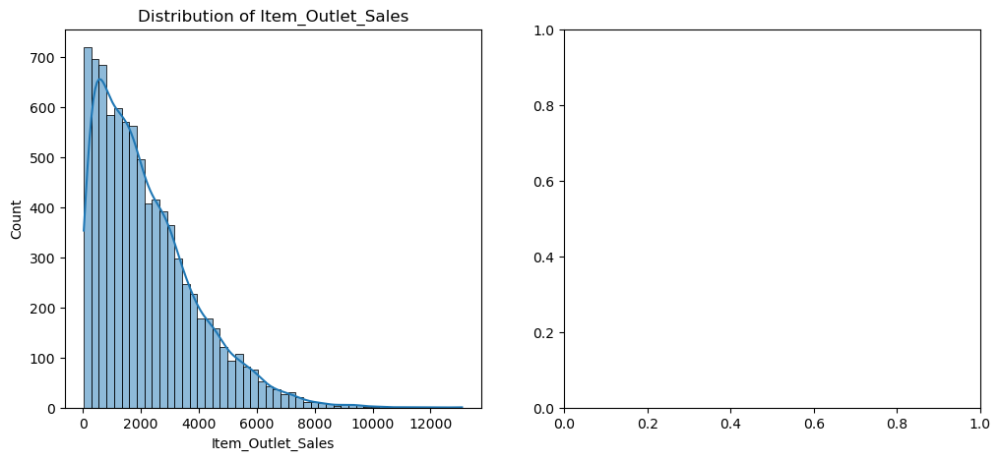

In [34]:
# Visualizing the Impact of Transformations


features = ["Item_Outlet_Sales", 'Item_']
fig, axes = plt.subplots(1, 2, figsize=(12, 5))


for i, feature in enumerate(features):
    sns.histplot(train_df[feature], bins=50, kde=True, ax=axes[i])
    axes[i].set_title(f"Distribution of {feature}")

plt.show()

In [35]:

numerical_features = train_df.select_dtypes(exclude='object').columns.tolist()

skewness = train_df[numerical_features].skew().sort_values(ascending=False)
skewness

Item_Outlet_Sales            1.177531
Item_Visibility              1.167091
Item_MRP                     0.127202
Item_Weight                  0.121845
Outlet_Establishment_Year   -0.396641
dtype: float64

In [36]:
# Step 3: Feature Engineering
train_df = advanced_feature_engineering(train_df)
test_df = advanced_feature_engineering(test_df)

In [39]:
# # Step 4: Train-Test Split (Industry Standard - 80% Train, 20% Test)
X_train, X_test, y_train, y_test = split_data(train_df)

In [40]:
# Step 5: Train XGBoost Model (Baseline)
baseline_xgb = XGBRegressor(objective="reg:squarederror", random_state=42)
baseline_xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [48]:
# Step 6: **Evaluate Baseline Model**

evaluate_model(baseline_xgb, X_test, y_test)

# RMSE on Validation Set: 1111.5601
# 1111.5600917105521

RMSE on Validation Set: 1111.5601


1111.5600917105521

In [42]:
# Step 7 :  Feature Selection (Train-Test Only)
X_train_selected, X_test_selected = feature_selection(X_train, X_test, baseline_xgb)

Selected Features: ['Item_MRP', 'Outlet_Type', 'Price_Ratio_To_Outlet_Avg', 'Item_Visibility', 'Item_Visibility_Normalized', 'MRP_Deviation_From_Type', 'Item_MRP_Deviation', 'MRP_To_Year_Ratio', 'Visibility_To_MRP_Ratio', 'Item_Identifier', 'Price_per_Weight', 'Item_Weight', 'Item_Count_Per_Outlet', 'Outlet_MRP_Range', 'Item_Type', 'Avg_MRP_Per_Type', 'Avg_MRP_Per_Outlet', 'Item_Fat_Content', 'Outlet_Size_Type', 'Item_MRP_Binned']


In [47]:
# Step 8: **Re-train XGBoost with Selected Features**
final_xgb_model = tune_xgboost(X_train_selected, y_train, X_test_selected, y_test)

#  Best Hyperparameters: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 500, 'subsample': 0.8}
# Validation RMSE After Tuning: 0.5183063484518721


### Latest model results!
# Best Hyperparameters: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 500, 'subsample': 0.9}
# Validation RMSE After Tuning: 1017.0485359039249

# Fitting 3 folds for each of 729 candidates, totalling 2187 fits
#  Best Hyperparameters: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 500, 'subsample': 0.9}
# Validation RMSE After Tuning: 1019.9956534842738

#  Best Hyperparameters: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 500, 'subsample': 0.9}
# Validation RMSE After Tuning: 1016.2468438837537

Fitting 3 folds for each of 729 candidates, totalling 2187 fits
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.8; total time=   0.4s
[0]	validation_0-rmse:1642.49284
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1643.42878
[1]	validation_0-rmse:1633.28347
[1]	validation_0-rmse:1632.56655
[2]	validation_0-rmse:1623.39992
[3]	validation_0-rmse:1613.79971
[2]	validation_0-rmse:1622.78665
[4]	validation_0-rmse:1604.44248
[5]	validation_0-rmse:1594.89464
[6]	validation_0-rmse:1585.59941
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1640.99063
[3]	validation_0-rmse:1613.14110
[7]	validation_0-rmse:1576.35030
[1]	validation_0-rmse:1631.48509
[8]	validation_0-rmse:1567.51277
[2]	validation_0-rmse:1621.97655


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[72]	validation_0-rmse:1205.02765
[22]	validation_0-rmse:1456.75435
[45]	validation_0-rmse:1318.04487
[93]	validation_0-rmse:1146.87230
[46]	validation_0-rmse:1313.03214
[62]	validation_0-rmse:1241.36651
[81]	validation_0-rmse:1183.09925
[23]	validation_0-rmse:1449.55139
[94]	validation_0-rmse:1144.58170
[73]	validation_0-rmse:1201.66671
[93]	validation_0-rmse:1146.09939
[47]	validation_0-rmse:1308.00417
[82]	validation_0-rmse:1180.30159
[24]	validation_0-rmse:1442.45503
[95]	validation_0-rmse:1142.31878
[48]	validation_0-rmse:1302.97071
[54]	validation_0-rmse:1280.18395
[25]	validation_0-rmse:1435.58540
[96]	validation_0-rmse:1139.97955
[83]	validation_0-rmse:1178.18112
[49]	validation_0-rmse:1297.87721
[26]	validation_0-rmse:1428.87800
[97]	validation_0-rmse:1137.80079
[55]	validation_0-rmse:1275.59826
[74]	validation_0-rmse:1198.35815
[94]	validation_0-rmse:1143.73239
[50]	validation_0-rmse:1293.06691
[27]	validation_0-rmse:1422.07925
[98]	validation_0-rmse:1135.63851
[56]	validatio

[204]	validation_0-rmse:1035.28044
[172]	validation_0-rmse:1047.29034
[205]	validation_0-rmse:1032.63661
[221]	validation_0-rmse:1031.58667
[219]	validation_0-rmse:1031.22550
[205]	validation_0-rmse:1035.03437
[197]	validation_0-rmse:1037.06014
[173]	validation_0-rmse:1046.72126
[206]	validation_0-rmse:1032.27461
[222]	validation_0-rmse:1031.45785
[206]	validation_0-rmse:1034.78315
[244]	validation_0-rmse:1024.41166
[174]	validation_0-rmse:1046.24107
[207]	validation_0-rmse:1031.96890
[223]	validation_0-rmse:1031.19219
[234]	validation_0-rmse:1025.96372
[207]	validation_0-rmse:1034.48389
[208]	validation_0-rmse:1031.67253
[175]	validation_0-rmse:1045.60500
[224]	validation_0-rmse:1030.98339
[220]	validation_0-rmse:1030.96398
[208]	validation_0-rmse:1034.25487
[198]	validation_0-rmse:1036.70183
[209]	validation_0-rmse:1031.38661
[176]	validation_0-rmse:1045.01459
[225]	validation_0-rmse:1030.68330
[235]	validation_0-rmse:1025.81154
[209]	validation_0-rmse:1033.93425
[245]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

dation_0-rmse:1020.14254
[278]	validation_0-rmse:1025.04919
[275]	validation_0-rmse:1024.96122
[260]	validation_0-rmse:1022.16547
[313]	validation_0-rmse:1019.57789
[284]	validation_0-rmse:1020.06705
[187]	validation_0-rmse:1039.96664
[279]	validation_0-rmse:1025.03141
[261]	validation_0-rmse:1021.96389
[314]	validation_0-rmse:1019.52090
[271]	validation_0-rmse:1021.37363
[285]	validation_0-rmse:1019.94030
[280]	validation_0-rmse:1025.13053
[278]	validation_0-rmse:1024.56017
[262]	validation_0-rmse:1021.83836
[315]	validation_0-rmse:1019.51712
[286]	validation_0-rmse:1019.91343
[281]	validation_0-rmse:1025.06856
[263]	validation_0-rmse:1021.72582
[316]	validation_0-rmse:1019.45566
[287]	validation_0-rmse:1019.87666
[276]	validation_0-rmse:1024.90176
[282]	validation_0-rmse:1024.97384
[264]	validation_0-rmse:1021.59201
[188]	validation_0-rmse:1039.54885
[317]	validation_0-rmse:1019.54873
[288]	validation_0-rmse:1019.78277
[283]	validation_0-rmse:1024.85456
[272]	validation_0-rmse:1021.2

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[72]	validation_0-rmse:1205.65559
[216]	validation_0-rmse:1029.46053
[193]	validation_0-rmse:1038.00566
[217]	validation_0-rmse:1029.77055
[217]	validation_0-rmse:1029.36706
[197]	validation_0-rmse:1038.00893
[194]	validation_0-rmse:1037.58808
[218]	validation_0-rmse:1029.49017
[210]	validation_0-rmse:1033.20297
[218]	validation_0-rmse:1029.13472
[198]	validation_0-rmse:1037.72237
[171]	validation_0-rmse:1047.36814
[137]	validation_0-rmse:1079.00659
[195]	validation_0-rmse:1037.04135
[219]	validation_0-rmse:1029.26544
[219]	validation_0-rmse:1028.97707
[73]	validation_0-rmse:1202.38095
[199]	validation_0-rmse:1037.45123
[220]	validation_0-rmse:1028.92737
[196]	validation_0-rmse:1036.65899
[220]	validation_0-rmse:1028.85737
[221]	validation_0-rmse:1028.67752
[197]	validation_0-rmse:1036.36204
[221]	validation_0-rmse:1028.76891
[222]	validation_0-rmse:1028.46209
[198]	validation_0-rmse:1036.02618
[222]	validation_0-rmse:1028.52152
[172]	validation_0-rmse:1046.83116
[74]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

mse:1049.98260
[309]	validation_0-rmse:1019.10674
[338]	validation_0-rmse:1024.03599
[172]	validation_0-rmse:1049.31038
[310]	validation_0-rmse:1018.98225
[339]	validation_0-rmse:1024.08556
[173]	validation_0-rmse:1048.73716
[311]	validation_0-rmse:1018.85767
[340]	validation_0-rmse:1024.10583
[323]	validation_0-rmse:1019.56707
[174]	validation_0-rmse:1048.21164
[341]	validation_0-rmse:1024.14737
[239]	validation_0-rmse:1024.96854
[286]	validation_0-rmse:1020.41494
[308]	validation_0-rmse:1018.31687
[290]	validation_0-rmse:1024.78903
[324]	validation_0-rmse:1019.51131
[240]	validation_0-rmse:1024.81663
[342]	validation_0-rmse:1024.11664
[291]	validation_0-rmse:1024.82560
[287]	validation_0-rmse:1020.31992
[241]	validation_0-rmse:1024.68143
[343]	validation_0-rmse:1024.11053
[292]	validation_0-rmse:1024.83089
[309]	validation_0-rmse:1018.21465
[325]	validation_0-rmse:1019.42708
[242]	validation_0-rmse:1024.49632
[344]	validation_0-rmse:1024.09394
[293]	validation_0-rmse:1024.85050
[243]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[55]	validation_0-rmse:1270.00088
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   0.6s
[0]	validation_0-rmse:1640.94564
[173]	validation_0-rmse:1046.72126
[86]	validation_0-rmse:1164.56049
[1]	validation_0-rmse:1631.39963
[27]	validation_0-rmse:1421.96986
[156]	validation_0-rmse:1060.77997
[56]	validation_0-rmse:1265.74829
[174]	validation_0-rmse:1046.24107
[2]	validation_0-rmse:1621.86268
[87]	validation_0-rmse:1162.03180
[3]	validation_0-rmse:1612.33671
[175]	validation_0-rmse:1045.60500
[88]	validation_0-rmse:1159.38459
[83]	validation_0-rmse:1171.77350
[4]	validation_0-rmse:1602.92552
[89]	validation_0-rmse:1156.82719
[176]	validation_0-rmse:1045.01459
[28]	validation_0-rmse:1415.16918
[84]	validation_0-rmse:1168.89385
[157]	validation_0-rmse:1059.86909
[57]	validation_0-rmse:1261.55449
[5]	validation_0-rmse:1593.98039
[90]	validation_0-rmse:1154.37983
[53]	validation_0-rmse:1284.65286
[177]	validat

[235]	validation_0-rmse:1025.68050
[366]	validation_0-rmse:1019.29772
[299]	validation_0-rmse:1023.82022
[234]	validation_0-rmse:1026.31181
[277]	validation_0-rmse:1024.95766
[356]	validation_0-rmse:1018.40977
[258]	validation_0-rmse:1022.29830
[367]	validation_0-rmse:1019.28980
[316]	validation_0-rmse:1019.45566
[278]	validation_0-rmse:1025.04919
[357]	validation_0-rmse:1018.43797
[368]	validation_0-rmse:1019.33448
[259]	validation_0-rmse:1022.29674
[279]	validation_0-rmse:1025.03141
[358]	validation_0-rmse:1018.43575
[369]	validation_0-rmse:1019.35602
[236]	validation_0-rmse:1025.47493
[260]	validation_0-rmse:1022.23925
[300]	validation_0-rmse:1023.78863
[235]	validation_0-rmse:1026.04477
[280]	validation_0-rmse:1025.13053
[359]	validation_0-rmse:1018.40891
[370]	validation_0-rmse:1019.39202
[261]	validation_0-rmse:1021.89427
[317]	validation_0-rmse:1019.54873
[281]	validation_0-rmse:1025.06856
[360]	validation_0-rmse:1018.33376
[371]	validation_0-rmse:1019.46618
[262]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

validation_0-rmse:1018.26291
[5]	validation_0-rmse:1594.43347
[115]	validation_0-rmse:1108.73057
[126]	validation_0-rmse:1089.05737
[40]	validation_0-rmse:1343.48717
[6]	validation_0-rmse:1585.50781
[74]	validation_0-rmse:1198.93021
[116]	validation_0-rmse:1107.06539
[7]	validation_0-rmse:1576.47912
[117]	validation_0-rmse:1105.48802
[407]	validation_0-rmse:1018.31857
[8]	validation_0-rmse:1567.67386
[75]	validation_0-rmse:1195.69313
[127]	validation_0-rmse:1087.61865
[9]	validation_0-rmse:1559.02144
[76]	validation_0-rmse:1192.61324
[10]	validation_0-rmse:1550.61060
[41]	validation_0-rmse:1338.03276
[77]	validation_0-rmse:1189.50980
[11]	validation_0-rmse:1542.03890
[42]	validation_0-rmse:1332.69845
[78]	validation_0-rmse:1186.33687
[12]	validation_0-rmse:1533.61300
[128]	validation_0-rmse:1086.25933
[43]	validation_0-rmse:1327.34902
[118]	validation_0-rmse:1104.03810
[79]	validation_0-rmse:1183.45364
[13]	validation_0-rmse:1525.31996
[44]	validation_0-rmse:1321.88665
[80]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[215]	validation_0-rmse:1031.39926
[334]	validation_0-rmse:1018.66037
[157]	validation_0-rmse:1059.78137
[281]	validation_0-rmse:1020.79866
[303]	validation_0-rmse:1023.90488
[335]	validation_0-rmse:1018.66849
[216]	validation_0-rmse:1031.19265
[158]	validation_0-rmse:1059.00778
[282]	validation_0-rmse:1020.69459
[125]	validation_0-rmse:1088.57034
[163]	validation_0-rmse:1053.75457
[159]	validation_0-rmse:1058.13656
[217]	validation_0-rmse:1031.01164
[126]	validation_0-rmse:1087.15961
[164]	validation_0-rmse:1053.08855
[160]	validation_0-rmse:1057.35999
[304]	validation_0-rmse:1023.93738
[218]	validation_0-rmse:1030.84987
[165]	validation_0-rmse:1052.45819
[161]	validation_0-rmse:1056.64526
[172]	validation_0-rmse:1046.48709
[166]	validation_0-rmse:1051.80596
[127]	validation_0-rmse:1085.89525
[162]	validation_0-rmse:1055.89376
[173]	validation_0-rmse:1045.87643
[283]	validation_0-rmse:1020.68258
[219]	validation_0-rmse:1030.67360
[336]	validation_0-rmse:1018.64525
[128]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

13419
[64]	validation_0-rmse:1234.16925
[87]	validation_0-rmse:1167.25741
[279]	validation_0-rmse:1020.89006
[373]	validation_0-rmse:1023.53725
[24]	validation_0-rmse:1442.35632
[358]	validation_0-rmse:1019.67865
[304]	validation_0-rmse:1023.15109
[65]	validation_0-rmse:1230.22879
[359]	validation_0-rmse:1019.66722
[25]	validation_0-rmse:1435.48798
[305]	validation_0-rmse:1023.19197
[66]	validation_0-rmse:1226.47048
[26]	validation_0-rmse:1428.78181
[360]	validation_0-rmse:1019.61727
[306]	validation_0-rmse:1023.09494
[67]	validation_0-rmse:1222.73653
[27]	validation_0-rmse:1421.99034
[88]	validation_0-rmse:1164.57858
[361]	validation_0-rmse:1019.65595
[307]	validation_0-rmse:1023.24121
[68]	validation_0-rmse:1219.18084
[28]	validation_0-rmse:1415.25475
[362]	validation_0-rmse:1019.68834
[280]	validation_0-rmse:1020.92136
[308]	validation_0-rmse:1023.18406
[69]	validation_0-rmse:1215.59225
[29]	validation_0-rmse:1408.65438
[363]	validation_0-rmse:1019.67102
[309]	validation_0-rmse:1023

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[214]	validation_0-rmse:1030.51465
[137]	validation_0-rmse:1074.94339
[410]	validation_0-rmse:1018.08858
[174]	validation_0-rmse:1047.67949
[275]	validation_0-rmse:1023.38899
[138]	validation_0-rmse:1073.78666
[175]	validation_0-rmse:1047.12279
[411]	validation_0-rmse:1018.10413
[276]	validation_0-rmse:1023.33616
[314]	validation_0-rmse:1018.11667
[77]	validation_0-rmse:1195.00504
[139]	validation_0-rmse:1072.71435
[412]	validation_0-rmse:1018.05431
[176]	validation_0-rmse:1046.40867
[277]	validation_0-rmse:1023.36082
[278]	validation_0-rmse:1023.33556
[413]	validation_0-rmse:1018.05155
[78]	validation_0-rmse:1191.86618
[315]	validation_0-rmse:1018.09843
[140]	validation_0-rmse:1071.59298
[414]	validation_0-rmse:1018.09923
[279]	validation_0-rmse:1023.40456
[79]	validation_0-rmse:1189.06454
[316]	validation_0-rmse:1018.09555
[103]	validation_0-rmse:1125.30303
[215]	validation_0-rmse:1030.23454
[177]	validation_0-rmse:1045.80528
[280]	validation_0-rmse:1023.40082
[104]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[54]	validation_0-rmse:1274.21358
[186]	validation_0-rmse:1041.21701
[204]	validation_0-rmse:1032.99395
[259]	validation_0-rmse:1025.23842
[55]	validation_0-rmse:1269.88896
[287]	validation_0-rmse:1019.43808
[335]	validation_0-rmse:1019.58530
[187]	validation_0-rmse:1040.72520
[56]	validation_0-rmse:1265.60851
[288]	validation_0-rmse:1019.28206
[188]	validation_0-rmse:1040.24678
[205]	validation_0-rmse:1032.63021
[289]	validation_0-rmse:1019.21001
[336]	validation_0-rmse:1019.55033
[189]	validation_0-rmse:1039.79187
[206]	validation_0-rmse:1032.29646
[290]	validation_0-rmse:1019.16654
[190]	validation_0-rmse:1039.27245
[207]	validation_0-rmse:1031.99594
[291]	validation_0-rmse:1019.10922
[191]	validation_0-rmse:1038.83060
[208]	validation_0-rmse:1031.75763
[292]	validation_0-rmse:1019.03397
[209]	validation_0-rmse:1031.43618
[192]	validation_0-rmse:1038.36340
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=500, subsample=0.9; total time=

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[272]	validation_0-rmse:1024.31785
[149]	validation_0-rmse:1066.96984
[394]	validation_0-rmse:1017.71242
[22]	validation_0-rmse:1458.93493
[273]	validation_0-rmse:1024.27351
[395]	validation_0-rmse:1017.74684
[23]	validation_0-rmse:1451.81826
[56]	validation_0-rmse:1266.36322
[113]	validation_0-rmse:1106.64760
[274]	validation_0-rmse:1024.18200
[396]	validation_0-rmse:1017.71051
[24]	validation_0-rmse:1444.77847
[275]	validation_0-rmse:1024.09591
[397]	validation_0-rmse:1017.72635
[150]	validation_0-rmse:1066.01004
[25]	validation_0-rmse:1438.05437
[228]	validation_0-rmse:1026.83923
[398]	validation_0-rmse:1017.87476
[26]	validation_0-rmse:1431.18231
[399]	validation_0-rmse:1017.88721
[229]	validation_0-rmse:1026.65092
[114]	validation_0-rmse:1104.91568
[27]	validation_0-rmse:1424.49934
[57]	validation_0-rmse:1262.07047
[276]	validation_0-rmse:1023.94296
[400]	validation_0-rmse:1017.91801
[230]	validation_0-rmse:1026.44626
[28]	validation_0-rmse:1417.83962
[401]	validation_0-rmse:1017.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[167]	validation_0-rmse:1052.23186
[207]	validation_0-rmse:1032.59467
[89]	validation_0-rmse:1156.72164
[373]	validation_0-rmse:1018.74349
[168]	validation_0-rmse:1051.60114
[121]	validation_0-rmse:1094.58174
[237]	validation_0-rmse:1026.72463
[90]	validation_0-rmse:1154.26765
[208]	validation_0-rmse:1032.24641
[287]	validation_0-rmse:1019.13797
[91]	validation_0-rmse:1151.71329
[169]	validation_0-rmse:1050.86855
[209]	validation_0-rmse:1031.92021
[238]	validation_0-rmse:1026.61611
[92]	validation_0-rmse:1149.13857
[210]	validation_0-rmse:1031.60761
[239]	validation_0-rmse:1026.46795
[93]	validation_0-rmse:1146.74324
[211]	validation_0-rmse:1031.37588
[240]	validation_0-rmse:1026.24660
[94]	validation_0-rmse:1144.45930
[122]	validation_0-rmse:1093.24040
[288]	validation_0-rmse:1018.99811
[212]	validation_0-rmse:1031.08467
[241]	validation_0-rmse:1026.11930
[95]	validation_0-rmse:1142.19715
[213]	validation_0-rmse:1030.75205
[374]	validation_0-rmse:1018.64798
[242]	validation_0-rmse:102

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[349]	validation_0-rmse:1023.02217
[276]	validation_0-rmse:1021.30587
[147]	validation_0-rmse:1066.05535
[37]	validation_0-rmse:1365.91172
[350]	validation_0-rmse:1023.06689
[277]	validation_0-rmse:1021.33998
[153]	validation_0-rmse:1063.23699
[374]	validation_0-rmse:1018.31002
[54]	validation_0-rmse:1274.86372
[351]	validation_0-rmse:1023.10916
[278]	validation_0-rmse:1021.32871
[375]	validation_0-rmse:1018.34178
[55]	validation_0-rmse:1270.27928
[352]	validation_0-rmse:1023.14661
[38]	validation_0-rmse:1360.04959
[148]	validation_0-rmse:1065.17271
[376]	validation_0-rmse:1018.31799
[279]	validation_0-rmse:1021.22306
[56]	validation_0-rmse:1265.88451
[353]	validation_0-rmse:1023.10871
[377]	validation_0-rmse:1018.41774
[149]	validation_0-rmse:1064.31647
[57]	validation_0-rmse:1261.69538
[378]	validation_0-rmse:1018.46857
[150]	validation_0-rmse:1063.60902
[58]	validation_0-rmse:1257.46899
[151]	validation_0-rmse:1062.70688
[280]	validation_0-rmse:1021.08780
[39]	validation_0-rmse:1354

[280]	validation_0-rmse:1020.92136
[74]	validation_0-rmse:1198.30142
[372]	validation_0-rmse:1023.20870
[146]	validation_0-rmse:1066.18594
[227]	validation_0-rmse:1027.46972
[75]	validation_0-rmse:1195.06109
[373]	validation_0-rmse:1023.24099
[200]	validation_0-rmse:1035.10796
[120]	validation_0-rmse:1100.99199
[228]	validation_0-rmse:1027.40880
[76]	validation_0-rmse:1191.87213
[281]	validation_0-rmse:1020.83930
[368]	validation_0-rmse:1017.21468
[229]	validation_0-rmse:1027.19378
[121]	validation_0-rmse:1099.58938
[282]	validation_0-rmse:1020.77186
[147]	validation_0-rmse:1065.28170
[122]	validation_0-rmse:1098.28047
[77]	validation_0-rmse:1188.75330
[201]	validation_0-rmse:1034.80322
[374]	validation_0-rmse:1023.33855
[123]	validation_0-rmse:1096.78825
[369]	validation_0-rmse:1017.20538
[283]	validation_0-rmse:1020.68323
[202]	validation_0-rmse:1034.49670
[230]	validation_0-rmse:1026.95025
[375]	validation_0-rmse:1023.41994
[124]	validation_0-rmse:1095.42604
[203]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[108]	validation_0-rmse:1115.59555
[305]	validation_0-rmse:1018.91944
[243]	validation_0-rmse:1026.62563
[341]	validation_0-rmse:1019.52077
[306]	validation_0-rmse:1018.91571
[109]	validation_0-rmse:1113.78061
[406]	validation_0-rmse:1017.86460
[342]	validation_0-rmse:1019.50031
[110]	validation_0-rmse:1111.92269
[244]	validation_0-rmse:1026.45050
[343]	validation_0-rmse:1019.52997
[94]	validation_0-rmse:1150.08614
[407]	validation_0-rmse:1017.88035
[245]	validation_0-rmse:1026.31956
[344]	validation_0-rmse:1019.51117
[307]	validation_0-rmse:1018.89711
[345]	validation_0-rmse:1019.48837
[246]	validation_0-rmse:1026.24293
[111]	validation_0-rmse:1110.35426
[346]	validation_0-rmse:1019.49423
[95]	validation_0-rmse:1147.75504
[247]	validation_0-rmse:1025.99445
[347]	validation_0-rmse:1019.44206
[408]	validation_0-rmse:1017.81062
[248]	validation_0-rmse:1025.89446
[348]	validation_0-rmse:1019.44681
[308]	validation_0-rmse:1018.97886
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_de

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[266]	validation_0-rmse:1022.19019
[276]	validation_0-rmse:1020.08324
[62]	validation_0-rmse:1241.14162
[91]	validation_0-rmse:1151.31790
[16]	validation_0-rmse:1500.37389
[277]	validation_0-rmse:1020.01763
[156]	validation_0-rmse:1058.65349
[267]	validation_0-rmse:1022.14692
[63]	validation_0-rmse:1237.27205
[92]	validation_0-rmse:1148.82443
[278]	validation_0-rmse:1020.00794
[64]	validation_0-rmse:1234.17829
[93]	validation_0-rmse:1146.38689
[110]	validation_0-rmse:1117.47004
[94]	validation_0-rmse:1144.05517
[65]	validation_0-rmse:1230.23524
[268]	validation_0-rmse:1022.09305
[17]	validation_0-rmse:1492.66201
[66]	validation_0-rmse:1226.47737
[157]	validation_0-rmse:1057.89482
[95]	validation_0-rmse:1141.83242
[269]	validation_0-rmse:1021.98471
[67]	validation_0-rmse:1222.74368
[96]	validation_0-rmse:1139.49731
[111]	validation_0-rmse:1115.66628
[270]	validation_0-rmse:1021.83603
[68]	validation_0-rmse:1219.18860
[97]	validation_0-rmse:1137.23754
[18]	validation_0-rmse:1485.03139
[6

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[289]	validation_0-rmse:1020.15509
[300]	validation_0-rmse:1023.32276
[12]	validation_0-rmse:1532.58353
[155]	validation_0-rmse:1060.74644
[290]	validation_0-rmse:1020.11018
[301]	validation_0-rmse:1023.29235
[13]	validation_0-rmse:1524.32888
[156]	validation_0-rmse:1059.90733
[183]	validation_0-rmse:1041.49727
[291]	validation_0-rmse:1020.14180
[14]	validation_0-rmse:1516.16146
[302]	validation_0-rmse:1023.26244
[157]	validation_0-rmse:1058.97275
[292]	validation_0-rmse:1020.14029
[15]	validation_0-rmse:1508.11073
[303]	validation_0-rmse:1023.21219
[293]	validation_0-rmse:1020.17692
[16]	validation_0-rmse:1500.18837
[304]	validation_0-rmse:1023.25768
[385]	validation_0-rmse:1016.80866
[294]	validation_0-rmse:1020.15127
[184]	validation_0-rmse:1041.16084
[17]	validation_0-rmse:1492.50170
[305]	validation_0-rmse:1023.31553
[295]	validation_0-rmse:1020.01819
[264]	validation_0-rmse:1020.07877
[306]	validation_0-rmse:1023.26917
[386]	validation_0-rmse:1016.79837
[296]	validation_0-rmse:10

[289]	validation_0-rmse:1017.45605
[179]	validation_0-rmse:1043.41114
[330]	validation_0-rmse:1019.25640
[72]	validation_0-rmse:1205.90952
[108]	validation_0-rmse:1121.19143
[351]	validation_0-rmse:1022.27308
[290]	validation_0-rmse:1017.37256
[331]	validation_0-rmse:1019.27386
[180]	validation_0-rmse:1042.93489
[109]	validation_0-rmse:1119.35185
[332]	validation_0-rmse:1019.22841
[291]	validation_0-rmse:1017.34957
[110]	validation_0-rmse:1117.42833
[32]	validation_0-rmse:1390.25249
[333]	validation_0-rmse:1019.27674
[292]	validation_0-rmse:1017.27452
[111]	validation_0-rmse:1115.68463
[73]	validation_0-rmse:1202.57757
[33]	validation_0-rmse:1383.94047
[293]	validation_0-rmse:1017.21972
[381]	validation_0-rmse:1016.19750
[334]	validation_0-rmse:1019.28509
[34]	validation_0-rmse:1379.16868
[352]	validation_0-rmse:1022.32966
[294]	validation_0-rmse:1017.26175
[112]	validation_0-rmse:1113.92065
[35]	validation_0-rmse:1373.06598
[382]	validation_0-rmse:1016.16482
[335]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[207]	validation_0-rmse:1031.91854
[104]	validation_0-rmse:1128.66332
[25]	validation_0-rmse:1435.48798
[95]	validation_0-rmse:1141.83242
[208]	validation_0-rmse:1031.68351
[293]	validation_0-rmse:1018.99464
[305]	validation_0-rmse:1023.05938
[26]	validation_0-rmse:1428.78181
[209]	validation_0-rmse:1031.38624
[96]	validation_0-rmse:1139.49731
[63]	validation_0-rmse:1237.27205
[188]	validation_0-rmse:1040.45057
[105]	validation_0-rmse:1126.86003
[294]	validation_0-rmse:1018.79505
[210]	validation_0-rmse:1031.07566
[97]	validation_0-rmse:1137.23754
[306]	validation_0-rmse:1022.89666
[27]	validation_0-rmse:1421.99034
[211]	validation_0-rmse:1030.81133
[98]	validation_0-rmse:1135.05449
[307]	validation_0-rmse:1022.97582
[189]	validation_0-rmse:1039.91750
[28]	validation_0-rmse:1415.25475
[212]	validation_0-rmse:1030.57360
[308]	validation_0-rmse:1022.93651
[99]	validation_0-rmse:1133.16118
[295]	validation_0-rmse:1018.81233
[64]	validation_0-rmse:1234.17829
[29]	validation_0-rmse:1408.654

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[382]	validation_0-rmse:1019.72689
[354]	validation_0-rmse:1023.30088
[78]	validation_0-rmse:1191.30442
[273]	validation_0-rmse:1020.94799
[216]	validation_0-rmse:1029.90839
[237]	validation_0-rmse:1026.67186
[383]	validation_0-rmse:1019.64846
[79]	validation_0-rmse:1188.33981
[239]	validation_0-rmse:1023.53989
[80]	validation_0-rmse:1185.27990
[384]	validation_0-rmse:1019.57745
[240]	validation_0-rmse:1023.40857
[355]	validation_0-rmse:1023.26349
[81]	validation_0-rmse:1182.32439
[385]	validation_0-rmse:1019.48079
[217]	validation_0-rmse:1029.67460
[274]	validation_0-rmse:1020.80213
[82]	validation_0-rmse:1179.47359
[386]	validation_0-rmse:1019.42059
[218]	validation_0-rmse:1029.38942
[83]	validation_0-rmse:1177.28745
[387]	validation_0-rmse:1019.36878
[238]	validation_0-rmse:1026.53972
[84]	validation_0-rmse:1174.64525
[219]	validation_0-rmse:1029.12848
[388]	validation_0-rmse:1019.41642
[85]	validation_0-rmse:1171.90908
[220]	validation_0-rmse:1028.86048
[275]	validation_0-rmse:1020

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[162]	validation_0-rmse:1053.52269
[2]	validation_0-rmse:1623.52965
[248]	validation_0-rmse:1021.91267
[3]	validation_0-rmse:1614.15877
[110]	validation_0-rmse:1111.92269
[4]	validation_0-rmse:1604.76598
[90]	validation_0-rmse:1159.46790
[163]	validation_0-rmse:1052.82546
[249]	validation_0-rmse:1021.75991
[91]	validation_0-rmse:1157.20672
[164]	validation_0-rmse:1052.12388
[392]	validation_0-rmse:1016.42602
[92]	validation_0-rmse:1154.61437
[250]	validation_0-rmse:1021.55791
[5]	validation_0-rmse:1595.01392
[93]	validation_0-rmse:1152.26989
[251]	validation_0-rmse:1021.32047
[165]	validation_0-rmse:1051.46987
[252]	validation_0-rmse:1021.22370
[393]	validation_0-rmse:1016.41564
[111]	validation_0-rmse:1110.35426
[94]	validation_0-rmse:1150.08614
[253]	validation_0-rmse:1021.04600
[6]	validation_0-rmse:1585.52980
[254]	validation_0-rmse:1020.91631
[112]	validation_0-rmse:1108.70299
[255]	validation_0-rmse:1020.82451
[113]	validation_0-rmse:1106.97519
[394]	validation_0-rmse:1016.40652


[289]	validation_0-rmse:1019.31792
[328]	validation_0-rmse:1022.85239
[207]	validation_0-rmse:1033.90745
[37]	validation_0-rmse:1360.65279
[156]	validation_0-rmse:1057.11562
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=1000, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1642.38311
[38]	validation_0-rmse:1354.82014
[156]	validation_0-rmse:1059.76443
[157]	validation_0-rmse:1056.36367
[1]	validation_0-rmse:1632.50840
[290]	validation_0-rmse:1019.28977
[39]	validation_0-rmse:1349.07458
[280]	validation_0-rmse:1021.17798
[158]	validation_0-rmse:1055.75705
[208]	validation_0-rmse:1033.54657
[2]	validation_0-rmse:1623.04470
[159]	validation_0-rmse:1054.99479
[157]	validation_0-rmse:1058.80983
[40]	validation_0-rmse:1343.54469
[160]	validation_0-rmse:1054.33718
[158]	validation_0-rmse:1058.11474
[291]	validation_0-rmse:1019.19877
[281]	validation_0-rmse:1021.04453
[329]	validation_0-rmse:1022.89671
[161]	validation_0-rmse:1053.7122

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[35]	validation_0-rmse:1376.97362
[352]	validation_0-rmse:1023.37220
[36]	validation_0-rmse:1371.16359
[383]	validation_0-rmse:1019.64846
[129]	validation_0-rmse:1084.22739
[270]	validation_0-rmse:1019.19694
[353]	validation_0-rmse:1023.31099
[37]	validation_0-rmse:1365.37585
[130]	validation_0-rmse:1083.24692
[354]	validation_0-rmse:1023.30088
[279]	validation_0-rmse:1020.64449
[131]	validation_0-rmse:1081.99236
[355]	validation_0-rmse:1023.26349
[38]	validation_0-rmse:1359.50808
[162]	validation_0-rmse:1053.94354
[280]	validation_0-rmse:1020.68870
[356]	validation_0-rmse:1023.23130
[384]	validation_0-rmse:1019.57745
[132]	validation_0-rmse:1080.79336
[281]	validation_0-rmse:1020.55687
[271]	validation_0-rmse:1019.09143
[163]	validation_0-rmse:1053.36917
[282]	validation_0-rmse:1020.47573
[39]	validation_0-rmse:1354.06465
[385]	validation_0-rmse:1019.48079
[133]	validation_0-rmse:1079.68161
[386]	validation_0-rmse:1019.42059
[134]	validation_0-rmse:1078.57897
[40]	validation_0-rmse:13

[318]	validation_0-rmse:1019.49710
[1]	validation_0-rmse:1631.79365
[204]	validation_0-rmse:1032.99871
[355]	validation_0-rmse:1022.30508
[319]	validation_0-rmse:1019.49928
[46]	validation_0-rmse:1308.83649
[320]	validation_0-rmse:1019.46528
[205]	validation_0-rmse:1032.59922
[9]	validation_0-rmse:1556.87074
[2]	validation_0-rmse:1621.80458
[98]	validation_0-rmse:1129.60393
[321]	validation_0-rmse:1019.44141
[206]	validation_0-rmse:1032.23338
[69]	validation_0-rmse:1203.12277
[322]	validation_0-rmse:1019.46684
[207]	validation_0-rmse:1031.83881
[3]	validation_0-rmse:1611.94606
[208]	validation_0-rmse:1031.53060
[323]	validation_0-rmse:1019.40216
[99]	validation_0-rmse:1127.93119
[356]	validation_0-rmse:1022.40075
[209]	validation_0-rmse:1031.20404
[324]	validation_0-rmse:1019.30408
[70]	validation_0-rmse:1199.55593
[10]	validation_0-rmse:1548.02685
[210]	validation_0-rmse:1030.82538
[325]	validation_0-rmse:1019.25801
[100]	validation_0-rmse:1125.92756
[211]	validation_0-rmse:1030.51194

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


.23797
[167]	validation_0-rmse:1043.10734
[211]	validation_0-rmse:1036.78827
[37]	validation_0-rmse:1351.29193
[388]	validation_0-rmse:1015.92845
[112]	validation_0-rmse:1097.11406
[114]	validation_0-rmse:1101.59276
[389]	validation_0-rmse:1015.93478
[38]	validation_0-rmse:1345.54938
[91]	validation_0-rmse:1148.84246
[212]	validation_0-rmse:1036.59686
[390]	validation_0-rmse:1015.91079
[113]	validation_0-rmse:1095.50456
[39]	validation_0-rmse:1339.62942
[92]	validation_0-rmse:1146.24140
[158]	validation_0-rmse:1055.52182
[213]	validation_0-rmse:1036.38751
[40]	validation_0-rmse:1334.05989
[391]	validation_0-rmse:1015.95137
[114]	validation_0-rmse:1093.87306
[93]	validation_0-rmse:1144.03276
[115]	validation_0-rmse:1099.95674
[392]	validation_0-rmse:1015.99351
[168]	validation_0-rmse:1042.50768
[94]	validation_0-rmse:1141.78714
[393]	validation_0-rmse:1015.98685
[115]	validation_0-rmse:1092.41828
[214]	validation_0-rmse:1036.23511
[394]	validation_0-rmse:1016.00493
[159]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[207]	validation_0-rmse:1033.39650
[277]	validation_0-rmse:1023.85611
[356]	validation_0-rmse:1029.51922
[157]	validation_0-rmse:1055.55350
[99]	validation_0-rmse:1120.61441
[283]	validation_0-rmse:1022.62841
[226]	validation_0-rmse:1033.49742
[208]	validation_0-rmse:1033.08904
[239]	validation_0-rmse:1024.29469
[357]	validation_0-rmse:1029.58156
[100]	validation_0-rmse:1118.53529
[278]	validation_0-rmse:1023.96156
[284]	validation_0-rmse:1022.65550
[158]	validation_0-rmse:1054.90567
[209]	validation_0-rmse:1032.91804
[227]	validation_0-rmse:1033.39210
[285]	validation_0-rmse:1022.78344
[358]	validation_0-rmse:1029.73242
[240]	validation_0-rmse:1024.42570
[101]	validation_0-rmse:1116.51674
[279]	validation_0-rmse:1023.83982
[210]	validation_0-rmse:1032.56589
[280]	validation_0-rmse:1023.80692
[241]	validation_0-rmse:1024.23061
[159]	validation_0-rmse:1054.25559
[228]	validation_0-rmse:1033.33332
[281]	validation_0-rmse:1023.70843
[286]	validation_0-rmse:1022.70456
[211]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

ning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=500, subsample=0.7; total time=   1.1s
[0]	validation_0-rmse:1643.35529
[277]	validation_0-rmse:1028.14611
[6]	validation_0-rmse:1583.57486
[22]	validation_0-rmse:1448.44084
[131]	validation_0-rmse:1079.38796
[240]	validation_0-rmse:1026.37318
[353]	validation_0-rmse:1021.28037
[1]	validation_0-rmse:1633.23822
[7]	validation_0-rmse:1574.45808
[34]	validation_0-rmse:1371.58320
[132]	validation_0-rmse:1078.10229
[278]	validation_0-rmse:1028.17736
[23]	validation_0-rmse:1441.10616
[241]	validation_0-rmse:1026.31664
[35]	validation_0-rmse:1365.62069
[133]	validation_0-rmse:1076.89617
[24]	validation_0-rmse:1433.90018
[354]	validation_0-rmse:1021.36740
[2]	validation_0-rmse:1623.31998
[279]	validation_0-rmse:1028.12152
[355]	validation_0-rmse:1021.44336
[242]	validation_0-rmse:1026.28612
[8]	validation_0-rmse:1565.61554
[134]	validation_0-rmse:1075.78918
[36]	validation_0-rmse:1359.34028
[3]	validation_0-rmse:1613.35834
[280]	val

[46]	validation_0-rmse:1299.99293
[316]	validation_0-rmse:1023.86908
[352]	validation_0-rmse:1027.77663
[102]	validation_0-rmse:1125.11174
[95]	validation_0-rmse:1136.35140
[47]	validation_0-rmse:1294.91672
[212]	validation_0-rmse:1030.97507
[317]	validation_0-rmse:1023.93344
[111]	validation_0-rmse:1106.32967
[353]	validation_0-rmse:1027.81069
[96]	validation_0-rmse:1134.18091
[48]	validation_0-rmse:1289.84579
[213]	validation_0-rmse:1030.74192
[97]	validation_0-rmse:1131.88403
[49]	validation_0-rmse:1284.89443
[318]	validation_0-rmse:1023.94812
[214]	validation_0-rmse:1030.67605
[98]	validation_0-rmse:1129.93263
[50]	validation_0-rmse:1279.93283
[103]	validation_0-rmse:1123.18097
[354]	validation_0-rmse:1027.79321
[319]	validation_0-rmse:1024.00539
[105]	validation_0-rmse:1109.52265
[112]	validation_0-rmse:1104.83354
[215]	validation_0-rmse:1030.44375
[99]	validation_0-rmse:1128.05730
[51]	validation_0-rmse:1275.13864
[320]	validation_0-rmse:1023.98274
[100]	validation_0-rmse:1126.02

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-rmse:1388.19870
[138]	validation_0-rmse:1064.11590
[180]	validation_0-rmse:1046.09736
[165]	validation_0-rmse:1052.98166
[44]	validation_0-rmse:1319.39398
[183]	validation_0-rmse:1041.23326
[166]	validation_0-rmse:1052.45925
[287]	validation_0-rmse:1021.15943
[139]	validation_0-rmse:1063.11727
[170]	validation_0-rmse:1041.54343
[181]	validation_0-rmse:1045.58444
[288]	validation_0-rmse:1021.07998
[140]	validation_0-rmse:1062.17961
[182]	validation_0-rmse:1045.16532
[45]	validation_0-rmse:1314.62835
[289]	validation_0-rmse:1021.07897
[141]	validation_0-rmse:1061.34418
[32]	validation_0-rmse:1381.86855
[142]	validation_0-rmse:1060.44762
[46]	validation_0-rmse:1309.44049
[290]	validation_0-rmse:1021.10137
[171]	validation_0-rmse:1041.08033
[184]	validation_0-rmse:1040.87722
[33]	validation_0-rmse:1375.68110
[183]	validation_0-rmse:1044.68058
[143]	validation_0-rmse:1059.54044
[34]	validation_0-rmse:1369.53562
[47]	validation_0-rmse:1304.32717
[184]	validation_0-rmse:1044

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-rmse:1379.25743
[282]	validation_0-rmse:1022.59498
[161]	validation_0-rmse:1053.32581
[33]	validation_0-rmse:1372.89467
[289]	validation_0-rmse:1023.36859
[282]	validation_0-rmse:1029.93916
[283]	validation_0-rmse:1022.62841
[162]	validation_0-rmse:1052.84803
[34]	validation_0-rmse:1367.40724
[284]	validation_0-rmse:1022.65550
[283]	validation_0-rmse:1029.72705
[142]	validation_0-rmse:1066.98434
[261]	validation_0-rmse:1030.57989
[163]	validation_0-rmse:1052.21326
[285]	validation_0-rmse:1022.78344
[143]	validation_0-rmse:1066.07512
[164]	validation_0-rmse:1051.54205
[284]	validation_0-rmse:1029.66636
[35]	validation_0-rmse:1361.12973
[290]	validation_0-rmse:1023.37065
[285]	validation_0-rmse:1029.52924
[286]	validation_0-rmse:1022.70456
[291]	validation_0-rmse:1023.38058
[36]	validation_0-rmse:1355.18001
[144]	validation_0-rmse:1065.20234
[286]	validation_0-rmse:1029.59571
[37]	validation_0-rmse:1349.09585
[239]	validation_0-rmse:1024.29469
[292]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[5]	validation_0-rmse:1592.64509
[245]	validation_0-rmse:1026.00491
[319]	validation_0-rmse:1022.72026
[357]	validation_0-rmse:1029.58156
[362]	validation_0-rmse:1021.67259
[6]	validation_0-rmse:1583.43235
[246]	validation_0-rmse:1025.95583
[119]	validation_0-rmse:1086.40174
[7]	validation_0-rmse:1574.38961
[320]	validation_0-rmse:1022.85877
[247]	validation_0-rmse:1025.77632
[120]	validation_0-rmse:1085.06860
[358]	validation_0-rmse:1029.73242
[121]	validation_0-rmse:1083.67259
[363]	validation_0-rmse:1021.64754
[220]	validation_0-rmse:1033.72464
[8]	validation_0-rmse:1565.41359
[122]	validation_0-rmse:1082.26594
[321]	validation_0-rmse:1022.84966
[9]	validation_0-rmse:1556.76742
[10]	validation_0-rmse:1548.28672
[322]	validation_0-rmse:1023.06390
[11]	validation_0-rmse:1539.79635
[248]	validation_0-rmse:1025.66717
[221]	validation_0-rmse:1033.36033
[323]	validation_0-rmse:1023.02313
[249]	validation_0-rmse:1025.57466
[222]	validation_0-rmse:1033.25514
[250]	validation_0-rmse:1025.340

[72]	validation_0-rmse:1192.78884
[280]	validation_0-rmse:1028.00672
[58]	validation_0-rmse:1249.17443
[57]	validation_0-rmse:1257.53235
[94]	validation_0-rmse:1140.81225
[191]	validation_0-rmse:1034.93085
[59]	validation_0-rmse:1245.10554
[73]	validation_0-rmse:1189.53887
[58]	validation_0-rmse:1253.22633
[343]	validation_0-rmse:1021.18169
[95]	validation_0-rmse:1138.56733
[74]	validation_0-rmse:1186.19899
[60]	validation_0-rmse:1241.17763
[22]	validation_0-rmse:1451.62472
[281]	validation_0-rmse:1027.94103
[59]	validation_0-rmse:1249.04943
[61]	validation_0-rmse:1237.21387
[96]	validation_0-rmse:1136.47676
[75]	validation_0-rmse:1183.25774
[60]	validation_0-rmse:1245.07459
[192]	validation_0-rmse:1034.49543
[97]	validation_0-rmse:1134.42118
[76]	validation_0-rmse:1180.11441
[61]	validation_0-rmse:1241.28999
[62]	validation_0-rmse:1233.26289
[98]	validation_0-rmse:1132.27075
[344]	validation_0-rmse:1021.19414
[282]	validation_0-rmse:1027.80894
[62]	validation_0-rmse:1237.22661
[77]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-rmse:1047.12302
[159]	validation_0-rmse:1056.83919
[185]	validation_0-rmse:1039.75259
[276]	validation_0-rmse:1024.02918
[39]	validation_0-rmse:1337.38760
[160]	validation_0-rmse:1056.28511
[161]	validation_0-rmse:1046.45995
[161]	validation_0-rmse:1055.69511
[40]	validation_0-rmse:1331.71892
[162]	validation_0-rmse:1045.85902
[186]	validation_0-rmse:1039.33306
[162]	validation_0-rmse:1055.13607
[163]	validation_0-rmse:1045.30199
[160]	validation_0-rmse:1053.85955
[163]	validation_0-rmse:1054.46716
[127]	validation_0-rmse:1084.06287
[187]	validation_0-rmse:1038.95935
[164]	validation_0-rmse:1053.91675
[41]	validation_0-rmse:1326.10001
[161]	validation_0-rmse:1053.17465
[164]	validation_0-rmse:1044.73157
[165]	validation_0-rmse:1053.35657
[42]	validation_0-rmse:1320.64240
[128]	validation_0-rmse:1082.84561
[277]	validation_0-rmse:1023.90945
[162]	validation_0-rmse:1052.50738
[166]	validation_0-rmse:1052.83890
[43]	validation_0-rmse:1315.49558
[188]	validation_0-rmse:1

[207]	validation_0-rmse:1033.28695
[324]	validation_0-rmse:1023.98858
[179]	validation_0-rmse:1046.42479
[203]	validation_0-rmse:1030.23963
[91]	validation_0-rmse:1139.12553
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   1.1s
[0]	validation_0-rmse:1640.71407
[233]	validation_0-rmse:1026.73947
[325]	validation_0-rmse:1024.03283
[208]	validation_0-rmse:1033.01680
[1]	validation_0-rmse:1630.86855
[326]	validation_0-rmse:1024.07530
[2]	validation_0-rmse:1620.93573
[180]	validation_0-rmse:1046.00930
[204]	validation_0-rmse:1030.07204
[92]	validation_0-rmse:1136.88361
[327]	validation_0-rmse:1024.17601
[234]	validation_0-rmse:1026.71022
[3]	validation_0-rmse:1611.39149
[209]	validation_0-rmse:1032.77213
[205]	validation_0-rmse:1029.86768
[235]	validation_0-rmse:1026.51435
[93]	validation_0-rmse:1134.53509
[4]	validation_0-rmse:1601.97648
[328]	validation_0-rmse:1024.16419
[181]	validation_0-rmse:1045.57569
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[258]	validation_0-rmse:1030.67078
[63]	validation_0-rmse:1233.81037
[226]	validation_0-rmse:1033.49742
[147]	validation_0-rmse:1056.06823
[259]	validation_0-rmse:1025.58789
[64]	validation_0-rmse:1230.26373
[259]	validation_0-rmse:1030.71536
[227]	validation_0-rmse:1033.39210
[148]	validation_0-rmse:1055.20851
[260]	validation_0-rmse:1025.46064
[276]	validation_0-rmse:1021.76273
[65]	validation_0-rmse:1226.67022
[250]	validation_0-rmse:1023.68486
[228]	validation_0-rmse:1033.33332
[261]	validation_0-rmse:1025.23157
[229]	validation_0-rmse:1033.29358
[277]	validation_0-rmse:1021.73213
[149]	validation_0-rmse:1054.52649
[260]	validation_0-rmse:1030.59604
[251]	validation_0-rmse:1023.67297
[230]	validation_0-rmse:1033.19421
[11]	validation_0-rmse:1539.27237
[262]	validation_0-rmse:1025.09629
[231]	validation_0-rmse:1033.13826
[278]	validation_0-rmse:1021.57670
[252]	validation_0-rmse:1023.56401
[66]	validation_0-rmse:1223.00827
[150]	validation_0-rmse:1053.73767
[279]	validation_0-rmse:1

[332]	validation_0-rmse:1029.49611
[292]	validation_0-rmse:1030.60437
[96]	validation_0-rmse:1132.53976
[326]	validation_0-rmse:1022.71602
[213]	validation_0-rmse:1027.67447
[328]	validation_0-rmse:1021.65876
[140]	validation_0-rmse:1070.23991
[97]	validation_0-rmse:1130.20654
[333]	validation_0-rmse:1029.57319
[293]	validation_0-rmse:1030.84500
[349]	validation_0-rmse:1022.33107
[98]	validation_0-rmse:1128.09211
[214]	validation_0-rmse:1027.52694
[99]	validation_0-rmse:1126.13830
[329]	validation_0-rmse:1021.59141
[141]	validation_0-rmse:1069.40906
[334]	validation_0-rmse:1029.64674
[100]	validation_0-rmse:1124.18262
[215]	validation_0-rmse:1027.42445
[101]	validation_0-rmse:1122.20611
[330]	validation_0-rmse:1021.74196
[294]	validation_0-rmse:1030.76117
[335]	validation_0-rmse:1029.69768
[327]	validation_0-rmse:1022.85401
[102]	validation_0-rmse:1120.07339
[336]	validation_0-rmse:1029.71096
[328]	validation_0-rmse:1022.90289
[103]	validation_0-rmse:1118.17760
[142]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[18]	validation_0-rmse:1483.22507
[15]	validation_0-rmse:1505.02222
[181]	validation_0-rmse:1043.46472
[45]	validation_0-rmse:1304.75618
[285]	validation_0-rmse:1022.16356
[16]	validation_0-rmse:1496.73872
[46]	validation_0-rmse:1299.66691
[19]	validation_0-rmse:1475.68347
[286]	validation_0-rmse:1022.21616
[207]	validation_0-rmse:1033.39650
[287]	validation_0-rmse:1022.20927
[208]	validation_0-rmse:1033.08904
[182]	validation_0-rmse:1043.21592
[20]	validation_0-rmse:1468.07898
[288]	validation_0-rmse:1022.25958
[209]	validation_0-rmse:1032.91804
[183]	validation_0-rmse:1042.80982
[3]	validation_0-rmse:1611.97485
[17]	validation_0-rmse:1488.88008
[21]	validation_0-rmse:1460.66237
[47]	validation_0-rmse:1294.49606
[18]	validation_0-rmse:1480.77512
[4]	validation_0-rmse:1602.36839
[5]	validation_0-rmse:1592.39379
[19]	validation_0-rmse:1472.85056
[6]	validation_0-rmse:1582.87952
[22]	validation_0-rmse:1454.02425
[289]	validation_0-rmse:1022.34551
[48]	validation_0-rmse:1289.61557
[7]	val

[279]	validation_0-rmse:1022.37350
[125]	validation_0-rmse:1078.35691
[85]	validation_0-rmse:1153.20279
[96]	validation_0-rmse:1130.82351
[66]	validation_0-rmse:1221.66119
[86]	validation_0-rmse:1150.46514
[67]	validation_0-rmse:1217.95867
[126]	validation_0-rmse:1077.08985
[102]	validation_0-rmse:1124.14251
[280]	validation_0-rmse:1022.39465
[87]	validation_0-rmse:1147.97154
[97]	validation_0-rmse:1128.55691
[68]	validation_0-rmse:1214.49396
[127]	validation_0-rmse:1075.91865
[88]	validation_0-rmse:1145.44090
[128]	validation_0-rmse:1074.67403
[69]	validation_0-rmse:1210.91425
[251]	validation_0-rmse:1029.22901
[98]	validation_0-rmse:1126.41258
[281]	validation_0-rmse:1022.41860
[103]	validation_0-rmse:1122.11075
[70]	validation_0-rmse:1207.44537
[89]	validation_0-rmse:1142.81641
[71]	validation_0-rmse:1204.15471
[282]	validation_0-rmse:1022.40932
[99]	validation_0-rmse:1124.70759
[72]	validation_0-rmse:1200.76804
[283]	validation_0-rmse:1022.33077
[90]	validation_0-rmse:1140.34717
[2

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[350]	validation_0-rmse:1021.34053
[162]	validation_0-rmse:1051.81330
[167]	validation_0-rmse:1048.99206
[192]	validation_0-rmse:1034.49543
[147]	validation_0-rmse:1063.72297
[168]	validation_0-rmse:1048.44100
[53]	validation_0-rmse:1268.15896
[164]	validation_0-rmse:1043.84670
[54]	validation_0-rmse:1263.54779
[351]	validation_0-rmse:1021.43022
[193]	validation_0-rmse:1034.13953
[165]	validation_0-rmse:1043.37932
[148]	validation_0-rmse:1062.89548
[55]	validation_0-rmse:1259.13679
[56]	validation_0-rmse:1254.94713
[194]	validation_0-rmse:1033.86387
[57]	validation_0-rmse:1250.95424
[195]	validation_0-rmse:1033.53838
[169]	validation_0-rmse:1047.83552
[166]	validation_0-rmse:1042.86225
[321]	validation_0-rmse:1026.97515
[163]	validation_0-rmse:1051.17356
[58]	validation_0-rmse:1246.73993
[196]	validation_0-rmse:1033.29282
[170]	validation_0-rmse:1047.20873
[322]	validation_0-rmse:1026.88389
[197]	validation_0-rmse:1032.97160
[59]	validation_0-rmse:1242.81478
[167]	validation_0-rmse:104

[183]	validation_0-rmse:1040.74629
[207]	validation_0-rmse:1028.56104
[184]	validation_0-rmse:1040.27995
[208]	validation_0-rmse:1028.36865
[163]	validation_0-rmse:1051.25297
[238]	validation_0-rmse:1026.34576
[213]	validation_0-rmse:1033.65822
[185]	validation_0-rmse:1039.75259
[239]	validation_0-rmse:1026.40289
[105]	validation_0-rmse:1113.35127
[186]	validation_0-rmse:1039.33306
[164]	validation_0-rmse:1050.61017
[214]	validation_0-rmse:1033.55080
[240]	validation_0-rmse:1026.37318
[187]	validation_0-rmse:1038.95935
[165]	validation_0-rmse:1049.96536
[209]	validation_0-rmse:1028.22430
[210]	validation_0-rmse:1028.04274
[106]	validation_0-rmse:1111.52497
[211]	validation_0-rmse:1027.81687
[188]	validation_0-rmse:1038.62444
[241]	validation_0-rmse:1026.31664
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   1.2s
[0]	validation_0-rmse:1642.09514
[107]	validation_0-rmse:1109.67303
[1]	validation_0-rmse:163

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[241]	validation_0-rmse:1025.57367
[43]	validation_0-rmse:1323.79832
[220]	validation_0-rmse:1029.52505
[285]	validation_0-rmse:1026.94877
[68]	validation_0-rmse:1204.54605
[242]	validation_0-rmse:1025.39366
[221]	validation_0-rmse:1029.33202
[259]	validation_0-rmse:1022.72166
[44]	validation_0-rmse:1318.64852
[286]	validation_0-rmse:1027.05549
[243]	validation_0-rmse:1025.16217
[69]	validation_0-rmse:1201.11861
[70]	validation_0-rmse:1197.48671
[260]	validation_0-rmse:1022.77635
[291]	validation_0-rmse:1023.60728
[45]	validation_0-rmse:1313.91190
[169]	validation_0-rmse:1048.59246
[261]	validation_0-rmse:1022.58622
[71]	validation_0-rmse:1194.11147
[46]	validation_0-rmse:1308.69082
[287]	validation_0-rmse:1026.97482
[262]	validation_0-rmse:1022.47666
[170]	validation_0-rmse:1048.11802
[47]	validation_0-rmse:1303.68436
[222]	validation_0-rmse:1029.18667
[72]	validation_0-rmse:1190.79497
[292]	validation_0-rmse:1023.52988
[244]	validation_0-rmse:1024.98435
[223]	validation_0-rmse:1028.9

[112]	validation_0-rmse:1095.73464
[321]	validation_0-rmse:1022.40772
[106]	validation_0-rmse:1116.66375
[291]	validation_0-rmse:1021.10601
[322]	validation_0-rmse:1022.42685
[292]	validation_0-rmse:1021.05949
[107]	validation_0-rmse:1115.07854
[108]	validation_0-rmse:1113.20647
[323]	validation_0-rmse:1022.47847
[113]	validation_0-rmse:1094.12846
[293]	validation_0-rmse:1021.08810
[109]	validation_0-rmse:1111.53213
[220]	validation_0-rmse:1032.91058
[333]	validation_0-rmse:1026.70070
[114]	validation_0-rmse:1092.53381
[334]	validation_0-rmse:1026.66648
[115]	validation_0-rmse:1091.06876
[324]	validation_0-rmse:1022.44114
[276]	validation_0-rmse:1023.10953
[294]	validation_0-rmse:1021.08548
[110]	validation_0-rmse:1109.80094
[335]	validation_0-rmse:1026.83503
[116]	validation_0-rmse:1089.61305
[221]	validation_0-rmse:1032.72319
[336]	validation_0-rmse:1026.83435
[325]	validation_0-rmse:1022.38656
[295]	validation_0-rmse:1021.10015
[337]	validation_0-rmse:1026.72906
[117]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[161]	validation_0-rmse:1053.40578
[288]	validation_0-rmse:1028.85109
[3]	validation_0-rmse:1611.09085
[345]	validation_0-rmse:1021.57192
[289]	validation_0-rmse:1028.88899
[185]	validation_0-rmse:1034.52773
[4]	validation_0-rmse:1601.68312
[9]	validation_0-rmse:1554.61367
[162]	validation_0-rmse:1052.88959
[5]	validation_0-rmse:1592.42721
[346]	validation_0-rmse:1021.40795
[290]	validation_0-rmse:1028.94170
[6]	validation_0-rmse:1583.23715
[347]	validation_0-rmse:1021.45203
[62]	validation_0-rmse:1229.11290
[346]	validation_0-rmse:1022.21709
[163]	validation_0-rmse:1052.24658
[7]	validation_0-rmse:1574.17305
[291]	validation_0-rmse:1028.95000
[63]	validation_0-rmse:1225.07683
[292]	validation_0-rmse:1028.92371
[10]	validation_0-rmse:1545.73524
[8]	validation_0-rmse:1564.95010
[293]	validation_0-rmse:1029.11226
[11]	validation_0-rmse:1536.85692
[12]	validation_0-rmse:1528.02004
[348]	validation_0-rmse:1021.52302
[164]	validation_0-rmse:1051.54207
[186]	validation_0-rmse:1034.15442
[9]	

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-rmse:1407.90087
[351]	validation_0-rmse:1028.69792
[70]	validation_0-rmse:1197.29426
[131]	validation_0-rmse:1074.02922
[29]	validation_0-rmse:1401.18248
[71]	validation_0-rmse:1193.83991
[68]	validation_0-rmse:1214.98494
[132]	validation_0-rmse:1073.01691
[30]	validation_0-rmse:1394.89520
[72]	validation_0-rmse:1190.49093
[242]	validation_0-rmse:1023.60611
[133]	validation_0-rmse:1071.93232
[31]	validation_0-rmse:1388.28410
[69]	validation_0-rmse:1211.45200
[134]	validation_0-rmse:1070.98974
[243]	validation_0-rmse:1023.44232
[70]	validation_0-rmse:1208.00799
[135]	validation_0-rmse:1069.93247
[352]	validation_0-rmse:1028.55768
[73]	validation_0-rmse:1187.23198
[218]	validation_0-rmse:1031.21725
[136]	validation_0-rmse:1068.85604
[244]	validation_0-rmse:1023.39849
[137]	validation_0-rmse:1067.76975
[219]	validation_0-rmse:1031.06772
[32]	validation_0-rmse:1381.82065
[245]	validation_0-rmse:1023.20642
[353]	validation_0-rmse:1028.50608
[71]	validation_0-rmse:1204.6117

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-rmse:1231.66003
[134]	validation_0-rmse:1067.71694
[314]	validation_0-rmse:1022.12456
[16]	validation_0-rmse:1498.23290
[135]	validation_0-rmse:1066.69593
[104]	validation_0-rmse:1114.89700
[17]	validation_0-rmse:1490.37265
[282]	validation_0-rmse:1023.28155
[62]	validation_0-rmse:1227.71711
[315]	validation_0-rmse:1022.16729
[18]	validation_0-rmse:1482.85233
[105]	validation_0-rmse:1113.09610
[283]	validation_0-rmse:1023.26428
[316]	validation_0-rmse:1022.20629
[141]	validation_0-rmse:1068.88600
[284]	validation_0-rmse:1023.09851
[63]	validation_0-rmse:1223.77219
[136]	validation_0-rmse:1065.60483
[317]	validation_0-rmse:1022.17789
[19]	validation_0-rmse:1475.15766
[199]	validation_0-rmse:1035.19946
[64]	validation_0-rmse:1220.11422
[318]	validation_0-rmse:1022.41490
[142]	validation_0-rmse:1068.01298
[106]	validation_0-rmse:1111.36672
[319]	validation_0-rmse:1022.52586
[137]	validation_0-rmse:1064.71532
[143]	validation_0-rmse:1067.16368
[20]	validation_0-rmse:1467.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-rmse:1480.74774
[209]	validation_0-rmse:1032.23662
[132]	validation_0-rmse:1068.93921
[168]	validation_0-rmse:1048.37842
[361]	validation_0-rmse:1022.74825
[19]	validation_0-rmse:1472.91289
[96]	validation_0-rmse:1136.20095
[263]	validation_0-rmse:1026.38866
[133]	validation_0-rmse:1067.88134
[20]	validation_0-rmse:1465.19318
[362]	validation_0-rmse:1022.79750
[21]	validation_0-rmse:1457.67186
[210]	validation_0-rmse:1032.08427
[134]	validation_0-rmse:1067.00062
[169]	validation_0-rmse:1047.90465
[205]	validation_0-rmse:1030.53353
[97]	validation_0-rmse:1134.03635
[22]	validation_0-rmse:1450.93887
[135]	validation_0-rmse:1066.01141
[206]	validation_0-rmse:1030.37622
[264]	validation_0-rmse:1026.35636
[23]	validation_0-rmse:1443.76946
[136]	validation_0-rmse:1064.96617
[207]	validation_0-rmse:1030.16167
[170]	validation_0-rmse:1047.41811
[211]	validation_0-rmse:1031.91996
[137]	validation_0-rmse:1064.04501
[98]	validation_0-rmse:1131.95919
[363]	validation_0-rmse:1022.

[247]	validation_0-rmse:1029.11524
[337]	validation_0-rmse:1025.41847
[171]	validation_0-rmse:1046.13976
[248]	validation_0-rmse:1029.04808
[338]	validation_0-rmse:1025.53787
[172]	validation_0-rmse:1045.54254
[249]	validation_0-rmse:1029.05147
[339]	validation_0-rmse:1025.62906
[250]	validation_0-rmse:1028.93497
[272]	validation_0-rmse:1023.82086
[340]	validation_0-rmse:1025.53597
[251]	validation_0-rmse:1028.69261
[341]	validation_0-rmse:1025.53138
[273]	validation_0-rmse:1023.77301
[252]	validation_0-rmse:1028.61404
[342]	validation_0-rmse:1025.54826
[173]	validation_0-rmse:1044.93250
[253]	validation_0-rmse:1028.50230
[174]	validation_0-rmse:1044.50165
[175]	validation_0-rmse:1044.00073
[282]	validation_0-rmse:1022.53265
[254]	validation_0-rmse:1028.57515
[176]	validation_0-rmse:1043.46255
[283]	validation_0-rmse:1022.48466
[112]	validation_0-rmse:1101.76362
[177]	validation_0-rmse:1043.06009
[284]	validation_0-rmse:1022.45768
[193]	validation_0-rmse:1031.88059
[113]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[188]	validation_0-rmse:1041.20626
[116]	validation_0-rmse:1089.61305
[55]	validation_0-rmse:1266.54190
[328]	validation_0-rmse:1026.59673
[268]	validation_0-rmse:1022.55856
[189]	validation_0-rmse:1040.69265
[117]	validation_0-rmse:1088.01113
[56]	validation_0-rmse:1262.11713
[329]	validation_0-rmse:1026.51546
[118]	validation_0-rmse:1086.57462
[57]	validation_0-rmse:1257.70802
[190]	validation_0-rmse:1040.26169
[119]	validation_0-rmse:1085.17511
[58]	validation_0-rmse:1253.54695
[330]	validation_0-rmse:1026.61764
[269]	validation_0-rmse:1022.49917
[59]	validation_0-rmse:1249.44078
[191]	validation_0-rmse:1039.92792
[120]	validation_0-rmse:1083.77469
[235]	validation_0-rmse:1026.74036
[192]	validation_0-rmse:1039.66507
[121]	validation_0-rmse:1082.43764
[60]	validation_0-rmse:1245.51420
[193]	validation_0-rmse:1039.29534
[270]	validation_0-rmse:1022.51805
[61]	validation_0-rmse:1241.43627
[331]	validation_0-rmse:1026.61415
[236]	validation_0-rmse:1026.59600
[271]	validation_0-rmse:102

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-rmse:1225.07683
[311]	validation_0-rmse:1022.07959
[136]	validation_0-rmse:1074.50149
[196]	validation_0-rmse:1030.95948
[74]	validation_0-rmse:1184.00525
[312]	validation_0-rmse:1021.97333
[137]	validation_0-rmse:1073.41471
[75]	validation_0-rmse:1180.89337
[197]	validation_0-rmse:1030.74733
[64]	validation_0-rmse:1221.29272
[138]	validation_0-rmse:1072.25708
[22]	validation_0-rmse:1453.50150
[273]	validation_0-rmse:1028.73936
[198]	validation_0-rmse:1030.50946
[139]	validation_0-rmse:1071.15856
[313]	validation_0-rmse:1022.03906
[23]	validation_0-rmse:1446.29976
[199]	validation_0-rmse:1030.28935
[140]	validation_0-rmse:1070.13089
[24]	validation_0-rmse:1439.19183
[76]	validation_0-rmse:1177.78214
[274]	validation_0-rmse:1028.64878
[200]	validation_0-rmse:1030.02775
[314]	validation_0-rmse:1022.17312
[25]	validation_0-rmse:1432.25349
[141]	validation_0-rmse:1069.40880
[65]	validation_0-rmse:1217.54461
[201]	validation_0-rmse:1029.73928
[26]	validation_0-rmse:1425.37

[212]	validation_0-rmse:1032.51183
[65]	validation_0-rmse:1219.50893
[147]	validation_0-rmse:1059.35420
[346]	validation_0-rmse:1028.45114
[148]	validation_0-rmse:1058.64681
[66]	validation_0-rmse:1215.89960
[347]	validation_0-rmse:1028.54466
[146]	validation_0-rmse:1056.70484
[149]	validation_0-rmse:1057.87862
[348]	validation_0-rmse:1028.60473
[267]	validation_0-rmse:1022.72179
[94]	validation_0-rmse:1140.63964
[67]	validation_0-rmse:1212.16882
[213]	validation_0-rmse:1032.28709
[150]	validation_0-rmse:1057.17680
[349]	validation_0-rmse:1028.55810
[68]	validation_0-rmse:1208.53968
[350]	validation_0-rmse:1028.52493
[268]	validation_0-rmse:1022.71586
[151]	validation_0-rmse:1056.36952
[147]	validation_0-rmse:1055.85075
[69]	validation_0-rmse:1205.09713
[214]	validation_0-rmse:1032.15694
[95]	validation_0-rmse:1138.50601
[70]	validation_0-rmse:1201.74444
[152]	validation_0-rmse:1055.69422
[269]	validation_0-rmse:1022.62303
[351]	validation_0-rmse:1028.69792
[148]	validation_0-rmse:1055

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[38]	validation_0-rmse:1343.01706
[230]	validation_0-rmse:1029.13185
[39]	validation_0-rmse:1337.30813
[231]	validation_0-rmse:1029.06934
[27]	validation_0-rmse:1417.99086
[40]	validation_0-rmse:1331.62034
[173]	validation_0-rmse:1045.61611
[41]	validation_0-rmse:1325.87364
[28]	validation_0-rmse:1411.17011
[232]	validation_0-rmse:1028.93204
[42]	validation_0-rmse:1320.44837
[300]	validation_0-rmse:1022.68825
[29]	validation_0-rmse:1404.61659
[43]	validation_0-rmse:1315.18862
[233]	validation_0-rmse:1028.67072
[44]	validation_0-rmse:1309.80591
[301]	validation_0-rmse:1022.59306
[30]	validation_0-rmse:1398.66354
[45]	validation_0-rmse:1304.88484
[234]	validation_0-rmse:1028.68988
[46]	validation_0-rmse:1299.83939
[31]	validation_0-rmse:1392.20258
[47]	validation_0-rmse:1294.98971
[235]	validation_0-rmse:1028.56549
[32]	validation_0-rmse:1385.96539
[174]	validation_0-rmse:1045.13749
[156]	validation_0-rmse:1055.50402
[236]	validation_0-rmse:1028.56833
[175]	validation_0-rmse:1044.57360
[

[246]	validation_0-rmse:1025.78200
[120]	validation_0-rmse:1084.04354
[306]	validation_0-rmse:1024.71086
[121]	validation_0-rmse:1082.77608
[63]	validation_0-rmse:1227.26588
[360]	validation_0-rmse:1022.83259
[104]	validation_0-rmse:1120.41807
[64]	validation_0-rmse:1223.56021
[361]	validation_0-rmse:1022.74825
[307]	validation_0-rmse:1024.85301
[362]	validation_0-rmse:1022.79750
[122]	validation_0-rmse:1081.46945
[105]	validation_0-rmse:1118.53366
[224]	validation_0-rmse:1031.56135
[308]	validation_0-rmse:1024.85015
[247]	validation_0-rmse:1025.72979
[225]	validation_0-rmse:1031.50542
[309]	validation_0-rmse:1024.88151
[288]	validation_0-rmse:1023.41503
[310]	validation_0-rmse:1024.80507
[226]	validation_0-rmse:1031.41367
[363]	validation_0-rmse:1022.82335
[311]	validation_0-rmse:1024.87401
[227]	validation_0-rmse:1031.28673
[312]	validation_0-rmse:1024.90474
[228]	validation_0-rmse:1031.20728
[313]	validation_0-rmse:1024.87434
[229]	validation_0-rmse:1030.92482
[289]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[136]	validation_0-rmse:1071.88726
[292]	validation_0-rmse:1026.81545
[36]	validation_0-rmse:1354.75734
[137]	validation_0-rmse:1070.76549
[159]	validation_0-rmse:1054.12215
[293]	validation_0-rmse:1026.91782
[37]	validation_0-rmse:1348.66445
[138]	validation_0-rmse:1069.87084
[38]	validation_0-rmse:1342.63844
[160]	validation_0-rmse:1053.31204
[139]	validation_0-rmse:1068.84253
[294]	validation_0-rmse:1026.93792
[39]	validation_0-rmse:1336.84306
[161]	validation_0-rmse:1052.64170
[40]	validation_0-rmse:1331.06990
[140]	validation_0-rmse:1067.99473
[162]	validation_0-rmse:1051.97197
[41]	validation_0-rmse:1325.44757
[141]	validation_0-rmse:1067.05780
[295]	validation_0-rmse:1026.80622
[42]	validation_0-rmse:1319.98520
[296]	validation_0-rmse:1026.61265
[163]	validation_0-rmse:1051.25297
[43]	validation_0-rmse:1314.82180
[142]	validation_0-rmse:1066.19399
[44]	validation_0-rmse:1309.40377
[297]	validation_0-rmse:1026.65204
[309]	validation_0-rmse:1022.71430
[143]	validation_0-rmse:1065.

[216]	validation_0-rmse:1033.46533
[132]	validation_0-rmse:1069.34026
[79]	validation_0-rmse:1180.34419
[133]	validation_0-rmse:1068.19264
[217]	validation_0-rmse:1033.37380
[230]	validation_0-rmse:1027.45081
[80]	validation_0-rmse:1177.42822
[218]	validation_0-rmse:1033.33224
[134]	validation_0-rmse:1067.18306
[223]	validation_0-rmse:1025.91242
[224]	validation_0-rmse:1025.73033
[81]	validation_0-rmse:1174.59109
[74]	validation_0-rmse:1186.42798
[231]	validation_0-rmse:1027.15012
[219]	validation_0-rmse:1033.05091
[225]	validation_0-rmse:1025.68627
[82]	validation_0-rmse:1171.71695
[232]	validation_0-rmse:1026.94113
[220]	validation_0-rmse:1032.91058
[75]	validation_0-rmse:1183.28409
[83]	validation_0-rmse:1169.17874
[221]	validation_0-rmse:1032.72319
[226]	validation_0-rmse:1025.61571
[233]	validation_0-rmse:1026.77255
[84]	validation_0-rmse:1166.57508
[222]	validation_0-rmse:1032.56114
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=6, min_child_weight=3, n_estimators=1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[77]	validation_0-rmse:1174.66758
[19]	validation_0-rmse:1475.28563
[305]	validation_0-rmse:1028.95474
[301]	validation_0-rmse:1022.07312
[20]	validation_0-rmse:1467.63039
[78]	validation_0-rmse:1171.65921
[302]	validation_0-rmse:1022.20216
[306]	validation_0-rmse:1028.78225
[152]	validation_0-rmse:1055.69422
[303]	validation_0-rmse:1022.04582
[269]	validation_0-rmse:1023.47598
[160]	validation_0-rmse:1054.02587
[304]	validation_0-rmse:1022.04247
[209]	validation_0-rmse:1027.68431
[79]	validation_0-rmse:1168.71295
[21]	validation_0-rmse:1460.14464
[305]	validation_0-rmse:1022.14874
[210]	validation_0-rmse:1027.48529
[80]	validation_0-rmse:1165.75159
[153]	validation_0-rmse:1054.94882
[270]	validation_0-rmse:1023.36328
[307]	validation_0-rmse:1028.84029
[211]	validation_0-rmse:1027.35198
[81]	validation_0-rmse:1162.97881
[22]	validation_0-rmse:1453.50150
[308]	validation_0-rmse:1028.77904
[212]	validation_0-rmse:1027.15905
[161]	validation_0-rmse:1053.40578
[23]	validation_0-rmse:1446.2

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[225]	validation_0-rmse:1029.79682
[353]	validation_0-rmse:1021.55406
[214]	validation_0-rmse:1031.74433
[281]	validation_0-rmse:1022.26243
[103]	validation_0-rmse:1122.05824
[215]	validation_0-rmse:1031.58552
[226]	validation_0-rmse:1029.51851
[162]	validation_0-rmse:1046.11878
[104]	validation_0-rmse:1120.05529
[227]	validation_0-rmse:1029.41327
[282]	validation_0-rmse:1022.19912
[354]	validation_0-rmse:1021.66425
[228]	validation_0-rmse:1029.21729
[283]	validation_0-rmse:1022.25582
[216]	validation_0-rmse:1031.42612
[105]	validation_0-rmse:1118.31903
[163]	validation_0-rmse:1045.61026
[355]	validation_0-rmse:1021.75980
[19]	validation_0-rmse:1471.86830
[229]	validation_0-rmse:1029.03022
[284]	validation_0-rmse:1022.15043
[356]	validation_0-rmse:1021.77106
[20]	validation_0-rmse:1464.01155
[357]	validation_0-rmse:1021.86294
[217]	validation_0-rmse:1031.32079
[230]	validation_0-rmse:1028.90360
[358]	validation_0-rmse:1022.00270
[164]	validation_0-rmse:1044.98920
[343]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-rmse:1448.37439
[294]	validation_0-rmse:1022.65022
[229]	validation_0-rmse:1026.60913
[178]	validation_0-rmse:1043.08209
[295]	validation_0-rmse:1022.68890
[97]	validation_0-rmse:1126.65790
[230]	validation_0-rmse:1026.52066
[179]	validation_0-rmse:1042.64113
[296]	validation_0-rmse:1022.76483
[98]	validation_0-rmse:1124.52010
[297]	validation_0-rmse:1022.67555
[99]	validation_0-rmse:1122.79450
[298]	validation_0-rmse:1022.70093
[180]	validation_0-rmse:1042.19863
[283]	validation_0-rmse:1025.43652
[231]	validation_0-rmse:1026.40868
[18]	validation_0-rmse:1482.34892
[299]	validation_0-rmse:1022.72747
[23]	validation_0-rmse:1441.02818
[300]	validation_0-rmse:1022.68825
[100]	validation_0-rmse:1120.74599
[24]	validation_0-rmse:1433.79151
[232]	validation_0-rmse:1026.25518
[301]	validation_0-rmse:1022.59306
[19]	validation_0-rmse:1474.66028
[233]	validation_0-rmse:1026.14180
[25]	validation_0-rmse:1426.58604
[181]	validation_0-rmse:1041.87128
[284]	validation_0-rmse:1025.

[251]	validation_0-rmse:1024.95715
[103]	validation_0-rmse:1112.14252
[89]	validation_0-rmse:1150.29600
[63]	validation_0-rmse:1225.98159
[252]	validation_0-rmse:1024.92756
[353]	validation_0-rmse:1025.86585
[178]	validation_0-rmse:1042.33209
[253]	validation_0-rmse:1024.83772
[90]	validation_0-rmse:1147.78730
[354]	validation_0-rmse:1025.83558
[104]	validation_0-rmse:1110.26223
[179]	validation_0-rmse:1041.79357
[64]	validation_0-rmse:1222.23002
[254]	validation_0-rmse:1024.74593
[91]	validation_0-rmse:1145.52175
[308]	validation_0-rmse:1023.57846
[92]	validation_0-rmse:1143.08378
[255]	validation_0-rmse:1024.70450
[180]	validation_0-rmse:1041.58620
[355]	validation_0-rmse:1025.83480
[309]	validation_0-rmse:1023.61235
[181]	validation_0-rmse:1041.04322
[256]	validation_0-rmse:1024.56794
[65]	validation_0-rmse:1218.44644
[105]	validation_0-rmse:1108.46877
[93]	validation_0-rmse:1140.86779
[257]	validation_0-rmse:1024.53337
[182]	validation_0-rmse:1040.71042
[356]	validation_0-rmse:1025

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-rmse:1230.77766
[266]	validation_0-rmse:1026.16609
[164]	validation_0-rmse:1048.43454
[146]	validation_0-rmse:1061.71592
[333]	validation_0-rmse:1023.34484
[165]	validation_0-rmse:1047.80776
[147]	validation_0-rmse:1060.80393
[181]	validation_0-rmse:1036.05887
[2]	validation_0-rmse:1622.77404
[62]	validation_0-rmse:1234.71527
[166]	validation_0-rmse:1047.14086
[148]	validation_0-rmse:1060.16422
[267]	validation_0-rmse:1026.16441
[182]	validation_0-rmse:1035.71426
[334]	validation_0-rmse:1023.23178
[167]	validation_0-rmse:1046.67503
[149]	validation_0-rmse:1059.38676
[183]	validation_0-rmse:1035.25603
[168]	validation_0-rmse:1045.97814
[63]	validation_0-rmse:1230.81016
[3]	validation_0-rmse:1612.82154
[62]	validation_0-rmse:1226.74398
[150]	validation_0-rmse:1058.65750
[268]	validation_0-rmse:1026.10232
[184]	validation_0-rmse:1034.94933
[4]	validation_0-rmse:1603.06098
[169]	validation_0-rmse:1045.32566
[185]	validation_0-rmse:1034.58672
[63]	validation_0-rmse:1222.71

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[353]	validation_0-rmse:1025.76064
[222]	validation_0-rmse:1031.77974
[251]	validation_0-rmse:1023.38706
[84]	validation_0-rmse:1156.42934
[148]	validation_0-rmse:1060.62715
[130]	validation_0-rmse:1070.83187
[25]	validation_0-rmse:1425.53319
[265]	validation_0-rmse:1022.32929
[85]	validation_0-rmse:1153.82352
[149]	validation_0-rmse:1059.81701
[266]	validation_0-rmse:1022.44047
[86]	validation_0-rmse:1151.32137
[150]	validation_0-rmse:1059.04770
[223]	validation_0-rmse:1031.58323
[87]	validation_0-rmse:1148.64975
[26]	validation_0-rmse:1418.67168
[267]	validation_0-rmse:1022.37324
[252]	validation_0-rmse:1023.35622
[354]	validation_0-rmse:1025.61706
[268]	validation_0-rmse:1022.29798
[131]	validation_0-rmse:1069.76918
[269]	validation_0-rmse:1022.27200
[132]	validation_0-rmse:1068.62370
[253]	validation_0-rmse:1023.35715
[27]	validation_0-rmse:1411.73041
[88]	validation_0-rmse:1146.22139
[270]	validation_0-rmse:1021.99118
[224]	validation_0-rmse:1031.43048
[151]	validation_0-rmse:1058

[330]	validation_0-rmse:1022.48175
[166]	validation_0-rmse:1046.55809
[202]	validation_0-rmse:1028.36999
[223]	validation_0-rmse:1027.92444
[107]	validation_0-rmse:1104.41685
[167]	validation_0-rmse:1046.04366
[307]	validation_0-rmse:1027.45778
[48]	validation_0-rmse:1296.37391
[203]	validation_0-rmse:1028.09011
[224]	validation_0-rmse:1027.68650
[331]	validation_0-rmse:1022.45621
[49]	validation_0-rmse:1291.52659
[108]	validation_0-rmse:1102.48331
[308]	validation_0-rmse:1027.46267
[204]	validation_0-rmse:1027.83302
[50]	validation_0-rmse:1286.68735
[225]	validation_0-rmse:1027.54764
[168]	validation_0-rmse:1045.46699
[205]	validation_0-rmse:1027.50479
[51]	validation_0-rmse:1282.03802
[226]	validation_0-rmse:1027.34562
[206]	validation_0-rmse:1027.23906
[332]	validation_0-rmse:1022.49512
[309]	validation_0-rmse:1027.55544
[169]	validation_0-rmse:1044.94706
[109]	validation_0-rmse:1100.77464
[227]	validation_0-rmse:1027.23868
[333]	validation_0-rmse:1022.50724
[52]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[266]	validation_0-rmse:1025.83024
[133]	validation_0-rmse:1074.06089
[283]	validation_0-rmse:1021.36879
[26]	validation_0-rmse:1419.49257
[312]	validation_0-rmse:1020.56624
[267]	validation_0-rmse:1025.79509
[284]	validation_0-rmse:1021.28878
[42]	validation_0-rmse:1321.50021
[268]	validation_0-rmse:1025.76284
[134]	validation_0-rmse:1073.13710
[313]	validation_0-rmse:1020.79365
[27]	validation_0-rmse:1412.42274
[43]	validation_0-rmse:1316.14343
[191]	validation_0-rmse:1034.07648
[285]	validation_0-rmse:1021.43735
[314]	validation_0-rmse:1020.82620
[269]	validation_0-rmse:1025.78681
[44]	validation_0-rmse:1310.82162
[192]	validation_0-rmse:1033.62800
[28]	validation_0-rmse:1405.36344
[45]	validation_0-rmse:1306.10852
[270]	validation_0-rmse:1025.68332
[135]	validation_0-rmse:1072.03203
[315]	validation_0-rmse:1020.86578
[29]	validation_0-rmse:1398.48287
[46]	validation_0-rmse:1300.97636
[286]	validation_0-rmse:1021.35499
[193]	validation_0-rmse:1033.30373
[271]	validation_0-rmse:1025.

[113]	validation_0-rmse:1094.59691
[259]	validation_0-rmse:1024.16337
[207]	validation_0-rmse:1030.08448
[84]	validation_0-rmse:1163.51080
[130]	validation_0-rmse:1076.07251
[208]	validation_0-rmse:1029.84439
[260]	validation_0-rmse:1024.08343
[114]	validation_0-rmse:1092.95749
[131]	validation_0-rmse:1074.99334
[209]	validation_0-rmse:1029.64605
[85]	validation_0-rmse:1160.83178
[132]	validation_0-rmse:1073.85085
[261]	validation_0-rmse:1023.98460
[210]	validation_0-rmse:1029.47673
[133]	validation_0-rmse:1072.79508
[262]	validation_0-rmse:1024.04849
[115]	validation_0-rmse:1091.35131
[211]	validation_0-rmse:1029.36314
[134]	validation_0-rmse:1071.87395
[263]	validation_0-rmse:1023.94805
[212]	validation_0-rmse:1029.14103
[86]	validation_0-rmse:1158.02017
[264]	validation_0-rmse:1023.82928
[135]	validation_0-rmse:1070.89136
[116]	validation_0-rmse:1089.79839
[136]	validation_0-rmse:1069.92266
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[221]	validation_0-rmse:1030.60287
[76]	validation_0-rmse:1177.67999
[202]	validation_0-rmse:1029.80018
[97]	validation_0-rmse:1127.46103
[77]	validation_0-rmse:1174.64065
[203]	validation_0-rmse:1029.68114
[288]	validation_0-rmse:1019.59587
[222]	validation_0-rmse:1030.46282
[164]	validation_0-rmse:1048.43454
[78]	validation_0-rmse:1171.51717
[78]	validation_0-rmse:1179.84928
[204]	validation_0-rmse:1029.53857
[223]	validation_0-rmse:1030.12365
[79]	validation_0-rmse:1168.66723
[98]	validation_0-rmse:1125.44812
[205]	validation_0-rmse:1029.28369
[224]	validation_0-rmse:1029.89908
[80]	validation_0-rmse:1165.70780
[289]	validation_0-rmse:1019.60876
[79]	validation_0-rmse:1176.99687
[206]	validation_0-rmse:1028.92826
[81]	validation_0-rmse:1162.95360
[165]	validation_0-rmse:1047.80776
[82]	validation_0-rmse:1160.27494
[207]	validation_0-rmse:1028.72981
[225]	validation_0-rmse:1029.90133
[80]	validation_0-rmse:1174.07166
[290]	validation_0-rmse:1019.61259
[99]	validation_0-rmse:1123.5976

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[170]	validation_0-rmse:1039.72624
[168]	validation_0-rmse:1047.02030
[251]	validation_0-rmse:1023.59901
[190]	validation_0-rmse:1039.21333
[299]	validation_0-rmse:1022.25870
[75]	validation_0-rmse:1182.37701
[171]	validation_0-rmse:1039.36533
[252]	validation_0-rmse:1023.53368
[311]	validation_0-rmse:1024.99770
[191]	validation_0-rmse:1038.89187
[253]	validation_0-rmse:1023.45096
[192]	validation_0-rmse:1038.59505
[172]	validation_0-rmse:1038.84983
[300]	validation_0-rmse:1022.25741
[76]	validation_0-rmse:1179.23811
[254]	validation_0-rmse:1023.25139
[173]	validation_0-rmse:1038.42579
[169]	validation_0-rmse:1046.54430
[312]	validation_0-rmse:1025.02788
[255]	validation_0-rmse:1023.19197
[256]	validation_0-rmse:1023.14618
[193]	validation_0-rmse:1038.24749
[313]	validation_0-rmse:1025.12387
[77]	validation_0-rmse:1176.11326
[78]	validation_0-rmse:1173.20202
[174]	validation_0-rmse:1037.93779
[170]	validation_0-rmse:1045.95141
[257]	validation_0-rmse:1023.06137
[301]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-rmse:1481.46366
[249]	validation_0-rmse:1023.85921
[161]	validation_0-rmse:1049.35880
[68]	validation_0-rmse:1203.89263
[19]	validation_0-rmse:1474.00797
[251]	validation_0-rmse:1022.16061
[162]	validation_0-rmse:1048.79016
[20]	validation_0-rmse:1466.30186
[69]	validation_0-rmse:1200.27900
[250]	validation_0-rmse:1023.63400
[163]	validation_0-rmse:1048.29947
[345]	validation_0-rmse:1020.05196
[21]	validation_0-rmse:1458.75118
[164]	validation_0-rmse:1047.68579
[22]	validation_0-rmse:1452.10933
[252]	validation_0-rmse:1022.24481
[346]	validation_0-rmse:1020.09348
[165]	validation_0-rmse:1047.13168
[23]	validation_0-rmse:1444.84020
[347]	validation_0-rmse:1020.18750
[166]	validation_0-rmse:1046.55809
[70]	validation_0-rmse:1196.68251
[253]	validation_0-rmse:1022.09895
[254]	validation_0-rmse:1022.00781
[24]	validation_0-rmse:1437.64075
[269]	validation_0-rmse:1027.97997
[71]	validation_0-rmse:1193.21667
[251]	validation_0-rmse:1023.39904
[270]	validation_0-rmse:1027.89

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[344]	validation_0-rmse:1027.56813
[222]	validation_0-rmse:1030.18832
[151]	validation_0-rmse:1052.57155
[65]	validation_0-rmse:1218.10682
[92]	validation_0-rmse:1142.38043
[311]	validation_0-rmse:1020.50267
[152]	validation_0-rmse:1051.90494
[345]	validation_0-rmse:1027.50061
[223]	validation_0-rmse:1029.81844
[66]	validation_0-rmse:1214.46574
[319]	validation_0-rmse:1021.71583
[153]	validation_0-rmse:1051.21268
[312]	validation_0-rmse:1020.56624
[67]	validation_0-rmse:1210.77960
[93]	validation_0-rmse:1140.14761
[154]	validation_0-rmse:1050.55238
[313]	validation_0-rmse:1020.79365
[346]	validation_0-rmse:1027.59149
[320]	validation_0-rmse:1021.87711
[224]	validation_0-rmse:1029.53810
[68]	validation_0-rmse:1207.06287
[155]	validation_0-rmse:1050.00804
[94]	validation_0-rmse:1137.86410
[347]	validation_0-rmse:1027.63566
[321]	validation_0-rmse:1021.82416
[225]	validation_0-rmse:1029.44335
[348]	validation_0-rmse:1027.56248
[314]	validation_0-rmse:1020.82620
[156]	validation_0-rmse:104

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[295]	validation_0-rmse:1024.74406
[6]	validation_0-rmse:1583.11963
[135]	validation_0-rmse:1070.89136
[164]	validation_0-rmse:1048.20754
[84]	validation_0-rmse:1155.77089
[296]	validation_0-rmse:1024.77316
[136]	validation_0-rmse:1069.92266
[7]	validation_0-rmse:1573.99432
[297]	validation_0-rmse:1024.82046
[165]	validation_0-rmse:1047.72505
[85]	validation_0-rmse:1153.14015
[137]	validation_0-rmse:1069.02070
[86]	validation_0-rmse:1150.37565
[166]	validation_0-rmse:1047.21325
[87]	validation_0-rmse:1147.89587
[138]	validation_0-rmse:1068.04089
[222]	validation_0-rmse:1027.34653
[298]	validation_0-rmse:1024.73259
[8]	validation_0-rmse:1565.19764
[139]	validation_0-rmse:1067.04732
[88]	validation_0-rmse:1145.33321
[140]	validation_0-rmse:1066.08866
[299]	validation_0-rmse:1024.65737
[223]	validation_0-rmse:1027.30126
[167]	validation_0-rmse:1046.60353
[9]	validation_0-rmse:1556.39039
[300]	validation_0-rmse:1024.61727
[224]	validation_0-rmse:1027.12167
[141]	validation_0-rmse:1065.2454

[65]	validation_0-rmse:1218.44644
[25]	validation_0-rmse:1425.81781
[26]	validation_0-rmse:1418.62955
[153]	validation_0-rmse:1050.88749
[192]	validation_0-rmse:1036.95259
[66]	validation_0-rmse:1214.77794
[27]	validation_0-rmse:1411.74810
[61]	validation_0-rmse:1239.09051
[193]	validation_0-rmse:1036.61555
[67]	validation_0-rmse:1211.01265
[28]	validation_0-rmse:1404.58191
[154]	validation_0-rmse:1050.16909
[280]	validation_0-rmse:1023.57433
[62]	validation_0-rmse:1235.09510
[29]	validation_0-rmse:1397.65007
[194]	validation_0-rmse:1036.33471
[281]	validation_0-rmse:1023.44698
[30]	validation_0-rmse:1391.75115
[229]	validation_0-rmse:1025.57576
[31]	validation_0-rmse:1385.09133
[63]	validation_0-rmse:1231.13578
[155]	validation_0-rmse:1049.45732
[195]	validation_0-rmse:1035.95763
[64]	validation_0-rmse:1227.56477
[68]	validation_0-rmse:1207.45774
[230]	validation_0-rmse:1025.37160
[32]	validation_0-rmse:1378.54606
[282]	validation_0-rmse:1023.40186
[196]	validation_0-rmse:1035.70344
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[50]	validation_0-rmse:1286.91242
[132]	validation_0-rmse:1076.26665
[220]	validation_0-rmse:1026.65911
[277]	validation_0-rmse:1025.83569
[133]	validation_0-rmse:1075.15707
[221]	validation_0-rmse:1026.62392
[107]	validation_0-rmse:1103.92838
[138]	validation_0-rmse:1068.35361
[299]	validation_0-rmse:1019.56521
[51]	validation_0-rmse:1282.25410
[134]	validation_0-rmse:1074.10648
[222]	validation_0-rmse:1026.47980
[278]	validation_0-rmse:1025.80188
[223]	validation_0-rmse:1026.26800
[52]	validation_0-rmse:1277.71280
[108]	validation_0-rmse:1102.18026
[224]	validation_0-rmse:1026.05025
[53]	validation_0-rmse:1273.05952
[300]	validation_0-rmse:1019.45318
[135]	validation_0-rmse:1072.99023
[54]	validation_0-rmse:1268.42556
[225]	validation_0-rmse:1025.95256
[279]	validation_0-rmse:1025.59338
[55]	validation_0-rmse:1264.05261
[226]	validation_0-rmse:1025.79586
[109]	validation_0-rmse:1100.33778
[136]	validation_0-rmse:1071.87761
[301]	validation_0-rmse:1019.55703
[139]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[134]	validation_0-rmse:1073.82912
[370]	validation_0-rmse:1020.12306
[225]	validation_0-rmse:1031.19452
[205]	validation_0-rmse:1031.30421
[135]	validation_0-rmse:1072.78855
[310]	validation_0-rmse:1021.94573
[226]	validation_0-rmse:1030.94858
[186]	validation_0-rmse:1033.12871
[311]	validation_0-rmse:1021.92034
[206]	validation_0-rmse:1031.02091
[227]	validation_0-rmse:1030.88448
[136]	validation_0-rmse:1071.71485
[207]	validation_0-rmse:1030.78489
[228]	validation_0-rmse:1030.75389
[208]	validation_0-rmse:1030.56441
[312]	validation_0-rmse:1021.83949
[209]	validation_0-rmse:1030.35200
[137]	validation_0-rmse:1070.65171
[187]	validation_0-rmse:1032.78116
[210]	validation_0-rmse:1030.09338
[229]	validation_0-rmse:1030.72766
[36]	validation_0-rmse:1355.03576
[313]	validation_0-rmse:1021.89344
[230]	validation_0-rmse:1030.59619
[138]	validation_0-rmse:1069.48207
[231]	validation_0-rmse:1030.48818
[37]	validation_0-rmse:1349.00984
[139]	validation_0-rmse:1068.42027
[38]	validation_0-rmse

[299]	validation_0-rmse:1027.67592
[59]	validation_0-rmse:1246.70774
[276]	validation_0-rmse:1021.57946
[300]	validation_0-rmse:1027.68185
[246]	validation_0-rmse:1022.52883
[114]	validation_0-rmse:1095.26993
[197]	validation_0-rmse:1034.72384
[60]	validation_0-rmse:1242.68114
[301]	validation_0-rmse:1027.58980
[115]	validation_0-rmse:1093.73736
[198]	validation_0-rmse:1034.40307
[302]	validation_0-rmse:1027.51260
[55]	validation_0-rmse:1255.95652
[116]	validation_0-rmse:1092.30926
[199]	validation_0-rmse:1033.98494
[61]	validation_0-rmse:1238.62113
[303]	validation_0-rmse:1027.45479
[247]	validation_0-rmse:1022.48540
[200]	validation_0-rmse:1033.65877
[304]	validation_0-rmse:1027.43500
[117]	validation_0-rmse:1090.78574
[201]	validation_0-rmse:1033.32426
[248]	validation_0-rmse:1022.50918
[305]	validation_0-rmse:1027.54053
[277]	validation_0-rmse:1021.48687
[62]	validation_0-rmse:1234.68821
[202]	validation_0-rmse:1032.96991
[56]	validation_0-rmse:1251.62006
[118]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[352]	validation_0-rmse:1020.34607
[195]	validation_0-rmse:1035.61190
[286]	validation_0-rmse:1020.71498
[145]	validation_0-rmse:1062.47768
[353]	validation_0-rmse:1020.39550
[287]	validation_0-rmse:1020.72350
[142]	validation_0-rmse:1059.67634
[329]	validation_0-rmse:1021.88100
[354]	validation_0-rmse:1020.51191
[196]	validation_0-rmse:1035.38735
[288]	validation_0-rmse:1020.68601
[330]	validation_0-rmse:1021.90172
[38]	validation_0-rmse:1348.11188
[355]	validation_0-rmse:1020.65689
[289]	validation_0-rmse:1020.65128
[331]	validation_0-rmse:1022.00653
[197]	validation_0-rmse:1035.14766
[146]	validation_0-rmse:1061.57014
[356]	validation_0-rmse:1020.64592
[290]	validation_0-rmse:1020.77153
[143]	validation_0-rmse:1058.78190
[332]	validation_0-rmse:1022.18213
[198]	validation_0-rmse:1034.80922
[357]	validation_0-rmse:1020.70414
[291]	validation_0-rmse:1020.78349
[333]	validation_0-rmse:1022.27038
[199]	validation_0-rmse:1034.59159
[358]	validation_0-rmse:1020.72318
[292]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[218]	validation_0-rmse:1027.98633
[12]	validation_0-rmse:1530.63053
[232]	validation_0-rmse:1025.20327
[219]	validation_0-rmse:1027.90153
[26]	validation_0-rmse:1426.45032
[233]	validation_0-rmse:1024.96741
[220]	validation_0-rmse:1027.72672
[57]	validation_0-rmse:1252.80575
[234]	validation_0-rmse:1024.92283
[84]	validation_0-rmse:1165.52893
[221]	validation_0-rmse:1027.53831
[235]	validation_0-rmse:1024.67973
[222]	validation_0-rmse:1027.34653
[236]	validation_0-rmse:1024.48427
[85]	validation_0-rmse:1163.08732
[223]	validation_0-rmse:1027.30126
[13]	validation_0-rmse:1522.12659
[281]	validation_0-rmse:1024.98374
[237]	validation_0-rmse:1024.39923
[27]	validation_0-rmse:1419.70984
[224]	validation_0-rmse:1027.12167
[58]	validation_0-rmse:1248.79895
[86]	validation_0-rmse:1160.48066
[238]	validation_0-rmse:1024.23582
[225]	validation_0-rmse:1026.89694
[282]	validation_0-rmse:1024.84980
[28]	validation_0-rmse:1412.84599
[226]	validation_0-rmse:1026.64191
[283]	validation_0-rmse:1024.8

[79]	validation_0-rmse:1184.03058
[327]	validation_0-rmse:1019.45875
[312]	validation_0-rmse:1023.31451
[62]	validation_0-rmse:1234.99184
[125]	validation_0-rmse:1091.27840
[328]	validation_0-rmse:1019.52882
[41]	validation_0-rmse:1329.30144
[104]	validation_0-rmse:1116.97541
[313]	validation_0-rmse:1023.22278
[63]	validation_0-rmse:1230.98417
[42]	validation_0-rmse:1323.74411
[80]	validation_0-rmse:1181.39367
[126]	validation_0-rmse:1090.11619
[329]	validation_0-rmse:1019.78026
[314]	validation_0-rmse:1023.25251
[105]	validation_0-rmse:1115.24130
[315]	validation_0-rmse:1023.13796
[330]	validation_0-rmse:1019.79163
[43]	validation_0-rmse:1318.57197
[81]	validation_0-rmse:1178.59987
[316]	validation_0-rmse:1023.13466
[331]	validation_0-rmse:1019.77448
[64]	validation_0-rmse:1227.11109
[332]	validation_0-rmse:1020.02967
[127]	validation_0-rmse:1088.77101
[317]	validation_0-rmse:1023.14176
[106]	validation_0-rmse:1113.53812
[44]	validation_0-rmse:1313.35251
[333]	validation_0-rmse:1019.9

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[156]	validation_0-rmse:1062.65647
[19]	validation_0-rmse:1476.72327
[3]	validation_0-rmse:1613.37285
[73]	validation_0-rmse:1193.54018
[20]	validation_0-rmse:1469.11677
[157]	validation_0-rmse:1061.92741
[4]	validation_0-rmse:1602.34876
[4]	validation_0-rmse:1603.59232
[112]	validation_0-rmse:1113.72417
[21]	validation_0-rmse:1461.22561
[105]	validation_0-rmse:1118.37152
[5]	validation_0-rmse:1592.63561
[139]	validation_0-rmse:1070.08021
[158]	validation_0-rmse:1061.18909
[74]	validation_0-rmse:1190.41880
[113]	validation_0-rmse:1112.21664
[5]	validation_0-rmse:1594.12965
[140]	validation_0-rmse:1069.22437
[22]	validation_0-rmse:1454.12781
[114]	validation_0-rmse:1110.88166
[6]	validation_0-rmse:1583.15443
[6]	validation_0-rmse:1584.70660
[75]	validation_0-rmse:1187.42255
[141]	validation_0-rmse:1068.46652
[106]	validation_0-rmse:1116.46460
[115]	validation_0-rmse:1109.15140
[159]	validation_0-rmse:1060.63119
[23]	validation_0-rmse:1447.10138
[76]	validation_0-rmse:1184.30629
[7]	vali

[196]	validation_0-rmse:1045.52962
[152]	validation_0-rmse:1068.53575
[56]	validation_0-rmse:1257.60068
[142]	validation_0-rmse:1069.91627
[179]	validation_0-rmse:1045.34856
[120]	validation_0-rmse:1091.54893
[66]	validation_0-rmse:1226.02721
[49]	validation_0-rmse:1288.30952
[57]	validation_0-rmse:1253.41256
[143]	validation_0-rmse:1069.11384
[67]	validation_0-rmse:1222.24153
[153]	validation_0-rmse:1067.79991
[180]	validation_0-rmse:1044.95829
[50]	validation_0-rmse:1283.71164
[58]	validation_0-rmse:1249.32142
[197]	validation_0-rmse:1045.43252
[68]	validation_0-rmse:1218.68859
[121]	validation_0-rmse:1090.27480
[154]	validation_0-rmse:1066.85595
[69]	validation_0-rmse:1215.16848
[51]	validation_0-rmse:1279.09250
[59]	validation_0-rmse:1245.22992
[144]	validation_0-rmse:1068.06348
[181]	validation_0-rmse:1044.52310
[198]	validation_0-rmse:1045.22604
[70]	validation_0-rmse:1211.69872
[122]	validation_0-rmse:1089.03376
[60]	validation_0-rmse:1241.38480
[145]	validation_0-rmse:1067.3620

[95]	validation_0-rmse:1137.61994
[186]	validation_0-rmse:1045.82902
[188]	validation_0-rmse:1049.35034
[89]	validation_0-rmse:1148.94830
[234]	validation_0-rmse:1038.96394
[161]	validation_0-rmse:1052.91340
[96]	validation_0-rmse:1135.77710
[90]	validation_0-rmse:1146.68495
[108]	validation_0-rmse:1119.23661
[189]	validation_0-rmse:1049.00815
[220]	validation_0-rmse:1035.91651
[97]	validation_0-rmse:1133.43137
[235]	validation_0-rmse:1038.88699
[91]	validation_0-rmse:1144.40337
[187]	validation_0-rmse:1045.54211
[190]	validation_0-rmse:1048.58115
[162]	validation_0-rmse:1052.34121
[98]	validation_0-rmse:1131.32121
[92]	validation_0-rmse:1142.07531
[236]	validation_0-rmse:1038.81188
[109]	validation_0-rmse:1117.50867
[93]	validation_0-rmse:1139.76786
[188]	validation_0-rmse:1045.20991
[99]	validation_0-rmse:1129.27650
[237]	validation_0-rmse:1038.76254
[221]	validation_0-rmse:1035.94337
[191]	validation_0-rmse:1048.20980
[189]	validation_0-rmse:1044.80186
[100]	validation_0-rmse:1127.1

[257]	validation_0-rmse:1033.87015
[196]	validation_0-rmse:1038.94210
[274]	validation_0-rmse:1036.23072
[223]	validation_0-rmse:1037.04306
[134]	validation_0-rmse:1078.10700
[129]	validation_0-rmse:1079.52602
[228]	validation_0-rmse:1039.73770
[275]	validation_0-rmse:1036.08948
[224]	validation_0-rmse:1036.93034
[150]	validation_0-rmse:1069.59784
[197]	validation_0-rmse:1038.60116
[258]	validation_0-rmse:1033.81126
[225]	validation_0-rmse:1036.80893
[229]	validation_0-rmse:1039.62307
[276]	validation_0-rmse:1036.31886
[198]	validation_0-rmse:1038.44412
[151]	validation_0-rmse:1068.86379
[135]	validation_0-rmse:1077.01788
[130]	validation_0-rmse:1078.45722
[259]	validation_0-rmse:1033.86838
[226]	validation_0-rmse:1036.60901
[277]	validation_0-rmse:1036.28926
[152]	validation_0-rmse:1068.20061
[199]	validation_0-rmse:1038.22643
[278]	validation_0-rmse:1036.25609
[230]	validation_0-rmse:1039.55279
[136]	validation_0-rmse:1075.89112
[227]	validation_0-rmse:1036.40351
[131]	validation_0-r

[180]	validation_0-rmse:1052.57495
[313]	validation_0-rmse:1036.20263
[162]	validation_0-rmse:1052.73072
[165]	validation_0-rmse:1055.90542
[181]	validation_0-rmse:1052.22304
[228]	validation_0-rmse:1033.53947
[257]	validation_0-rmse:1034.28243
[166]	validation_0-rmse:1055.46469
[288]	validation_0-rmse:1034.63377
[163]	validation_0-rmse:1052.13623
[258]	validation_0-rmse:1034.14229
[182]	validation_0-rmse:1051.95155
[314]	validation_0-rmse:1036.24158
[164]	validation_0-rmse:1051.47999
[260]	validation_0-rmse:1037.95002
[229]	validation_0-rmse:1033.48307
[289]	validation_0-rmse:1034.83200
[183]	validation_0-rmse:1051.65165
[167]	validation_0-rmse:1054.94011
[165]	validation_0-rmse:1050.95217
[184]	validation_0-rmse:1051.33948
[230]	validation_0-rmse:1033.24696
[315]	validation_0-rmse:1036.17675
[166]	validation_0-rmse:1050.47520
[259]	validation_0-rmse:1034.16401
[290]	validation_0-rmse:1034.93268
[168]	validation_0-rmse:1054.36198
[316]	validation_0-rmse:1036.16512
[261]	validation_0-r

[216]	validation_0-rmse:1041.85832
[291]	validation_0-rmse:1033.38517
[256]	validation_0-rmse:1031.80581
[353]	validation_0-rmse:1037.84699
[217]	validation_0-rmse:1041.54923
[200]	validation_0-rmse:1042.92391
[257]	validation_0-rmse:1031.85697
[291]	validation_0-rmse:1036.73819
[201]	validation_0-rmse:1042.61121
[218]	validation_0-rmse:1041.31744
[197]	validation_0-rmse:1039.55940
[202]	validation_0-rmse:1042.40819
[292]	validation_0-rmse:1036.80899
[258]	validation_0-rmse:1031.86166
[292]	validation_0-rmse:1033.33392
[198]	validation_0-rmse:1039.33610
[203]	validation_0-rmse:1042.04983
[199]	validation_0-rmse:1039.13318
[293]	validation_0-rmse:1033.33356
[259]	validation_0-rmse:1032.11879
[204]	validation_0-rmse:1041.94543
[294]	validation_0-rmse:1033.30024
[219]	validation_0-rmse:1041.10198
[200]	validation_0-rmse:1039.00658
[293]	validation_0-rmse:1036.78170
[220]	validation_0-rmse:1040.83832
[205]	validation_0-rmse:1041.85666
[295]	validation_0-rmse:1033.15915
[260]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[231]	validation_0-rmse:1037.97325
[22]	validation_0-rmse:1454.86715
[252]	validation_0-rmse:1037.11189
[288]	validation_0-rmse:1032.82986
[322]	validation_0-rmse:1037.13929
[22]	validation_0-rmse:1452.16499
[324]	validation_0-rmse:1033.57975
[323]	validation_0-rmse:1037.07970
[289]	validation_0-rmse:1033.04552
[232]	validation_0-rmse:1037.75195
[23]	validation_0-rmse:1447.62212
[227]	validation_0-rmse:1034.30096
[253]	validation_0-rmse:1036.95739
[23]	validation_0-rmse:1445.09529
[324]	validation_0-rmse:1037.08433
[233]	validation_0-rmse:1037.60500
[290]	validation_0-rmse:1033.21034
[228]	validation_0-rmse:1034.29374
[24]	validation_0-rmse:1440.75037
[254]	validation_0-rmse:1036.95547
[229]	validation_0-rmse:1034.20900
[291]	validation_0-rmse:1033.28149
[25]	validation_0-rmse:1433.70469
[325]	validation_0-rmse:1036.93196
[325]	validation_0-rmse:1033.62457
[24]	validation_0-rmse:1437.92696
[255]	validation_0-rmse:1036.94208
[26]	validation_0-rmse:1427.01647
[25]	validation_0-rmse:1430.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-rmse:1622.35375
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   1.8s
[0]	validation_0-rmse:1640.68846
[55]	validation_0-rmse:1269.96654
[1]	validation_0-rmse:1631.18834
[3]	validation_0-rmse:1612.41570
[255]	validation_0-rmse:1036.12611
[56]	validation_0-rmse:1259.32377
[2]	validation_0-rmse:1621.26183
[4]	validation_0-rmse:1602.79461
[56]	validation_0-rmse:1265.49931
[3]	validation_0-rmse:1611.83967
[5]	validation_0-rmse:1593.18893
[4]	validation_0-rmse:1602.47005
[256]	validation_0-rmse:1036.08454
[278]	validation_0-rmse:1035.82043
[57]	validation_0-rmse:1261.20797
[253]	validation_0-rmse:1032.84376
[279]	validation_0-rmse:1035.73725
[257]	validation_0-rmse:1036.09502
[6]	validation_0-rmse:1583.66632
[57]	validation_0-rmse:1255.09082
[58]	validation_0-rmse:1257.05170
[258]	validation_0-rmse:1036.07515
[58]	validation_0-rmse:1251.18245
[59]	validation_0-rmse:1253.01577
[7]	validation_0-

[42]	validation_0-rmse:1330.56070
[311]	validation_0-rmse:1035.03698
[287]	validation_0-rmse:1034.48555
[25]	validation_0-rmse:1430.26455
[95]	validation_0-rmse:1144.87470
[42]	validation_0-rmse:1324.53096
[97]	validation_0-rmse:1135.48990
[26]	validation_0-rmse:1423.03539
[96]	validation_0-rmse:1142.99557
[288]	validation_0-rmse:1034.44057
[43]	validation_0-rmse:1325.33400
[312]	validation_0-rmse:1035.10791
[27]	validation_0-rmse:1416.35516
[291]	validation_0-rmse:1033.15951
[97]	validation_0-rmse:1140.95490
[28]	validation_0-rmse:1409.56692
[289]	validation_0-rmse:1034.47742
[98]	validation_0-rmse:1133.48551
[98]	validation_0-rmse:1138.92974
[44]	validation_0-rmse:1320.29831
[290]	validation_0-rmse:1034.52115
[313]	validation_0-rmse:1035.10583
[43]	validation_0-rmse:1319.12932
[99]	validation_0-rmse:1131.54344
[44]	validation_0-rmse:1313.80552
[292]	validation_0-rmse:1033.25334
[29]	validation_0-rmse:1402.78409
[100]	validation_0-rmse:1129.60993
[45]	validation_0-rmse:1315.51215
[45]

[89]	validation_0-rmse:1148.84810
[325]	validation_0-rmse:1034.41461
[70]	validation_0-rmse:1205.44173
[86]	validation_0-rmse:1165.49163
[140]	validation_0-rmse:1075.10395
[351]	validation_0-rmse:1035.54801
[90]	validation_0-rmse:1146.55323
[87]	validation_0-rmse:1163.27213
[71]	validation_0-rmse:1202.11601
[141]	validation_0-rmse:1074.07841
[91]	validation_0-rmse:1144.32298
[72]	validation_0-rmse:1198.66211
[130]	validation_0-rmse:1088.99753
[326]	validation_0-rmse:1034.31605
[88]	validation_0-rmse:1160.63712
[352]	validation_0-rmse:1035.55793
[92]	validation_0-rmse:1141.91756
[73]	validation_0-rmse:1195.57462
[142]	validation_0-rmse:1073.18026
[93]	validation_0-rmse:1139.64581
[353]	validation_0-rmse:1035.61969
[89]	validation_0-rmse:1157.93325
[327]	validation_0-rmse:1034.27435
[74]	validation_0-rmse:1192.52211
[94]	validation_0-rmse:1137.29950
[90]	validation_0-rmse:1155.63362
[131]	validation_0-rmse:1087.99312
[143]	validation_0-rmse:1072.42359
[328]	validation_0-rmse:1034.28215
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-rmse:1499.69420
[35]	validation_0-rmse:1363.69407
[165]	validation_0-rmse:1060.02031
[114]	validation_0-rmse:1103.47550
[125]	validation_0-rmse:1095.28495
[183]	validation_0-rmse:1049.69464
[115]	validation_0-rmse:1101.81556
[17]	validation_0-rmse:1491.89130
[36]	validation_0-rmse:1357.76294
[166]	validation_0-rmse:1059.43495
[37]	validation_0-rmse:1351.91513
[126]	validation_0-rmse:1094.00616
[130]	validation_0-rmse:1079.13090
[184]	validation_0-rmse:1049.32794
[18]	validation_0-rmse:1484.12527
[167]	validation_0-rmse:1058.89726
[116]	validation_0-rmse:1100.50124
[19]	validation_0-rmse:1476.72327
[131]	validation_0-rmse:1077.96282
[185]	validation_0-rmse:1048.95482
[168]	validation_0-rmse:1058.48949
[20]	validation_0-rmse:1469.11677
[127]	validation_0-rmse:1092.61181
[169]	validation_0-rmse:1058.14062
[132]	validation_0-rmse:1076.79527
[186]	validation_0-rmse:1048.80820
[38]	validation_0-rmse:1345.95581
[117]	validation_0-rmse:1099.05405
[170]	validation_0-rmse:1057.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[157]	validation_0-rmse:1058.56076
[64]	validation_0-rmse:1233.13984
[79]	validation_0-rmse:1175.88636
[29]	validation_0-rmse:1402.05294
[217]	validation_0-rmse:1041.09752
[206]	validation_0-rmse:1044.48550
[65]	validation_0-rmse:1229.64953
[80]	validation_0-rmse:1172.91554
[164]	validation_0-rmse:1060.01880
[66]	validation_0-rmse:1226.02721
[171]	validation_0-rmse:1048.61243
[158]	validation_0-rmse:1057.98535
[81]	validation_0-rmse:1170.26805
[165]	validation_0-rmse:1059.38220
[67]	validation_0-rmse:1222.24153
[82]	validation_0-rmse:1167.52099
[159]	validation_0-rmse:1057.45350
[30]	validation_0-rmse:1395.53981
[166]	validation_0-rmse:1058.94301
[160]	validation_0-rmse:1057.03364
[207]	validation_0-rmse:1044.26098
[31]	validation_0-rmse:1388.87448
[68]	validation_0-rmse:1218.68859
[167]	validation_0-rmse:1058.30780
[218]	validation_0-rmse:1041.08267
[32]	validation_0-rmse:1382.49613
[83]	validation_0-rmse:1164.79015
[172]	validation_0-rmse:1048.34531
[208]	validation_0-rmse:1044.00669

[115]	validation_0-rmse:1107.87951
[203]	validation_0-rmse:1044.58206
[209]	validation_0-rmse:1037.65794
[131]	validation_0-rmse:1077.66984
[253]	validation_0-rmse:1037.24539
[199]	validation_0-rmse:1042.16646
[210]	validation_0-rmse:1037.50519
[83]	validation_0-rmse:1165.64033
[249]	validation_0-rmse:1037.73487
[116]	validation_0-rmse:1106.44857
[200]	validation_0-rmse:1041.79483
[84]	validation_0-rmse:1163.04047
[132]	validation_0-rmse:1076.48085
[254]	validation_0-rmse:1037.29928
[250]	validation_0-rmse:1037.69971
[211]	validation_0-rmse:1037.43135
[204]	validation_0-rmse:1044.28674
[201]	validation_0-rmse:1041.58767
[117]	validation_0-rmse:1105.01505
[212]	validation_0-rmse:1037.23383
[251]	validation_0-rmse:1037.80475
[205]	validation_0-rmse:1043.89651
[133]	validation_0-rmse:1075.34826
[85]	validation_0-rmse:1160.46781
[255]	validation_0-rmse:1037.42426
[213]	validation_0-rmse:1036.94667
[134]	validation_0-rmse:1074.30514
[202]	validation_0-rmse:1041.30765
[214]	validation_0-rmse

[122]	validation_0-rmse:1091.64316
[288]	validation_0-rmse:1036.11248
[244]	validation_0-rmse:1033.96219
[149]	validation_0-rmse:1070.46747
[285]	validation_0-rmse:1036.15008
[166]	validation_0-rmse:1050.21808
[245]	validation_0-rmse:1034.12516
[150]	validation_0-rmse:1069.59784
[123]	validation_0-rmse:1090.42664
[235]	validation_0-rmse:1039.10170
[228]	validation_0-rmse:1036.22153
[246]	validation_0-rmse:1034.02039
[286]	validation_0-rmse:1036.36312
[236]	validation_0-rmse:1039.01008
[289]	validation_0-rmse:1036.14957
[124]	validation_0-rmse:1089.27379
[167]	validation_0-rmse:1049.74800
[151]	validation_0-rmse:1068.86379
[168]	validation_0-rmse:1049.18152
[237]	validation_0-rmse:1038.80140
[229]	validation_0-rmse:1036.13223
[152]	validation_0-rmse:1068.20061
[169]	validation_0-rmse:1048.85644
[247]	validation_0-rmse:1034.00762
[125]	validation_0-rmse:1088.20506
[290]	validation_0-rmse:1036.20001
[238]	validation_0-rmse:1038.60346
[287]	validation_0-rmse:1036.39448
[170]	validation_0-r

[318]	validation_0-rmse:1037.01029
[269]	validation_0-rmse:1037.56632
[200]	validation_0-rmse:1038.02212
[324]	validation_0-rmse:1036.90023
[162]	validation_0-rmse:1057.37289
[187]	validation_0-rmse:1050.11807
[319]	validation_0-rmse:1037.04445
[258]	validation_0-rmse:1034.14229
[325]	validation_0-rmse:1036.84442
[280]	validation_0-rmse:1034.25428
[320]	validation_0-rmse:1037.13952
[201]	validation_0-rmse:1037.80298
[270]	validation_0-rmse:1037.53078
[163]	validation_0-rmse:1057.05366
[321]	validation_0-rmse:1037.02402
[281]	validation_0-rmse:1034.30970
[259]	validation_0-rmse:1034.16401
[202]	validation_0-rmse:1037.54800
[326]	validation_0-rmse:1036.90149
[271]	validation_0-rmse:1037.35261
[282]	validation_0-rmse:1034.32647
[188]	validation_0-rmse:1049.84222
[322]	validation_0-rmse:1036.92266
[260]	validation_0-rmse:1033.93861
[164]	validation_0-rmse:1056.38933
[272]	validation_0-rmse:1037.22033
[327]	validation_0-rmse:1036.86918
[203]	validation_0-rmse:1037.17161
[189]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[217]	validation_0-rmse:1041.54923
[6]	validation_0-rmse:1583.15443
[198]	validation_0-rmse:1043.33573
[317]	validation_0-rmse:1036.03614
[236]	validation_0-rmse:1032.75948
[307]	validation_0-rmse:1036.95618
[293]	validation_0-rmse:1033.33356
[237]	validation_0-rmse:1032.73056
[199]	validation_0-rmse:1043.09844
[218]	validation_0-rmse:1041.31744
[7]	validation_0-rmse:1574.02884
[308]	validation_0-rmse:1036.85383
[294]	validation_0-rmse:1033.30024
[238]	validation_0-rmse:1032.63962
[8]	validation_0-rmse:1564.78676
[239]	validation_0-rmse:1032.45777
[200]	validation_0-rmse:1042.92391
[9]	validation_0-rmse:1555.78626
[295]	validation_0-rmse:1033.15915
[309]	validation_0-rmse:1036.95613
[10]	validation_0-rmse:1546.93909
[219]	validation_0-rmse:1041.10198
[296]	validation_0-rmse:1033.26607
[310]	validation_0-rmse:1036.84862
[201]	validation_0-rmse:1042.61121
[311]	validation_0-rmse:1036.83476
[220]	validation_0-rmse:1040.83832
[240]	validation_0-rmse:1032.47242
[202]	validation_0-rmse:1042.

[55]	validation_0-rmse:1260.92289
[277]	validation_0-rmse:1032.09308
[252]	validation_0-rmse:1037.11189
[233]	validation_0-rmse:1037.60500
[41]	validation_0-rmse:1337.29661
[31]	validation_0-rmse:1390.87994
[330]	validation_0-rmse:1033.75046
[278]	validation_0-rmse:1032.25836
[56]	validation_0-rmse:1256.72583
[32]	validation_0-rmse:1384.14701
[344]	validation_0-rmse:1037.89585
[253]	validation_0-rmse:1036.95739
[331]	validation_0-rmse:1033.69624
[42]	validation_0-rmse:1332.32401
[234]	validation_0-rmse:1037.44725
[33]	validation_0-rmse:1377.92141
[279]	validation_0-rmse:1032.34956
[57]	validation_0-rmse:1252.53511
[332]	validation_0-rmse:1033.65878
[43]	validation_0-rmse:1327.26715
[58]	validation_0-rmse:1248.38701
[34]	validation_0-rmse:1371.96292
[333]	validation_0-rmse:1033.73150
[254]	validation_0-rmse:1036.95547
[345]	validation_0-rmse:1037.91863
[280]	validation_0-rmse:1032.30308
[44]	validation_0-rmse:1322.21308
[59]	validation_0-rmse:1244.26912
[35]	validation_0-rmse:1365.90479

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-rmse:1521.84384
[89]	validation_0-rmse:1158.34454
[83]	validation_0-rmse:1168.14797
[290]	validation_0-rmse:1035.30743
[95]	validation_0-rmse:1135.30038
[90]	validation_0-rmse:1156.07516
[84]	validation_0-rmse:1165.52893
[14]	validation_0-rmse:1513.24477
[96]	validation_0-rmse:1133.06167
[11]	validation_0-rmse:1540.49697
[85]	validation_0-rmse:1163.08732
[91]	validation_0-rmse:1153.65148
[265]	validation_0-rmse:1036.04770
[291]	validation_0-rmse:1035.31329
[15]	validation_0-rmse:1504.55885
[86]	validation_0-rmse:1160.48066
[92]	validation_0-rmse:1151.16172
[292]	validation_0-rmse:1035.42504
[12]	validation_0-rmse:1531.87619
[97]	validation_0-rmse:1130.92506
[16]	validation_0-rmse:1496.49218
[87]	validation_0-rmse:1157.95255
[93]	validation_0-rmse:1149.03834
[293]	validation_0-rmse:1035.33584
[88]	validation_0-rmse:1155.59191
[98]	validation_0-rmse:1128.81725
[94]	validation_0-rmse:1146.92615
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, min_child_wei

[55]	validation_0-rmse:1268.58163
[131]	validation_0-rmse:1087.99312
[135]	validation_0-rmse:1080.10276
[132]	validation_0-rmse:1076.32058
[301]	validation_0-rmse:1034.12319
[59]	validation_0-rmse:1244.56830
[56]	validation_0-rmse:1264.25294
[132]	validation_0-rmse:1086.69945
[133]	validation_0-rmse:1075.29600
[43]	validation_0-rmse:1319.65473
[331]	validation_0-rmse:1035.37824
[57]	validation_0-rmse:1260.00336
[134]	validation_0-rmse:1074.30290
[44]	validation_0-rmse:1314.33212
[302]	validation_0-rmse:1034.11102
[133]	validation_0-rmse:1085.49498
[60]	validation_0-rmse:1240.67950
[45]	validation_0-rmse:1309.28015
[135]	validation_0-rmse:1073.24105
[303]	validation_0-rmse:1034.00556
[136]	validation_0-rmse:1079.06224
[58]	validation_0-rmse:1255.91683
[332]	validation_0-rmse:1035.36445
[46]	validation_0-rmse:1304.43785
[134]	validation_0-rmse:1084.62593
[304]	validation_0-rmse:1034.04440
[137]	validation_0-rmse:1078.06177
[59]	validation_0-rmse:1251.84402
[61]	validation_0-rmse:1236.343

[80]	validation_0-rmse:1174.73928
[101]	validation_0-rmse:1132.47508
[167]	validation_0-rmse:1050.10531
[170]	validation_0-rmse:1054.96363
[93]	validation_0-rmse:1139.64581
[81]	validation_0-rmse:1172.17976
[94]	validation_0-rmse:1137.29950
[168]	validation_0-rmse:1049.52595
[82]	validation_0-rmse:1169.38981
[171]	validation_0-rmse:1054.56660
[165]	validation_0-rmse:1060.02031
[345]	validation_0-rmse:1034.99146
[169]	validation_0-rmse:1049.19209
[172]	validation_0-rmse:1054.13633
[95]	validation_0-rmse:1135.35604
[173]	validation_0-rmse:1053.62741
[346]	validation_0-rmse:1035.01785
[170]	validation_0-rmse:1048.77332
[166]	validation_0-rmse:1059.43495
[174]	validation_0-rmse:1052.92126
[96]	validation_0-rmse:1133.15287
[171]	validation_0-rmse:1048.25332
[347]	validation_0-rmse:1035.03576
[97]	validation_0-rmse:1130.97434
[175]	validation_0-rmse:1052.81913
[172]	validation_0-rmse:1047.94507
[83]	validation_0-rmse:1166.78602
[348]	validation_0-rmse:1035.15699
[98]	validation_0-rmse:1128.8

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-rmse:1548.77654
[207]	validation_0-rmse:1043.25706
[35]	validation_0-rmse:1363.69407
[195]	validation_0-rmse:1047.38719
[11]	validation_0-rmse:1540.29352
[142]	validation_0-rmse:1076.91925
[118]	validation_0-rmse:1097.43334
[207]	validation_0-rmse:1037.62430
[135]	validation_0-rmse:1074.07592
[208]	validation_0-rmse:1042.95462
[36]	validation_0-rmse:1357.76294
[196]	validation_0-rmse:1046.98660
[12]	validation_0-rmse:1531.95739
[37]	validation_0-rmse:1351.91513
[136]	validation_0-rmse:1072.89900
[143]	validation_0-rmse:1076.07513
[119]	validation_0-rmse:1096.10912
[197]	validation_0-rmse:1046.74121
[208]	validation_0-rmse:1037.33867
[209]	validation_0-rmse:1042.71722
[38]	validation_0-rmse:1345.95581
[120]	validation_0-rmse:1094.67318
[198]	validation_0-rmse:1046.45034
[13]	validation_0-rmse:1523.73790
[144]	validation_0-rmse:1075.12017
[137]	validation_0-rmse:1071.90605
[209]	validation_0-rmse:1037.13648
[210]	validation_0-rmse:1042.41801
[14]	validation_0-rmse:1515.

[178]	validation_0-rmse:1045.89914
[72]	validation_0-rmse:1196.68925
[179]	validation_0-rmse:1052.54365
[232]	validation_0-rmse:1039.52449
[246]	validation_0-rmse:1037.66547
[179]	validation_0-rmse:1045.34856
[57]	validation_0-rmse:1260.84971
[180]	validation_0-rmse:1052.21206
[158]	validation_0-rmse:1057.98535
[241]	validation_0-rmse:1033.54870
[233]	validation_0-rmse:1039.40497
[73]	validation_0-rmse:1193.54018
[181]	validation_0-rmse:1051.81626
[58]	validation_0-rmse:1256.83651
[242]	validation_0-rmse:1033.43958
[74]	validation_0-rmse:1190.41880
[180]	validation_0-rmse:1044.95829
[159]	validation_0-rmse:1057.45350
[182]	validation_0-rmse:1051.59510
[234]	validation_0-rmse:1039.20121
[247]	validation_0-rmse:1037.64672
[75]	validation_0-rmse:1187.42255
[59]	validation_0-rmse:1252.71797
[160]	validation_0-rmse:1057.03364
[243]	validation_0-rmse:1033.25047
[76]	validation_0-rmse:1184.30629
[248]	validation_0-rmse:1037.57347
[161]	validation_0-rmse:1056.56422
[183]	validation_0-rmse:1051

[95]	validation_0-rmse:1144.36884
[209]	validation_0-rmse:1043.18107
[197]	validation_0-rmse:1042.43814
[119]	validation_0-rmse:1092.96501
[272]	validation_0-rmse:1036.58550
[279]	validation_0-rmse:1032.85146
[96]	validation_0-rmse:1141.87802
[216]	validation_0-rmse:1036.69160
[198]	validation_0-rmse:1042.38084
[97]	validation_0-rmse:1139.78242
[217]	validation_0-rmse:1036.44732
[283]	validation_0-rmse:1036.08141
[210]	validation_0-rmse:1043.02843
[120]	validation_0-rmse:1091.54893
[273]	validation_0-rmse:1036.59513
[98]	validation_0-rmse:1137.85291
[218]	validation_0-rmse:1036.19591
[274]	validation_0-rmse:1036.52221
[284]	validation_0-rmse:1036.08033
[121]	validation_0-rmse:1090.27480
[199]	validation_0-rmse:1042.16646
[280]	validation_0-rmse:1032.88936
[99]	validation_0-rmse:1135.91640
[122]	validation_0-rmse:1089.03376
[211]	validation_0-rmse:1042.82813
[219]	validation_0-rmse:1036.10964
[100]	validation_0-rmse:1133.91553
[281]	validation_0-rmse:1032.94244
[275]	validation_0-rmse:1

[317]	validation_0-rmse:1034.61837
[234]	validation_0-rmse:1035.57209
[308]	validation_0-rmse:1036.81465
[137]	validation_0-rmse:1080.70724
[255]	validation_0-rmse:1033.92981
[320]	validation_0-rmse:1036.64069
[249]	validation_0-rmse:1038.47175
[138]	validation_0-rmse:1079.57122
[235]	validation_0-rmse:1035.45841
[256]	validation_0-rmse:1033.85117
[321]	validation_0-rmse:1036.80658
[257]	validation_0-rmse:1033.87015
[157]	validation_0-rmse:1055.49587
[318]	validation_0-rmse:1034.78225
[139]	validation_0-rmse:1078.55026
[236]	validation_0-rmse:1035.41011
[322]	validation_0-rmse:1036.89162
[237]	validation_0-rmse:1035.29779
[140]	validation_0-rmse:1077.54487
[250]	validation_0-rmse:1038.40893
[258]	validation_0-rmse:1033.81126
[319]	validation_0-rmse:1034.83771
[323]	validation_0-rmse:1036.92531
[309]	validation_0-rmse:1036.78834
[158]	validation_0-rmse:1054.83929
[259]	validation_0-rmse:1033.86838
[251]	validation_0-rmse:1038.44208
[320]	validation_0-rmse:1034.95855
[159]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[277]	validation_0-rmse:1033.72487
[173]	validation_0-rmse:1055.65600
[293]	validation_0-rmse:1035.12170
[286]	validation_0-rmse:1036.97141
[278]	validation_0-rmse:1033.77209
[294]	validation_0-rmse:1035.10046
[190]	validation_0-rmse:1040.95466
[279]	validation_0-rmse:1033.59442
[295]	validation_0-rmse:1035.03791
[280]	validation_0-rmse:1033.51466
[174]	validation_0-rmse:1055.25536
[19]	validation_0-rmse:1474.05314
[287]	validation_0-rmse:1036.89514
[281]	validation_0-rmse:1033.37487
[175]	validation_0-rmse:1054.81920
[288]	validation_0-rmse:1036.75203
[282]	validation_0-rmse:1033.28757
[191]	validation_0-rmse:1040.69970
[20]	validation_0-rmse:1466.25800
[296]	validation_0-rmse:1035.07850
[283]	validation_0-rmse:1033.34011
[289]	validation_0-rmse:1036.78290
[21]	validation_0-rmse:1458.51004
[192]	validation_0-rmse:1040.33832
[284]	validation_0-rmse:1033.28672
[297]	validation_0-rmse:1035.12280
[22]	validation_0-rmse:1451.02672
[193]	validation_0-rmse:1039.87014
[23]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[324]	validation_0-rmse:1033.57975
[65]	validation_0-rmse:1222.13538
[327]	validation_0-rmse:1036.94136
[325]	validation_0-rmse:1033.62457
[66]	validation_0-rmse:1218.53439
[36]	validation_0-rmse:1358.45515
[212]	validation_0-rmse:1042.58797
[24]	validation_0-rmse:1440.75037
[328]	validation_0-rmse:1037.01009
[326]	validation_0-rmse:1033.58654
[1]	validation_0-rmse:1633.33213
[67]	validation_0-rmse:1214.85986
[37]	validation_0-rmse:1352.58458
[327]	validation_0-rmse:1033.68515
[68]	validation_0-rmse:1211.40623
[329]	validation_0-rmse:1037.15890
[2]	validation_0-rmse:1623.28270
[213]	validation_0-rmse:1042.38118
[330]	validation_0-rmse:1037.35413
[328]	validation_0-rmse:1033.61155
[227]	validation_0-rmse:1033.44831
[25]	validation_0-rmse:1433.70469
[3]	validation_0-rmse:1613.26816
[38]	validation_0-rmse:1346.85353
[69]	validation_0-rmse:1208.09529
[214]	validation_0-rmse:1042.21075
[26]	validation_0-rmse:1427.01647
[4]	validation_0-rmse:1603.71823
[228]	validation_0-rmse:1033.53947
[39]

[4]	validation_0-rmse:1602.42529
[16]	validation_0-rmse:1495.65441
[77]	validation_0-rmse:1180.43238
[259]	validation_0-rmse:1032.11879
[109]	validation_0-rmse:1110.68624
[241]	validation_0-rmse:1037.62373
[5]	validation_0-rmse:1593.11798
[17]	validation_0-rmse:1487.41886
[65]	validation_0-rmse:1229.73823
[78]	validation_0-rmse:1177.46161
[52]	validation_0-rmse:1274.32977
[18]	validation_0-rmse:1479.51106
[242]	validation_0-rmse:1037.57920
[66]	validation_0-rmse:1226.19511
[79]	validation_0-rmse:1174.63761
[260]	validation_0-rmse:1032.05702
[110]	validation_0-rmse:1108.97804
[6]	validation_0-rmse:1584.17275
[19]	validation_0-rmse:1471.64916
[53]	validation_0-rmse:1269.61032
[7]	validation_0-rmse:1575.03505
[243]	validation_0-rmse:1037.59539
[111]	validation_0-rmse:1107.44097
[261]	validation_0-rmse:1031.88145
[67]	validation_0-rmse:1222.59092
[54]	validation_0-rmse:1265.24472
[80]	validation_0-rmse:1171.87728
[20]	validation_0-rmse:1464.11201
[112]	validation_0-rmse:1105.91461
[68]	val

[54]	validation_0-rmse:1271.48391
[119]	validation_0-rmse:1092.76084
[297]	validation_0-rmse:1033.18681
[114]	validation_0-rmse:1110.31387
[112]	validation_0-rmse:1102.86322
[64]	validation_0-rmse:1221.50982
[151]	validation_0-rmse:1063.65196
[115]	validation_0-rmse:1108.82874
[277]	validation_0-rmse:1036.01678
[113]	validation_0-rmse:1101.48842
[55]	validation_0-rmse:1267.43426
[152]	validation_0-rmse:1062.96071
[120]	validation_0-rmse:1091.35655
[65]	validation_0-rmse:1217.63109
[116]	validation_0-rmse:1107.16333
[114]	validation_0-rmse:1100.03714
[153]	validation_0-rmse:1062.32455
[56]	validation_0-rmse:1263.21130
[121]	validation_0-rmse:1089.91736
[115]	validation_0-rmse:1098.53819
[298]	validation_0-rmse:1033.23330
[66]	validation_0-rmse:1213.93923
[154]	validation_0-rmse:1061.77469
[116]	validation_0-rmse:1097.04968
[57]	validation_0-rmse:1258.82303
[67]	validation_0-rmse:1210.40344
[278]	validation_0-rmse:1035.82043
[122]	validation_0-rmse:1088.45459
[117]	validation_0-rmse:1105

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[101]	validation_0-rmse:1130.18842
[160]	validation_0-rmse:1053.72483
[14]	validation_0-rmse:1513.62111
[186]	validation_0-rmse:1046.80057
[108]	validation_0-rmse:1106.15363
[163]	validation_0-rmse:1053.03592
[310]	validation_0-rmse:1035.10783
[161]	validation_0-rmse:1053.17594
[15]	validation_0-rmse:1505.36774
[109]	validation_0-rmse:1104.28980
[162]	validation_0-rmse:1052.73072
[102]	validation_0-rmse:1128.49484
[110]	validation_0-rmse:1102.55887
[311]	validation_0-rmse:1035.03698
[164]	validation_0-rmse:1052.49421
[152]	validation_0-rmse:1068.49301
[16]	validation_0-rmse:1497.26176
[187]	validation_0-rmse:1046.57458
[111]	validation_0-rmse:1100.74802
[163]	validation_0-rmse:1052.13623
[312]	validation_0-rmse:1035.10791
[17]	validation_0-rmse:1489.52646
[164]	validation_0-rmse:1051.47999
[112]	validation_0-rmse:1099.16225
[103]	validation_0-rmse:1126.65864
[153]	validation_0-rmse:1067.79885
[18]	validation_0-rmse:1481.34849
[165]	validation_0-rmse:1051.89387
[188]	validation_0-rmse:1

[141]	validation_0-rmse:1074.24695
[64]	validation_0-rmse:1224.22672
[352]	validation_0-rmse:1035.55793
[207]	validation_0-rmse:1038.02166
[197]	validation_0-rmse:1039.55940
[159]	validation_0-rmse:1050.96136
[208]	validation_0-rmse:1037.69519
[65]	validation_0-rmse:1220.36745
[353]	validation_0-rmse:1035.61969
[184]	validation_0-rmse:1050.91256
[142]	validation_0-rmse:1073.40955
[198]	validation_0-rmse:1039.33610
[66]	validation_0-rmse:1216.73672
[223]	validation_0-rmse:1039.07502
[354]	validation_0-rmse:1035.77407
[143]	validation_0-rmse:1072.48689
[67]	validation_0-rmse:1213.01235
[160]	validation_0-rmse:1050.54170
[209]	validation_0-rmse:1037.50337
[199]	validation_0-rmse:1039.13318
[144]	validation_0-rmse:1071.46340
[68]	validation_0-rmse:1209.42259
[224]	validation_0-rmse:1038.87647
[200]	validation_0-rmse:1039.00658
[185]	validation_0-rmse:1050.44882
[69]	validation_0-rmse:1205.82012
[161]	validation_0-rmse:1049.93706
[145]	validation_0-rmse:1070.73112
[355]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-rmse:1456.51300
[249]	validation_0-rmse:1031.88486
[214]	validation_0-rmse:1042.88132
[195]	validation_0-rmse:1037.26478
[258]	validation_0-rmse:1036.07515
[22]	validation_0-rmse:1448.93935
[250]	validation_0-rmse:1031.83463
[112]	validation_0-rmse:1101.73535
[196]	validation_0-rmse:1037.08771
[186]	validation_0-rmse:1046.04243
[23]	validation_0-rmse:1441.49699
[239]	validation_0-rmse:1033.24431
[251]	validation_0-rmse:1031.75651
[215]	validation_0-rmse:1042.52468
[197]	validation_0-rmse:1037.00335
[24]	validation_0-rmse:1434.05808
[240]	validation_0-rmse:1033.41326
[113]	validation_0-rmse:1100.23915
[198]	validation_0-rmse:1036.73280
[187]	validation_0-rmse:1045.60810
[216]	validation_0-rmse:1042.34567
[241]	validation_0-rmse:1033.54870
[114]	validation_0-rmse:1098.64386
[259]	validation_0-rmse:1036.01660
[25]	validation_0-rmse:1426.89930
[188]	validation_0-rmse:1045.28526
[252]	validation_0-rmse:1031.66804
[115]	validation_0-rmse:1096.96617
[217]	validation_0-rmse:1

[293]	validation_0-rmse:1034.40085
[297]	validation_0-rmse:1030.39140
[66]	validation_0-rmse:1214.22020
[228]	validation_0-rmse:1035.83231
[294]	validation_0-rmse:1034.32371
[298]	validation_0-rmse:1030.33151
[156]	validation_0-rmse:1054.80147
[238]	validation_0-rmse:1031.24317
[299]	validation_0-rmse:1030.37576
[229]	validation_0-rmse:1035.76482
[276]	validation_0-rmse:1032.69306
[67]	validation_0-rmse:1210.57678
[246]	validation_0-rmse:1037.93446
[300]	validation_0-rmse:1030.42693
[230]	validation_0-rmse:1035.78699
[157]	validation_0-rmse:1054.30647
[295]	validation_0-rmse:1034.13985
[239]	validation_0-rmse:1031.18611
[231]	validation_0-rmse:1035.69655
[68]	validation_0-rmse:1206.98526
[247]	validation_0-rmse:1037.89117
[277]	validation_0-rmse:1032.70830
[301]	validation_0-rmse:1030.32968
[69]	validation_0-rmse:1203.68329
[240]	validation_0-rmse:1031.11589
[158]	validation_0-rmse:1053.77842
[248]	validation_0-rmse:1037.79682
[70]	validation_0-rmse:1200.29617
[232]	validation_0-rmse:1

[349]	validation_0-rmse:1032.21572
[283]	validation_0-rmse:1031.66381
[328]	validation_0-rmse:1034.28215
[117]	validation_0-rmse:1093.19310
[274]	validation_0-rmse:1033.04145
[317]	validation_0-rmse:1034.61837
[195]	validation_0-rmse:1039.02852
[118]	validation_0-rmse:1091.63181
[284]	validation_0-rmse:1031.74652
[275]	validation_0-rmse:1032.94487
[350]	validation_0-rmse:1032.30025
[284]	validation_0-rmse:1036.16516
[329]	validation_0-rmse:1034.38178
[196]	validation_0-rmse:1038.77674
[285]	validation_0-rmse:1032.00685
[119]	validation_0-rmse:1090.19008
[318]	validation_0-rmse:1034.78225
[276]	validation_0-rmse:1033.02943
[286]	validation_0-rmse:1031.98333
[330]	validation_0-rmse:1034.37802
[319]	validation_0-rmse:1034.83771
[285]	validation_0-rmse:1036.15008
[287]	validation_0-rmse:1032.16640
[120]	validation_0-rmse:1088.75633
[331]	validation_0-rmse:1034.47607
[277]	validation_0-rmse:1032.91624
[197]	validation_0-rmse:1038.64532
[288]	validation_0-rmse:1032.11814
[286]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[19]	validation_0-rmse:1470.74505
[27]	validation_0-rmse:1419.69382
[321]	validation_0-rmse:1033.40725
[163]	validation_0-rmse:1049.43753
[24]	validation_0-rmse:1436.23523
[322]	validation_0-rmse:1033.61667
[322]	validation_0-rmse:1036.92266
[235]	validation_0-rmse:1031.61635
[28]	validation_0-rmse:1412.86316
[25]	validation_0-rmse:1429.02842
[323]	validation_0-rmse:1033.49123
[323]	validation_0-rmse:1036.84586
[236]	validation_0-rmse:1031.49064
[20]	validation_0-rmse:1463.05380
[164]	validation_0-rmse:1048.93431
[26]	validation_0-rmse:1422.08437
[237]	validation_0-rmse:1031.37465
[324]	validation_0-rmse:1036.84685
[21]	validation_0-rmse:1455.37676
[165]	validation_0-rmse:1048.22916
[324]	validation_0-rmse:1033.35793
[29]	validation_0-rmse:1406.23043
[166]	validation_0-rmse:1047.74411
[22]	validation_0-rmse:1447.89550
[27]	validation_0-rmse:1415.30127
[30]	validation_0-rmse:1399.85017
[167]	validation_0-rmse:1047.31101
[23]	validation_0-rmse:1440.64440
[31]	validation_0-rmse:1393.47249

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[206]	validation_0-rmse:1034.56434
[77]	validation_0-rmse:1188.21274
[74]	validation_0-rmse:1188.20504
[276]	validation_0-rmse:1030.50897
[44]	validation_0-rmse:1321.01563
[63]	validation_0-rmse:1224.48250
[15]	validation_0-rmse:1505.84259
[277]	validation_0-rmse:1030.43389
[64]	validation_0-rmse:1220.57969
[75]	validation_0-rmse:1185.18428
[16]	validation_0-rmse:1497.54527
[207]	validation_0-rmse:1034.30159
[78]	validation_0-rmse:1185.41792
[278]	validation_0-rmse:1030.37267
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.7; total time=   1.6s
[0]	validation_0-rmse:1642.25580
[45]	validation_0-rmse:1316.00118
[65]	validation_0-rmse:1216.57932
[17]	validation_0-rmse:1489.74092
[66]	validation_0-rmse:1212.90437
[18]	validation_0-rmse:1481.71792
[46]	validation_0-rmse:1311.03629
[279]	validation_0-rmse:1030.23488
[79]	validation_0-rmse:1182.74641
[208]	validation_0-rmse:1034.08918
[1]	validation_0-rmse:1632.02061
[76]	vali

[48]	validation_0-rmse:1291.25247
[87]	validation_0-rmse:1163.32613
[122]	validation_0-rmse:1096.88199
[64]	validation_0-rmse:1224.73118
[123]	validation_0-rmse:1086.11536
[123]	validation_0-rmse:1095.31898
[65]	validation_0-rmse:1220.95497
[113]	validation_0-rmse:1097.40375
[124]	validation_0-rmse:1084.82924
[124]	validation_0-rmse:1093.96034
[49]	validation_0-rmse:1286.26184
[255]	validation_0-rmse:1030.98799
[114]	validation_0-rmse:1095.96145
[125]	validation_0-rmse:1083.67179
[88]	validation_0-rmse:1160.83098
[66]	validation_0-rmse:1217.28827
[115]	validation_0-rmse:1094.47043
[126]	validation_0-rmse:1082.61450
[50]	validation_0-rmse:1281.22697
[67]	validation_0-rmse:1213.61130
[256]	validation_0-rmse:1030.93709
[89]	validation_0-rmse:1158.12535
[125]	validation_0-rmse:1092.63215
[127]	validation_0-rmse:1081.41659
[68]	validation_0-rmse:1210.04421
[116]	validation_0-rmse:1093.07889
[128]	validation_0-rmse:1080.14336
[51]	validation_0-rmse:1276.42880
[126]	validation_0-rmse:1091.357

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-rmse:1400.04781
[295]	validation_0-rmse:1031.84129
[169]	validation_0-rmse:1048.49750
[168]	validation_0-rmse:1056.24140
[31]	validation_0-rmse:1393.51009
[154]	validation_0-rmse:1054.33818
[296]	validation_0-rmse:1031.84890
[169]	validation_0-rmse:1055.71275
[32]	validation_0-rmse:1387.30080
[117]	validation_0-rmse:1095.60860
[155]	validation_0-rmse:1053.81886
[33]	validation_0-rmse:1381.15744
[156]	validation_0-rmse:1053.14395
[94]	validation_0-rmse:1133.41350
[157]	validation_0-rmse:1052.48014
[118]	validation_0-rmse:1094.30950
[170]	validation_0-rmse:1055.24243
[34]	validation_0-rmse:1375.20190
[95]	validation_0-rmse:1131.46097
[35]	validation_0-rmse:1369.18083
[170]	validation_0-rmse:1048.08603
[297]	validation_0-rmse:1031.95833
[131]	validation_0-rmse:1087.61545
[119]	validation_0-rmse:1092.98210
[158]	validation_0-rmse:1051.83549
[171]	validation_0-rmse:1047.63200
[171]	validation_0-rmse:1054.80322
[298]	validation_0-rmse:1032.00686
[96]	validation_0-rmse:1129.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[153]	validation_0-rmse:1067.33095
[208]	validation_0-rmse:1041.16855
[196]	validation_0-rmse:1037.25661
[153]	validation_0-rmse:1059.28549
[9]	validation_0-rmse:1557.05373
[73]	validation_0-rmse:1200.24226
[137]	validation_0-rmse:1068.14300
[10]	validation_0-rmse:1548.15512
[154]	validation_0-rmse:1058.50713
[74]	validation_0-rmse:1196.92834
[207]	validation_0-rmse:1036.71074
[138]	validation_0-rmse:1067.30925
[209]	validation_0-rmse:1040.98862
[139]	validation_0-rmse:1066.35002
[11]	validation_0-rmse:1538.98025
[197]	validation_0-rmse:1037.25581
[208]	validation_0-rmse:1036.60756
[155]	validation_0-rmse:1057.80945
[75]	validation_0-rmse:1194.03532
[140]	validation_0-rmse:1065.46010
[154]	validation_0-rmse:1066.69539
[198]	validation_0-rmse:1037.05840
[209]	validation_0-rmse:1036.42060
[210]	validation_0-rmse:1040.69372
[12]	validation_0-rmse:1530.45588
[141]	validation_0-rmse:1064.62514
[13]	validation_0-rmse:1521.96687
[199]	validation_0-rmse:1036.84386
[155]	validation_0-rmse:1065.

[196]	validation_0-rmse:1040.34235
[188]	validation_0-rmse:1049.35004
[56]	validation_0-rmse:1256.10812
[123]	validation_0-rmse:1094.75349
[238]	validation_0-rmse:1031.73379
[181]	validation_0-rmse:1040.98178
[197]	validation_0-rmse:1040.18105
[124]	validation_0-rmse:1093.46182
[189]	validation_0-rmse:1048.98035
[249]	validation_0-rmse:1031.68566
[252]	validation_0-rmse:1035.67130
[182]	validation_0-rmse:1040.77987
[198]	validation_0-rmse:1039.96525
[190]	validation_0-rmse:1048.60871
[125]	validation_0-rmse:1092.15437
[57]	validation_0-rmse:1252.09063
[250]	validation_0-rmse:1031.65633
[183]	validation_0-rmse:1040.46292
[126]	validation_0-rmse:1090.89132
[58]	validation_0-rmse:1247.96512
[199]	validation_0-rmse:1039.67734
[239]	validation_0-rmse:1031.84146
[191]	validation_0-rmse:1048.21976
[253]	validation_0-rmse:1035.51611
[251]	validation_0-rmse:1031.69374
[59]	validation_0-rmse:1244.02954
[127]	validation_0-rmse:1089.48470
[192]	validation_0-rmse:1047.85626
[60]	validation_0-rmse:1

[214]	validation_0-rmse:1033.53898
[296]	validation_0-rmse:1034.31037
[103]	validation_0-rmse:1117.00877
[166]	validation_0-rmse:1055.15161
[293]	validation_0-rmse:1031.24798
[235]	validation_0-rmse:1033.41789
[104]	validation_0-rmse:1115.13553
[228]	validation_0-rmse:1039.85466
[294]	validation_0-rmse:1031.27751
[276]	validation_0-rmse:1032.58827
[167]	validation_0-rmse:1054.54661
[105]	validation_0-rmse:1113.28939
[229]	validation_0-rmse:1039.93227
[215]	validation_0-rmse:1033.43241
[297]	validation_0-rmse:1034.23861
[168]	validation_0-rmse:1054.00070
[236]	validation_0-rmse:1033.41863
[295]	validation_0-rmse:1031.22344
[106]	validation_0-rmse:1111.40933
[230]	validation_0-rmse:1039.78529
[277]	validation_0-rmse:1032.47642
[298]	validation_0-rmse:1034.26978
[216]	validation_0-rmse:1033.31460
[169]	validation_0-rmse:1053.51441
[237]	validation_0-rmse:1033.34370
[278]	validation_0-rmse:1032.56576
[107]	validation_0-rmse:1109.53324
[296]	validation_0-rmse:1031.20639
[231]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-rmse:1456.51300
[279]	validation_0-rmse:1030.71365
[268]	validation_0-rmse:1036.78142
[22]	validation_0-rmse:1448.93935
[345]	validation_0-rmse:1034.29168
[280]	validation_0-rmse:1030.69945
[253]	validation_0-rmse:1031.03187
[23]	validation_0-rmse:1441.49699
[269]	validation_0-rmse:1036.77319
[207]	validation_0-rmse:1039.49958
[270]	validation_0-rmse:1036.80898
[254]	validation_0-rmse:1031.00206
[145]	validation_0-rmse:1062.68818
[24]	validation_0-rmse:1434.05808
[208]	validation_0-rmse:1039.24399
[346]	validation_0-rmse:1034.29699
[146]	validation_0-rmse:1061.96688
[255]	validation_0-rmse:1030.95077
[25]	validation_0-rmse:1426.89930
[281]	validation_0-rmse:1030.68861
[271]	validation_0-rmse:1036.69767
[347]	validation_0-rmse:1034.40786
[26]	validation_0-rmse:1419.95654
[282]	validation_0-rmse:1030.62561
[348]	validation_0-rmse:1034.55142
[209]	validation_0-rmse:1039.05003
[27]	validation_0-rmse:1413.04666
[256]	validation_0-rmse:1030.86820
[349]	validation_0-rmse:103

[307]	validation_0-rmse:1036.43262
[291]	validation_0-rmse:1032.51606
[19]	validation_0-rmse:1476.81120
[59]	validation_0-rmse:1240.40782
[308]	validation_0-rmse:1036.53269
[20]	validation_0-rmse:1469.26241
[60]	validation_0-rmse:1236.47138
[182]	validation_0-rmse:1043.02151
[21]	validation_0-rmse:1461.33392
[309]	validation_0-rmse:1036.53803
[61]	validation_0-rmse:1232.69164
[183]	validation_0-rmse:1042.54140
[22]	validation_0-rmse:1454.20486
[310]	validation_0-rmse:1036.48795
[246]	validation_0-rmse:1034.83051
[322]	validation_0-rmse:1031.39846
[23]	validation_0-rmse:1447.16245
[247]	validation_0-rmse:1034.68319
[62]	validation_0-rmse:1228.78982
[184]	validation_0-rmse:1042.37076
[311]	validation_0-rmse:1036.52355
[323]	validation_0-rmse:1031.46153
[248]	validation_0-rmse:1034.72690
[312]	validation_0-rmse:1036.49788
[185]	validation_0-rmse:1041.97891
[63]	validation_0-rmse:1224.96657
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=500

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-rmse:1447.89550
[349]	validation_0-rmse:1037.39208
[288]	validation_0-rmse:1032.78808
[223]	validation_0-rmse:1032.95899
[45]	validation_0-rmse:1306.95811
[23]	validation_0-rmse:1440.64440
[350]	validation_0-rmse:1037.47230
[289]	validation_0-rmse:1032.93087
[24]	validation_0-rmse:1433.39362
[46]	validation_0-rmse:1302.00068
[66]	validation_0-rmse:1224.58407
[224]	validation_0-rmse:1032.88047
[105]	validation_0-rmse:1113.09341
[290]	validation_0-rmse:1032.85958
[25]	validation_0-rmse:1426.39082
[47]	validation_0-rmse:1296.93009
[67]	validation_0-rmse:1220.84804
[106]	validation_0-rmse:1111.25366
[26]	validation_0-rmse:1419.35564
[291]	validation_0-rmse:1032.78806
[107]	validation_0-rmse:1109.36433
[27]	validation_0-rmse:1412.47245
[225]	validation_0-rmse:1032.88870
[48]	validation_0-rmse:1291.89240
[68]	validation_0-rmse:1217.23643
[292]	validation_0-rmse:1032.91076
[28]	validation_0-rmse:1405.60586
[108]	validation_0-rmse:1107.61468
[49]	validation_0-rmse:1286.93580


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-rmse:1370.07136
[30]	validation_0-rmse:1395.89959
[69]	validation_0-rmse:1202.34391
[152]	validation_0-rmse:1056.83420
[112]	validation_0-rmse:1111.54801
[31]	validation_0-rmse:1389.53400
[268]	validation_0-rmse:1030.18816
[70]	validation_0-rmse:1198.87231
[153]	validation_0-rmse:1056.01576
[32]	validation_0-rmse:1382.79997
[334]	validation_0-rmse:1033.88794
[36]	validation_0-rmse:1364.39143
[269]	validation_0-rmse:1030.07924
[113]	validation_0-rmse:1109.86007
[94]	validation_0-rmse:1135.87603
[270]	validation_0-rmse:1030.21953
[37]	validation_0-rmse:1358.39657
[33]	validation_0-rmse:1376.61068
[154]	validation_0-rmse:1055.37377
[335]	validation_0-rmse:1034.03927
[95]	validation_0-rmse:1133.76086
[71]	validation_0-rmse:1195.32292
[114]	validation_0-rmse:1108.22953
[38]	validation_0-rmse:1352.63734
[155]	validation_0-rmse:1054.68382
[115]	validation_0-rmse:1106.56913
[336]	validation_0-rmse:1034.21068
[96]	validation_0-rmse:1131.76195
[39]	validation_0-rmse:1347.19758


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-rmse:1592.64113
[193]	validation_0-rmse:1037.65334
[153]	validation_0-rmse:1065.50821
[77]	validation_0-rmse:1190.53052
[109]	validation_0-rmse:1103.72047
[194]	validation_0-rmse:1037.29248
[73]	validation_0-rmse:1193.39052
[78]	validation_0-rmse:1187.52496
[134]	validation_0-rmse:1073.96173
[154]	validation_0-rmse:1064.75853
[110]	validation_0-rmse:1102.15438
[6]	validation_0-rmse:1583.32057
[155]	validation_0-rmse:1064.05006
[195]	validation_0-rmse:1037.01333
[135]	validation_0-rmse:1072.90513
[79]	validation_0-rmse:1184.64717
[74]	validation_0-rmse:1190.15063
[7]	validation_0-rmse:1574.31158
[111]	validation_0-rmse:1100.58735
[156]	validation_0-rmse:1063.38555
[136]	validation_0-rmse:1071.77932
[8]	validation_0-rmse:1565.04858
[80]	validation_0-rmse:1181.71328
[75]	validation_0-rmse:1187.18038
[196]	validation_0-rmse:1036.79691
[81]	validation_0-rmse:1178.92726
[112]	validation_0-rmse:1098.96813
[157]	validation_0-rmse:1062.57440
[137]	validation_0-rmse:1070.69202
[

[175]	validation_0-rmse:1045.86717
[120]	validation_0-rmse:1101.69235
[189]	validation_0-rmse:1047.41756
[151]	validation_0-rmse:1056.15238
[121]	validation_0-rmse:1100.25103
[190]	validation_0-rmse:1046.86202
[117]	validation_0-rmse:1095.60860
[227]	validation_0-rmse:1032.20791
[52]	validation_0-rmse:1271.70406
[176]	validation_0-rmse:1045.56142
[152]	validation_0-rmse:1055.53561
[41]	validation_0-rmse:1334.62923
[122]	validation_0-rmse:1098.94823
[177]	validation_0-rmse:1045.22716
[42]	validation_0-rmse:1329.53440
[118]	validation_0-rmse:1094.30950
[53]	validation_0-rmse:1267.27024
[191]	validation_0-rmse:1046.59799
[153]	validation_0-rmse:1054.86826
[228]	validation_0-rmse:1032.12508
[178]	validation_0-rmse:1044.89989
[123]	validation_0-rmse:1097.52466
[229]	validation_0-rmse:1032.15176
[124]	validation_0-rmse:1096.25657
[43]	validation_0-rmse:1324.23250
[154]	validation_0-rmse:1054.33818
[192]	validation_0-rmse:1046.22556
[119]	validation_0-rmse:1092.98210
[54]	validation_0-rmse:12

[162]	validation_0-rmse:1061.44220
[86]	validation_0-rmse:1164.11484
[215]	validation_0-rmse:1035.31624
[190]	validation_0-rmse:1038.99047
[270]	validation_0-rmse:1031.02381
[230]	validation_0-rmse:1037.05226
[163]	validation_0-rmse:1060.81542
[87]	validation_0-rmse:1161.60425
[99]	validation_0-rmse:1122.99449
[160]	validation_0-rmse:1054.83998
[191]	validation_0-rmse:1038.79895
[164]	validation_0-rmse:1060.17803
[88]	validation_0-rmse:1159.10621
[100]	validation_0-rmse:1120.97577
[161]	validation_0-rmse:1054.31808
[216]	validation_0-rmse:1035.21515
[165]	validation_0-rmse:1059.55363
[271]	validation_0-rmse:1031.15606
[231]	validation_0-rmse:1036.94478
[101]	validation_0-rmse:1118.97205
[192]	validation_0-rmse:1038.39103
[162]	validation_0-rmse:1053.62302
[102]	validation_0-rmse:1117.13577
[89]	validation_0-rmse:1156.24210
[163]	validation_0-rmse:1053.03592
[232]	validation_0-rmse:1036.87632
[193]	validation_0-rmse:1038.08532
[217]	validation_0-rmse:1035.11182
[166]	validation_0-rmse:1

[234]	validation_0-rmse:1031.99275
[204]	validation_0-rmse:1038.43025
[251]	validation_0-rmse:1031.69374
[271]	validation_0-rmse:1034.88552
[204]	validation_0-rmse:1044.57909
[235]	validation_0-rmse:1031.88866
[144]	validation_0-rmse:1061.80658
[205]	validation_0-rmse:1038.41494
[205]	validation_0-rmse:1044.38510
[272]	validation_0-rmse:1034.87638
[252]	validation_0-rmse:1031.69596
[131]	validation_0-rmse:1084.78831
[145]	validation_0-rmse:1061.12929
[273]	validation_0-rmse:1034.90582
[206]	validation_0-rmse:1044.19968
[132]	validation_0-rmse:1083.42970
[253]	validation_0-rmse:1031.69181
[236]	validation_0-rmse:1031.94191
[133]	validation_0-rmse:1082.42620
[274]	validation_0-rmse:1034.77688
[206]	validation_0-rmse:1038.15142
[146]	validation_0-rmse:1060.31732
[254]	validation_0-rmse:1031.62762
[207]	validation_0-rmse:1038.02166
[147]	validation_0-rmse:1059.38877
[255]	validation_0-rmse:1031.50272
[148]	validation_0-rmse:1058.67183
[207]	validation_0-rmse:1043.98470
[275]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[161]	validation_0-rmse:1058.01909
[233]	validation_0-rmse:1039.48488
[259]	validation_0-rmse:1032.06034
[236]	validation_0-rmse:1033.41863
[302]	validation_0-rmse:1034.20508
[19]	validation_0-rmse:1473.42096
[176]	validation_0-rmse:1043.16289
[162]	validation_0-rmse:1057.37388
[281]	validation_0-rmse:1030.73415
[20]	validation_0-rmse:1465.80346
[237]	validation_0-rmse:1033.34370
[21]	validation_0-rmse:1458.41749
[234]	validation_0-rmse:1039.31572
[260]	validation_0-rmse:1032.03060
[177]	validation_0-rmse:1042.83149
[303]	validation_0-rmse:1034.10233
[163]	validation_0-rmse:1056.78264
[282]	validation_0-rmse:1030.72352
[304]	validation_0-rmse:1034.07929
[261]	validation_0-rmse:1032.09374
[235]	validation_0-rmse:1039.16764
[238]	validation_0-rmse:1033.19635
[22]	validation_0-rmse:1450.92738
[178]	validation_0-rmse:1042.31363
[283]	validation_0-rmse:1030.66102
[164]	validation_0-rmse:1056.23208
[23]	validation_0-rmse:1443.92642
[236]	validation_0-rmse:1039.07510
[284]	validation_0-rmse:1

[279]	validation_0-rmse:1030.71365
[278]	validation_0-rmse:1036.71487
[324]	validation_0-rmse:1032.34953
[66]	validation_0-rmse:1216.73672
[203]	validation_0-rmse:1040.65235
[280]	validation_0-rmse:1030.69945
[279]	validation_0-rmse:1036.60347
[281]	validation_0-rmse:1030.68861
[282]	validation_0-rmse:1030.62561
[280]	validation_0-rmse:1036.61626
[283]	validation_0-rmse:1030.63436
[325]	validation_0-rmse:1032.33044
[67]	validation_0-rmse:1213.01235
[284]	validation_0-rmse:1030.60773
[281]	validation_0-rmse:1036.48816
[204]	validation_0-rmse:1040.35499
[215]	validation_0-rmse:1033.43241
[285]	validation_0-rmse:1030.67452
[326]	validation_0-rmse:1032.45541
[205]	validation_0-rmse:1039.95599
[286]	validation_0-rmse:1030.86363
[68]	validation_0-rmse:1209.42259
[216]	validation_0-rmse:1033.31460
[206]	validation_0-rmse:1039.75985
[346]	validation_0-rmse:1034.29699
[287]	validation_0-rmse:1030.72493
[327]	validation_0-rmse:1032.42748
[69]	validation_0-rmse:1205.82012
[217]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[95]	validation_0-rmse:1133.50852
[330]	validation_0-rmse:1031.59634
[6]	validation_0-rmse:1583.93717
[243]	validation_0-rmse:1030.88841
[309]	validation_0-rmse:1036.53803
[96]	validation_0-rmse:1131.26178
[7]	validation_0-rmse:1574.91739
[331]	validation_0-rmse:1031.53252
[244]	validation_0-rmse:1030.78048
[8]	validation_0-rmse:1565.93828
[25]	validation_0-rmse:1426.89930
[9]	validation_0-rmse:1557.25006
[245]	validation_0-rmse:1030.93246
[26]	validation_0-rmse:1419.95654
[332]	validation_0-rmse:1031.62890
[27]	validation_0-rmse:1413.04666
[246]	validation_0-rmse:1030.79072
[333]	validation_0-rmse:1031.64488
[310]	validation_0-rmse:1036.48795
[28]	validation_0-rmse:1405.77345
[97]	validation_0-rmse:1129.00184
[10]	validation_0-rmse:1548.62717
[29]	validation_0-rmse:1398.93631
[247]	validation_0-rmse:1030.82181
[334]	validation_0-rmse:1031.71105
[311]	validation_0-rmse:1036.52355
[11]	validation_0-rmse:1540.31930
[98]	validation_0-rmse:1126.98369
[30]	validation_0-rmse:1392.37903
[335]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[135]	validation_0-rmse:1072.08011
[281]	validation_0-rmse:1031.78080
[251]	validation_0-rmse:1034.52898
[66]	validation_0-rmse:1214.22020
[46]	validation_0-rmse:1309.81456
[344]	validation_0-rmse:1037.23189
[22]	validation_0-rmse:1450.70054
[282]	validation_0-rmse:1031.78217
[252]	validation_0-rmse:1034.50595
[345]	validation_0-rmse:1037.21521
[47]	validation_0-rmse:1304.68392
[136]	validation_0-rmse:1071.09590
[23]	validation_0-rmse:1443.48785
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=1500, subsample=0.7; total time=   1.8s
[0]	validation_0-rmse:1641.91642
[67]	validation_0-rmse:1210.57678
[346]	validation_0-rmse:1037.30260
[283]	validation_0-rmse:1031.66381
[347]	validation_0-rmse:1037.37417
[137]	validation_0-rmse:1069.95539
[48]	validation_0-rmse:1299.89383
[68]	validation_0-rmse:1206.98526
[24]	validation_0-rmse:1436.23523
[1]	validation_0-rmse:1631.70778
[348]	validation_0-rmse:1037.44118
[253]	validation_0-rmse:1034.43454
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[170]	validation_0-rmse:1047.45698
[286]	validation_0-rmse:1033.00885
[39]	validation_0-rmse:1337.28352
[15]	validation_0-rmse:1508.08430
[87]	validation_0-rmse:1161.35704
[102]	validation_0-rmse:1118.32269
[171]	validation_0-rmse:1047.19159
[69]	validation_0-rmse:1205.02346
[287]	validation_0-rmse:1032.91155
[40]	validation_0-rmse:1331.55632
[4]	validation_0-rmse:1603.54019
[70]	validation_0-rmse:1201.53735
[41]	validation_0-rmse:1325.97445
[16]	validation_0-rmse:1500.32045
[172]	validation_0-rmse:1046.79792
[88]	validation_0-rmse:1158.71480
[288]	validation_0-rmse:1032.78808
[103]	validation_0-rmse:1116.48841
[42]	validation_0-rmse:1320.56233
[89]	validation_0-rmse:1156.29244
[17]	validation_0-rmse:1492.36864
[173]	validation_0-rmse:1046.17866
[43]	validation_0-rmse:1315.35536
[289]	validation_0-rmse:1032.93087
[71]	validation_0-rmse:1198.19644
[5]	validation_0-rmse:1593.48317
[44]	validation_0-rmse:1310.03794
[174]	validation_0-rmse:1045.64629
[104]	validation_0-rmse:1114.71051
[18]

[209]	validation_0-rmse:1035.13659
[52]	validation_0-rmse:1271.06894
[79]	validation_0-rmse:1170.16762
[112]	validation_0-rmse:1101.92352
[334]	validation_0-rmse:1033.88794
[58]	validation_0-rmse:1256.48131
[210]	validation_0-rmse:1034.96993
[113]	validation_0-rmse:1100.10940
[53]	validation_0-rmse:1266.38470
[135]	validation_0-rmse:1081.38297
[211]	validation_0-rmse:1034.63797
[54]	validation_0-rmse:1261.90629
[59]	validation_0-rmse:1252.50595
[114]	validation_0-rmse:1098.47501
[80]	validation_0-rmse:1167.46689
[335]	validation_0-rmse:1034.03927
[136]	validation_0-rmse:1080.16915
[147]	validation_0-rmse:1060.55243
[212]	validation_0-rmse:1034.44360
[60]	validation_0-rmse:1248.48531
[81]	validation_0-rmse:1164.68058
[55]	validation_0-rmse:1257.47732
[115]	validation_0-rmse:1097.08431
[61]	validation_0-rmse:1244.46814
[213]	validation_0-rmse:1034.36950
[336]	validation_0-rmse:1034.21068
[82]	validation_0-rmse:1162.07841
[137]	validation_0-rmse:1079.11856
[56]	validation_0-rmse:1253.2540

[126]	validation_0-rmse:1079.93186
[171]	validation_0-rmse:1054.80322
[188]	validation_0-rmse:1039.27298
[101]	validation_0-rmse:1119.20091
[106]	validation_0-rmse:1123.25309
[252]	validation_0-rmse:1030.43305
[189]	validation_0-rmse:1039.02373
[107]	validation_0-rmse:1121.53679
[127]	validation_0-rmse:1078.64921
[153]	validation_0-rmse:1057.62999
[172]	validation_0-rmse:1054.26646
[102]	validation_0-rmse:1117.33273
[190]	validation_0-rmse:1038.74972
[108]	validation_0-rmse:1119.78275
[253]	validation_0-rmse:1030.55238
[128]	validation_0-rmse:1077.34486
[191]	validation_0-rmse:1038.41499
[173]	validation_0-rmse:1053.82784
[154]	validation_0-rmse:1057.08223
[109]	validation_0-rmse:1117.86853
[103]	validation_0-rmse:1115.55411
[254]	validation_0-rmse:1030.59698
[192]	validation_0-rmse:1038.02121
[129]	validation_0-rmse:1076.11966
[174]	validation_0-rmse:1053.40490
[255]	validation_0-rmse:1030.54967
[104]	validation_0-rmse:1113.81037
[110]	validation_0-rmse:1116.24802
[155]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[150]	validation_0-rmse:1058.44297
[166]	validation_0-rmse:1047.57138
[222]	validation_0-rmse:1032.60552
[151]	validation_0-rmse:1068.77082
[210]	validation_0-rmse:1040.69372
[288]	validation_0-rmse:1030.11335
[45]	validation_0-rmse:1305.57793
[151]	validation_0-rmse:1057.67389
[197]	validation_0-rmse:1038.52060
[223]	validation_0-rmse:1032.59832
[152]	validation_0-rmse:1057.08970
[167]	validation_0-rmse:1047.27207
[152]	validation_0-rmse:1068.04772
[289]	validation_0-rmse:1030.18809
[153]	validation_0-rmse:1056.34615
[46]	validation_0-rmse:1300.56882
[168]	validation_0-rmse:1046.82858
[211]	validation_0-rmse:1040.47689
[153]	validation_0-rmse:1067.33095
[198]	validation_0-rmse:1038.43210
[47]	validation_0-rmse:1295.64478
[224]	validation_0-rmse:1032.45990
[154]	validation_0-rmse:1055.54239
[169]	validation_0-rmse:1046.54626
[212]	validation_0-rmse:1040.27306
[154]	validation_0-rmse:1066.69539
[290]	validation_0-rmse:1030.14173
[48]	validation_0-rmse:1290.84840
[199]	validation_0-rmse:

[209]	validation_0-rmse:1035.12450
[247]	validation_0-rmse:1036.04186
[188]	validation_0-rmse:1049.35004
[192]	validation_0-rmse:1038.44108
[241]	validation_0-rmse:1032.24324
[259]	validation_0-rmse:1031.01554
[210]	validation_0-rmse:1034.89002
[189]	validation_0-rmse:1048.98035
[193]	validation_0-rmse:1038.14208
[248]	validation_0-rmse:1036.05556
[242]	validation_0-rmse:1032.12552
[260]	validation_0-rmse:1031.19201
[211]	validation_0-rmse:1034.81240
[190]	validation_0-rmse:1048.60871
[249]	validation_0-rmse:1036.01702
[88]	validation_0-rmse:1146.80455
[194]	validation_0-rmse:1037.98207
[212]	validation_0-rmse:1034.59913
[250]	validation_0-rmse:1035.79692
[261]	validation_0-rmse:1031.00642
[191]	validation_0-rmse:1048.21976
[243]	validation_0-rmse:1032.19892
[262]	validation_0-rmse:1030.98196
[251]	validation_0-rmse:1035.69160
[213]	validation_0-rmse:1034.47014
[195]	validation_0-rmse:1037.70554
[244]	validation_0-rmse:1032.01125
[89]	validation_0-rmse:1144.20316
[252]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[119]	validation_0-rmse:1088.30780
[231]	validation_0-rmse:1031.61009
[251]	validation_0-rmse:1031.83398
[286]	validation_0-rmse:1030.92414
[41]	validation_0-rmse:1333.19552
[293]	validation_0-rmse:1034.24566
[232]	validation_0-rmse:1031.61932
[226]	validation_0-rmse:1039.96756
[120]	validation_0-rmse:1087.07807
[294]	validation_0-rmse:1034.23006
[233]	validation_0-rmse:1031.61337
[287]	validation_0-rmse:1031.09519
[42]	validation_0-rmse:1327.95915
[252]	validation_0-rmse:1031.87323
[295]	validation_0-rmse:1034.22333
[234]	validation_0-rmse:1031.62993
[227]	validation_0-rmse:1039.86569
[121]	validation_0-rmse:1085.81758
[296]	validation_0-rmse:1034.31037
[288]	validation_0-rmse:1031.06671
[235]	validation_0-rmse:1031.69540
[43]	validation_0-rmse:1322.48628
[253]	validation_0-rmse:1031.90193
[297]	validation_0-rmse:1034.23861
[228]	validation_0-rmse:1039.85466
[44]	validation_0-rmse:1317.32197
[122]	validation_0-rmse:1084.57056
[236]	validation_0-rmse:1031.56239
[289]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[267]	validation_0-rmse:1036.89209
[326]	validation_0-rmse:1032.45541
[334]	validation_0-rmse:1033.97737
[278]	validation_0-rmse:1029.98602
[46]	validation_0-rmse:1301.10566
[268]	validation_0-rmse:1036.78142
[288]	validation_0-rmse:1032.68283
[90]	validation_0-rmse:1150.44947
[335]	validation_0-rmse:1034.12470
[166]	validation_0-rmse:1047.29537
[279]	validation_0-rmse:1030.00006
[269]	validation_0-rmse:1036.77319
[91]	validation_0-rmse:1148.10872
[327]	validation_0-rmse:1032.42748
[336]	validation_0-rmse:1034.09305
[280]	validation_0-rmse:1030.00022
[47]	validation_0-rmse:1295.93211
[92]	validation_0-rmse:1145.67470
[270]	validation_0-rmse:1036.80898
[167]	validation_0-rmse:1046.79748
[328]	validation_0-rmse:1032.50508
[93]	validation_0-rmse:1143.57947
[337]	validation_0-rmse:1034.13732
[48]	validation_0-rmse:1290.92045
[329]	validation_0-rmse:1032.63479
[271]	validation_0-rmse:1036.69767
[49]	validation_0-rmse:1286.08521
[168]	validation_0-rmse:1046.30440
[281]	validation_0-rmse:1029

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[103]	validation_0-rmse:1114.52866
[311]	validation_0-rmse:1036.52355
[104]	validation_0-rmse:1112.77040
[139]	validation_0-rmse:1072.54518
[27]	validation_0-rmse:1412.41050
[312]	validation_0-rmse:1036.49788
[105]	validation_0-rmse:1110.98721
[28]	validation_0-rmse:1405.08956
[140]	validation_0-rmse:1071.46036
[214]	validation_0-rmse:1033.30224
[313]	validation_0-rmse:1036.46336
[106]	validation_0-rmse:1109.13185
[314]	validation_0-rmse:1036.37830
[29]	validation_0-rmse:1398.26522
[141]	validation_0-rmse:1070.66694
[315]	validation_0-rmse:1036.32268
[30]	validation_0-rmse:1391.72243
[18]	validation_0-rmse:1482.99060
[142]	validation_0-rmse:1069.78364
[107]	validation_0-rmse:1107.29802
[215]	validation_0-rmse:1033.13297
[108]	validation_0-rmse:1105.63145
[143]	validation_0-rmse:1069.02148
[19]	validation_0-rmse:1475.68549
[31]	validation_0-rmse:1385.17048
[316]	validation_0-rmse:1036.31182
[109]	validation_0-rmse:1104.13536
[20]	validation_0-rmse:1468.12004
[110]	validation_0-rmse:1102

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-rmse:1380.42119
[251]	validation_0-rmse:1030.87878
[181]	validation_0-rmse:1043.98006
[56]	validation_0-rmse:1261.29637
[147]	validation_0-rmse:1059.45797
[33]	validation_0-rmse:1374.09382
[72]	validation_0-rmse:1191.00114
[27]	validation_0-rmse:1411.28606
[148]	validation_0-rmse:1058.61086
[57]	validation_0-rmse:1257.10654
[182]	validation_0-rmse:1043.69472
[149]	validation_0-rmse:1057.78839
[28]	validation_0-rmse:1404.42875
[34]	validation_0-rmse:1367.78303
[73]	validation_0-rmse:1187.77095
[252]	validation_0-rmse:1030.87984
[183]	validation_0-rmse:1043.19072
[150]	validation_0-rmse:1057.14447
[29]	validation_0-rmse:1397.55812
[253]	validation_0-rmse:1030.73286
[151]	validation_0-rmse:1056.36557
[58]	validation_0-rmse:1253.08113
[30]	validation_0-rmse:1391.06826
[35]	validation_0-rmse:1361.69725
[74]	validation_0-rmse:1184.65346
[254]	validation_0-rmse:1030.74510
[31]	validation_0-rmse:1384.40811
[184]	validation_0-rmse:1042.77677
[36]	validation_0-rmse:1355.69006
[

[295]	validation_0-rmse:1031.55415
[199]	validation_0-rmse:1037.59366
[100]	validation_0-rmse:1128.85773
[200]	validation_0-rmse:1037.18718
[73]	validation_0-rmse:1187.04108
[118]	validation_0-rmse:1088.45127
[34]	validation_0-rmse:1373.01493
[231]	validation_0-rmse:1031.82592
[296]	validation_0-rmse:1031.46174
[201]	validation_0-rmse:1036.81585
[74]	validation_0-rmse:1183.74747
[78]	validation_0-rmse:1174.40036
[35]	validation_0-rmse:1367.24130
[202]	validation_0-rmse:1036.73382
[119]	validation_0-rmse:1087.04897
[101]	validation_0-rmse:1126.80327
[79]	validation_0-rmse:1171.53950
[75]	validation_0-rmse:1180.67869
[203]	validation_0-rmse:1036.26252
[297]	validation_0-rmse:1031.56653
[232]	validation_0-rmse:1031.78677
[120]	validation_0-rmse:1085.70831
[80]	validation_0-rmse:1168.66935
[36]	validation_0-rmse:1361.49036
[102]	validation_0-rmse:1124.86180
[204]	validation_0-rmse:1036.18669
[121]	validation_0-rmse:1084.41422
[76]	validation_0-rmse:1177.64213
[233]	validation_0-rmse:1031.6

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[119]	validation_0-rmse:1086.78290
[141]	validation_0-rmse:1071.85746
[12]	validation_0-rmse:1529.99916
[269]	validation_0-rmse:1030.89090
[254]	validation_0-rmse:1030.90607
[161]	validation_0-rmse:1047.48239
[123]	validation_0-rmse:1085.01591
[79]	validation_0-rmse:1180.37968
[120]	validation_0-rmse:1085.50773
[13]	validation_0-rmse:1521.58576
[124]	validation_0-rmse:1083.79250
[80]	validation_0-rmse:1177.36341
[142]	validation_0-rmse:1070.96108
[162]	validation_0-rmse:1046.92672
[270]	validation_0-rmse:1030.84779
[14]	validation_0-rmse:1513.19536
[255]	validation_0-rmse:1030.75505
[143]	validation_0-rmse:1070.21476
[121]	validation_0-rmse:1084.25084
[81]	validation_0-rmse:1174.55264
[271]	validation_0-rmse:1030.74748
[15]	validation_0-rmse:1504.76937
[163]	validation_0-rmse:1046.30780
[122]	validation_0-rmse:1082.85139
[125]	validation_0-rmse:1082.67672
[16]	validation_0-rmse:1496.40302
[82]	validation_0-rmse:1171.71562
[144]	validation_0-rmse:1069.34564
[256]	validation_0-rmse:1030.

[181]	validation_0-rmse:1046.86817
[307]	validation_0-rmse:1030.43480
[125]	validation_0-rmse:1090.22522
[168]	validation_0-rmse:1045.51977
[314]	validation_0-rmse:1030.88105
[62]	validation_0-rmse:1228.93960
[126]	validation_0-rmse:1088.78742
[167]	validation_0-rmse:1050.06880
[205]	validation_0-rmse:1030.92463
[315]	validation_0-rmse:1030.97593
[169]	validation_0-rmse:1045.16953
[308]	validation_0-rmse:1030.41049
[127]	validation_0-rmse:1087.60265
[182]	validation_0-rmse:1046.54025
[170]	validation_0-rmse:1044.73435
[316]	validation_0-rmse:1030.86567
[63]	validation_0-rmse:1225.08307
[206]	validation_0-rmse:1030.76485
[183]	validation_0-rmse:1046.14133
[128]	validation_0-rmse:1086.40877
[171]	validation_0-rmse:1044.19413
[309]	validation_0-rmse:1030.48580
[317]	validation_0-rmse:1030.64184
[168]	validation_0-rmse:1049.52387
[184]	validation_0-rmse:1045.80246
[129]	validation_0-rmse:1085.25631
[172]	validation_0-rmse:1043.90484
[310]	validation_0-rmse:1030.46744
[207]	validation_0-rms

[171]	validation_0-rmse:1053.07124
[209]	validation_0-rmse:1036.93300
[227]	validation_0-rmse:1034.73990
[247]	validation_0-rmse:1028.18156
[106]	validation_0-rmse:1110.15192
[212]	validation_0-rmse:1032.80841
[172]	validation_0-rmse:1052.62098
[107]	validation_0-rmse:1108.28301
[248]	validation_0-rmse:1028.14409
[228]	validation_0-rmse:1034.67441
[173]	validation_0-rmse:1051.94550
[210]	validation_0-rmse:1036.69003
[108]	validation_0-rmse:1106.49642
[229]	validation_0-rmse:1034.59172
[211]	validation_0-rmse:1036.52730
[109]	validation_0-rmse:1104.70259
[249]	validation_0-rmse:1028.23377
[230]	validation_0-rmse:1034.43714
[174]	validation_0-rmse:1051.49609
[212]	validation_0-rmse:1036.25587
[213]	validation_0-rmse:1032.63110
[231]	validation_0-rmse:1034.35184
[175]	validation_0-rmse:1051.02956
[250]	validation_0-rmse:1028.16325
[110]	validation_0-rmse:1102.92647
[232]	validation_0-rmse:1034.39060
[176]	validation_0-rmse:1050.67285
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[46]	validation_0-rmse:1300.56882
[39]	validation_0-rmse:1344.34726
[254]	validation_0-rmse:1029.67916
[205]	validation_0-rmse:1041.13136
[47]	validation_0-rmse:1295.64478
[286]	validation_0-rmse:1029.74743
[40]	validation_0-rmse:1338.90719
[256]	validation_0-rmse:1032.34969
[268]	validation_0-rmse:1032.28685
[41]	validation_0-rmse:1333.19552
[148]	validation_0-rmse:1059.72384
[255]	validation_0-rmse:1029.73842
[287]	validation_0-rmse:1029.97992
[48]	validation_0-rmse:1290.84840
[42]	validation_0-rmse:1327.95915
[257]	validation_0-rmse:1032.26260
[269]	validation_0-rmse:1032.21562
[49]	validation_0-rmse:1285.90245
[149]	validation_0-rmse:1058.95383
[43]	validation_0-rmse:1322.48628
[270]	validation_0-rmse:1032.07000
[206]	validation_0-rmse:1040.91027
[256]	validation_0-rmse:1029.66585
[50]	validation_0-rmse:1280.84220
[44]	validation_0-rmse:1317.32197
[51]	validation_0-rmse:1276.10218
[271]	validation_0-rmse:1032.05360
[258]	validation_0-rmse:1032.25791
[150]	validation_0-rmse:1058.442

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-rmse:1159.89510
[231]	validation_0-rmse:1036.25018
[283]	validation_0-rmse:1031.59319
[308]	validation_0-rmse:1031.38298
[182]	validation_0-rmse:1042.00182
[84]	validation_0-rmse:1157.26143
[284]	validation_0-rmse:1031.67290
[72]	validation_0-rmse:1200.75679
[284]	validation_0-rmse:1030.76863
[309]	validation_0-rmse:1031.45790
[232]	validation_0-rmse:1036.10938
[85]	validation_0-rmse:1154.67172
[285]	validation_0-rmse:1031.69940
[86]	validation_0-rmse:1152.00028
[310]	validation_0-rmse:1031.49036
[73]	validation_0-rmse:1197.46030
[233]	validation_0-rmse:1035.97919
[311]	validation_0-rmse:1031.49452
[74]	validation_0-rmse:1194.18132
[11]	validation_0-rmse:1538.57498
[234]	validation_0-rmse:1035.89593
[285]	validation_0-rmse:1030.76858
[312]	validation_0-rmse:1031.61721
[235]	validation_0-rmse:1035.70503
[75]	validation_0-rmse:1191.19660
[12]	validation_0-rmse:1529.88151
[313]	validation_0-rmse:1031.66746
[87]	validation_0-rmse:1149.34141
[236]	validation_0-rmse:1035.45

[43]	validation_0-rmse:1316.64173
[119]	validation_0-rmse:1088.30780
[342]	validation_0-rmse:1032.20645
[213]	validation_0-rmse:1034.18812
[314]	validation_0-rmse:1032.03865
[101]	validation_0-rmse:1127.16016
[258]	validation_0-rmse:1033.73634
[44]	validation_0-rmse:1311.22638
[343]	validation_0-rmse:1032.12774
[102]	validation_0-rmse:1125.36790
[344]	validation_0-rmse:1032.20171
[214]	validation_0-rmse:1034.03757
[315]	validation_0-rmse:1031.93442
[120]	validation_0-rmse:1087.07807
[45]	validation_0-rmse:1306.16047
[259]	validation_0-rmse:1033.58273
[121]	validation_0-rmse:1085.81758
[316]	validation_0-rmse:1031.94416
[46]	validation_0-rmse:1301.10566
[122]	validation_0-rmse:1084.57056
[103]	validation_0-rmse:1123.35293
[317]	validation_0-rmse:1032.04517
[47]	validation_0-rmse:1295.93211
[260]	validation_0-rmse:1033.57558
[123]	validation_0-rmse:1083.20241
[215]	validation_0-rmse:1034.04911
[318]	validation_0-rmse:1032.02915
[104]	validation_0-rmse:1121.50386
[48]	validation_0-rmse:12

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[297]	validation_0-rmse:1032.56538
[160]	validation_0-rmse:1050.37520
[6]	validation_0-rmse:1584.04008
[11]	validation_0-rmse:1539.85153
[143]	validation_0-rmse:1069.02148
[298]	validation_0-rmse:1032.59058
[83]	validation_0-rmse:1160.68267
[249]	validation_0-rmse:1030.20699
[7]	validation_0-rmse:1574.73469
[12]	validation_0-rmse:1531.47468
[31]	validation_0-rmse:1385.17048
[161]	validation_0-rmse:1049.90677
[250]	validation_0-rmse:1030.15518
[84]	validation_0-rmse:1157.85735
[8]	validation_0-rmse:1565.57173
[299]	validation_0-rmse:1032.59431
[162]	validation_0-rmse:1049.29142
[13]	validation_0-rmse:1523.00021
[144]	validation_0-rmse:1068.07321
[9]	validation_0-rmse:1556.47269
[251]	validation_0-rmse:1030.02078
[32]	validation_0-rmse:1378.77780
[85]	validation_0-rmse:1155.06380
[14]	validation_0-rmse:1514.59969
[145]	validation_0-rmse:1067.17589
[33]	validation_0-rmse:1372.43318
[300]	validation_0-rmse:1032.53319
[86]	validation_0-rmse:1152.33045
[163]	validation_0-rmse:1048.68559
[146

[334]	validation_0-rmse:1033.97998
[288]	validation_0-rmse:1030.00310
[54]	validation_0-rmse:1269.65444
[198]	validation_0-rmse:1036.33424
[67]	validation_0-rmse:1208.34500
[335]	validation_0-rmse:1034.19348
[47]	validation_0-rmse:1295.30320
[123]	validation_0-rmse:1083.46726
[184]	validation_0-rmse:1042.77677
[199]	validation_0-rmse:1036.14513
[55]	validation_0-rmse:1265.62971
[289]	validation_0-rmse:1029.94782
[336]	validation_0-rmse:1034.18990
[68]	validation_0-rmse:1204.75721
[48]	validation_0-rmse:1290.26783
[124]	validation_0-rmse:1082.20704
[200]	validation_0-rmse:1035.96461
[290]	validation_0-rmse:1030.00726
[56]	validation_0-rmse:1261.29637
[337]	validation_0-rmse:1034.23378
[69]	validation_0-rmse:1201.36020
[185]	validation_0-rmse:1042.48848
[125]	validation_0-rmse:1081.09256
[338]	validation_0-rmse:1034.17183
[291]	validation_0-rmse:1030.04023
[57]	validation_0-rmse:1257.10654
[70]	validation_0-rmse:1197.87691
[201]	validation_0-rmse:1035.80675
[49]	validation_0-rmse:1285.31

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-rmse:1135.18316
[108]	validation_0-rmse:1104.16086
[86]	validation_0-rmse:1152.75972
[245]	validation_0-rmse:1030.99494
[159]	validation_0-rmse:1051.87328
[216]	validation_0-rmse:1033.80357
[109]	validation_0-rmse:1102.44031
[98]	validation_0-rmse:1133.06314
[1]	validation_0-rmse:1631.59516
[87]	validation_0-rmse:1150.26324
[160]	validation_0-rmse:1051.51371
[217]	validation_0-rmse:1033.63616
[246]	validation_0-rmse:1030.96010
[2]	validation_0-rmse:1621.48234
[99]	validation_0-rmse:1130.96399
[161]	validation_0-rmse:1051.09837
[110]	validation_0-rmse:1100.80010
[218]	validation_0-rmse:1033.39761
[247]	validation_0-rmse:1030.82979
[88]	validation_0-rmse:1147.79994
[100]	validation_0-rmse:1128.85773
[111]	validation_0-rmse:1099.13358
[3]	validation_0-rmse:1611.54933
[162]	validation_0-rmse:1050.47852
[112]	validation_0-rmse:1097.54361
[219]	validation_0-rmse:1033.17271
[4]	validation_0-rmse:1601.64242
[248]	validation_0-rmse:1030.94199
[163]	validation_0-rmse:1050.00463

[198]	validation_0-rmse:1037.75695
[139]	validation_0-rmse:1073.58872
[39]	validation_0-rmse:1335.58706
[21]	validation_0-rmse:1459.77158
[153]	validation_0-rmse:1053.05167
[255]	validation_0-rmse:1031.13016
[125]	validation_0-rmse:1082.67672
[140]	validation_0-rmse:1072.54274
[287]	validation_0-rmse:1031.49025
[154]	validation_0-rmse:1052.33287
[40]	validation_0-rmse:1329.84243
[22]	validation_0-rmse:1452.47369
[199]	validation_0-rmse:1037.59366
[126]	validation_0-rmse:1081.60496
[23]	validation_0-rmse:1445.22293
[141]	validation_0-rmse:1071.85746
[200]	validation_0-rmse:1037.18718
[155]	validation_0-rmse:1051.55980
[256]	validation_0-rmse:1031.04562
[41]	validation_0-rmse:1324.26792
[24]	validation_0-rmse:1438.05869
[288]	validation_0-rmse:1031.48186
[156]	validation_0-rmse:1050.87804
[127]	validation_0-rmse:1080.28935
[257]	validation_0-rmse:1031.05018
[42]	validation_0-rmse:1318.87588
[201]	validation_0-rmse:1036.81585
[128]	validation_0-rmse:1079.08673
[289]	validation_0-rmse:1031

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-rmse:1442.74106
[192]	validation_0-rmse:1034.67068
[317]	validation_0-rmse:1030.64184
[96]	validation_0-rmse:1126.58579
[24]	validation_0-rmse:1435.18350
[318]	validation_0-rmse:1030.70314
[83]	validation_0-rmse:1169.23085
[25]	validation_0-rmse:1428.02315
[97]	validation_0-rmse:1124.44402
[182]	validation_0-rmse:1043.56093
[193]	validation_0-rmse:1034.43901
[26]	validation_0-rmse:1421.05403
[98]	validation_0-rmse:1122.25194
[84]	validation_0-rmse:1166.52290
[194]	validation_0-rmse:1034.09150
[183]	validation_0-rmse:1043.12939
[99]	validation_0-rmse:1120.14414
[85]	validation_0-rmse:1163.87270
[195]	validation_0-rmse:1033.69568
[258]	validation_0-rmse:1030.51386
[184]	validation_0-rmse:1042.64840
[86]	validation_0-rmse:1161.23435
[100]	validation_0-rmse:1118.30608
[185]	validation_0-rmse:1042.32181
[87]	validation_0-rmse:1158.69556
[88]	validation_0-rmse:1156.35193
[101]	validation_0-rmse:1116.43790
[186]	validation_0-rmse:1042.06662
[89]	validation_0-rmse:1153.66070


[61]	validation_0-rmse:1232.81573
[62]	validation_0-rmse:1228.93960
[63]	validation_0-rmse:1225.08307
[221]	validation_0-rmse:1028.87634
[125]	validation_0-rmse:1079.30608
[213]	validation_0-rmse:1036.13540
[222]	validation_0-rmse:1028.77632
[126]	validation_0-rmse:1078.21296
[118]	validation_0-rmse:1099.61941
[214]	validation_0-rmse:1036.05362
[223]	validation_0-rmse:1028.72154
[127]	validation_0-rmse:1076.93909
[128]	validation_0-rmse:1075.72368
[215]	validation_0-rmse:1035.96767
[224]	validation_0-rmse:1028.51260
[129]	validation_0-rmse:1074.61451
[225]	validation_0-rmse:1028.41420
[216]	validation_0-rmse:1035.84227
[119]	validation_0-rmse:1098.35571
[130]	validation_0-rmse:1073.64632
[226]	validation_0-rmse:1028.39573
[120]	validation_0-rmse:1097.19551
[131]	validation_0-rmse:1072.62933
[217]	validation_0-rmse:1035.82401
[121]	validation_0-rmse:1095.67909
[132]	validation_0-rmse:1071.59679
[290]	validation_0-rmse:1030.11687
[218]	validation_0-rmse:1035.72751
[122]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-rmse:1126.68890
[266]	validation_0-rmse:1032.45269
[155]	validation_0-rmse:1061.76147
[325]	validation_0-rmse:1030.76206
[18]	validation_0-rmse:1479.38287
[326]	validation_0-rmse:1030.88749
[250]	validation_0-rmse:1032.68573
[267]	validation_0-rmse:1032.40102
[251]	validation_0-rmse:1032.60833
[19]	validation_0-rmse:1471.51596
[156]	validation_0-rmse:1061.07669
[268]	validation_0-rmse:1032.28685
[327]	validation_0-rmse:1030.98274
[20]	validation_0-rmse:1464.12430
[266]	validation_0-rmse:1028.58430
[144]	validation_0-rmse:1060.66957
[328]	validation_0-rmse:1030.95598
[98]	validation_0-rmse:1124.94428
[269]	validation_0-rmse:1032.21562
[252]	validation_0-rmse:1032.75540
[157]	validation_0-rmse:1060.51626
[267]	validation_0-rmse:1028.71540
[99]	validation_0-rmse:1123.15830
[329]	validation_0-rmse:1030.87547
[270]	validation_0-rmse:1032.07000
[100]	validation_0-rmse:1121.28109
[268]	validation_0-rmse:1028.76583
[21]	validation_0-rmse:1456.57656
[330]	validation_0-rmse:103

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[300]	validation_0-rmse:1031.52268
[140]	validation_0-rmse:1066.44202
[192]	validation_0-rmse:1044.71796
[292]	validation_0-rmse:1031.91348
[141]	validation_0-rmse:1065.36438
[193]	validation_0-rmse:1044.41213
[301]	validation_0-rmse:1031.54270
[3]	validation_0-rmse:1611.60319
[55]	validation_0-rmse:1257.83915
[302]	validation_0-rmse:1031.50495
[194]	validation_0-rmse:1044.04939
[142]	validation_0-rmse:1064.33535
[181]	validation_0-rmse:1040.41752
[303]	validation_0-rmse:1031.33312
[4]	validation_0-rmse:1602.13990
[56]	validation_0-rmse:1253.47365
[195]	validation_0-rmse:1043.77539
[304]	validation_0-rmse:1031.34492
[143]	validation_0-rmse:1063.49437
[305]	validation_0-rmse:1031.42852
[5]	validation_0-rmse:1592.80883
[57]	validation_0-rmse:1249.12148
[144]	validation_0-rmse:1062.63558
[293]	validation_0-rmse:1031.88260
[6]	validation_0-rmse:1583.69393
[58]	validation_0-rmse:1244.90000
[196]	validation_0-rmse:1043.38440
[182]	validation_0-rmse:1040.06239
[183]	validation_0-rmse:1039.617

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[302]	validation_0-rmse:1031.58388
[310]	validation_0-rmse:1031.49036
[5]	validation_0-rmse:1593.40248
[202]	validation_0-rmse:1041.91487
[63]	validation_0-rmse:1224.51184
[150]	validation_0-rmse:1058.44297
[311]	validation_0-rmse:1031.49452
[64]	validation_0-rmse:1220.89074
[151]	validation_0-rmse:1057.67389
[312]	validation_0-rmse:1031.61721
[65]	validation_0-rmse:1217.01608
[152]	validation_0-rmse:1057.08970
[153]	validation_0-rmse:1056.34615
[313]	validation_0-rmse:1031.66746
[192]	validation_0-rmse:1036.88362
[66]	validation_0-rmse:1213.23564
[314]	validation_0-rmse:1031.76171
[154]	validation_0-rmse:1055.54239
[67]	validation_0-rmse:1209.56409
[315]	validation_0-rmse:1031.85747
[155]	validation_0-rmse:1054.82548
[316]	validation_0-rmse:1032.09513
[68]	validation_0-rmse:1205.98786
[156]	validation_0-rmse:1054.28573
[203]	validation_0-rmse:1041.68945
[69]	validation_0-rmse:1202.71504
[16]	validation_0-rmse:1498.72927
[317]	validation_0-rmse:1031.89981
[70]	validation_0-rmse:1199.31

[236]	validation_0-rmse:1035.45228
[103]	validation_0-rmse:1114.51281
[351]	validation_0-rmse:1032.57099
[47]	validation_0-rmse:1295.93211
[192]	validation_0-rmse:1038.44108
[237]	validation_0-rmse:1035.38886
[217]	validation_0-rmse:1031.98621
[50]	validation_0-rmse:1288.25667
[48]	validation_0-rmse:1290.92045
[51]	validation_0-rmse:1283.73577
[193]	validation_0-rmse:1038.14208
[49]	validation_0-rmse:1286.08521
[218]	validation_0-rmse:1031.86146
[352]	validation_0-rmse:1032.52495
[104]	validation_0-rmse:1112.52310
[219]	validation_0-rmse:1031.75165
[105]	validation_0-rmse:1110.76977
[220]	validation_0-rmse:1031.63342
[194]	validation_0-rmse:1037.98207
[52]	validation_0-rmse:1279.19325
[238]	validation_0-rmse:1035.40442
[195]	validation_0-rmse:1037.70554
[221]	validation_0-rmse:1031.48088
[222]	validation_0-rmse:1031.37696
[196]	validation_0-rmse:1037.53018
[239]	validation_0-rmse:1035.39472
[223]	validation_0-rmse:1031.39043
[197]	validation_0-rmse:1037.35703
[240]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[256]	validation_0-rmse:1033.86094
[63]	validation_0-rmse:1225.99925
[121]	validation_0-rmse:1085.81758
[64]	validation_0-rmse:1229.17287
[206]	validation_0-rmse:1035.58508
[257]	validation_0-rmse:1033.83168
[258]	validation_0-rmse:1033.73634
[10]	validation_0-rmse:1546.31161
[207]	validation_0-rmse:1035.50762
[236]	validation_0-rmse:1029.93797
[11]	validation_0-rmse:1537.51362
[208]	validation_0-rmse:1035.31852
[64]	validation_0-rmse:1222.28059
[65]	validation_0-rmse:1225.35630
[259]	validation_0-rmse:1033.58273
[209]	validation_0-rmse:1035.15480
[12]	validation_0-rmse:1528.75495
[65]	validation_0-rmse:1218.39616
[122]	validation_0-rmse:1084.57056
[13]	validation_0-rmse:1520.20286
[66]	validation_0-rmse:1214.59975
[260]	validation_0-rmse:1033.57558
[210]	validation_0-rmse:1034.89255
[123]	validation_0-rmse:1083.20241
[237]	validation_0-rmse:1029.92957
[211]	validation_0-rmse:1034.65702
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=100

[50]	validation_0-rmse:1287.96061
[311]	validation_0-rmse:1033.49999
[117]	validation_0-rmse:1091.80927
[257]	validation_0-rmse:1029.90640
[69]	validation_0-rmse:1201.36020
[170]	validation_0-rmse:1045.34110
[283]	validation_0-rmse:1030.74368
[70]	validation_0-rmse:1197.87691
[118]	validation_0-rmse:1098.43158
[258]	validation_0-rmse:1029.87393
[312]	validation_0-rmse:1033.43355
[171]	validation_0-rmse:1044.95594
[71]	validation_0-rmse:1194.50626
[118]	validation_0-rmse:1090.41964
[51]	validation_0-rmse:1283.45012
[313]	validation_0-rmse:1033.44147
[259]	validation_0-rmse:1029.95505
[119]	validation_0-rmse:1097.06190
[172]	validation_0-rmse:1044.72380
[72]	validation_0-rmse:1191.00114
[314]	validation_0-rmse:1033.52276
[52]	validation_0-rmse:1278.73455
[119]	validation_0-rmse:1089.07859
[120]	validation_0-rmse:1095.69818
[260]	validation_0-rmse:1029.86183
[53]	validation_0-rmse:1274.18979
[315]	validation_0-rmse:1033.51909
[121]	validation_0-rmse:1094.49149
[120]	validation_0-rmse:1087

[156]	validation_0-rmse:1058.27972
[209]	validation_0-rmse:1033.97610
[291]	validation_0-rmse:1030.04023
[155]	validation_0-rmse:1054.08984
[210]	validation_0-rmse:1033.87631
[157]	validation_0-rmse:1057.58794
[211]	validation_0-rmse:1033.87884
[158]	validation_0-rmse:1056.69660
[292]	validation_0-rmse:1030.13488
[156]	validation_0-rmse:1053.43466
[298]	validation_0-rmse:1031.33189
[212]	validation_0-rmse:1033.79486
[91]	validation_0-rmse:1148.61546
[159]	validation_0-rmse:1056.00386
[213]	validation_0-rmse:1033.53138
[293]	validation_0-rmse:1030.22452
[299]	validation_0-rmse:1031.44529
[112]	validation_0-rmse:1097.54361
[160]	validation_0-rmse:1055.21623
[157]	validation_0-rmse:1052.84587
[214]	validation_0-rmse:1033.30224
[294]	validation_0-rmse:1030.28659
[161]	validation_0-rmse:1054.55592
[92]	validation_0-rmse:1146.19347
[300]	validation_0-rmse:1031.38085
[113]	validation_0-rmse:1095.95519
[295]	validation_0-rmse:1030.29172
[301]	validation_0-rmse:1031.37585
[296]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[128]	validation_0-rmse:1085.04262
[196]	validation_0-rmse:1038.13403
[240]	validation_0-rmse:1031.24067
[3]	validation_0-rmse:1611.54933
[143]	validation_0-rmse:1060.88493
[14]	validation_0-rmse:1512.78674
[197]	validation_0-rmse:1037.95095
[129]	validation_0-rmse:1084.01672
[4]	validation_0-rmse:1601.64242
[241]	validation_0-rmse:1031.18702
[15]	validation_0-rmse:1504.68838
[144]	validation_0-rmse:1060.28656
[5]	validation_0-rmse:1591.78011
[198]	validation_0-rmse:1037.74960
[145]	validation_0-rmse:1059.42740
[199]	validation_0-rmse:1037.39963
[16]	validation_0-rmse:1496.64620
[242]	validation_0-rmse:1030.91203
[6]	validation_0-rmse:1582.07879
[146]	validation_0-rmse:1058.64413
[17]	validation_0-rmse:1488.57870
[200]	validation_0-rmse:1037.21307
[243]	validation_0-rmse:1031.01386
[7]	validation_0-rmse:1572.75464
[18]	validation_0-rmse:1480.58005
[201]	validation_0-rmse:1036.98343
[8]	validation_0-rmse:1563.64035
[130]	validation_0-rmse:1082.83926
[147]	validation_0-rmse:1057.74107
[2

[212]	validation_0-rmse:1034.50370
[162]	validation_0-rmse:1056.08883
[185]	validation_0-rmse:1036.89800
[29]	validation_0-rmse:1404.32362
[283]	validation_0-rmse:1031.12649
[59]	validation_0-rmse:1240.82192
[41]	validation_0-rmse:1324.26792
[284]	validation_0-rmse:1031.19389
[186]	validation_0-rmse:1036.63736
[60]	validation_0-rmse:1236.81595
[42]	validation_0-rmse:1318.87588
[237]	validation_0-rmse:1031.38798
[163]	validation_0-rmse:1055.69025
[285]	validation_0-rmse:1031.28011
[30]	validation_0-rmse:1398.12505
[213]	validation_0-rmse:1034.34682
[43]	validation_0-rmse:1313.65053
[187]	validation_0-rmse:1036.20141
[164]	validation_0-rmse:1055.18358
[286]	validation_0-rmse:1031.25191
[238]	validation_0-rmse:1031.33360
[61]	validation_0-rmse:1232.84863
[44]	validation_0-rmse:1308.44181
[31]	validation_0-rmse:1391.61244
[287]	validation_0-rmse:1031.49025
[188]	validation_0-rmse:1035.98219
[214]	validation_0-rmse:1034.27489
[165]	validation_0-rmse:1054.49202
[239]	validation_0-rmse:1031.4

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[9]	validation_0-rmse:1288.39967
[10]	validation_0-rmse:1265.17968
[252]	validation_0-rmse:1030.75087
[101]	validation_0-rmse:1119.69216
[87]	validation_0-rmse:1147.34423
[11]	validation_0-rmse:1242.86129
[205]	validation_0-rmse:1039.08365
[12]	validation_0-rmse:1223.58534
[223]	validation_0-rmse:1028.72154
[102]	validation_0-rmse:1117.66532
[13]	validation_0-rmse:1205.50751
[206]	validation_0-rmse:1038.80552
[75]	validation_0-rmse:1192.18326
[281]	validation_0-rmse:1030.62146
[88]	validation_0-rmse:1144.82694
[253]	validation_0-rmse:1030.93527
[207]	validation_0-rmse:1038.56203
[224]	validation_0-rmse:1028.51260
[103]	validation_0-rmse:1115.62641
[282]	validation_0-rmse:1030.51859
[76]	validation_0-rmse:1189.16458
[14]	validation_0-rmse:1189.43313
[89]	validation_0-rmse:1142.45786
[283]	validation_0-rmse:1030.48770
[208]	validation_0-rmse:1038.33277
[104]	validation_0-rmse:1113.75706
[90]	validation_0-rmse:1140.19442
[225]	validation_0-rmse:1028.41420
[254]	validation_0-rmse:1030.9060

[289]	validation_0-rmse:1030.00596
[260]	validation_0-rmse:1028.44253
[123]	validation_0-rmse:1081.63893
[138]	validation_0-rmse:1069.43371
[107]	validation_0-rmse:1031.76631
[119]	validation_0-rmse:1098.35571
[108]	validation_0-rmse:1031.68392
[290]	validation_0-rmse:1030.11687
[120]	validation_0-rmse:1097.19551
[139]	validation_0-rmse:1068.47200
[124]	validation_0-rmse:1080.30605
[291]	validation_0-rmse:1030.07822
[261]	validation_0-rmse:1028.32401
[246]	validation_0-rmse:1033.27959
[140]	validation_0-rmse:1067.66195
[292]	validation_0-rmse:1030.15569
[262]	validation_0-rmse:1028.52928
[125]	validation_0-rmse:1079.30608
[324]	validation_0-rmse:1030.83860
[121]	validation_0-rmse:1095.67909
[247]	validation_0-rmse:1033.24224
[293]	validation_0-rmse:1030.21309
[263]	validation_0-rmse:1028.46204
[294]	validation_0-rmse:1030.21727
[325]	validation_0-rmse:1030.78899
[264]	validation_0-rmse:1028.40121
[141]	validation_0-rmse:1066.74180
[122]	validation_0-rmse:1094.30502
[295]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-rmse:1026.65755
[91]	validation_0-rmse:1026.55887
[292]	validation_0-rmse:1031.65115
[92]	validation_0-rmse:1027.02706
[168]	validation_0-rmse:1045.51977
[181]	validation_0-rmse:1043.82225
[157]	validation_0-rmse:1060.51626
[93]	validation_0-rmse:1026.76090
[94]	validation_0-rmse:1026.73368
[293]	validation_0-rmse:1031.60366
[169]	validation_0-rmse:1045.16953
[182]	validation_0-rmse:1043.56093
[95]	validation_0-rmse:1026.57385
[170]	validation_0-rmse:1044.73435
[294]	validation_0-rmse:1031.57901
[158]	validation_0-rmse:1059.82836
[183]	validation_0-rmse:1043.12939
[96]	validation_0-rmse:1026.48331
[171]	validation_0-rmse:1044.19413
[97]	validation_0-rmse:1026.66940
[159]	validation_0-rmse:1059.18964
[98]	validation_0-rmse:1026.69572
[295]	validation_0-rmse:1031.61955
[160]	validation_0-rmse:1058.41188
[99]	validation_0-rmse:1027.06008
[172]	validation_0-rmse:1043.90484
[161]	validation_0-rmse:1057.86159
[296]	validation_0-rmse:1031.66956
[100]	validation_0-rmse:1027.1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[110]	validation_0-rmse:1022.69086
[337]	validation_0-rmse:1031.98270
[218]	validation_0-rmse:1038.21637
[209]	validation_0-rmse:1033.12320
[59]	validation_0-rmse:1020.77496
[223]	validation_0-rmse:1035.04784
[55]	validation_0-rmse:1022.95143
[106]	validation_0-rmse:1029.41613
[338]	validation_0-rmse:1031.99001
[107]	validation_0-rmse:1029.38828
[111]	validation_0-rmse:1022.86371
[56]	validation_0-rmse:1023.16853
[108]	validation_0-rmse:1028.90234
[210]	validation_0-rmse:1033.03318
[57]	validation_0-rmse:1022.94970
[60]	validation_0-rmse:1020.88010
[224]	validation_0-rmse:1034.76929
[58]	validation_0-rmse:1023.08971
[339]	validation_0-rmse:1032.06252
[59]	validation_0-rmse:1022.72304
[211]	validation_0-rmse:1032.92487
[60]	validation_0-rmse:1023.20290
[61]	validation_0-rmse:1022.42717
[225]	validation_0-rmse:1034.62657
[340]	validation_0-rmse:1032.15809
[112]	validation_0-rmse:1022.70590
[219]	validation_0-rmse:1037.96384
[62]	validation_0-rmse:1021.93812
[212]	validation_0-rmse:1032.8

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[13]	validation_0-rmse:1205.50751
[90]	validation_0-rmse:1028.72871
[66]	validation_0-rmse:1020.28868
[273]	validation_0-rmse:1031.85400
[67]	validation_0-rmse:1020.53633
[266]	validation_0-rmse:1032.99468
[91]	validation_0-rmse:1028.51191
[256]	validation_0-rmse:1029.66585
[45]	validation_0-rmse:1026.95166
[14]	validation_0-rmse:1189.43313
[274]	validation_0-rmse:1031.63410
[92]	validation_0-rmse:1028.60461
[68]	validation_0-rmse:1020.49541
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.8; total time=   2.0s
[0]	validation_0-rmse:1603.56863
[93]	validation_0-rmse:1028.53469
[257]	validation_0-rmse:1029.70858
[69]	validation_0-rmse:1020.24504
[94]	validation_0-rmse:1028.71820
[15]	validation_0-rmse:1174.89586
[275]	validation_0-rmse:1031.60968
[1]	validation_0-rmse:1557.42030
[70]	validation_0-rmse:1020.34220
[2]	validation_0-rmse:1514.67523
[46]	validation_0-rmse:1025.74493
[267]	validation_0-rmse:1033.03383
[71]	vali

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[6]	validation_0-rmse:1373.91128
[89]	validation_0-rmse:1020.90457
[53]	validation_0-rmse:1027.29493
[90]	validation_0-rmse:1020.61705
[317]	validation_0-rmse:1033.70051
[54]	validation_0-rmse:1026.88468
[7]	validation_0-rmse:1344.63433
[34]	validation_0-rmse:1045.11696
[8]	validation_0-rmse:1318.16828
[318]	validation_0-rmse:1033.73991
[91]	validation_0-rmse:1020.52876
[9]	validation_0-rmse:1294.28398
[55]	validation_0-rmse:1026.60345
[10]	validation_0-rmse:1271.80537
[35]	validation_0-rmse:1042.76347
[56]	validation_0-rmse:1026.38078
[11]	validation_0-rmse:1250.01237
[92]	validation_0-rmse:1020.36447
[57]	validation_0-rmse:1026.28300
[36]	validation_0-rmse:1040.55425
[12]	validation_0-rmse:1230.44930
[319]	validation_0-rmse:1033.73599
[93]	validation_0-rmse:1020.30385
[37]	validation_0-rmse:1038.25281
[13]	validation_0-rmse:1212.10300
[94]	validation_0-rmse:1020.29629
[38]	validation_0-rmse:1036.29896
[14]	validation_0-rmse:1195.95441
[58]	validation_0-rmse:1026.39510
[95]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-rmse:1021.36807
[111]	validation_0-rmse:1027.73403
[35]	validation_0-rmse:1044.32514
[38]	validation_0-rmse:1035.75853
[37]	validation_0-rmse:1039.99511
[15]	validation_0-rmse:1174.89586
[83]	validation_0-rmse:1022.06979
[39]	validation_0-rmse:1033.97780
[40]	validation_0-rmse:1032.72253
[38]	validation_0-rmse:1037.63220
[16]	validation_0-rmse:1160.85858
[84]	validation_0-rmse:1022.12856
[41]	validation_0-rmse:1031.06045
[112]	validation_0-rmse:1027.96707
[39]	validation_0-rmse:1035.56121
[17]	validation_0-rmse:1148.38698
[42]	validation_0-rmse:1030.01644
[40]	validation_0-rmse:1034.20722
[43]	validation_0-rmse:1028.90406
[85]	validation_0-rmse:1021.98498
[41]	validation_0-rmse:1032.06435
[86]	validation_0-rmse:1021.59151
[44]	validation_0-rmse:1028.05835
[18]	validation_0-rmse:1136.63254
[87]	validation_0-rmse:1022.01044
[42]	validation_0-rmse:1030.64426
[88]	validation_0-rmse:1022.36424
[45]	validation_0-rmse:1027.37437
[89]	validation_0-rmse:1021.56115
[19]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[104]	validation_0-rmse:1021.97305
[15]	validation_0-rmse:1180.61336
[86]	validation_0-rmse:1025.53347
[14]	validation_0-rmse:1191.42890
[105]	validation_0-rmse:1022.19084
[16]	validation_0-rmse:1167.14721
[100]	validation_0-rmse:1027.98127
[87]	validation_0-rmse:1025.66100
[106]	validation_0-rmse:1022.32475
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=4, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1603.01743
[17]	validation_0-rmse:1154.18859
[88]	validation_0-rmse:1025.95821
[107]	validation_0-rmse:1022.58147
[89]	validation_0-rmse:1025.99564
[101]	validation_0-rmse:1027.89977
[108]	validation_0-rmse:1022.51317
[15]	validation_0-rmse:1175.78146
[90]	validation_0-rmse:1025.98867
[18]	validation_0-rmse:1142.09770
[109]	validation_0-rmse:1022.72736
[91]	validation_0-rmse:1025.96191
[19]	validation_0-rmse:1131.83083
[110]	validation_0-rmse:1022.69086
[102]	validation_0-rmse:1028.03085
[16]	validation_0-rmse:1162.09396
[20]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[102]	validation_0-rmse:1022.65599
[5]	validation_0-rmse:1404.67796
[19]	validation_0-rmse:1126.56513
[6]	validation_0-rmse:1373.91738
[103]	validation_0-rmse:1022.92984
[20]	validation_0-rmse:1116.86438
[7]	validation_0-rmse:1344.64053
[104]	validation_0-rmse:1022.81912
[21]	validation_0-rmse:1108.26982
[22]	validation_0-rmse:1100.98419
[105]	validation_0-rmse:1023.14717
[23]	validation_0-rmse:1093.53822
[106]	validation_0-rmse:1023.40711
[24]	validation_0-rmse:1086.50605
[8]	validation_0-rmse:1318.17453
[107]	validation_0-rmse:1023.58030
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=4, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.2s
[0]	validation_0-rmse:1603.70947
[9]	validation_0-rmse:1294.28971
[108]	validation_0-rmse:1023.54062
[25]	validation_0-rmse:1079.97379
[1]	validation_0-rmse:1557.44766
[109]	validation_0-rmse:1023.81449
[10]	validation_0-rmse:1271.81108
[26]	validation_0-rmse:1074.74146
[110]	validation_0-rmse:1023.71136
[11]	valida

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[83]	validation_0-rmse:1024.27060
[85]	validation_0-rmse:1019.70497
[106]	validation_0-rmse:1022.00160
[86]	validation_0-rmse:1020.02029
[84]	validation_0-rmse:1024.22352
[107]	validation_0-rmse:1021.90005
[87]	validation_0-rmse:1019.89441
[108]	validation_0-rmse:1021.77517
[6]	validation_0-rmse:1370.45028
[88]	validation_0-rmse:1020.07821
[109]	validation_0-rmse:1021.88305
[89]	validation_0-rmse:1020.28658
[90]	validation_0-rmse:1019.91372
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=4, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.2s
[0]	validation_0-rmse:1603.10432
[7]	validation_0-rmse:1340.20154
[91]	validation_0-rmse:1019.90733
[1]	validation_0-rmse:1557.34610
[110]	validation_0-rmse:1021.80884
[92]	validation_0-rmse:1020.61150
[93]	validation_0-rmse:1020.78593
[85]	validation_0-rmse:1023.99023
[94]	validation_0-rmse:1020.80307
[111]	validation_0-rmse:1021.98834
[95]	validation_0-rmse:1021.06870
[86]	validation_0-rmse:1023.90457
[8]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[117]	validation_0-rmse:1022.75418
[32]	validation_0-rmse:1052.97104
[59]	validation_0-rmse:1023.56037
[118]	validation_0-rmse:1023.10440
[60]	validation_0-rmse:1023.26922
[33]	validation_0-rmse:1049.94859
[91]	validation_0-rmse:1021.30854
[61]	validation_0-rmse:1022.69358
[109]	validation_0-rmse:1024.30997
[110]	validation_0-rmse:1024.63145
[34]	validation_0-rmse:1047.16250
[62]	validation_0-rmse:1022.30860
[63]	validation_0-rmse:1022.42454
[92]	validation_0-rmse:1021.14174
[35]	validation_0-rmse:1044.40907
[64]	validation_0-rmse:1022.32079
[36]	validation_0-rmse:1041.63720
[111]	validation_0-rmse:1024.79719
[80]	validation_0-rmse:1026.92087
[65]	validation_0-rmse:1022.03712
[37]	validation_0-rmse:1039.33913
[93]	validation_0-rmse:1021.17889
[81]	validation_0-rmse:1026.68059
[112]	validation_0-rmse:1024.83380
[38]	validation_0-rmse:1036.79072
[94]	validation_0-rmse:1021.35005
[66]	validation_0-rmse:1022.44743
[39]	validation_0-rmse:1034.86687
[113]	validation_0-rmse:1024.86880
[95]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[61]	validation_0-rmse:1020.51609
[22]	validation_0-rmse:1100.76234
[17]	validation_0-rmse:1155.42260
[41]	validation_0-rmse:1030.93112
[23]	validation_0-rmse:1093.35893
[62]	validation_0-rmse:1020.27743
[18]	validation_0-rmse:1143.25105
[82]	validation_0-rmse:1026.70552
[66]	validation_0-rmse:1022.01223
[63]	validation_0-rmse:1020.49808
[24]	validation_0-rmse:1086.88502
[42]	validation_0-rmse:1029.89108
[19]	validation_0-rmse:1132.22971
[64]	validation_0-rmse:1020.09516
[67]	validation_0-rmse:1022.44374
[43]	validation_0-rmse:1028.77699
[83]	validation_0-rmse:1026.90649
[20]	validation_0-rmse:1122.04968
[25]	validation_0-rmse:1081.07310
[65]	validation_0-rmse:1019.82725
[26]	validation_0-rmse:1075.13969
[44]	validation_0-rmse:1027.87650
[66]	validation_0-rmse:1019.79096
[27]	validation_0-rmse:1070.44215
[21]	validation_0-rmse:1113.15814
[45]	validation_0-rmse:1026.94566
[67]	validation_0-rmse:1019.69392
[28]	validation_0-rmse:1065.27125
[22]	validation_0-rmse:1106.15350
[68]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[67]	validation_0-rmse:1023.36239
[17]	validation_0-rmse:1148.58942
[102]	validation_0-rmse:1022.41341
[68]	validation_0-rmse:1023.27593
[59]	validation_0-rmse:1023.81851
[103]	validation_0-rmse:1022.25209
[8]	validation_0-rmse:1313.32412
[60]	validation_0-rmse:1023.27925
[104]	validation_0-rmse:1022.04009
[69]	validation_0-rmse:1023.50555
[61]	validation_0-rmse:1022.48175
[9]	validation_0-rmse:1288.37203
[97]	validation_0-rmse:1025.80877
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=4, min_child_weight=3, n_estimators=1500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1602.69669
[70]	validation_0-rmse:1023.84723
[1]	validation_0-rmse:1557.90942
[10]	validation_0-rmse:1265.73825
[18]	validation_0-rmse:1142.61579
[71]	validation_0-rmse:1023.91571
[2]	validation_0-rmse:1515.70321
[105]	validation_0-rmse:1022.04882
[98]	validation_0-rmse:1025.98174
[62]	validation_0-rmse:1022.03185
[19]	validation_0-rmse:1131.95415
[72]	validation_0-rmse:1024.60145
[20]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[63]	validation_0-rmse:1019.20241
[65]	validation_0-rmse:1024.51390
[13]	validation_0-rmse:1207.62866
[73]	validation_0-rmse:1023.21937
[108]	validation_0-rmse:1028.54813
[72]	validation_0-rmse:1016.60105
[64]	validation_0-rmse:1018.90829
[14]	validation_0-rmse:1190.69420
[74]	validation_0-rmse:1023.54648
[65]	validation_0-rmse:1018.63485
[15]	validation_0-rmse:1175.06204
[66]	validation_0-rmse:1024.43920
[75]	validation_0-rmse:1023.06415
[109]	validation_0-rmse:1028.41587
[73]	validation_0-rmse:1016.16030
[67]	validation_0-rmse:1024.59328
[76]	validation_0-rmse:1023.35260
[16]	validation_0-rmse:1161.38555
[66]	validation_0-rmse:1018.41382
[77]	validation_0-rmse:1023.33581
[110]	validation_0-rmse:1028.69992
[68]	validation_0-rmse:1024.68609
[74]	validation_0-rmse:1016.06230
[17]	validation_0-rmse:1148.74736
[78]	validation_0-rmse:1022.91967
[75]	validation_0-rmse:1016.08379
[67]	validation_0-rmse:1018.36111
[69]	validation_0-rmse:1024.29954
[111]	validation_0-rmse:1029.24575
[76]	valid

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[31]	validation_0-rmse:1052.51068
[68]	validation_0-rmse:1025.64778
[67]	validation_0-rmse:1015.88778
[32]	validation_0-rmse:1049.44739
[69]	validation_0-rmse:1025.62142
[68]	validation_0-rmse:1015.62322
[70]	validation_0-rmse:1025.86255
[33]	validation_0-rmse:1046.33913
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=4, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1602.69669
[69]	validation_0-rmse:1015.70560
[71]	validation_0-rmse:1025.97819
[70]	validation_0-rmse:1015.62780
[1]	validation_0-rmse:1557.90942
[34]	validation_0-rmse:1044.44266
[72]	validation_0-rmse:1025.76915
[16]	validation_0-rmse:1161.25773
[2]	validation_0-rmse:1515.70321
[96]	validation_0-rmse:1020.95556
[45]	validation_0-rmse:1028.23905
[46]	validation_0-rmse:1024.63428
[97]	validation_0-rmse:1020.84858
[17]	validation_0-rmse:1148.58942
[46]	validation_0-rmse:1027.60551
[98]	validation_0-rmse:1020.82789
[47]	validation_0-rmse:1023.66488
[73]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[8]	validation_0-rmse:1319.33564
[77]	validation_0-rmse:1024.89417
[120]	validation_0-rmse:1023.24857
[78]	validation_0-rmse:1025.15381
[9]	validation_0-rmse:1294.48492
[48]	validation_0-rmse:1024.11060
[121]	validation_0-rmse:1023.42262
[26]	validation_0-rmse:1075.13969
[10]	validation_0-rmse:1272.01597
[79]	validation_0-rmse:1025.02280
[122]	validation_0-rmse:1023.55980
[27]	validation_0-rmse:1070.44215
[11]	validation_0-rmse:1250.19927
[80]	validation_0-rmse:1025.22919
[123]	validation_0-rmse:1023.85438
[31]	validation_0-rmse:1053.06573
[28]	validation_0-rmse:1065.27125
[12]	validation_0-rmse:1230.46003
[81]	validation_0-rmse:1025.44968
[29]	validation_0-rmse:1060.98457
[32]	validation_0-rmse:1049.39716
[49]	validation_0-rmse:1023.27475
[13]	validation_0-rmse:1212.07990
[33]	validation_0-rmse:1046.53310
[30]	validation_0-rmse:1058.56387
[45]	validation_0-rmse:1024.48278
[50]	validation_0-rmse:1022.51531
[82]	validation_0-rmse:1025.48433
[31]	validation_0-rmse:1054.98186
[34]	validat

[91]	validation_0-rmse:1015.92910
[31]	validation_0-rmse:1054.53100
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=4, min_child_weight=5, n_estimators=1000, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1603.70947
[92]	validation_0-rmse:1016.42687
[32]	validation_0-rmse:1050.72435
[1]	validation_0-rmse:1557.44766
[93]	validation_0-rmse:1016.59031
[113]	validation_0-rmse:1026.44239
[33]	validation_0-rmse:1047.21077
[2]	validation_0-rmse:1514.39589
[94]	validation_0-rmse:1016.74371
[95]	validation_0-rmse:1016.72430
[46]	validation_0-rmse:1026.89609
[114]	validation_0-rmse:1026.66837
[3]	validation_0-rmse:1474.66694
[96]	validation_0-rmse:1016.50493
[47]	validation_0-rmse:1026.05421
[4]	validation_0-rmse:1437.92741
[97]	validation_0-rmse:1016.74360
[48]	validation_0-rmse:1025.72754
[115]	validation_0-rmse:1026.77419
[98]	validation_0-rmse:1017.53494
[5]	validation_0-rmse:1403.33050
[99]	validation_0-rmse:1017.64281
[116]	validation_0-rmse:1026.51136
[6]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[100]	validation_0-rmse:1026.70169
[76]	validation_0-rmse:1019.74631
[101]	validation_0-rmse:1026.72646
[77]	validation_0-rmse:1020.10247
[78]	validation_0-rmse:1020.16843
[36]	validation_0-rmse:1045.34563
[102]	validation_0-rmse:1026.53575
[25]	validation_0-rmse:1069.61717
[37]	validation_0-rmse:1044.11275
[79]	validation_0-rmse:1019.86925
[103]	validation_0-rmse:1026.53150
[80]	validation_0-rmse:1020.11246
[104]	validation_0-rmse:1027.07242
[19]	validation_0-rmse:1130.99529
[20]	validation_0-rmse:1120.74123
[105]	validation_0-rmse:1027.36121
[81]	validation_0-rmse:1020.15742
[106]	validation_0-rmse:1027.56327
[107]	validation_0-rmse:1027.67691
[21]	validation_0-rmse:1111.24750
[108]	validation_0-rmse:1027.59088
[82]	validation_0-rmse:1020.55707
[26]	validation_0-rmse:1065.48356
[20]	validation_0-rmse:1117.86548
[38]	validation_0-rmse:1042.17697
[83]	validation_0-rmse:1020.42647
[84]	validation_0-rmse:1020.00545
[109]	validation_0-rmse:1027.53939
[27]	validation_0-rmse:1061.35632
[85]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[102]	validation_0-rmse:1017.14631
[63]	validation_0-rmse:1029.30417
[17]	validation_0-rmse:1144.70900
[45]	validation_0-rmse:1036.97484
[64]	validation_0-rmse:1029.10741
[18]	validation_0-rmse:1133.59205
[103]	validation_0-rmse:1017.12464
[104]	validation_0-rmse:1017.14937
[46]	validation_0-rmse:1036.75178
[105]	validation_0-rmse:1017.10108
[72]	validation_0-rmse:1025.79311
[106]	validation_0-rmse:1017.21339
[43]	validation_0-rmse:1031.44296
[47]	validation_0-rmse:1036.55555
[29]	validation_0-rmse:1060.65440
[19]	validation_0-rmse:1123.21403
[84]	validation_0-rmse:1033.25236
[65]	validation_0-rmse:1029.44841
[20]	validation_0-rmse:1113.66546
[30]	validation_0-rmse:1057.98518
[85]	validation_0-rmse:1033.02638
[73]	validation_0-rmse:1026.33983
[44]	validation_0-rmse:1030.71911
[86]	validation_0-rmse:1032.90869
[31]	validation_0-rmse:1054.25760
[74]	validation_0-rmse:1027.52241
[66]	validation_0-rmse:1029.50255
[87]	validation_0-rmse:1033.75246
[32]	validation_0-rmse:1050.58621
[21]	vali

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-rmse:1039.89547
[8]	validation_0-rmse:1312.03205
[113]	validation_0-rmse:1035.71124
[107]	validation_0-rmse:1033.07817
[9]	validation_0-rmse:1287.02920
[88]	validation_0-rmse:1030.41706
[94]	validation_0-rmse:1035.58544
[114]	validation_0-rmse:1035.90080
[36]	validation_0-rmse:1038.39033
[10]	validation_0-rmse:1264.85671
[89]	validation_0-rmse:1030.77806
[115]	validation_0-rmse:1035.59327
[95]	validation_0-rmse:1035.73736
[37]	validation_0-rmse:1036.86429
[104]	validation_0-rmse:1033.23672
[11]	validation_0-rmse:1244.71111
[12]	validation_0-rmse:1224.94603
[116]	validation_0-rmse:1035.78043
[96]	validation_0-rmse:1035.85698
[13]	validation_0-rmse:1206.81810
[90]	validation_0-rmse:1030.99840
[38]	validation_0-rmse:1035.58317
[91]	validation_0-rmse:1031.12269
[97]	validation_0-rmse:1035.92151
[14]	validation_0-rmse:1189.29003
[117]	validation_0-rmse:1035.97116
[15]	validation_0-rmse:1174.29451
[92]	validation_0-rmse:1031.72734
[39]	validation_0-rmse:1034.34689
[98]	vali

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[19]	validation_0-rmse:1126.73511
[68]	validation_0-rmse:1022.88013
[22]	validation_0-rmse:1089.28332
[39]	validation_0-rmse:1041.62551
[20]	validation_0-rmse:1117.86548
[23]	validation_0-rmse:1082.11548
[92]	validation_0-rmse:1033.23477
[40]	validation_0-rmse:1040.53225
[69]	validation_0-rmse:1023.43262
[21]	validation_0-rmse:1107.99118
[24]	validation_0-rmse:1075.58173
[25]	validation_0-rmse:1069.61717
[70]	validation_0-rmse:1023.45569
[106]	validation_0-rmse:1035.48773
[41]	validation_0-rmse:1039.26858
[22]	validation_0-rmse:1100.28339
[26]	validation_0-rmse:1065.48356
[71]	validation_0-rmse:1023.59730
[93]	validation_0-rmse:1033.94540
[23]	validation_0-rmse:1092.87454
[42]	validation_0-rmse:1038.17813
[94]	validation_0-rmse:1034.37928
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=6, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   0.5s
[0]	validation_0-rmse:1603.85665
[24]	validation_0-rmse:1086.78676
[43]	validation_0-rmse:1037.05937
[95]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[95]	validation_0-rmse:1035.88336
[45]	validation_0-rmse:1030.08616
[84]	validation_0-rmse:1029.42065
[29]	validation_0-rmse:1060.65440
[16]	validation_0-rmse:1156.86555
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=6, min_child_weight=1, n_estimators=500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1601.32077
[96]	validation_0-rmse:1035.49401
[51]	validation_0-rmse:1035.33655
[17]	validation_0-rmse:1144.70900
[1]	validation_0-rmse:1553.68285
[76]	validation_0-rmse:1029.11983
[2]	validation_0-rmse:1509.42548
[85]	validation_0-rmse:1029.29188
[30]	validation_0-rmse:1057.98518
[18]	validation_0-rmse:1133.59205
[52]	validation_0-rmse:1034.64507
[46]	validation_0-rmse:1029.84004
[3]	validation_0-rmse:1468.06189
[4]	validation_0-rmse:1429.95470
[31]	validation_0-rmse:1054.25760
[77]	validation_0-rmse:1028.41913
[47]	validation_0-rmse:1029.06676
[5]	validation_0-rmse:1395.29788
[86]	validation_0-rmse:1029.96133
[19]	validation_0-rmse:1123.21403
[53]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[41]	validation_0-rmse:1031.36275
[64]	validation_0-rmse:1029.27176
[73]	validation_0-rmse:1033.39310
[26]	validation_0-rmse:1075.59642
[83]	validation_0-rmse:1028.87452
[65]	validation_0-rmse:1029.28078
[27]	validation_0-rmse:1071.81834
[100]	validation_0-rmse:1033.13523
[66]	validation_0-rmse:1030.00653
[42]	validation_0-rmse:1030.44614
[101]	validation_0-rmse:1033.13026
[84]	validation_0-rmse:1028.74869
[74]	validation_0-rmse:1032.77873
[28]	validation_0-rmse:1067.38691
[102]	validation_0-rmse:1033.15536
[67]	validation_0-rmse:1030.38323
[85]	validation_0-rmse:1028.86031
[68]	validation_0-rmse:1030.20013
[43]	validation_0-rmse:1029.16385
[75]	validation_0-rmse:1033.19918
[103]	validation_0-rmse:1033.50213
[86]	validation_0-rmse:1029.54733
[69]	validation_0-rmse:1029.83397
[29]	validation_0-rmse:1063.64925
[76]	validation_0-rmse:1033.55749
[104]	validation_0-rmse:1033.23672
[70]	validation_0-rmse:1030.04274
[44]	validation_0-rmse:1027.35550
[87]	validation_0-rmse:1030.26326
[105]	val

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[36]	validation_0-rmse:1046.18274
[7]	validation_0-rmse:1335.16550
[9]	validation_0-rmse:1287.17971
[37]	validation_0-rmse:1043.67192
[52]	validation_0-rmse:1022.49849
[8]	validation_0-rmse:1307.44151
[8]	validation_0-rmse:1303.07098
[98]	validation_0-rmse:1031.22851
[10]	validation_0-rmse:1264.08120
[9]	validation_0-rmse:1277.93094
[38]	validation_0-rmse:1041.91335
[53]	validation_0-rmse:1022.19505
[9]	validation_0-rmse:1282.12808
[10]	validation_0-rmse:1259.40503
[39]	validation_0-rmse:1040.92274
[10]	validation_0-rmse:1255.47107
[11]	validation_0-rmse:1243.42814
[99]	validation_0-rmse:1030.47615
[85]	validation_0-rmse:1033.02638
[54]	validation_0-rmse:1021.74624
[11]	validation_0-rmse:1237.28244
[11]	validation_0-rmse:1234.24973
[12]	validation_0-rmse:1217.38189
[100]	validation_0-rmse:1030.27079
[12]	validation_0-rmse:1224.24848
[55]	validation_0-rmse:1021.82739
[101]	validation_0-rmse:1030.70601
[13]	validation_0-rmse:1200.46523
[86]	validation_0-rmse:1032.90869
[12]	validation_0-

[59]	validation_0-rmse:1031.64573
[105]	validation_0-rmse:1033.14844
[60]	validation_0-rmse:1026.11373
[21]	validation_0-rmse:1106.25681
[60]	validation_0-rmse:1031.80487
[67]	validation_0-rmse:1034.28954
[57]	validation_0-rmse:1026.95419
[25]	validation_0-rmse:1073.48461
[68]	validation_0-rmse:1034.03548
[106]	validation_0-rmse:1033.25713
[22]	validation_0-rmse:1098.11096
[58]	validation_0-rmse:1027.08222
[61]	validation_0-rmse:1025.61838
[61]	validation_0-rmse:1032.00728
[26]	validation_0-rmse:1069.00196
[92]	validation_0-rmse:1028.95092
[69]	validation_0-rmse:1033.76631
[23]	validation_0-rmse:1090.03629
[62]	validation_0-rmse:1025.03589
[59]	validation_0-rmse:1027.07933
[27]	validation_0-rmse:1063.77415
[63]	validation_0-rmse:1024.75538
[24]	validation_0-rmse:1083.26791
[60]	validation_0-rmse:1027.97171
[28]	validation_0-rmse:1059.43365
[62]	validation_0-rmse:1032.06027
[70]	validation_0-rmse:1034.22853
[29]	validation_0-rmse:1055.44157
[64]	validation_0-rmse:1024.86152
[93]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[10]	validation_0-rmse:1254.69652
[3]	validation_0-rmse:1470.18780
[100]	validation_0-rmse:1035.49942
[4]	validation_0-rmse:1432.29099
[101]	validation_0-rmse:1035.81518
[5]	validation_0-rmse:1396.20388
[11]	validation_0-rmse:1232.12971
[82]	validation_0-rmse:1027.21315
[6]	validation_0-rmse:1363.58690
[102]	validation_0-rmse:1036.19354
[72]	validation_0-rmse:1027.89156
[7]	validation_0-rmse:1333.59383
[83]	validation_0-rmse:1027.62365
[12]	validation_0-rmse:1211.77590
[103]	validation_0-rmse:1036.58000
[84]	validation_0-rmse:1027.48002
[11]	validation_0-rmse:1239.16597
[85]	validation_0-rmse:1027.01312
[13]	validation_0-rmse:1193.84381
[12]	validation_0-rmse:1219.63206
[104]	validation_0-rmse:1036.47679
[73]	validation_0-rmse:1027.77226
[86]	validation_0-rmse:1027.08641
[14]	validation_0-rmse:1176.45137
[87]	validation_0-rmse:1027.86341
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.4s
[0]	validatio

[25]	validation_0-rmse:1071.41518
[24]	validation_0-rmse:1081.55223
[65]	validation_0-rmse:1024.71567
[52]	validation_0-rmse:1024.40041
[38]	validation_0-rmse:1038.84264
[66]	validation_0-rmse:1025.14642
[59]	validation_0-rmse:1034.33251
[71]	validation_0-rmse:1030.83644
[39]	validation_0-rmse:1036.97366
[60]	validation_0-rmse:1034.50718
[67]	validation_0-rmse:1024.90554
[72]	validation_0-rmse:1030.42803
[25]	validation_0-rmse:1076.45462
[53]	validation_0-rmse:1024.13325
[26]	validation_0-rmse:1067.01114
[61]	validation_0-rmse:1035.10886
[73]	validation_0-rmse:1030.08094
[40]	validation_0-rmse:1035.20261
[54]	validation_0-rmse:1023.64244
[62]	validation_0-rmse:1035.72321
[66]	validation_0-rmse:1024.33320
[74]	validation_0-rmse:1030.59185
[27]	validation_0-rmse:1061.88637
[26]	validation_0-rmse:1071.00876
[67]	validation_0-rmse:1024.71406
[55]	validation_0-rmse:1023.05319
[75]	validation_0-rmse:1030.80194
[41]	validation_0-rmse:1033.34539
[68]	validation_0-rmse:1025.25197
[42]	validatio

[62]	validation_0-rmse:1030.56036
[74]	validation_0-rmse:1026.28372
[86]	validation_0-rmse:1029.50025
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=500, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1600.90626
[63]	validation_0-rmse:1030.31468
[75]	validation_0-rmse:1026.56015
[87]	validation_0-rmse:1029.97581
[1]	validation_0-rmse:1554.65984
[64]	validation_0-rmse:1031.01587
[2]	validation_0-rmse:1510.70653
[88]	validation_0-rmse:1029.79394
[76]	validation_0-rmse:1027.06080
[3]	validation_0-rmse:1470.20389
[77]	validation_0-rmse:1027.06442
[89]	validation_0-rmse:1030.22583
[65]	validation_0-rmse:1030.70010
[4]	validation_0-rmse:1433.42166
[90]	validation_0-rmse:1030.49593
[78]	validation_0-rmse:1027.18717
[66]	validation_0-rmse:1030.89563
[79]	validation_0-rmse:1027.30719
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=500, subsample=0.7; total time=   0.4s
[0]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[49]	validation_0-rmse:1022.34848
[11]	validation_0-rmse:1242.03586
[58]	validation_0-rmse:1023.32138
[41]	validation_0-rmse:1038.79499
[11]	validation_0-rmse:1232.21256
[50]	validation_0-rmse:1021.84687
[42]	validation_0-rmse:1037.92698
[12]	validation_0-rmse:1223.04594
[12]	validation_0-rmse:1212.31440
[7]	validation_0-rmse:1332.72189
[56]	validation_0-rmse:1029.90748
[13]	validation_0-rmse:1204.53664
[8]	validation_0-rmse:1305.98364
[51]	validation_0-rmse:1021.46961
[57]	validation_0-rmse:1029.73824
[59]	validation_0-rmse:1023.26909
[14]	validation_0-rmse:1187.67432
[52]	validation_0-rmse:1021.75553
[9]	validation_0-rmse:1280.91756
[58]	validation_0-rmse:1030.20392
[60]	validation_0-rmse:1023.57182
[43]	validation_0-rmse:1037.25316
[15]	validation_0-rmse:1172.40693
[61]	validation_0-rmse:1023.62727
[10]	validation_0-rmse:1257.55450
[53]	validation_0-rmse:1021.92456
[16]	validation_0-rmse:1159.84954
[59]	validation_0-rmse:1029.97405
[44]	validation_0-rmse:1037.05470
[11]	validation_0

[101]	validation_0-rmse:1037.49916
[108]	validation_0-rmse:1033.05599
[59]	validation_0-rmse:1030.53182
[74]	validation_0-rmse:1025.37906
[102]	validation_0-rmse:1038.41932
[60]	validation_0-rmse:1030.84371
[61]	validation_0-rmse:1025.05494
[62]	validation_0-rmse:1024.79876
[75]	validation_0-rmse:1026.13104
[109]	validation_0-rmse:1032.93123
[110]	validation_0-rmse:1033.09014
[76]	validation_0-rmse:1027.25236
[61]	validation_0-rmse:1030.78920
[111]	validation_0-rmse:1033.69251
[63]	validation_0-rmse:1023.98885
[77]	validation_0-rmse:1027.30311
[62]	validation_0-rmse:1030.56036
[112]	validation_0-rmse:1034.41832
[63]	validation_0-rmse:1030.31468
[64]	validation_0-rmse:1024.19576
[65]	validation_0-rmse:1024.05512
[66]	validation_0-rmse:1024.60704
[64]	validation_0-rmse:1031.01587
[67]	validation_0-rmse:1024.99216
[78]	validation_0-rmse:1027.94958
[68]	validation_0-rmse:1025.24630
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=1000, subsam

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[28]	validation_0-rmse:1063.95157
[111]	validation_0-rmse:1035.89585
[16]	validation_0-rmse:1159.84549
[20]	validation_0-rmse:1103.20734
[98]	validation_0-rmse:1033.53641
[17]	validation_0-rmse:1146.63581
[112]	validation_0-rmse:1036.25376
[21]	validation_0-rmse:1095.25993
[99]	validation_0-rmse:1033.25275
[113]	validation_0-rmse:1036.83185
[18]	validation_0-rmse:1135.19483
[100]	validation_0-rmse:1033.20791
[24]	validation_0-rmse:1083.26956
[29]	validation_0-rmse:1059.76813
[101]	validation_0-rmse:1033.68789
[22]	validation_0-rmse:1088.06738
[29]	validation_0-rmse:1053.53148
[19]	validation_0-rmse:1124.74126
[30]	validation_0-rmse:1056.45161
[23]	validation_0-rmse:1080.76942
[25]	validation_0-rmse:1077.54904
[102]	validation_0-rmse:1033.78755
[20]	validation_0-rmse:1114.99336
[103]	validation_0-rmse:1033.31590
[24]	validation_0-rmse:1074.22018
[31]	validation_0-rmse:1053.12819
[26]	validation_0-rmse:1071.82019
[30]	validation_0-rmse:1050.85977
[32]	validation_0-rmse:1050.19666
[27]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-rmse:1029.97799
[11]	validation_0-rmse:1236.02752
[21]	validation_0-rmse:1106.56494
[17]	validation_0-rmse:1137.48522
[57]	validation_0-rmse:1023.16414
[68]	validation_0-rmse:1023.82620
[12]	validation_0-rmse:1216.41764
[58]	validation_0-rmse:1023.32138
[18]	validation_0-rmse:1125.72265
[52]	validation_0-rmse:1021.75553
[59]	validation_0-rmse:1023.26909
[57]	validation_0-rmse:1025.43531
[69]	validation_0-rmse:1024.26895
[61]	validation_0-rmse:1029.97976
[53]	validation_0-rmse:1021.92456
[13]	validation_0-rmse:1198.93092
[19]	validation_0-rmse:1115.51054
[60]	validation_0-rmse:1023.57182
[20]	validation_0-rmse:1106.11199
[70]	validation_0-rmse:1024.23878
[54]	validation_0-rmse:1022.23758
[14]	validation_0-rmse:1183.17851
[22]	validation_0-rmse:1099.00899
[21]	validation_0-rmse:1097.52110
[61]	validation_0-rmse:1023.62727
[71]	validation_0-rmse:1024.72101
[15]	validation_0-rmse:1168.00500
[58]	validation_0-rmse:1025.51530
[23]	validation_0-rmse:1091.21182
[55]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[110]	validation_0-rmse:1033.09014
[7]	validation_0-rmse:1329.96965
[67]	validation_0-rmse:1024.83573
[71]	validation_0-rmse:1035.18437
[8]	validation_0-rmse:1302.23370
[111]	validation_0-rmse:1033.69251
[71]	validation_0-rmse:1024.61154
[68]	validation_0-rmse:1025.05296
[9]	validation_0-rmse:1277.15641
[8]	validation_0-rmse:1305.98364
[72]	validation_0-rmse:1034.60885
[10]	validation_0-rmse:1253.86391
[9]	validation_0-rmse:1280.91756
[69]	validation_0-rmse:1025.65040
[72]	validation_0-rmse:1024.61198
[112]	validation_0-rmse:1034.41832
[73]	validation_0-rmse:1034.52838
[74]	validation_0-rmse:1034.43317
[11]	validation_0-rmse:1232.67170
[75]	validation_0-rmse:1034.85217
[73]	validation_0-rmse:1024.52901
[10]	validation_0-rmse:1257.55450
[113]	validation_0-rmse:1034.02395
[76]	validation_0-rmse:1035.64763
[11]	validation_0-rmse:1236.09225
[77]	validation_0-rmse:1035.23707
[12]	validation_0-rmse:1212.76816
[70]	validation_0-rmse:1025.45345
[74]	validation_0-rmse:1024.94587
[78]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-rmse:1089.08752
[40]	validation_0-rmse:1032.81826
[51]	validation_0-rmse:1033.19660
[55]	validation_0-rmse:1023.90683
[41]	validation_0-rmse:1031.56073
[23]	validation_0-rmse:1081.76665
[56]	validation_0-rmse:1023.71112
[52]	validation_0-rmse:1032.67754
[57]	validation_0-rmse:1023.44094
[32]	validation_0-rmse:1048.49086
[42]	validation_0-rmse:1030.27903
[53]	validation_0-rmse:1032.33853
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=1500, subsample=0.8; total time=   0.5s
[0]	validation_0-rmse:1600.99901
[58]	validation_0-rmse:1023.05799
[33]	validation_0-rmse:1045.84928
[54]	validation_0-rmse:1032.71564
[1]	validation_0-rmse:1555.36716
[24]	validation_0-rmse:1075.13985
[43]	validation_0-rmse:1029.44344
[59]	validation_0-rmse:1023.25933
[44]	validation_0-rmse:1027.89340
[55]	validation_0-rmse:1032.19524
[25]	validation_0-rmse:1068.99832
[2]	validation_0-rmse:1510.71725
[60]	validation_0-rmse:1023.57321
[45]	validation_

[48]	validation_0-rmse:1031.54312
[82]	validation_0-rmse:1026.50937
[59]	validation_0-rmse:1025.37833
[96]	validation_0-rmse:1031.13551
[95]	validation_0-rmse:1031.12710
[49]	validation_0-rmse:1031.18494
[48]	validation_0-rmse:1026.42046
[97]	validation_0-rmse:1031.22476
[83]	validation_0-rmse:1027.26480
[50]	validation_0-rmse:1031.04454
[98]	validation_0-rmse:1031.41789
[49]	validation_0-rmse:1025.83622
[60]	validation_0-rmse:1025.28982
[84]	validation_0-rmse:1028.00088
[96]	validation_0-rmse:1031.70165
[51]	validation_0-rmse:1030.05328
[50]	validation_0-rmse:1025.56383
[99]	validation_0-rmse:1032.02428
[85]	validation_0-rmse:1028.25027
[100]	validation_0-rmse:1032.16072
[52]	validation_0-rmse:1029.69510
[86]	validation_0-rmse:1028.53368
[51]	validation_0-rmse:1025.13721
[53]	validation_0-rmse:1028.89736
[87]	validation_0-rmse:1028.98618
[97]	validation_0-rmse:1032.04645
[52]	validation_0-rmse:1024.77084
[61]	validation_0-rmse:1025.17251
[88]	validation_0-rmse:1029.39126
[54]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[16]	validation_0-rmse:1146.60084
[64]	validation_0-rmse:1024.10519
[5]	validation_0-rmse:1399.62762
[3]	validation_0-rmse:1469.45383
[17]	validation_0-rmse:1134.32216
[45]	validation_0-rmse:1027.21592
[65]	validation_0-rmse:1024.08341
[57]	validation_0-rmse:1027.03585
[37]	validation_0-rmse:1036.00059
[18]	validation_0-rmse:1123.43071
[4]	validation_0-rmse:1431.25865
[58]	validation_0-rmse:1027.54822
[32]	validation_0-rmse:1048.49086
[19]	validation_0-rmse:1112.78100
[38]	validation_0-rmse:1034.51274
[6]	validation_0-rmse:1367.52170
[46]	validation_0-rmse:1026.74765
[66]	validation_0-rmse:1024.44472
[59]	validation_0-rmse:1027.41362
[20]	validation_0-rmse:1104.03189
[67]	validation_0-rmse:1024.69033
[60]	validation_0-rmse:1027.47318
[21]	validation_0-rmse:1095.99290
[47]	validation_0-rmse:1026.52187
[7]	validation_0-rmse:1337.80094
[5]	validation_0-rmse:1395.02472
[39]	validation_0-rmse:1032.84010
[33]	validation_0-rmse:1045.84928
[8]	validation_0-rmse:1311.04264
[6]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[80]	validation_0-rmse:1035.13086
[81]	validation_0-rmse:1024.57341
[2]	validation_0-rmse:1508.92379
[81]	validation_0-rmse:1035.01985
[82]	validation_0-rmse:1025.61978
[22]	validation_0-rmse:1089.75786
[1]	validation_0-rmse:1555.15505
[15]	validation_0-rmse:1171.09313
[83]	validation_0-rmse:1025.66461
[82]	validation_0-rmse:1035.09643
[23]	validation_0-rmse:1083.16050
[102]	validation_0-rmse:1032.43208
[3]	validation_0-rmse:1467.53739
[84]	validation_0-rmse:1026.21568
[83]	validation_0-rmse:1034.85575
[24]	validation_0-rmse:1076.70347
[2]	validation_0-rmse:1510.46116
[85]	validation_0-rmse:1025.96288
[16]	validation_0-rmse:1158.19616
[103]	validation_0-rmse:1032.67030
[84]	validation_0-rmse:1034.07264
[86]	validation_0-rmse:1026.54832
[4]	validation_0-rmse:1428.58636
[104]	validation_0-rmse:1032.85080
[3]	validation_0-rmse:1469.01816
[25]	validation_0-rmse:1070.46922
[85]	validation_0-rmse:1034.41743
[87]	validation_0-rmse:1026.85465
[5]	validation_0-rmse:1393.07822
[17]	validation_0-

[31]	validation_0-rmse:1053.18379
[100]	validation_0-rmse:1034.86831
[60]	validation_0-rmse:1030.35922
[79]	validation_0-rmse:1031.44742
[79]	validation_0-rmse:1030.48863
[79]	validation_0-rmse:1020.25548
[101]	validation_0-rmse:1035.40971
[32]	validation_0-rmse:1050.15517
[44]	validation_0-rmse:1024.20520
[80]	validation_0-rmse:1031.99545
[102]	validation_0-rmse:1035.23633
[80]	validation_0-rmse:1020.13191
[81]	validation_0-rmse:1032.46376
[33]	validation_0-rmse:1047.70300
[61]	validation_0-rmse:1029.52754
[80]	validation_0-rmse:1030.43163
[81]	validation_0-rmse:1030.33360
[62]	validation_0-rmse:1029.37259
[45]	validation_0-rmse:1024.13064
[81]	validation_0-rmse:1019.77481
[82]	validation_0-rmse:1030.67949
[34]	validation_0-rmse:1045.61451
[82]	validation_0-rmse:1032.49612
[46]	validation_0-rmse:1023.39524
[63]	validation_0-rmse:1030.00394
[35]	validation_0-rmse:1043.19750
[83]	validation_0-rmse:1030.65248
[82]	validation_0-rmse:1020.21741
[47]	validation_0-rmse:1022.61196
[84]	valida

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[44]	validation_0-rmse:1028.37163
[33]	validation_0-rmse:1042.33972
[51]	validation_0-rmse:1030.05328
[37]	validation_0-rmse:1038.46308
[45]	validation_0-rmse:1027.73866
[126]	validation_0-rmse:1032.94492
[46]	validation_0-rmse:1027.23214
[34]	validation_0-rmse:1040.00719
[1]	validation_0-rmse:1558.14804
[24]	validation_0-rmse:1075.52854
[47]	validation_0-rmse:1026.73939
[35]	validation_0-rmse:1038.31059
[25]	validation_0-rmse:1070.11275
[48]	validation_0-rmse:1026.42046
[36]	validation_0-rmse:1036.82836
[38]	validation_0-rmse:1036.99748
[49]	validation_0-rmse:1025.83622
[37]	validation_0-rmse:1034.83646
[39]	validation_0-rmse:1035.24456
[26]	validation_0-rmse:1065.72533
[38]	validation_0-rmse:1033.79966
[2]	validation_0-rmse:1515.37505
[21]	validation_0-rmse:1102.53566
[39]	validation_0-rmse:1033.17924
[40]	validation_0-rmse:1033.58380
[27]	validation_0-rmse:1060.52151
[40]	validation_0-rmse:1032.71978
[3]	validation_0-rmse:1473.74750
[41]	validation_0-rmse:1031.83946
[22]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[96]	validation_0-rmse:1022.45327
[90]	validation_0-rmse:1034.88009
[95]	validation_0-rmse:1034.97935
[2]	validation_0-rmse:1514.39059
[97]	validation_0-rmse:1022.87956
[91]	validation_0-rmse:1035.14874
[96]	validation_0-rmse:1035.33200
[98]	validation_0-rmse:1023.28369
[92]	validation_0-rmse:1034.94115
[25]	validation_0-rmse:1077.87973
[93]	validation_0-rmse:1034.98668
[99]	validation_0-rmse:1023.14503
[94]	validation_0-rmse:1034.37787
[100]	validation_0-rmse:1023.29458
[97]	validation_0-rmse:1035.33597
[39]	validation_0-rmse:1047.72392
[95]	validation_0-rmse:1034.26644
[3]	validation_0-rmse:1475.16184
[101]	validation_0-rmse:1023.42470
[96]	validation_0-rmse:1034.76412
[102]	validation_0-rmse:1023.89430
[103]	validation_0-rmse:1024.30826
[97]	validation_0-rmse:1034.79063
[98]	validation_0-rmse:1035.29561
[104]	validation_0-rmse:1024.15582
[26]	validation_0-rmse:1073.49213
[99]	validation_0-rmse:1035.68762
[105]	validation_0-rmse:1024.23998
[98]	validation_0-rmse:1035.39186
[100]	vali

[22]	validation_0-rmse:1105.47859
[27]	validation_0-rmse:1073.98830
[58]	validation_0-rmse:1035.31006
[21]	validation_0-rmse:1106.36159
[44]	validation_0-rmse:1045.27100
[28]	validation_0-rmse:1069.81298
[38]	validation_0-rmse:1045.15495
[37]	validation_0-rmse:1054.23568
[72]	validation_0-rmse:1043.94315
[45]	validation_0-rmse:1043.98078
[29]	validation_0-rmse:1065.09947
[23]	validation_0-rmse:1098.39365
[59]	validation_0-rmse:1034.94505
[73]	validation_0-rmse:1043.18082
[46]	validation_0-rmse:1042.66757
[30]	validation_0-rmse:1061.61219
[38]	validation_0-rmse:1053.21512
[22]	validation_0-rmse:1097.55051
[60]	validation_0-rmse:1035.45194
[74]	validation_0-rmse:1043.38923
[47]	validation_0-rmse:1043.24775
[39]	validation_0-rmse:1044.06308
[61]	validation_0-rmse:1035.99475
[39]	validation_0-rmse:1051.84954
[48]	validation_0-rmse:1042.47237
[31]	validation_0-rmse:1058.47757
[24]	validation_0-rmse:1092.08698
[40]	validation_0-rmse:1043.84304
[75]	validation_0-rmse:1043.97350
[62]	validatio

[97]	validation_0-rmse:1052.14506
[88]	validation_0-rmse:1051.64911
[50]	validation_0-rmse:1038.27120
[71]	validation_0-rmse:1050.73387
[65]	validation_0-rmse:1040.57206
[89]	validation_0-rmse:1051.70993
[73]	validation_0-rmse:1049.33929
[48]	validation_0-rmse:1038.20659
[98]	validation_0-rmse:1052.55409
[90]	validation_0-rmse:1051.13940
[49]	validation_0-rmse:1038.02342
[74]	validation_0-rmse:1050.64993
[72]	validation_0-rmse:1050.34688
[66]	validation_0-rmse:1041.84684
[50]	validation_0-rmse:1037.66719
[75]	validation_0-rmse:1051.05483
[73]	validation_0-rmse:1050.67978
[51]	validation_0-rmse:1037.25439
[99]	validation_0-rmse:1053.19795
[51]	validation_0-rmse:1037.37564
[74]	validation_0-rmse:1051.30573
[52]	validation_0-rmse:1037.03831
[67]	validation_0-rmse:1042.72344
[91]	validation_0-rmse:1051.76255
[100]	validation_0-rmse:1053.30631
[75]	validation_0-rmse:1052.11960
[53]	validation_0-rmse:1036.28274
[52]	validation_0-rmse:1036.33939
[76]	validation_0-rmse:1052.72315
[68]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[86]	validation_0-rmse:1041.44637
[29]	validation_0-rmse:1069.26381
[7]	validation_0-rmse:1335.80264
[81]	validation_0-rmse:1047.91415
[24]	validation_0-rmse:1091.76457
[102]	validation_0-rmse:1050.87787
[82]	validation_0-rmse:1048.18441
[8]	validation_0-rmse:1307.71959
[25]	validation_0-rmse:1086.91797
[87]	validation_0-rmse:1041.77954
[103]	validation_0-rmse:1051.19673
[26]	validation_0-rmse:1081.56490
[83]	validation_0-rmse:1049.04403
[9]	validation_0-rmse:1282.06264
[30]	validation_0-rmse:1066.35064
[104]	validation_0-rmse:1051.19824
[84]	validation_0-rmse:1049.30419
[88]	validation_0-rmse:1042.08543
[31]	validation_0-rmse:1062.66590
[27]	validation_0-rmse:1077.80645
[10]	validation_0-rmse:1259.37368
[105]	validation_0-rmse:1052.05735
[85]	validation_0-rmse:1049.21642
[32]	validation_0-rmse:1059.78595
[89]	validation_0-rmse:1042.21496
[11]	validation_0-rmse:1238.12480
[28]	validation_0-rmse:1074.31049
[33]	validation_0-rmse:1056.86173
[90]	validation_0-rmse:1041.92150
[12]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[19]	validation_0-rmse:1130.49203
[52]	validation_0-rmse:1041.07249
[27]	validation_0-rmse:1078.97958
[20]	validation_0-rmse:1121.41545
[38]	validation_0-rmse:1042.05342
[4]	validation_0-rmse:1434.00785
[15]	validation_0-rmse:1172.18627
[57]	validation_0-rmse:1035.93119
[53]	validation_0-rmse:1041.04412
[10]	validation_0-rmse:1266.07176
[21]	validation_0-rmse:1113.09293
[28]	validation_0-rmse:1074.81745
[39]	validation_0-rmse:1041.17888
[5]	validation_0-rmse:1399.10443
[29]	validation_0-rmse:1070.90677
[40]	validation_0-rmse:1040.11118
[16]	validation_0-rmse:1159.43853
[22]	validation_0-rmse:1106.65766
[54]	validation_0-rmse:1041.38068
[58]	validation_0-rmse:1035.61403
[23]	validation_0-rmse:1100.11088
[6]	validation_0-rmse:1367.04881
[30]	validation_0-rmse:1068.22897
[55]	validation_0-rmse:1040.88236
[59]	validation_0-rmse:1035.47426
[41]	validation_0-rmse:1039.58025
[17]	validation_0-rmse:1147.17175
[31]	validation_0-rmse:1065.29314
[11]	validation_0-rmse:1247.03648
[60]	validation_0

[91]	validation_0-rmse:1042.53968
[37]	validation_0-rmse:1046.33068
[51]	validation_0-rmse:1047.42529
[68]	validation_0-rmse:1038.14675
[84]	validation_0-rmse:1046.50239
[58]	validation_0-rmse:1041.26479
[48]	validation_0-rmse:1041.91978
[38]	validation_0-rmse:1045.45302
[69]	validation_0-rmse:1038.94468
[40]	validation_0-rmse:1045.22152
[52]	validation_0-rmse:1047.17274
[70]	validation_0-rmse:1038.90769
[59]	validation_0-rmse:1041.04349
[92]	validation_0-rmse:1043.05590
[85]	validation_0-rmse:1046.23814
[49]	validation_0-rmse:1041.60584
[53]	validation_0-rmse:1046.52760
[39]	validation_0-rmse:1044.64776
[71]	validation_0-rmse:1039.45337
[40]	validation_0-rmse:1043.79660
[60]	validation_0-rmse:1040.98426
[93]	validation_0-rmse:1043.66681
[41]	validation_0-rmse:1042.82701
[72]	validation_0-rmse:1040.46062
[86]	validation_0-rmse:1046.44175
[94]	validation_0-rmse:1043.87242
[41]	validation_0-rmse:1043.81935
[61]	validation_0-rmse:1041.45316
[73]	validation_0-rmse:1041.09513
[50]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[26]	validation_0-rmse:1081.56490
[32]	validation_0-rmse:1054.23958
[30]	validation_0-rmse:1066.35064
[101]	validation_0-rmse:1047.80856
[27]	validation_0-rmse:1077.80645
[31]	validation_0-rmse:1062.66590
[28]	validation_0-rmse:1074.31049
[102]	validation_0-rmse:1048.27433
[33]	validation_0-rmse:1052.32228
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1000, subsample=0.7; total time=   0.8s
[0]	validation_0-rmse:1601.64188
[29]	validation_0-rmse:1070.54341
[32]	validation_0-rmse:1059.78595
[90]	validation_0-rmse:1045.85178
[30]	validation_0-rmse:1067.36538
[1]	validation_0-rmse:1554.23361
[34]	validation_0-rmse:1049.74613
[33]	validation_0-rmse:1056.86173
[31]	validation_0-rmse:1063.68249
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1000, subsample=0.8; total time=   0.7s
[0]	validation_0-rmse:1601.45842
[2]	validation_0-rmse:1511.03326
[32]	validation_0-rmse:1060.76526
[35]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-rmse:1042.46122
[33]	validation_0-rmse:1061.01899
[70]	validation_0-rmse:1038.38500
[8]	validation_0-rmse:1313.04936
[36]	validation_0-rmse:1045.17459
[33]	validation_0-rmse:1059.64231
[71]	validation_0-rmse:1038.99143
[72]	validation_0-rmse:1042.41538
[64]	validation_0-rmse:1042.25382
[21]	validation_0-rmse:1108.64793
[73]	validation_0-rmse:1043.28023
[9]	validation_0-rmse:1289.52357
[34]	validation_0-rmse:1059.02970
[65]	validation_0-rmse:1042.23224
[72]	validation_0-rmse:1039.15315
[34]	validation_0-rmse:1058.34458
[10]	validation_0-rmse:1266.07176
[22]	validation_0-rmse:1100.50511
[37]	validation_0-rmse:1043.28220
[35]	validation_0-rmse:1057.12520
[74]	validation_0-rmse:1044.64579
[73]	validation_0-rmse:1039.16900
[11]	validation_0-rmse:1247.03648
[35]	validation_0-rmse:1057.13082
[75]	validation_0-rmse:1045.09344
[38]	validation_0-rmse:1042.05342
[66]	validation_0-rmse:1042.56476
[36]	validation_0-rmse:1055.66081
[23]	validation_0-rmse:1093.66783
[12]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-rmse:1041.38984
[1]	validation_0-rmse:1556.50687
[71]	validation_0-rmse:1044.48595
[65]	validation_0-rmse:1037.46405
[105]	validation_0-rmse:1051.56957
[2]	validation_0-rmse:1512.32869
[109]	validation_0-rmse:1047.87683
[54]	validation_0-rmse:1041.23830
[72]	validation_0-rmse:1044.70188
[45]	validation_0-rmse:1041.07525
[66]	validation_0-rmse:1037.86399
[3]	validation_0-rmse:1471.90688
[106]	validation_0-rmse:1051.81402
[55]	validation_0-rmse:1041.68185
[73]	validation_0-rmse:1045.21181
[66]	validation_0-rmse:1050.09136
[46]	validation_0-rmse:1040.01967
[4]	validation_0-rmse:1434.00785
[67]	validation_0-rmse:1038.28380
[56]	validation_0-rmse:1042.23149
[5]	validation_0-rmse:1399.10443
[47]	validation_0-rmse:1039.65809
[107]	validation_0-rmse:1051.63800
[67]	validation_0-rmse:1050.55257
[6]	validation_0-rmse:1367.04881
[68]	validation_0-rmse:1038.14675
[74]	validation_0-rmse:1045.64042
[68]	validation_0-rmse:1050.11089
[48]	validation_0-rmse:1039.06242
[69]	validation_

[29]	validation_0-rmse:1069.26381
[89]	validation_0-rmse:1055.21277
[80]	validation_0-rmse:1039.85553
[100]	validation_0-rmse:1055.84586
[81]	validation_0-rmse:1039.74619
[42]	validation_0-rmse:1042.55151
[30]	validation_0-rmse:1066.35064
[90]	validation_0-rmse:1055.37602
[26]	validation_0-rmse:1074.86658
[43]	validation_0-rmse:1041.52338
[82]	validation_0-rmse:1040.48048
[27]	validation_0-rmse:1069.58106
[31]	validation_0-rmse:1062.66590
[101]	validation_0-rmse:1055.95643
[44]	validation_0-rmse:1040.94308
[91]	validation_0-rmse:1055.51520
[32]	validation_0-rmse:1059.78595
[102]	validation_0-rmse:1055.97759
[103]	validation_0-rmse:1056.24351
[28]	validation_0-rmse:1065.73932
[83]	validation_0-rmse:1040.63409
[92]	validation_0-rmse:1056.19003
[45]	validation_0-rmse:1040.38639
[104]	validation_0-rmse:1056.26143
[33]	validation_0-rmse:1056.86173
[84]	validation_0-rmse:1040.88297
[85]	validation_0-rmse:1041.18209
[46]	validation_0-rmse:1040.37976
[105]	validation_0-rmse:1056.20288
[93]	val

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[17]	validation_0-rmse:1137.58797
[66]	validation_0-rmse:1041.84684
[18]	validation_0-rmse:1125.60688
[53]	validation_0-rmse:1036.65788
[67]	validation_0-rmse:1042.72344
[19]	validation_0-rmse:1114.25054
[3]	validation_0-rmse:1471.00162
[54]	validation_0-rmse:1036.05777
[68]	validation_0-rmse:1042.30295
[69]	validation_0-rmse:1042.23720
[4]	validation_0-rmse:1433.62109
[37]	validation_0-rmse:1045.21122
[55]	validation_0-rmse:1036.07921
[70]	validation_0-rmse:1042.66822
[20]	validation_0-rmse:1115.60742
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   0.7s
[0]	validation_0-rmse:1601.15826
[38]	validation_0-rmse:1044.00576
[5]	validation_0-rmse:1397.94520
[1]	validation_0-rmse:1556.66491
[21]	validation_0-rmse:1107.40996
[22]	validation_0-rmse:1100.69936
[6]	validation_0-rmse:1366.32626
[2]	validation_0-rmse:1512.86746
[20]	validation_0-rmse:1105.61972
[23]	validation_0-rmse:1093.77122
[39]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-rmse:1031.18794
[30]	validation_0-rmse:1059.54656
[49]	validation_0-rmse:1040.85393
[59]	validation_0-rmse:1038.50292
[76]	validation_0-rmse:1039.03121
[25]	validation_0-rmse:1079.26449
[31]	validation_0-rmse:1060.67799
[60]	validation_0-rmse:1039.29276
[77]	validation_0-rmse:1039.70572
[45]	validation_0-rmse:1030.81114
[32]	validation_0-rmse:1058.47962
[50]	validation_0-rmse:1040.49645
[31]	validation_0-rmse:1057.21207
[78]	validation_0-rmse:1039.73207
[26]	validation_0-rmse:1075.03885
[46]	validation_0-rmse:1030.73833
[61]	validation_0-rmse:1039.49469
[33]	validation_0-rmse:1056.43363
[90]	validation_0-rmse:1045.85178
[47]	validation_0-rmse:1030.54073
[79]	validation_0-rmse:1039.88563
[62]	validation_0-rmse:1039.71863
[32]	validation_0-rmse:1054.44797
[34]	validation_0-rmse:1055.17089
[35]	validation_0-rmse:1054.53090
[27]	validation_0-rmse:1070.55040
[63]	validation_0-rmse:1039.71754
[51]	validation_0-rmse:1040.18571
[36]	validation_0-rmse:1052.62953
[33]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[1]	validation_0-rmse:1555.75951
[102]	validation_0-rmse:1054.00002
[77]	validation_0-rmse:1041.04652
[84]	validation_0-rmse:1048.28096
[59]	validation_0-rmse:1034.50847
[78]	validation_0-rmse:1041.65878
[54]	validation_0-rmse:1038.71444
[2]	validation_0-rmse:1513.08620
[64]	validation_0-rmse:1047.58272
[103]	validation_0-rmse:1054.10527
[85]	validation_0-rmse:1048.73900
[60]	validation_0-rmse:1035.08633
[55]	validation_0-rmse:1038.58977
[86]	validation_0-rmse:1048.72229
[65]	validation_0-rmse:1047.46654
[79]	validation_0-rmse:1042.60169
[3]	validation_0-rmse:1474.33836
[61]	validation_0-rmse:1035.79637
[87]	validation_0-rmse:1049.27588
[4]	validation_0-rmse:1437.53799
[62]	validation_0-rmse:1036.07690
[88]	validation_0-rmse:1049.67203
[80]	validation_0-rmse:1043.48259
[56]	validation_0-rmse:1039.45606
[66]	validation_0-rmse:1048.45346
[81]	validation_0-rmse:1043.94301
[5]	validation_0-rmse:1403.85788
[89]	validation_0-rmse:1050.44737
[67]	validation_0-rmse:1049.23488
[63]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[42]	validation_0-rmse:1039.89028
[12]	validation_0-rmse:1220.76359
[28]	validation_0-rmse:1061.11033
[98]	validation_0-rmse:1048.53851
[39]	validation_0-rmse:1049.39745
[19]	validation_0-rmse:1130.77764
[99]	validation_0-rmse:1048.58203
[29]	validation_0-rmse:1057.53901
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.8; total time=   0.7s
[0]	validation_0-rmse:1602.45060
[43]	validation_0-rmse:1039.56305
[20]	validation_0-rmse:1121.65627
[13]	validation_0-rmse:1203.34672
[30]	validation_0-rmse:1053.68163
[100]	validation_0-rmse:1049.24961
[1]	validation_0-rmse:1554.45654
[21]	validation_0-rmse:1113.45811
[14]	validation_0-rmse:1186.93876
[40]	validation_0-rmse:1047.96049
[31]	validation_0-rmse:1051.36488
[101]	validation_0-rmse:1049.14175
[15]	validation_0-rmse:1172.31961
[22]	validation_0-rmse:1104.54908
[32]	validation_0-rmse:1048.43755
[2]	validation_0-rmse:1510.02986
[102]	validation_0-rmse:1049.26899
[16]	validatio

[85]	validation_0-rmse:1050.42527
[94]	validation_0-rmse:1042.43013
[73]	validation_0-rmse:1040.31884
[38]	validation_0-rmse:1035.49901
[52]	validation_0-rmse:1040.56321
[19]	validation_0-rmse:1126.40642
[59]	validation_0-rmse:1034.69658
[86]	validation_0-rmse:1051.15270
[95]	validation_0-rmse:1042.78424
[53]	validation_0-rmse:1040.69823
[74]	validation_0-rmse:1041.48031
[60]	validation_0-rmse:1034.93461
[28]	validation_0-rmse:1067.45032
[96]	validation_0-rmse:1042.79517
[54]	validation_0-rmse:1040.66903
[75]	validation_0-rmse:1041.96676
[61]	validation_0-rmse:1035.23426
[20]	validation_0-rmse:1117.82798
[97]	validation_0-rmse:1043.20617
[55]	validation_0-rmse:1041.22439
[76]	validation_0-rmse:1042.16442
[87]	validation_0-rmse:1051.64573
[62]	validation_0-rmse:1035.59991
[98]	validation_0-rmse:1043.81617
[29]	validation_0-rmse:1063.82325
[77]	validation_0-rmse:1042.38769
[99]	validation_0-rmse:1044.01602
[21]	validation_0-rmse:1109.11264
[56]	validation_0-rmse:1041.04291
[88]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[53]	validation_0-rmse:1029.24046
[76]	validation_0-rmse:1040.81756
[20]	validation_0-rmse:1114.33774
[19]	validation_0-rmse:1133.80103
[98]	validation_0-rmse:1053.15507
[9]	validation_0-rmse:1283.64702
[77]	validation_0-rmse:1041.37765
[99]	validation_0-rmse:1054.12301
[21]	validation_0-rmse:1105.31575
[54]	validation_0-rmse:1029.79702
[78]	validation_0-rmse:1040.68394
[55]	validation_0-rmse:1030.20226
[20]	validation_0-rmse:1124.08229
[10]	validation_0-rmse:1260.71036
[100]	validation_0-rmse:1054.40424
[22]	validation_0-rmse:1097.11945
[57]	validation_0-rmse:1043.99163
[56]	validation_0-rmse:1031.02544
[11]	validation_0-rmse:1238.94856
[21]	validation_0-rmse:1113.73997
[58]	validation_0-rmse:1044.28028
[57]	validation_0-rmse:1031.41907
[23]	validation_0-rmse:1090.25605
[22]	validation_0-rmse:1106.57423
[59]	validation_0-rmse:1044.60616
[79]	validation_0-rmse:1041.49743
[12]	validation_0-rmse:1220.03005
[23]	validation_0-rmse:1099.95320
[24]	validation_0-rmse:1084.32603
[58]	validatio

[94]	validation_0-rmse:1052.17600
[27]	validation_0-rmse:1074.58790
[35]	validation_0-rmse:1043.09959
[95]	validation_0-rmse:1052.78009
[28]	validation_0-rmse:1069.64259
[59]	validation_0-rmse:1040.59944
[96]	validation_0-rmse:1053.00622
[54]	validation_0-rmse:1042.64184
[49]	validation_0-rmse:1038.05264
[60]	validation_0-rmse:1041.58420
[55]	validation_0-rmse:1042.64422
[50]	validation_0-rmse:1037.25898
[29]	validation_0-rmse:1065.36922
[97]	validation_0-rmse:1053.63108
[51]	validation_0-rmse:1036.15187
[56]	validation_0-rmse:1043.00449
[61]	validation_0-rmse:1041.43336
[98]	validation_0-rmse:1054.23529
[30]	validation_0-rmse:1062.30609
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   0.5s
[0]	validation_0-rmse:1604.11196
[36]	validation_0-rmse:1041.17485
[57]	validation_0-rmse:1042.65292
[52]	validation_0-rmse:1035.54967
[31]	validation_0-rmse:1059.23685
[62]	validation_0-rmse:1041.80029
[58]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[68]	validation_0-rmse:1038.47590
[85]	validation_0-rmse:1040.83141
[36]	validation_0-rmse:1049.26308
[69]	validation_0-rmse:1039.10448
[62]	validation_0-rmse:1035.59991
[24]	validation_0-rmse:1088.22009
[70]	validation_0-rmse:1039.12699
[37]	validation_0-rmse:1047.31827
[86]	validation_0-rmse:1041.09285
[63]	validation_0-rmse:1036.26856
[34]	validation_0-rmse:1042.92970
[25]	validation_0-rmse:1081.52076
[71]	validation_0-rmse:1039.27801
[38]	validation_0-rmse:1046.18557
[87]	validation_0-rmse:1041.01834
[35]	validation_0-rmse:1040.21447
[64]	validation_0-rmse:1035.92527
[39]	validation_0-rmse:1044.85482
[88]	validation_0-rmse:1040.88096
[26]	validation_0-rmse:1076.24932
[65]	validation_0-rmse:1035.50592
[72]	validation_0-rmse:1039.67018
[66]	validation_0-rmse:1035.64768
[73]	validation_0-rmse:1040.31884
[40]	validation_0-rmse:1043.70254
[89]	validation_0-rmse:1041.20804
[27]	validation_0-rmse:1071.89247
[67]	validation_0-rmse:1035.50011
[36]	validation_0-rmse:1039.09565
[41]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[14]	validation_0-rmse:1194.33629
[82]	validation_0-rmse:1048.10537
[30]	validation_0-rmse:1063.86579
[62]	validation_0-rmse:1036.07690
[34]	validation_0-rmse:1048.24469
[83]	validation_0-rmse:1047.81326
[15]	validation_0-rmse:1179.81127
[63]	validation_0-rmse:1036.27623
[31]	validation_0-rmse:1060.67799
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.9; total time=   0.6s
[0]	validation_0-rmse:1602.86400
[74]	validation_0-rmse:1040.49591
[32]	validation_0-rmse:1058.47962
[1]	validation_0-rmse:1555.20885
[16]	validation_0-rmse:1167.33205
[64]	validation_0-rmse:1037.00567
[84]	validation_0-rmse:1048.28096
[33]	validation_0-rmse:1056.43363
[2]	validation_0-rmse:1511.18886
[35]	validation_0-rmse:1046.10234
[75]	validation_0-rmse:1041.51712
[65]	validation_0-rmse:1037.02307
[3]	validation_0-rmse:1471.45411
[36]	validation_0-rmse:1044.32687
[66]	validation_0-rmse:1037.27373
[17]	validation_0-rmse:1153.84220
[85]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[59]	validation_0-rmse:1040.59944
[9]	validation_0-rmse:1289.78167
[29]	validation_0-rmse:1062.81696
[25]	validation_0-rmse:1074.16584
[40]	validation_0-rmse:1047.96049
[60]	validation_0-rmse:1041.58420
[97]	validation_0-rmse:1048.77546
[62]	validation_0-rmse:1046.33098
[10]	validation_0-rmse:1267.40736
[98]	validation_0-rmse:1048.53851
[30]	validation_0-rmse:1059.80494
[11]	validation_0-rmse:1247.38225
[41]	validation_0-rmse:1046.14767
[26]	validation_0-rmse:1070.13149
[61]	validation_0-rmse:1041.43336
[63]	validation_0-rmse:1047.40921
[99]	validation_0-rmse:1048.58203
[31]	validation_0-rmse:1056.55257
[12]	validation_0-rmse:1228.79312
[42]	validation_0-rmse:1045.16455
[27]	validation_0-rmse:1065.40998
[100]	validation_0-rmse:1049.24961
[62]	validation_0-rmse:1041.80029
[13]	validation_0-rmse:1210.96040
[64]	validation_0-rmse:1047.58272
[32]	validation_0-rmse:1053.96583
[101]	validation_0-rmse:1049.14175
[28]	validation_0-rmse:1061.11033
[65]	validation_0-rmse:1047.46654
[102]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-rmse:1148.44696
[62]	validation_0-rmse:1035.03844
[75]	validation_0-rmse:1045.88070
[46]	validation_0-rmse:1035.72953
[54]	validation_0-rmse:1034.10532
[63]	validation_0-rmse:1035.11867
[34]	validation_0-rmse:1050.70001
[76]	validation_0-rmse:1047.02786
[55]	validation_0-rmse:1034.21928
[17]	validation_0-rmse:1135.89389
[35]	validation_0-rmse:1048.85999
[64]	validation_0-rmse:1035.32280
[56]	validation_0-rmse:1034.55953
[47]	validation_0-rmse:1035.88271
[36]	validation_0-rmse:1047.27919
[77]	validation_0-rmse:1047.78877
[18]	validation_0-rmse:1123.70239
[65]	validation_0-rmse:1036.19527
[78]	validation_0-rmse:1048.07696
[19]	validation_0-rmse:1112.98691
[57]	validation_0-rmse:1035.11852
[37]	validation_0-rmse:1044.75890
[66]	validation_0-rmse:1036.19826
[20]	validation_0-rmse:1103.82091
[79]	validation_0-rmse:1048.84286
[38]	validation_0-rmse:1043.98716
[48]	validation_0-rmse:1034.46222
[39]	validation_0-rmse:1043.04127
[21]	validation_0-rmse:1096.78428
[58]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=1500, subsample=0.8; total time=   0.7s
[0]	validation_0-rmse:1602.57175
[71]	validation_0-rmse:1038.06807
[1]	validation_0-rmse:1555.21636
[25]	validation_0-rmse:1080.20137
[20]	validation_0-rmse:1111.04292
[45]	validation_0-rmse:1031.03776
[2]	validation_0-rmse:1512.10167
[72]	validation_0-rmse:1037.51426
[91]	validation_0-rmse:1047.83630
[26]	validation_0-rmse:1075.47133
[21]	validation_0-rmse:1101.96554
[3]	validation_0-rmse:1470.30941
[95]	validation_0-rmse:1042.78424
[75]	validation_0-rmse:1037.73813
[46]	validation_0-rmse:1030.35165
[92]	validation_0-rmse:1048.26035
[4]	validation_0-rmse:1432.48910
[96]	validation_0-rmse:1042.79517
[27]	validation_0-rmse:1071.02573
[73]	validation_0-rmse:1037.46296
[93]	validation_0-rmse:1048.05151
[47]	validation_0-rmse:1030.14251
[22]	validation_0-rmse:1094.94427
[74]	validation_0-rmse:1037.78980
[5]	validation_0-rmse:1397.38599
[48]	validation_0-r

[56]	validation_0-rmse:1038.20265
[2]	validation_0-rmse:1510.12314
[65]	validation_0-rmse:1035.11813
[89]	validation_0-rmse:1045.26037
[57]	validation_0-rmse:1038.33470
[90]	validation_0-rmse:1045.35523
[7]	validation_0-rmse:1339.81108
[40]	validation_0-rmse:1041.65479
[3]	validation_0-rmse:1469.47990
[66]	validation_0-rmse:1035.66750
[58]	validation_0-rmse:1038.42696
[8]	validation_0-rmse:1311.56536
[4]	validation_0-rmse:1431.64594
[67]	validation_0-rmse:1036.16713
[41]	validation_0-rmse:1040.49253
[9]	validation_0-rmse:1288.25281
[91]	validation_0-rmse:1046.10734
[59]	validation_0-rmse:1038.55695
[5]	validation_0-rmse:1395.56410
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   0.7s
[0]	validation_0-rmse:1601.13190
[10]	validation_0-rmse:1265.53040
[42]	validation_0-rmse:1039.79615
[1]	validation_0-rmse:1555.12295
[68]	validation_0-rmse:1036.23130
[6]	validation_0-rmse:1363.52073
[92]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[38]	validation_0-rmse:1043.68030
[46]	validation_0-rmse:1033.67636
[80]	validation_0-rmse:1043.96175
[52]	validation_0-rmse:1040.68927
[23]	validation_0-rmse:1092.79378
[39]	validation_0-rmse:1042.58503
[38]	validation_0-rmse:1038.89281
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   0.6s
[0]	validation_0-rmse:1602.45332
[81]	validation_0-rmse:1044.03438
[39]	validation_0-rmse:1038.13821
[82]	validation_0-rmse:1044.55378
[53]	validation_0-rmse:1040.56381
[1]	validation_0-rmse:1554.34564
[47]	validation_0-rmse:1033.44366
[24]	validation_0-rmse:1086.65361
[40]	validation_0-rmse:1041.18118
[2]	validation_0-rmse:1509.59127
[40]	validation_0-rmse:1037.57254
[48]	validation_0-rmse:1033.77620
[83]	validation_0-rmse:1044.74536
[54]	validation_0-rmse:1040.50181
[3]	validation_0-rmse:1467.95139
[25]	validation_0-rmse:1081.17607
[41]	validation_0-rmse:1039.84632
[49]	validation_0-rmse:1032.76573
[4]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[68]	validation_0-rmse:1033.39774
[55]	validation_0-rmse:1037.71064
[29]	validation_0-rmse:1062.94702
[71]	validation_0-rmse:1039.32499
[80]	validation_0-rmse:1036.48119
[35]	validation_0-rmse:1040.33064
[69]	validation_0-rmse:1033.80305
[85]	validation_0-rmse:1046.35969
[72]	validation_0-rmse:1039.85666
[70]	validation_0-rmse:1034.01923
[56]	validation_0-rmse:1037.67045
[86]	validation_0-rmse:1046.25024
[36]	validation_0-rmse:1038.63898
[81]	validation_0-rmse:1036.87305
[3]	validation_0-rmse:1469.86957
[71]	validation_0-rmse:1034.26809
[87]	validation_0-rmse:1046.54829
[73]	validation_0-rmse:1040.23785
[37]	validation_0-rmse:1037.00416
[30]	validation_0-rmse:1060.20055
[72]	validation_0-rmse:1034.24280
[4]	validation_0-rmse:1431.86672
[57]	validation_0-rmse:1037.31160
[88]	validation_0-rmse:1047.14451
[82]	validation_0-rmse:1037.78876
[38]	validation_0-rmse:1035.91755
[74]	validation_0-rmse:1041.11675
[31]	validation_0-rmse:1057.35527
[89]	validation_0-rmse:1047.76291
[75]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[98]	validation_0-rmse:1043.48408
[1]	validation_0-rmse:1554.41690
[2]	validation_0-rmse:1512.65243
[5]	validation_0-rmse:1397.38599
[75]	validation_0-rmse:1039.31045
[68]	validation_0-rmse:1036.23130
[6]	validation_0-rmse:1364.15800
[3]	validation_0-rmse:1472.88949
[76]	validation_0-rmse:1039.80478
[36]	validation_0-rmse:1045.29302
[2]	validation_0-rmse:1510.12314
[99]	validation_0-rmse:1044.52730
[4]	validation_0-rmse:1435.07033
[7]	validation_0-rmse:1334.48903
[77]	validation_0-rmse:1040.12935
[3]	validation_0-rmse:1469.47990
[8]	validation_0-rmse:1306.95002
[5]	validation_0-rmse:1401.20512
[100]	validation_0-rmse:1044.48853
[37]	validation_0-rmse:1044.01162
[4]	validation_0-rmse:1431.64594
[78]	validation_0-rmse:1040.96822
[9]	validation_0-rmse:1281.65132
[101]	validation_0-rmse:1044.54037
[5]	validation_0-rmse:1395.56410
[69]	validation_0-rmse:1036.93186
[6]	validation_0-rmse:1369.63785
[102]	validation_0-rmse:1044.65178
[38]	validation_0-rmse:1042.06928
[79]	validation_0-rmse:104

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-rmse:1554.34564
[48]	validation_0-rmse:1039.31535
[83]	validation_0-rmse:1043.22853
[12]	validation_0-rmse:1218.31443
[37]	validation_0-rmse:1040.20646
[22]	validation_0-rmse:1103.35990
[48]	validation_0-rmse:1041.19011
[84]	validation_0-rmse:1043.15185
[47]	validation_0-rmse:1033.44366
[49]	validation_0-rmse:1038.85739
[2]	validation_0-rmse:1509.59127
[13]	validation_0-rmse:1200.87292
[85]	validation_0-rmse:1043.30636
[38]	validation_0-rmse:1038.89281
[23]	validation_0-rmse:1096.12322
[3]	validation_0-rmse:1467.95139
[86]	validation_0-rmse:1043.20593
[50]	validation_0-rmse:1038.54694
[49]	validation_0-rmse:1041.07186
[48]	validation_0-rmse:1033.77620
[14]	validation_0-rmse:1184.87108
[87]	validation_0-rmse:1043.83173
[39]	validation_0-rmse:1038.13821
[88]	validation_0-rmse:1044.19043
[4]	validation_0-rmse:1430.82977
[89]	validation_0-rmse:1044.42290
[49]	validation_0-rmse:1032.76573
[24]	validation_0-rmse:1088.79305
[51]	validation_0-rmse:1038.34223
[15]	validation_0-

[79]	validation_0-rmse:1043.29590
[68]	validation_0-rmse:1037.96675
[40]	validation_0-rmse:1042.29182
[51]	validation_0-rmse:1032.52325
[82]	validation_0-rmse:1037.78876
[80]	validation_0-rmse:1043.40928
[10]	validation_0-rmse:1264.96030
[33]	validation_0-rmse:1044.23794
[85]	validation_0-rmse:1045.91974
[69]	validation_0-rmse:1038.75630
[81]	validation_0-rmse:1043.84729
[83]	validation_0-rmse:1038.02763
[41]	validation_0-rmse:1041.00352
[70]	validation_0-rmse:1038.99390
[84]	validation_0-rmse:1038.24563
[82]	validation_0-rmse:1044.62497
[34]	validation_0-rmse:1042.79267
[86]	validation_0-rmse:1046.18484
[71]	validation_0-rmse:1039.32499
[85]	validation_0-rmse:1038.29891
[83]	validation_0-rmse:1045.52139
[52]	validation_0-rmse:1033.00461
[35]	validation_0-rmse:1040.33064
[11]	validation_0-rmse:1244.14650
[86]	validation_0-rmse:1038.66839
[72]	validation_0-rmse:1039.85666
[42]	validation_0-rmse:1039.67234
[53]	validation_0-rmse:1032.52324
[84]	validation_0-rmse:1045.66267
[36]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[89]	validation_0-rmse:1040.88907
[16]	validation_0-rmse:1156.78375
[101]	validation_0-rmse:1044.10014
[82]	validation_0-rmse:1043.36674
[3]	validation_0-rmse:1469.47990
[8]	validation_0-rmse:1311.56536
[19]	validation_0-rmse:1120.01304
[102]	validation_0-rmse:1044.41747
[83]	validation_0-rmse:1044.06023
[17]	validation_0-rmse:1144.77081
[9]	validation_0-rmse:1288.25281
[20]	validation_0-rmse:1111.04292
[103]	validation_0-rmse:1044.76609
[90]	validation_0-rmse:1040.93867
[84]	validation_0-rmse:1044.50940
[4]	validation_0-rmse:1431.64594
[57]	validation_0-rmse:1032.25336
[10]	validation_0-rmse:1265.53040
[21]	validation_0-rmse:1101.96554
[5]	validation_0-rmse:1395.56410
[104]	validation_0-rmse:1045.27215
[85]	validation_0-rmse:1044.60682
[91]	validation_0-rmse:1042.39516
[18]	validation_0-rmse:1133.65488
[105]	validation_0-rmse:1045.41614
[11]	validation_0-rmse:1246.32727
[22]	validation_0-rmse:1094.94427
[6]	validation_0-rmse:1363.52073
[19]	validation_0-rmse:1123.49380
[106]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[36]	validation_0-rmse:1033.55730
[37]	validation_0-rmse:1033.38457
[49]	validation_0-rmse:1032.76573
[38]	validation_0-rmse:1033.35659
[61]	validation_0-rmse:1039.19192
[49]	validation_0-rmse:1041.07186
[39]	validation_0-rmse:1035.16283
[17]	validation_0-rmse:1149.25996
[40]	validation_0-rmse:1035.29843
[64]	validation_0-rmse:1040.92240
[50]	validation_0-rmse:1032.70223
[62]	validation_0-rmse:1039.74421
[50]	validation_0-rmse:1041.25374
[41]	validation_0-rmse:1034.99802
[42]	validation_0-rmse:1035.72499
[65]	validation_0-rmse:1040.46946
[18]	validation_0-rmse:1138.00581
[43]	validation_0-rmse:1034.78766
[20]	validation_0-rmse:1108.03634
[44]	validation_0-rmse:1035.18543
[51]	validation_0-rmse:1032.31070
[45]	validation_0-rmse:1037.15137
[51]	validation_0-rmse:1041.10167
[66]	validation_0-rmse:1040.39212
[46]	validation_0-rmse:1036.05518
[63]	validation_0-rmse:1039.31706
[52]	validation_0-rmse:1031.24902
[47]	validation_0-rmse:1036.68312
[21]	validation_0-rmse:1098.97388
[67]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[51]	validation_0-rmse:1021.55272
[48]	validation_0-rmse:1033.50360
[19]	validation_0-rmse:1035.05510
[52]	validation_0-rmse:1021.39833
[102]	validation_0-rmse:1052.27658
[20]	validation_0-rmse:1034.30687
[53]	validation_0-rmse:1021.45725
[49]	validation_0-rmse:1033.36852
[21]	validation_0-rmse:1032.22987
[54]	validation_0-rmse:1021.74880
[103]	validation_0-rmse:1053.76813
[22]	validation_0-rmse:1031.51688
[55]	validation_0-rmse:1022.25401
[58]	validation_0-rmse:1031.56822
[23]	validation_0-rmse:1029.82483
[56]	validation_0-rmse:1022.46093
[50]	validation_0-rmse:1033.15759
[57]	validation_0-rmse:1023.49521
[58]	validation_0-rmse:1022.65711
[24]	validation_0-rmse:1029.95660
[104]	validation_0-rmse:1053.51164
[59]	validation_0-rmse:1022.41072
[25]	validation_0-rmse:1029.63074
[59]	validation_0-rmse:1031.29818
[51]	validation_0-rmse:1033.06342
[60]	validation_0-rmse:1022.66276
[26]	validation_0-rmse:1028.18267
[61]	validation_0-rmse:1022.72571
[27]	validation_0-rmse:1028.04592
[28]	valida

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[81]	validation_0-rmse:1033.07974
[30]	validation_0-rmse:1022.89796
[7]	validation_0-rmse:1169.57097
[31]	validation_0-rmse:1022.70772
[32]	validation_0-rmse:1022.68634
[8]	validation_0-rmse:1144.29287
[97]	validation_0-rmse:1042.93626
[33]	validation_0-rmse:1022.25416
[82]	validation_0-rmse:1033.19175
[9]	validation_0-rmse:1123.66816
[34]	validation_0-rmse:1022.48997
[10]	validation_0-rmse:1105.36706
[69]	validation_0-rmse:1028.87867
[35]	validation_0-rmse:1022.51980
[59]	validation_0-rmse:1032.03369
[11]	validation_0-rmse:1088.62623
[36]	validation_0-rmse:1023.09025
[60]	validation_0-rmse:1032.99500
[70]	validation_0-rmse:1028.40745
[12]	validation_0-rmse:1075.63797
[37]	validation_0-rmse:1023.21917
[61]	validation_0-rmse:1033.42831
[13]	validation_0-rmse:1065.73321
[38]	validation_0-rmse:1023.24094
[14]	validation_0-rmse:1057.71733
[62]	validation_0-rmse:1033.29388
[71]	validation_0-rmse:1028.64161
[15]	validation_0-rmse:1051.90601
[63]	validation_0-rmse:1033.15114
[39]	validation_0

[53]	validation_0-rmse:1030.50040
[61]	validation_0-rmse:1028.07750
[52]	validation_0-rmse:1028.06208
[62]	validation_0-rmse:1028.24566
[53]	validation_0-rmse:1028.24336
[63]	validation_0-rmse:1028.56972
[54]	validation_0-rmse:1027.72561
[54]	validation_0-rmse:1031.27187
[64]	validation_0-rmse:1028.11610
[55]	validation_0-rmse:1027.82245
[55]	validation_0-rmse:1031.19481
[65]	validation_0-rmse:1027.90783
[56]	validation_0-rmse:1027.74763
[56]	validation_0-rmse:1031.67849
[66]	validation_0-rmse:1028.65112
[57]	validation_0-rmse:1027.98399
[57]	validation_0-rmse:1032.22415
[67]	validation_0-rmse:1028.49222
[58]	validation_0-rmse:1028.07498
[58]	validation_0-rmse:1032.50269
[68]	validation_0-rmse:1028.41664
[59]	validation_0-rmse:1029.48581
[59]	validation_0-rmse:1032.03369
[69]	validation_0-rmse:1028.87867
[60]	validation_0-rmse:1030.47931
[60]	validation_0-rmse:1032.99500
[70]	validation_0-rmse:1028.40745
[61]	validation_0-rmse:1030.23163
[61]	validation_0-rmse:1033.42831
[CV] END colsa

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[81]	validation_0-rmse:1033.73019
[87]	validation_0-rmse:1031.39418
[4]	validation_0-rmse:1285.44949
[82]	validation_0-rmse:1034.83895
[5]	validation_0-rmse:1242.24711
[6]	validation_0-rmse:1206.15305
[6]	validation_0-rmse:1200.51243
[7]	validation_0-rmse:1173.52308
[8]	validation_0-rmse:1146.76098
[7]	validation_0-rmse:1169.37358
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   0.2s
[0]	validation_0-rmse:1556.22401
[83]	validation_0-rmse:1035.50851
[9]	validation_0-rmse:1125.38010
[8]	validation_0-rmse:1142.90534
[84]	validation_0-rmse:1035.27741
[10]	validation_0-rmse:1107.12547
[23]	validation_0-rmse:1029.06743
[9]	validation_0-rmse:1120.80799
[1]	validation_0-rmse:1471.24730
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.1s
[0]	validation_0-rmse:1555.87447
[11]	validation_0-rmse:1091.44801
[10]	validation_0-rmse:1102

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[16]	validation_0-rmse:1045.94648
[79]	validation_0-rmse:1031.96381
[5]	validation_0-rmse:1239.49504
[6]	validation_0-rmse:1201.50875
[17]	validation_0-rmse:1040.80705
[80]	validation_0-rmse:1032.54652
[7]	validation_0-rmse:1168.76703
[81]	validation_0-rmse:1032.63347
[18]	validation_0-rmse:1037.01723
[19]	validation_0-rmse:1032.84509
[8]	validation_0-rmse:1142.98501
[20]	validation_0-rmse:1029.51199
[82]	validation_0-rmse:1033.61422
[21]	validation_0-rmse:1027.54284
[83]	validation_0-rmse:1034.18396
[22]	validation_0-rmse:1025.53223
[23]	validation_0-rmse:1023.70108
[24]	validation_0-rmse:1022.65142
[9]	validation_0-rmse:1122.31606
[25]	validation_0-rmse:1021.24437
[26]	validation_0-rmse:1021.94887
[10]	validation_0-rmse:1104.74613
[27]	validation_0-rmse:1022.39979
[28]	validation_0-rmse:1022.99307
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   0.2s
[0]	validation_0-rmse:1554.76615
[29]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

e:1046.69158
[47]	validation_0-rmse:1028.99618
[11]	validation_0-rmse:1087.38210
[32]	validation_0-rmse:1024.22462
[17]	validation_0-rmse:1042.24436
[48]	validation_0-rmse:1029.25414
[12]	validation_0-rmse:1075.49709
[37]	validation_0-rmse:1022.06263
[18]	validation_0-rmse:1038.54414
[49]	validation_0-rmse:1030.06160
[13]	validation_0-rmse:1065.09080
[19]	validation_0-rmse:1034.50640
[50]	validation_0-rmse:1029.82464
[33]	validation_0-rmse:1023.66253
[14]	validation_0-rmse:1056.06420
[20]	validation_0-rmse:1032.27329
[38]	validation_0-rmse:1022.00749
[51]	validation_0-rmse:1029.47248
[34]	validation_0-rmse:1024.12811
[21]	validation_0-rmse:1030.83064
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=4, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.2s
[0]	validation_0-rmse:1556.07148
[35]	validation_0-rmse:1024.65244
[39]	validation_0-rmse:1022.04549
[22]	validation_0-rmse:1029.13446
[1]	validation_0-rmse:1472.00352
[40]	validation_0-rmse:1022.30588
[36]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[29]	validation_0-rmse:1017.20599
[38]	validation_0-rmse:1025.57358
[21]	validation_0-rmse:1030.83064
[39]	validation_0-rmse:1025.84398
[73]	validation_0-rmse:1030.76444
[30]	validation_0-rmse:1017.50560
[74]	validation_0-rmse:1031.64936
[40]	validation_0-rmse:1026.12067
[75]	validation_0-rmse:1032.21253
[39]	validation_0-rmse:1025.44380
[34]	validation_0-rmse:1022.79879
[76]	validation_0-rmse:1032.68673
[40]	validation_0-rmse:1026.60946
[31]	validation_0-rmse:1016.82008
[35]	validation_0-rmse:1021.82579
[41]	validation_0-rmse:1026.90144
[77]	validation_0-rmse:1032.22963
[41]	validation_0-rmse:1025.64125
[32]	validation_0-rmse:1016.95780
[42]	validation_0-rmse:1027.08893
[42]	validation_0-rmse:1026.09103
[22]	validation_0-rmse:1029.13446
[36]	validation_0-rmse:1021.85468
[33]	validation_0-rmse:1017.16953
[23]	validation_0-rmse:1028.16894
[43]	validation_0-rmse:1027.90568
[24]	validation_0-rmse:1026.66542
[34]	validation_0-rmse:1017.34591
[25]	validation_0-rmse:1026.03992
[35]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[32]	validation_0-rmse:1022.01320
[3]	validation_0-rmse:1337.15139
[57]	validation_0-rmse:1036.05370
[33]	validation_0-rmse:1023.77151
[42]	validation_0-rmse:1030.58356
[36]	validation_0-rmse:1022.35499
[34]	validation_0-rmse:1025.04904
[37]	validation_0-rmse:1020.40675
[37]	validation_0-rmse:1022.91782
[35]	validation_0-rmse:1024.77395
[38]	validation_0-rmse:1022.46507
[43]	validation_0-rmse:1030.32042
[58]	validation_0-rmse:1036.71732
[91]	validation_0-rmse:1031.42873
[38]	validation_0-rmse:1020.47607
[39]	validation_0-rmse:1023.24714
[44]	validation_0-rmse:1030.47531
[40]	validation_0-rmse:1023.97021
[92]	validation_0-rmse:1031.89227
[4]	validation_0-rmse:1285.01949
[45]	validation_0-rmse:1030.68742
[41]	validation_0-rmse:1024.11660
[59]	validation_0-rmse:1036.97210
[39]	validation_0-rmse:1020.48416
[46]	validation_0-rmse:1030.74541
[93]	validation_0-rmse:1031.48459
[22]	validation_0-rmse:1024.14683
[40]	validation_0-rmse:1020.30656
[42]	validation_0-rmse:1023.94155
[5]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[19]	validation_0-rmse:1034.19494
[40]	validation_0-rmse:1023.97021
[20]	validation_0-rmse:1031.63381
[75]	validation_0-rmse:1031.89572
[30]	validation_0-rmse:1027.63930
[73]	validation_0-rmse:1038.31908
[41]	validation_0-rmse:1024.11660
[48]	validation_0-rmse:1018.80697
[21]	validation_0-rmse:1029.67346
[74]	validation_0-rmse:1038.69627
[31]	validation_0-rmse:1027.20991
[76]	validation_0-rmse:1032.35665
[49]	validation_0-rmse:1018.62899
[42]	validation_0-rmse:1023.94155
[62]	validation_0-rmse:1021.23660
[75]	validation_0-rmse:1038.08593
[77]	validation_0-rmse:1032.27997
[22]	validation_0-rmse:1028.52589
[32]	validation_0-rmse:1027.94594
[63]	validation_0-rmse:1021.11641
[43]	validation_0-rmse:1024.39329
[33]	validation_0-rmse:1027.68424
[76]	validation_0-rmse:1038.82610
[78]	validation_0-rmse:1032.33549
[50]	validation_0-rmse:1018.77990
[77]	validation_0-rmse:1040.39804
[34]	validation_0-rmse:1028.12256
[64]	validation_0-rmse:1021.32308
[23]	validation_0-rmse:1027.37369
[44]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[8]	validation_0-rmse:1144.16832
[76]	validation_0-rmse:1024.36280
[61]	validation_0-rmse:1037.67965
[19]	validation_0-rmse:1033.60607
[46]	validation_0-rmse:1027.33622
[77]	validation_0-rmse:1024.50456
[44]	validation_0-rmse:1019.86195
[9]	validation_0-rmse:1122.44895
[47]	validation_0-rmse:1027.92452
[20]	validation_0-rmse:1032.69414
[78]	validation_0-rmse:1024.53506
[62]	validation_0-rmse:1038.37866
[21]	validation_0-rmse:1031.54417
[48]	validation_0-rmse:1028.58309
[79]	validation_0-rmse:1025.18301
[45]	validation_0-rmse:1020.00204
[10]	validation_0-rmse:1104.37658
[22]	validation_0-rmse:1030.54759
[49]	validation_0-rmse:1029.86006
[80]	validation_0-rmse:1025.70220
[11]	validation_0-rmse:1088.93017
[63]	validation_0-rmse:1038.72925
[23]	validation_0-rmse:1029.32077
[46]	validation_0-rmse:1019.28833
[81]	validation_0-rmse:1025.83376
[12]	validation_0-rmse:1075.63917
[24]	validation_0-rmse:1028.62005
[82]	validation_0-rmse:1027.19010
[47]	validation_0-rmse:1018.76937
[50]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[77]	validation_0-rmse:1032.27997
[21]	validation_0-rmse:1031.47530
[38]	validation_0-rmse:1049.65720
[23]	validation_0-rmse:1034.87085
[4]	validation_0-rmse:1275.68511
[78]	validation_0-rmse:1032.33549
[22]	validation_0-rmse:1031.34378
[22]	validation_0-rmse:1036.11326
[39]	validation_0-rmse:1050.40733
[24]	validation_0-rmse:1035.44135
[79]	validation_0-rmse:1032.76371
[23]	validation_0-rmse:1029.99224
[40]	validation_0-rmse:1052.50320
[83]	validation_0-rmse:1027.32820
[25]	validation_0-rmse:1035.67946
[80]	validation_0-rmse:1032.32672
[24]	validation_0-rmse:1028.57381
[81]	validation_0-rmse:1033.17289
[5]	validation_0-rmse:1228.46039
[23]	validation_0-rmse:1035.56193
[26]	validation_0-rmse:1034.13544
[82]	validation_0-rmse:1033.65649
[41]	validation_0-rmse:1051.02841
[83]	validation_0-rmse:1033.93803
[6]	validation_0-rmse:1188.88769
[24]	validation_0-rmse:1035.33149
[42]	validation_0-rmse:1051.25676
[27]	validation_0-rmse:1034.03212
[7]	validation_0-rmse:1156.87284
[25]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[51]	validation_0-rmse:1031.31165
[4]	validation_0-rmse:1279.75753
[55]	validation_0-rmse:1043.09982
[68]	validation_0-rmse:1044.92652
[12]	validation_0-rmse:1078.52842
[5]	validation_0-rmse:1233.21584
[56]	validation_0-rmse:1043.02325
[52]	validation_0-rmse:1031.34836
[69]	validation_0-rmse:1044.44831
[6]	validation_0-rmse:1194.88086
[70]	validation_0-rmse:1044.85819
[13]	validation_0-rmse:1067.84912
[57]	validation_0-rmse:1043.24883
[7]	validation_0-rmse:1164.95430
[71]	validation_0-rmse:1045.07936
[53]	validation_0-rmse:1031.27522
[8]	validation_0-rmse:1139.90839
[58]	validation_0-rmse:1043.49578
[9]	validation_0-rmse:1119.98524
[72]	validation_0-rmse:1046.65106
[59]	validation_0-rmse:1043.69803
[10]	validation_0-rmse:1102.70312
[73]	validation_0-rmse:1046.62656
[14]	validation_0-rmse:1058.68805
[54]	validation_0-rmse:1031.92610
[60]	validation_0-rmse:1043.43331
[61]	validation_0-rmse:1043.81249
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=1, n_est

[41]	validation_0-rmse:1037.73523
[32]	validation_0-rmse:1033.77443
[39]	validation_0-rmse:1033.19922
[69]	validation_0-rmse:1048.87047
[74]	validation_0-rmse:1054.20044
[40]	validation_0-rmse:1034.40715
[68]	validation_0-rmse:1045.04529
[41]	validation_0-rmse:1034.92790
[33]	validation_0-rmse:1033.50435
[70]	validation_0-rmse:1048.97682
[69]	validation_0-rmse:1046.27477
[42]	validation_0-rmse:1037.92338
[42]	validation_0-rmse:1034.89244
[75]	validation_0-rmse:1055.12260
[34]	validation_0-rmse:1035.12745
[70]	validation_0-rmse:1046.20054
[43]	validation_0-rmse:1037.12786
[43]	validation_0-rmse:1035.38924
[71]	validation_0-rmse:1049.95429
[71]	validation_0-rmse:1047.49859
[44]	validation_0-rmse:1038.14757
[44]	validation_0-rmse:1034.92328
[35]	validation_0-rmse:1034.87979
[76]	validation_0-rmse:1055.65212
[45]	validation_0-rmse:1039.48430
[45]	validation_0-rmse:1036.60386
[72]	validation_0-rmse:1048.58818
[46]	validation_0-rmse:1040.30041
[36]	validation_0-rmse:1035.88326
[46]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[9]	validation_0-rmse:1109.05226
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1553.58631
[19]	validation_0-rmse:1039.42536
[48]	validation_0-rmse:1051.05075
[52]	validation_0-rmse:1039.51661
[10]	validation_0-rmse:1092.08336
[49]	validation_0-rmse:1051.54906
[71]	validation_0-rmse:1042.93908
[20]	validation_0-rmse:1036.84533
[53]	validation_0-rmse:1032.90212
[31]	validation_0-rmse:1034.13024
[53]	validation_0-rmse:1040.71406
[11]	validation_0-rmse:1078.72253
[50]	validation_0-rmse:1052.31172
[1]	validation_0-rmse:1468.45349
[21]	validation_0-rmse:1035.78538
[72]	validation_0-rmse:1042.88904
[12]	validation_0-rmse:1066.33154
[51]	validation_0-rmse:1052.95752
[54]	validation_0-rmse:1033.13592
[22]	validation_0-rmse:1035.26168
[73]	validation_0-rmse:1043.37709
[13]	validation_0-rmse:1057.43159
[32]	validation_0-rmse:1036.17863
[74]	validation_0-rmse:1043.61028
[55]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[68]	validation_0-rmse:1044.92652
[46]	validation_0-rmse:1043.36865
[48]	validation_0-rmse:1040.19281
[44]	validation_0-rmse:1027.27174
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   0.3s
[0]	validation_0-rmse:1552.24566
[49]	validation_0-rmse:1041.11423
[39]	validation_0-rmse:1031.13445
[45]	validation_0-rmse:1028.17293
[47]	validation_0-rmse:1043.26184
[50]	validation_0-rmse:1041.19449
[69]	validation_0-rmse:1044.44831
[40]	validation_0-rmse:1032.17535
[46]	validation_0-rmse:1028.97083
[1]	validation_0-rmse:1464.52248
[51]	validation_0-rmse:1042.16055
[41]	validation_0-rmse:1032.84054
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.2s
[0]	validation_0-rmse:1552.44865
[48]	validation_0-rmse:1044.12326
[70]	validation_0-rmse:1044.85819
[1]	validation_0-rmse:1469.11574
[42]	validation_0-rmse:1033.29471
[49]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[5]	validation_0-rmse:1232.11822
[58]	validation_0-rmse:1041.35292
[45]	validation_0-rmse:1035.21192
[49]	validation_0-rmse:1044.40879
[6]	validation_0-rmse:1195.90410
[22]	validation_0-rmse:1030.46517
[50]	validation_0-rmse:1045.03754
[46]	validation_0-rmse:1034.85693
[51]	validation_0-rmse:1046.44772
[59]	validation_0-rmse:1042.09610
[7]	validation_0-rmse:1163.78963
[47]	validation_0-rmse:1034.94331
[8]	validation_0-rmse:1135.57982
[52]	validation_0-rmse:1046.54902
[60]	validation_0-rmse:1044.61924
[48]	validation_0-rmse:1035.68169
[53]	validation_0-rmse:1045.67534
[9]	validation_0-rmse:1115.48682
[49]	validation_0-rmse:1035.81686
[61]	validation_0-rmse:1044.78980
[54]	validation_0-rmse:1047.35980
[10]	validation_0-rmse:1097.50692
[23]	validation_0-rmse:1029.72641
[55]	validation_0-rmse:1048.98090
[62]	validation_0-rmse:1045.21945
[56]	validation_0-rmse:1048.29316
[11]	validation_0-rmse:1084.64964
[63]	validation_0-rmse:1045.96646
[24]	validation_0-rmse:1029.46523
[64]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[74]	validation_0-rmse:1048.47007
[9]	validation_0-rmse:1120.37698
[59]	validation_0-rmse:1041.16086
[74]	validation_0-rmse:1044.33863
[18]	validation_0-rmse:1034.56389
[75]	validation_0-rmse:1045.60960
[10]	validation_0-rmse:1101.83582
[19]	validation_0-rmse:1031.78982
[29]	validation_0-rmse:1038.59550
[60]	validation_0-rmse:1042.11765
[20]	validation_0-rmse:1030.64846
[11]	validation_0-rmse:1087.50483
[30]	validation_0-rmse:1037.08306
[21]	validation_0-rmse:1029.50987
[61]	validation_0-rmse:1042.45737
[31]	validation_0-rmse:1038.37093
[12]	validation_0-rmse:1076.91231
[22]	validation_0-rmse:1028.63982
[75]	validation_0-rmse:1048.50481
[32]	validation_0-rmse:1039.09657
[23]	validation_0-rmse:1028.13964
[62]	validation_0-rmse:1042.11890
[13]	validation_0-rmse:1066.66251
[33]	validation_0-rmse:1039.55854
[24]	validation_0-rmse:1026.67427
[63]	validation_0-rmse:1042.10984
[25]	validation_0-rmse:1027.61037
[64]	validation_0-rmse:1042.66566
[14]	validation_0-rmse:1058.82754
[26]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[46]	validation_0-rmse:1035.89626
[6]	validation_0-rmse:1198.06555
[61]	validation_0-rmse:1042.12209
[47]	validation_0-rmse:1036.00655
[79]	validation_0-rmse:1061.94384
[7]	validation_0-rmse:1166.31068
[48]	validation_0-rmse:1036.78482
[35]	validation_0-rmse:1023.47269
[57]	validation_0-rmse:1037.37476
[80]	validation_0-rmse:1062.91085
[49]	validation_0-rmse:1036.87221
[62]	validation_0-rmse:1043.21335
[63]	validation_0-rmse:1038.89046
[36]	validation_0-rmse:1024.29421
[8]	validation_0-rmse:1139.28994
[50]	validation_0-rmse:1037.50511
[63]	validation_0-rmse:1042.78529
[58]	validation_0-rmse:1039.17823
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   0.3s
[0]	validation_0-rmse:1555.33870
[51]	validation_0-rmse:1037.81425
[64]	validation_0-rmse:1038.40284
[37]	validation_0-rmse:1024.93568
[9]	validation_0-rmse:1118.06285
[59]	validation_0-rmse:1039.14796
[1]	validation_0-rmse:1467.05932
[64]	validation_0-rm

[74]	validation_0-rmse:1056.64273
[47]	validation_0-rmse:1042.20380
[51]	validation_0-rmse:1035.69183
[20]	validation_0-rmse:1031.35074
[14]	validation_0-rmse:1053.12144
[68]	validation_0-rmse:1052.01507
[26]	validation_0-rmse:1029.80097
[52]	validation_0-rmse:1035.93794
[69]	validation_0-rmse:1051.94686
[53]	validation_0-rmse:1036.04135
[15]	validation_0-rmse:1048.50330
[75]	validation_0-rmse:1056.37048
[21]	validation_0-rmse:1030.01286
[48]	validation_0-rmse:1043.16400
[27]	validation_0-rmse:1029.70723
[54]	validation_0-rmse:1035.83149
[70]	validation_0-rmse:1051.46909
[55]	validation_0-rmse:1037.51712
[22]	validation_0-rmse:1028.44563
[28]	validation_0-rmse:1029.55113
[16]	validation_0-rmse:1044.78779
[71]	validation_0-rmse:1051.53076
[76]	validation_0-rmse:1057.69837
[56]	validation_0-rmse:1036.74221
[23]	validation_0-rmse:1028.03360
[29]	validation_0-rmse:1030.04198
[72]	validation_0-rmse:1051.63498
[57]	validation_0-rmse:1037.75351
[30]	validation_0-rmse:1029.36673
[24]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[3]	validation_0-rmse:1325.81918
[56]	validation_0-rmse:1036.36467
[52]	validation_0-rmse:1036.84085
[4]	validation_0-rmse:1271.87567
[28]	validation_0-rmse:1024.22952
[47]	validation_0-rmse:1038.05422
[57]	validation_0-rmse:1037.48915
[8]	validation_0-rmse:1141.79497
[5]	validation_0-rmse:1223.96732
[53]	validation_0-rmse:1037.79458
[58]	validation_0-rmse:1037.84809
[29]	validation_0-rmse:1025.17771
[48]	validation_0-rmse:1038.35184
[59]	validation_0-rmse:1038.94208
[54]	validation_0-rmse:1037.24956
[9]	validation_0-rmse:1121.01267
[6]	validation_0-rmse:1186.26880
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=1500, subsample=0.8; total time=   0.2s
[0]	validation_0-rmse:1552.02801
[60]	validation_0-rmse:1039.70100
[55]	validation_0-rmse:1038.65080
[30]	validation_0-rmse:1024.72090
[49]	validation_0-rmse:1038.68311
[56]	validation_0-rmse:1039.59531
[10]	validation_0-rmse:1103.34661
[61]	validation_0-rmse:1041.37794
[1]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[42]	validation_0-rmse:1030.56046
[70]	validation_0-rmse:1050.20191
[70]	validation_0-rmse:1050.19757
[77]	validation_0-rmse:1044.48811
[27]	validation_0-rmse:1024.16650
[71]	validation_0-rmse:1050.76029
[12]	validation_0-rmse:1071.57451
[43]	validation_0-rmse:1031.69990
[78]	validation_0-rmse:1044.12068
[30]	validation_0-rmse:1026.21388
[44]	validation_0-rmse:1032.86482
[31]	validation_0-rmse:1026.08607
[28]	validation_0-rmse:1025.47950
[13]	validation_0-rmse:1061.79013
[79]	validation_0-rmse:1045.32128
[45]	validation_0-rmse:1033.11861
[32]	validation_0-rmse:1025.43286
[46]	validation_0-rmse:1032.51733
[29]	validation_0-rmse:1025.64635
[80]	validation_0-rmse:1046.11023
[14]	validation_0-rmse:1055.58577
[33]	validation_0-rmse:1026.68175
[81]	validation_0-rmse:1046.51155
[15]	validation_0-rmse:1051.04849
[30]	validation_0-rmse:1026.66293
[47]	validation_0-rmse:1032.86054
[34]	validation_0-rmse:1026.24247
[16]	validation_0-rmse:1046.49910
[71]	validation_0-rmse:1049.59321
[48]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[37]	validation_0-rmse:1028.29503
[37]	validation_0-rmse:1034.60543
[62]	validation_0-rmse:1043.08527
[76]	validation_0-rmse:1048.87265
[21]	validation_0-rmse:1027.33444
[38]	validation_0-rmse:1026.60304
[38]	validation_0-rmse:1028.02668
[39]	validation_0-rmse:1025.64866
[63]	validation_0-rmse:1044.38396
[77]	validation_0-rmse:1048.67135
[22]	validation_0-rmse:1028.66248
[23]	validation_0-rmse:1028.33551
[40]	validation_0-rmse:1027.36640
[78]	validation_0-rmse:1049.05601
[64]	validation_0-rmse:1044.29946
[38]	validation_0-rmse:1035.60633
[24]	validation_0-rmse:1028.30792
[41]	validation_0-rmse:1027.08606
[79]	validation_0-rmse:1049.94043
[65]	validation_0-rmse:1044.51811
[25]	validation_0-rmse:1028.32728
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1553.50624
[26]	validation_0-rmse:1029.22982
[39]	validation_0-rmse:1028.12990
[66]	validation_0-rmse:1045.40004
[1]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[46]	validation_0-rmse:1036.13981
[41]	validation_0-rmse:1031.57615
[47]	validation_0-rmse:1036.94144
[42]	validation_0-rmse:1030.56046
[17]	validation_0-rmse:1037.97572
[43]	validation_0-rmse:1031.69990
[48]	validation_0-rmse:1037.20764
[49]	validation_0-rmse:1037.18626
[44]	validation_0-rmse:1032.86482
[18]	validation_0-rmse:1034.88929
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1551.34619
[19]	validation_0-rmse:1033.38840
[45]	validation_0-rmse:1033.11861
[50]	validation_0-rmse:1037.91135
[20]	validation_0-rmse:1030.09704
[1]	validation_0-rmse:1463.21252
[46]	validation_0-rmse:1032.51733
[51]	validation_0-rmse:1038.89862
[21]	validation_0-rmse:1028.05412
[47]	validation_0-rmse:1032.86054
[52]	validation_0-rmse:1038.58950
[22]	validation_0-rmse:1027.76561
[62]	validation_0-rmse:1041.64242
[48]	validation_0-rmse:1033.43897
[2]	validation_0-rmse:1388.40866
[53]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[35]	validation_0-rmse:1026.13774
[20]	validation_0-rmse:1038.72886
[3]	validation_0-rmse:1328.32881
[5]	validation_0-rmse:1226.17076
[69]	validation_0-rmse:1040.59299
[36]	validation_0-rmse:1026.03868
[10]	validation_0-rmse:1093.53949
[21]	validation_0-rmse:1036.69707
[37]	validation_0-rmse:1025.58224
[70]	validation_0-rmse:1040.31962
[4]	validation_0-rmse:1272.99748
[38]	validation_0-rmse:1026.60304
[71]	validation_0-rmse:1040.75133
[6]	validation_0-rmse:1187.09573
[39]	validation_0-rmse:1025.64866
[11]	validation_0-rmse:1078.67310
[7]	validation_0-rmse:1155.58280
[22]	validation_0-rmse:1034.42129
[5]	validation_0-rmse:1226.47863
[40]	validation_0-rmse:1027.36640
[8]	validation_0-rmse:1129.33255
[72]	validation_0-rmse:1040.96211
[12]	validation_0-rmse:1067.55563
[6]	validation_0-rmse:1188.18516
[23]	validation_0-rmse:1032.82805
[9]	validation_0-rmse:1107.07344
[41]	validation_0-rmse:1027.08606
[73]	validation_0-rmse:1041.15693
[7]	validation_0-rmse:1156.53420
[13]	validation_0-rmse:1

[69]	validation_0-rmse:1043.65981
[57]	validation_0-rmse:1043.14250
[70]	validation_0-rmse:1044.66931
[21]	validation_0-rmse:1029.08322
[58]	validation_0-rmse:1043.63287
[58]	validation_0-rmse:1043.61492
[55]	validation_0-rmse:1040.69032
[71]	validation_0-rmse:1044.94670
[20]	validation_0-rmse:1027.91502
[59]	validation_0-rmse:1044.99620
[59]	validation_0-rmse:1033.42108
[59]	validation_0-rmse:1043.98721
[60]	validation_0-rmse:1045.50751
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=6, min_child_weight=5, n_estimators=1500, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1551.49031
[60]	validation_0-rmse:1033.49504
[56]	validation_0-rmse:1041.81213
[22]	validation_0-rmse:1027.23450
[61]	validation_0-rmse:1046.83830
[60]	validation_0-rmse:1044.51565
[1]	validation_0-rmse:1466.01988
[72]	validation_0-rmse:1044.23659
[62]	validation_0-rmse:1047.57906
[61]	validation_0-rmse:1033.57651
[21]	validation_0-rmse:1026.63898
[57]	validation_0-rmse:1041.68958
[63]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[13]	validation_0-rmse:1079.83638
[17]	validation_0-rmse:1050.42400
[17]	validation_0-rmse:1054.15360
[66]	validation_0-rmse:1043.31745
[67]	validation_0-rmse:1044.31507
[18]	validation_0-rmse:1047.61307
[18]	validation_0-rmse:1053.31127
[68]	validation_0-rmse:1045.06760
[69]	validation_0-rmse:1045.69337
[70]	validation_0-rmse:1046.48797
[14]	validation_0-rmse:1071.43768
[71]	validation_0-rmse:1046.77701
[19]	validation_0-rmse:1045.32885
[14]	validation_0-rmse:1071.71969
[19]	validation_0-rmse:1050.65322
[72]	validation_0-rmse:1047.48083
[73]	validation_0-rmse:1047.66853
[20]	validation_0-rmse:1045.00700
[20]	validation_0-rmse:1049.49759
[15]	validation_0-rmse:1066.29190
[74]	validation_0-rmse:1047.70989
[75]	validation_0-rmse:1048.04163
[15]	validation_0-rmse:1065.70015
[3]	validation_0-rmse:1330.62877
[21]	validation_0-rmse:1042.45892
[76]	validation_0-rmse:1048.87265
[16]	validation_0-rmse:1062.36611
[4]	validation_0-rmse:1277.25074
[21]	validation_0-rmse:1048.96514
[77]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-rmse:1045.01204
[55]	validation_0-rmse:1067.52376
[34]	validation_0-rmse:1052.33587
[46]	validation_0-rmse:1057.52441
[20]	validation_0-rmse:1042.78243
[57]	validation_0-rmse:1074.33390
[30]	validation_0-rmse:1041.50394
[56]	validation_0-rmse:1067.81330
[24]	validation_0-rmse:1044.32248
[51]	validation_0-rmse:1070.82523
[21]	validation_0-rmse:1042.24642
[47]	validation_0-rmse:1060.54667
[35]	validation_0-rmse:1053.67918
[58]	validation_0-rmse:1074.57617
[25]	validation_0-rmse:1044.31118
[31]	validation_0-rmse:1042.00049
[22]	validation_0-rmse:1041.89002
[48]	validation_0-rmse:1059.71742
[57]	validation_0-rmse:1068.96560
[26]	validation_0-rmse:1044.55770
[32]	validation_0-rmse:1042.58453
[59]	validation_0-rmse:1075.98965
[52]	validation_0-rmse:1070.21628
[49]	validation_0-rmse:1060.96657
[27]	validation_0-rmse:1044.10065
[36]	validation_0-rmse:1055.98234
[23]	validation_0-rmse:1042.03710
[58]	validation_0-rmse:1070.20839
[33]	validation_0-rmse:1043.83083
[28]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[55]	validation_0-rmse:1067.72878
[61]	validation_0-rmse:1063.07090
[5]	validation_0-rmse:1246.75879
[4]	validation_0-rmse:1284.89509
[62]	validation_0-rmse:1058.57914
[77]	validation_0-rmse:1081.34804
[67]	validation_0-rmse:1086.10087
[5]	validation_0-rmse:1240.49928
[63]	validation_0-rmse:1058.47593
[68]	validation_0-rmse:1086.51267
[56]	validation_0-rmse:1068.63719
[62]	validation_0-rmse:1063.59830
[6]	validation_0-rmse:1208.22817
[78]	validation_0-rmse:1081.80962
[6]	validation_0-rmse:1204.00087
[69]	validation_0-rmse:1086.71996
[63]	validation_0-rmse:1064.57120
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   0.5s
[0]	validation_0-rmse:1552.22837
[57]	validation_0-rmse:1070.01759
[79]	validation_0-rmse:1083.09243
[64]	validation_0-rmse:1064.88727
[7]	validation_0-rmse:1176.20605
[58]	validation_0-rmse:1070.63526
[7]	validation_0-rmse:1173.19142
[80]	validation_0-rmse:1084.15567
[8]	validation_0-rmse:1

[39]	validation_0-rmse:1048.49627
[66]	validation_0-rmse:1077.95931
[40]	validation_0-rmse:1049.65381
[46]	validation_0-rmse:1048.22394
[55]	validation_0-rmse:1071.99754
[41]	validation_0-rmse:1049.32163
[49]	validation_0-rmse:1062.36822
[56]	validation_0-rmse:1067.63870
[47]	validation_0-rmse:1049.16640
[67]	validation_0-rmse:1078.37826
[42]	validation_0-rmse:1050.31366
[56]	validation_0-rmse:1072.39682
[68]	validation_0-rmse:1078.92873
[43]	validation_0-rmse:1051.09991
[50]	validation_0-rmse:1063.09373
[54]	validation_0-rmse:1073.19953
[48]	validation_0-rmse:1049.52247
[57]	validation_0-rmse:1067.94373
[44]	validation_0-rmse:1051.65713
[49]	validation_0-rmse:1049.57382
[58]	validation_0-rmse:1069.02844
[55]	validation_0-rmse:1075.02011
[57]	validation_0-rmse:1072.37035
[59]	validation_0-rmse:1070.83974
[50]	validation_0-rmse:1050.62944
[51]	validation_0-rmse:1064.93125
[56]	validation_0-rmse:1076.19199
[45]	validation_0-rmse:1052.59973
[51]	validation_0-rmse:1050.99979
[69]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=1000, subsample=0.8; total time=   0.5s
[0]	validation_0-rmse:1552.22837
[23]	validation_0-rmse:1042.03710
[5]	validation_0-rmse:1240.49928
[76]	validation_0-rmse:1071.57843
[1]	validation_0-rmse:1465.52383
[24]	validation_0-rmse:1041.36105
[77]	validation_0-rmse:1072.36695
[19]	validation_0-rmse:1048.45529
[6]	validation_0-rmse:1204.00087
[2]	validation_0-rmse:1393.53082
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=1000, subsample=0.7; total time=   0.6s
[0]	validation_0-rmse:1553.47548
[78]	validation_0-rmse:1072.66405
[25]	validation_0-rmse:1041.70373
[7]	validation_0-rmse:1173.19142
[3]	validation_0-rmse:1329.05582
[20]	validation_0-rmse:1045.81329
[1]	validation_0-rmse:1472.53464
[8]	validation_0-rmse:1148.09217
[4]	validation_0-rmse:1277.35021
[79]	validation_0-rmse:1072.93563
[2]	validation_0-rmse:1399.02571
[9]	validation_0-rmse:1127

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-rmse:1058.19021
[25]	validation_0-rmse:1043.66892
[32]	validation_0-rmse:1048.98962
[62]	validation_0-rmse:1072.54858
[41]	validation_0-rmse:1059.21000
[20]	validation_0-rmse:1044.98980
[33]	validation_0-rmse:1050.33906
[33]	validation_0-rmse:1060.66116
[49]	validation_0-rmse:1058.33668
[32]	validation_0-rmse:1043.73761
[42]	validation_0-rmse:1059.68511
[34]	validation_0-rmse:1050.49350
[63]	validation_0-rmse:1073.16610
[34]	validation_0-rmse:1061.02010
[33]	validation_0-rmse:1045.64426
[43]	validation_0-rmse:1059.43484
[21]	validation_0-rmse:1042.50285
[26]	validation_0-rmse:1043.63716
[50]	validation_0-rmse:1059.32770
[35]	validation_0-rmse:1052.01816
[27]	validation_0-rmse:1044.47757
[64]	validation_0-rmse:1073.46796
[51]	validation_0-rmse:1060.72564
[35]	validation_0-rmse:1061.00195
[34]	validation_0-rmse:1045.71383
[36]	validation_0-rmse:1053.19240
[44]	validation_0-rmse:1060.66245
[28]	validation_0-rmse:1045.67167
[35]	validation_0-rmse:1048.14922
[65]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[13]	validation_0-rmse:1069.61844
[64]	validation_0-rmse:1071.80002
[52]	validation_0-rmse:1051.98788
[59]	validation_0-rmse:1078.31086
[64]	validation_0-rmse:1076.24873
[70]	validation_0-rmse:1080.15551
[14]	validation_0-rmse:1062.28229
[53]	validation_0-rmse:1052.41176
[65]	validation_0-rmse:1077.25754
[60]	validation_0-rmse:1079.33833
[67]	validation_0-rmse:1079.40985
[71]	validation_0-rmse:1081.32992
[65]	validation_0-rmse:1072.59803
[54]	validation_0-rmse:1053.91164
[61]	validation_0-rmse:1079.88012
[68]	validation_0-rmse:1080.25278
[72]	validation_0-rmse:1081.88512
[15]	validation_0-rmse:1057.84237
[66]	validation_0-rmse:1078.15719
[66]	validation_0-rmse:1072.92181
[55]	validation_0-rmse:1054.61557
[73]	validation_0-rmse:1083.31627
[16]	validation_0-rmse:1053.56440
[62]	validation_0-rmse:1079.87953
[67]	validation_0-rmse:1078.91528
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   0.5s
[0]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[49]	validation_0-rmse:1055.85887
[31]	validation_0-rmse:1046.86761
[9]	validation_0-rmse:1126.17058
[26]	validation_0-rmse:1040.73479
[23]	validation_0-rmse:1042.75266
[10]	validation_0-rmse:1108.99652
[16]	validation_0-rmse:1047.47018
[6]	validation_0-rmse:1195.67300
[27]	validation_0-rmse:1041.73097
[11]	validation_0-rmse:1096.20224
[24]	validation_0-rmse:1041.78541
[12]	validation_0-rmse:1087.29049
[32]	validation_0-rmse:1047.78202
[25]	validation_0-rmse:1042.05472
[7]	validation_0-rmse:1164.92958
[28]	validation_0-rmse:1042.36870
[33]	validation_0-rmse:1048.96722
[8]	validation_0-rmse:1139.08636
[13]	validation_0-rmse:1076.85998
[50]	validation_0-rmse:1056.36203
[29]	validation_0-rmse:1044.30498
[17]	validation_0-rmse:1045.39836
[9]	validation_0-rmse:1120.37519
[34]	validation_0-rmse:1050.24136
[51]	validation_0-rmse:1057.82395
[26]	validation_0-rmse:1043.47065
[14]	validation_0-rmse:1066.74807
[10]	validation_0-rmse:1103.83207
[30]	validation_0-rmse:1044.87621
[35]	validation_0-r

[28]	validation_0-rmse:1044.35991
[53]	validation_0-rmse:1054.04302
[53]	validation_0-rmse:1061.99125
[41]	validation_0-rmse:1047.38488
[50]	validation_0-rmse:1063.80090
[29]	validation_0-rmse:1044.56921
[70]	validation_0-rmse:1072.81484
[42]	validation_0-rmse:1049.11158
[63]	validation_0-rmse:1073.16610
[54]	validation_0-rmse:1062.58474
[54]	validation_0-rmse:1054.60293
[43]	validation_0-rmse:1050.32505
[30]	validation_0-rmse:1046.00470
[64]	validation_0-rmse:1073.46796
[51]	validation_0-rmse:1064.35241
[55]	validation_0-rmse:1062.19103
[31]	validation_0-rmse:1046.70028
[71]	validation_0-rmse:1074.04808
[56]	validation_0-rmse:1062.21993
[44]	validation_0-rmse:1050.79609
[55]	validation_0-rmse:1055.17107
[65]	validation_0-rmse:1073.42050
[32]	validation_0-rmse:1047.87674
[52]	validation_0-rmse:1064.59705
[72]	validation_0-rmse:1073.70362
[57]	validation_0-rmse:1063.37472
[45]	validation_0-rmse:1052.65374
[33]	validation_0-rmse:1049.51373
[66]	validation_0-rmse:1074.82530
[56]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[70]	validation_0-rmse:1071.03010
[15]	validation_0-rmse:1052.55722
[14]	validation_0-rmse:1059.63271
[16]	validation_0-rmse:1049.85147
[10]	validation_0-rmse:1111.24694
[26]	validation_0-rmse:1041.08050
[71]	validation_0-rmse:1071.58924
[17]	validation_0-rmse:1047.23062
[27]	validation_0-rmse:1041.44297
[72]	validation_0-rmse:1071.43391
[11]	validation_0-rmse:1097.58836
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.8; total time=   0.4s
[0]	validation_0-rmse:1552.85024
[15]	validation_0-rmse:1053.98777
[73]	validation_0-rmse:1072.96033
[18]	validation_0-rmse:1044.27381
[1]	validation_0-rmse:1471.29371
[28]	validation_0-rmse:1041.14324
[74]	validation_0-rmse:1073.14169
[16]	validation_0-rmse:1048.62516
[29]	validation_0-rmse:1041.07112
[2]	validation_0-rmse:1397.41312
[12]	validation_0-rmse:1086.01562
[19]	validation_0-rmse:1042.96512
[30]	validation_0-rmse:1041.79066
[3]	validation_0-rmse:1336.38395
[17]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-rmse:1038.70390
[30]	validation_0-rmse:1044.87621
[71]	validation_0-rmse:1067.20681
[57]	validation_0-rmse:1062.53539
[62]	validation_0-rmse:1054.91448
[35]	validation_0-rmse:1050.33829
[48]	validation_0-rmse:1055.90796
[58]	validation_0-rmse:1063.09105
[31]	validation_0-rmse:1047.26217
[26]	validation_0-rmse:1043.25071
[36]	validation_0-rmse:1051.56332
[27]	validation_0-rmse:1043.26777
[63]	validation_0-rmse:1056.36643
[49]	validation_0-rmse:1055.97524
[59]	validation_0-rmse:1062.99073
[72]	validation_0-rmse:1068.44747
[37]	validation_0-rmse:1051.85295
[32]	validation_0-rmse:1046.36194
[64]	validation_0-rmse:1057.81722
[50]	validation_0-rmse:1056.94539
[38]	validation_0-rmse:1052.41280
[28]	validation_0-rmse:1042.13209
[24]	validation_0-rmse:1039.46805
[73]	validation_0-rmse:1068.95114
[39]	validation_0-rmse:1052.97509
[60]	validation_0-rmse:1063.40484
[29]	validation_0-rmse:1042.91343
[33]	validation_0-rmse:1046.29432
[65]	validation_0-rmse:1057.23908
[40]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[12]	validation_0-rmse:1071.90246
[60]	validation_0-rmse:1059.20856
[67]	validation_0-rmse:1066.27779
[3]	validation_0-rmse:1335.17104
[13]	validation_0-rmse:1063.73998
[61]	validation_0-rmse:1058.66543
[71]	validation_0-rmse:1074.04808
[68]	validation_0-rmse:1067.56477
[4]	validation_0-rmse:1283.05962
[22]	validation_0-rmse:1041.86172
[62]	validation_0-rmse:1059.74823
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1550.46364
[14]	validation_0-rmse:1056.46270
[63]	validation_0-rmse:1060.04151
[69]	validation_0-rmse:1068.74430
[72]	validation_0-rmse:1073.70362
[1]	validation_0-rmse:1463.73238
[64]	validation_0-rmse:1059.64565
[15]	validation_0-rmse:1052.55722
[2]	validation_0-rmse:1388.09876
[5]	validation_0-rmse:1240.67548
[73]	validation_0-rmse:1074.38068
[23]	validation_0-rmse:1041.31468
[70]	validation_0-rmse:1068.61084
[65]	validation_0-rmse:1060.18331
[6]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-rmse:1054.96513
[54]	validation_0-rmse:1053.68038
[31]	validation_0-rmse:1037.90449
[21]	validation_0-rmse:1042.80468
[19]	validation_0-rmse:1047.78692
[22]	validation_0-rmse:1038.06087
[36]	validation_0-rmse:1050.06141
[32]	validation_0-rmse:1037.88986
[63]	validation_0-rmse:1067.86738
[22]	validation_0-rmse:1042.92491
[49]	validation_0-rmse:1055.23266
[20]	validation_0-rmse:1046.22308
[55]	validation_0-rmse:1054.39555
[33]	validation_0-rmse:1039.28576
[23]	validation_0-rmse:1042.62887
[64]	validation_0-rmse:1068.64452
[23]	validation_0-rmse:1038.70390
[56]	validation_0-rmse:1053.86230
[37]	validation_0-rmse:1051.25649
[21]	validation_0-rmse:1044.14565
[50]	validation_0-rmse:1056.19149
[34]	validation_0-rmse:1040.03412
[57]	validation_0-rmse:1053.51309
[24]	validation_0-rmse:1041.89390
[65]	validation_0-rmse:1068.63523
[24]	validation_0-rmse:1039.46805
[38]	validation_0-rmse:1052.64456
[58]	validation_0-rmse:1053.65177
[22]	validation_0-rmse:1043.10619
[35]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[71]	validation_0-rmse:1071.08991
[64]	validation_0-rmse:1069.11668
[4]	validation_0-rmse:1283.05962
[63]	validation_0-rmse:1072.32300
[63]	validation_0-rmse:1060.04151
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.8; total time=   0.4s
[0]	validation_0-rmse:1554.86509
[72]	validation_0-rmse:1072.24181
[65]	validation_0-rmse:1069.38936
[64]	validation_0-rmse:1072.07225
[5]	validation_0-rmse:1233.74595
[1]	validation_0-rmse:1467.72311
[73]	validation_0-rmse:1073.37697
[5]	validation_0-rmse:1240.67548
[64]	validation_0-rmse:1059.64565
[66]	validation_0-rmse:1070.19823
[2]	validation_0-rmse:1394.84015
[65]	validation_0-rmse:1072.84528
[65]	validation_0-rmse:1060.18331
[74]	validation_0-rmse:1074.41871
[67]	validation_0-rmse:1070.81664
[3]	validation_0-rmse:1331.12273
[6]	validation_0-rmse:1205.19471
[6]	validation_0-rmse:1194.33977
[75]	validation_0-rmse:1076.02019
[66]	validation_0-rmse:1072.88477
[66]	validation_0-rmse:

[35]	validation_0-rmse:1050.48270
[17]	validation_0-rmse:1040.82164
[39]	validation_0-rmse:1044.36749
[20]	validation_0-rmse:1039.53051
[17]	validation_0-rmse:1054.01544
[30]	validation_0-rmse:1039.48229
[18]	validation_0-rmse:1038.85803
[36]	validation_0-rmse:1051.51515
[21]	validation_0-rmse:1039.30066
[37]	validation_0-rmse:1052.01968
[18]	validation_0-rmse:1050.11489
[43]	validation_0-rmse:1050.40191
[19]	validation_0-rmse:1036.84636
[40]	validation_0-rmse:1045.68462
[18]	validation_0-rmse:1045.40430
[44]	validation_0-rmse:1050.22470
[20]	validation_0-rmse:1037.64059
[38]	validation_0-rmse:1052.71008
[31]	validation_0-rmse:1041.17423
[19]	validation_0-rmse:1042.55476
[45]	validation_0-rmse:1051.46936
[19]	validation_0-rmse:1047.33514
[32]	validation_0-rmse:1043.01969
[41]	validation_0-rmse:1047.38488
[22]	validation_0-rmse:1038.99780
[46]	validation_0-rmse:1051.95049
[21]	validation_0-rmse:1036.88506
[42]	validation_0-rmse:1049.11158
[20]	validation_0-rmse:1044.24912
[23]	validatio

[52]	validation_0-rmse:1057.77681
[57]	validation_0-rmse:1061.67671
[61]	validation_0-rmse:1064.83513
[72]	validation_0-rmse:1062.51269
[53]	validation_0-rmse:1058.19698
[58]	validation_0-rmse:1062.99121
[62]	validation_0-rmse:1065.68126
[59]	validation_0-rmse:1063.65459
[73]	validation_0-rmse:1062.86297
[62]	validation_0-rmse:1066.39848
[63]	validation_0-rmse:1066.47478
[60]	validation_0-rmse:1065.70529
[63]	validation_0-rmse:1065.07017
[54]	validation_0-rmse:1058.22369
[74]	validation_0-rmse:1063.95324
[61]	validation_0-rmse:1066.60489
[64]	validation_0-rmse:1067.34460
[64]	validation_0-rmse:1064.32286
[55]	validation_0-rmse:1058.25978
[65]	validation_0-rmse:1068.58241
[62]	validation_0-rmse:1067.15729
[56]	validation_0-rmse:1059.53987
[65]	validation_0-rmse:1064.20407
[66]	validation_0-rmse:1069.45976
[63]	validation_0-rmse:1069.22419
[67]	validation_0-rmse:1070.32585
[57]	validation_0-rmse:1059.83291
[68]	validation_0-rmse:1070.76351
[66]	validation_0-rmse:1065.84206
[58]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[37]	validation_0-rmse:1038.14139
[25]	validation_0-rmse:1037.90479
[37]	validation_0-rmse:1047.49081
[23]	validation_0-rmse:1038.49585
[6]	validation_0-rmse:1196.83577
[22]	validation_0-rmse:1042.26832
[18]	validation_0-rmse:1045.58693
[38]	validation_0-rmse:1038.00933
[24]	validation_0-rmse:1037.30772
[17]	validation_0-rmse:1050.12576
[23]	validation_0-rmse:1041.59045
[26]	validation_0-rmse:1039.32241
[19]	validation_0-rmse:1045.39427
[38]	validation_0-rmse:1049.52899
[25]	validation_0-rmse:1037.30906
[39]	validation_0-rmse:1037.65992
[7]	validation_0-rmse:1166.69294
[24]	validation_0-rmse:1040.90807
[27]	validation_0-rmse:1041.50656
[39]	validation_0-rmse:1050.84708
[26]	validation_0-rmse:1035.73323
[18]	validation_0-rmse:1047.75545
[28]	validation_0-rmse:1041.87218
[40]	validation_0-rmse:1039.22010
[20]	validation_0-rmse:1043.50380
[25]	validation_0-rmse:1041.73498
[29]	validation_0-rmse:1041.63233
[40]	validation_0-rmse:1053.49393
[27]	validation_0-rmse:1036.18247
[8]	validation_0

[57]	validation_0-rmse:1059.56560
[62]	validation_0-rmse:1060.97664
[67]	validation_0-rmse:1076.80928
[58]	validation_0-rmse:1060.37751
[70]	validation_0-rmse:1064.20851
[57]	validation_0-rmse:1066.16490
[68]	validation_0-rmse:1078.27906
[63]	validation_0-rmse:1061.58913
[58]	validation_0-rmse:1067.19917
[45]	validation_0-rmse:1051.42792
[69]	validation_0-rmse:1079.08383
[59]	validation_0-rmse:1061.25757
[64]	validation_0-rmse:1061.15036
[60]	validation_0-rmse:1062.71059
[70]	validation_0-rmse:1078.91797
[46]	validation_0-rmse:1052.59340
[71]	validation_0-rmse:1079.29224
[65]	validation_0-rmse:1060.80601
[61]	validation_0-rmse:1063.87386
[71]	validation_0-rmse:1065.35199
[47]	validation_0-rmse:1053.90020
[72]	validation_0-rmse:1079.58179
[66]	validation_0-rmse:1062.05999
[72]	validation_0-rmse:1065.40237
[62]	validation_0-rmse:1064.13474
[67]	validation_0-rmse:1063.09981
[48]	validation_0-rmse:1054.81818
[59]	validation_0-rmse:1066.92570
[73]	validation_0-rmse:1066.27706
[73]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[19]	validation_0-rmse:1037.08333
[21]	validation_0-rmse:1038.97751
[19]	validation_0-rmse:1036.84636
[10]	validation_0-rmse:1104.64721
[20]	validation_0-rmse:1036.58210
[2]	validation_0-rmse:1389.52261
[28]	validation_0-rmse:1043.20471
[20]	validation_0-rmse:1037.64059
[12]	validation_0-rmse:1072.76106
[22]	validation_0-rmse:1038.62385
[3]	validation_0-rmse:1326.22411
[29]	validation_0-rmse:1043.96206
[13]	validation_0-rmse:1065.10841
[21]	validation_0-rmse:1036.88506
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=1000, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1552.83803
[11]	validation_0-rmse:1091.28760
[30]	validation_0-rmse:1043.68491
[21]	validation_0-rmse:1035.18761
[23]	validation_0-rmse:1037.94217
[1]	validation_0-rmse:1468.85486
[4]	validation_0-rmse:1271.80376
[14]	validation_0-rmse:1058.70496
[12]	validation_0-rmse:1081.11166
[22]	validation_0-rmse:1037.12664
[31]	validation_0-rmse:1042.72742
[5]	validation_0-rm

[44]	validation_0-rmse:1054.07338
[68]	validation_0-rmse:1070.76351
[49]	validation_0-rmse:1061.69313
[55]	validation_0-rmse:1055.23654
[50]	validation_0-rmse:1062.35090
[56]	validation_0-rmse:1057.59202
[72]	validation_0-rmse:1061.55949
[51]	validation_0-rmse:1062.47240
[58]	validation_0-rmse:1060.37751
[45]	validation_0-rmse:1054.45302
[73]	validation_0-rmse:1061.85813
[46]	validation_0-rmse:1054.65440
[59]	validation_0-rmse:1061.25757
[52]	validation_0-rmse:1062.05742
[57]	validation_0-rmse:1059.03042
[74]	validation_0-rmse:1062.60640
[53]	validation_0-rmse:1062.09824
[60]	validation_0-rmse:1062.71059
[47]	validation_0-rmse:1055.60214
[58]	validation_0-rmse:1059.44782
[61]	validation_0-rmse:1063.87386
[54]	validation_0-rmse:1062.92035
[62]	validation_0-rmse:1064.13474
[48]	validation_0-rmse:1056.06003
[59]	validation_0-rmse:1060.62565
[63]	validation_0-rmse:1064.78384
[55]	validation_0-rmse:1064.78610
[49]	validation_0-rmse:1056.46684
[60]	validation_0-rmse:1061.34966
[64]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[27]	validation_0-rmse:1042.82649
[24]	validation_0-rmse:1033.89147
[11]	validation_0-rmse:1091.28760
[33]	validation_0-rmse:1042.16788
[39]	validation_0-rmse:1049.72847
[13]	validation_0-rmse:1065.10841
[34]	validation_0-rmse:1043.55012
[40]	validation_0-rmse:1050.73880
[12]	validation_0-rmse:1081.11166
[25]	validation_0-rmse:1034.09633
[17]	validation_0-rmse:1047.01838
[14]	validation_0-rmse:1059.82071
[35]	validation_0-rmse:1044.66015
[28]	validation_0-rmse:1043.20471
[26]	validation_0-rmse:1035.05197
[36]	validation_0-rmse:1045.74788
[18]	validation_0-rmse:1044.50644
[29]	validation_0-rmse:1043.96206
[27]	validation_0-rmse:1034.41295
[30]	validation_0-rmse:1043.68491
[14]	validation_0-rmse:1058.70496
[13]	validation_0-rmse:1071.16135
[37]	validation_0-rmse:1046.93240
[19]	validation_0-rmse:1041.33392
[28]	validation_0-rmse:1034.29703
[41]	validation_0-rmse:1050.85280
[38]	validation_0-rmse:1047.60263
[15]	validation_0-rmse:1054.91331
[14]	validation_0-rmse:1059.02671
[20]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[7]	validation_0-rmse:1576.35331
[66]	validation_0-rmse:1074.18346
[63]	validation_0-rmse:1061.58913
[8]	validation_0-rmse:1567.51578
[9]	validation_0-rmse:1558.58820
[62]	validation_0-rmse:1064.13474
[67]	validation_0-rmse:1076.80928
[10]	validation_0-rmse:1549.89880
[5]	validation_0-rmse:1240.56461
[67]	validation_0-rmse:1063.12200
[63]	validation_0-rmse:1064.78384
[64]	validation_0-rmse:1061.15036
[11]	validation_0-rmse:1541.01502
[64]	validation_0-rmse:1065.02130
[68]	validation_0-rmse:1078.27906
[6]	validation_0-rmse:1203.68049
[68]	validation_0-rmse:1063.15913
[12]	validation_0-rmse:1532.41531
[65]	validation_0-rmse:1060.80601
[69]	validation_0-rmse:1063.71664
[65]	validation_0-rmse:1064.88076
[13]	validation_0-rmse:1524.16305
[14]	validation_0-rmse:1515.97798
[69]	validation_0-rmse:1079.08383
[7]	validation_0-rmse:1172.37874
[15]	validation_0-rmse:1507.88240
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.8; total

[118]	validation_0-rmse:1098.24103
[80]	validation_0-rmse:1184.03271
[74]	validation_0-rmse:1197.19245
[98]	validation_0-rmse:1139.52570
[73]	validation_0-rmse:1200.60824
[118]	validation_0-rmse:1097.69850
[81]	validation_0-rmse:1181.07503
[75]	validation_0-rmse:1193.89620
[74]	validation_0-rmse:1197.31221
[52]	validation_0-rmse:1281.62816
[76]	validation_0-rmse:1190.62697
[82]	validation_0-rmse:1178.21341
[75]	validation_0-rmse:1194.21667
[119]	validation_0-rmse:1096.83063
[119]	validation_0-rmse:1096.21796
[76]	validation_0-rmse:1191.02086
[83]	validation_0-rmse:1175.32885
[120]	validation_0-rmse:1095.50541
[53]	validation_0-rmse:1277.05868
[77]	validation_0-rmse:1187.45210
[84]	validation_0-rmse:1172.64579
[77]	validation_0-rmse:1187.92303
[121]	validation_0-rmse:1093.97007
[120]	validation_0-rmse:1094.84485
[99]	validation_0-rmse:1137.43325
[78]	validation_0-rmse:1184.85250
[122]	validation_0-rmse:1092.65706
[121]	validation_0-rmse:1093.43482
[51]	validation_0-rmse:1059.13776
[78]	

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-rmse:1442.49077
[224]	validation_0-rmse:1027.41799
[187]	validation_0-rmse:1041.15557
[25]	validation_0-rmse:1435.67062
[237]	validation_0-rmse:1028.45102
[225]	validation_0-rmse:1027.24290
[198]	validation_0-rmse:1035.58599
[196]	validation_0-rmse:1034.84343
[218]	validation_0-rmse:1029.33514
[26]	validation_0-rmse:1428.96149
[226]	validation_0-rmse:1027.01428
[238]	validation_0-rmse:1028.36261
[27]	validation_0-rmse:1422.16769
[227]	validation_0-rmse:1026.78422
[239]	validation_0-rmse:1028.22977
[197]	validation_0-rmse:1034.48164
[219]	validation_0-rmse:1029.19806
[199]	validation_0-rmse:1035.26540
[240]	validation_0-rmse:1028.11925
[228]	validation_0-rmse:1026.62881
[167]	validation_0-rmse:1051.39916
[28]	validation_0-rmse:1415.40472
[241]	validation_0-rmse:1027.91592
[229]	validation_0-rmse:1026.44588
[198]	validation_0-rmse:1034.15949
[188]	validation_0-rmse:1040.82144
[200]	validation_0-rmse:1034.91011
[29]	validation_0-rmse:1408.81319
[220]	validation_0-rmse:10

[298]	validation_0-rmse:1018.86190
[343]	validation_0-rmse:1024.20708
[263]	validation_0-rmse:1025.79106
[294]	validation_0-rmse:1024.68632
[290]	validation_0-rmse:1020.46802
[312]	validation_0-rmse:1018.29524
[344]	validation_0-rmse:1019.80622
[299]	validation_0-rmse:1018.92674
[128]	validation_0-rmse:1084.60075
[295]	validation_0-rmse:1024.67933
[264]	validation_0-rmse:1025.67915
[313]	validation_0-rmse:1018.44013
[345]	validation_0-rmse:1019.75658
[300]	validation_0-rmse:1018.66462
[344]	validation_0-rmse:1024.19092
[296]	validation_0-rmse:1024.71494
[291]	validation_0-rmse:1020.45423
[314]	validation_0-rmse:1018.44520
[346]	validation_0-rmse:1019.85834
[301]	validation_0-rmse:1018.67869
[129]	validation_0-rmse:1083.34642
[347]	validation_0-rmse:1019.81467
[265]	validation_0-rmse:1025.60566
[297]	validation_0-rmse:1024.79737
[292]	validation_0-rmse:1020.36956
[315]	validation_0-rmse:1018.33098
[302]	validation_0-rmse:1018.72533
[130]	validation_0-rmse:1082.39302
[345]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[229]	validation_0-rmse:1027.48206
[40]	validation_0-rmse:1345.58837
[16]	validation_0-rmse:1499.95096
[230]	validation_0-rmse:1027.27575
[17]	validation_0-rmse:1492.26142
[231]	validation_0-rmse:1027.13135
[41]	validation_0-rmse:1340.08799
[232]	validation_0-rmse:1026.99039
[233]	validation_0-rmse:1026.77669
[42]	validation_0-rmse:1334.75131
[234]	validation_0-rmse:1026.63328
[43]	validation_0-rmse:1329.49867
[18]	validation_0-rmse:1484.24902
[235]	validation_0-rmse:1026.50803
[44]	validation_0-rmse:1324.28212
[45]	validation_0-rmse:1320.15329
[19]	validation_0-rmse:1476.53977
[236]	validation_0-rmse:1026.42001
[46]	validation_0-rmse:1315.00707
[237]	validation_0-rmse:1026.23793
[20]	validation_0-rmse:1469.05930
[238]	validation_0-rmse:1026.25396
[21]	validation_0-rmse:1461.76291
[47]	validation_0-rmse:1309.99755
[239]	validation_0-rmse:1026.04663
[22]	validation_0-rmse:1456.04205
[48]	validation_0-rmse:1305.11027
[240]	validation_0-rmse:1025.89261
[49]	validation_0-rmse:1300.24255
[2

[166]	validation_0-rmse:1050.61344
[80]	validation_0-rmse:1178.96603
[75]	validation_0-rmse:1199.21115
[93]	validation_0-rmse:1144.83210
[81]	validation_0-rmse:1176.15713
[167]	validation_0-rmse:1049.96811
[344]	validation_0-rmse:1021.03054
[94]	validation_0-rmse:1142.66962
[168]	validation_0-rmse:1049.33900
[82]	validation_0-rmse:1173.35503
[95]	validation_0-rmse:1140.57412
[345]	validation_0-rmse:1021.01164
[169]	validation_0-rmse:1048.63175
[83]	validation_0-rmse:1170.53021
[76]	validation_0-rmse:1196.21716
[140]	validation_0-rmse:1074.50495
[96]	validation_0-rmse:1138.41724
[170]	validation_0-rmse:1048.09523
[84]	validation_0-rmse:1167.79852
[77]	validation_0-rmse:1193.04591
[346]	validation_0-rmse:1020.96466
[171]	validation_0-rmse:1047.62274
[85]	validation_0-rmse:1165.04941
[97]	validation_0-rmse:1136.21651
[141]	validation_0-rmse:1073.48023
[78]	validation_0-rmse:1189.99460
[347]	validation_0-rmse:1020.91702
[172]	validation_0-rmse:1047.15199
[103]	validation_0-rmse:1123.73339


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[198]	validation_0-rmse:1034.15949
[184]	validation_0-rmse:1041.59240
[308]	validation_0-rmse:1024.11142
[214]	validation_0-rmse:1032.31083
[208]	validation_0-rmse:1031.28714
[199]	validation_0-rmse:1033.93239
[185]	validation_0-rmse:1041.15970
[309]	validation_0-rmse:1024.06821
[256]	validation_0-rmse:1021.88155
[197]	validation_0-rmse:1035.84241
[200]	validation_0-rmse:1033.61606
[186]	validation_0-rmse:1040.67338
[310]	validation_0-rmse:1024.08643
[215]	validation_0-rmse:1032.21402
[209]	validation_0-rmse:1030.97617
[187]	validation_0-rmse:1040.28855
[198]	validation_0-rmse:1035.47417
[311]	validation_0-rmse:1024.07922
[201]	validation_0-rmse:1033.24699
[210]	validation_0-rmse:1030.65382
[257]	validation_0-rmse:1021.83777
[312]	validation_0-rmse:1024.05933
[188]	validation_0-rmse:1039.86270
[199]	validation_0-rmse:1035.11416
[216]	validation_0-rmse:1032.07123
[313]	validation_0-rmse:1024.09170
[56]	validation_0-rmse:1264.06059
[202]	validation_0-rmse:1032.91966
[200]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[324]	validation_0-rmse:1024.39334
[322]	validation_0-rmse:1020.03212
[310]	validation_0-rmse:1018.55314
[288]	validation_0-rmse:1019.30588
[307]	validation_0-rmse:1020.05267
[63]	validation_0-rmse:1236.03448
[325]	validation_0-rmse:1024.41578
[376]	validation_0-rmse:1017.91599
[155]	validation_0-rmse:1059.19866
[323]	validation_0-rmse:1020.05138
[308]	validation_0-rmse:1019.92265
[64]	validation_0-rmse:1232.77831
[326]	validation_0-rmse:1024.48164
[289]	validation_0-rmse:1019.31936
[324]	validation_0-rmse:1019.99819
[309]	validation_0-rmse:1019.92263
[327]	validation_0-rmse:1024.45523
[65]	validation_0-rmse:1229.00828
[325]	validation_0-rmse:1019.92102
[310]	validation_0-rmse:1020.05193
[311]	validation_0-rmse:1018.42535
[328]	validation_0-rmse:1024.44225
[290]	validation_0-rmse:1019.19772
[377]	validation_0-rmse:1018.03355
[329]	validation_0-rmse:1024.47607
[312]	validation_0-rmse:1018.29524
[66]	validation_0-rmse:1225.31404
[291]	validation_0-rmse:1019.23248
[326]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[261]	validation_0-rmse:1025.85517
[397]	validation_0-rmse:1018.08675
[4]	validation_0-rmse:1603.85708
[28]	validation_0-rmse:1414.11103
[191]	validation_0-rmse:1038.04456
[5]	validation_0-rmse:1594.42804
[192]	validation_0-rmse:1037.64169
[262]	validation_0-rmse:1025.78727
[29]	validation_0-rmse:1407.48055
[398]	validation_0-rmse:1018.05436
[193]	validation_0-rmse:1037.26559
[263]	validation_0-rmse:1025.79106
[40]	validation_0-rmse:1345.58837
[399]	validation_0-rmse:1018.06816
[194]	validation_0-rmse:1036.86753
[264]	validation_0-rmse:1025.67915
[30]	validation_0-rmse:1401.05570
[400]	validation_0-rmse:1018.05221
[195]	validation_0-rmse:1036.38693
[265]	validation_0-rmse:1025.60566
[41]	validation_0-rmse:1340.08799
[401]	validation_0-rmse:1017.98088
[266]	validation_0-rmse:1025.54092
[196]	validation_0-rmse:1035.96190
[31]	validation_0-rmse:1394.64033
[42]	validation_0-rmse:1334.75131
[197]	validation_0-rmse:1035.62310
[32]	validation_0-rmse:1388.29371
[402]	validation_0-rmse:1017.999

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   0.7s
[0]	validation_0-rmse:1640.94564
[91]	validation_0-rmse:1149.95409
[123]	validation_0-rmse:1090.61829
[139]	validation_0-rmse:1072.36305
[1]	validation_0-rmse:1631.39963
[112]	validation_0-rmse:1112.78906
[161]	validation_0-rmse:1055.82986
[306]	validation_0-rmse:1021.06857
[140]	validation_0-rmse:1071.27033
[124]	validation_0-rmse:1089.37681
[2]	validation_0-rmse:1621.86268
[102]	validation_0-rmse:1125.94133
[162]	validation_0-rmse:1055.05252
[141]	validation_0-rmse:1070.27214
[125]	validation_0-rmse:1087.94969
[113]	validation_0-rmse:1110.98132
[3]	validation_0-rmse:1612.33781
[92]	validation_0-rmse:1147.50370
[163]	validation_0-rmse:1054.23778
[126]	validation_0-rmse:1086.59744
[4]	validation_0-rmse:1602.92657
[142]	validation_0-rmse:1069.27658
[103]	validation_0-rmse:1124.08762
[127]	validation_0-rmse:1085.27031
[5]	validation_0-rmse:1593.98141
[1

[180]	validation_0-rmse:1041.96855
[186]	validation_0-rmse:1041.50037
[181]	validation_0-rmse:1041.47561
[69]	validation_0-rmse:1219.39328
[212]	validation_0-rmse:1032.90669
[238]	validation_0-rmse:1024.23799
[194]	validation_0-rmse:1035.54972
[70]	validation_0-rmse:1215.73255
[175]	validation_0-rmse:1046.30393
[213]	validation_0-rmse:1032.56390
[195]	validation_0-rmse:1035.17944
[239]	validation_0-rmse:1024.07547
[196]	validation_0-rmse:1034.83445
[182]	validation_0-rmse:1041.06253
[176]	validation_0-rmse:1045.79618
[71]	validation_0-rmse:1212.31865
[214]	validation_0-rmse:1032.43006
[240]	validation_0-rmse:1023.79592
[177]	validation_0-rmse:1045.35828
[72]	validation_0-rmse:1209.06357
[197]	validation_0-rmse:1034.49460
[241]	validation_0-rmse:1023.64501
[178]	validation_0-rmse:1044.82871
[242]	validation_0-rmse:1023.53374
[198]	validation_0-rmse:1034.15824
[187]	validation_0-rmse:1041.15557
[215]	validation_0-rmse:1032.09615
[243]	validation_0-rmse:1023.38345
[179]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[296]	validation_0-rmse:1018.85056
[258]	validation_0-rmse:1026.16126
[126]	validation_0-rmse:1091.06168
[210]	validation_0-rmse:1030.42782
[297]	validation_0-rmse:1018.80214
[298]	validation_0-rmse:1018.74643
[259]	validation_0-rmse:1026.09711
[226]	validation_0-rmse:1027.61658
[127]	validation_0-rmse:1089.65289
[211]	validation_0-rmse:1030.15487
[299]	validation_0-rmse:1018.67132
[226]	validation_0-rmse:1030.16544
[212]	validation_0-rmse:1029.96612
[128]	validation_0-rmse:1088.40747
[300]	validation_0-rmse:1018.60280
[260]	validation_0-rmse:1026.00513
[213]	validation_0-rmse:1029.69365
[227]	validation_0-rmse:1030.00559
[301]	validation_0-rmse:1018.56627
[129]	validation_0-rmse:1087.06051
[214]	validation_0-rmse:1029.41569
[243]	validation_0-rmse:1024.31776
[302]	validation_0-rmse:1018.56181
[228]	validation_0-rmse:1029.85425
[227]	validation_0-rmse:1027.51119
[261]	validation_0-rmse:1025.87882
[130]	validation_0-rmse:1085.93274
[303]	validation_0-rmse:1018.52018
[215]	validation_0-r

[353]	validation_0-rmse:1024.18895
[293]	validation_0-rmse:1020.37908
[316]	validation_0-rmse:1018.31730
[209]	validation_0-rmse:1032.22368
[314]	validation_0-rmse:1024.44335
[354]	validation_0-rmse:1024.17025
[328]	validation_0-rmse:1020.07044
[294]	validation_0-rmse:1020.37143
[124]	validation_0-rmse:1090.60643
[355]	validation_0-rmse:1024.23912
[315]	validation_0-rmse:1024.32823
[356]	validation_0-rmse:1024.16110
[125]	validation_0-rmse:1089.36626
[210]	validation_0-rmse:1031.90712
[329]	validation_0-rmse:1020.05497
[316]	validation_0-rmse:1024.36701
[357]	validation_0-rmse:1024.28666
[295]	validation_0-rmse:1020.22584
[358]	validation_0-rmse:1024.24192
[317]	validation_0-rmse:1024.41390
[126]	validation_0-rmse:1088.10068
[330]	validation_0-rmse:1020.01426
[296]	validation_0-rmse:1020.22616
[318]	validation_0-rmse:1024.49800
[127]	validation_0-rmse:1086.71663
[297]	validation_0-rmse:1020.21652
[331]	validation_0-rmse:1020.04838
[396]	validation_0-rmse:1018.39106
[298]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[229]	validation_0-rmse:1029.36547
[5]	validation_0-rmse:1594.89469
[38]	validation_0-rmse:1356.77543
[325]	validation_0-rmse:1017.89733
[13]	validation_0-rmse:1524.78015
[6]	validation_0-rmse:1585.59951
[39]	validation_0-rmse:1351.11315
[230]	validation_0-rmse:1029.16811
[7]	validation_0-rmse:1576.35331
[40]	validation_0-rmse:1345.58837
[14]	validation_0-rmse:1516.60406
[326]	validation_0-rmse:1017.98964
[8]	validation_0-rmse:1567.51578
[41]	validation_0-rmse:1340.08799
[231]	validation_0-rmse:1029.00283
[9]	validation_0-rmse:1558.58820
[42]	validation_0-rmse:1334.75131
[15]	validation_0-rmse:1508.45287
[327]	validation_0-rmse:1017.89617
[10]	validation_0-rmse:1549.89339
[43]	validation_0-rmse:1329.49867
[11]	validation_0-rmse:1541.00410
[232]	validation_0-rmse:1028.79163
[328]	validation_0-rmse:1018.03193
[12]	validation_0-rmse:1532.40459
[44]	validation_0-rmse:1324.28212
[233]	validation_0-rmse:1028.58936
[329]	validation_0-rmse:1018.00500
[16]	validation_0-rmse:1500.67553
[45]	vali

[122]	validation_0-rmse:1091.99140
[74]	validation_0-rmse:1196.97199
[97]	validation_0-rmse:1135.29085
[149]	validation_0-rmse:1065.74510
[340]	validation_0-rmse:1024.51504
[98]	validation_0-rmse:1133.22369
[119]	validation_0-rmse:1096.83445
[86]	validation_0-rmse:1167.85995
[75]	validation_0-rmse:1193.68689
[150]	validation_0-rmse:1064.74733
[123]	validation_0-rmse:1090.52271
[99]	validation_0-rmse:1131.20650
[341]	validation_0-rmse:1024.55116
[151]	validation_0-rmse:1063.80574
[100]	validation_0-rmse:1129.20183
[76]	validation_0-rmse:1190.42285
[120]	validation_0-rmse:1095.43813
[124]	validation_0-rmse:1089.27192
[342]	validation_0-rmse:1024.49998
[101]	validation_0-rmse:1127.07993
[77]	validation_0-rmse:1187.24889
[125]	validation_0-rmse:1087.86474
[87]	validation_0-rmse:1165.26587
[121]	validation_0-rmse:1093.97205
[152]	validation_0-rmse:1062.93912
[343]	validation_0-rmse:1024.40112
[102]	validation_0-rmse:1125.03371
[78]	validation_0-rmse:1184.26310
[122]	validation_0-rmse:1092.5

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-rmse:1464.67555
[167]	validation_0-rmse:1049.10719
[133]	validation_0-rmse:1078.98534
[180]	validation_0-rmse:1041.36057
[170]	validation_0-rmse:1048.10754
[168]	validation_0-rmse:1048.47972
[45]	validation_0-rmse:1316.09775
[22]	validation_0-rmse:1459.06436
[169]	validation_0-rmse:1047.77576
[23]	validation_0-rmse:1451.88727
[134]	validation_0-rmse:1077.85512
[170]	validation_0-rmse:1047.24095
[171]	validation_0-rmse:1047.51486
[46]	validation_0-rmse:1310.92823
[206]	validation_0-rmse:1032.46144
[171]	validation_0-rmse:1046.76883
[135]	validation_0-rmse:1076.71151
[207]	validation_0-rmse:1032.17539
[181]	validation_0-rmse:1040.87629
[24]	validation_0-rmse:1444.80204
[172]	validation_0-rmse:1046.29971
[47]	validation_0-rmse:1305.86346
[172]	validation_0-rmse:1046.98104
[173]	validation_0-rmse:1045.73917
[136]	validation_0-rmse:1075.68787
[208]	validation_0-rmse:1031.86248
[141]	validation_0-rmse:1073.33084
[25]	validation_0-rmse:1438.06369
[174]	validation_0-rmse:1045

[147]	validation_0-rmse:1063.57107
[250]	validation_0-rmse:1023.71569
[304]	validation_0-rmse:1018.52557
[231]	validation_0-rmse:1028.26292
[128]	validation_0-rmse:1088.29090
[273]	validation_0-rmse:1021.32172
[244]	validation_0-rmse:1025.18664
[267]	validation_0-rmse:1024.66820
[305]	validation_0-rmse:1018.55812
[232]	validation_0-rmse:1028.07459
[251]	validation_0-rmse:1023.61325
[274]	validation_0-rmse:1021.21834
[148]	validation_0-rmse:1062.65387
[245]	validation_0-rmse:1025.01978
[233]	validation_0-rmse:1027.89115
[129]	validation_0-rmse:1086.94347
[252]	validation_0-rmse:1023.46278
[275]	validation_0-rmse:1021.16761
[246]	validation_0-rmse:1024.88348
[268]	validation_0-rmse:1024.52110
[234]	validation_0-rmse:1027.73475
[276]	validation_0-rmse:1021.08180
[247]	validation_0-rmse:1024.78571
[149]	validation_0-rmse:1061.77714
[269]	validation_0-rmse:1024.47446
[235]	validation_0-rmse:1027.61782
[306]	validation_0-rmse:1018.50740
[253]	validation_0-rmse:1023.34774
[130]	validation_0-r

[383]	validation_0-rmse:1020.04561
[255]	validation_0-rmse:1023.00173
[232]	validation_0-rmse:1025.99402
[343]	validation_0-rmse:1023.62732
[374]	validation_0-rmse:1018.12485
[418]	validation_0-rmse:1018.72235
[233]	validation_0-rmse:1025.81178
[375]	validation_0-rmse:1018.25791
[344]	validation_0-rmse:1023.62271
[345]	validation_0-rmse:1021.01164
[384]	validation_0-rmse:1019.97913
[419]	validation_0-rmse:1018.67761
[256]	validation_0-rmse:1022.83119
[234]	validation_0-rmse:1025.60104
[385]	validation_0-rmse:1019.90868
[345]	validation_0-rmse:1023.68343
[376]	validation_0-rmse:1018.28099
[235]	validation_0-rmse:1025.37159
[346]	validation_0-rmse:1020.96466
[257]	validation_0-rmse:1022.79455
[386]	validation_0-rmse:1019.83612
[346]	validation_0-rmse:1023.62565
[377]	validation_0-rmse:1018.31890
[387]	validation_0-rmse:1019.80049
[347]	validation_0-rmse:1020.91702
[236]	validation_0-rmse:1025.09867
[347]	validation_0-rmse:1023.67129
[258]	validation_0-rmse:1022.74930
[378]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[366]	validation_0-rmse:1017.76300
[21]	validation_0-rmse:1464.92271
[65]	validation_0-rmse:1228.20162
[69]	validation_0-rmse:1219.30253
[394]	validation_0-rmse:1020.15957
[367]	validation_0-rmse:1017.75334
[89]	validation_0-rmse:1155.29415
[82]	validation_0-rmse:1173.06025
[395]	validation_0-rmse:1020.17426
[22]	validation_0-rmse:1459.25508
[83]	validation_0-rmse:1170.32921
[66]	validation_0-rmse:1224.56862
[368]	validation_0-rmse:1017.75885
[396]	validation_0-rmse:1020.28189
[23]	validation_0-rmse:1452.07136
[90]	validation_0-rmse:1152.89209
[66]	validation_0-rmse:1225.19981
[70]	validation_0-rmse:1215.95214
[397]	validation_0-rmse:1020.30509
[369]	validation_0-rmse:1017.73562
[398]	validation_0-rmse:1020.37065
[84]	validation_0-rmse:1167.54031
[71]	validation_0-rmse:1212.66020
[370]	validation_0-rmse:1017.73460
[399]	validation_0-rmse:1020.42529
[67]	validation_0-rmse:1220.81685
[67]	validation_0-rmse:1221.46831
[91]	validation_0-rmse:1150.49170
[72]	validation_0-rmse:1209.21983
[68

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


026.40995
[184]	validation_0-rmse:1040.60091
[158]	validation_0-rmse:1058.10330
[217]	validation_0-rmse:1028.74236
[72]	validation_0-rmse:1203.65124
[237]	validation_0-rmse:1026.22222
[190]	validation_0-rmse:1037.17523
[16]	validation_0-rmse:1500.25542
[159]	validation_0-rmse:1057.24939
[218]	validation_0-rmse:1028.43588
[73]	validation_0-rmse:1200.35698
[17]	validation_0-rmse:1492.51082
[238]	validation_0-rmse:1026.17048
[219]	validation_0-rmse:1028.23183
[160]	validation_0-rmse:1056.52902
[191]	validation_0-rmse:1036.74341
[201]	validation_0-rmse:1034.77647
[74]	validation_0-rmse:1196.97199
[220]	validation_0-rmse:1027.95283
[18]	validation_0-rmse:1484.97668
[192]	validation_0-rmse:1036.40626
[202]	validation_0-rmse:1034.40605
[221]	validation_0-rmse:1027.73264
[19]	validation_0-rmse:1477.51765
[161]	validation_0-rmse:1055.85217
[193]	validation_0-rmse:1036.01876
[239]	validation_0-rmse:1025.95415
[203]	validation_0-rmse:1034.19578
[20]	validation_0-rmse:1470.03885
[222]	validation_0

[272]	validation_0-rmse:1024.20717
[192]	validation_0-rmse:1038.18849
[313]	validation_0-rmse:1019.94725
[363]	validation_0-rmse:1020.66823
[130]	validation_0-rmse:1081.39403
[322]	validation_0-rmse:1022.74208
[193]	validation_0-rmse:1037.78636
[314]	validation_0-rmse:1019.89931
[364]	validation_0-rmse:1020.66407
[282]	validation_0-rmse:1020.98854
[337]	validation_0-rmse:1017.93305
[131]	validation_0-rmse:1080.20744
[315]	validation_0-rmse:1019.88466
[365]	validation_0-rmse:1020.73979
[194]	validation_0-rmse:1037.45021
[338]	validation_0-rmse:1018.05829
[316]	validation_0-rmse:1019.89651
[366]	validation_0-rmse:1020.69449
[323]	validation_0-rmse:1022.74400
[195]	validation_0-rmse:1037.09744
[283]	validation_0-rmse:1020.90847
[367]	validation_0-rmse:1020.76986
[132]	validation_0-rmse:1079.02857
[324]	validation_0-rmse:1022.84284
[317]	validation_0-rmse:1019.85492
[196]	validation_0-rmse:1036.74730
[339]	validation_0-rmse:1017.99621
[273]	validation_0-rmse:1024.12065
[368]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

25
[45]	validation_0-rmse:1315.93290
[317]	validation_0-rmse:1023.72502
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.7s
[0]	validation_0-rmse:1642.38311
[387]	validation_0-rmse:1023.19668
[66]	validation_0-rmse:1230.43488
[46]	validation_0-rmse:1310.96320
[396]	validation_0-rmse:1018.44869
[1]	validation_0-rmse:1632.50840
[67]	validation_0-rmse:1226.68080
[252]	validation_0-rmse:1023.34428
[397]	validation_0-rmse:1018.49766
[2]	validation_0-rmse:1623.04470
[318]	validation_0-rmse:1023.78624
[388]	validation_0-rmse:1023.16474
[47]	validation_0-rmse:1305.92815
[3]	validation_0-rmse:1613.35355
[253]	validation_0-rmse:1023.16635
[319]	validation_0-rmse:1023.83331
[398]	validation_0-rmse:1018.52000
[68]	validation_0-rmse:1222.95201
[4]	validation_0-rmse:1603.84059
[389]	validation_0-rmse:1023.15603
[254]	validation_0-rmse:1023.05648
[5]	validation_0-rmse:1594.54372
[320]	validation_0-rmse:1023.89203
[390

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[167]	validation_0-rmse:1050.02334
[78]	validation_0-rmse:1184.55322
[181]	validation_0-rmse:1042.93053
[126]	validation_0-rmse:1086.89574
[47]	validation_0-rmse:1311.01922
[67]	validation_0-rmse:1221.46831
[79]	validation_0-rmse:1181.53179
[110]	validation_0-rmse:1115.98015
[127]	validation_0-rmse:1085.64330
[48]	validation_0-rmse:1306.31272
[182]	validation_0-rmse:1042.44731
[80]	validation_0-rmse:1178.47302
[373]	validation_0-rmse:1019.43592
[128]	validation_0-rmse:1084.41832
[49]	validation_0-rmse:1301.42257
[183]	validation_0-rmse:1042.00563
[81]	validation_0-rmse:1175.55492
[68]	validation_0-rmse:1217.87529
[168]	validation_0-rmse:1049.48516
[111]	validation_0-rmse:1114.25830
[129]	validation_0-rmse:1083.14853
[184]	validation_0-rmse:1041.56499
[82]	validation_0-rmse:1172.54644
[374]	validation_0-rmse:1019.48073
[169]	validation_0-rmse:1048.85545
[130]	validation_0-rmse:1082.19573
[185]	validation_0-rmse:1041.12935
[83]	validation_0-rmse:1169.78541
[112]	validation_0-rmse:1112.54

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[304]	validation_0-rmse:1018.64141
[277]	validation_0-rmse:1023.55573
[222]	validation_0-rmse:1027.52112
[51]	validation_0-rmse:1285.49176
[175]	validation_0-rmse:1044.01725
[251]	validation_0-rmse:1024.10461
[223]	validation_0-rmse:1027.28431
[305]	validation_0-rmse:1018.69065
[157]	validation_0-rmse:1058.87783
[52]	validation_0-rmse:1280.89036
[201]	validation_0-rmse:1034.69819
[278]	validation_0-rmse:1023.55501
[224]	validation_0-rmse:1026.98015
[279]	validation_0-rmse:1023.63504
[202]	validation_0-rmse:1034.54687
[306]	validation_0-rmse:1018.59763
[252]	validation_0-rmse:1023.95195
[158]	validation_0-rmse:1058.10330
[53]	validation_0-rmse:1276.30364
[203]	validation_0-rmse:1034.23828
[176]	validation_0-rmse:1043.42042
[307]	validation_0-rmse:1018.47864
[159]	validation_0-rmse:1057.24939
[253]	validation_0-rmse:1023.74866
[225]	validation_0-rmse:1026.74850
[204]	validation_0-rmse:1033.97470
[280]	validation_0-rmse:1023.66679
[308]	validation_0-rmse:1018.51392
[160]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


13.04022
[377]	validation_0-rmse:1021.15818
[320]	validation_0-rmse:1022.91446
[178]	validation_0-rmse:1044.19924
[293]	validation_0-rmse:1020.51629
[276]	validation_0-rmse:1021.34105
[321]	validation_0-rmse:1022.82105
[429]	validation_0-rmse:1018.22049
[343]	validation_0-rmse:1017.76954
[4]	validation_0-rmse:1603.66965
[179]	validation_0-rmse:1043.65107
[322]	validation_0-rmse:1022.75446
[378]	validation_0-rmse:1021.19415
[277]	validation_0-rmse:1021.26208
[180]	validation_0-rmse:1043.17132
[344]	validation_0-rmse:1017.77580
[294]	validation_0-rmse:1020.45846
[323]	validation_0-rmse:1022.70062
[430]	validation_0-rmse:1018.19803
[5]	validation_0-rmse:1594.34168
[181]	validation_0-rmse:1042.66260
[379]	validation_0-rmse:1021.16546
[345]	validation_0-rmse:1017.79604
[324]	validation_0-rmse:1022.79306
[431]	validation_0-rmse:1018.21533
[182]	validation_0-rmse:1042.25442
[295]	validation_0-rmse:1020.38395
[278]	validation_0-rmse:1021.24201
[346]	validation_0-rmse:1017.78792
[325]	validatio

[87]	validation_0-rmse:1159.79970
[367]	validation_0-rmse:1018.13923
[398]	validation_0-rmse:1019.77008
[368]	validation_0-rmse:1018.11962
[399]	validation_0-rmse:1019.79170
[88]	validation_0-rmse:1157.18548
[49]	validation_0-rmse:1301.48195
[369]	validation_0-rmse:1018.10489
[370]	validation_0-rmse:1018.03070
[50]	validation_0-rmse:1296.69135
[36]	validation_0-rmse:1364.18677
[371]	validation_0-rmse:1017.99450
[280]	validation_0-rmse:1024.28431
[89]	validation_0-rmse:1154.68642
[51]	validation_0-rmse:1291.90447
[37]	validation_0-rmse:1358.22828
[372]	validation_0-rmse:1017.96695
[281]	validation_0-rmse:1024.20777
[90]	validation_0-rmse:1152.28240
[373]	validation_0-rmse:1018.07122
[38]	validation_0-rmse:1352.43789
[374]	validation_0-rmse:1018.12485
[91]	validation_0-rmse:1149.83419
[375]	validation_0-rmse:1018.25791
[92]	validation_0-rmse:1147.37957
[376]	validation_0-rmse:1018.28099
[39]	validation_0-rmse:1346.72361
[52]	validation_0-rmse:1287.18777
[282]	validation_0-rmse:1024.15527

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[172]	validation_0-rmse:1045.95082
[8]	validation_0-rmse:1567.62526
[79]	validation_0-rmse:1182.60161
[55]	validation_0-rmse:1267.91784
[173]	validation_0-rmse:1045.36476
[132]	validation_0-rmse:1079.76037
[56]	validation_0-rmse:1263.64995
[140]	validation_0-rmse:1074.21364
[9]	validation_0-rmse:1558.97248
[174]	validation_0-rmse:1044.80468
[57]	validation_0-rmse:1259.31773
[133]	validation_0-rmse:1078.66275
[80]	validation_0-rmse:1179.71529
[141]	validation_0-rmse:1073.17578
[134]	validation_0-rmse:1077.53590
[10]	validation_0-rmse:1550.56198
[175]	validation_0-rmse:1044.31550
[142]	validation_0-rmse:1072.08772
[81]	validation_0-rmse:1176.89778
[58]	validation_0-rmse:1255.13723
[82]	validation_0-rmse:1173.95943
[59]	validation_0-rmse:1251.13458
[11]	validation_0-rmse:1541.99049
[83]	validation_0-rmse:1171.09769
[176]	validation_0-rmse:1043.81622
[77]	validation_0-rmse:1193.26243
[143]	validation_0-rmse:1071.20310
[84]	validation_0-rmse:1168.31020
[144]	validation_0-rmse:1070.26571
[60

[108]	validation_0-rmse:1114.01429
[186]	validation_0-rmse:1039.73401
[224]	validation_0-rmse:1028.90680
[170]	validation_0-rmse:1049.11888
[242]	validation_0-rmse:1024.04438
[76]	validation_0-rmse:1196.31460
[109]	validation_0-rmse:1112.22791
[187]	validation_0-rmse:1039.29925
[225]	validation_0-rmse:1028.72519
[171]	validation_0-rmse:1048.56074
[265]	validation_0-rmse:1022.01686
[110]	validation_0-rmse:1110.39391
[226]	validation_0-rmse:1028.44201
[266]	validation_0-rmse:1021.98228
[111]	validation_0-rmse:1108.84259
[77]	validation_0-rmse:1193.20289
[227]	validation_0-rmse:1028.21055
[188]	validation_0-rmse:1038.91116
[243]	validation_0-rmse:1023.85207
[172]	validation_0-rmse:1047.93541
[112]	validation_0-rmse:1107.23292
[147]	validation_0-rmse:1063.94370
[267]	validation_0-rmse:1021.96568
[189]	validation_0-rmse:1038.44090
[78]	validation_0-rmse:1190.16461
[113]	validation_0-rmse:1105.53110
[173]	validation_0-rmse:1047.30190
[244]	validation_0-rmse:1023.60985
[114]	validation_0-rmse

[208]	validation_0-rmse:1031.14501
[275]	validation_0-rmse:1019.67060
[349]	validation_0-rmse:1017.82906
[183]	validation_0-rmse:1041.62482
[365]	validation_0-rmse:1019.34033
[287]	validation_0-rmse:1021.09666
[350]	validation_0-rmse:1017.88535
[184]	validation_0-rmse:1041.16780
[351]	validation_0-rmse:1017.88028
[333]	validation_0-rmse:1023.14533
[209]	validation_0-rmse:1030.85801
[288]	validation_0-rmse:1021.01929
[366]	validation_0-rmse:1019.26935
[259]	validation_0-rmse:1025.02988
[334]	validation_0-rmse:1023.17103
[185]	validation_0-rmse:1040.65402
[352]	validation_0-rmse:1017.76860
[276]	validation_0-rmse:1019.63626
[260]	validation_0-rmse:1024.89447
[335]	validation_0-rmse:1023.20212
[289]	validation_0-rmse:1021.02656
[277]	validation_0-rmse:1019.53712
[336]	validation_0-rmse:1023.19867
[261]	validation_0-rmse:1024.78501
[367]	validation_0-rmse:1019.22187
[210]	validation_0-rmse:1030.54392
[290]	validation_0-rmse:1021.03060
[278]	validation_0-rmse:1019.43760
[337]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[327]	validation_0-rmse:1019.61955
[47]	validation_0-rmse:1305.84616
[390]	validation_0-rmse:1018.10732
[50]	validation_0-rmse:1290.29340
[48]	validation_0-rmse:1301.02230
[372]	validation_0-rmse:1022.83785
[51]	validation_0-rmse:1285.48473
[49]	validation_0-rmse:1296.13308
[52]	validation_0-rmse:1280.88339
[391]	validation_0-rmse:1018.13997
[50]	validation_0-rmse:1291.23230
[303]	validation_0-rmse:1019.28142
[51]	validation_0-rmse:1286.52659
[328]	validation_0-rmse:1019.63676
[53]	validation_0-rmse:1276.29160
[304]	validation_0-rmse:1019.24009
[329]	validation_0-rmse:1019.63566
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=4, min_child_weight=3, n_estimators=1500, subsample=0.8; total time=   1.0s
[0]	validation_0-rmse:1640.94564
[54]	validation_0-rmse:1271.86163
[1]	validation_0-rmse:1631.39963
[330]	validation_0-rmse:1019.59916
[305]	validation_0-rmse:1019.18608
[392]	validation_0-rmse:1018.21373
[2]	validation_0-rmse:1621.86268
[55]	validation_0-rmse:1267.45411
[3]	v

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-rmse:1053.36900
[2]	validation_0-rmse:1623.39992
[118]	validation_0-rmse:1101.89062
[83]	validation_0-rmse:1171.07836
[51]	validation_0-rmse:1290.70803
[161]	validation_0-rmse:1052.75997
[3]	validation_0-rmse:1613.79975
[161]	validation_0-rmse:1054.00981
[112]	validation_0-rmse:1107.50081
[119]	validation_0-rmse:1100.44781
[84]	validation_0-rmse:1168.29549
[4]	validation_0-rmse:1604.44249
[162]	validation_0-rmse:1052.07829
[52]	validation_0-rmse:1286.12700
[120]	validation_0-rmse:1098.90890
[5]	validation_0-rmse:1594.89469
[163]	validation_0-rmse:1051.44153
[53]	validation_0-rmse:1281.54124
[113]	validation_0-rmse:1105.82351
[162]	validation_0-rmse:1053.35247
[6]	validation_0-rmse:1585.59951
[54]	validation_0-rmse:1277.02455
[114]	validation_0-rmse:1104.11725
[121]	validation_0-rmse:1097.40397
[85]	validation_0-rmse:1165.58830
[7]	validation_0-rmse:1576.35331
[55]	validation_0-rmse:1272.78196
[115]	validation_0-rmse:1102.57723
[8]	validation_0-rmse:1567.51578
[86]	va

[243]	validation_0-rmse:1022.65065
[141]	validation_0-rmse:1069.36635
[206]	validation_0-rmse:1032.53407
[278]	validation_0-rmse:1020.52889
[244]	validation_0-rmse:1022.40752
[142]	validation_0-rmse:1068.38703
[207]	validation_0-rmse:1032.22740
[227]	validation_0-rmse:1028.43607
[161]	validation_0-rmse:1055.04617
[282]	validation_0-rmse:1024.35711
[245]	validation_0-rmse:1022.22168
[143]	validation_0-rmse:1067.49184
[283]	validation_0-rmse:1024.32870
[279]	validation_0-rmse:1020.50213
[246]	validation_0-rmse:1022.15556
[144]	validation_0-rmse:1066.47460
[162]	validation_0-rmse:1054.27172
[228]	validation_0-rmse:1028.23658
[284]	validation_0-rmse:1024.22757
[208]	validation_0-rmse:1031.88100
[247]	validation_0-rmse:1022.09031
[111]	validation_0-rmse:1108.84259
[285]	validation_0-rmse:1024.20087
[280]	validation_0-rmse:1020.35481
[163]	validation_0-rmse:1053.45969
[145]	validation_0-rmse:1065.74617
[286]	validation_0-rmse:1024.25556
[248]	validation_0-rmse:1021.96786
[229]	validation_0-r

[316]	validation_0-rmse:1020.58415
[363]	validation_0-rmse:1016.18150
[226]	validation_0-rmse:1026.93313
[258]	validation_0-rmse:1025.06469
[350]	validation_0-rmse:1023.69908
[394]	validation_0-rmse:1019.18963
[227]	validation_0-rmse:1026.70533
[259]	validation_0-rmse:1025.02988
[351]	validation_0-rmse:1023.73066
[275]	validation_0-rmse:1018.17988
[228]	validation_0-rmse:1026.54575
[395]	validation_0-rmse:1019.24155
[364]	validation_0-rmse:1016.17237
[352]	validation_0-rmse:1023.79234
[317]	validation_0-rmse:1020.55556
[276]	validation_0-rmse:1018.14365
[396]	validation_0-rmse:1019.34247
[229]	validation_0-rmse:1026.35404
[260]	validation_0-rmse:1024.89447
[353]	validation_0-rmse:1023.86463
[365]	validation_0-rmse:1016.20162
[397]	validation_0-rmse:1019.33371
[230]	validation_0-rmse:1026.08822
[277]	validation_0-rmse:1018.04948
[354]	validation_0-rmse:1023.90512
[318]	validation_0-rmse:1020.52325
[398]	validation_0-rmse:1019.41414
[355]	validation_0-rmse:1023.93125
[366]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[396]	validation_0-rmse:1016.63835
[17]	validation_0-rmse:1494.28559
[103]	validation_0-rmse:1128.98798
[373]	validation_0-rmse:1022.84404
[344]	validation_0-rmse:1019.25946
[90]	validation_0-rmse:1151.51981
[397]	validation_0-rmse:1016.72449
[104]	validation_0-rmse:1126.97334
[63]	validation_0-rmse:1235.76046
[91]	validation_0-rmse:1148.96856
[398]	validation_0-rmse:1016.62520
[18]	validation_0-rmse:1486.74924
[345]	validation_0-rmse:1019.21440
[4]	validation_0-rmse:1604.56536
[92]	validation_0-rmse:1146.72180
[399]	validation_0-rmse:1016.74987
[346]	validation_0-rmse:1019.23886
[105]	validation_0-rmse:1125.06221
[93]	validation_0-rmse:1144.37715
[64]	validation_0-rmse:1232.36043
[19]	validation_0-rmse:1479.35832
[5]	validation_0-rmse:1595.11955
[347]	validation_0-rmse:1019.22188
[400]	validation_0-rmse:1016.70817
[106]	validation_0-rmse:1123.11443
[6]	validation_0-rmse:1585.72421
[94]	validation_0-rmse:1142.09379
[348]	validation_0-rmse:1019.16715
[20]	validation_0-rmse:1471.98562
[1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[197]	validation_0-rmse:1036.38223
[17]	validation_0-rmse:1492.25939
[98]	validation_0-rmse:1134.42313
[146]	validation_0-rmse:1067.57234
[198]	validation_0-rmse:1036.06430
[18]	validation_0-rmse:1484.24712
[180]	validation_0-rmse:1041.81113
[99]	validation_0-rmse:1132.34069
[226]	validation_0-rmse:1027.11545
[147]	validation_0-rmse:1066.59525
[123]	validation_0-rmse:1090.72019
[181]	validation_0-rmse:1041.31871
[58]	validation_0-rmse:1259.83042
[148]	validation_0-rmse:1065.73628
[199]	validation_0-rmse:1035.75567
[100]	validation_0-rmse:1130.17598
[19]	validation_0-rmse:1476.53796
[227]	validation_0-rmse:1027.01879
[149]	validation_0-rmse:1064.87053
[182]	validation_0-rmse:1040.89997
[124]	validation_0-rmse:1089.43720
[228]	validation_0-rmse:1026.89563
[150]	validation_0-rmse:1063.90916
[183]	validation_0-rmse:1040.43168
[200]	validation_0-rmse:1035.45728
[101]	validation_0-rmse:1128.12473
[59]	validation_0-rmse:1255.77977
[20]	validation_0-rmse:1469.05759
[229]	validation_0-rmse:1026

[163]	validation_0-rmse:1053.45969
[123]	validation_0-rmse:1090.51125
[208]	validation_0-rmse:1031.88100
[305]	validation_0-rmse:1024.11646
[224]	validation_0-rmse:1029.12659
[164]	validation_0-rmse:1052.65428
[283]	validation_0-rmse:1020.19142
[333]	validation_0-rmse:1017.86531
[306]	validation_0-rmse:1024.03078
[209]	validation_0-rmse:1031.56137
[124]	validation_0-rmse:1089.20777
[165]	validation_0-rmse:1051.87621
[334]	validation_0-rmse:1017.92840
[307]	validation_0-rmse:1024.02914
[261]	validation_0-rmse:1020.35211
[166]	validation_0-rmse:1051.24598
[335]	validation_0-rmse:1017.91865
[125]	validation_0-rmse:1087.90265
[225]	validation_0-rmse:1028.94388
[284]	validation_0-rmse:1020.19969
[308]	validation_0-rmse:1023.97419
[210]	validation_0-rmse:1031.25390
[167]	validation_0-rmse:1050.57610
[126]	validation_0-rmse:1086.62393
[309]	validation_0-rmse:1024.02679
[262]	validation_0-rmse:1020.25491
[226]	validation_0-rmse:1028.66123
[127]	validation_0-rmse:1085.22110
[310]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[232]	validation_0-rmse:1028.13988
[4]	validation_0-rmse:1603.26457
[325]	validation_0-rmse:1020.41893
[46]	validation_0-rmse:1311.24211
[322]	validation_0-rmse:1023.01956
[233]	validation_0-rmse:1027.96997
[326]	validation_0-rmse:1020.48085
[381]	validation_0-rmse:1016.11143
[5]	validation_0-rmse:1594.30938
[47]	validation_0-rmse:1306.31146
[234]	validation_0-rmse:1027.77962
[327]	validation_0-rmse:1020.58668
[6]	validation_0-rmse:1585.56180
[323]	validation_0-rmse:1023.00334
[235]	validation_0-rmse:1027.60817
[7]	validation_0-rmse:1576.51158
[324]	validation_0-rmse:1023.09834
[382]	validation_0-rmse:1016.07479
[328]	validation_0-rmse:1020.62741
[288]	validation_0-rmse:1017.24676
[236]	validation_0-rmse:1027.48934
[8]	validation_0-rmse:1567.87004
[383]	validation_0-rmse:1016.09054
[329]	validation_0-rmse:1020.61171
[237]	validation_0-rmse:1027.34938
[325]	validation_0-rmse:1023.19262
[9]	validation_0-rmse:1559.27617
[330]	validation_0-rmse:1020.59468
[289]	validation_0-rmse:1017.17289

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[344]	validation_0-rmse:1022.87881
[160]	validation_0-rmse:1053.15131
[414]	validation_0-rmse:1016.97802
[45]	validation_0-rmse:1316.08494
[415]	validation_0-rmse:1016.86872
[161]	validation_0-rmse:1052.50658
[82]	validation_0-rmse:1172.52002
[46]	validation_0-rmse:1310.91548
[345]	validation_0-rmse:1022.84643
[5]	validation_0-rmse:1595.11955
[130]	validation_0-rmse:1086.11203
[83]	validation_0-rmse:1169.77510
[416]	validation_0-rmse:1016.87576
[21]	validation_0-rmse:1464.67470
[6]	validation_0-rmse:1585.72421
[84]	validation_0-rmse:1166.97178
[346]	validation_0-rmse:1022.83859
[47]	validation_0-rmse:1305.84616
[162]	validation_0-rmse:1051.80977
[7]	validation_0-rmse:1576.46619
[131]	validation_0-rmse:1084.82065
[8]	validation_0-rmse:1567.52548
[163]	validation_0-rmse:1051.15501
[22]	validation_0-rmse:1459.06356
[347]	validation_0-rmse:1022.76704
[48]	validation_0-rmse:1301.02230
[132]	validation_0-rmse:1083.47431
[9]	validation_0-rmse:1558.83641
[164]	validation_0-rmse:1050.55600
[85]

[230]	validation_0-rmse:1026.58558
[119]	validation_0-rmse:1096.39592
[272]	validation_0-rmse:1021.33438
[207]	validation_0-rmse:1033.20302
[160]	validation_0-rmse:1053.36900
[231]	validation_0-rmse:1026.26532
[57]	validation_0-rmse:1264.04634
[273]	validation_0-rmse:1021.28106
[208]	validation_0-rmse:1032.87305
[128]	validation_0-rmse:1087.51318
[232]	validation_0-rmse:1026.02516
[274]	validation_0-rmse:1021.23580
[79]	validation_0-rmse:1182.58926
[233]	validation_0-rmse:1025.82600
[161]	validation_0-rmse:1052.75997
[120]	validation_0-rmse:1095.06393
[209]	validation_0-rmse:1032.50567
[275]	validation_0-rmse:1021.18723
[58]	validation_0-rmse:1259.83042
[80]	validation_0-rmse:1179.70294
[234]	validation_0-rmse:1025.60293
[129]	validation_0-rmse:1086.17021
[276]	validation_0-rmse:1021.10397
[235]	validation_0-rmse:1025.53184
[121]	validation_0-rmse:1093.59955
[210]	validation_0-rmse:1032.20327
[236]	validation_0-rmse:1025.36925
[277]	validation_0-rmse:1021.12114
[162]	validation_0-rmse:

[192]	validation_0-rmse:1037.26246
[343]	validation_0-rmse:1017.98667
[239]	validation_0-rmse:1023.28247
[320]	validation_0-rmse:1024.14254
[167]	validation_0-rmse:1050.57610
[242]	validation_0-rmse:1026.19948
[271]	validation_0-rmse:1021.00244
[240]	validation_0-rmse:1023.11593
[402]	validation_0-rmse:1019.34923
[321]	validation_0-rmse:1024.13781
[168]	validation_0-rmse:1049.94778
[344]	validation_0-rmse:1017.96151
[193]	validation_0-rmse:1036.88041
[403]	validation_0-rmse:1019.41091
[322]	validation_0-rmse:1023.99833
[169]	validation_0-rmse:1049.22541
[243]	validation_0-rmse:1025.98229
[345]	validation_0-rmse:1017.90971
[404]	validation_0-rmse:1019.40612
[272]	validation_0-rmse:1020.88130
[323]	validation_0-rmse:1023.95228
[346]	validation_0-rmse:1017.87117
[405]	validation_0-rmse:1019.41276
[241]	validation_0-rmse:1022.99002
[170]	validation_0-rmse:1048.56214
[324]	validation_0-rmse:1024.04749
[273]	validation_0-rmse:1020.78219
[406]	validation_0-rmse:1019.43649
[347]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[1]	validation_0-rmse:1633.17407
[26]	validation_0-rmse:1419.64755
[11]	validation_0-rmse:1539.58215
[265]	validation_0-rmse:1019.26049
[33]	validation_0-rmse:1375.85502
[385]	validation_0-rmse:1019.05020
[2]	validation_0-rmse:1623.25701
[354]	validation_0-rmse:1016.14886
[12]	validation_0-rmse:1531.10336
[27]	validation_0-rmse:1412.74942
[297]	validation_0-rmse:1021.06275
[355]	validation_0-rmse:1016.19809
[266]	validation_0-rmse:1019.17564
[3]	validation_0-rmse:1613.29614
[386]	validation_0-rmse:1019.07426
[13]	validation_0-rmse:1522.67967
[34]	validation_0-rmse:1369.64659
[356]	validation_0-rmse:1016.08504
[298]	validation_0-rmse:1021.06264
[4]	validation_0-rmse:1603.58064
[28]	validation_0-rmse:1405.61462
[14]	validation_0-rmse:1514.51234
[387]	validation_0-rmse:1019.19825
[267]	validation_0-rmse:1019.01579
[357]	validation_0-rmse:1016.12866
[5]	validation_0-rmse:1593.62415
[15]	validation_0-rmse:1506.46446
[35]	validation_0-rmse:1363.63062
[29]	validation_0-rmse:1398.90301
[299]	v

[355]	validation_0-rmse:1016.02039
[89]	validation_0-rmse:1143.03589
[109]	validation_0-rmse:1110.93491
[356]	validation_0-rmse:1015.99609
[357]	validation_0-rmse:1016.05647
[101]	validation_0-rmse:1122.34261
[358]	validation_0-rmse:1016.16801
[77]	validation_0-rmse:1180.45571
[359]	validation_0-rmse:1016.14507
[102]	validation_0-rmse:1120.38848
[360]	validation_0-rmse:1016.12767
[37]	validation_0-rmse:1347.88811
[110]	validation_0-rmse:1109.10136
[361]	validation_0-rmse:1016.16151
[362]	validation_0-rmse:1016.16156
[78]	validation_0-rmse:1177.48091
[103]	validation_0-rmse:1118.48355
[90]	validation_0-rmse:1140.58269
[38]	validation_0-rmse:1341.88207
[363]	validation_0-rmse:1016.07727
[39]	validation_0-rmse:1336.08698
[111]	validation_0-rmse:1107.25526
[79]	validation_0-rmse:1174.57017
[91]	validation_0-rmse:1138.31733
[104]	validation_0-rmse:1116.58853
[364]	validation_0-rmse:1016.06523
[40]	validation_0-rmse:1330.47194
[112]	validation_0-rmse:1105.62793
[80]	validation_0-rmse:1171.60

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[139]	validation_0-rmse:1070.73664
[52]	validation_0-rmse:1272.66612
[114]	validation_0-rmse:1093.52286
[176]	validation_0-rmse:1043.29855
[161]	validation_0-rmse:1054.60302
[153]	validation_0-rmse:1051.21718
[16]	validation_0-rmse:1494.54432
[115]	validation_0-rmse:1091.89611
[177]	validation_0-rmse:1042.89309
[66]	validation_0-rmse:1221.44643
[53]	validation_0-rmse:1268.18731
[140]	validation_0-rmse:1069.85329
[154]	validation_0-rmse:1050.44984
[178]	validation_0-rmse:1042.43358
[17]	validation_0-rmse:1486.40062
[116]	validation_0-rmse:1090.48960
[54]	validation_0-rmse:1263.76286
[155]	validation_0-rmse:1049.83782
[162]	validation_0-rmse:1053.85467
[141]	validation_0-rmse:1068.88800
[18]	validation_0-rmse:1478.45473
[67]	validation_0-rmse:1217.67091
[55]	validation_0-rmse:1259.35321
[179]	validation_0-rmse:1041.82878
[156]	validation_0-rmse:1049.40133
[19]	validation_0-rmse:1470.73381
[142]	validation_0-rmse:1067.91160
[117]	validation_0-rmse:1089.00817
[163]	validation_0-rmse:1053.2

[220]	validation_0-rmse:1027.17432
[240]	validation_0-rmse:1026.54556
[124]	validation_0-rmse:1085.06467
[89]	validation_0-rmse:1141.74315
[175]	validation_0-rmse:1039.30830
[220]	validation_0-rmse:1034.25072
[221]	validation_0-rmse:1027.17093
[198]	validation_0-rmse:1038.96276
[125]	validation_0-rmse:1083.90954
[90]	validation_0-rmse:1139.46170
[137]	validation_0-rmse:1072.20091
[221]	validation_0-rmse:1034.05173
[222]	validation_0-rmse:1026.99641
[241]	validation_0-rmse:1026.37417
[222]	validation_0-rmse:1034.03700
[176]	validation_0-rmse:1038.82597
[199]	validation_0-rmse:1038.77784
[91]	validation_0-rmse:1137.14461
[223]	validation_0-rmse:1026.84869
[126]	validation_0-rmse:1082.71009
[138]	validation_0-rmse:1071.05145
[242]	validation_0-rmse:1026.42577
[92]	validation_0-rmse:1134.74826
[223]	validation_0-rmse:1033.73276
[177]	validation_0-rmse:1038.51029
[200]	validation_0-rmse:1038.48135
[139]	validation_0-rmse:1069.96185
[224]	validation_0-rmse:1026.65922
[93]	validation_0-rmse:1

[178]	validation_0-rmse:1044.31632
[152]	validation_0-rmse:1051.96138
[288]	validation_0-rmse:1028.88246
[296]	validation_0-rmse:1022.37895
[191]	validation_0-rmse:1036.85189
[229]	validation_0-rmse:1026.11425
[272]	validation_0-rmse:1023.13002
[192]	validation_0-rmse:1036.52041
[230]	validation_0-rmse:1026.00510
[248]	validation_0-rmse:1030.81276
[193]	validation_0-rmse:1036.19720
[231]	validation_0-rmse:1026.01990
[249]	validation_0-rmse:1030.79507
[289]	validation_0-rmse:1028.85039
[232]	validation_0-rmse:1025.95435
[179]	validation_0-rmse:1043.86244
[250]	validation_0-rmse:1030.73475
[153]	validation_0-rmse:1051.31142
[297]	validation_0-rmse:1022.36178
[290]	validation_0-rmse:1028.91532
[233]	validation_0-rmse:1025.78188
[298]	validation_0-rmse:1022.47249
[291]	validation_0-rmse:1028.83422
[194]	validation_0-rmse:1035.97719
[251]	validation_0-rmse:1030.53293
[154]	validation_0-rmse:1050.63784
[180]	validation_0-rmse:1043.53018
[273]	validation_0-rmse:1023.18970
[234]	validation_0-r

[345]	validation_0-rmse:1029.21236
[323]	validation_0-rmse:1023.40589
[199]	validation_0-rmse:1031.97673
[346]	validation_0-rmse:1029.26706
[342]	validation_0-rmse:1021.75133
[324]	validation_0-rmse:1023.38437
[290]	validation_0-rmse:1023.13281
[241]	validation_0-rmse:1025.46677
[343]	validation_0-rmse:1021.74228
[325]	validation_0-rmse:1023.45385
[242]	validation_0-rmse:1025.30685
[200]	validation_0-rmse:1031.79434
[344]	validation_0-rmse:1021.78492
[201]	validation_0-rmse:1031.49497
[227]	validation_0-rmse:1031.81945
[345]	validation_0-rmse:1021.80161
[298]	validation_0-rmse:1029.43450
[326]	validation_0-rmse:1023.39958
[291]	validation_0-rmse:1023.05539
[202]	validation_0-rmse:1031.28108
[243]	validation_0-rmse:1025.16829
[228]	validation_0-rmse:1031.69459
[327]	validation_0-rmse:1023.42409
[347]	validation_0-rmse:1029.38341
[292]	validation_0-rmse:1023.04293
[203]	validation_0-rmse:1031.02493
[244]	validation_0-rmse:1025.08132
[293]	validation_0-rmse:1023.01875
[229]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=500, subsample=0.7; total time=   1.2s
[0]	validation_0-rmse:1642.14789
[305]	validation_0-rmse:1021.29551
[273]	validation_0-rmse:1027.62155
[26]	validation_0-rmse:1422.06455
[36]	validation_0-rmse:1362.13824
[357]	validation_0-rmse:1029.41966
[264]	validation_0-rmse:1023.74139
[27]	validation_0-rmse:1415.23712
[274]	validation_0-rmse:1027.61503
[347]	validation_0-rmse:1023.90917
[1]	validation_0-rmse:1631.94794
[306]	validation_0-rmse:1021.32727
[37]	validation_0-rmse:1355.99844
[2]	validation_0-rmse:1621.95007
[28]	validation_0-rmse:1408.43921
[38]	validation_0-rmse:1350.23507
[29]	validation_0-rmse:1401.76892
[265]	validation_0-rmse:1023.69756
[3]	validation_0-rmse:1612.09683
[348]	validation_0-rmse:1024.02487
[358]	validation_0-rmse:1029.36546
[275]	validation_0-rmse:1027.54862
[307]	validation_0-rmse:1021.29388
[39]	validation_0-rmse:1344.48088
[30]	validation_0-rmse:1395.23015
[4]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[108]	validation_0-rmse:1111.54200
[96]	validation_0-rmse:1132.85899
[34]	validation_0-rmse:1374.08265
[24]	validation_0-rmse:1436.76141
[109]	validation_0-rmse:1109.74015
[332]	validation_0-rmse:1023.85037
[35]	validation_0-rmse:1368.14138
[97]	validation_0-rmse:1130.56382
[72]	validation_0-rmse:1191.94564
[110]	validation_0-rmse:1108.05974
[25]	validation_0-rmse:1429.71618
[342]	validation_0-rmse:1028.12023
[73]	validation_0-rmse:1188.59265
[111]	validation_0-rmse:1106.40520
[333]	validation_0-rmse:1023.76533
[36]	validation_0-rmse:1362.17594
[112]	validation_0-rmse:1104.69830
[74]	validation_0-rmse:1185.37771
[37]	validation_0-rmse:1356.13416
[98]	validation_0-rmse:1128.49004
[334]	validation_0-rmse:1023.78951
[26]	validation_0-rmse:1422.31467
[343]	validation_0-rmse:1028.07158
[38]	validation_0-rmse:1350.39532
[113]	validation_0-rmse:1102.88582
[335]	validation_0-rmse:1023.72315
[75]	validation_0-rmse:1182.42472
[39]	validation_0-rmse:1344.86526
[99]	validation_0-rmse:1126.42284
[3

[48]	validation_0-rmse:1297.94814
[88]	validation_0-rmse:1150.10491
[114]	validation_0-rmse:1102.53244
[137]	validation_0-rmse:1064.54694
[41]	validation_0-rmse:1328.09093
[49]	validation_0-rmse:1293.23605
[51]	validation_0-rmse:1274.04723
[42]	validation_0-rmse:1322.59845
[115]	validation_0-rmse:1100.91018
[172]	validation_0-rmse:1045.19344
[50]	validation_0-rmse:1288.25685
[162]	validation_0-rmse:1053.85467
[89]	validation_0-rmse:1147.75789
[138]	validation_0-rmse:1063.61078
[43]	validation_0-rmse:1317.31203
[116]	validation_0-rmse:1099.33907
[51]	validation_0-rmse:1283.57933
[90]	validation_0-rmse:1145.39358
[52]	validation_0-rmse:1269.42043
[44]	validation_0-rmse:1312.03720
[117]	validation_0-rmse:1097.81677
[52]	validation_0-rmse:1278.86770
[163]	validation_0-rmse:1053.24336
[173]	validation_0-rmse:1044.69025
[139]	validation_0-rmse:1062.76142
[45]	validation_0-rmse:1306.99640
[53]	validation_0-rmse:1274.24337
[118]	validation_0-rmse:1096.36429
[53]	validation_0-rmse:1264.75539
[9

[154]	validation_0-rmse:1058.79091
[226]	validation_0-rmse:1026.98074
[226]	validation_0-rmse:1033.42527
[127]	validation_0-rmse:1081.50724
[172]	validation_0-rmse:1045.27819
[227]	validation_0-rmse:1026.91724
[115]	validation_0-rmse:1091.89611
[128]	validation_0-rmse:1080.35719
[155]	validation_0-rmse:1058.13181
[197]	validation_0-rmse:1031.49915
[121]	validation_0-rmse:1091.80916
[228]	validation_0-rmse:1026.73192
[129]	validation_0-rmse:1079.22884
[156]	validation_0-rmse:1057.52733
[227]	validation_0-rmse:1033.13805
[173]	validation_0-rmse:1044.72318
[116]	validation_0-rmse:1090.48960
[157]	validation_0-rmse:1056.80504
[229]	validation_0-rmse:1026.56672
[130]	validation_0-rmse:1078.30485
[228]	validation_0-rmse:1033.10660
[174]	validation_0-rmse:1044.26697
[158]	validation_0-rmse:1056.25439
[122]	validation_0-rmse:1090.50999
[198]	validation_0-rmse:1031.27730
[131]	validation_0-rmse:1077.26422
[230]	validation_0-rmse:1026.38172
[117]	validation_0-rmse:1089.00817
[229]	validation_0-r

[168]	validation_0-rmse:1042.60612
[288]	validation_0-rmse:1028.88246
[257]	validation_0-rmse:1023.65483
[210]	validation_0-rmse:1035.75628
[289]	validation_0-rmse:1020.84677
[169]	validation_0-rmse:1042.10083
[225]	validation_0-rmse:1028.28926
[258]	validation_0-rmse:1023.68994
[204]	validation_0-rmse:1036.36508
[290]	validation_0-rmse:1020.86820
[211]	validation_0-rmse:1035.52463
[289]	validation_0-rmse:1028.85039
[176]	validation_0-rmse:1043.12073
[170]	validation_0-rmse:1041.47390
[291]	validation_0-rmse:1020.92704
[212]	validation_0-rmse:1035.36331
[259]	validation_0-rmse:1023.68912
[290]	validation_0-rmse:1028.91532
[171]	validation_0-rmse:1041.06328
[292]	validation_0-rmse:1020.78095
[226]	validation_0-rmse:1028.19310
[213]	validation_0-rmse:1035.03427
[291]	validation_0-rmse:1028.83422
[177]	validation_0-rmse:1042.54169
[172]	validation_0-rmse:1040.54092
[293]	validation_0-rmse:1020.77666
[260]	validation_0-rmse:1023.73882
[205]	validation_0-rmse:1036.14082
[292]	validation_0-r

[240]	validation_0-rmse:1025.40548
[346]	validation_0-rmse:1021.97346
[226]	validation_0-rmse:1026.39360
[275]	validation_0-rmse:1029.21327
[281]	validation_0-rmse:1027.54074
[292]	validation_0-rmse:1022.58430
[356]	validation_0-rmse:1029.67988
[347]	validation_0-rmse:1022.04918
[227]	validation_0-rmse:1026.23655
[241]	validation_0-rmse:1025.46677
[282]	validation_0-rmse:1027.56554
[348]	validation_0-rmse:1021.94015
[228]	validation_0-rmse:1026.25161
[293]	validation_0-rmse:1022.52070
[276]	validation_0-rmse:1029.24556
[283]	validation_0-rmse:1027.59382
[357]	validation_0-rmse:1029.76072
[229]	validation_0-rmse:1026.11425
[349]	validation_0-rmse:1021.97724
[242]	validation_0-rmse:1025.30685
[284]	validation_0-rmse:1027.55358
[230]	validation_0-rmse:1026.00510
[294]	validation_0-rmse:1022.37184
[277]	validation_0-rmse:1029.10990
[350]	validation_0-rmse:1022.03917
[295]	validation_0-rmse:1022.41858
[285]	validation_0-rmse:1027.49579
[243]	validation_0-rmse:1025.16829
[296]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[60]	validation_0-rmse:1243.90992
[354]	validation_0-rmse:1022.07356
[43]	validation_0-rmse:1313.91785
[302]	validation_0-rmse:1021.60782
[61]	validation_0-rmse:1239.93461
[332]	validation_0-rmse:1029.14116
[34]	validation_0-rmse:1369.64659
[282]	validation_0-rmse:1022.91927
[355]	validation_0-rmse:1022.18662
[62]	validation_0-rmse:1236.00786
[333]	validation_0-rmse:1029.07530
[44]	validation_0-rmse:1308.55651
[303]	validation_0-rmse:1021.53878
[63]	validation_0-rmse:1232.22773
[35]	validation_0-rmse:1363.63062
[283]	validation_0-rmse:1023.00209
[334]	validation_0-rmse:1029.02196
[356]	validation_0-rmse:1022.13298
[45]	validation_0-rmse:1303.55787
[64]	validation_0-rmse:1228.49154
[304]	validation_0-rmse:1021.43703
[36]	validation_0-rmse:1357.37663
[284]	validation_0-rmse:1022.89923
[65]	validation_0-rmse:1224.81280
[37]	validation_0-rmse:1351.27587
[335]	validation_0-rmse:1029.08668
[285]	validation_0-rmse:1023.05083
[66]	validation_0-rmse:1221.10559
[357]	validation_0-rmse:1022.14650

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[366]	validation_0-rmse:1021.12819
[109]	validation_0-rmse:1100.85435
[16]	validation_0-rmse:1498.67952
[103]	validation_0-rmse:1118.48355
[17]	validation_0-rmse:1490.84033
[146]	validation_0-rmse:1063.22832
[367]	validation_0-rmse:1021.14263
[341]	validation_0-rmse:1023.68043
[104]	validation_0-rmse:1116.58853
[46]	validation_0-rmse:1299.86717
[18]	validation_0-rmse:1483.21769
[368]	validation_0-rmse:1021.21763
[105]	validation_0-rmse:1114.85637
[47]	validation_0-rmse:1294.86038
[19]	validation_0-rmse:1475.52650
[147]	validation_0-rmse:1062.47435
[20]	validation_0-rmse:1468.03274
[48]	validation_0-rmse:1289.85918
[342]	validation_0-rmse:1023.76230
[148]	validation_0-rmse:1061.59391
[369]	validation_0-rmse:1021.40744
[106]	validation_0-rmse:1113.16162
[110]	validation_0-rmse:1099.24411
[49]	validation_0-rmse:1284.96200
[343]	validation_0-rmse:1023.80757
[370]	validation_0-rmse:1021.39077
[21]	validation_0-rmse:1460.40794
[111]	validation_0-rmse:1097.66537
[CV] END colsample_bytree=0.8,

[51]	validation_0-rmse:1274.04723
[209]	validation_0-rmse:1030.73365
[171]	validation_0-rmse:1041.59931
[68]	validation_0-rmse:1209.51078
[88]	validation_0-rmse:1154.19153
[111]	validation_0-rmse:1098.30615
[52]	validation_0-rmse:1269.42043
[69]	validation_0-rmse:1205.85245
[25]	validation_0-rmse:1432.77324
[167]	validation_0-rmse:1051.03882
[53]	validation_0-rmse:1264.75539
[210]	validation_0-rmse:1030.53257
[70]	validation_0-rmse:1202.65277
[26]	validation_0-rmse:1425.90015
[172]	validation_0-rmse:1041.12966
[89]	validation_0-rmse:1151.59084
[54]	validation_0-rmse:1260.23093
[27]	validation_0-rmse:1419.14881
[211]	validation_0-rmse:1030.26929
[90]	validation_0-rmse:1148.94572
[55]	validation_0-rmse:1255.79874
[112]	validation_0-rmse:1096.59826
[28]	validation_0-rmse:1412.21454
[56]	validation_0-rmse:1251.60644
[168]	validation_0-rmse:1050.48641
[113]	validation_0-rmse:1094.96283
[212]	validation_0-rmse:1030.06153
[29]	validation_0-rmse:1405.59192
[91]	validation_0-rmse:1146.69698
[16

[237]	validation_0-rmse:1025.53369
[94]	validation_0-rmse:1139.82823
[133]	validation_0-rmse:1076.76813
[172]	validation_0-rmse:1040.29921
[118]	validation_0-rmse:1087.55910
[270]	validation_0-rmse:1021.72428
[227]	validation_0-rmse:1033.13805
[238]	validation_0-rmse:1025.48762
[154]	validation_0-rmse:1057.40159
[173]	validation_0-rmse:1039.91791
[239]	validation_0-rmse:1025.54171
[95]	validation_0-rmse:1137.55238
[228]	validation_0-rmse:1033.10660
[174]	validation_0-rmse:1039.34200
[134]	validation_0-rmse:1075.75896
[119]	validation_0-rmse:1086.29372
[271]	validation_0-rmse:1021.55343
[155]	validation_0-rmse:1056.72638
[175]	validation_0-rmse:1038.86252
[240]	validation_0-rmse:1025.54924
[135]	validation_0-rmse:1074.80693
[96]	validation_0-rmse:1135.18905
[120]	validation_0-rmse:1084.90352
[176]	validation_0-rmse:1038.50323
[156]	validation_0-rmse:1056.06392
[272]	validation_0-rmse:1021.56599
[229]	validation_0-rmse:1032.96150
[136]	validation_0-rmse:1073.72469
[97]	validation_0-rmse:

[231]	validation_0-rmse:1025.91706
[192]	validation_0-rmse:1040.80294
[333]	validation_0-rmse:1021.68659
[154]	validation_0-rmse:1056.62052
[297]	validation_0-rmse:1023.31752
[176]	validation_0-rmse:1038.82597
[212]	validation_0-rmse:1031.23004
[232]	validation_0-rmse:1025.91568
[193]	validation_0-rmse:1040.44965
[155]	validation_0-rmse:1055.86187
[334]	validation_0-rmse:1021.69207
[298]	validation_0-rmse:1023.40372
[233]	validation_0-rmse:1025.76841
[194]	validation_0-rmse:1040.18170
[156]	validation_0-rmse:1055.03348
[294]	validation_0-rmse:1029.05432
[213]	validation_0-rmse:1031.08567
[234]	validation_0-rmse:1025.65483
[177]	validation_0-rmse:1038.51029
[157]	validation_0-rmse:1054.34919
[195]	validation_0-rmse:1039.84035
[295]	validation_0-rmse:1028.90872
[299]	validation_0-rmse:1023.35479
[178]	validation_0-rmse:1038.13842
[158]	validation_0-rmse:1053.77989
[235]	validation_0-rmse:1025.49317
[196]	validation_0-rmse:1039.47882
[214]	validation_0-rmse:1030.80307
[335]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[219]	validation_0-rmse:1029.57373
[299]	validation_0-rmse:1023.59903
[19]	validation_0-rmse:1472.83791
[241]	validation_0-rmse:1025.02557
[2]	validation_0-rmse:1621.82586
[20]	validation_0-rmse:1465.07097
[358]	validation_0-rmse:1029.78286
[272]	validation_0-rmse:1023.36084
[255]	validation_0-rmse:1030.24379
[21]	validation_0-rmse:1457.36368
[3]	validation_0-rmse:1611.90645
[300]	validation_0-rmse:1023.66524
[22]	validation_0-rmse:1449.83097
[220]	validation_0-rmse:1029.40891
[4]	validation_0-rmse:1602.00186
[256]	validation_0-rmse:1030.06478
[23]	validation_0-rmse:1442.48025
[273]	validation_0-rmse:1023.38838
[301]	validation_0-rmse:1023.65067
[221]	validation_0-rmse:1029.01062
[24]	validation_0-rmse:1435.21637
[257]	validation_0-rmse:1029.96897
[5]	validation_0-rmse:1592.28128
[25]	validation_0-rmse:1428.03392
[302]	validation_0-rmse:1023.77511
[274]	validation_0-rmse:1023.32818
[258]	validation_0-rmse:1030.03390
[242]	validation_0-rmse:1024.88440
[222]	validation_0-rmse:1028.87016


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[62]	validation_0-rmse:1230.62906
[311]	validation_0-rmse:1022.03145
[275]	validation_0-rmse:1023.09730
[50]	validation_0-rmse:1278.54436
[11]	validation_0-rmse:1539.64744
[276]	validation_0-rmse:1022.99849
[258]	validation_0-rmse:1023.69958
[312]	validation_0-rmse:1021.88274
[290]	validation_0-rmse:1029.42885
[277]	validation_0-rmse:1022.99521
[63]	validation_0-rmse:1226.70037
[259]	validation_0-rmse:1023.51459
[12]	validation_0-rmse:1531.27713
[291]	validation_0-rmse:1029.35158
[51]	validation_0-rmse:1273.77056
[278]	validation_0-rmse:1022.91520
[313]	validation_0-rmse:1021.84380
[64]	validation_0-rmse:1223.03267
[260]	validation_0-rmse:1023.51963
[292]	validation_0-rmse:1029.37413
[279]	validation_0-rmse:1022.92069
[65]	validation_0-rmse:1219.33230
[314]	validation_0-rmse:1021.83201
[280]	validation_0-rmse:1022.84042
[52]	validation_0-rmse:1268.96692
[261]	validation_0-rmse:1023.54608
[66]	validation_0-rmse:1215.75187
[293]	validation_0-rmse:1029.65117
[281]	validation_0-rmse:1022.9

[348]	validation_0-rmse:1029.10326
[318]	validation_0-rmse:1020.97468
[83]	validation_0-rmse:1166.60589
[371]	validation_0-rmse:1022.65991
[51]	validation_0-rmse:1277.27895
[349]	validation_0-rmse:1029.06939
[319]	validation_0-rmse:1020.76618
[113]	validation_0-rmse:1094.44279
[336]	validation_0-rmse:1023.61237
[52]	validation_0-rmse:1272.57817
[84]	validation_0-rmse:1164.01627
[350]	validation_0-rmse:1029.11413
[372]	validation_0-rmse:1022.65973
[114]	validation_0-rmse:1092.90611
[337]	validation_0-rmse:1023.54587
[320]	validation_0-rmse:1020.78347
[351]	validation_0-rmse:1029.14447
[53]	validation_0-rmse:1267.94850
[373]	validation_0-rmse:1022.72050
[85]	validation_0-rmse:1161.34785
[115]	validation_0-rmse:1091.43897
[338]	validation_0-rmse:1023.50716
[321]	validation_0-rmse:1020.77642
[86]	validation_0-rmse:1158.69455
[352]	validation_0-rmse:1029.11904
[114]	validation_0-rmse:1098.80376
[374]	validation_0-rmse:1022.89802
[116]	validation_0-rmse:1089.90067
[54]	validation_0-rmse:1263

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[173]	validation_0-rmse:1040.75731
[119]	validation_0-rmse:1090.72480
[21]	validation_0-rmse:1460.02886
[148]	validation_0-rmse:1061.59391
[120]	validation_0-rmse:1089.36691
[45]	validation_0-rmse:1303.95038
[167]	validation_0-rmse:1049.32051
[17]	validation_0-rmse:1488.63326
[174]	validation_0-rmse:1040.46997
[22]	validation_0-rmse:1453.25974
[121]	validation_0-rmse:1088.06191
[168]	validation_0-rmse:1048.81775
[46]	validation_0-rmse:1298.93403
[149]	validation_0-rmse:1060.55524
[122]	validation_0-rmse:1086.79702
[169]	validation_0-rmse:1048.23533
[18]	validation_0-rmse:1480.52686
[175]	validation_0-rmse:1040.07819
[150]	validation_0-rmse:1059.80154
[47]	validation_0-rmse:1293.90114
[23]	validation_0-rmse:1445.95282
[19]	validation_0-rmse:1472.63404
[151]	validation_0-rmse:1058.99787
[176]	validation_0-rmse:1039.67679
[170]	validation_0-rmse:1047.74848
[20]	validation_0-rmse:1464.91455
[123]	validation_0-rmse:1085.52166
[24]	validation_0-rmse:1438.83914
[152]	validation_0-rmse:1058.25

[210]	validation_0-rmse:1030.53257
[93]	validation_0-rmse:1141.42678
[224]	validation_0-rmse:1032.32697
[59]	validation_0-rmse:1238.46296
[188]	validation_0-rmse:1039.49324
[94]	validation_0-rmse:1133.87287
[232]	validation_0-rmse:1026.00175
[94]	validation_0-rmse:1139.31896
[60]	validation_0-rmse:1234.37452
[119]	validation_0-rmse:1084.04015
[95]	validation_0-rmse:1137.26647
[61]	validation_0-rmse:1230.51042
[120]	validation_0-rmse:1082.79788
[233]	validation_0-rmse:1025.87544
[211]	validation_0-rmse:1030.26929
[96]	validation_0-rmse:1135.06558
[225]	validation_0-rmse:1032.08257
[95]	validation_0-rmse:1131.78386
[62]	validation_0-rmse:1226.50746
[121]	validation_0-rmse:1081.42266
[189]	validation_0-rmse:1038.93070
[97]	validation_0-rmse:1132.94793
[234]	validation_0-rmse:1025.77725
[63]	validation_0-rmse:1222.50301
[98]	validation_0-rmse:1130.85275
[212]	validation_0-rmse:1030.06153
[96]	validation_0-rmse:1129.62805
[235]	validation_0-rmse:1025.74280
[122]	validation_0-rmse:1080.14268

[185]	validation_0-rmse:1033.66943
[252]	validation_0-rmse:1028.20133
[167]	validation_0-rmse:1048.92335
[271]	validation_0-rmse:1021.55343
[292]	validation_0-rmse:1023.22031
[253]	validation_0-rmse:1028.24939
[186]	validation_0-rmse:1033.32504
[280]	validation_0-rmse:1027.53322
[168]	validation_0-rmse:1048.43650
[187]	validation_0-rmse:1033.02005
[293]	validation_0-rmse:1023.29047
[254]	validation_0-rmse:1028.22541
[161]	validation_0-rmse:1051.62712
[169]	validation_0-rmse:1047.84584
[272]	validation_0-rmse:1021.56599
[294]	validation_0-rmse:1023.27992
[188]	validation_0-rmse:1032.79572
[255]	validation_0-rmse:1028.15846
[170]	validation_0-rmse:1047.41112
[281]	validation_0-rmse:1027.54074
[295]	validation_0-rmse:1023.39687
[189]	validation_0-rmse:1032.46399
[171]	validation_0-rmse:1046.94603
[162]	validation_0-rmse:1050.99998
[273]	validation_0-rmse:1021.59160
[256]	validation_0-rmse:1028.09635
[282]	validation_0-rmse:1027.56554
[296]	validation_0-rmse:1023.26765
[172]	validation_0-r

[339]	validation_0-rmse:1021.81232
[232]	validation_0-rmse:1030.42929
[333]	validation_0-rmse:1027.03584
[344]	validation_0-rmse:1028.00161
[164]	validation_0-rmse:1043.82280
[233]	validation_0-rmse:1030.27002
[233]	validation_0-rmse:1026.43639
[253]	validation_0-rmse:1023.28362
[340]	validation_0-rmse:1021.89282
[234]	validation_0-rmse:1030.12882
[254]	validation_0-rmse:1023.26666
[234]	validation_0-rmse:1026.24430
[334]	validation_0-rmse:1027.07900
[165]	validation_0-rmse:1043.21431
[341]	validation_0-rmse:1021.77901
[235]	validation_0-rmse:1029.95479
[235]	validation_0-rmse:1026.33559
[236]	validation_0-rmse:1029.95558
[342]	validation_0-rmse:1021.80637
[166]	validation_0-rmse:1042.65928
[255]	validation_0-rmse:1023.22699
[237]	validation_0-rmse:1029.86332
[343]	validation_0-rmse:1021.75316
[335]	validation_0-rmse:1027.13395
[238]	validation_0-rmse:1029.84314
[236]	validation_0-rmse:1026.23538
[344]	validation_0-rmse:1021.82872
[336]	validation_0-rmse:1027.29142
[167]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[60]	validation_0-rmse:1243.98027
[27]	validation_0-rmse:1412.14330
[317]	validation_0-rmse:1022.87221
[300]	validation_0-rmse:1028.03667
[28]	validation_0-rmse:1405.18348
[318]	validation_0-rmse:1022.81710
[61]	validation_0-rmse:1239.84597
[220]	validation_0-rmse:1026.64095
[53]	validation_0-rmse:1266.26182
[302]	validation_0-rmse:1022.06526
[29]	validation_0-rmse:1398.22934
[62]	validation_0-rmse:1235.88230
[301]	validation_0-rmse:1028.01902
[319]	validation_0-rmse:1022.88193
[303]	validation_0-rmse:1022.14759
[63]	validation_0-rmse:1232.00081
[54]	validation_0-rmse:1261.71817
[221]	validation_0-rmse:1026.53055
[20]	validation_0-rmse:1467.37077
[320]	validation_0-rmse:1022.77203
[21]	validation_0-rmse:1459.90186
[302]	validation_0-rmse:1028.06011
[64]	validation_0-rmse:1228.49971
[304]	validation_0-rmse:1022.11408
[55]	validation_0-rmse:1257.27305
[222]	validation_0-rmse:1026.46161
[321]	validation_0-rmse:1023.03823
[303]	validation_0-rmse:1027.99409
[56]	validation_0-rmse:1252.80098

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-rmse:1174.94812
[39]	validation_0-rmse:1338.40821
[130]	validation_0-rmse:1080.11855
[280]	validation_0-rmse:1022.64473
[96]	validation_0-rmse:1125.08577
[81]	validation_0-rmse:1172.10842
[40]	validation_0-rmse:1332.66755
[112]	validation_0-rmse:1099.23949
[370]	validation_0-rmse:1022.27787
[131]	validation_0-rmse:1078.89738
[97]	validation_0-rmse:1123.06490
[41]	validation_0-rmse:1327.37617
[82]	validation_0-rmse:1169.34471
[371]	validation_0-rmse:1028.56987
[281]	validation_0-rmse:1022.66577
[42]	validation_0-rmse:1322.00834
[371]	validation_0-rmse:1022.17999
[83]	validation_0-rmse:1166.55273
[132]	validation_0-rmse:1077.70831
[43]	validation_0-rmse:1316.75235
[98]	validation_0-rmse:1120.97239
[372]	validation_0-rmse:1022.17673
[372]	validation_0-rmse:1028.52284
[84]	validation_0-rmse:1164.03711
[113]	validation_0-rmse:1097.53489
[373]	validation_0-rmse:1022.21396
[282]	validation_0-rmse:1022.70332
[85]	validation_0-rmse:1161.36126
[114]	validation_0-rmse:1095.93459

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[131]	validation_0-rmse:1078.63161
[187]	validation_0-rmse:1038.88048
[151]	validation_0-rmse:1052.34498
[332]	validation_0-rmse:1023.42372
[166]	validation_0-rmse:1047.08813
[108]	validation_0-rmse:1106.86487
[25]	validation_0-rmse:1431.75811
[132]	validation_0-rmse:1077.33675
[333]	validation_0-rmse:1023.35008
[152]	validation_0-rmse:1051.63117
[27]	validation_0-rmse:1412.44956
[188]	validation_0-rmse:1038.52845
[167]	validation_0-rmse:1046.54482
[133]	validation_0-rmse:1076.17056
[109]	validation_0-rmse:1105.13057
[189]	validation_0-rmse:1038.24337
[153]	validation_0-rmse:1050.99110
[334]	validation_0-rmse:1023.45626
[168]	validation_0-rmse:1046.04415
[134]	validation_0-rmse:1075.05348
[26]	validation_0-rmse:1424.69269
[28]	validation_0-rmse:1405.33122
[110]	validation_0-rmse:1103.53940
[135]	validation_0-rmse:1073.99119
[169]	validation_0-rmse:1045.43488
[190]	validation_0-rmse:1037.87146
[111]	validation_0-rmse:1102.12304
[27]	validation_0-rmse:1418.00519
[154]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[193]	validation_0-rmse:1037.07996
[13]	validation_0-rmse:1521.52212
[87]	validation_0-rmse:1156.13182
[172]	validation_0-rmse:1046.12555
[212]	validation_0-rmse:1028.67374
[97]	validation_0-rmse:1123.20192
[249]	validation_0-rmse:1024.81060
[194]	validation_0-rmse:1036.69722
[228]	validation_0-rmse:1029.08514
[213]	validation_0-rmse:1028.65218
[98]	validation_0-rmse:1121.21548
[14]	validation_0-rmse:1513.15032
[250]	validation_0-rmse:1024.70597
[88]	validation_0-rmse:1153.63853
[214]	validation_0-rmse:1028.35987
[173]	validation_0-rmse:1045.46286
[99]	validation_0-rmse:1119.02422
[229]	validation_0-rmse:1028.86602
[195]	validation_0-rmse:1036.43776
[251]	validation_0-rmse:1024.56828
[215]	validation_0-rmse:1028.18932
[100]	validation_0-rmse:1117.05595
[89]	validation_0-rmse:1151.00485
[15]	validation_0-rmse:1504.86402
[230]	validation_0-rmse:1028.73027
[174]	validation_0-rmse:1044.98848
[216]	validation_0-rmse:1027.98548
[90]	validation_0-rmse:1148.40655
[252]	validation_0-rmse:1024.5

[153]	validation_0-rmse:1049.62308
[289]	validation_0-rmse:1025.44230
[139]	validation_0-rmse:1070.24069
[321]	validation_0-rmse:1021.47195
[249]	validation_0-rmse:1024.58949
[140]	validation_0-rmse:1069.23748
[322]	validation_0-rmse:1021.41971
[224]	validation_0-rmse:1031.57541
[75]	validation_0-rmse:1184.07781
[154]	validation_0-rmse:1048.94621
[250]	validation_0-rmse:1024.27314
[290]	validation_0-rmse:1025.52462
[323]	validation_0-rmse:1021.45223
[225]	validation_0-rmse:1031.50212
[141]	validation_0-rmse:1068.34849
[291]	validation_0-rmse:1025.37939
[324]	validation_0-rmse:1021.46669
[155]	validation_0-rmse:1048.31732
[251]	validation_0-rmse:1024.12908
[266]	validation_0-rmse:1023.97256
[226]	validation_0-rmse:1031.29329
[76]	validation_0-rmse:1181.08285
[142]	validation_0-rmse:1067.36296
[325]	validation_0-rmse:1021.43945
[156]	validation_0-rmse:1047.89131
[292]	validation_0-rmse:1025.38304
[326]	validation_0-rmse:1021.62311
[157]	validation_0-rmse:1047.30066
[293]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[307]	validation_0-rmse:1022.37147
[200]	validation_0-rmse:1033.64711
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, min_child_weight=3, n_estimators=500, subsample=0.8; total time=   1.2s
[0]	validation_0-rmse:1642.03295
[141]	validation_0-rmse:1066.14302
[201]	validation_0-rmse:1033.24619
[1]	validation_0-rmse:1631.74709
[292]	validation_0-rmse:1026.57561
[308]	validation_0-rmse:1022.39728
[213]	validation_0-rmse:1027.17139
[2]	validation_0-rmse:1621.81747
[309]	validation_0-rmse:1022.56131
[142]	validation_0-rmse:1065.27548
[3]	validation_0-rmse:1611.95969
[214]	validation_0-rmse:1027.10018
[310]	validation_0-rmse:1022.56473
[293]	validation_0-rmse:1026.71011
[202]	validation_0-rmse:1032.97821
[311]	validation_0-rmse:1022.58838
[294]	validation_0-rmse:1026.73036
[4]	validation_0-rmse:1602.17792
[143]	validation_0-rmse:1064.51898
[312]	validation_0-rmse:1022.50026
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, min_child_weight=3, n_estimators=500, su

[49]	validation_0-rmse:1285.23840
[201]	validation_0-rmse:1036.15039
[267]	validation_0-rmse:1022.78972
[82]	validation_0-rmse:1160.25907
[80]	validation_0-rmse:1175.81553
[11]	validation_0-rmse:1537.00122
[268]	validation_0-rmse:1022.65909
[202]	validation_0-rmse:1035.89512
[50]	validation_0-rmse:1280.47941
[265]	validation_0-rmse:1023.22760
[12]	validation_0-rmse:1528.19996
[269]	validation_0-rmse:1022.56091
[203]	validation_0-rmse:1035.57853
[81]	validation_0-rmse:1172.98059
[13]	validation_0-rmse:1519.58536
[83]	validation_0-rmse:1157.50065
[51]	validation_0-rmse:1275.51515
[204]	validation_0-rmse:1035.21138
[270]	validation_0-rmse:1022.52568
[266]	validation_0-rmse:1023.36473
[82]	validation_0-rmse:1170.20855
[52]	validation_0-rmse:1270.82925
[205]	validation_0-rmse:1035.01592
[14]	validation_0-rmse:1510.90811
[83]	validation_0-rmse:1167.22641
[267]	validation_0-rmse:1023.38072
[84]	validation_0-rmse:1154.89366
[206]	validation_0-rmse:1034.83159
[271]	validation_0-rmse:1022.45355


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[261]	validation_0-rmse:1028.40557
[62]	validation_0-rmse:1235.65293
[92]	validation_0-rmse:1134.19974
[122]	validation_0-rmse:1084.53615
[328]	validation_0-rmse:1021.48895
[93]	validation_0-rmse:1131.81172
[262]	validation_0-rmse:1028.49518
[63]	validation_0-rmse:1231.84376
[123]	validation_0-rmse:1083.19009
[329]	validation_0-rmse:1021.33351
[149]	validation_0-rmse:1061.29871
[124]	validation_0-rmse:1081.99057
[263]	validation_0-rmse:1028.34756
[160]	validation_0-rmse:1046.07219
[94]	validation_0-rmse:1129.57006
[64]	validation_0-rmse:1228.20905
[125]	validation_0-rmse:1080.79377
[330]	validation_0-rmse:1021.50608
[264]	validation_0-rmse:1028.36852
[161]	validation_0-rmse:1045.45407
[150]	validation_0-rmse:1060.34481
[126]	validation_0-rmse:1079.59114
[265]	validation_0-rmse:1028.25925
[151]	validation_0-rmse:1059.49761
[162]	validation_0-rmse:1045.01358
[65]	validation_0-rmse:1224.52856
[127]	validation_0-rmse:1078.41086
[331]	validation_0-rmse:1021.40530
[266]	validation_0-rmse:102

[191]	validation_0-rmse:1037.10436
[131]	validation_0-rmse:1078.63161
[202]	validation_0-rmse:1033.88110
[224]	validation_0-rmse:1026.19369
[63]	validation_0-rmse:1226.63048
[335]	validation_0-rmse:1028.04135
[192]	validation_0-rmse:1036.74535
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   1.3s
[0]	validation_0-rmse:1642.07785
[162]	validation_0-rmse:1045.58268
[336]	validation_0-rmse:1028.14307
[64]	validation_0-rmse:1222.84785
[193]	validation_0-rmse:1036.42515
[1]	validation_0-rmse:1631.87548
[132]	validation_0-rmse:1077.33675
[65]	validation_0-rmse:1219.07026
[2]	validation_0-rmse:1621.95817
[203]	validation_0-rmse:1033.64408
[225]	validation_0-rmse:1026.02735
[337]	validation_0-rmse:1028.04195
[194]	validation_0-rmse:1036.12439
[66]	validation_0-rmse:1215.45958
[133]	validation_0-rmse:1076.17056
[3]	validation_0-rmse:1611.92872
[163]	validation_0-rmse:1045.03442
[226]	validation_0-rmse:1025.82342


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-rmse:1490.53337
[257]	validation_0-rmse:1026.28871
[270]	validation_0-rmse:1023.26777
[65]	validation_0-rmse:1215.06279
[217]	validation_0-rmse:1027.98389
[192]	validation_0-rmse:1037.44406
[258]	validation_0-rmse:1026.37566
[271]	validation_0-rmse:1023.32974
[66]	validation_0-rmse:1211.43130
[18]	validation_0-rmse:1482.99613
[293]	validation_0-rmse:1022.71173
[272]	validation_0-rmse:1023.28270
[218]	validation_0-rmse:1027.72857
[193]	validation_0-rmse:1037.07996
[294]	validation_0-rmse:1022.77076
[219]	validation_0-rmse:1027.55286
[194]	validation_0-rmse:1036.69722
[67]	validation_0-rmse:1207.66049
[19]	validation_0-rmse:1475.23334
[273]	validation_0-rmse:1023.24889
[220]	validation_0-rmse:1027.36886
[131]	validation_0-rmse:1076.12466
[295]	validation_0-rmse:1022.73401
[195]	validation_0-rmse:1036.43776
[68]	validation_0-rmse:1204.11567
[20]	validation_0-rmse:1467.65728
[274]	validation_0-rmse:1023.10606
[196]	validation_0-rmse:1035.99672
[69]	validation_0-rmse:1200.

[319]	validation_0-rmse:1025.61846
[357]	validation_0-rmse:1024.02617
[191]	validation_0-rmse:1038.43432
[130]	validation_0-rmse:1070.00294
[254]	validation_0-rmse:1024.07940
[339]	validation_0-rmse:1022.15668
[320]	validation_0-rmse:1025.63330
[86]	validation_0-rmse:1158.71346
[358]	validation_0-rmse:1024.20167
[255]	validation_0-rmse:1024.04174
[340]	validation_0-rmse:1022.22092
[321]	validation_0-rmse:1025.60477
[192]	validation_0-rmse:1038.14468
[281]	validation_0-rmse:1023.76736
[87]	validation_0-rmse:1156.13182
[131]	validation_0-rmse:1068.86712
[322]	validation_0-rmse:1025.48966
[341]	validation_0-rmse:1022.31592
[323]	validation_0-rmse:1025.50429
[282]	validation_0-rmse:1023.81346
[256]	validation_0-rmse:1023.86444
[132]	validation_0-rmse:1067.74753
[324]	validation_0-rmse:1025.60836
[88]	validation_0-rmse:1153.63853
[193]	validation_0-rmse:1037.85181
[342]	validation_0-rmse:1022.36407
[283]	validation_0-rmse:1023.82873
[325]	validation_0-rmse:1025.62277
[133]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[319]	validation_0-rmse:1022.72932
[2]	validation_0-rmse:1620.88803
[260]	validation_0-rmse:1028.05216
[47]	validation_0-rmse:1295.96052
[5]	validation_0-rmse:1593.60208
[153]	validation_0-rmse:1057.84386
[48]	validation_0-rmse:1291.03809
[261]	validation_0-rmse:1027.97493
[320]	validation_0-rmse:1022.76627
[6]	validation_0-rmse:1584.26735
[3]	validation_0-rmse:1611.17416
[30]	validation_0-rmse:1391.44750
[262]	validation_0-rmse:1027.98802
[7]	validation_0-rmse:1574.97292
[154]	validation_0-rmse:1057.01055
[321]	validation_0-rmse:1022.79815
[4]	validation_0-rmse:1601.69798
[49]	validation_0-rmse:1286.17701
[195]	validation_0-rmse:1030.70524
[8]	validation_0-rmse:1565.90653
[322]	validation_0-rmse:1022.69134
[263]	validation_0-rmse:1027.88306
[31]	validation_0-rmse:1384.86899
[5]	validation_0-rmse:1592.35293
[9]	validation_0-rmse:1556.80976
[155]	validation_0-rmse:1056.30649
[10]	validation_0-rmse:1547.86391
[264]	validation_0-rmse:1027.91553
[6]	validation_0-rmse:1583.21632
[50]	valida

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[72]	validation_0-rmse:1192.84347
[101]	validation_0-rmse:1115.59859
[217]	validation_0-rmse:1029.70081
[258]	validation_0-rmse:1023.12871
[73]	validation_0-rmse:1189.54734
[75]	validation_0-rmse:1190.72030
[218]	validation_0-rmse:1029.40534
[332]	validation_0-rmse:1027.06949
[74]	validation_0-rmse:1186.26815
[120]	validation_0-rmse:1088.72000
[26]	validation_0-rmse:1419.03770
[76]	validation_0-rmse:1187.69822
[259]	validation_0-rmse:1023.15657
[102]	validation_0-rmse:1113.66622
[219]	validation_0-rmse:1029.31355
[77]	validation_0-rmse:1184.54658
[27]	validation_0-rmse:1412.14330
[260]	validation_0-rmse:1023.06271
[220]	validation_0-rmse:1029.00506
[333]	validation_0-rmse:1027.03584
[28]	validation_0-rmse:1405.18348
[78]	validation_0-rmse:1181.57251
[103]	validation_0-rmse:1111.67125
[121]	validation_0-rmse:1087.35923
[261]	validation_0-rmse:1022.90545
[334]	validation_0-rmse:1027.07900
[29]	validation_0-rmse:1398.22934
[75]	validation_0-rmse:1183.23474
[79]	validation_0-rmse:1178.7233

[170]	validation_0-rmse:1040.57203
[145]	validation_0-rmse:1064.81287
[291]	validation_0-rmse:1022.16119
[141]	validation_0-rmse:1064.27485
[146]	validation_0-rmse:1063.97116
[292]	validation_0-rmse:1022.09804
[100]	validation_0-rmse:1117.01984
[184]	validation_0-rmse:1041.57203
[37]	validation_0-rmse:1355.57000
[142]	validation_0-rmse:1063.35134
[171]	validation_0-rmse:1040.23952
[293]	validation_0-rmse:1022.02631
[185]	validation_0-rmse:1041.18968
[294]	validation_0-rmse:1021.86865
[101]	validation_0-rmse:1114.94947
[147]	validation_0-rmse:1062.98757
[172]	validation_0-rmse:1039.72004
[38]	validation_0-rmse:1349.78748
[186]	validation_0-rmse:1040.83053
[295]	validation_0-rmse:1021.90789
[143]	validation_0-rmse:1062.58728
[296]	validation_0-rmse:1021.86996
[102]	validation_0-rmse:1112.95626
[187]	validation_0-rmse:1040.60844
[144]	validation_0-rmse:1061.73773
[148]	validation_0-rmse:1062.13844
[39]	validation_0-rmse:1344.03434
[173]	validation_0-rmse:1039.26045
[297]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[191]	validation_0-rmse:1037.10436
[33]	validation_0-rmse:1373.54738
[92]	validation_0-rmse:1143.79608
[218]	validation_0-rmse:1026.74902
[360]	validation_0-rmse:1022.07307
[148]	validation_0-rmse:1054.54075
[34]	validation_0-rmse:1367.37842
[93]	validation_0-rmse:1141.71128
[192]	validation_0-rmse:1036.74535
[35]	validation_0-rmse:1361.34408
[149]	validation_0-rmse:1053.87706
[194]	validation_0-rmse:1036.49776
[94]	validation_0-rmse:1139.45485
[219]	validation_0-rmse:1026.76329
[150]	validation_0-rmse:1053.12190
[95]	validation_0-rmse:1137.29533
[361]	validation_0-rmse:1022.17588
[220]	validation_0-rmse:1026.64095
[235]	validation_0-rmse:1029.95479
[36]	validation_0-rmse:1355.26301
[193]	validation_0-rmse:1036.42515
[96]	validation_0-rmse:1135.27099
[362]	validation_0-rmse:1022.17711
[37]	validation_0-rmse:1349.26827
[151]	validation_0-rmse:1052.34498
[363]	validation_0-rmse:1022.20590
[236]	validation_0-rmse:1029.95558
[195]	validation_0-rmse:1036.24368
[152]	validation_0-rmse:1051.6

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[248]	validation_0-rmse:1024.88425
[266]	validation_0-rmse:1022.81201
[238]	validation_0-rmse:1027.88718
[99]	validation_0-rmse:1122.60888
[297]	validation_0-rmse:1028.22723
[33]	validation_0-rmse:1372.27049
[206]	validation_0-rmse:1030.01989
[154]	validation_0-rmse:1057.02971
[267]	validation_0-rmse:1022.91106
[249]	validation_0-rmse:1024.81060
[34]	validation_0-rmse:1366.07914
[250]	validation_0-rmse:1024.70597
[155]	validation_0-rmse:1056.26218
[298]	validation_0-rmse:1028.09828
[239]	validation_0-rmse:1027.75973
[156]	validation_0-rmse:1055.56368
[207]	validation_0-rmse:1029.74663
[251]	validation_0-rmse:1024.56828
[240]	validation_0-rmse:1027.64250
[268]	validation_0-rmse:1022.90883
[157]	validation_0-rmse:1054.82616
[252]	validation_0-rmse:1024.50652
[241]	validation_0-rmse:1027.41789
[158]	validation_0-rmse:1054.17952
[299]	validation_0-rmse:1028.10253
[100]	validation_0-rmse:1120.56990
[35]	validation_0-rmse:1360.07804
[242]	validation_0-rmse:1027.30340
[159]	validation_0-rmse:

[325]	validation_0-rmse:1023.14274
[212]	validation_0-rmse:1031.18944
[368]	validation_0-rmse:1028.57786
[257]	validation_0-rmse:1024.18931
[301]	validation_0-rmse:1025.41087
[326]	validation_0-rmse:1023.23082
[369]	validation_0-rmse:1028.52751
[164]	validation_0-rmse:1049.26031
[106]	validation_0-rmse:1105.50211
[313]	validation_0-rmse:1022.00306
[370]	validation_0-rmse:1028.55994
[302]	validation_0-rmse:1025.32300
[327]	validation_0-rmse:1023.34233
[213]	validation_0-rmse:1030.99901
[258]	validation_0-rmse:1024.18583
[107]	validation_0-rmse:1103.69348
[371]	validation_0-rmse:1028.56987
[303]	validation_0-rmse:1025.36234
[314]	validation_0-rmse:1022.01227
[108]	validation_0-rmse:1101.78072
[328]	validation_0-rmse:1023.40180
[165]	validation_0-rmse:1048.70647
[304]	validation_0-rmse:1025.36833
[259]	validation_0-rmse:1024.12328
[315]	validation_0-rmse:1022.04672
[372]	validation_0-rmse:1028.52284
[109]	validation_0-rmse:1099.99372
[214]	validation_0-rmse:1030.81597
[305]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[280]	validation_0-rmse:1022.40061
[6]	validation_0-rmse:1583.77489
[172]	validation_0-rmse:1038.98543
[7]	validation_0-rmse:1574.31632
[4]	validation_0-rmse:1602.10327
[44]	validation_0-rmse:1316.62796
[229]	validation_0-rmse:1029.87026
[5]	validation_0-rmse:1592.22833
[45]	validation_0-rmse:1311.96182
[230]	validation_0-rmse:1029.83217
[6]	validation_0-rmse:1582.70454
[173]	validation_0-rmse:1038.61887
[46]	validation_0-rmse:1306.77085
[7]	validation_0-rmse:1573.31204
[231]	validation_0-rmse:1029.63990
[281]	validation_0-rmse:1022.36640
[47]	validation_0-rmse:1301.69401
[232]	validation_0-rmse:1029.51149
[319]	validation_0-rmse:1023.94118
[174]	validation_0-rmse:1038.00235
[8]	validation_0-rmse:1565.16836
[8]	validation_0-rmse:1564.18161
[233]	validation_0-rmse:1029.36718
[48]	validation_0-rmse:1296.74311
[282]	validation_0-rmse:1022.39773
[175]	validation_0-rmse:1037.54711
[320]	validation_0-rmse:1024.02822
[234]	validation_0-rmse:1029.26409
[283]	validation_0-rmse:1022.35438
[176]	

[241]	validation_0-rmse:1023.99687
[80]	validation_0-rmse:1167.86175
[42]	validation_0-rmse:1320.11880
[74]	validation_0-rmse:1183.39410
[81]	validation_0-rmse:1165.10094
[242]	validation_0-rmse:1023.62925
[120]	validation_0-rmse:1091.51767
[75]	validation_0-rmse:1180.40737
[304]	validation_0-rmse:1026.44444
[52]	validation_0-rmse:1276.47465
[82]	validation_0-rmse:1162.17821
[243]	validation_0-rmse:1023.57507
[43]	validation_0-rmse:1314.79686
[121]	validation_0-rmse:1090.08594
[305]	validation_0-rmse:1026.45227
[83]	validation_0-rmse:1159.37836
[244]	validation_0-rmse:1023.33361
[122]	validation_0-rmse:1088.92482
[76]	validation_0-rmse:1177.22974
[306]	validation_0-rmse:1026.38875
[53]	validation_0-rmse:1271.83317
[123]	validation_0-rmse:1087.51206
[245]	validation_0-rmse:1023.17396
[307]	validation_0-rmse:1026.49644
[44]	validation_0-rmse:1309.56530
[84]	validation_0-rmse:1156.61656
[124]	validation_0-rmse:1086.29633
[308]	validation_0-rmse:1026.40617
[77]	validation_0-rmse:1174.19017

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[312]	validation_0-rmse:1022.40808
[113]	validation_0-rmse:1096.38084
[61]	validation_0-rmse:1229.22086
[313]	validation_0-rmse:1022.44722
[1]	validation_0-rmse:1630.54875
[196]	validation_0-rmse:1033.55942
[153]	validation_0-rmse:1050.79049
[114]	validation_0-rmse:1094.85091
[62]	validation_0-rmse:1225.15234
[314]	validation_0-rmse:1022.48097
[117]	validation_0-rmse:1094.99769
[315]	validation_0-rmse:1022.61153
[148]	validation_0-rmse:1059.29910
[115]	validation_0-rmse:1093.35602
[2]	validation_0-rmse:1620.60226
[154]	validation_0-rmse:1050.10566
[197]	validation_0-rmse:1033.19925
[118]	validation_0-rmse:1093.38258
[63]	validation_0-rmse:1221.24332
[316]	validation_0-rmse:1022.63418
[149]	validation_0-rmse:1058.54809
[317]	validation_0-rmse:1022.55768
[155]	validation_0-rmse:1049.41223
[64]	validation_0-rmse:1217.46606
[198]	validation_0-rmse:1032.89892
[116]	validation_0-rmse:1091.92104
[3]	validation_0-rmse:1610.83112
[119]	validation_0-rmse:1092.07086
[150]	validation_0-rmse:1057.9

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[216]	validation_0-rmse:1031.97856
[220]	validation_0-rmse:1026.72882
[266]	validation_0-rmse:1022.50731
[186]	validation_0-rmse:1037.18205
[185]	validation_0-rmse:1038.25383
[79]	validation_0-rmse:1175.07221
[217]	validation_0-rmse:1031.65820
[267]	validation_0-rmse:1022.43727
[139]	validation_0-rmse:1062.07719
[29]	validation_0-rmse:1399.62436
[80]	validation_0-rmse:1172.04439
[218]	validation_0-rmse:1031.67698
[186]	validation_0-rmse:1038.03643
[187]	validation_0-rmse:1036.70878
[221]	validation_0-rmse:1026.63685
[268]	validation_0-rmse:1022.26277
[219]	validation_0-rmse:1031.45661
[187]	validation_0-rmse:1037.83224
[188]	validation_0-rmse:1036.36776
[269]	validation_0-rmse:1022.27358
[30]	validation_0-rmse:1393.00789
[220]	validation_0-rmse:1031.26438
[140]	validation_0-rmse:1061.12734
[81]	validation_0-rmse:1169.21530
[188]	validation_0-rmse:1037.37736
[189]	validation_0-rmse:1036.05148
[222]	validation_0-rmse:1026.42310
[270]	validation_0-rmse:1022.26760
[221]	validation_0-rmse:1

[291]	validation_0-rmse:1027.46814
[157]	validation_0-rmse:1052.11601
[289]	validation_0-rmse:1023.06133
[253]	validation_0-rmse:1026.09852
[292]	validation_0-rmse:1027.49112
[262]	validation_0-rmse:1022.01424
[203]	validation_0-rmse:1030.29035
[293]	validation_0-rmse:1027.71700
[105]	validation_0-rmse:1111.05425
[254]	validation_0-rmse:1025.94874
[158]	validation_0-rmse:1051.46542
[290]	validation_0-rmse:1023.07571
[106]	validation_0-rmse:1109.23355
[263]	validation_0-rmse:1021.96489
[159]	validation_0-rmse:1050.82787
[294]	validation_0-rmse:1027.77276
[255]	validation_0-rmse:1025.93952
[291]	validation_0-rmse:1023.01199
[204]	validation_0-rmse:1030.05047
[160]	validation_0-rmse:1050.11108
[205]	validation_0-rmse:1029.76493
[292]	validation_0-rmse:1022.97893
[264]	validation_0-rmse:1021.96605
[107]	validation_0-rmse:1107.43520
[295]	validation_0-rmse:1027.68842
[256]	validation_0-rmse:1025.76322
[293]	validation_0-rmse:1022.97941
[206]	validation_0-rmse:1029.57542
[265]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[366]	validation_0-rmse:1027.65321
[334]	validation_0-rmse:1020.17960
[176]	validation_0-rmse:1043.06076
[333]	validation_0-rmse:1025.42710
[222]	validation_0-rmse:1026.76936
[54]	validation_0-rmse:1259.79676
[265]	validation_0-rmse:1023.41840
[335]	validation_0-rmse:1020.11543
[367]	validation_0-rmse:1027.75636
[55]	validation_0-rmse:1255.47428
[266]	validation_0-rmse:1023.39189
[223]	validation_0-rmse:1026.59450
[368]	validation_0-rmse:1027.76058
[177]	validation_0-rmse:1042.63851
[336]	validation_0-rmse:1020.20023
[334]	validation_0-rmse:1025.40643
[56]	validation_0-rmse:1251.30131
[369]	validation_0-rmse:1027.76966
[267]	validation_0-rmse:1023.39247
[224]	validation_0-rmse:1026.41978
[370]	validation_0-rmse:1027.72328
[57]	validation_0-rmse:1247.01037
[178]	validation_0-rmse:1042.09313
[337]	validation_0-rmse:1020.11288
[335]	validation_0-rmse:1025.27880
[268]	validation_0-rmse:1023.39750
[58]	validation_0-rmse:1242.80956
[371]	validation_0-rmse:1027.80672
[269]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-rmse:1337.76830
[244]	validation_0-rmse:1028.00378
[341]	validation_0-rmse:1023.19376
[132]	validation_0-rmse:1067.95620
[23]	validation_0-rmse:1440.71110
[296]	validation_0-rmse:1019.62492
[40]	validation_0-rmse:1332.03291
[20]	validation_0-rmse:1467.00160
[133]	validation_0-rmse:1066.95382
[342]	validation_0-rmse:1023.16239
[71]	validation_0-rmse:1202.52637
[245]	validation_0-rmse:1027.87331
[134]	validation_0-rmse:1066.00189
[24]	validation_0-rmse:1433.29852
[21]	validation_0-rmse:1459.33604
[343]	validation_0-rmse:1023.08956
[72]	validation_0-rmse:1199.17042
[297]	validation_0-rmse:1019.56581
[41]	validation_0-rmse:1326.51886
[135]	validation_0-rmse:1064.93957
[246]	validation_0-rmse:1027.80462
[344]	validation_0-rmse:1023.04646
[73]	validation_0-rmse:1195.84388
[22]	validation_0-rmse:1452.74645
[25]	validation_0-rmse:1426.03856
[136]	validation_0-rmse:1063.88738
[345]	validation_0-rmse:1023.05744
[74]	validation_0-rmse:1192.40136
[23]	validation_0-rmse:1445.48326

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[196]	validation_0-rmse:1030.62695
[318]	validation_0-rmse:1026.72639
[119]	validation_0-rmse:1088.98497
[100]	validation_0-rmse:1117.23458
[152]	validation_0-rmse:1057.04389
[94]	validation_0-rmse:1136.86495
[27]	validation_0-rmse:1412.76192
[197]	validation_0-rmse:1030.42111
[153]	validation_0-rmse:1056.31127
[101]	validation_0-rmse:1115.16738
[319]	validation_0-rmse:1026.83658
[320]	validation_0-rmse:1026.87427
[120]	validation_0-rmse:1087.69799
[198]	validation_0-rmse:1030.19477
[154]	validation_0-rmse:1055.44525
[95]	validation_0-rmse:1134.64672
[28]	validation_0-rmse:1405.81355
[102]	validation_0-rmse:1113.23645
[321]	validation_0-rmse:1027.00409
[199]	validation_0-rmse:1029.95239
[155]	validation_0-rmse:1054.79525
[121]	validation_0-rmse:1086.33604
[96]	validation_0-rmse:1132.34785
[200]	validation_0-rmse:1029.67053
[322]	validation_0-rmse:1026.91598
[29]	validation_0-rmse:1398.98845
[156]	validation_0-rmse:1054.05972
[103]	validation_0-rmse:1111.24028
[323]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[182]	validation_0-rmse:1041.53477
[166]	validation_0-rmse:1046.76395
[107]	validation_0-rmse:1106.27207
[276]	validation_0-rmse:1022.28190
[75]	validation_0-rmse:1179.18193
[13]	validation_0-rmse:1521.51647
[167]	validation_0-rmse:1046.19272
[76]	validation_0-rmse:1176.05503
[217]	validation_0-rmse:1028.42888
[277]	validation_0-rmse:1022.16429
[172]	validation_0-rmse:1039.82769
[183]	validation_0-rmse:1041.20374
[108]	validation_0-rmse:1104.71136
[278]	validation_0-rmse:1022.16800
[77]	validation_0-rmse:1172.91909
[168]	validation_0-rmse:1045.57563
[14]	validation_0-rmse:1513.20978
[218]	validation_0-rmse:1028.21510
[109]	validation_0-rmse:1103.02804
[173]	validation_0-rmse:1039.36618
[279]	validation_0-rmse:1022.09184
[15]	validation_0-rmse:1505.05401
[184]	validation_0-rmse:1040.79607
[219]	validation_0-rmse:1028.11917
[280]	validation_0-rmse:1022.21135
[16]	validation_0-rmse:1497.05319
[169]	validation_0-rmse:1045.09284
[78]	validation_0-rmse:1169.96970
[220]	validation_0-rmse:1027

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[229]	validation_0-rmse:1026.07230
[87]	validation_0-rmse:1153.17536
[7]	validation_0-rmse:1574.55689
[177]	validation_0-rmse:1041.28805
[147]	validation_0-rmse:1055.08687
[8]	validation_0-rmse:1565.54734
[88]	validation_0-rmse:1150.65039
[286]	validation_0-rmse:1021.64769
[251]	validation_0-rmse:1028.15813
[148]	validation_0-rmse:1054.31081
[230]	validation_0-rmse:1025.91699
[239]	validation_0-rmse:1024.78857
[178]	validation_0-rmse:1040.80628
[9]	validation_0-rmse:1556.37853
[252]	validation_0-rmse:1028.06515
[149]	validation_0-rmse:1053.67902
[10]	validation_0-rmse:1547.48083
[89]	validation_0-rmse:1148.15258
[231]	validation_0-rmse:1025.79762
[287]	validation_0-rmse:1021.72021
[150]	validation_0-rmse:1053.02023
[11]	validation_0-rmse:1538.22273
[240]	validation_0-rmse:1024.84957
[179]	validation_0-rmse:1040.34688
[288]	validation_0-rmse:1021.62559
[232]	validation_0-rmse:1025.53977
[253]	validation_0-rmse:1028.04048
[90]	validation_0-rmse:1145.67970
[151]	validation_0-rmse:1052.243

[318]	validation_0-rmse:1027.40252
[307]	validation_0-rmse:1023.23157
[299]	validation_0-rmse:1020.21234
[90]	validation_0-rmse:1142.28751
[319]	validation_0-rmse:1027.56752
[239]	validation_0-rmse:1027.21556
[308]	validation_0-rmse:1023.15431
[300]	validation_0-rmse:1020.22441
[320]	validation_0-rmse:1027.58795
[214]	validation_0-rmse:1028.03865
[309]	validation_0-rmse:1023.13320
[240]	validation_0-rmse:1027.10559
[301]	validation_0-rmse:1020.11552
[321]	validation_0-rmse:1027.43759
[91]	validation_0-rmse:1140.01706
[310]	validation_0-rmse:1023.09649
[241]	validation_0-rmse:1026.90244
[161]	validation_0-rmse:1049.50762
[215]	validation_0-rmse:1027.93660
[311]	validation_0-rmse:1023.15619
[302]	validation_0-rmse:1020.07792
[322]	validation_0-rmse:1027.33929
[162]	validation_0-rmse:1049.02036
[92]	validation_0-rmse:1137.72977
[312]	validation_0-rmse:1023.28862
[242]	validation_0-rmse:1026.83475
[313]	validation_0-rmse:1023.26534
[93]	validation_0-rmse:1135.60256
[163]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[311]	validation_0-rmse:1024.76717
[40]	validation_0-rmse:1337.95431
[62]	validation_0-rmse:1226.41509
[312]	validation_0-rmse:1024.71292
[41]	validation_0-rmse:1332.44769
[163]	validation_0-rmse:1049.79916
[273]	validation_0-rmse:1023.06383
[229]	validation_0-rmse:1025.49588
[63]	validation_0-rmse:1222.51020
[42]	validation_0-rmse:1326.98700
[274]	validation_0-rmse:1022.98876
[43]	validation_0-rmse:1321.83636
[164]	validation_0-rmse:1049.26031
[230]	validation_0-rmse:1025.34265
[313]	validation_0-rmse:1024.73813
[44]	validation_0-rmse:1316.62796
[314]	validation_0-rmse:1024.85830
[231]	validation_0-rmse:1025.30261
[64]	validation_0-rmse:1218.80472
[45]	validation_0-rmse:1311.96182
[275]	validation_0-rmse:1022.96085
[315]	validation_0-rmse:1024.88392
[165]	validation_0-rmse:1048.70647
[65]	validation_0-rmse:1214.92910
[46]	validation_0-rmse:1306.77085
[232]	validation_0-rmse:1025.09630
[166]	validation_0-rmse:1048.21022
[47]	validation_0-rmse:1301.69401
[316]	validation_0-rmse:1024.968

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[134]	validation_0-rmse:1073.98644
[61]	validation_0-rmse:1230.10520
[129]	validation_0-rmse:1071.44181
[231]	validation_0-rmse:1029.63990
[135]	validation_0-rmse:1072.89425
[130]	validation_0-rmse:1070.23136
[64]	validation_0-rmse:1220.83214
[292]	validation_0-rmse:1019.68786
[232]	validation_0-rmse:1029.51149
[337]	validation_0-rmse:1023.04675
[136]	validation_0-rmse:1071.87515
[62]	validation_0-rmse:1226.08034
[131]	validation_0-rmse:1069.09655
[65]	validation_0-rmse:1217.11302
[137]	validation_0-rmse:1070.78570
[338]	validation_0-rmse:1023.04513
[63]	validation_0-rmse:1222.01588
[233]	validation_0-rmse:1029.36718
[293]	validation_0-rmse:1019.68286
[66]	validation_0-rmse:1213.52844
[132]	validation_0-rmse:1067.95620
[138]	validation_0-rmse:1069.77742
[64]	validation_0-rmse:1218.30958
[67]	validation_0-rmse:1209.69700
[133]	validation_0-rmse:1066.95382
[339]	validation_0-rmse:1023.12354
[139]	validation_0-rmse:1068.73445
[234]	validation_0-rmse:1029.26409
[65]	validation_0-rmse:1214.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[68]	validation_0-rmse:1211.24207
[12]	validation_0-rmse:1529.79009
[136]	validation_0-rmse:1069.59969
[301]	validation_0-rmse:1026.41980
[69]	validation_0-rmse:1207.65570
[137]	validation_0-rmse:1068.51624
[138]	validation_0-rmse:1063.03051
[214]	validation_0-rmse:1029.16606
[13]	validation_0-rmse:1521.20900
[70]	validation_0-rmse:1204.11741
[201]	validation_0-rmse:1029.49133
[302]	validation_0-rmse:1026.37928
[139]	validation_0-rmse:1062.02753
[215]	validation_0-rmse:1028.96644
[138]	validation_0-rmse:1067.67387
[14]	validation_0-rmse:1512.59279
[71]	validation_0-rmse:1200.75347
[140]	validation_0-rmse:1061.14116
[303]	validation_0-rmse:1026.22437
[72]	validation_0-rmse:1197.44841
[15]	validation_0-rmse:1504.30753
[202]	validation_0-rmse:1029.19040
[141]	validation_0-rmse:1060.24071
[216]	validation_0-rmse:1028.67766
[73]	validation_0-rmse:1194.19101
[139]	validation_0-rmse:1066.66471
[304]	validation_0-rmse:1026.44444
[142]	validation_0-rmse:1059.36689
[16]	validation_0-rmse:1496.13

[186]	validation_0-rmse:1040.07612
[262]	validation_0-rmse:1022.76030
[63]	validation_0-rmse:1223.59227
[184]	validation_0-rmse:1035.15443
[44]	validation_0-rmse:1307.87047
[119]	validation_0-rmse:1092.07086
[187]	validation_0-rmse:1039.73988
[247]	validation_0-rmse:1022.99617
[185]	validation_0-rmse:1034.85491
[64]	validation_0-rmse:1219.92317
[263]	validation_0-rmse:1022.54423
[188]	validation_0-rmse:1039.34450
[186]	validation_0-rmse:1034.42207
[120]	validation_0-rmse:1090.55490
[65]	validation_0-rmse:1216.10630
[248]	validation_0-rmse:1022.93105
[45]	validation_0-rmse:1302.87361
[66]	validation_0-rmse:1212.42268
[121]	validation_0-rmse:1089.17378
[264]	validation_0-rmse:1022.49915
[249]	validation_0-rmse:1022.92890
[187]	validation_0-rmse:1034.06319
[46]	validation_0-rmse:1297.79462
[67]	validation_0-rmse:1208.80448
[189]	validation_0-rmse:1038.85898
[250]	validation_0-rmse:1022.91783
[47]	validation_0-rmse:1292.62321
[122]	validation_0-rmse:1087.89686
[68]	validation_0-rmse:1205.2

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[312]	validation_0-rmse:1022.40808
[240]	validation_0-rmse:1024.84957
[118]	validation_0-rmse:1086.04887
[179]	validation_0-rmse:1039.86386
[249]	validation_0-rmse:1028.40771
[313]	validation_0-rmse:1022.44722
[241]	validation_0-rmse:1024.78240
[119]	validation_0-rmse:1084.64651
[180]	validation_0-rmse:1039.36488
[48]	validation_0-rmse:1294.71643
[330]	validation_0-rmse:1021.65870
[314]	validation_0-rmse:1022.48097
[242]	validation_0-rmse:1024.73655
[124]	validation_0-rmse:1081.09154
[181]	validation_0-rmse:1039.06260
[331]	validation_0-rmse:1021.56884
[250]	validation_0-rmse:1028.26853
[315]	validation_0-rmse:1022.61153
[49]	validation_0-rmse:1289.87059
[243]	validation_0-rmse:1024.59459
[251]	validation_0-rmse:1028.15813
[120]	validation_0-rmse:1083.31163
[332]	validation_0-rmse:1021.48966
[316]	validation_0-rmse:1022.63418
[125]	validation_0-rmse:1079.86137
[50]	validation_0-rmse:1285.03372
[244]	validation_0-rmse:1024.64715
[252]	validation_0-rmse:1028.06515
[121]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[194]	validation_0-rmse:1035.56193
[186]	validation_0-rmse:1035.35630
[248]	validation_0-rmse:1023.02099
[311]	validation_0-rmse:1023.15619
[13]	validation_0-rmse:1521.72202
[319]	validation_0-rmse:1027.56752
[122]	validation_0-rmse:1087.00489
[312]	validation_0-rmse:1023.28862
[320]	validation_0-rmse:1027.58795
[17]	validation_0-rmse:1490.10521
[123]	validation_0-rmse:1085.55589
[195]	validation_0-rmse:1035.36529
[313]	validation_0-rmse:1023.26534
[321]	validation_0-rmse:1027.43759
[124]	validation_0-rmse:1084.29079
[249]	validation_0-rmse:1023.01391
[187]	validation_0-rmse:1034.97425
[314]	validation_0-rmse:1023.33948
[322]	validation_0-rmse:1027.33929
[14]	validation_0-rmse:1513.09766
[196]	validation_0-rmse:1035.20685
[18]	validation_0-rmse:1481.99839
[315]	validation_0-rmse:1023.33894
[125]	validation_0-rmse:1082.87372
[250]	validation_0-rmse:1022.79976
[188]	validation_0-rmse:1034.62206
[323]	validation_0-rmse:1027.34829
[189]	validation_0-rmse:1034.21551
[197]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[325]	validation_0-rmse:1019.56780
[257]	validation_0-rmse:1025.76727
[185]	validation_0-rmse:1037.64290
[248]	validation_0-rmse:1024.42969
[4]	validation_0-rmse:1602.94256
[186]	validation_0-rmse:1037.26083
[51]	validation_0-rmse:1279.84104
[54]	validation_0-rmse:1266.86525
[249]	validation_0-rmse:1024.34346
[187]	validation_0-rmse:1036.88648
[326]	validation_0-rmse:1019.76486
[250]	validation_0-rmse:1024.19502
[188]	validation_0-rmse:1036.48736
[52]	validation_0-rmse:1275.26121
[258]	validation_0-rmse:1025.92545
[55]	validation_0-rmse:1262.69957
[5]	validation_0-rmse:1593.76154
[251]	validation_0-rmse:1024.15988
[327]	validation_0-rmse:1019.75999
[252]	validation_0-rmse:1024.08298
[53]	validation_0-rmse:1270.73225
[259]	validation_0-rmse:1025.79523
[328]	validation_0-rmse:1019.91836
[189]	validation_0-rmse:1036.15770
[56]	validation_0-rmse:1258.42597
[6]	validation_0-rmse:1584.64955
[253]	validation_0-rmse:1023.95965
[329]	validation_0-rmse:1019.98835
[260]	validation_0-rmse:1025.812

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=1500, subsample=0.8; total time=   1.2s
[0]	validation_0-rmse:1642.16712
[332]	validation_0-rmse:1025.39603
[258]	validation_0-rmse:1021.63717
[306]	validation_0-rmse:1022.86399
[333]	validation_0-rmse:1025.42710
[92]	validation_0-rmse:1145.03239
[37]	validation_0-rmse:1358.32457
[259]	validation_0-rmse:1021.43604
[334]	validation_0-rmse:1025.40643
[307]	validation_0-rmse:1022.90362
[34]	validation_0-rmse:1370.60689
[260]	validation_0-rmse:1021.36398
[1]	validation_0-rmse:1631.99444
[335]	validation_0-rmse:1025.27880
[93]	validation_0-rmse:1142.82522
[83]	validation_0-rmse:1164.28663
[308]	validation_0-rmse:1022.95144
[261]	validation_0-rmse:1021.28607
[336]	validation_0-rmse:1025.19996
[38]	validation_0-rmse:1352.67156
[309]	validation_0-rmse:1022.88532
[262]	validation_0-rmse:1021.20889
[337]	validation_0-rmse:1025.17468
[94]	validation_0-rmse:1140.67417
[2]	validation_0-rmse:1622.30326
[

[70]	validation_0-rmse:1204.54890
[112]	validation_0-rmse:1102.20832
[20]	validation_0-rmse:1469.27294
[37]	validation_0-rmse:1351.54548
[129]	validation_0-rmse:1084.93301
[72]	validation_0-rmse:1205.63802
[71]	validation_0-rmse:1201.26740
[321]	validation_0-rmse:1019.89415
[113]	validation_0-rmse:1100.62149
[21]	validation_0-rmse:1461.42244
[38]	validation_0-rmse:1345.57781
[322]	validation_0-rmse:1019.90849
[114]	validation_0-rmse:1099.14939
[72]	validation_0-rmse:1197.75584
[73]	validation_0-rmse:1202.53011
[39]	validation_0-rmse:1339.92626
[130]	validation_0-rmse:1083.69598
[22]	validation_0-rmse:1454.27658
[323]	validation_0-rmse:1019.93194
[115]	validation_0-rmse:1097.52648
[74]	validation_0-rmse:1199.22739
[73]	validation_0-rmse:1194.76133
[324]	validation_0-rmse:1019.87631
[40]	validation_0-rmse:1334.49857
[116]	validation_0-rmse:1096.01608
[131]	validation_0-rmse:1082.56668
[325]	validation_0-rmse:1020.01993
[23]	validation_0-rmse:1447.25199
[74]	validation_0-rmse:1191.68556
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[59]	validation_0-rmse:1252.52902
[30]	validation_0-rmse:1395.80426
[72]	validation_0-rmse:1196.77456
[158]	validation_0-rmse:1060.13835
[31]	validation_0-rmse:1389.11933
[145]	validation_0-rmse:1063.72040
[105]	validation_0-rmse:1116.71646
[60]	validation_0-rmse:1248.57851
[73]	validation_0-rmse:1193.59924
[105]	validation_0-rmse:1125.53509
[32]	validation_0-rmse:1382.84866
[5]	validation_0-rmse:1593.13918
[146]	validation_0-rmse:1062.87479
[61]	validation_0-rmse:1244.37495
[74]	validation_0-rmse:1190.48296
[159]	validation_0-rmse:1059.49975
[62]	validation_0-rmse:1240.63301
[147]	validation_0-rmse:1062.19617
[106]	validation_0-rmse:1114.82393
[33]	validation_0-rmse:1376.73207
[75]	validation_0-rmse:1187.45034
[63]	validation_0-rmse:1236.70768
[107]	validation_0-rmse:1112.93893
[106]	validation_0-rmse:1123.85425
[34]	validation_0-rmse:1370.62056
[76]	validation_0-rmse:1184.30050
[148]	validation_0-rmse:1061.58723
[160]	validation_0-rmse:1058.88978
[6]	validation_0-rmse:1583.73855
[108

[141]	validation_0-rmse:1069.00055
[188]	validation_0-rmse:1045.97239
[136]	validation_0-rmse:1082.67358
[65]	validation_0-rmse:1221.78018
[109]	validation_0-rmse:1108.97641
[174]	validation_0-rmse:1046.90468
[36]	validation_0-rmse:1358.60657
[137]	validation_0-rmse:1081.53406
[110]	validation_0-rmse:1107.20625
[97]	validation_0-rmse:1139.43782
[175]	validation_0-rmse:1046.48251
[142]	validation_0-rmse:1068.10429
[37]	validation_0-rmse:1352.59466
[189]	validation_0-rmse:1045.46435
[66]	validation_0-rmse:1218.25577
[111]	validation_0-rmse:1105.78690
[138]	validation_0-rmse:1080.39753
[38]	validation_0-rmse:1346.77096
[98]	validation_0-rmse:1137.37833
[112]	validation_0-rmse:1104.05699
[176]	validation_0-rmse:1046.19934
[139]	validation_0-rmse:1079.33668
[143]	validation_0-rmse:1067.28579
[67]	validation_0-rmse:1214.65088
[190]	validation_0-rmse:1045.12682
[39]	validation_0-rmse:1341.02209
[113]	validation_0-rmse:1102.51756
[140]	validation_0-rmse:1078.36891
[99]	validation_0-rmse:1135.4

[100]	validation_0-rmse:1126.69861
[144]	validation_0-rmse:1066.80594
[205]	validation_0-rmse:1037.53427
[70]	validation_0-rmse:1203.56868
[216]	validation_0-rmse:1039.09524
[174]	validation_0-rmse:1053.69954
[172]	validation_0-rmse:1050.74525
[145]	validation_0-rmse:1065.87618
[101]	validation_0-rmse:1124.87668
[130]	validation_0-rmse:1086.94808
[71]	validation_0-rmse:1199.94968
[206]	validation_0-rmse:1037.43705
[217]	validation_0-rmse:1039.03633
[175]	validation_0-rmse:1053.10896
[102]	validation_0-rmse:1122.94675
[173]	validation_0-rmse:1050.30531
[131]	validation_0-rmse:1085.82445
[72]	validation_0-rmse:1196.66858
[146]	validation_0-rmse:1065.01605
[103]	validation_0-rmse:1121.03181
[176]	validation_0-rmse:1052.70151
[207]	validation_0-rmse:1037.27201
[177]	validation_0-rmse:1052.17280
[147]	validation_0-rmse:1064.24207
[104]	validation_0-rmse:1119.18668
[174]	validation_0-rmse:1049.89999
[132]	validation_0-rmse:1084.66936
[148]	validation_0-rmse:1063.42595
[178]	validation_0-rmse

[184]	validation_0-rmse:1049.17302
[188]	validation_0-rmse:1043.34079
[157]	validation_0-rmse:1059.00802
[228]	validation_0-rmse:1037.43874
[124]	validation_0-rmse:1087.93846
[225]	validation_0-rmse:1036.91846
[185]	validation_0-rmse:1048.70272
[252]	validation_0-rmse:1033.25173
[158]	validation_0-rmse:1058.43157
[266]	validation_0-rmse:1034.76024
[229]	validation_0-rmse:1037.49379
[226]	validation_0-rmse:1036.73338
[186]	validation_0-rmse:1048.24708
[125]	validation_0-rmse:1086.79825
[267]	validation_0-rmse:1034.80137
[230]	validation_0-rmse:1037.36368
[189]	validation_0-rmse:1043.07918
[159]	validation_0-rmse:1057.70582
[253]	validation_0-rmse:1033.26577
[268]	validation_0-rmse:1034.90523
[160]	validation_0-rmse:1057.02192
[254]	validation_0-rmse:1033.38547
[227]	validation_0-rmse:1036.69362
[231]	validation_0-rmse:1037.22698
[161]	validation_0-rmse:1056.39518
[190]	validation_0-rmse:1042.78232
[187]	validation_0-rmse:1047.79178
[269]	validation_0-rmse:1034.85488
[126]	validation_0-r

[219]	validation_0-rmse:1039.17173
[299]	validation_0-rmse:1034.78637
[238]	validation_0-rmse:1034.57141
[209]	validation_0-rmse:1039.97929
[285]	validation_0-rmse:1034.71557
[176]	validation_0-rmse:1049.37832
[273]	validation_0-rmse:1034.49948
[220]	validation_0-rmse:1038.89799
[316]	validation_0-rmse:1035.68872
[210]	validation_0-rmse:1039.82425
[239]	validation_0-rmse:1034.72231
[177]	validation_0-rmse:1048.97984
[300]	validation_0-rmse:1034.84784
[274]	validation_0-rmse:1034.69884
[286]	validation_0-rmse:1034.98653
[317]	validation_0-rmse:1035.52450
[240]	validation_0-rmse:1034.79597
[178]	validation_0-rmse:1048.69951
[221]	validation_0-rmse:1038.75584
[287]	validation_0-rmse:1034.90002
[318]	validation_0-rmse:1035.56361
[275]	validation_0-rmse:1034.81287
[179]	validation_0-rmse:1048.14237
[241]	validation_0-rmse:1034.73730
[211]	validation_0-rmse:1039.37536
[301]	validation_0-rmse:1034.99019
[288]	validation_0-rmse:1034.85424
[222]	validation_0-rmse:1038.74131
[319]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[241]	validation_0-rmse:1035.40877
[304]	validation_0-rmse:1034.86942
[320]	validation_0-rmse:1034.68452
[212]	validation_0-rmse:1039.30805
[249]	validation_0-rmse:1035.96146
[10]	validation_0-rmse:1549.14201
[242]	validation_0-rmse:1035.36248
[271]	validation_0-rmse:1034.06123
[305]	validation_0-rmse:1034.95972
[321]	validation_0-rmse:1034.56757
[14]	validation_0-rmse:1515.71233
[213]	validation_0-rmse:1039.17625
[11]	validation_0-rmse:1539.96446
[15]	validation_0-rmse:1507.90045
[306]	validation_0-rmse:1034.87816
[250]	validation_0-rmse:1035.67739
[272]	validation_0-rmse:1034.13561
[322]	validation_0-rmse:1034.66627
[12]	validation_0-rmse:1531.20362
[307]	validation_0-rmse:1034.95382
[16]	validation_0-rmse:1500.04279
[243]	validation_0-rmse:1035.30077
[214]	validation_0-rmse:1038.94289
[323]	validation_0-rmse:1034.55386
[251]	validation_0-rmse:1035.73836
[17]	validation_0-rmse:1491.89247
[308]	validation_0-rmse:1035.06856
[13]	validation_0-rmse:1522.94351
[273]	validation_0-rmse:1034

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[353]	validation_0-rmse:1035.55613
[11]	validation_0-rmse:1538.62307
[272]	validation_0-rmse:1033.77793
[12]	validation_0-rmse:1530.07360
[302]	validation_0-rmse:1035.38735
[43]	validation_0-rmse:1319.80495
[273]	validation_0-rmse:1033.82525
[47]	validation_0-rmse:1305.94583
[303]	validation_0-rmse:1035.45711
[241]	validation_0-rmse:1037.09159
[277]	validation_0-rmse:1034.88933
[44]	validation_0-rmse:1314.64253
[13]	validation_0-rmse:1521.72202
[274]	validation_0-rmse:1033.60786
[354]	validation_0-rmse:1035.62966
[48]	validation_0-rmse:1301.02430
[304]	validation_0-rmse:1035.47033
[14]	validation_0-rmse:1513.09766
[45]	validation_0-rmse:1309.75954
[275]	validation_0-rmse:1033.52947
[49]	validation_0-rmse:1296.32016
[242]	validation_0-rmse:1036.94469
[355]	validation_0-rmse:1035.78586
[305]	validation_0-rmse:1035.52516
[278]	validation_0-rmse:1034.78477
[46]	validation_0-rmse:1304.78440
[15]	validation_0-rmse:1504.50856
[276]	validation_0-rmse:1033.54431
[243]	validation_0-rmse:1036.889

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-rmse:1621.63062
[299]	validation_0-rmse:1033.86109
[267]	validation_0-rmse:1036.45214
[80]	validation_0-rmse:1180.74587
[303]	validation_0-rmse:1035.61096
[300]	validation_0-rmse:1033.80578
[80]	validation_0-rmse:1175.49403
[268]	validation_0-rmse:1036.40501
[49]	validation_0-rmse:1289.33107
[304]	validation_0-rmse:1035.63499
[301]	validation_0-rmse:1033.65382
[81]	validation_0-rmse:1178.04521
[3]	validation_0-rmse:1612.23657
[81]	validation_0-rmse:1172.74992
[50]	validation_0-rmse:1284.45964
[302]	validation_0-rmse:1033.51137
[269]	validation_0-rmse:1036.28060
[305]	validation_0-rmse:1035.77585
[4]	validation_0-rmse:1602.94256
[82]	validation_0-rmse:1169.95284
[82]	validation_0-rmse:1175.19208
[51]	validation_0-rmse:1279.84104
[303]	validation_0-rmse:1033.50359
[306]	validation_0-rmse:1035.64362
[83]	validation_0-rmse:1167.09366
[5]	validation_0-rmse:1593.76154
[52]	validation_0-rmse:1275.26121
[307]	validation_0-rmse:1035.73710
[83]	validation_0-rmse:1172.64426
[6]	v

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[141]	validation_0-rmse:1076.43239
[143]	validation_0-rmse:1070.45695
[75]	validation_0-rmse:1196.43962
[57]	validation_0-rmse:1253.34328
[1]	validation_0-rmse:1630.94188
[30]	validation_0-rmse:1394.65776
[76]	validation_0-rmse:1193.55054
[142]	validation_0-rmse:1075.58423
[144]	validation_0-rmse:1069.71259
[2]	validation_0-rmse:1621.04544
[58]	validation_0-rmse:1249.37341
[31]	validation_0-rmse:1388.30647
[3]	validation_0-rmse:1611.64982
[32]	validation_0-rmse:1381.81978
[59]	validation_0-rmse:1245.47146
[143]	validation_0-rmse:1074.55683
[145]	validation_0-rmse:1069.04820
[77]	validation_0-rmse:1190.57387
[114]	validation_0-rmse:1099.14939
[33]	validation_0-rmse:1375.47751
[4]	validation_0-rmse:1602.16673
[115]	validation_0-rmse:1097.52648
[144]	validation_0-rmse:1073.81621
[146]	validation_0-rmse:1068.18636
[78]	validation_0-rmse:1187.57318
[60]	validation_0-rmse:1241.76247
[5]	validation_0-rmse:1592.93878
[116]	validation_0-rmse:1096.01608
[79]	validation_0-rmse:1184.85337
[145]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-rmse:1408.99856
[39]	validation_0-rmse:1347.40481
[173]	validation_0-rmse:1055.08907
[110]	validation_0-rmse:1117.24876
[171]	validation_0-rmse:1052.83037
[63]	validation_0-rmse:1228.58242
[29]	validation_0-rmse:1402.27702
[144]	validation_0-rmse:1064.31683
[94]	validation_0-rmse:1138.55624
[40]	validation_0-rmse:1342.15106
[111]	validation_0-rmse:1115.66420
[174]	validation_0-rmse:1054.58809
[30]	validation_0-rmse:1395.80426
[112]	validation_0-rmse:1113.99215
[172]	validation_0-rmse:1052.45584
[145]	validation_0-rmse:1063.72040
[175]	validation_0-rmse:1054.15598
[64]	validation_0-rmse:1225.01552
[95]	validation_0-rmse:1136.32585
[41]	validation_0-rmse:1336.49966
[113]	validation_0-rmse:1112.59440
[146]	validation_0-rmse:1062.87479
[31]	validation_0-rmse:1389.11933
[173]	validation_0-rmse:1051.90621
[147]	validation_0-rmse:1062.19617
[176]	validation_0-rmse:1053.71815
[96]	validation_0-rmse:1134.01722
[114]	validation_0-rmse:1110.98129
[42]	validation_0-rmse:1331.0616

[202]	validation_0-rmse:1043.74843
[174]	validation_0-rmse:1046.90468
[97]	validation_0-rmse:1131.19213
[142]	validation_0-rmse:1076.45798
[200]	validation_0-rmse:1042.29048
[126]	validation_0-rmse:1085.14894
[63]	validation_0-rmse:1229.30220
[175]	validation_0-rmse:1046.48251
[71]	validation_0-rmse:1208.51932
[143]	validation_0-rmse:1075.54809
[203]	validation_0-rmse:1043.51741
[98]	validation_0-rmse:1129.30540
[201]	validation_0-rmse:1041.94128
[176]	validation_0-rmse:1046.19934
[64]	validation_0-rmse:1225.52080
[127]	validation_0-rmse:1083.99191
[72]	validation_0-rmse:1205.28579
[204]	validation_0-rmse:1043.39894
[144]	validation_0-rmse:1074.57120
[177]	validation_0-rmse:1045.80493
[99]	validation_0-rmse:1127.30940
[128]	validation_0-rmse:1082.81902
[65]	validation_0-rmse:1221.78018
[202]	validation_0-rmse:1041.83250
[73]	validation_0-rmse:1202.16205
[205]	validation_0-rmse:1043.15817
[100]	validation_0-rmse:1125.35004
[145]	validation_0-rmse:1073.90869
[178]	validation_0-rmse:1045.

[156]	validation_0-rmse:1057.73499
[169]	validation_0-rmse:1056.17687
[206]	validation_0-rmse:1037.43705
[227]	validation_0-rmse:1037.31319
[157]	validation_0-rmse:1057.17514
[102]	validation_0-rmse:1129.24160
[101]	validation_0-rmse:1124.87668
[131]	validation_0-rmse:1078.61100
[170]	validation_0-rmse:1055.56180
[231]	validation_0-rmse:1037.99544
[158]	validation_0-rmse:1056.60052
[103]	validation_0-rmse:1127.23303
[228]	validation_0-rmse:1037.15183
[102]	validation_0-rmse:1122.94675
[132]	validation_0-rmse:1077.65129
[171]	validation_0-rmse:1055.08685
[207]	validation_0-rmse:1037.27201
[133]	validation_0-rmse:1076.47107
[229]	validation_0-rmse:1036.95293
[103]	validation_0-rmse:1121.03181
[104]	validation_0-rmse:1125.29326
[159]	validation_0-rmse:1056.09317
[232]	validation_0-rmse:1037.61357
[208]	validation_0-rmse:1037.11972
[134]	validation_0-rmse:1075.58275
[172]	validation_0-rmse:1054.83314
[105]	validation_0-rmse:1123.54042
[104]	validation_0-rmse:1119.18668
[230]	validation_0-r

[256]	validation_0-rmse:1034.78000
[257]	validation_0-rmse:1034.56825
[134]	validation_0-rmse:1077.97490
[167]	validation_0-rmse:1051.54286
[187]	validation_0-rmse:1045.41235
[199]	validation_0-rmse:1043.25725
[257]	validation_0-rmse:1034.71433
[168]	validation_0-rmse:1051.05040
[137]	validation_0-rmse:1079.38866
[258]	validation_0-rmse:1034.55949
[237]	validation_0-rmse:1033.59136
[135]	validation_0-rmse:1076.86267
[188]	validation_0-rmse:1045.10734
[138]	validation_0-rmse:1078.36570
[200]	validation_0-rmse:1043.08647
[136]	validation_0-rmse:1075.79159
[169]	validation_0-rmse:1050.78183
[258]	validation_0-rmse:1034.61839
[259]	validation_0-rmse:1034.45203
[238]	validation_0-rmse:1033.67264
[170]	validation_0-rmse:1050.26970
[260]	validation_0-rmse:1034.32903
[259]	validation_0-rmse:1034.72151
[137]	validation_0-rmse:1074.72958
[239]	validation_0-rmse:1033.78494
[139]	validation_0-rmse:1077.30071
[189]	validation_0-rmse:1044.60396
[201]	validation_0-rmse:1042.69092
[171]	validation_0-r

[301]	validation_0-rmse:1034.89512
[241]	validation_0-rmse:1036.38654
[182]	validation_0-rmse:1049.67683
[280]	validation_0-rmse:1033.60863
[213]	validation_0-rmse:1036.99966
[179]	validation_0-rmse:1048.18881
[183]	validation_0-rmse:1049.38723
[304]	validation_0-rmse:1033.04796
[281]	validation_0-rmse:1033.69115
[180]	validation_0-rmse:1047.71772
[242]	validation_0-rmse:1036.31566
[228]	validation_0-rmse:1036.48154
[214]	validation_0-rmse:1036.78203
[181]	validation_0-rmse:1047.27171
[243]	validation_0-rmse:1036.30999
[229]	validation_0-rmse:1036.41571
[282]	validation_0-rmse:1033.73973
[215]	validation_0-rmse:1036.61829
[244]	validation_0-rmse:1036.19279
[302]	validation_0-rmse:1034.92637
[283]	validation_0-rmse:1033.89024
[184]	validation_0-rmse:1049.17302
[245]	validation_0-rmse:1036.17698
[230]	validation_0-rmse:1036.33755
[305]	validation_0-rmse:1033.11574
[284]	validation_0-rmse:1033.96151
[216]	validation_0-rmse:1036.49413
[303]	validation_0-rmse:1034.91767
[231]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


13561
[245]	validation_0-rmse:1036.06837
[234]	validation_0-rmse:1036.25985
[284]	validation_0-rmse:1034.67679
[21]	validation_0-rmse:1461.41353
[32]	validation_0-rmse:1382.99302
[297]	validation_0-rmse:1034.48417
[273]	validation_0-rmse:1034.15055
[285]	validation_0-rmse:1034.76281
[246]	validation_0-rmse:1036.07939
[33]	validation_0-rmse:1376.85116
[22]	validation_0-rmse:1453.98866
[298]	validation_0-rmse:1034.39964
[235]	validation_0-rmse:1036.13529
[34]	validation_0-rmse:1370.61408
[23]	validation_0-rmse:1446.75243
[286]	validation_0-rmse:1034.74161
[35]	validation_0-rmse:1364.56052
[247]	validation_0-rmse:1036.10134
[299]	validation_0-rmse:1034.58989
[24]	validation_0-rmse:1439.84507
[274]	validation_0-rmse:1034.07893
[236]	validation_0-rmse:1036.07912
[25]	validation_0-rmse:1432.96259
[248]	validation_0-rmse:1036.00072
[300]	validation_0-rmse:1034.54004
[26]	validation_0-rmse:1426.31153
[287]	validation_0-rmse:1034.69850
[36]	validation_0-rmse:1358.60657
[237]	validation_0-rmse:1

[329]	validation_0-rmse:1034.69122
[304]	validation_0-rmse:1035.47033
[34]	validation_0-rmse:1370.94059
[53]	validation_0-rmse:1277.66136
[73]	validation_0-rmse:1193.35471
[263]	validation_0-rmse:1034.03464
[35]	validation_0-rmse:1364.88391
[330]	validation_0-rmse:1034.87521
[36]	validation_0-rmse:1358.72982
[54]	validation_0-rmse:1273.15909
[74]	validation_0-rmse:1190.11984
[331]	validation_0-rmse:1034.78076
[305]	validation_0-rmse:1035.52516
[264]	validation_0-rmse:1034.05528
[276]	validation_0-rmse:1034.80296
[37]	validation_0-rmse:1352.94499
[55]	validation_0-rmse:1268.60401
[332]	validation_0-rmse:1034.71397
[38]	validation_0-rmse:1347.02042
[265]	validation_0-rmse:1034.13367
[75]	validation_0-rmse:1186.98288
[277]	validation_0-rmse:1034.88933
[56]	validation_0-rmse:1264.17600
[306]	validation_0-rmse:1035.76114
[333]	validation_0-rmse:1034.56504
[57]	validation_0-rmse:1259.93299
[266]	validation_0-rmse:1034.05969
[278]	validation_0-rmse:1034.78477
[39]	validation_0-rmse:1341.07874

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[360]	validation_0-rmse:1036.00347
[294]	validation_0-rmse:1033.84808
[65]	validation_0-rmse:1223.42314
[1]	validation_0-rmse:1631.56743
[104]	validation_0-rmse:1117.79176
[87]	validation_0-rmse:1162.26464
[303]	validation_0-rmse:1035.61096
[18]	validation_0-rmse:1480.66060
[66]	validation_0-rmse:1220.07216
[361]	validation_0-rmse:1036.12430
[295]	validation_0-rmse:1033.68838
[2]	validation_0-rmse:1621.63062
[67]	validation_0-rmse:1216.36585
[105]	validation_0-rmse:1115.90192
[296]	validation_0-rmse:1033.69954
[304]	validation_0-rmse:1035.63499
[362]	validation_0-rmse:1035.94244
[68]	validation_0-rmse:1212.72448
[3]	validation_0-rmse:1612.23657
[19]	validation_0-rmse:1472.85847
[305]	validation_0-rmse:1035.77585
[88]	validation_0-rmse:1159.85911
[106]	validation_0-rmse:1114.11033
[69]	validation_0-rmse:1209.56481
[20]	validation_0-rmse:1465.53954
[297]	validation_0-rmse:1033.74882
[363]	validation_0-rmse:1035.95397
[4]	validation_0-rmse:1602.94256
[306]	validation_0-rmse:1035.64362
[70

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[143]	validation_0-rmse:1074.55683
[10]	validation_0-rmse:1548.81752
[25]	validation_0-rmse:1428.96203
[31]	validation_0-rmse:1389.55824
[85]	validation_0-rmse:1158.90973
[70]	validation_0-rmse:1212.16355
[164]	validation_0-rmse:1054.17946
[26]	validation_0-rmse:1422.06537
[32]	validation_0-rmse:1382.99233
[144]	validation_0-rmse:1073.81621
[129]	validation_0-rmse:1084.93301
[165]	validation_0-rmse:1053.60923
[11]	validation_0-rmse:1540.35104
[71]	validation_0-rmse:1209.03894
[27]	validation_0-rmse:1415.14610
[145]	validation_0-rmse:1073.11188
[86]	validation_0-rmse:1156.26022
[33]	validation_0-rmse:1376.68153
[12]	validation_0-rmse:1531.99516
[166]	validation_0-rmse:1053.14882
[72]	validation_0-rmse:1205.63802
[13]	validation_0-rmse:1523.82349
[28]	validation_0-rmse:1408.05503
[87]	validation_0-rmse:1153.47045
[130]	validation_0-rmse:1083.69598
[146]	validation_0-rmse:1072.19260
[88]	validation_0-rmse:1151.12263
[29]	validation_0-rmse:1401.27549
[34]	validation_0-rmse:1370.60689
[167]

[87]	validation_0-rmse:1154.28288
[182]	validation_0-rmse:1048.03917
[77]	validation_0-rmse:1189.95907
[89]	validation_0-rmse:1149.72942
[88]	validation_0-rmse:1151.87224
[139]	validation_0-rmse:1068.51289
[183]	validation_0-rmse:1047.55606
[194]	validation_0-rmse:1046.43439
[130]	validation_0-rmse:1089.26462
[90]	validation_0-rmse:1147.39723
[89]	validation_0-rmse:1149.31551
[216]	validation_0-rmse:1038.71828
[78]	validation_0-rmse:1186.89218
[184]	validation_0-rmse:1047.23810
[91]	validation_0-rmse:1144.99518
[90]	validation_0-rmse:1147.05787
[195]	validation_0-rmse:1046.06809
[140]	validation_0-rmse:1067.71488
[131]	validation_0-rmse:1088.37674
[92]	validation_0-rmse:1142.77211
[79]	validation_0-rmse:1184.35724
[185]	validation_0-rmse:1046.76098
[141]	validation_0-rmse:1066.97959
[217]	validation_0-rmse:1038.68167
[132]	validation_0-rmse:1086.98828
[196]	validation_0-rmse:1045.67904
[93]	validation_0-rmse:1140.48166
[80]	validation_0-rmse:1181.33626
[133]	validation_0-rmse:1085.9512

[210]	validation_0-rmse:1040.45280
[241]	validation_0-rmse:1037.09159
[120]	validation_0-rmse:1092.37268
[111]	validation_0-rmse:1113.64949
[166]	validation_0-rmse:1050.14431
[164]	validation_0-rmse:1059.06745
[123]	validation_0-rmse:1088.75836
[220]	validation_0-rmse:1039.54889
[121]	validation_0-rmse:1091.07467
[242]	validation_0-rmse:1036.94469
[211]	validation_0-rmse:1040.25342
[112]	validation_0-rmse:1112.16557
[165]	validation_0-rmse:1058.40872
[221]	validation_0-rmse:1039.48428
[124]	validation_0-rmse:1087.43840
[212]	validation_0-rmse:1040.05398
[167]	validation_0-rmse:1049.84299
[122]	validation_0-rmse:1089.80755
[243]	validation_0-rmse:1036.88924
[166]	validation_0-rmse:1057.93233
[113]	validation_0-rmse:1110.42308
[125]	validation_0-rmse:1086.35470
[222]	validation_0-rmse:1039.31420
[123]	validation_0-rmse:1088.24089
[213]	validation_0-rmse:1039.74806
[168]	validation_0-rmse:1049.44534
[244]	validation_0-rmse:1036.84021
[126]	validation_0-rmse:1085.14894
[124]	validation_0-r

[153]	validation_0-rmse:1059.68753
[196]	validation_0-rmse:1039.49662
[245]	validation_0-rmse:1035.32242
[153]	validation_0-rmse:1059.81725
[143]	validation_0-rmse:1073.88095
[272]	validation_0-rmse:1036.57125
[239]	validation_0-rmse:1036.00544
[195]	validation_0-rmse:1044.38472
[246]	validation_0-rmse:1035.32843
[197]	validation_0-rmse:1039.27277
[154]	validation_0-rmse:1059.08162
[196]	validation_0-rmse:1044.08233
[240]	validation_0-rmse:1035.84475
[273]	validation_0-rmse:1036.66337
[154]	validation_0-rmse:1059.18597
[144]	validation_0-rmse:1072.99215
[247]	validation_0-rmse:1035.38942
[197]	validation_0-rmse:1043.77680
[198]	validation_0-rmse:1039.23072
[155]	validation_0-rmse:1058.38043
[155]	validation_0-rmse:1058.34222
[145]	validation_0-rmse:1072.20037
[241]	validation_0-rmse:1035.63818
[198]	validation_0-rmse:1043.62473
[156]	validation_0-rmse:1057.62726
[156]	validation_0-rmse:1057.73499
[146]	validation_0-rmse:1071.40852
[248]	validation_0-rmse:1035.30930
[157]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-rmse:1633.02197
[303]	validation_0-rmse:1033.03118
[213]	validation_0-rmse:1036.99966
[255]	validation_0-rmse:1033.44096
[2]	validation_0-rmse:1623.00992
[296]	validation_0-rmse:1034.76984
[257]	validation_0-rmse:1035.18696
[213]	validation_0-rmse:1038.83325
[202]	validation_0-rmse:1042.87129
[297]	validation_0-rmse:1034.77156
[214]	validation_0-rmse:1036.78203
[304]	validation_0-rmse:1033.04796
[256]	validation_0-rmse:1033.31668
[3]	validation_0-rmse:1613.25468
[298]	validation_0-rmse:1034.85371
[203]	validation_0-rmse:1042.58409
[4]	validation_0-rmse:1603.48526
[257]	validation_0-rmse:1033.20467
[305]	validation_0-rmse:1033.11574
[258]	validation_0-rmse:1035.08748
[215]	validation_0-rmse:1036.61829
[214]	validation_0-rmse:1038.65159
[259]	validation_0-rmse:1035.02450
[299]	validation_0-rmse:1035.05005
[5]	validation_0-rmse:1593.87667
[306]	validation_0-rmse:1033.14689
[204]	validation_0-rmse:1042.27014
[216]	validation_0-rmse:1036.49413
[258]	validation_0-rmse:1033.2

[40]	validation_0-rmse:1335.61324
[41]	validation_0-rmse:1330.26230
[229]	validation_0-rmse:1037.85997
[334]	validation_0-rmse:1034.05174
[241]	validation_0-rmse:1035.65216
[238]	validation_0-rmse:1034.57141
[288]	validation_0-rmse:1034.85424
[42]	validation_0-rmse:1324.89667
[230]	validation_0-rmse:1037.72755
[242]	validation_0-rmse:1035.57332
[285]	validation_0-rmse:1034.01108
[43]	validation_0-rmse:1319.60016
[239]	validation_0-rmse:1034.72231
[335]	validation_0-rmse:1034.08409
[231]	validation_0-rmse:1037.56527
[44]	validation_0-rmse:1314.34047
[289]	validation_0-rmse:1034.89530
[286]	validation_0-rmse:1034.05764
[240]	validation_0-rmse:1034.79597
[243]	validation_0-rmse:1035.54497
[232]	validation_0-rmse:1037.37060
[336]	validation_0-rmse:1034.17211
[290]	validation_0-rmse:1034.74467
[45]	validation_0-rmse:1309.22975
[241]	validation_0-rmse:1034.73730
[233]	validation_0-rmse:1037.26103
[287]	validation_0-rmse:1034.32426
[244]	validation_0-rmse:1035.39030
[291]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[316]	validation_0-rmse:1034.84734
[1]	validation_0-rmse:1631.04350
[80]	validation_0-rmse:1173.85151
[270]	validation_0-rmse:1034.30115
[260]	validation_0-rmse:1035.33241
[21]	validation_0-rmse:1458.42754
[317]	validation_0-rmse:1034.74637
[263]	validation_0-rmse:1034.14087
[81]	validation_0-rmse:1171.21564
[271]	validation_0-rmse:1034.30006
[261]	validation_0-rmse:1035.27619
[318]	validation_0-rmse:1034.73511
[2]	validation_0-rmse:1621.15795
[82]	validation_0-rmse:1168.51910
[22]	validation_0-rmse:1450.83763
[264]	validation_0-rmse:1034.14435
[262]	validation_0-rmse:1035.30183
[3]	validation_0-rmse:1611.55984
[272]	validation_0-rmse:1034.43469
[23]	validation_0-rmse:1443.61477
[83]	validation_0-rmse:1165.69399
[319]	validation_0-rmse:1034.66151
[265]	validation_0-rmse:1034.03675
[4]	validation_0-rmse:1602.23347
[273]	validation_0-rmse:1034.49948
[84]	validation_0-rmse:1163.03327
[24]	validation_0-rmse:1436.50598
[263]	validation_0-rmse:1035.33989
[320]	validation_0-rmse:1034.68452
[5

[117]	validation_0-rmse:1098.24255
[303]	validation_0-rmse:1034.68409
[288]	validation_0-rmse:1035.19897
[59]	validation_0-rmse:1244.37498
[30]	validation_0-rmse:1395.47415
[38]	validation_0-rmse:1352.68168
[292]	validation_0-rmse:1034.93277
[351]	validation_0-rmse:1035.53236
[118]	validation_0-rmse:1096.80081
[289]	validation_0-rmse:1035.23050
[31]	validation_0-rmse:1389.07113
[39]	validation_0-rmse:1347.30530
[352]	validation_0-rmse:1035.66982
[304]	validation_0-rmse:1034.86942
[290]	validation_0-rmse:1035.26875
[60]	validation_0-rmse:1240.38933
[40]	validation_0-rmse:1341.83892
[119]	validation_0-rmse:1095.62984
[32]	validation_0-rmse:1382.31390
[293]	validation_0-rmse:1034.90171
[353]	validation_0-rmse:1035.55613
[305]	validation_0-rmse:1034.95972
[61]	validation_0-rmse:1236.48915
[120]	validation_0-rmse:1094.40399
[291]	validation_0-rmse:1035.30140
[354]	validation_0-rmse:1035.62966
[33]	validation_0-rmse:1376.09804
[294]	validation_0-rmse:1034.97269
[41]	validation_0-rmse:1336.43

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[149]	validation_0-rmse:1064.21904
[10]	validation_0-rmse:1547.10222
[321]	validation_0-rmse:1036.46731
[91]	validation_0-rmse:1144.74413
[68]	validation_0-rmse:1209.42789
[150]	validation_0-rmse:1063.49228
[11]	validation_0-rmse:1538.04992
[92]	validation_0-rmse:1142.41137
[71]	validation_0-rmse:1207.94984
[69]	validation_0-rmse:1206.12037
[12]	validation_0-rmse:1529.26528
[151]	validation_0-rmse:1062.75816
[93]	validation_0-rmse:1140.21070
[70]	validation_0-rmse:1202.66920
[72]	validation_0-rmse:1204.79424
[13]	validation_0-rmse:1520.85891
[152]	validation_0-rmse:1062.07717
[71]	validation_0-rmse:1199.34747
[94]	validation_0-rmse:1137.91825
[14]	validation_0-rmse:1512.37455
[73]	validation_0-rmse:1201.59196
[95]	validation_0-rmse:1135.84761
[72]	validation_0-rmse:1195.97156
[153]	validation_0-rmse:1061.41320
[74]	validation_0-rmse:1198.50392
[15]	validation_0-rmse:1503.55916
[96]	validation_0-rmse:1133.59568
[73]	validation_0-rmse:1192.47867
[16]	validation_0-rmse:1495.43035
[75]	val

[48]	validation_0-rmse:1290.60308
[121]	validation_0-rmse:1091.69587
[19]	validation_0-rmse:1471.87301
[113]	validation_0-rmse:1110.79236
[30]	validation_0-rmse:1400.28094
[25]	validation_0-rmse:1429.52278
[188]	validation_0-rmse:1044.97268
[49]	validation_0-rmse:1285.73068
[106]	validation_0-rmse:1111.62731
[26]	validation_0-rmse:1422.33175
[114]	validation_0-rmse:1109.39653
[122]	validation_0-rmse:1090.53082
[189]	validation_0-rmse:1044.74182
[31]	validation_0-rmse:1393.74279
[20]	validation_0-rmse:1464.11501
[107]	validation_0-rmse:1109.84316
[115]	validation_0-rmse:1107.78839
[50]	validation_0-rmse:1280.70725
[32]	validation_0-rmse:1387.52925
[123]	validation_0-rmse:1089.26376
[27]	validation_0-rmse:1415.69342
[190]	validation_0-rmse:1044.50853
[116]	validation_0-rmse:1106.17982
[124]	validation_0-rmse:1087.93846
[33]	validation_0-rmse:1381.66403
[21]	validation_0-rmse:1456.67165
[191]	validation_0-rmse:1044.17279
[108]	validation_0-rmse:1108.12513
[28]	validation_0-rmse:1408.62005

[137]	validation_0-rmse:1070.59298
[226]	validation_0-rmse:1037.13876
[66]	validation_0-rmse:1224.84884
[52]	validation_0-rmse:1271.60689
[56]	validation_0-rmse:1255.63437
[149]	validation_0-rmse:1069.54530
[53]	validation_0-rmse:1266.97744
[227]	validation_0-rmse:1037.04641
[83]	validation_0-rmse:1160.66569
[152]	validation_0-rmse:1061.37121
[67]	validation_0-rmse:1221.40292
[138]	validation_0-rmse:1069.62379
[150]	validation_0-rmse:1068.78392
[57]	validation_0-rmse:1251.60124
[54]	validation_0-rmse:1262.30572
[228]	validation_0-rmse:1036.85772
[151]	validation_0-rmse:1067.97591
[55]	validation_0-rmse:1257.74360
[68]	validation_0-rmse:1217.95671
[153]	validation_0-rmse:1060.54193
[84]	validation_0-rmse:1157.98168
[58]	validation_0-rmse:1247.46404
[139]	validation_0-rmse:1068.50878
[152]	validation_0-rmse:1067.21311
[56]	validation_0-rmse:1253.71545
[229]	validation_0-rmse:1036.62276
[69]	validation_0-rmse:1214.42364
[85]	validation_0-rmse:1155.34479
[154]	validation_0-rmse:1059.90783


[115]	validation_0-rmse:1094.08208
[105]	validation_0-rmse:1123.75545
[171]	validation_0-rmse:1047.79782
[180]	validation_0-rmse:1047.70235
[92]	validation_0-rmse:1140.25060
[86]	validation_0-rmse:1153.68219
[179]	validation_0-rmse:1052.15950
[93]	validation_0-rmse:1137.81930
[106]	validation_0-rmse:1122.07279
[257]	validation_0-rmse:1034.17748
[116]	validation_0-rmse:1092.58952
[172]	validation_0-rmse:1047.43425
[94]	validation_0-rmse:1135.69942
[181]	validation_0-rmse:1047.38974
[107]	validation_0-rmse:1120.59377
[180]	validation_0-rmse:1051.68633
[87]	validation_0-rmse:1151.24276
[95]	validation_0-rmse:1133.46392
[108]	validation_0-rmse:1118.71424
[117]	validation_0-rmse:1091.12363
[182]	validation_0-rmse:1047.15219
[258]	validation_0-rmse:1034.07297
[109]	validation_0-rmse:1116.85887
[96]	validation_0-rmse:1131.19096
[173]	validation_0-rmse:1046.96455
[88]	validation_0-rmse:1148.83384
[181]	validation_0-rmse:1051.20148
[118]	validation_0-rmse:1089.72919
[110]	validation_0-rmse:1115

[288]	validation_0-rmse:1033.58513
[208]	validation_0-rmse:1039.78731
[150]	validation_0-rmse:1057.55014
[130]	validation_0-rmse:1077.22396
[142]	validation_0-rmse:1074.78865
[205]	validation_0-rmse:1037.15030
[210]	validation_0-rmse:1041.88247
[289]	validation_0-rmse:1033.84383
[131]	validation_0-rmse:1076.08347
[151]	validation_0-rmse:1056.77204
[206]	validation_0-rmse:1036.92317
[143]	validation_0-rmse:1073.84498
[132]	validation_0-rmse:1074.95320
[211]	validation_0-rmse:1041.74709
[209]	validation_0-rmse:1039.54530
[290]	validation_0-rmse:1033.94016
[123]	validation_0-rmse:1084.72218
[207]	validation_0-rmse:1036.79311
[152]	validation_0-rmse:1056.08939
[124]	validation_0-rmse:1083.35473
[291]	validation_0-rmse:1033.89759
[208]	validation_0-rmse:1036.59744
[210]	validation_0-rmse:1039.55864
[144]	validation_0-rmse:1072.92658
[133]	validation_0-rmse:1073.99069
[212]	validation_0-rmse:1041.57981
[125]	validation_0-rmse:1082.17901
[153]	validation_0-rmse:1055.40664
[211]	validation_0-r

[319]	validation_0-rmse:1033.89321
[183]	validation_0-rmse:1041.14965
[235]	validation_0-rmse:1037.02247
[177]	validation_0-rmse:1050.49181
[240]	validation_0-rmse:1032.58791
[161]	validation_0-rmse:1051.10201
[172]	validation_0-rmse:1046.93115
[320]	validation_0-rmse:1033.87527
[236]	validation_0-rmse:1037.14808
[241]	validation_0-rmse:1032.39087
[162]	validation_0-rmse:1050.64224
[173]	validation_0-rmse:1046.42699
[184]	validation_0-rmse:1041.06866
[236]	validation_0-rmse:1036.71802
[178]	validation_0-rmse:1050.16249
[321]	validation_0-rmse:1033.80745
[242]	validation_0-rmse:1032.17060
[185]	validation_0-rmse:1040.69961
[163]	validation_0-rmse:1050.03369
[237]	validation_0-rmse:1037.10578
[174]	validation_0-rmse:1046.02029
[322]	validation_0-rmse:1033.90870
[243]	validation_0-rmse:1032.04218
[186]	validation_0-rmse:1040.40402
[179]	validation_0-rmse:1049.43363
[164]	validation_0-rmse:1049.71503
[244]	validation_0-rmse:1031.85813
[323]	validation_0-rmse:1033.91719
[175]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[207]	validation_0-rmse:1036.64284
[275]	validation_0-rmse:1031.19544
[264]	validation_0-rmse:1034.02074
[217]	validation_0-rmse:1034.30431
[12]	validation_0-rmse:1531.80894
[208]	validation_0-rmse:1036.40657
[210]	validation_0-rmse:1039.66366
[197]	validation_0-rmse:1037.46078
[218]	validation_0-rmse:1034.09675
[265]	validation_0-rmse:1033.96004
[276]	validation_0-rmse:1031.28825
[13]	validation_0-rmse:1523.40245
[211]	validation_0-rmse:1039.69923
[209]	validation_0-rmse:1036.10446
[263]	validation_0-rmse:1036.23691
[277]	validation_0-rmse:1031.19786
[219]	validation_0-rmse:1034.01381
[266]	validation_0-rmse:1033.88428
[198]	validation_0-rmse:1037.18012
[14]	validation_0-rmse:1515.13417
[212]	validation_0-rmse:1039.36827
[210]	validation_0-rmse:1036.03447
[278]	validation_0-rmse:1031.31775
[199]	validation_0-rmse:1036.97038
[220]	validation_0-rmse:1033.94911
[264]	validation_0-rmse:1036.18041
[15]	validation_0-rmse:1507.29209
[267]	validation_0-rmse:1033.83593
[279]	validation_0-rmse:

[255]	validation_0-rmse:1031.88902
[312]	validation_0-rmse:1032.24414
[228]	validation_0-rmse:1033.03059
[244]	validation_0-rmse:1032.49588
[313]	validation_0-rmse:1032.14432
[52]	validation_0-rmse:1281.13586
[256]	validation_0-rmse:1031.71834
[292]	validation_0-rmse:1037.23954
[314]	validation_0-rmse:1032.07849
[241]	validation_0-rmse:1035.92291
[229]	validation_0-rmse:1033.05687
[294]	validation_0-rmse:1033.27097
[315]	validation_0-rmse:1032.33789
[257]	validation_0-rmse:1031.70221
[53]	validation_0-rmse:1276.68228
[245]	validation_0-rmse:1032.47309
[293]	validation_0-rmse:1037.25698
[242]	validation_0-rmse:1035.85221
[295]	validation_0-rmse:1033.15684
[230]	validation_0-rmse:1032.84527
[316]	validation_0-rmse:1032.30751
[294]	validation_0-rmse:1037.26476
[54]	validation_0-rmse:1272.18572
[246]	validation_0-rmse:1032.52612
[243]	validation_0-rmse:1035.89437
[317]	validation_0-rmse:1032.11692
[231]	validation_0-rmse:1032.88005
[258]	validation_0-rmse:1031.80595
[244]	validation_0-rmse

[321]	validation_0-rmse:1033.45851
[279]	validation_0-rmse:1032.16947
[258]	validation_0-rmse:1031.80070
[277]	validation_0-rmse:1033.90935
[88]	validation_0-rmse:1159.06296
[278]	validation_0-rmse:1033.97715
[280]	validation_0-rmse:1032.15504
[89]	validation_0-rmse:1156.48004
[322]	validation_0-rmse:1033.46930
[259]	validation_0-rmse:1031.96264
[90]	validation_0-rmse:1154.22272
[281]	validation_0-rmse:1032.12135
[279]	validation_0-rmse:1034.21152
[287]	validation_0-rmse:1032.75588
[91]	validation_0-rmse:1151.81973
[260]	validation_0-rmse:1032.13634
[282]	validation_0-rmse:1032.09052
[280]	validation_0-rmse:1034.24223
[92]	validation_0-rmse:1149.40439
[323]	validation_0-rmse:1033.44029
[283]	validation_0-rmse:1032.28691
[261]	validation_0-rmse:1032.02901
[288]	validation_0-rmse:1032.73073
[93]	validation_0-rmse:1147.24541
[284]	validation_0-rmse:1032.30105
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.7; total time=   

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[36]	validation_0-rmse:1355.68464
[130]	validation_0-rmse:1086.68033
[38]	validation_0-rmse:1345.59431
[317]	validation_0-rmse:1034.56680
[292]	validation_0-rmse:1033.00953
[37]	validation_0-rmse:1349.61485
[39]	validation_0-rmse:1339.58899
[318]	validation_0-rmse:1034.54404
[38]	validation_0-rmse:1343.64276
[293]	validation_0-rmse:1032.94373
[319]	validation_0-rmse:1034.51842
[131]	validation_0-rmse:1085.66504
[320]	validation_0-rmse:1034.60653
[294]	validation_0-rmse:1033.10210
[40]	validation_0-rmse:1334.05893
[39]	validation_0-rmse:1337.77829
[321]	validation_0-rmse:1034.37358
[132]	validation_0-rmse:1084.51228
[41]	validation_0-rmse:1328.60771
[295]	validation_0-rmse:1033.14381
[40]	validation_0-rmse:1332.10058
[322]	validation_0-rmse:1034.44062
[133]	validation_0-rmse:1083.31929
[42]	validation_0-rmse:1323.10476
[296]	validation_0-rmse:1033.14451
[323]	validation_0-rmse:1034.30081
[41]	validation_0-rmse:1326.56042
[134]	validation_0-rmse:1082.37916
[43]	validation_0-rmse:1317.870

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[8]	validation_0-rmse:1566.14625
[77]	validation_0-rmse:1177.19126
[30]	validation_0-rmse:1400.14266
[26]	validation_0-rmse:1422.51759
[12]	validation_0-rmse:1532.00642
[19]	validation_0-rmse:1471.54647
[167]	validation_0-rmse:1057.09517
[76]	validation_0-rmse:1182.43379
[27]	validation_0-rmse:1415.72334
[78]	validation_0-rmse:1174.30573
[9]	validation_0-rmse:1557.02561
[31]	validation_0-rmse:1393.72979
[168]	validation_0-rmse:1056.53334
[20]	validation_0-rmse:1464.05004
[13]	validation_0-rmse:1523.59294
[28]	validation_0-rmse:1408.82961
[32]	validation_0-rmse:1387.38648
[77]	validation_0-rmse:1179.17582
[169]	validation_0-rmse:1056.00378
[79]	validation_0-rmse:1171.29867
[33]	validation_0-rmse:1381.35641
[10]	validation_0-rmse:1548.14069
[170]	validation_0-rmse:1055.46248
[80]	validation_0-rmse:1168.53668
[78]	validation_0-rmse:1176.26662
[21]	validation_0-rmse:1456.66241
[14]	validation_0-rmse:1515.14380
[29]	validation_0-rmse:1402.00560
[81]	validation_0-rmse:1165.80816
[171]	valida

[115]	validation_0-rmse:1096.12717
[64]	validation_0-rmse:1223.91348
[116]	validation_0-rmse:1094.60693
[69]	validation_0-rmse:1215.38775
[60]	validation_0-rmse:1237.10710
[54]	validation_0-rmse:1272.32401
[208]	validation_0-rmse:1041.28831
[49]	validation_0-rmse:1287.57712
[70]	validation_0-rmse:1212.01383
[117]	validation_0-rmse:1093.07780
[61]	validation_0-rmse:1232.79927
[116]	validation_0-rmse:1094.77223
[65]	validation_0-rmse:1220.21639
[71]	validation_0-rmse:1208.81178
[55]	validation_0-rmse:1268.11038
[118]	validation_0-rmse:1091.61350
[209]	validation_0-rmse:1040.98618
[50]	validation_0-rmse:1282.86735
[72]	validation_0-rmse:1205.71231
[62]	validation_0-rmse:1228.79798
[56]	validation_0-rmse:1263.96790
[119]	validation_0-rmse:1090.29062
[117]	validation_0-rmse:1093.41552
[66]	validation_0-rmse:1216.63284
[51]	validation_0-rmse:1278.16107
[73]	validation_0-rmse:1202.55402
[210]	validation_0-rmse:1040.70784
[120]	validation_0-rmse:1089.04774
[67]	validation_0-rmse:1212.94274
[74

[98]	validation_0-rmse:1125.14471
[100]	validation_0-rmse:1123.08872
[93]	validation_0-rmse:1147.48843
[87]	validation_0-rmse:1152.19078
[244]	validation_0-rmse:1036.19513
[152]	validation_0-rmse:1058.08226
[152]	validation_0-rmse:1056.60544
[99]	validation_0-rmse:1122.79821
[94]	validation_0-rmse:1145.40747
[101]	validation_0-rmse:1120.97203
[153]	validation_0-rmse:1055.93323
[108]	validation_0-rmse:1119.62808
[100]	validation_0-rmse:1120.83309
[245]	validation_0-rmse:1036.04188
[95]	validation_0-rmse:1143.34891
[88]	validation_0-rmse:1149.69176
[153]	validation_0-rmse:1057.39103
[154]	validation_0-rmse:1055.41444
[102]	validation_0-rmse:1118.88467
[101]	validation_0-rmse:1118.81553
[109]	validation_0-rmse:1117.71716
[246]	validation_0-rmse:1036.08325
[96]	validation_0-rmse:1141.18813
[155]	validation_0-rmse:1054.94309
[154]	validation_0-rmse:1056.79846
[102]	validation_0-rmse:1116.90240
[89]	validation_0-rmse:1147.44984
[156]	validation_0-rmse:1054.29937
[97]	validation_0-rmse:1139.0

[128]	validation_0-rmse:1089.75671
[136]	validation_0-rmse:1071.45934
[183]	validation_0-rmse:1043.41496
[186]	validation_0-rmse:1039.99902
[142]	validation_0-rmse:1076.79783
[123]	validation_0-rmse:1085.41065
[184]	validation_0-rmse:1043.15003
[137]	validation_0-rmse:1070.59298
[129]	validation_0-rmse:1088.45790
[275]	validation_0-rmse:1035.22376
[138]	validation_0-rmse:1066.38394
[187]	validation_0-rmse:1039.79312
[143]	validation_0-rmse:1075.88219
[124]	validation_0-rmse:1084.10233
[138]	validation_0-rmse:1069.62379
[130]	validation_0-rmse:1087.24481
[185]	validation_0-rmse:1042.87534
[139]	validation_0-rmse:1065.52425
[125]	validation_0-rmse:1082.70208
[188]	validation_0-rmse:1039.52424
[144]	validation_0-rmse:1075.17564
[131]	validation_0-rmse:1086.34444
[139]	validation_0-rmse:1068.50878
[276]	validation_0-rmse:1035.22675
[126]	validation_0-rmse:1081.51873
[132]	validation_0-rmse:1085.04574
[186]	validation_0-rmse:1042.65575
[140]	validation_0-rmse:1064.86086
[145]	validation_0-r

[165]	validation_0-rmse:1056.51473
[158]	validation_0-rmse:1053.63459
[311]	validation_0-rmse:1035.73276
[220]	validation_0-rmse:1034.03178
[173]	validation_0-rmse:1044.92048
[179]	validation_0-rmse:1053.73118
[216]	validation_0-rmse:1035.51001
[176]	validation_0-rmse:1045.88039
[166]	validation_0-rmse:1056.10481
[221]	validation_0-rmse:1033.84902
[174]	validation_0-rmse:1044.64839
[159]	validation_0-rmse:1053.06221
[312]	validation_0-rmse:1035.83370
[177]	validation_0-rmse:1045.50817
[180]	validation_0-rmse:1053.21267
[217]	validation_0-rmse:1035.35581
[175]	validation_0-rmse:1044.26612
[222]	validation_0-rmse:1033.73847
[313]	validation_0-rmse:1035.90484
[167]	validation_0-rmse:1055.56771
[160]	validation_0-rmse:1052.80125
[181]	validation_0-rmse:1052.74672
[178]	validation_0-rmse:1045.01714
[314]	validation_0-rmse:1036.08677
[218]	validation_0-rmse:1035.21846
[176]	validation_0-rmse:1043.85991
[223]	validation_0-rmse:1033.44262
[161]	validation_0-rmse:1052.40573
[179]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-rmse:1632.22980
[212]	validation_0-rmse:1036.09664
[249]	validation_0-rmse:1033.28307
[214]	validation_0-rmse:1042.76765
[255]	validation_0-rmse:1030.66227
[206]	validation_0-rmse:1035.76274
[2]	validation_0-rmse:1622.40284
[196]	validation_0-rmse:1039.02076
[213]	validation_0-rmse:1035.82433
[215]	validation_0-rmse:1042.54126
[199]	validation_0-rmse:1042.27665
[207]	validation_0-rmse:1035.56433
[3]	validation_0-rmse:1612.44776
[256]	validation_0-rmse:1030.43845
[250]	validation_0-rmse:1033.24340
[214]	validation_0-rmse:1035.69204
[197]	validation_0-rmse:1038.69433
[216]	validation_0-rmse:1042.31010
[4]	validation_0-rmse:1602.70951
[200]	validation_0-rmse:1042.14175
[257]	validation_0-rmse:1030.33763
[215]	validation_0-rmse:1035.41776
[251]	validation_0-rmse:1033.26583
[208]	validation_0-rmse:1035.56817
[5]	validation_0-rmse:1593.09353
[198]	validation_0-rmse:1038.59575
[216]	validation_0-rmse:1035.37713
[217]	validation_0-rmse:1042.05881
[6]	validation_0-rmse:1583.533

[289]	validation_0-rmse:1030.48904
[43]	validation_0-rmse:1315.86488
[229]	validation_0-rmse:1033.38431
[245]	validation_0-rmse:1032.35927
[246]	validation_0-rmse:1031.61366
[230]	validation_0-rmse:1036.66753
[44]	validation_0-rmse:1310.67051
[283]	validation_0-rmse:1033.97252
[230]	validation_0-rmse:1033.25945
[246]	validation_0-rmse:1032.30029
[290]	validation_0-rmse:1030.46469
[45]	validation_0-rmse:1305.52616
[247]	validation_0-rmse:1032.18650
[231]	validation_0-rmse:1033.14455
[284]	validation_0-rmse:1033.97709
[247]	validation_0-rmse:1031.65712
[246]	validation_0-rmse:1038.66003
[46]	validation_0-rmse:1300.50358
[291]	validation_0-rmse:1030.53087
[248]	validation_0-rmse:1032.18828
[285]	validation_0-rmse:1033.93399
[231]	validation_0-rmse:1036.55216
[47]	validation_0-rmse:1295.40621
[247]	validation_0-rmse:1038.71919
[249]	validation_0-rmse:1032.27629
[248]	validation_0-rmse:1031.43324
[232]	validation_0-rmse:1033.01400
[48]	validation_0-rmse:1290.52435
[248]	validation_0-rmse:10

[279]	validation_0-rmse:1031.30542
[263]	validation_0-rmse:1031.76881
[327]	validation_0-rmse:1031.40851
[278]	validation_0-rmse:1037.18316
[282]	validation_0-rmse:1032.47382
[280]	validation_0-rmse:1031.25535
[82]	validation_0-rmse:1164.23766
[264]	validation_0-rmse:1031.67110
[263]	validation_0-rmse:1034.28282
[83]	validation_0-rmse:1161.57148
[283]	validation_0-rmse:1032.46624
[264]	validation_0-rmse:1034.38065
[84]	validation_0-rmse:1158.93509
[279]	validation_0-rmse:1037.22259
[265]	validation_0-rmse:1031.57555
[281]	validation_0-rmse:1031.16544
[284]	validation_0-rmse:1032.56697
[85]	validation_0-rmse:1156.30808
[266]	validation_0-rmse:1031.63920
[265]	validation_0-rmse:1034.28040
[282]	validation_0-rmse:1031.15949
[280]	validation_0-rmse:1037.28710
[285]	validation_0-rmse:1032.62539
[86]	validation_0-rmse:1153.68219
[283]	validation_0-rmse:1031.13651
[266]	validation_0-rmse:1034.36703
[286]	validation_0-rmse:1032.57476
[267]	validation_0-rmse:1031.86056
[284]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[314]	validation_0-rmse:1037.81517
[31]	validation_0-rmse:1393.66706
[317]	validation_0-rmse:1032.11692
[120]	validation_0-rmse:1088.88162
[16]	validation_0-rmse:1497.39961
[300]	validation_0-rmse:1034.22716
[307]	validation_0-rmse:1033.31687
[297]	validation_0-rmse:1032.68114
[315]	validation_0-rmse:1037.76590
[121]	validation_0-rmse:1087.62435
[318]	validation_0-rmse:1032.25670
[32]	validation_0-rmse:1387.61785
[301]	validation_0-rmse:1034.23230
[17]	validation_0-rmse:1489.48953
[122]	validation_0-rmse:1086.27088
[298]	validation_0-rmse:1032.66627
[33]	validation_0-rmse:1381.58430
[316]	validation_0-rmse:1037.78339
[123]	validation_0-rmse:1084.72218
[319]	validation_0-rmse:1032.26591
[18]	validation_0-rmse:1481.58371
[299]	validation_0-rmse:1032.74610
[317]	validation_0-rmse:1037.70445
[34]	validation_0-rmse:1375.58990
[124]	validation_0-rmse:1083.35473
[302]	validation_0-rmse:1034.26775
[300]	validation_0-rmse:1032.77251
[320]	validation_0-rmse:1032.33717
[125]	validation_0-rmse:108

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[49]	validation_0-rmse:1287.10073
[155]	validation_0-rmse:1055.10116
[6]	validation_0-rmse:1584.03503
[12]	validation_0-rmse:1529.18804
[4]	validation_0-rmse:1603.91914
[50]	validation_0-rmse:1282.14988
[67]	validation_0-rmse:1221.38857
[156]	validation_0-rmse:1054.39431
[51]	validation_0-rmse:1277.51750
[68]	validation_0-rmse:1217.74778
[7]	validation_0-rmse:1575.07593
[157]	validation_0-rmse:1053.71305
[52]	validation_0-rmse:1272.77826
[5]	validation_0-rmse:1594.03348
[13]	validation_0-rmse:1520.63364
[69]	validation_0-rmse:1214.41606
[8]	validation_0-rmse:1565.92257
[53]	validation_0-rmse:1268.21176
[158]	validation_0-rmse:1053.03413
[6]	validation_0-rmse:1584.81435
[159]	validation_0-rmse:1052.39122
[54]	validation_0-rmse:1263.76234
[70]	validation_0-rmse:1211.04376
[14]	validation_0-rmse:1512.01346
[9]	validation_0-rmse:1557.28498
[160]	validation_0-rmse:1051.80074
[15]	validation_0-rmse:1503.72326
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=3,

[83]	validation_0-rmse:1161.88872
[21]	validation_0-rmse:1461.50551
[42]	validation_0-rmse:1331.09968
[49]	validation_0-rmse:1285.10018
[41]	validation_0-rmse:1328.94759
[188]	validation_0-rmse:1040.08062
[43]	validation_0-rmse:1325.85237
[22]	validation_0-rmse:1454.30490
[102]	validation_0-rmse:1128.73760
[42]	validation_0-rmse:1323.60290
[50]	validation_0-rmse:1280.23533
[84]	validation_0-rmse:1159.24730
[30]	validation_0-rmse:1392.79063
[189]	validation_0-rmse:1039.81849
[44]	validation_0-rmse:1320.77100
[51]	validation_0-rmse:1275.48984
[23]	validation_0-rmse:1447.10478
[85]	validation_0-rmse:1156.63720
[43]	validation_0-rmse:1318.34924
[103]	validation_0-rmse:1126.72118
[31]	validation_0-rmse:1386.28359
[190]	validation_0-rmse:1039.56238
[44]	validation_0-rmse:1313.23780
[32]	validation_0-rmse:1379.79206
[52]	validation_0-rmse:1270.78104
[104]	validation_0-rmse:1124.76165
[86]	validation_0-rmse:1154.04089
[24]	validation_0-rmse:1440.10837
[45]	validation_0-rmse:1308.25879
[191]	va

[54]	validation_0-rmse:1272.32401
[61]	validation_0-rmse:1232.79927
[81]	validation_0-rmse:1178.62299
[84]	validation_0-rmse:1157.78870
[55]	validation_0-rmse:1268.11038
[217]	validation_0-rmse:1033.94255
[62]	validation_0-rmse:1228.79798
[76]	validation_0-rmse:1182.85548
[117]	validation_0-rmse:1093.07780
[85]	validation_0-rmse:1155.16832
[82]	validation_0-rmse:1175.84946
[139]	validation_0-rmse:1077.34727
[63]	validation_0-rmse:1225.07267
[56]	validation_0-rmse:1263.96790
[77]	validation_0-rmse:1179.97547
[118]	validation_0-rmse:1091.61350
[83]	validation_0-rmse:1173.22515
[64]	validation_0-rmse:1221.45014
[218]	validation_0-rmse:1033.73594
[140]	validation_0-rmse:1076.43581
[57]	validation_0-rmse:1259.73584
[86]	validation_0-rmse:1152.47219
[119]	validation_0-rmse:1090.29062
[78]	validation_0-rmse:1176.95753
[84]	validation_0-rmse:1170.66327
[87]	validation_0-rmse:1149.95825
[141]	validation_0-rmse:1075.52741
[120]	validation_0-rmse:1089.04774
[58]	validation_0-rmse:1255.63093
[219]

[173]	validation_0-rmse:1053.77598
[122]	validation_0-rmse:1087.01981
[249]	validation_0-rmse:1031.98615
[93]	validation_0-rmse:1147.48843
[100]	validation_0-rmse:1120.83309
[155]	validation_0-rmse:1054.94309
[113]	validation_0-rmse:1100.07434
[174]	validation_0-rmse:1053.35307
[123]	validation_0-rmse:1085.71801
[115]	validation_0-rmse:1108.52777
[101]	validation_0-rmse:1118.81553
[156]	validation_0-rmse:1054.29937
[250]	validation_0-rmse:1031.75892
[175]	validation_0-rmse:1052.95203
[124]	validation_0-rmse:1084.46164
[94]	validation_0-rmse:1145.40747
[114]	validation_0-rmse:1098.66398
[251]	validation_0-rmse:1031.76022
[125]	validation_0-rmse:1083.24971
[102]	validation_0-rmse:1116.90240
[115]	validation_0-rmse:1097.13776
[95]	validation_0-rmse:1143.34891
[157]	validation_0-rmse:1053.58462
[116]	validation_0-rmse:1106.98410
[176]	validation_0-rmse:1052.46582
[116]	validation_0-rmse:1095.78275
[252]	validation_0-rmse:1031.79219
[126]	validation_0-rmse:1081.88933
[96]	validation_0-rmse:

[209]	validation_0-rmse:1040.98618
[145]	validation_0-rmse:1074.38046
[135]	validation_0-rmse:1069.45425
[133]	validation_0-rmse:1084.04426
[149]	validation_0-rmse:1060.59063
[158]	validation_0-rmse:1054.22103
[136]	validation_0-rmse:1068.29344
[282]	validation_0-rmse:1032.12593
[190]	validation_0-rmse:1039.02396
[210]	validation_0-rmse:1040.70784
[134]	validation_0-rmse:1082.93709
[137]	validation_0-rmse:1067.27918
[159]	validation_0-rmse:1053.56649
[146]	validation_0-rmse:1073.59998
[191]	validation_0-rmse:1038.74400
[150]	validation_0-rmse:1060.14672
[283]	validation_0-rmse:1032.23643
[135]	validation_0-rmse:1081.86075
[192]	validation_0-rmse:1038.47785
[211]	validation_0-rmse:1040.53112
[138]	validation_0-rmse:1066.38394
[147]	validation_0-rmse:1072.86942
[284]	validation_0-rmse:1032.30666
[151]	validation_0-rmse:1059.32060
[160]	validation_0-rmse:1053.08506
[136]	validation_0-rmse:1080.72164
[212]	validation_0-rmse:1040.27805
[193]	validation_0-rmse:1038.13939
[152]	validation_0-r

[168]	validation_0-rmse:1046.74472
[224]	validation_0-rmse:1033.31113
[193]	validation_0-rmse:1040.25533
[169]	validation_0-rmse:1054.37422
[186]	validation_0-rmse:1041.83801
[169]	validation_0-rmse:1046.31194
[181]	validation_0-rmse:1052.74672
[225]	validation_0-rmse:1033.22619
[170]	validation_0-rmse:1053.66081
[194]	validation_0-rmse:1039.92694
[171]	validation_0-rmse:1053.04919
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.8; total time=   1.9s
[0]	validation_0-rmse:1643.16978
[226]	validation_0-rmse:1033.03403
[170]	validation_0-rmse:1045.77379
[182]	validation_0-rmse:1052.26047
[195]	validation_0-rmse:1039.55591
[183]	validation_0-rmse:1051.83453
[171]	validation_0-rmse:1045.41300
[187]	validation_0-rmse:1041.46727
[196]	validation_0-rmse:1039.33305
[1]	validation_0-rmse:1632.94465
[184]	validation_0-rmse:1051.21608
[188]	validation_0-rmse:1041.09250
[2]	validation_0-rmse:1623.16048
[172]	validation_0-rmse:1045.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[221]	validation_0-rmse:1034.80886
[259]	validation_0-rmse:1030.21180
[40]	validation_0-rmse:1334.07866
[200]	validation_0-rmse:1042.14175
[200]	validation_0-rmse:1037.05826
[228]	validation_0-rmse:1034.12104
[218]	validation_0-rmse:1041.89358
[266]	validation_0-rmse:1035.40945
[260]	validation_0-rmse:1030.22561
[229]	validation_0-rmse:1033.88314
[222]	validation_0-rmse:1034.63921
[41]	validation_0-rmse:1328.63188
[201]	validation_0-rmse:1041.75347
[261]	validation_0-rmse:1030.17922
[201]	validation_0-rmse:1036.95262
[230]	validation_0-rmse:1033.90921
[223]	validation_0-rmse:1034.31037
[202]	validation_0-rmse:1041.42855
[219]	validation_0-rmse:1041.82967
[224]	validation_0-rmse:1034.03480
[231]	validation_0-rmse:1033.80092
[203]	validation_0-rmse:1041.25341
[42]	validation_0-rmse:1323.18591
[220]	validation_0-rmse:1041.59135
[225]	validation_0-rmse:1034.12830
[202]	validation_0-rmse:1036.54399
[267]	validation_0-rmse:1035.50425
[262]	validation_0-rmse:1030.20996
[232]	validation_0-rmse

[325]	validation_0-rmse:1031.37023
[286]	validation_0-rmse:1031.23023
[326]	validation_0-rmse:1036.11833
[111]	validation_0-rmse:1102.97165
[262]	validation_0-rmse:1034.53240
[327]	validation_0-rmse:1036.18231
[326]	validation_0-rmse:1031.46289
[289]	validation_0-rmse:1034.10444
[258]	validation_0-rmse:1031.80595
[112]	validation_0-rmse:1101.47566
[275]	validation_0-rmse:1037.11896
[290]	validation_0-rmse:1034.14060
[287]	validation_0-rmse:1031.14470
[263]	validation_0-rmse:1034.28282
[327]	validation_0-rmse:1031.40851
[328]	validation_0-rmse:1036.26910
[291]	validation_0-rmse:1034.16504
[113]	validation_0-rmse:1100.03467
[329]	validation_0-rmse:1036.33648
[259]	validation_0-rmse:1031.99231
[288]	validation_0-rmse:1031.22197
[330]	validation_0-rmse:1036.49169
[292]	validation_0-rmse:1034.15196
[264]	validation_0-rmse:1034.38065
[276]	validation_0-rmse:1037.21643
[289]	validation_0-rmse:1031.09576
[114]	validation_0-rmse:1098.49652
[293]	validation_0-rmse:1034.16590
[260]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[324]	validation_0-rmse:1032.48523
[10]	validation_0-rmse:1548.55636
[306]	validation_0-rmse:1037.66281
[14]	validation_0-rmse:1512.32820
[292]	validation_0-rmse:1032.88302
[294]	validation_0-rmse:1034.39011
[307]	validation_0-rmse:1037.74194
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.9; total time=   1.9s
[0]	validation_0-rmse:1643.05135
[325]	validation_0-rmse:1032.40648
[15]	validation_0-rmse:1504.09105
[293]	validation_0-rmse:1032.81576
[144]	validation_0-rmse:1063.21214
[295]	validation_0-rmse:1034.38374
[11]	validation_0-rmse:1540.16916
[326]	validation_0-rmse:1032.59654
[294]	validation_0-rmse:1032.79333
[308]	validation_0-rmse:1037.75891
[1]	validation_0-rmse:1632.81577
[296]	validation_0-rmse:1034.31598
[16]	validation_0-rmse:1496.14884
[327]	validation_0-rmse:1032.45167
[12]	validation_0-rmse:1531.80894
[2]	validation_0-rmse:1622.75021
[145]	validation_0-rmse:1062.45543
[328]	validation_0-rmse:1032.42856


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[2]	validation_0-rmse:1621.33387
[49]	validation_0-rmse:1285.76343
[41]	validation_0-rmse:1328.60771
[5]	validation_0-rmse:1592.42208
[52]	validation_0-rmse:1281.13586
[180]	validation_0-rmse:1043.85507
[42]	validation_0-rmse:1323.10476
[50]	validation_0-rmse:1280.69632
[53]	validation_0-rmse:1276.68228
[3]	validation_0-rmse:1611.55262
[6]	validation_0-rmse:1582.90333
[43]	validation_0-rmse:1317.87009
[54]	validation_0-rmse:1272.18572
[7]	validation_0-rmse:1573.68905
[181]	validation_0-rmse:1043.45571
[51]	validation_0-rmse:1276.07854
[4]	validation_0-rmse:1602.45994
[44]	validation_0-rmse:1312.57537
[8]	validation_0-rmse:1564.48674
[55]	validation_0-rmse:1267.82921
[9]	validation_0-rmse:1555.40600
[52]	validation_0-rmse:1271.60689
[182]	validation_0-rmse:1043.11147
[56]	validation_0-rmse:1263.55456
[45]	validation_0-rmse:1307.50291
[10]	validation_0-rmse:1546.56638
[5]	validation_0-rmse:1593.24913
[183]	validation_0-rmse:1042.71690
[11]	validation_0-rmse:1537.78836
[53]	validation_0-r

[52]	validation_0-rmse:1270.78104
[40]	validation_0-rmse:1341.53129
[88]	validation_0-rmse:1159.06296
[37]	validation_0-rmse:1350.73578
[86]	validation_0-rmse:1153.68219
[82]	validation_0-rmse:1164.79305
[212]	validation_0-rmse:1035.55070
[28]	validation_0-rmse:1405.92074
[89]	validation_0-rmse:1156.48004
[213]	validation_0-rmse:1035.40862
[90]	validation_0-rmse:1154.22272
[29]	validation_0-rmse:1398.95791
[83]	validation_0-rmse:1161.88872
[38]	validation_0-rmse:1344.81006
[91]	validation_0-rmse:1151.81973
[84]	validation_0-rmse:1159.24730
[41]	validation_0-rmse:1336.09052
[85]	validation_0-rmse:1156.63720
[53]	validation_0-rmse:1266.17469
[42]	validation_0-rmse:1331.09968
[214]	validation_0-rmse:1035.30150
[87]	validation_0-rmse:1151.24276
[39]	validation_0-rmse:1338.85347
[88]	validation_0-rmse:1148.83384
[40]	validation_0-rmse:1333.00565
[43]	validation_0-rmse:1325.85237
[215]	validation_0-rmse:1035.05854
[216]	validation_0-rmse:1034.81998
[89]	validation_0-rmse:1146.32957
[30]	vali

[72]	validation_0-rmse:1205.71231
[92]	validation_0-rmse:1138.32317
[113]	validation_0-rmse:1110.17111
[242]	validation_0-rmse:1032.62021
[117]	validation_0-rmse:1093.19221
[72]	validation_0-rmse:1194.20085
[93]	validation_0-rmse:1136.07286
[63]	validation_0-rmse:1224.59168
[73]	validation_0-rmse:1202.55402
[114]	validation_0-rmse:1108.58803
[115]	validation_0-rmse:1096.19358
[73]	validation_0-rmse:1191.05949
[243]	validation_0-rmse:1032.55245
[118]	validation_0-rmse:1091.64647
[115]	validation_0-rmse:1106.98092
[64]	validation_0-rmse:1220.79252
[94]	validation_0-rmse:1133.76113
[116]	validation_0-rmse:1094.60693
[74]	validation_0-rmse:1199.33239
[116]	validation_0-rmse:1105.56179
[74]	validation_0-rmse:1187.73562
[117]	validation_0-rmse:1093.07780
[65]	validation_0-rmse:1216.98674
[119]	validation_0-rmse:1090.30254
[75]	validation_0-rmse:1196.21028
[95]	validation_0-rmse:1131.85374
[75]	validation_0-rmse:1184.61846
[117]	validation_0-rmse:1104.09253
[244]	validation_0-rmse:1032.49588


[150]	validation_0-rmse:1058.18718
[101]	validation_0-rmse:1118.34629
[278]	validation_0-rmse:1032.27465
[110]	validation_0-rmse:1103.69761
[131]	validation_0-rmse:1076.36300
[154]	validation_0-rmse:1055.75201
[151]	validation_0-rmse:1057.31314
[279]	validation_0-rmse:1032.16947
[111]	validation_0-rmse:1102.23908
[109]	validation_0-rmse:1117.71716
[152]	validation_0-rmse:1056.60544
[132]	validation_0-rmse:1075.29105
[151]	validation_0-rmse:1067.27021
[280]	validation_0-rmse:1032.15504
[112]	validation_0-rmse:1100.83410
[153]	validation_0-rmse:1055.93323
[102]	validation_0-rmse:1116.44280
[155]	validation_0-rmse:1055.10116
[281]	validation_0-rmse:1032.12135
[110]	validation_0-rmse:1116.21927
[152]	validation_0-rmse:1066.67976
[154]	validation_0-rmse:1055.41444
[103]	validation_0-rmse:1114.48297
[133]	validation_0-rmse:1074.19029
[113]	validation_0-rmse:1099.35835
[111]	validation_0-rmse:1114.70474
[282]	validation_0-rmse:1032.09052
[104]	validation_0-rmse:1112.58965
[155]	validation_0-r

[190]	validation_0-rmse:1039.02396
[165]	validation_0-rmse:1050.46720
[190]	validation_0-rmse:1039.56238
[191]	validation_0-rmse:1038.74400
[138]	validation_0-rmse:1067.18368
[148]	validation_0-rmse:1060.71391
[166]	validation_0-rmse:1050.02812
[183]	validation_0-rmse:1049.27970
[144]	validation_0-rmse:1075.17564
[139]	validation_0-rmse:1066.31266
[191]	validation_0-rmse:1039.37672
[184]	validation_0-rmse:1049.04471
[192]	validation_0-rmse:1038.47785
[149]	validation_0-rmse:1060.08923
[167]	validation_0-rmse:1049.52321
[140]	validation_0-rmse:1065.64244
[145]	validation_0-rmse:1074.38046
[192]	validation_0-rmse:1039.07394
[150]	validation_0-rmse:1059.53925
[168]	validation_0-rmse:1049.02624
[141]	validation_0-rmse:1064.86281
[193]	validation_0-rmse:1038.13939
[146]	validation_0-rmse:1073.59998
[185]	validation_0-rmse:1048.45962
[151]	validation_0-rmse:1058.81273
[193]	validation_0-rmse:1038.68980
[142]	validation_0-rmse:1063.94710
[169]	validation_0-rmse:1048.67006
[194]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[235]	validation_0-rmse:1032.01322
[196]	validation_0-rmse:1039.33305
[225]	validation_0-rmse:1033.26246
[175]	validation_0-rmse:1055.51711
[176]	validation_0-rmse:1043.41372
[214]	validation_0-rmse:1039.99534
[24]	validation_0-rmse:1439.59254
[236]	validation_0-rmse:1032.01059
[186]	validation_0-rmse:1041.86914
[226]	validation_0-rmse:1033.08812
[176]	validation_0-rmse:1055.08691
[237]	validation_0-rmse:1032.01848
[25]	validation_0-rmse:1432.86663
[177]	validation_0-rmse:1043.08910
[197]	validation_0-rmse:1039.03527
[187]	validation_0-rmse:1041.54010
[227]	validation_0-rmse:1032.99622
[215]	validation_0-rmse:1039.82833
[177]	validation_0-rmse:1054.48336
[238]	validation_0-rmse:1031.93803
[178]	validation_0-rmse:1042.71821
[26]	validation_0-rmse:1425.91901
[239]	validation_0-rmse:1031.77546
[188]	validation_0-rmse:1041.12569
[178]	validation_0-rmse:1054.12302
[198]	validation_0-rmse:1038.87896
[179]	validation_0-rmse:1042.22307
[27]	validation_0-rmse:1419.35924
[216]	validation_0-rmse:

[212]	validation_0-rmse:1034.58465
[248]	validation_0-rmse:1036.08639
[59]	validation_0-rmse:1250.13146
[209]	validation_0-rmse:1043.67927
[272]	validation_0-rmse:1030.12491
[213]	validation_0-rmse:1034.48763
[225]	validation_0-rmse:1032.94676
[210]	validation_0-rmse:1043.41229
[223]	validation_0-rmse:1034.60203
[60]	validation_0-rmse:1246.19049
[260]	validation_0-rmse:1032.13634
[249]	validation_0-rmse:1036.17167
[214]	validation_0-rmse:1034.25038
[226]	validation_0-rmse:1032.74998
[273]	validation_0-rmse:1030.20310
[261]	validation_0-rmse:1032.02901
[250]	validation_0-rmse:1036.27482
[61]	validation_0-rmse:1242.02218
[227]	validation_0-rmse:1032.62102
[215]	validation_0-rmse:1034.13988
[211]	validation_0-rmse:1043.25769
[262]	validation_0-rmse:1032.04041
[251]	validation_0-rmse:1036.30939
[224]	validation_0-rmse:1034.52515
[228]	validation_0-rmse:1032.58513
[62]	validation_0-rmse:1238.24841
[263]	validation_0-rmse:1032.03411
[274]	validation_0-rmse:1029.94158
[212]	validation_0-rmse:

[251]	validation_0-rmse:1031.26309
[298]	validation_0-rmse:1033.40375
[308]	validation_0-rmse:1030.67923
[108]	validation_0-rmse:1116.17466
[265]	validation_0-rmse:1030.91945
[285]	validation_0-rmse:1035.03171
[245]	validation_0-rmse:1038.67031
[257]	validation_0-rmse:1033.04343
[309]	validation_0-rmse:1030.73966
[286]	validation_0-rmse:1034.97657
[252]	validation_0-rmse:1031.24732
[266]	validation_0-rmse:1030.96113
[109]	validation_0-rmse:1114.25397
[299]	validation_0-rmse:1033.55261
[258]	validation_0-rmse:1032.90953
[310]	validation_0-rmse:1030.78033
[287]	validation_0-rmse:1034.87846
[253]	validation_0-rmse:1031.28582
[246]	validation_0-rmse:1038.66003
[110]	validation_0-rmse:1112.65111
[267]	validation_0-rmse:1031.02079
[259]	validation_0-rmse:1032.84065
[311]	validation_0-rmse:1030.91850
[288]	validation_0-rmse:1034.93638
[300]	validation_0-rmse:1033.60123
[247]	validation_0-rmse:1038.71919
[268]	validation_0-rmse:1031.22541
[111]	validation_0-rmse:1111.02977
[254]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=1500, subsample=0.9; total time=   1.9s
[0]	validation_0-rmse:1642.19270
[276]	validation_0-rmse:1037.21643
[322]	validation_0-rmse:1035.89437
[300]	validation_0-rmse:1034.32963
[143]	validation_0-rmse:1071.75123
[290]	validation_0-rmse:1032.03575
[323]	validation_0-rmse:1035.95676
[277]	validation_0-rmse:1037.17598
[17]	validation_0-rmse:1488.65892
[291]	validation_0-rmse:1032.08385
[301]	validation_0-rmse:1034.33388
[1]	validation_0-rmse:1632.04390
[18]	validation_0-rmse:1480.49083
[278]	validation_0-rmse:1037.18316
[292]	validation_0-rmse:1032.09302
[2]	validation_0-rmse:1622.14840
[144]	validation_0-rmse:1070.78439
[324]	validation_0-rmse:1035.96676
[19]	validation_0-rmse:1472.53753
[3]	validation_0-rmse:1612.21137
[302]	validation_0-rmse:1034.52943
[293]	validation_0-rmse:1031.99711
[145]	validation_0-rmse:1070.23928
[279]	validation_0-rmse:1037.22259
[303]	validation_0-rmse:1034.51640

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-rmse:1331.17158
[57]	validation_0-rmse:1250.05279
[7]	validation_0-rmse:1574.28545
[14]	validation_0-rmse:1511.08672
[22]	validation_0-rmse:1452.65369
[41]	validation_0-rmse:1325.82372
[183]	validation_0-rmse:1046.26004
[58]	validation_0-rmse:1246.07397
[8]	validation_0-rmse:1565.09017
[17]	validation_0-rmse:1488.66794
[314]	validation_0-rmse:1037.81517
[15]	validation_0-rmse:1502.66915
[42]	validation_0-rmse:1320.25391
[9]	validation_0-rmse:1556.24588
[59]	validation_0-rmse:1241.93461
[18]	validation_0-rmse:1480.67652
[23]	validation_0-rmse:1445.42376
[315]	validation_0-rmse:1037.76590
[184]	validation_0-rmse:1045.83736
[10]	validation_0-rmse:1547.61885
[43]	validation_0-rmse:1314.69120
[16]	validation_0-rmse:1494.46601
[60]	validation_0-rmse:1238.06033
[316]	validation_0-rmse:1037.78339
[11]	validation_0-rmse:1539.08449
[44]	validation_0-rmse:1309.49832
[19]	validation_0-rmse:1472.63131
[61]	validation_0-rmse:1234.06449
[24]	validation_0-rmse:1438.28276
[20]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-rmse:1249.52173
[97]	validation_0-rmse:1126.98056
[80]	validation_0-rmse:1167.09933
[8]	validation_0-rmse:1566.52292
[49]	validation_0-rmse:1292.71351
[217]	validation_0-rmse:1037.32146
[64]	validation_0-rmse:1228.11319
[58]	validation_0-rmse:1245.28115
[98]	validation_0-rmse:1124.75651
[53]	validation_0-rmse:1263.97304
[50]	validation_0-rmse:1287.93174
[218]	validation_0-rmse:1037.06955
[65]	validation_0-rmse:1224.52503
[59]	validation_0-rmse:1241.08911
[9]	validation_0-rmse:1557.35164
[81]	validation_0-rmse:1164.43870
[219]	validation_0-rmse:1036.98814
[99]	validation_0-rmse:1122.67861
[66]	validation_0-rmse:1220.99441
[54]	validation_0-rmse:1259.57051
[60]	validation_0-rmse:1237.07341
[10]	validation_0-rmse:1548.57253
[51]	validation_0-rmse:1283.26720
[82]	validation_0-rmse:1161.73096
[220]	validation_0-rmse:1036.77203
[67]	validation_0-rmse:1217.23104
[100]	validation_0-rmse:1120.67767
[55]	validation_0-rmse:1255.01015
[11]	validation_0-rmse:1539.27581
[61]	valida

[138]	validation_0-rmse:1066.74306
[98]	validation_0-rmse:1124.66522
[116]	validation_0-rmse:1092.54537
[91]	validation_0-rmse:1148.50206
[50]	validation_0-rmse:1281.46280
[256]	validation_0-rmse:1033.35043
[99]	validation_0-rmse:1122.49200
[94]	validation_0-rmse:1131.25100
[102]	validation_0-rmse:1125.06165
[92]	validation_0-rmse:1146.18597
[257]	validation_0-rmse:1033.44427
[117]	validation_0-rmse:1091.21703
[100]	validation_0-rmse:1120.48836
[51]	validation_0-rmse:1276.87859
[95]	validation_0-rmse:1129.24475
[139]	validation_0-rmse:1065.58606
[258]	validation_0-rmse:1033.28426
[101]	validation_0-rmse:1118.49891
[103]	validation_0-rmse:1123.04531
[93]	validation_0-rmse:1144.05437
[140]	validation_0-rmse:1064.59232
[52]	validation_0-rmse:1272.25144
[96]	validation_0-rmse:1126.99748
[118]	validation_0-rmse:1089.64465
[259]	validation_0-rmse:1033.34021
[53]	validation_0-rmse:1267.81360
[97]	validation_0-rmse:1124.89920
[119]	validation_0-rmse:1088.14980
[102]	validation_0-rmse:1116.4393

[90]	validation_0-rmse:1143.21210
[140]	validation_0-rmse:1072.34326
[178]	validation_0-rmse:1042.55127
[136]	validation_0-rmse:1069.20645
[138]	validation_0-rmse:1067.46426
[297]	validation_0-rmse:1033.49104
[179]	validation_0-rmse:1042.08550
[91]	validation_0-rmse:1141.11231
[137]	validation_0-rmse:1068.25504
[130]	validation_0-rmse:1084.45896
[141]	validation_0-rmse:1071.55394
[139]	validation_0-rmse:1066.47236
[92]	validation_0-rmse:1138.74848
[148]	validation_0-rmse:1058.34486
[138]	validation_0-rmse:1067.34889
[298]	validation_0-rmse:1033.63449
[180]	validation_0-rmse:1041.78461
[131]	validation_0-rmse:1083.43007
[140]	validation_0-rmse:1065.60977
[93]	validation_0-rmse:1136.60799
[139]	validation_0-rmse:1066.51674
[142]	validation_0-rmse:1070.69821
[149]	validation_0-rmse:1057.51182
[181]	validation_0-rmse:1041.42372
[132]	validation_0-rmse:1082.16991
[299]	validation_0-rmse:1033.66241
[94]	validation_0-rmse:1134.24239
[140]	validation_0-rmse:1065.70061
[141]	validation_0-rmse:1

[178]	validation_0-rmse:1042.58521
[178]	validation_0-rmse:1047.89536
[217]	validation_0-rmse:1032.80088
[177]	validation_0-rmse:1043.03438
[179]	validation_0-rmse:1042.16075
[185]	validation_0-rmse:1038.35985
[132]	validation_0-rmse:1075.23819
[179]	validation_0-rmse:1047.37867
[169]	validation_0-rmse:1054.71266
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   1.8s
[0]	validation_0-rmse:1642.13278
[133]	validation_0-rmse:1074.16273
[218]	validation_0-rmse:1032.71242
[180]	validation_0-rmse:1041.79042
[180]	validation_0-rmse:1046.96115
[1]	validation_0-rmse:1631.86807
[186]	validation_0-rmse:1038.00672
[178]	validation_0-rmse:1042.70696
[170]	validation_0-rmse:1054.33150
[134]	validation_0-rmse:1073.16948
[219]	validation_0-rmse:1032.43653
[181]	validation_0-rmse:1046.63929
[181]	validation_0-rmse:1041.39142
[135]	validation_0-rmse:1072.10809
[179]	validation_0-rmse:1042.19162
[2]	validation_0-rmse:1622.0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[205]	validation_0-rmse:1042.29397
[216]	validation_0-rmse:1036.52925
[44]	validation_0-rmse:1310.81767
[171]	validation_0-rmse:1047.45865
[215]	validation_0-rmse:1033.00806
[214]	validation_0-rmse:1033.65970
[254]	validation_0-rmse:1029.93058
[217]	validation_0-rmse:1036.33744
[172]	validation_0-rmse:1046.97130
[221]	validation_0-rmse:1030.97839
[45]	validation_0-rmse:1305.67583
[216]	validation_0-rmse:1032.91225
[206]	validation_0-rmse:1042.10162
[215]	validation_0-rmse:1033.57842
[218]	validation_0-rmse:1036.08993
[222]	validation_0-rmse:1030.99337
[173]	validation_0-rmse:1046.40834
[46]	validation_0-rmse:1300.61946
[217]	validation_0-rmse:1032.67823
[255]	validation_0-rmse:1029.85729
[216]	validation_0-rmse:1033.52546
[174]	validation_0-rmse:1045.96361
[218]	validation_0-rmse:1032.55598
[47]	validation_0-rmse:1295.31472
[223]	validation_0-rmse:1030.88323
[175]	validation_0-rmse:1045.64718
[217]	validation_0-rmse:1033.44529
[256]	validation_0-rmse:1029.88227
[219]	validation_0-rmse:

[253]	validation_0-rmse:1029.64776
[237]	validation_0-rmse:1036.65742
[249]	validation_0-rmse:1030.11936
[85]	validation_0-rmse:1155.00191
[249]	validation_0-rmse:1030.02847
[205]	validation_0-rmse:1036.58271
[289]	validation_0-rmse:1029.88732
[238]	validation_0-rmse:1036.66455
[250]	validation_0-rmse:1032.78779
[254]	validation_0-rmse:1029.67213
[250]	validation_0-rmse:1029.83313
[206]	validation_0-rmse:1036.43576
[250]	validation_0-rmse:1030.09614
[86]	validation_0-rmse:1152.30694
[251]	validation_0-rmse:1029.83850
[251]	validation_0-rmse:1032.72759
[290]	validation_0-rmse:1029.93325
[207]	validation_0-rmse:1036.28387
[255]	validation_0-rmse:1029.53471
[239]	validation_0-rmse:1036.57739
[87]	validation_0-rmse:1149.68920
[252]	validation_0-rmse:1032.85821
[251]	validation_0-rmse:1030.06636
[291]	validation_0-rmse:1029.97026
[252]	validation_0-rmse:1029.73945
[208]	validation_0-rmse:1036.12140
[88]	validation_0-rmse:1147.29437
[256]	validation_0-rmse:1029.52875
[240]	validation_0-rmse:

[278]	validation_0-rmse:1034.61731
[289]	validation_0-rmse:1030.28551
[286]	validation_0-rmse:1030.74295
[293]	validation_0-rmse:1032.54174
[126]	validation_0-rmse:1079.45287
[243]	validation_0-rmse:1031.03096
[289]	validation_0-rmse:1028.82032
[287]	validation_0-rmse:1030.85717
[279]	validation_0-rmse:1034.50007
[290]	validation_0-rmse:1028.79654
[294]	validation_0-rmse:1032.43684
[290]	validation_0-rmse:1030.36162
[127]	validation_0-rmse:1078.35376
[244]	validation_0-rmse:1030.93667
[291]	validation_0-rmse:1028.76021
[291]	validation_0-rmse:1030.48956
[280]	validation_0-rmse:1034.33166
[288]	validation_0-rmse:1030.96166
[128]	validation_0-rmse:1077.12429
[292]	validation_0-rmse:1028.76196
[295]	validation_0-rmse:1032.45824
[292]	validation_0-rmse:1030.55170
[245]	validation_0-rmse:1030.74887
[289]	validation_0-rmse:1030.97358
[129]	validation_0-rmse:1076.08804
[293]	validation_0-rmse:1028.84024
[281]	validation_0-rmse:1034.24391
[293]	validation_0-rmse:1030.52445
[CV] END colsample_b

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-rmse:1345.34811
[337]	validation_0-rmse:1029.24692
[282]	validation_0-rmse:1031.79633
[338]	validation_0-rmse:1029.22452
[319]	validation_0-rmse:1035.07930
[40]	validation_0-rmse:1339.81829
[339]	validation_0-rmse:1029.18300
[283]	validation_0-rmse:1031.61361
[320]	validation_0-rmse:1035.10318
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.8; total time=   1.8s
[0]	validation_0-rmse:1642.19270
[41]	validation_0-rmse:1334.33421
[340]	validation_0-rmse:1029.27008
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   1.7s
[0]	validation_0-rmse:1643.19997
[163]	validation_0-rmse:1049.16677
[284]	validation_0-rmse:1031.67455
[341]	validation_0-rmse:1029.28752
[1]	validation_0-rmse:1632.95400
[42]	validation_0-rmse:1329.07493
[1]	validation_0-rmse:1632.04390
[321]	validation_0-rmse:1035.34280
[164]	validation_0-rmse:1048.53771
[342]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[81]	validation_0-rmse:1175.65810
[38]	validation_0-rmse:1342.52500
[4]	validation_0-rmse:1601.81630
[191]	validation_0-rmse:1038.80608
[34]	validation_0-rmse:1372.81068
[40]	validation_0-rmse:1333.03918
[5]	validation_0-rmse:1592.03629
[82]	validation_0-rmse:1172.92163
[39]	validation_0-rmse:1336.68687
[192]	validation_0-rmse:1038.49098
[35]	validation_0-rmse:1366.88544
[6]	validation_0-rmse:1582.42881
[19]	validation_0-rmse:1472.63131
[83]	validation_0-rmse:1170.34438
[41]	validation_0-rmse:1327.49238
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   1.9s
[0]	validation_0-rmse:1640.57802
[193]	validation_0-rmse:1038.08495
[40]	validation_0-rmse:1331.17158
[36]	validation_0-rmse:1361.16436
[84]	validation_0-rmse:1167.90103
[194]	validation_0-rmse:1037.69161
[85]	validation_0-rmse:1165.22092
[41]	validation_0-rmse:1325.82372
[37]	validation_0-rmse:1355.19980
[20]	validation_0-rmse:1464.77164
[42]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[38]	validation_0-rmse:1341.64854
[77]	validation_0-rmse:1178.22681
[54]	validation_0-rmse:1262.30000
[67]	validation_0-rmse:1217.23104
[122]	validation_0-rmse:1095.25904
[38]	validation_0-rmse:1349.45116
[123]	validation_0-rmse:1093.97887
[55]	validation_0-rmse:1257.96382
[226]	validation_0-rmse:1032.51013
[68]	validation_0-rmse:1213.84754
[78]	validation_0-rmse:1175.27994
[39]	validation_0-rmse:1343.92145
[79]	validation_0-rmse:1170.19940
[56]	validation_0-rmse:1253.73632
[40]	validation_0-rmse:1338.36104
[80]	validation_0-rmse:1167.09933
[69]	validation_0-rmse:1210.51662
[39]	validation_0-rmse:1335.65857
[57]	validation_0-rmse:1249.52173
[227]	validation_0-rmse:1032.34158
[81]	validation_0-rmse:1164.43870
[70]	validation_0-rmse:1207.13950
[124]	validation_0-rmse:1092.73098
[79]	validation_0-rmse:1172.31698
[40]	validation_0-rmse:1329.93769
[41]	validation_0-rmse:1332.83755
[82]	validation_0-rmse:1161.73096
[58]	validation_0-rmse:1245.28115
[41]	validation_0-rmse:1324.44204
[59]	vali

[157]	validation_0-rmse:1060.71256
[102]	validation_0-rmse:1125.06165
[114]	validation_0-rmse:1096.30340
[76]	validation_0-rmse:1177.88223
[73]	validation_0-rmse:1197.93647
[103]	validation_0-rmse:1123.04531
[259]	validation_0-rmse:1031.12076
[115]	validation_0-rmse:1094.85898
[77]	validation_0-rmse:1174.74658
[119]	validation_0-rmse:1088.14980
[158]	validation_0-rmse:1059.77283
[91]	validation_0-rmse:1140.11655
[104]	validation_0-rmse:1121.04708
[74]	validation_0-rmse:1194.72430
[78]	validation_0-rmse:1171.85506
[120]	validation_0-rmse:1086.68632
[159]	validation_0-rmse:1058.95611
[105]	validation_0-rmse:1119.28422
[92]	validation_0-rmse:1137.89204
[116]	validation_0-rmse:1093.48748
[79]	validation_0-rmse:1168.96407
[260]	validation_0-rmse:1031.21029
[75]	validation_0-rmse:1191.63401
[117]	validation_0-rmse:1091.97995
[121]	validation_0-rmse:1085.48597
[80]	validation_0-rmse:1166.22065
[106]	validation_0-rmse:1117.38275
[76]	validation_0-rmse:1188.61928
[160]	validation_0-rmse:1058.22

[147]	validation_0-rmse:1058.50968
[124]	validation_0-rmse:1082.26326
[190]	validation_0-rmse:1043.65189
[137]	validation_0-rmse:1075.27387
[102]	validation_0-rmse:1125.80507
[110]	validation_0-rmse:1101.28129
[290]	validation_0-rmse:1032.03575
[125]	validation_0-rmse:1080.89851
[148]	validation_0-rmse:1057.87122
[138]	validation_0-rmse:1074.15306
[103]	validation_0-rmse:1123.90935
[111]	validation_0-rmse:1099.81951
[291]	validation_0-rmse:1032.08385
[149]	validation_0-rmse:1057.11158
[191]	validation_0-rmse:1043.32270
[150]	validation_0-rmse:1056.46788
[126]	validation_0-rmse:1079.76775
[139]	validation_0-rmse:1073.24277
[104]	validation_0-rmse:1121.96231
[112]	validation_0-rmse:1098.05228
[127]	validation_0-rmse:1078.54688
[151]	validation_0-rmse:1055.75407
[292]	validation_0-rmse:1032.09302
[192]	validation_0-rmse:1042.96393
[140]	validation_0-rmse:1072.34326
[105]	validation_0-rmse:1120.20307
[293]	validation_0-rmse:1031.99711
[152]	validation_0-rmse:1055.07379
[113]	validation_0-r

[133]	validation_0-rmse:1081.04842
[139]	validation_0-rmse:1066.51674
[230]	validation_0-rmse:1035.39209
[165]	validation_0-rmse:1053.95721
[155]	validation_0-rmse:1053.84699
[134]	validation_0-rmse:1080.16246
[166]	validation_0-rmse:1053.37702
[156]	validation_0-rmse:1053.15142
[140]	validation_0-rmse:1065.70061
[135]	validation_0-rmse:1079.21464
[163]	validation_0-rmse:1048.00087
[231]	validation_0-rmse:1035.34895
[136]	validation_0-rmse:1078.13416
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=1000, subsample=0.7; total time=   1.8s
[0]	validation_0-rmse:1643.56798
[183]	validation_0-rmse:1040.80827
[232]	validation_0-rmse:1035.25441
[137]	validation_0-rmse:1077.16256
[167]	validation_0-rmse:1052.84883
[184]	validation_0-rmse:1040.52495
[141]	validation_0-rmse:1064.91006
[233]	validation_0-rmse:1035.15367
[164]	validation_0-rmse:1047.55010
[1]	validation_0-rmse:1633.44209
[185]	validation_0-rmse:1040.22961
[138]	validation_0-rmse:107

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-rmse:1400.96771
[260]	validation_0-rmse:1033.43141
[206]	validation_0-rmse:1034.85191
[178]	validation_0-rmse:1042.58521
[165]	validation_0-rmse:1048.34451
[190]	validation_0-rmse:1043.31857
[160]	validation_0-rmse:1059.08771
[261]	validation_0-rmse:1033.29231
[179]	validation_0-rmse:1042.16075
[30]	validation_0-rmse:1394.47715
[187]	validation_0-rmse:1037.77555
[207]	validation_0-rmse:1034.73327
[166]	validation_0-rmse:1047.82539
[31]	validation_0-rmse:1388.04225
[262]	validation_0-rmse:1033.27471
[180]	validation_0-rmse:1041.79042
[191]	validation_0-rmse:1043.01962
[208]	validation_0-rmse:1034.35310
[161]	validation_0-rmse:1058.54810
[32]	validation_0-rmse:1381.29057
[188]	validation_0-rmse:1037.45807
[167]	validation_0-rmse:1047.35317
[263]	validation_0-rmse:1033.19286
[192]	validation_0-rmse:1042.68908
[209]	validation_0-rmse:1034.10993
[181]	validation_0-rmse:1041.39142
[189]	validation_0-rmse:1037.09806
[162]	validation_0-rmse:1058.18549
[193]	validation_0-rmse:

[219]	validation_0-rmse:1035.95378
[69]	validation_0-rmse:1204.24768
[197]	validation_0-rmse:1036.61881
[210]	validation_0-rmse:1034.42337
[194]	validation_0-rmse:1045.53067
[224]	validation_0-rmse:1030.75153
[291]	validation_0-rmse:1033.85029
[243]	validation_0-rmse:1030.54092
[198]	validation_0-rmse:1036.35522
[195]	validation_0-rmse:1045.02674
[211]	validation_0-rmse:1034.14262
[199]	validation_0-rmse:1036.14931
[225]	validation_0-rmse:1030.62395
[196]	validation_0-rmse:1044.68904
[220]	validation_0-rmse:1035.79840
[244]	validation_0-rmse:1030.48695
[70]	validation_0-rmse:1200.86845
[212]	validation_0-rmse:1033.96708
[292]	validation_0-rmse:1033.76698
[226]	validation_0-rmse:1030.53267
[293]	validation_0-rmse:1033.71976
[221]	validation_0-rmse:1035.57813
[71]	validation_0-rmse:1197.51351
[245]	validation_0-rmse:1030.40881
[197]	validation_0-rmse:1044.32327
[294]	validation_0-rmse:1033.62938
[200]	validation_0-rmse:1035.95711
[213]	validation_0-rmse:1033.77320
[227]	validation_0-rmse

[106]	validation_0-rmse:1110.51663
[244]	validation_0-rmse:1030.38611
[257]	validation_0-rmse:1029.54020
[227]	validation_0-rmse:1037.97680
[232]	validation_0-rmse:1030.80561
[245]	validation_0-rmse:1030.20654
[278]	validation_0-rmse:1029.63761
[251]	validation_0-rmse:1032.72759
[258]	validation_0-rmse:1029.58759
[107]	validation_0-rmse:1108.76447
[233]	validation_0-rmse:1030.62500
[246]	validation_0-rmse:1030.12883
[228]	validation_0-rmse:1037.94280
[108]	validation_0-rmse:1107.03615
[279]	validation_0-rmse:1029.48696
[252]	validation_0-rmse:1032.85821
[247]	validation_0-rmse:1030.03063
[109]	validation_0-rmse:1105.35791
[234]	validation_0-rmse:1030.52916
[259]	validation_0-rmse:1029.84225
[229]	validation_0-rmse:1037.94711
[280]	validation_0-rmse:1029.50777
[248]	validation_0-rmse:1029.92204
[110]	validation_0-rmse:1103.69761
[235]	validation_0-rmse:1030.55457
[253]	validation_0-rmse:1032.70546
[260]	validation_0-rmse:1029.86044
[111]	validation_0-rmse:1102.23908
[249]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-rmse:1413.00256
[279]	validation_0-rmse:1028.92902
[283]	validation_0-rmse:1032.47971
[291]	validation_0-rmse:1030.48956
[266]	validation_0-rmse:1030.18469
[280]	validation_0-rmse:1028.91170
[142]	validation_0-rmse:1065.29766
[261]	validation_0-rmse:1034.81458
[28]	validation_0-rmse:1405.92074
[292]	validation_0-rmse:1030.55170
[267]	validation_0-rmse:1030.32104
[284]	validation_0-rmse:1032.41529
[281]	validation_0-rmse:1028.93713
[143]	validation_0-rmse:1064.47343
[268]	validation_0-rmse:1030.22956
[29]	validation_0-rmse:1398.95791
[262]	validation_0-rmse:1034.70352
[293]	validation_0-rmse:1030.52445
[285]	validation_0-rmse:1032.36070
[263]	validation_0-rmse:1034.65364
[30]	validation_0-rmse:1392.25269
[282]	validation_0-rmse:1028.91644
[294]	validation_0-rmse:1030.62635
[264]	validation_0-rmse:1034.59613
[31]	validation_0-rmse:1385.68140
[144]	validation_0-rmse:1063.57544
[283]	validation_0-rmse:1028.94122
[32]	validation_0-rmse:1379.26298
[145]	validation_0-rmse:10

[177]	validation_0-rmse:1045.03230
[291]	validation_0-rmse:1031.19801
[24]	validation_0-rmse:1439.59254
[320]	validation_0-rmse:1028.65011
[300]	validation_0-rmse:1034.23680
[292]	validation_0-rmse:1031.26097
[25]	validation_0-rmse:1432.86663
[293]	validation_0-rmse:1031.32326
[26]	validation_0-rmse:1425.91901
[321]	validation_0-rmse:1028.70426
[178]	validation_0-rmse:1044.42041
[301]	validation_0-rmse:1034.24466
[294]	validation_0-rmse:1031.42651
[67]	validation_0-rmse:1209.56832
[179]	validation_0-rmse:1044.05817
[322]	validation_0-rmse:1028.81739
[27]	validation_0-rmse:1419.35924
[68]	validation_0-rmse:1205.96961
[302]	validation_0-rmse:1034.39680
[180]	validation_0-rmse:1043.96939
[28]	validation_0-rmse:1412.55124
[69]	validation_0-rmse:1202.52668
[303]	validation_0-rmse:1034.36048
[181]	validation_0-rmse:1043.41162
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=1000, subsample=0.8; total time=   2.0s
[0]	validation_0-rmse:1643.1999

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-rmse:1242.02218
[28]	validation_0-rmse:1405.70390
[104]	validation_0-rmse:1112.58965
[29]	validation_0-rmse:1398.80999
[62]	validation_0-rmse:1238.24841
[105]	validation_0-rmse:1110.84493
[30]	validation_0-rmse:1392.18757
[63]	validation_0-rmse:1234.42584
[215]	validation_0-rmse:1034.45136
[38]	validation_0-rmse:1344.59739
[337]	validation_0-rmse:1036.39296
[64]	validation_0-rmse:1230.82949
[106]	validation_0-rmse:1109.11928
[216]	validation_0-rmse:1034.38181
[338]	validation_0-rmse:1036.27190
[31]	validation_0-rmse:1385.60340
[39]	validation_0-rmse:1338.71603
[65]	validation_0-rmse:1227.10219
[339]	validation_0-rmse:1036.37772
[66]	validation_0-rmse:1223.11678
[340]	validation_0-rmse:1036.45498
[217]	validation_0-rmse:1034.33724
[40]	validation_0-rmse:1333.03918
[32]	validation_0-rmse:1379.13516
[341]	validation_0-rmse:1036.59328
[107]	validation_0-rmse:1107.32212
[33]	validation_0-rmse:1372.79231
[218]	validation_0-rmse:1034.28605
[41]	validation_0-rmse:1327.49238
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-rmse:1367.97707
[36]	validation_0-rmse:1361.16436
[9]	validation_0-rmse:1554.70521
[100]	validation_0-rmse:1130.89904
[68]	validation_0-rmse:1205.51115
[75]	validation_0-rmse:1184.40911
[138]	validation_0-rmse:1067.18368
[252]	validation_0-rmse:1030.25040
[101]	validation_0-rmse:1128.88967
[35]	validation_0-rmse:1361.86418
[10]	validation_0-rmse:1545.84489
[76]	validation_0-rmse:1181.28129
[37]	validation_0-rmse:1355.19980
[139]	validation_0-rmse:1066.31266
[69]	validation_0-rmse:1201.91902
[102]	validation_0-rmse:1127.17690
[38]	validation_0-rmse:1349.46290
[253]	validation_0-rmse:1030.24850
[77]	validation_0-rmse:1178.22681
[140]	validation_0-rmse:1065.64244
[103]	validation_0-rmse:1125.14631
[11]	validation_0-rmse:1537.01280
[39]	validation_0-rmse:1343.75567
[36]	validation_0-rmse:1355.79351
[78]	validation_0-rmse:1175.27994
[141]	validation_0-rmse:1064.86281
[70]	validation_0-rmse:1198.51783
[104]	validation_0-rmse:1123.22299
[40]	validation_0-rmse:1338.33973
[37]

[73]	validation_0-rmse:1197.04638
[135]	validation_0-rmse:1079.66870
[172]	validation_0-rmse:1044.92087
[78]	validation_0-rmse:1174.48762
[113]	validation_0-rmse:1097.77243
[41]	validation_0-rmse:1324.44204
[105]	validation_0-rmse:1110.93732
[136]	validation_0-rmse:1078.59271
[114]	validation_0-rmse:1096.30340
[287]	validation_0-rmse:1031.86338
[173]	validation_0-rmse:1044.59199
[74]	validation_0-rmse:1193.95173
[79]	validation_0-rmse:1171.60562
[137]	validation_0-rmse:1077.60712
[174]	validation_0-rmse:1044.28226
[115]	validation_0-rmse:1094.85898
[80]	validation_0-rmse:1168.64559
[42]	validation_0-rmse:1319.08071
[106]	validation_0-rmse:1109.30856
[175]	validation_0-rmse:1043.89251
[138]	validation_0-rmse:1076.59755
[75]	validation_0-rmse:1191.15288
[288]	validation_0-rmse:1031.94507
[107]	validation_0-rmse:1107.35016
[81]	validation_0-rmse:1165.93413
[176]	validation_0-rmse:1043.41372
[76]	validation_0-rmse:1188.13239
[43]	validation_0-rmse:1313.75878
[116]	validation_0-rmse:1093.48

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[105]	validation_0-rmse:1119.28422
[136]	validation_0-rmse:1068.37320
[117]	validation_0-rmse:1091.42310
[77]	validation_0-rmse:1174.74658
[150]	validation_0-rmse:1056.46788
[169]	validation_0-rmse:1053.01941
[207]	validation_0-rmse:1034.99115
[106]	validation_0-rmse:1117.38275
[137]	validation_0-rmse:1067.50670
[78]	validation_0-rmse:1171.85506
[170]	validation_0-rmse:1052.48816
[118]	validation_0-rmse:1089.97198
[151]	validation_0-rmse:1055.75407
[138]	validation_0-rmse:1066.69645
[208]	validation_0-rmse:1034.84207
[171]	validation_0-rmse:1051.88561
[79]	validation_0-rmse:1168.96407
[139]	validation_0-rmse:1065.69998
[152]	validation_0-rmse:1055.07379
[107]	validation_0-rmse:1115.86421
[119]	validation_0-rmse:1088.75523
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.7; total time=   1.8s
[0]	validation_0-rmse:1640.57802
[209]	validation_0-rmse:1034.79579
[80]	validation_0-rmse:1166.22065
[140]	validation_0-rmse:1064.

[37]	validation_0-rmse:1355.31451
[142]	validation_0-rmse:1070.69821
[185]	validation_0-rmse:1040.22961
[177]	validation_0-rmse:1041.59260
[114]	validation_0-rmse:1095.08777
[151]	validation_0-rmse:1056.23209
[38]	validation_0-rmse:1349.45116
[143]	validation_0-rmse:1069.92146
[186]	validation_0-rmse:1039.96810
[178]	validation_0-rmse:1041.22426
[115]	validation_0-rmse:1093.70070
[242]	validation_0-rmse:1031.54508
[203]	validation_0-rmse:1039.38296
[144]	validation_0-rmse:1069.02795
[152]	validation_0-rmse:1055.56724
[187]	validation_0-rmse:1039.76640
[179]	validation_0-rmse:1040.75116
[243]	validation_0-rmse:1031.52193
[39]	validation_0-rmse:1343.92145
[116]	validation_0-rmse:1092.36430
[153]	validation_0-rmse:1054.98336
[180]	validation_0-rmse:1040.33878
[145]	validation_0-rmse:1068.18637
[204]	validation_0-rmse:1039.37022
[40]	validation_0-rmse:1338.36104
[181]	validation_0-rmse:1039.75387
[154]	validation_0-rmse:1054.32199
[188]	validation_0-rmse:1039.51826
[244]	validation_0-rmse:

[221]	validation_0-rmse:1032.01625
[216]	validation_0-rmse:1031.25079
[148]	validation_0-rmse:1058.86730
[189]	validation_0-rmse:1038.85669
[77]	validation_0-rmse:1185.63826
[177]	validation_0-rmse:1048.26422
[282]	validation_0-rmse:1031.67155
[240]	validation_0-rmse:1034.85097
[78]	validation_0-rmse:1182.63252
[149]	validation_0-rmse:1058.10308
[178]	validation_0-rmse:1047.89536
[222]	validation_0-rmse:1031.94643
[217]	validation_0-rmse:1031.24765
[190]	validation_0-rmse:1038.71008
[283]	validation_0-rmse:1031.63471
[79]	validation_0-rmse:1179.89925
[223]	validation_0-rmse:1031.90618
[241]	validation_0-rmse:1034.72036
[191]	validation_0-rmse:1038.33172
[179]	validation_0-rmse:1047.37867
[284]	validation_0-rmse:1031.74211
[150]	validation_0-rmse:1057.38609
[218]	validation_0-rmse:1031.17438
[192]	validation_0-rmse:1038.19068
[285]	validation_0-rmse:1031.88955
[80]	validation_0-rmse:1176.96634
[224]	validation_0-rmse:1031.78862
[180]	validation_0-rmse:1046.96115
[242]	validation_0-rmse:

[258]	validation_0-rmse:1029.87737
[212]	validation_0-rmse:1037.08012
[254]	validation_0-rmse:1029.67213
[115]	validation_0-rmse:1104.36541
[186]	validation_0-rmse:1039.96474
[275]	validation_0-rmse:1033.18119
[224]	validation_0-rmse:1032.42022
[116]	validation_0-rmse:1102.68613
[276]	validation_0-rmse:1033.33364
[213]	validation_0-rmse:1036.97719
[225]	validation_0-rmse:1032.25659
[255]	validation_0-rmse:1029.53471
[187]	validation_0-rmse:1039.58146
[259]	validation_0-rmse:1029.82949
[117]	validation_0-rmse:1101.25693
[277]	validation_0-rmse:1033.25604
[226]	validation_0-rmse:1032.14943
[188]	validation_0-rmse:1039.25044
[256]	validation_0-rmse:1029.52875
[214]	validation_0-rmse:1036.86559
[260]	validation_0-rmse:1029.80112
[118]	validation_0-rmse:1099.86936
[257]	validation_0-rmse:1029.54020
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.7; total time=   1.8s
[0]	validation_0-rmse:1604.20935
[189]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[299]	validation_0-rmse:1030.52751
[319]	validation_0-rmse:1033.88876
[95]	validation_0-rmse:1027.44947
[153]	validation_0-rmse:1063.81060
[96]	validation_0-rmse:1027.16583
[249]	validation_0-rmse:1032.78580
[291]	validation_0-rmse:1030.48956
[300]	validation_0-rmse:1030.63956
[97]	validation_0-rmse:1027.41353
[262]	validation_0-rmse:1029.31943
[98]	validation_0-rmse:1027.65471
[99]	validation_0-rmse:1027.65406
[301]	validation_0-rmse:1030.54150
[224]	validation_0-rmse:1031.65817
[100]	validation_0-rmse:1027.66375
[292]	validation_0-rmse:1030.55170
[154]	validation_0-rmse:1063.21495
[101]	validation_0-rmse:1027.35536
[302]	validation_0-rmse:1030.61693
[102]	validation_0-rmse:1027.48579
[250]	validation_0-rmse:1032.78779
[293]	validation_0-rmse:1030.52445
[103]	validation_0-rmse:1027.55187
[225]	validation_0-rmse:1031.53188
[263]	validation_0-rmse:1029.27472
[303]	validation_0-rmse:1030.65584
[251]	validation_0-rmse:1032.72759
[104]	validation_0-rmse:1027.42091
[155]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[12]	validation_0-rmse:1224.61226
[287]	validation_0-rmse:1032.48258
[191]	validation_0-rmse:1046.49120
[260]	validation_0-rmse:1029.89146
[55]	validation_0-rmse:1021.01097
[13]	validation_0-rmse:1206.70646
[296]	validation_0-rmse:1028.70109
[44]	validation_0-rmse:1027.87520
[14]	validation_0-rmse:1189.53149
[56]	validation_0-rmse:1021.01158
[45]	validation_0-rmse:1027.05490
[261]	validation_0-rmse:1029.90144
[46]	validation_0-rmse:1025.61325
[15]	validation_0-rmse:1174.32602
[192]	validation_0-rmse:1046.24710
[57]	validation_0-rmse:1020.34500
[288]	validation_0-rmse:1032.44393
[16]	validation_0-rmse:1160.63123
[262]	validation_0-rmse:1030.07134
[47]	validation_0-rmse:1025.71910
[17]	validation_0-rmse:1148.28055
[297]	validation_0-rmse:1028.74507
[58]	validation_0-rmse:1020.01321
[193]	validation_0-rmse:1045.89637
[48]	validation_0-rmse:1025.34489
[59]	validation_0-rmse:1019.51775
[263]	validation_0-rmse:1030.04476
[18]	validation_0-rmse:1136.78085
[289]	validation_0-rmse:1032.48572
[1

[93]	validation_0-rmse:1027.78639
[68]	validation_0-rmse:1019.44816
[329]	validation_0-rmse:1029.06240
[218]	validation_0-rmse:1039.56998
[316]	validation_0-rmse:1033.82167
[69]	validation_0-rmse:1019.27211
[94]	validation_0-rmse:1027.79789
[290]	validation_0-rmse:1031.11911
[330]	validation_0-rmse:1028.96709
[95]	validation_0-rmse:1027.84644
[70]	validation_0-rmse:1019.40748
[96]	validation_0-rmse:1028.09111
[71]	validation_0-rmse:1019.83579
[331]	validation_0-rmse:1029.22769
[317]	validation_0-rmse:1033.64085
[97]	validation_0-rmse:1027.72942
[72]	validation_0-rmse:1020.07538
[291]	validation_0-rmse:1031.19801
[98]	validation_0-rmse:1028.14907
[73]	validation_0-rmse:1020.41889
[99]	validation_0-rmse:1028.62324
[219]	validation_0-rmse:1039.32769
[318]	validation_0-rmse:1033.63296
[332]	validation_0-rmse:1029.27433
[100]	validation_0-rmse:1028.91334
[101]	validation_0-rmse:1028.79299
[319]	validation_0-rmse:1033.63100
[74]	validation_0-rmse:1021.12314
[102]	validation_0-rmse:1028.78044

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[42]	validation_0-rmse:1031.32329
[22]	validation_0-rmse:1100.34143
[43]	validation_0-rmse:1030.79837
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.9; total time=   2.0s
[0]	validation_0-rmse:1603.54264
[249]	validation_0-rmse:1035.43130
[23]	validation_0-rmse:1092.86638
[74]	validation_0-rmse:1020.13492
[44]	validation_0-rmse:1029.72468
[24]	validation_0-rmse:1086.09555
[45]	validation_0-rmse:1029.16627
[46]	validation_0-rmse:1028.73140
[47]	validation_0-rmse:1028.47100
[25]	validation_0-rmse:1079.92775
[1]	validation_0-rmse:1557.39598
[14]	validation_0-rmse:1196.02942
[2]	validation_0-rmse:1514.64932
[48]	validation_0-rmse:1027.97195
[15]	validation_0-rmse:1180.48266
[75]	validation_0-rmse:1020.18227
[26]	validation_0-rmse:1074.65025
[4]	validation_0-rmse:1438.09711
[250]	validation_0-rmse:1035.33039
[3]	validation_0-rmse:1474.79295
[16]	validation_0-rmse:1166.89249
[27]	validation_0-rmse:1069.46868
[76]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[47]	validation_0-rmse:1024.90449
[66]	validation_0-rmse:1019.94311
[92]	validation_0-rmse:1019.34558
[67]	validation_0-rmse:1020.02931
[48]	validation_0-rmse:1024.10213
[93]	validation_0-rmse:1019.64863
[68]	validation_0-rmse:1019.80022
[64]	validation_0-rmse:1026.35110
[94]	validation_0-rmse:1019.78638
[69]	validation_0-rmse:1020.00788
[70]	validation_0-rmse:1019.81164
[95]	validation_0-rmse:1019.95635
[94]	validation_0-rmse:1021.21646
[65]	validation_0-rmse:1026.25356
[272]	validation_0-rmse:1034.59463
[71]	validation_0-rmse:1019.91110
[95]	validation_0-rmse:1021.17981
[66]	validation_0-rmse:1026.22253
[96]	validation_0-rmse:1020.29171
[72]	validation_0-rmse:1019.99509
[49]	validation_0-rmse:1023.58702
[67]	validation_0-rmse:1025.97019
[73]	validation_0-rmse:1020.23809
[96]	validation_0-rmse:1021.40063
[68]	validation_0-rmse:1025.96542
[97]	validation_0-rmse:1020.24332
[69]	validation_0-rmse:1025.71796
[74]	validation_0-rmse:1021.07172
[97]	validation_0-rmse:1021.39350
[70]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[24]	validation_0-rmse:1086.09555
[91]	validation_0-rmse:1027.18122
[87]	validation_0-rmse:1022.07449
[50]	validation_0-rmse:1022.47473
[33]	validation_0-rmse:1047.89438
[92]	validation_0-rmse:1027.58678
[305]	validation_0-rmse:1034.54104
[88]	validation_0-rmse:1022.13178
[25]	validation_0-rmse:1079.92775
[93]	validation_0-rmse:1027.78639
[89]	validation_0-rmse:1021.87670
[51]	validation_0-rmse:1022.00482
[94]	validation_0-rmse:1027.79789
[34]	validation_0-rmse:1045.14671
[90]	validation_0-rmse:1021.77560
[95]	validation_0-rmse:1027.84644
[26]	validation_0-rmse:1074.65025
[91]	validation_0-rmse:1021.81727
[306]	validation_0-rmse:1034.59379
[96]	validation_0-rmse:1028.09111
[52]	validation_0-rmse:1021.34184
[35]	validation_0-rmse:1042.31019
[27]	validation_0-rmse:1069.46868
[97]	validation_0-rmse:1027.72942
[92]	validation_0-rmse:1021.97208
[53]	validation_0-rmse:1020.97209
[36]	validation_0-rmse:1040.43504
[93]	validation_0-rmse:1021.90863
[98]	validation_0-rmse:1028.14907
[307]	valida

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[99]	validation_0-rmse:1020.10032
[32]	validation_0-rmse:1047.99282
[42]	validation_0-rmse:1030.17341
[36]	validation_0-rmse:1040.99377
[100]	validation_0-rmse:1027.66375
[100]	validation_0-rmse:1020.25977
[37]	validation_0-rmse:1038.79032
[43]	validation_0-rmse:1028.70291
[346]	validation_0-rmse:1036.70690
[101]	validation_0-rmse:1027.35536
[38]	validation_0-rmse:1037.07261
[44]	validation_0-rmse:1027.64027
[33]	validation_0-rmse:1045.18034
[101]	validation_0-rmse:1020.27141
[39]	validation_0-rmse:1035.33033
[45]	validation_0-rmse:1027.25837
[102]	validation_0-rmse:1020.58865
[102]	validation_0-rmse:1027.48579
[40]	validation_0-rmse:1034.15130
[46]	validation_0-rmse:1025.90722
[34]	validation_0-rmse:1042.74921
[103]	validation_0-rmse:1027.55187
[47]	validation_0-rmse:1024.90449
[35]	validation_0-rmse:1040.28106
[103]	validation_0-rmse:1020.24876
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=4, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   0.3s
[0]	

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[97]	validation_0-rmse:1022.91362
[46]	validation_0-rmse:1028.73140
[39]	validation_0-rmse:1035.65036
[103]	validation_0-rmse:1022.68618
[47]	validation_0-rmse:1028.47100
[46]	validation_0-rmse:1024.34100
[40]	validation_0-rmse:1034.12951
[53]	validation_0-rmse:1021.15476
[48]	validation_0-rmse:1027.97195
[41]	validation_0-rmse:1032.97877
[104]	validation_0-rmse:1022.61313
[54]	validation_0-rmse:1021.05731
[49]	validation_0-rmse:1027.51945
[42]	validation_0-rmse:1031.95143
[98]	validation_0-rmse:1023.62737
[47]	validation_0-rmse:1023.14665
[55]	validation_0-rmse:1020.74398
[50]	validation_0-rmse:1027.06198
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=4, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   0.3s
[0]	validation_0-rmse:1603.54264
[56]	validation_0-rmse:1020.45025
[43]	validation_0-rmse:1031.36252
[99]	validation_0-rmse:1023.84215
[51]	validation_0-rmse:1026.73620
[1]	validation_0-rmse:1557.39598
[52]	validation_0-rmse:1026.18493
[57]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[5]	validation_0-rmse:1403.73722
[6]	validation_0-rmse:1371.62539
[89]	validation_0-rmse:1021.15189
[49]	validation_0-rmse:1024.69355
[6]	validation_0-rmse:1372.01940
[83]	validation_0-rmse:1019.93876
[90]	validation_0-rmse:1021.35292
[50]	validation_0-rmse:1024.25784
[7]	validation_0-rmse:1342.29005
[16]	validation_0-rmse:1167.48551
[7]	validation_0-rmse:1341.45069
[51]	validation_0-rmse:1023.52759
[8]	validation_0-rmse:1314.71983
[52]	validation_0-rmse:1026.33638
[84]	validation_0-rmse:1020.03774
[17]	validation_0-rmse:1154.51272
[52]	validation_0-rmse:1023.16071
[53]	validation_0-rmse:1025.98460
[9]	validation_0-rmse:1289.32560
[91]	validation_0-rmse:1021.48276
[18]	validation_0-rmse:1142.25347
[8]	validation_0-rmse:1314.55909
[53]	validation_0-rmse:1022.53007
[10]	validation_0-rmse:1266.34308
[54]	validation_0-rmse:1025.74729
[19]	validation_0-rmse:1131.89501
[85]	validation_0-rmse:1020.39559
[54]	validation_0-rmse:1021.94772
[11]	validation_0-rmse:1244.67999
[55]	validation_0-rmse

[91]	validation_0-rmse:1018.99711
[47]	validation_0-rmse:1025.82769
[20]	validation_0-rmse:1122.81921
[92]	validation_0-rmse:1019.25000
[48]	validation_0-rmse:1025.45668
[45]	validation_0-rmse:1029.65864
[21]	validation_0-rmse:1113.02432
[93]	validation_0-rmse:1018.89789
[49]	validation_0-rmse:1025.44902
[22]	validation_0-rmse:1105.87403
[94]	validation_0-rmse:1019.07223
[50]	validation_0-rmse:1024.53084
[46]	validation_0-rmse:1028.98576
[23]	validation_0-rmse:1098.29445
[95]	validation_0-rmse:1019.24560
[24]	validation_0-rmse:1091.22980
[51]	validation_0-rmse:1024.11318
[47]	validation_0-rmse:1028.32302
[96]	validation_0-rmse:1019.53216
[48]	validation_0-rmse:1028.13113
[25]	validation_0-rmse:1084.95796
[52]	validation_0-rmse:1023.43774
[26]	validation_0-rmse:1078.57118
[97]	validation_0-rmse:1019.59629
[49]	validation_0-rmse:1027.42820
[27]	validation_0-rmse:1073.36407
[53]	validation_0-rmse:1023.60539
[28]	validation_0-rmse:1067.88508
[54]	validation_0-rmse:1023.44677
[29]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[6]	validation_0-rmse:1374.40364
[80]	validation_0-rmse:1019.78272
[78]	validation_0-rmse:1026.17254
[87]	validation_0-rmse:1019.57126
[7]	validation_0-rmse:1344.72299
[81]	validation_0-rmse:1019.76182
[79]	validation_0-rmse:1026.37713
[3]	validation_0-rmse:1474.89366
[88]	validation_0-rmse:1019.67082
[100]	validation_0-rmse:1028.21049
[8]	validation_0-rmse:1317.73084
[82]	validation_0-rmse:1020.13272
[80]	validation_0-rmse:1026.77532
[89]	validation_0-rmse:1019.62241
[53]	validation_0-rmse:1021.06565
[9]	validation_0-rmse:1293.77443
[83]	validation_0-rmse:1020.65712
[81]	validation_0-rmse:1026.95502
[90]	validation_0-rmse:1019.88153
[10]	validation_0-rmse:1271.20178
[82]	validation_0-rmse:1027.18838
[101]	validation_0-rmse:1028.16319
[84]	validation_0-rmse:1020.66607
[91]	validation_0-rmse:1019.85958
[54]	validation_0-rmse:1020.83443
[85]	validation_0-rmse:1020.54469
[11]	validation_0-rmse:1249.63413
[83]	validation_0-rmse:1027.17627
[92]	validation_0-rmse:1019.95260
[12]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[29]	validation_0-rmse:1060.70044
[97]	validation_0-rmse:1021.88539
[43]	validation_0-rmse:1027.87940
[43]	validation_0-rmse:1030.21939
[47]	validation_0-rmse:1025.91568
[30]	validation_0-rmse:1056.96202
[98]	validation_0-rmse:1022.03140
[48]	validation_0-rmse:1025.51217
[99]	validation_0-rmse:1022.56439
[49]	validation_0-rmse:1024.69355
[121]	validation_0-rmse:1026.14059
[44]	validation_0-rmse:1026.59874
[64]	validation_0-rmse:1020.76508
[100]	validation_0-rmse:1022.34807
[44]	validation_0-rmse:1029.22503
[122]	validation_0-rmse:1026.42028
[31]	validation_0-rmse:1053.14344
[101]	validation_0-rmse:1022.45175
[45]	validation_0-rmse:1025.95379
[65]	validation_0-rmse:1020.47061
[123]	validation_0-rmse:1026.45273
[32]	validation_0-rmse:1049.57366
[45]	validation_0-rmse:1028.81908
[50]	validation_0-rmse:1024.25784
[102]	validation_0-rmse:1022.31731
[46]	validation_0-rmse:1024.90778
[66]	validation_0-rmse:1020.21244
[33]	validation_0-rmse:1046.47704
[46]	validation_0-rmse:1028.34495
[51]	val

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

67.19593
[14]	validation_0-rmse:1195.46425
[96]	validation_0-rmse:1021.79031
[11]	validation_0-rmse:1243.75886
[3]	validation_0-rmse:1475.78186
[64]	validation_0-rmse:1025.27134
[23]	validation_0-rmse:1092.77127
[83]	validation_0-rmse:1017.79797
[11]	validation_0-rmse:1245.61960
[15]	validation_0-rmse:1180.11846
[65]	validation_0-rmse:1024.83169
[12]	validation_0-rmse:1225.27421
[12]	validation_0-rmse:1224.06983
[16]	validation_0-rmse:1166.74130
[97]	validation_0-rmse:1021.82080
[66]	validation_0-rmse:1024.74369
[84]	validation_0-rmse:1018.23032
[13]	validation_0-rmse:1207.15940
[4]	validation_0-rmse:1438.50108
[67]	validation_0-rmse:1024.39246
[98]	validation_0-rmse:1021.54682
[13]	validation_0-rmse:1206.17649
[14]	validation_0-rmse:1189.86620
[24]	validation_0-rmse:1085.54249
[85]	validation_0-rmse:1018.22577
[99]	validation_0-rmse:1021.58143
[68]	validation_0-rmse:1024.26746
[5]	validation_0-rmse:1404.68287
[15]	validation_0-rmse:1174.66855
[86]	validation_0-rmse:1018.32230
[69]	val

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[46]	validation_0-rmse:1026.30733
[2]	validation_0-rmse:1514.23953
[118]	validation_0-rmse:1023.39438
[119]	validation_0-rmse:1023.77707
[3]	validation_0-rmse:1474.89366
[4]	validation_0-rmse:1438.07025
[120]	validation_0-rmse:1024.16726
[47]	validation_0-rmse:1025.05299
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=4, min_child_weight=5, n_estimators=500, subsample=0.8; total time=   0.2s
[0]	validation_0-rmse:1603.54264
[36]	validation_0-rmse:1038.46005
[5]	validation_0-rmse:1401.83049
[121]	validation_0-rmse:1024.47068
[80]	validation_0-rmse:1027.71777
[1]	validation_0-rmse:1557.36896
[6]	validation_0-rmse:1369.55954
[122]	validation_0-rmse:1024.37955
[81]	validation_0-rmse:1027.61137
[48]	validation_0-rmse:1024.19267
[37]	validation_0-rmse:1036.52973
[2]	validation_0-rmse:1514.62343
[123]	validation_0-rmse:1024.73326
[7]	validation_0-rmse:1339.56585
[82]	validation_0-rmse:1028.01161
[3]	validation_0-rmse:1474.79838
[8]	validation_0-rmse:1312.86295
[83]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[36]	validation_0-rmse:1038.15280
[63]	validation_0-rmse:1020.47512
[37]	validation_0-rmse:1035.82506
[64]	validation_0-rmse:1020.57142
[72]	validation_0-rmse:1024.81393
[98]	validation_0-rmse:1025.33774
[38]	validation_0-rmse:1033.84694
[65]	validation_0-rmse:1020.14713
[73]	validation_0-rmse:1024.86278
[97]	validation_0-rmse:1020.88672
[39]	validation_0-rmse:1031.70215
[66]	validation_0-rmse:1020.20789
[99]	validation_0-rmse:1025.43623
[100]	validation_0-rmse:1025.48005
[101]	validation_0-rmse:1025.30166
[82]	validation_0-rmse:1015.33861
[74]	validation_0-rmse:1024.94194
[67]	validation_0-rmse:1020.20973
[83]	validation_0-rmse:1015.42603
[40]	validation_0-rmse:1030.09341
[98]	validation_0-rmse:1020.94940
[84]	validation_0-rmse:1015.37149
[75]	validation_0-rmse:1025.16315
[68]	validation_0-rmse:1020.45851
[102]	validation_0-rmse:1025.39719
[41]	validation_0-rmse:1027.99814
[85]	validation_0-rmse:1015.65956
[42]	validation_0-rmse:1027.28028
[69]	validation_0-rmse:1020.24891
[103]	valid

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[89]	validation_0-rmse:1021.49083
[33]	validation_0-rmse:1048.02157
[79]	validation_0-rmse:1015.59861
[36]	validation_0-rmse:1038.63479
[106]	validation_0-rmse:1028.56588
[36]	validation_0-rmse:1042.37877
[90]	validation_0-rmse:1021.60820
[34]	validation_0-rmse:1044.39986
[80]	validation_0-rmse:1015.41349
[107]	validation_0-rmse:1028.52249
[37]	validation_0-rmse:1040.18041
[81]	validation_0-rmse:1015.70722
[108]	validation_0-rmse:1028.43062
[82]	validation_0-rmse:1015.89475
[38]	validation_0-rmse:1038.58134
[83]	validation_0-rmse:1016.28968
[109]	validation_0-rmse:1028.69597
[37]	validation_0-rmse:1036.34304
[35]	validation_0-rmse:1041.78582
[84]	validation_0-rmse:1016.81877
[110]	validation_0-rmse:1028.75265
[39]	validation_0-rmse:1036.33601
[36]	validation_0-rmse:1039.29459
[85]	validation_0-rmse:1016.83892
[91]	validation_0-rmse:1021.56178
[111]	validation_0-rmse:1029.13965
[38]	validation_0-rmse:1034.65088
[86]	validation_0-rmse:1017.24211
[92]	validation_0-rmse:1021.61425
[112]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[91]	validation_0-rmse:1023.01578
[128]	validation_0-rmse:1019.23301
[64]	validation_0-rmse:1018.47597
[25]	validation_0-rmse:1079.81442
[129]	validation_0-rmse:1019.13483
[65]	validation_0-rmse:1018.58583
[26]	validation_0-rmse:1074.55094
[92]	validation_0-rmse:1023.30150
[130]	validation_0-rmse:1019.01533
[27]	validation_0-rmse:1069.37917
[93]	validation_0-rmse:1023.20580
[28]	validation_0-rmse:1064.43033
[66]	validation_0-rmse:1018.50000
[131]	validation_0-rmse:1019.50392
[40]	validation_0-rmse:1031.71340
[3]	validation_0-rmse:1476.27415
[132]	validation_0-rmse:1019.53014
[67]	validation_0-rmse:1018.31319
[94]	validation_0-rmse:1023.41726
[29]	validation_0-rmse:1060.09459
[68]	validation_0-rmse:1017.95062
[41]	validation_0-rmse:1030.40677
[30]	validation_0-rmse:1056.40065
[4]	validation_0-rmse:1439.36500
[69]	validation_0-rmse:1017.68289
[95]	validation_0-rmse:1023.50047
[31]	validation_0-rmse:1053.09359
[5]	validation_0-rmse:1405.11651
[70]	validation_0-rmse:1017.54429
[42]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[107]	validation_0-rmse:1020.10317
[2]	validation_0-rmse:1512.50879
[47]	validation_0-rmse:1027.15584
[46]	validation_0-rmse:1030.68128
[53]	validation_0-rmse:1034.67225
[19]	validation_0-rmse:1116.96229
[108]	validation_0-rmse:1019.92446
[109]	validation_0-rmse:1020.13033
[32]	validation_0-rmse:1054.96607
[20]	validation_0-rmse:1107.22977
[47]	validation_0-rmse:1030.43506
[54]	validation_0-rmse:1034.90114
[3]	validation_0-rmse:1471.20354
[110]	validation_0-rmse:1020.45419
[8]	validation_0-rmse:1311.87946
[21]	validation_0-rmse:1099.08832
[48]	validation_0-rmse:1026.49446
[48]	validation_0-rmse:1029.57211
[55]	validation_0-rmse:1035.66093
[33]	validation_0-rmse:1052.56991
[111]	validation_0-rmse:1020.80022
[4]	validation_0-rmse:1433.35659
[22]	validation_0-rmse:1091.25109
[49]	validation_0-rmse:1029.97320
[9]	validation_0-rmse:1287.51239
[56]	validation_0-rmse:1034.37364
[112]	validation_0-rmse:1021.15896
[34]	validation_0-rmse:1050.44434
[23]	validation_0-rmse:1084.11750
[49]	validati

[103]	validation_0-rmse:1028.89680
[57]	validation_0-rmse:1030.38473
[64]	validation_0-rmse:1028.37763
[44]	validation_0-rmse:1030.84169
[104]	validation_0-rmse:1028.93603
[89]	validation_0-rmse:1032.74058
[80]	validation_0-rmse:1029.83119
[105]	validation_0-rmse:1029.39473
[58]	validation_0-rmse:1030.32653
[81]	validation_0-rmse:1030.22406
[90]	validation_0-rmse:1032.95956
[45]	validation_0-rmse:1030.31728
[65]	validation_0-rmse:1029.14013
[82]	validation_0-rmse:1030.92191
[91]	validation_0-rmse:1033.09959
[59]	validation_0-rmse:1030.29444
[106]	validation_0-rmse:1029.91549
[46]	validation_0-rmse:1029.70554
[83]	validation_0-rmse:1031.38705
[92]	validation_0-rmse:1033.25029
[107]	validation_0-rmse:1030.39729
[93]	validation_0-rmse:1033.46537
[84]	validation_0-rmse:1031.36525
[47]	validation_0-rmse:1029.13510
[66]	validation_0-rmse:1029.63174
[108]	validation_0-rmse:1030.57176
[60]	validation_0-rmse:1030.37569
[94]	validation_0-rmse:1033.50268
[85]	validation_0-rmse:1031.69754
[109]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

tion_0-rmse:1035.97485
[42]	validation_0-rmse:1030.87518
[99]	validation_0-rmse:1038.17779
[21]	validation_0-rmse:1098.91215
[20]	validation_0-rmse:1117.84150
[44]	validation_0-rmse:1035.29042
[105]	validation_0-rmse:1037.14733
[22]	validation_0-rmse:1091.72828
[106]	validation_0-rmse:1037.24829
[43]	validation_0-rmse:1030.09839
[21]	validation_0-rmse:1108.55040
[100]	validation_0-rmse:1038.30097
[107]	validation_0-rmse:1036.89757
[45]	validation_0-rmse:1035.30298
[23]	validation_0-rmse:1085.04084
[44]	validation_0-rmse:1028.01961
[101]	validation_0-rmse:1038.41554
[22]	validation_0-rmse:1100.82256
[108]	validation_0-rmse:1037.69226
[45]	validation_0-rmse:1027.63157
[24]	validation_0-rmse:1078.42871
[46]	validation_0-rmse:1035.47586
[102]	validation_0-rmse:1039.47580
[109]	validation_0-rmse:1037.78071
[23]	validation_0-rmse:1093.34929
[25]	validation_0-rmse:1072.93886
[47]	validation_0-rmse:1035.92587
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, min_child_weight=1, n

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-rmse:1026.06718
[86]	validation_0-rmse:1034.64115
[55]	validation_0-rmse:1025.07541
[108]	validation_0-rmse:1039.37743
[108]	validation_0-rmse:1033.06387
[63]	validation_0-rmse:1034.61266
[38]	validation_0-rmse:1039.49444
[87]	validation_0-rmse:1035.04714
[81]	validation_0-rmse:1025.64748
[109]	validation_0-rmse:1039.90401
[43]	validation_0-rmse:1033.26799
[64]	validation_0-rmse:1034.18357
[110]	validation_0-rmse:1039.84078
[88]	validation_0-rmse:1034.89855
[56]	validation_0-rmse:1025.59897
[82]	validation_0-rmse:1026.28549
[109]	validation_0-rmse:1033.85784
[111]	validation_0-rmse:1039.84157
[39]	validation_0-rmse:1038.70391
[89]	validation_0-rmse:1035.19508
[110]	validation_0-rmse:1033.96478
[65]	validation_0-rmse:1033.89681
[112]	validation_0-rmse:1040.16724
[111]	validation_0-rmse:1034.27523
[90]	validation_0-rmse:1035.09944
[57]	validation_0-rmse:1026.38522
[83]	validation_0-rmse:1026.28135
[44]	validation_0-rmse:1032.25921
[40]	validation_0-rmse:1037.73909
[113]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[105]	validation_0-rmse:1038.01781
[19]	validation_0-rmse:1120.29289
[116]	validation_0-rmse:1035.56690
[84]	validation_0-rmse:1033.66922
[106]	validation_0-rmse:1038.39358
[126]	validation_0-rmse:1032.79951
[85]	validation_0-rmse:1033.41372
[37]	validation_0-rmse:1037.56184
[107]	validation_0-rmse:1038.77733
[20]	validation_0-rmse:1111.46690
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, min_child_weight=1, n_estimators=1000, subsample=0.8; total time=   0.4s
[0]	validation_0-rmse:1601.87384
[127]	validation_0-rmse:1032.96914
[117]	validation_0-rmse:1035.55657
[36]	validation_0-rmse:1038.33056
[108]	validation_0-rmse:1038.97049
[86]	validation_0-rmse:1033.34783
[128]	validation_0-rmse:1033.38002
[109]	validation_0-rmse:1039.32243
[38]	validation_0-rmse:1035.41521
[1]	validation_0-rmse:1553.43509
[37]	validation_0-rmse:1036.27329
[129]	validation_0-rmse:1033.90277
[87]	validation_0-rmse:1033.31891
[118]	validation_0-rmse:1035.76655
[38]	validation_0-rmse:1035.28153
[39

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-rmse:1035.70094
[56]	validation_0-rmse:1025.12156
[26]	validation_0-rmse:1067.16303
[85]	validation_0-rmse:1026.89486
[64]	validation_0-rmse:1026.28475
[84]	validation_0-rmse:1035.30504
[86]	validation_0-rmse:1027.52484
[46]	validation_0-rmse:1037.18906
[87]	validation_0-rmse:1027.40587
[65]	validation_0-rmse:1026.66901
[64]	validation_0-rmse:1034.05787
[57]	validation_0-rmse:1025.56617
[88]	validation_0-rmse:1027.64411
[85]	validation_0-rmse:1035.22070
[66]	validation_0-rmse:1026.27152
[47]	validation_0-rmse:1036.35876
[58]	validation_0-rmse:1025.25745
[89]	validation_0-rmse:1028.39350
[67]	validation_0-rmse:1026.41937
[59]	validation_0-rmse:1025.61138
[90]	validation_0-rmse:1028.64172
[65]	validation_0-rmse:1033.72656
[27]	validation_0-rmse:1063.54348
[68]	validation_0-rmse:1026.21929
[60]	validation_0-rmse:1026.84137
[86]	validation_0-rmse:1035.71815
[28]	validation_0-rmse:1058.83743
[48]	validation_0-rmse:1036.35402
[87]	validation_0-rmse:1036.27039
[66]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[19]	validation_0-rmse:1122.37005
[74]	validation_0-rmse:1028.60036
[97]	validation_0-rmse:1034.02646
[49]	validation_0-rmse:1028.98562
[127]	validation_0-rmse:1032.96914
[50]	validation_0-rmse:1029.01939
[12]	validation_0-rmse:1214.80826
[20]	validation_0-rmse:1112.54300
[128]	validation_0-rmse:1033.38002
[98]	validation_0-rmse:1034.42222
[21]	validation_0-rmse:1104.60999
[75]	validation_0-rmse:1028.83829
[13]	validation_0-rmse:1197.14366
[129]	validation_0-rmse:1033.90277
[51]	validation_0-rmse:1028.52896
[14]	validation_0-rmse:1179.51312
[99]	validation_0-rmse:1034.86283
[22]	validation_0-rmse:1097.88851
[52]	validation_0-rmse:1028.02454
[15]	validation_0-rmse:1163.81099
[76]	validation_0-rmse:1028.95627
[53]	validation_0-rmse:1027.75997
[100]	validation_0-rmse:1034.89296
[23]	validation_0-rmse:1090.93410
[77]	validation_0-rmse:1028.96621
[16]	validation_0-rmse:1151.29991
[101]	validation_0-rmse:1034.53313
[54]	validation_0-rmse:1027.94472
[78]	validation_0-rmse:1029.28498
[17]	vali

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-rmse:1042.30598
[7]	validation_0-rmse:1333.22911
[51]	validation_0-rmse:1025.72463
[44]	validation_0-rmse:1034.12733
[8]	validation_0-rmse:1306.08976
[75]	validation_0-rmse:1032.05143
[65]	validation_0-rmse:1031.87740
[16]	validation_0-rmse:1161.91284
[9]	validation_0-rmse:1280.89922
[33]	validation_0-rmse:1040.37909
[17]	validation_0-rmse:1148.75965
[10]	validation_0-rmse:1258.17079
[66]	validation_0-rmse:1032.26689
[76]	validation_0-rmse:1032.30040
[52]	validation_0-rmse:1025.48097
[34]	validation_0-rmse:1038.88179
[11]	validation_0-rmse:1235.89361
[18]	validation_0-rmse:1137.67286
[53]	validation_0-rmse:1025.27357
[67]	validation_0-rmse:1032.26599
[12]	validation_0-rmse:1215.70102
[77]	validation_0-rmse:1032.47627
[35]	validation_0-rmse:1036.30373
[45]	validation_0-rmse:1033.90871
[68]	validation_0-rmse:1032.60560
[54]	validation_0-rmse:1025.00115
[19]	validation_0-rmse:1126.69724
[36]	validation_0-rmse:1034.73295
[69]	validation_0-rmse:1033.11514
[13]	validation_0

[68]	validation_0-rmse:1026.31444
[39]	validation_0-rmse:1034.73186
[64]	validation_0-rmse:1032.46554
[103]	validation_0-rmse:1031.34943
[40]	validation_0-rmse:1033.44391
[79]	validation_0-rmse:1028.15150
[104]	validation_0-rmse:1031.50184
[108]	validation_0-rmse:1034.85105
[65]	validation_0-rmse:1032.12301
[41]	validation_0-rmse:1032.49880
[69]	validation_0-rmse:1026.46969
[80]	validation_0-rmse:1028.13919
[105]	validation_0-rmse:1031.58420
[81]	validation_0-rmse:1028.79733
[42]	validation_0-rmse:1031.43417
[66]	validation_0-rmse:1031.92740
[82]	validation_0-rmse:1028.96662
[70]	validation_0-rmse:1026.77204
[43]	validation_0-rmse:1030.98942
[106]	validation_0-rmse:1032.40588
[83]	validation_0-rmse:1029.87025
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1601.25730
[84]	validation_0-rmse:1030.95052
[44]	validation_0-rmse:1030.19732
[67]	validation_0-rmse:1032.38359
[109]	val

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[48]	validation_0-rmse:1032.27209
[56]	validation_0-rmse:1026.92626
[97]	validation_0-rmse:1034.44784
[49]	validation_0-rmse:1031.44543
[32]	validation_0-rmse:1046.46431
[20]	validation_0-rmse:1111.04182
[30]	validation_0-rmse:1053.88899
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=500, subsample=0.7; total time=   0.5s
[0]	validation_0-rmse:1601.52717
[50]	validation_0-rmse:1031.36122
[57]	validation_0-rmse:1026.55066
[98]	validation_0-rmse:1034.95635
[33]	validation_0-rmse:1043.64983
[31]	validation_0-rmse:1050.15676
[1]	validation_0-rmse:1553.31327
[51]	validation_0-rmse:1030.94642
[21]	validation_0-rmse:1103.03560
[32]	validation_0-rmse:1046.53600
[99]	validation_0-rmse:1035.35411
[34]	validation_0-rmse:1041.59679
[58]	validation_0-rmse:1026.14114
[52]	validation_0-rmse:1030.67702
[2]	validation_0-rmse:1509.54139
[33]	validation_0-rmse:1044.43874
[35]	validation_0-rmse:1040.10066
[59]	validation_0-rmse:1025.85527
[53]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[88]	validation_0-rmse:1031.93223
[90]	validation_0-rmse:1024.07992
[59]	validation_0-rmse:1026.79008
[89]	validation_0-rmse:1037.14554
[60]	validation_0-rmse:1026.61397
[89]	validation_0-rmse:1032.12846
[91]	validation_0-rmse:1024.44007
[65]	validation_0-rmse:1023.76501
[43]	validation_0-rmse:1034.23292
[90]	validation_0-rmse:1032.09059
[90]	validation_0-rmse:1037.26876
[61]	validation_0-rmse:1026.28975
[91]	validation_0-rmse:1032.56716
[92]	validation_0-rmse:1024.94804
[44]	validation_0-rmse:1034.12642
[62]	validation_0-rmse:1026.81237
[92]	validation_0-rmse:1032.52387
[93]	validation_0-rmse:1025.15550
[66]	validation_0-rmse:1024.23926
[63]	validation_0-rmse:1026.20220
[93]	validation_0-rmse:1033.15912
[94]	validation_0-rmse:1025.49137
[45]	validation_0-rmse:1033.18879
[91]	validation_0-rmse:1037.41840
[94]	validation_0-rmse:1033.02208
[92]	validation_0-rmse:1037.76964
[95]	validation_0-rmse:1025.53021
[64]	validation_0-rmse:1025.56189
[46]	validation_0-rmse:1032.80687
[67]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[31]	validation_0-rmse:1048.78875
[27]	validation_0-rmse:1067.38042
[35]	validation_0-rmse:1041.45685
[46]	validation_0-rmse:1030.09432
[5]	validation_0-rmse:1396.78087
[28]	validation_0-rmse:1062.42194
[32]	validation_0-rmse:1046.46431
[6]	validation_0-rmse:1365.02875
[36]	validation_0-rmse:1039.97837
[29]	validation_0-rmse:1057.81468
[7]	validation_0-rmse:1335.68628
[33]	validation_0-rmse:1043.64983
[47]	validation_0-rmse:1029.23771
[8]	validation_0-rmse:1308.84784
[30]	validation_0-rmse:1053.88899
[34]	validation_0-rmse:1041.59679
[54]	validation_0-rmse:1024.82248
[9]	validation_0-rmse:1283.42412
[37]	validation_0-rmse:1038.15576
[31]	validation_0-rmse:1050.15676
[35]	validation_0-rmse:1040.10066
[38]	validation_0-rmse:1037.60834
[48]	validation_0-rmse:1028.72372
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1601.52717
[10]	validation_0-rmse:1260.32876
[32]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-rmse:1030.65746
[105]	validation_0-rmse:1041.15957
[73]	validation_0-rmse:1025.63406
[90]	validation_0-rmse:1024.07992
[101]	validation_0-rmse:1032.78822
[91]	validation_0-rmse:1024.44007
[76]	validation_0-rmse:1030.65384
[74]	validation_0-rmse:1026.17274
[102]	validation_0-rmse:1032.89536
[53]	validation_0-rmse:1027.77431
[92]	validation_0-rmse:1024.94804
[103]	validation_0-rmse:1032.90244
[75]	validation_0-rmse:1026.48789
[86]	validation_0-rmse:1031.64765
[54]	validation_0-rmse:1028.07043
[77]	validation_0-rmse:1030.66119
[76]	validation_0-rmse:1027.53331
[104]	validation_0-rmse:1032.97443
[93]	validation_0-rmse:1025.15550
[77]	validation_0-rmse:1027.28254
[78]	validation_0-rmse:1031.21649
[87]	validation_0-rmse:1031.98365
[105]	validation_0-rmse:1032.96581
[55]	validation_0-rmse:1027.71520
[78]	validation_0-rmse:1027.01200
[106]	validation_0-rmse:1032.82705
[79]	validation_0-rmse:1031.43529
[94]	validation_0-rmse:1025.49137
[56]	validation_0-rmse:1027.40247
[88]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[10]	validation_0-rmse:1257.97264
[28]	validation_0-rmse:1058.41177
[45]	validation_0-rmse:1029.64250
[35]	validation_0-rmse:1042.08650
[48]	validation_0-rmse:1032.79648
[29]	validation_0-rmse:1054.44397
[11]	validation_0-rmse:1235.66703
[30]	validation_0-rmse:1054.28787
[49]	validation_0-rmse:1032.50793
[30]	validation_0-rmse:1051.55261
[12]	validation_0-rmse:1216.04822
[46]	validation_0-rmse:1028.93130
[36]	validation_0-rmse:1040.19485
[50]	validation_0-rmse:1032.58111
[31]	validation_0-rmse:1048.78875
[25]	validation_0-rmse:1078.06592
[13]	validation_0-rmse:1198.20268
[31]	validation_0-rmse:1051.01803
[32]	validation_0-rmse:1046.46431
[51]	validation_0-rmse:1032.29313
[14]	validation_0-rmse:1181.44957
[32]	validation_0-rmse:1048.50462
[26]	validation_0-rmse:1072.01991
[47]	validation_0-rmse:1028.31710
[37]	validation_0-rmse:1038.48573
[33]	validation_0-rmse:1045.51771
[52]	validation_0-rmse:1032.04194
[27]	validation_0-rmse:1067.38042
[33]	validation_0-rmse:1043.64983
[38]	validatio

[103]	validation_0-rmse:1032.90244
[57]	validation_0-rmse:1022.59966
[89]	validation_0-rmse:1023.87192
[91]	validation_0-rmse:1037.41840
[100]	validation_0-rmse:1034.88236
[58]	validation_0-rmse:1022.47978
[90]	validation_0-rmse:1024.07992
[80]	validation_0-rmse:1029.06914
[104]	validation_0-rmse:1032.97443
[59]	validation_0-rmse:1022.80578
[101]	validation_0-rmse:1035.42791
[91]	validation_0-rmse:1024.44007
[102]	validation_0-rmse:1035.10020
[81]	validation_0-rmse:1029.02390
[60]	validation_0-rmse:1022.99525
[92]	validation_0-rmse:1037.76964
[92]	validation_0-rmse:1024.94804
[105]	validation_0-rmse:1032.96581
[82]	validation_0-rmse:1028.96729
[103]	validation_0-rmse:1035.48620
[61]	validation_0-rmse:1023.55830
[83]	validation_0-rmse:1028.65928
[104]	validation_0-rmse:1035.72609
[106]	validation_0-rmse:1032.82705
[93]	validation_0-rmse:1025.15550
[93]	validation_0-rmse:1037.38648
[84]	validation_0-rmse:1028.57582
[94]	validation_0-rmse:1025.49137
[85]	validation_0-rmse:1028.56439
[105]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[8]	validation_0-rmse:1308.43352
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1603.27039
[32]	validation_0-rmse:1046.21689
[30]	validation_0-rmse:1050.77624
[9]	validation_0-rmse:1283.64993
[36]	validation_0-rmse:1038.67995
[56]	validation_0-rmse:1026.63369
[1]	validation_0-rmse:1555.34093
[10]	validation_0-rmse:1261.06035
[31]	validation_0-rmse:1047.75252
[38]	validation_0-rmse:1035.79961
[33]	validation_0-rmse:1043.23335
[45]	validation_0-rmse:1032.23043
[11]	validation_0-rmse:1240.20953
[57]	validation_0-rmse:1025.47716
[37]	validation_0-rmse:1036.65375
[34]	validation_0-rmse:1040.93537
[46]	validation_0-rmse:1031.66685
[32]	validation_0-rmse:1044.93240
[2]	validation_0-rmse:1511.46345
[12]	validation_0-rmse:1219.98386
[47]	validation_0-rmse:1031.40386
[38]	validation_0-rmse:1034.82654
[58]	validation_0-rmse:1026.24767
[33]	validation_0-rmse:1042.11303
[35]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[98]	validation_0-rmse:1028.56362
[41]	validation_0-rmse:1034.67038
[49]	validation_0-rmse:1021.22195
[84]	validation_0-rmse:1031.00667
[67]	validation_0-rmse:1031.16096
[99]	validation_0-rmse:1028.75335
[42]	validation_0-rmse:1033.71610
[71]	validation_0-rmse:1024.73860
[50]	validation_0-rmse:1021.48910
[85]	validation_0-rmse:1031.11308
[68]	validation_0-rmse:1027.36652
[68]	validation_0-rmse:1031.14275
[66]	validation_0-rmse:1026.55745
[43]	validation_0-rmse:1033.35908
[72]	validation_0-rmse:1024.89876
[51]	validation_0-rmse:1020.75797
[44]	validation_0-rmse:1032.52274
[69]	validation_0-rmse:1027.55764
[73]	validation_0-rmse:1025.22405
[100]	validation_0-rmse:1029.47258
[69]	validation_0-rmse:1031.04834
[67]	validation_0-rmse:1027.60548
[86]	validation_0-rmse:1031.16938
[52]	validation_0-rmse:1019.55089
[74]	validation_0-rmse:1025.26903
[70]	validation_0-rmse:1027.54910
[45]	validation_0-rmse:1031.63127
[70]	validation_0-rmse:1031.13853
[75]	validation_0-rmse:1025.70507
[71]	validati

[57]	validation_0-rmse:1025.47716
[68]	validation_0-rmse:1025.20534
[30]	validation_0-rmse:1052.22011
[49]	validation_0-rmse:1030.92589
[14]	validation_0-rmse:1178.31878
[69]	validation_0-rmse:1025.46584
[38]	validation_0-rmse:1035.79961
[41]	validation_0-rmse:1030.71740
[31]	validation_0-rmse:1049.09400
[50]	validation_0-rmse:1030.87559
[58]	validation_0-rmse:1026.24767
[42]	validation_0-rmse:1029.85694
[39]	validation_0-rmse:1034.79069
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=1000, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1600.44867
[15]	validation_0-rmse:1162.69834
[32]	validation_0-rmse:1046.21689
[70]	validation_0-rmse:1025.79940
[1]	validation_0-rmse:1553.74837
[43]	validation_0-rmse:1029.21007
[40]	validation_0-rmse:1033.67530
[33]	validation_0-rmse:1043.23335
[51]	validation_0-rmse:1030.48764
[16]	validation_0-rmse:1149.98791
[2]	validation_0-rmse:1509.83482
[59]	validation_0-rmse:1025.08724
[44]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-rmse:1032.56830
[72]	validation_0-rmse:1024.79216
[14]	validation_0-rmse:1184.73871
[29]	validation_0-rmse:1053.94569
[50]	validation_0-rmse:1028.61030
[84]	validation_0-rmse:1027.76146
[73]	validation_0-rmse:1024.71168
[55]	validation_0-rmse:1023.88234
[64]	validation_0-rmse:1031.65304
[30]	validation_0-rmse:1050.77624
[51]	validation_0-rmse:1028.32105
[56]	validation_0-rmse:1024.18744
[15]	validation_0-rmse:1169.73629
[45]	validation_0-rmse:1031.62818
[85]	validation_0-rmse:1027.83887
[65]	validation_0-rmse:1031.86073
[74]	validation_0-rmse:1024.36156
[52]	validation_0-rmse:1027.93127
[86]	validation_0-rmse:1027.98487
[57]	validation_0-rmse:1024.14804
[66]	validation_0-rmse:1031.74042
[31]	validation_0-rmse:1047.75252
[87]	validation_0-rmse:1028.42729
[53]	validation_0-rmse:1028.15128
[16]	validation_0-rmse:1155.46205
[58]	validation_0-rmse:1023.91763
[67]	validation_0-rmse:1032.32118
[46]	validation_0-rmse:1031.15534
[88]	validation_0-rmse:1028.66617
[75]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[87]	validation_0-rmse:1028.42729
[71]	validation_0-rmse:1031.17584
[54]	validation_0-rmse:1029.65724
[70]	validation_0-rmse:1027.54910
[54]	validation_0-rmse:1024.64621
[88]	validation_0-rmse:1028.66617
[99]	validation_0-rmse:1028.75335
[27]	validation_0-rmse:1062.01411
[115]	validation_0-rmse:1031.46872
[71]	validation_0-rmse:1027.52933
[55]	validation_0-rmse:1029.40467
[28]	validation_0-rmse:1057.64625
[89]	validation_0-rmse:1029.01789
[72]	validation_0-rmse:1031.33509
[55]	validation_0-rmse:1023.88234
[72]	validation_0-rmse:1027.34413
[100]	validation_0-rmse:1029.47258
[90]	validation_0-rmse:1028.97700
[116]	validation_0-rmse:1031.06151
[73]	validation_0-rmse:1030.75412
[56]	validation_0-rmse:1024.18744
[56]	validation_0-rmse:1028.64805
[91]	validation_0-rmse:1029.27292
[29]	validation_0-rmse:1053.94569
[73]	validation_0-rmse:1027.90695
[74]	validation_0-rmse:1030.91540
[117]	validation_0-rmse:1031.50701
[57]	validation_0-rmse:1024.14804
[92]	validation_0-rmse:1029.68093
[75]	valid

[27]	validation_0-rmse:1079.20118
[79]	validation_0-rmse:1021.39813
[27]	validation_0-rmse:1074.85297
[31]	validation_0-rmse:1056.40815
[19]	validation_0-rmse:1127.92269
[80]	validation_0-rmse:1021.52396
[38]	validation_0-rmse:1047.33497
[23]	validation_0-rmse:1098.30100
[28]	validation_0-rmse:1070.51255
[81]	validation_0-rmse:1021.32891
[28]	validation_0-rmse:1073.98875
[32]	validation_0-rmse:1054.40080
[29]	validation_0-rmse:1066.85835
[29]	validation_0-rmse:1070.28034
[82]	validation_0-rmse:1021.45157
[83]	validation_0-rmse:1021.73977
[39]	validation_0-rmse:1046.11158
[33]	validation_0-rmse:1051.48701
[30]	validation_0-rmse:1066.52169
[20]	validation_0-rmse:1118.35187
[24]	validation_0-rmse:1092.11828
[84]	validation_0-rmse:1022.15714
[31]	validation_0-rmse:1063.67863
[85]	validation_0-rmse:1022.13449
[34]	validation_0-rmse:1049.25263
[86]	validation_0-rmse:1022.63657
[87]	validation_0-rmse:1022.47765
[32]	validation_0-rmse:1061.60335
[30]	validation_0-rmse:1063.93949
[21]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-rmse:1510.70837
[53]	validation_0-rmse:1038.46459
[54]	validation_0-rmse:1044.90658
[65]	validation_0-rmse:1041.15260
[21]	validation_0-rmse:1111.89891
[44]	validation_0-rmse:1043.92005
[51]	validation_0-rmse:1039.75720
[52]	validation_0-rmse:1040.41660
[55]	validation_0-rmse:1044.20044
[54]	validation_0-rmse:1038.45603
[22]	validation_0-rmse:1104.71256
[52]	validation_0-rmse:1039.97162
[3]	validation_0-rmse:1470.64511
[55]	validation_0-rmse:1039.45534
[66]	validation_0-rmse:1042.06791
[23]	validation_0-rmse:1098.03361
[53]	validation_0-rmse:1040.21500
[53]	validation_0-rmse:1040.37412
[56]	validation_0-rmse:1044.31239
[45]	validation_0-rmse:1043.22259
[56]	validation_0-rmse:1039.63959
[24]	validation_0-rmse:1091.13232
[54]	validation_0-rmse:1040.20048
[67]	validation_0-rmse:1042.82834
[25]	validation_0-rmse:1085.45263
[4]	validation_0-rmse:1432.37648
[57]	validation_0-rmse:1044.66686
[55]	validation_0-rmse:1040.26832
[26]	validation_0-rmse:1080.35784
[46]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[103]	validation_0-rmse:1056.95469
[1]	validation_0-rmse:1558.93810
[82]	validation_0-rmse:1049.66720
[4]	validation_0-rmse:1432.55468
[7]	validation_0-rmse:1340.25783
[16]	validation_0-rmse:1169.90861
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   0.8s
[0]	validation_0-rmse:1603.17150
[2]	validation_0-rmse:1515.71466
[83]	validation_0-rmse:1049.19809
[5]	validation_0-rmse:1398.83795
[49]	validation_0-rmse:1038.73102
[17]	validation_0-rmse:1156.43371
[3]	validation_0-rmse:1476.58072
[84]	validation_0-rmse:1049.24162
[6]	validation_0-rmse:1365.38552
[1]	validation_0-rmse:1556.81965
[8]	validation_0-rmse:1313.10034
[18]	validation_0-rmse:1145.76456
[7]	validation_0-rmse:1335.84446
[4]	validation_0-rmse:1440.48086
[2]	validation_0-rmse:1513.59942
[50]	validation_0-rmse:1038.67268
[85]	validation_0-rmse:1050.42031
[9]	validation_0-rmse:1287.40860
[19]	validation_0-rmse:1135.53631
[3]	validation_0-rmse:1472.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-rmse:1371.46666
[69]	validation_0-rmse:1042.66474
[34]	validation_0-rmse:1056.67712
[42]	validation_0-rmse:1042.64478
[37]	validation_0-rmse:1044.37534
[21]	validation_0-rmse:1110.83573
[45]	validation_0-rmse:1042.27477
[7]	validation_0-rmse:1341.85598
[38]	validation_0-rmse:1043.03657
[43]	validation_0-rmse:1041.94375
[22]	validation_0-rmse:1102.76831
[46]	validation_0-rmse:1040.58451
[70]	validation_0-rmse:1042.56732
[44]	validation_0-rmse:1040.98275
[8]	validation_0-rmse:1315.24469
[36]	validation_0-rmse:1050.30855
[23]	validation_0-rmse:1095.30291
[39]	validation_0-rmse:1042.72773
[71]	validation_0-rmse:1042.60407
[9]	validation_0-rmse:1291.66251
[45]	validation_0-rmse:1040.28160
[35]	validation_0-rmse:1054.59689
[40]	validation_0-rmse:1041.74590
[24]	validation_0-rmse:1089.46436
[37]	validation_0-rmse:1049.15541
[72]	validation_0-rmse:1042.90076
[46]	validation_0-rmse:1039.99685
[47]	validation_0-rmse:1040.11154
[10]	validation_0-rmse:1268.33865
[41]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[54]	validation_0-rmse:1040.16237
[83]	validation_0-rmse:1045.96431
[96]	validation_0-rmse:1050.23292
[94]	validation_0-rmse:1047.38843
[69]	validation_0-rmse:1048.20690
[89]	validation_0-rmse:1054.62984
[95]	validation_0-rmse:1047.94275
[70]	validation_0-rmse:1047.73288
[9]	validation_0-rmse:1286.39696
[55]	validation_0-rmse:1039.52735
[84]	validation_0-rmse:1045.67838
[97]	validation_0-rmse:1050.39816
[71]	validation_0-rmse:1047.45579
[90]	validation_0-rmse:1054.51495
[85]	validation_0-rmse:1045.87395
[98]	validation_0-rmse:1050.45247
[72]	validation_0-rmse:1047.15736
[96]	validation_0-rmse:1048.30952
[56]	validation_0-rmse:1039.98625
[99]	validation_0-rmse:1050.76489
[86]	validation_0-rmse:1045.94880
[10]	validation_0-rmse:1263.63543
[91]	validation_0-rmse:1054.76646
[89]	validation_0-rmse:1050.32875
[73]	validation_0-rmse:1047.59491
[97]	validation_0-rmse:1048.56802
[74]	validation_0-rmse:1048.01852
[87]	validation_0-rmse:1045.74238
[57]	validation_0-rmse:1040.26178
[11]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

	validation_0-rmse:1047.83477
[65]	validation_0-rmse:1040.23756
[23]	validation_0-rmse:1098.03361
[85]	validation_0-rmse:1050.53593
[97]	validation_0-rmse:1047.98931
[98]	validation_0-rmse:1051.11520
[98]	validation_0-rmse:1048.09670
[24]	validation_0-rmse:1091.13232
[86]	validation_0-rmse:1050.63184
[99]	validation_0-rmse:1049.14839
[25]	validation_0-rmse:1085.45263
[87]	validation_0-rmse:1051.40204
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1000, subsample=0.7; total time=   0.7s
[0]	validation_0-rmse:1601.93063
[66]	validation_0-rmse:1040.61828
[88]	validation_0-rmse:1051.46959
[1]	validation_0-rmse:1554.36549
[67]	validation_0-rmse:1041.54981
[100]	validation_0-rmse:1049.64690
[89]	validation_0-rmse:1051.76924
[26]	validation_0-rmse:1080.35784
[2]	validation_0-rmse:1510.70837
[68]	validation_0-rmse:1042.15215
[104]	validation_0-rmse:1049.09031
[101]	validation_0-rmse:1049.89456
[90]	validation_0-rmse:1052.29955
[27]	validation_0

[42]	validation_0-rmse:1043.47131
[73]	validation_0-rmse:1045.97752
[9]	validation_0-rmse:1285.70645
[46]	validation_0-rmse:1039.99685
[27]	validation_0-rmse:1074.85297
[48]	validation_0-rmse:1038.69612
[27]	validation_0-rmse:1079.20118
[43]	validation_0-rmse:1042.47527
[10]	validation_0-rmse:1264.00311
[37]	validation_0-rmse:1044.37534
[47]	validation_0-rmse:1040.54364
[74]	validation_0-rmse:1045.86250
[49]	validation_0-rmse:1038.73102
[28]	validation_0-rmse:1073.98875
[38]	validation_0-rmse:1043.03657
[28]	validation_0-rmse:1070.51255
[11]	validation_0-rmse:1242.97659
[75]	validation_0-rmse:1046.29840
[44]	validation_0-rmse:1041.79131
[29]	validation_0-rmse:1070.28034
[39]	validation_0-rmse:1042.72773
[12]	validation_0-rmse:1224.22531
[50]	validation_0-rmse:1038.67268
[48]	validation_0-rmse:1040.45085
[76]	validation_0-rmse:1047.44359
[40]	validation_0-rmse:1041.74590
[30]	validation_0-rmse:1066.52169
[45]	validation_0-rmse:1042.27477
[29]	validation_0-rmse:1066.85835
[77]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-rmse:1248.05184
[74]	validation_0-rmse:1045.48146
[56]	validation_0-rmse:1042.41168
[100]	validation_0-rmse:1049.30122
[99]	validation_0-rmse:1054.32244
[77]	validation_0-rmse:1047.81977
[12]	validation_0-rmse:1229.67743
[93]	validation_0-rmse:1048.99623
[78]	validation_0-rmse:1048.05172
[75]	validation_0-rmse:1045.76304
[100]	validation_0-rmse:1054.64041
[94]	validation_0-rmse:1049.35001
[89]	validation_0-rmse:1054.62984
[101]	validation_0-rmse:1049.37145
[57]	validation_0-rmse:1043.08741
[76]	validation_0-rmse:1045.45038
[13]	validation_0-rmse:1211.82565
[90]	validation_0-rmse:1054.51495
[95]	validation_0-rmse:1050.19633
[101]	validation_0-rmse:1055.24887
[91]	validation_0-rmse:1054.76646
[102]	validation_0-rmse:1048.77312
[58]	validation_0-rmse:1043.41175
[79]	validation_0-rmse:1047.80891
[77]	validation_0-rmse:1045.22872
[103]	validation_0-rmse:1049.16462
[14]	validation_0-rmse:1194.49578
[102]	validation_0-rmse:1055.64556
[92]	validation_0-rmse:1055.70066
[78]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[103]	validation_0-rmse:1050.62024
[9]	validation_0-rmse:1283.65849
[78]	validation_0-rmse:1048.77395
[6]	validation_0-rmse:1373.88019
[11]	validation_0-rmse:1241.99247
[10]	validation_0-rmse:1261.62209
[79]	validation_0-rmse:1048.57315
[1]	validation_0-rmse:1557.80454
[104]	validation_0-rmse:1050.17898
[2]	validation_0-rmse:1514.81833
[80]	validation_0-rmse:1048.64018
[11]	validation_0-rmse:1239.99098
[36]	validation_0-rmse:1050.91969
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   0.9s
[0]	validation_0-rmse:1601.75571
[12]	validation_0-rmse:1222.85049
[12]	validation_0-rmse:1221.67443
[81]	validation_0-rmse:1049.48544
[1]	validation_0-rmse:1553.83861
[13]	validation_0-rmse:1203.61800
[13]	validation_0-rmse:1205.64445
[37]	validation_0-rmse:1049.38820
[7]	validation_0-rmse:1344.77372
[82]	validation_0-rmse:1049.84240
[14]	validation_0-rmse:1186.80725
[14]	validation_0-rmse:1189.82015
[3]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-rmse:1035.54488
[71]	validation_0-rmse:1040.61924
[62]	validation_0-rmse:1038.43057
[25]	validation_0-rmse:1080.67801
[61]	validation_0-rmse:1038.65732
[87]	validation_0-rmse:1047.24463
[67]	validation_0-rmse:1044.65404
[53]	validation_0-rmse:1039.58950
[63]	validation_0-rmse:1038.90573
[62]	validation_0-rmse:1039.04566
[88]	validation_0-rmse:1047.74507
[64]	validation_0-rmse:1035.94262
[68]	validation_0-rmse:1045.04301
[54]	validation_0-rmse:1040.59496
[26]	validation_0-rmse:1074.34607
[72]	validation_0-rmse:1041.09810
[64]	validation_0-rmse:1039.86645
[69]	validation_0-rmse:1045.03883
[27]	validation_0-rmse:1070.46624
[55]	validation_0-rmse:1040.26583
[89]	validation_0-rmse:1048.51015
[65]	validation_0-rmse:1036.86374
[73]	validation_0-rmse:1040.35259
[63]	validation_0-rmse:1039.15298
[70]	validation_0-rmse:1046.17755
[65]	validation_0-rmse:1039.37107
[74]	validation_0-rmse:1041.00101
[66]	validation_0-rmse:1037.77957
[28]	validation_0-rmse:1066.64276
[90]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[12]	validation_0-rmse:1219.93800
[93]	validation_0-rmse:1047.90600
[103]	validation_0-rmse:1056.35373
[89]	validation_0-rmse:1046.01631
[94]	validation_0-rmse:1053.04320
[54]	validation_0-rmse:1036.76417
[13]	validation_0-rmse:1202.15705
[90]	validation_0-rmse:1046.51730
[94]	validation_0-rmse:1048.17860
[95]	validation_0-rmse:1053.65477
[55]	validation_0-rmse:1036.42133
[14]	validation_0-rmse:1185.42565
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.7; total time=   0.6s
[0]	validation_0-rmse:1601.10386
[91]	validation_0-rmse:1046.66655
[95]	validation_0-rmse:1048.53659
[1]	validation_0-rmse:1555.51555
[15]	validation_0-rmse:1169.94066
[96]	validation_0-rmse:1048.91863
[92]	validation_0-rmse:1047.08012
[96]	validation_0-rmse:1053.94946
[2]	validation_0-rmse:1513.01300
[93]	validation_0-rmse:1047.05649
[56]	validation_0-rmse:1035.93206
[16]	validation_0-rmse:1157.70598
[3]	validation_0-rmse:1473.81991
[97]	validation_0

[12]	validation_0-rmse:1220.92902
[9]	validation_0-rmse:1279.01680
[22]	validation_0-rmse:1095.35279
[36]	validation_0-rmse:1047.24291
[44]	validation_0-rmse:1038.82870
[29]	validation_0-rmse:1061.96952
[10]	validation_0-rmse:1256.67693
[95]	validation_0-rmse:1046.88869
[18]	validation_0-rmse:1143.69906
[13]	validation_0-rmse:1203.43252
[23]	validation_0-rmse:1089.79760
[96]	validation_0-rmse:1046.54935
[37]	validation_0-rmse:1046.14504
[11]	validation_0-rmse:1234.76045
[30]	validation_0-rmse:1058.79833
[24]	validation_0-rmse:1083.38629
[45]	validation_0-rmse:1038.13956
[97]	validation_0-rmse:1046.81622
[12]	validation_0-rmse:1215.03839
[14]	validation_0-rmse:1187.17577
[19]	validation_0-rmse:1133.34427
[38]	validation_0-rmse:1044.50641
[25]	validation_0-rmse:1078.27893
[98]	validation_0-rmse:1047.00934
[13]	validation_0-rmse:1197.11119
[46]	validation_0-rmse:1037.96854
[15]	validation_0-rmse:1172.07369
[31]	validation_0-rmse:1056.04784
[20]	validation_0-rmse:1124.22245
[99]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[49]	validation_0-rmse:1031.40447
[71]	validation_0-rmse:1041.97034
[55]	validation_0-rmse:1035.26619
[37]	validation_0-rmse:1047.06219
[45]	validation_0-rmse:1037.07560
[50]	validation_0-rmse:1031.22044
[21]	validation_0-rmse:1110.62624
[81]	validation_0-rmse:1046.53174
[60]	validation_0-rmse:1033.30590
[72]	validation_0-rmse:1042.64395
[46]	validation_0-rmse:1037.08557
[82]	validation_0-rmse:1046.84645
[38]	validation_0-rmse:1045.51849
[51]	validation_0-rmse:1031.29224
[22]	validation_0-rmse:1102.78875
[83]	validation_0-rmse:1048.48648
[56]	validation_0-rmse:1035.17445
[23]	validation_0-rmse:1096.24541
[52]	validation_0-rmse:1031.26151
[73]	validation_0-rmse:1042.98325
[61]	validation_0-rmse:1032.98032
[47]	validation_0-rmse:1036.30822
[57]	validation_0-rmse:1035.78973
[39]	validation_0-rmse:1043.78344
[53]	validation_0-rmse:1031.41434
[84]	validation_0-rmse:1048.30190
[62]	validation_0-rmse:1033.60302
[24]	validation_0-rmse:1090.25576
[40]	validation_0-rmse:1042.65177
[63]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[99]	validation_0-rmse:1053.50486
[65]	validation_0-rmse:1035.39614
[80]	validation_0-rmse:1042.75188
[95]	validation_0-rmse:1040.72981
[88]	validation_0-rmse:1050.60782
[81]	validation_0-rmse:1043.22077
[51]	validation_0-rmse:1039.70769
[8]	validation_0-rmse:1308.64703
[66]	validation_0-rmse:1036.17585
[89]	validation_0-rmse:1050.76095
[96]	validation_0-rmse:1041.62927
[67]	validation_0-rmse:1035.93526
[82]	validation_0-rmse:1043.68973
[100]	validation_0-rmse:1054.05996
[9]	validation_0-rmse:1283.63339
[90]	validation_0-rmse:1050.37255
[97]	validation_0-rmse:1042.03441
[68]	validation_0-rmse:1036.33562
[83]	validation_0-rmse:1043.39103
[98]	validation_0-rmse:1042.35468
[52]	validation_0-rmse:1039.45624
[99]	validation_0-rmse:1042.21094
[10]	validation_0-rmse:1260.63215
[91]	validation_0-rmse:1050.86438
[69]	validation_0-rmse:1036.97842
[84]	validation_0-rmse:1043.81385
[92]	validation_0-rmse:1051.51392
[53]	validation_0-rmse:1039.58950
[11]	validation_0-rmse:1238.29122
[85]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-rmse:1057.59303
[84]	validation_0-rmse:1044.98234
[24]	validation_0-rmse:1089.24112
[7]	validation_0-rmse:1343.78446
[42]	validation_0-rmse:1039.28904
[102]	validation_0-rmse:1045.56596
[13]	validation_0-rmse:1198.09206
[14]	validation_0-rmse:1185.13535
[8]	validation_0-rmse:1316.38860
[32]	validation_0-rmse:1054.53411
[85]	validation_0-rmse:1045.26743
[43]	validation_0-rmse:1039.13693
[14]	validation_0-rmse:1181.57536
[9]	validation_0-rmse:1292.29607
[33]	validation_0-rmse:1052.25954
[86]	validation_0-rmse:1046.00920
[103]	validation_0-rmse:1046.17205
[15]	validation_0-rmse:1166.35521
[25]	validation_0-rmse:1083.83158
[15]	validation_0-rmse:1170.75040
[10]	validation_0-rmse:1270.12495
[44]	validation_0-rmse:1038.33595
[87]	validation_0-rmse:1046.35910
[104]	validation_0-rmse:1046.50516
[34]	validation_0-rmse:1050.66659
[26]	validation_0-rmse:1079.38226
[16]	validation_0-rmse:1157.90479
[105]	validation_0-rmse:1046.42095
[88]	validation_0-rmse:1046.39418
[16]	validati

[50]	validation_0-rmse:1033.10080
[63]	validation_0-rmse:1038.07166
[81]	validation_0-rmse:1045.59124
[53]	validation_0-rmse:1035.20400
[48]	validation_0-rmse:1036.87978
[69]	validation_0-rmse:1042.72797
[82]	validation_0-rmse:1045.09499
[24]	validation_0-rmse:1089.20914
[64]	validation_0-rmse:1038.22151
[49]	validation_0-rmse:1036.79734
[15]	validation_0-rmse:1162.96679
[51]	validation_0-rmse:1032.46918
[70]	validation_0-rmse:1042.73755
[83]	validation_0-rmse:1045.52806
[65]	validation_0-rmse:1038.11640
[54]	validation_0-rmse:1034.99845
[50]	validation_0-rmse:1036.54157
[25]	validation_0-rmse:1083.55257
[16]	validation_0-rmse:1149.53395
[71]	validation_0-rmse:1043.03042
[52]	validation_0-rmse:1032.30802
[84]	validation_0-rmse:1045.83558
[51]	validation_0-rmse:1036.27572
[55]	validation_0-rmse:1035.26619
[72]	validation_0-rmse:1042.83169
[66]	validation_0-rmse:1038.53999
[26]	validation_0-rmse:1078.24460
[17]	validation_0-rmse:1137.84762
[53]	validation_0-rmse:1032.48605
[85]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[91]	validation_0-rmse:1050.86438
[92]	validation_0-rmse:1039.97315
[2]	validation_0-rmse:1512.09419
[89]	validation_0-rmse:1042.80309
[49]	validation_0-rmse:1031.40447
[56]	validation_0-rmse:1036.23209
[92]	validation_0-rmse:1051.51392
[3]	validation_0-rmse:1474.84755
[90]	validation_0-rmse:1043.00390
[93]	validation_0-rmse:1039.78337
[93]	validation_0-rmse:1051.60829
[50]	validation_0-rmse:1031.22044
[3]	validation_0-rmse:1470.89671
[91]	validation_0-rmse:1043.04247
[94]	validation_0-rmse:1039.98563
[57]	validation_0-rmse:1036.16515
[92]	validation_0-rmse:1043.40939
[4]	validation_0-rmse:1438.84544
[94]	validation_0-rmse:1051.75097
[51]	validation_0-rmse:1031.29224
[95]	validation_0-rmse:1040.72981
[4]	validation_0-rmse:1433.35223
[58]	validation_0-rmse:1036.27176
[5]	validation_0-rmse:1404.38586
[93]	validation_0-rmse:1043.62371
[95]	validation_0-rmse:1052.24286
[96]	validation_0-rmse:1052.83204
[5]	validation_0-rmse:1397.39216
[59]	validation_0-rmse:1036.28437
[6]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[2]	validation_0-rmse:1513.01300
[67]	validation_0-rmse:1037.54714
[24]	validation_0-rmse:1086.02758
[80]	validation_0-rmse:1042.75188
[3]	validation_0-rmse:1473.81991
[81]	validation_0-rmse:1043.22077
[25]	validation_0-rmse:1080.67801
[68]	validation_0-rmse:1038.14427
[4]	validation_0-rmse:1436.96878
[16]	validation_0-rmse:1157.70598
[69]	validation_0-rmse:1039.34164
[5]	validation_0-rmse:1402.36478
[26]	validation_0-rmse:1079.82220
[70]	validation_0-rmse:1038.98607
[26]	validation_0-rmse:1074.34607
[82]	validation_0-rmse:1043.68973
[6]	validation_0-rmse:1371.34937
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.9; total time=   0.6s
[0]	validation_0-rmse:1602.34966
[71]	validation_0-rmse:1039.29002
[17]	validation_0-rmse:1145.36921
[7]	validation_0-rmse:1341.45736
[27]	validation_0-rmse:1070.46624
[27]	validation_0-rmse:1075.33463
[83]	validation_0-rmse:1043.39103
[1]	validation_0-rmse:1554.71870
[8]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

lidation_0-rmse:1074.92150
[20]	validation_0-rmse:1113.00467
[52]	validation_0-rmse:1036.07619
[35]	validation_0-rmse:1049.42405
[43]	validation_0-rmse:1039.55310
[7]	validation_0-rmse:1343.78446
[21]	validation_0-rmse:1104.23023
[27]	validation_0-rmse:1070.43150
[53]	validation_0-rmse:1036.34119
[8]	validation_0-rmse:1316.38860
[55]	validation_0-rmse:1040.26583
[44]	validation_0-rmse:1038.82870
[28]	validation_0-rmse:1066.01895
[36]	validation_0-rmse:1047.24291
[54]	validation_0-rmse:1036.76417
[22]	validation_0-rmse:1095.35279
[56]	validation_0-rmse:1040.73996
[29]	validation_0-rmse:1061.96952
[55]	validation_0-rmse:1036.42133
[37]	validation_0-rmse:1046.14504
[9]	validation_0-rmse:1292.29607
[45]	validation_0-rmse:1038.13956
[57]	validation_0-rmse:1041.41436
[23]	validation_0-rmse:1089.79760
[10]	validation_0-rmse:1270.12495
[30]	validation_0-rmse:1058.79833
[38]	validation_0-rmse:1044.50641
[46]	validation_0-rmse:1037.96854
[24]	validation_0-rmse:1083.38629
[31]	validation_0-rmse:1

[2]	validation_0-rmse:1511.95020
[98]	validation_0-rmse:1042.35468
[18]	validation_0-rmse:1127.32241
[82]	validation_0-rmse:1048.09638
[12]	validation_0-rmse:1225.90819
[64]	validation_0-rmse:1039.15844
[3]	validation_0-rmse:1470.74018
[72]	validation_0-rmse:1037.61298
[19]	validation_0-rmse:1116.77698
[99]	validation_0-rmse:1042.21094
[4]	validation_0-rmse:1432.76433
[65]	validation_0-rmse:1039.45611
[13]	validation_0-rmse:1207.81060
[66]	validation_0-rmse:1039.64688
[83]	validation_0-rmse:1048.29901
[20]	validation_0-rmse:1108.89841
[5]	validation_0-rmse:1396.72243
[14]	validation_0-rmse:1190.33500
[100]	validation_0-rmse:1042.20910
[67]	validation_0-rmse:1040.25277
[73]	validation_0-rmse:1038.41937
[84]	validation_0-rmse:1048.62171
[101]	validation_0-rmse:1042.39649
[68]	validation_0-rmse:1041.00634
[74]	validation_0-rmse:1038.98782
[15]	validation_0-rmse:1175.07359
[21]	validation_0-rmse:1100.79638
[6]	validation_0-rmse:1365.12668
[102]	validation_0-rmse:1042.36862
[85]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[14]	validation_0-rmse:1189.90862
[62]	validation_0-rmse:1036.22901
[87]	validation_0-rmse:1044.08447
[72]	validation_0-rmse:1036.19335
[46]	validation_0-rmse:1041.07610
[78]	validation_0-rmse:1039.39119
[22]	validation_0-rmse:1090.73712
[88]	validation_0-rmse:1044.67941
[63]	validation_0-rmse:1036.08672
[73]	validation_0-rmse:1037.00783
[34]	validation_0-rmse:1044.92709
[47]	validation_0-rmse:1040.37571
[89]	validation_0-rmse:1045.44733
[15]	validation_0-rmse:1175.28391
[64]	validation_0-rmse:1036.87054
[74]	validation_0-rmse:1037.43455
[79]	validation_0-rmse:1039.64656
[23]	validation_0-rmse:1084.65578
[90]	validation_0-rmse:1045.52341
[80]	validation_0-rmse:1039.66662
[35]	validation_0-rmse:1043.27936
[48]	validation_0-rmse:1040.39945
[75]	validation_0-rmse:1037.91055
[24]	validation_0-rmse:1078.60241
[91]	validation_0-rmse:1046.16180
[65]	validation_0-rmse:1037.17238
[81]	validation_0-rmse:1039.36246
[36]	validation_0-rmse:1041.78718
[92]	validation_0-rmse:1046.75047
[82]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[7]	validation_0-rmse:1335.85233
[82]	validation_0-rmse:1046.13891
[52]	validation_0-rmse:1032.71511
[64]	validation_0-rmse:1036.45089
[101]	validation_0-rmse:1048.00946
[83]	validation_0-rmse:1046.40723
[43]	validation_0-rmse:1037.82382
[65]	validation_0-rmse:1038.18687
[102]	validation_0-rmse:1048.20029
[84]	validation_0-rmse:1046.45196
[8]	validation_0-rmse:1309.74378
[44]	validation_0-rmse:1037.59475
[66]	validation_0-rmse:1038.28864
[53]	validation_0-rmse:1032.40258
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   0.5s
[0]	validation_0-rmse:1601.84845
[54]	validation_0-rmse:1032.69704
[67]	validation_0-rmse:1038.64333
[1]	validation_0-rmse:1553.82636
[85]	validation_0-rmse:1046.15022
[68]	validation_0-rmse:1038.42934
[55]	validation_0-rmse:1033.17563
[45]	validation_0-rmse:1037.04075
[86]	validation_0-rmse:1046.07876
[87]	validation_0-rmse:1046.60416
[2]	validation_0-rmse:1509.93545
[46]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


945
[54]	validation_0-rmse:1039.78562
[50]	validation_0-rmse:1032.88385
[55]	validation_0-rmse:1039.31579
[9]	validation_0-rmse:1287.79580
[36]	validation_0-rmse:1040.17289
[95]	validation_0-rmse:1045.57986
[51]	validation_0-rmse:1032.89471
[56]	validation_0-rmse:1038.74310
[30]	validation_0-rmse:1056.02320
[96]	validation_0-rmse:1046.32808
[39]	validation_0-rmse:1043.04068
[37]	validation_0-rmse:1038.87897
[52]	validation_0-rmse:1032.16138
[10]	validation_0-rmse:1264.94151
[97]	validation_0-rmse:1046.29468
[57]	validation_0-rmse:1038.81435
[40]	validation_0-rmse:1042.37612
[31]	validation_0-rmse:1053.06373
[53]	validation_0-rmse:1032.30075
[11]	validation_0-rmse:1245.39114
[38]	validation_0-rmse:1036.56368
[98]	validation_0-rmse:1047.19166
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1602.47568
[32]	validation_0-rmse:1050.24671
[41]	validation_0-rmse:1041.29184
[58]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[3]	validation_0-rmse:1470.77387
[65]	validation_0-rmse:1040.54687
[4]	validation_0-rmse:1434.24220
[95]	validation_0-rmse:1039.60785
[35]	validation_0-rmse:1042.35351
[97]	validation_0-rmse:1044.60352
[66]	validation_0-rmse:1040.02683
[54]	validation_0-rmse:1034.09550
[96]	validation_0-rmse:1039.48497
[4]	validation_0-rmse:1435.01652
[5]	validation_0-rmse:1397.05247
[86]	validation_0-rmse:1043.66015
[67]	validation_0-rmse:1040.73462
[97]	validation_0-rmse:1039.94658
[6]	validation_0-rmse:1365.16801
[98]	validation_0-rmse:1044.91806
[5]	validation_0-rmse:1400.04748
[99]	validation_0-rmse:1045.64858
[87]	validation_0-rmse:1044.02267
[68]	validation_0-rmse:1041.43222
[36]	validation_0-rmse:1040.52456
[7]	validation_0-rmse:1335.85233
[6]	validation_0-rmse:1368.90626
[88]	validation_0-rmse:1043.94456
[55]	validation_0-rmse:1033.88599
[98]	validation_0-rmse:1040.26805
[69]	validation_0-rmse:1042.13781
[100]	validation_0-rmse:1045.80718
[56]	validation_0-rmse:1034.21933
[37]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

on_0-rmse:1043.72111
[68]	validation_0-rmse:1036.68362
[27]	validation_0-rmse:1076.41007
[64]	validation_0-rmse:1036.80701
[35]	validation_0-rmse:1043.85899
[90]	validation_0-rmse:1044.01702
[63]	validation_0-rmse:1035.06938
[69]	validation_0-rmse:1036.75799
[28]	validation_0-rmse:1072.13786
[65]	validation_0-rmse:1037.13821
[70]	validation_0-rmse:1036.84069
[91]	validation_0-rmse:1044.33679
[64]	validation_0-rmse:1035.29449
[29]	validation_0-rmse:1067.78677
[12]	validation_0-rmse:1216.64138
[66]	validation_0-rmse:1037.35167
[104]	validation_0-rmse:1046.33727
[71]	validation_0-rmse:1036.82013
[92]	validation_0-rmse:1045.10230
[65]	validation_0-rmse:1035.26964
[30]	validation_0-rmse:1063.92598
[36]	validation_0-rmse:1042.13113
[105]	validation_0-rmse:1047.16594
[72]	validation_0-rmse:1037.84384
[67]	validation_0-rmse:1037.73548
[66]	validation_0-rmse:1034.98176
[31]	validation_0-rmse:1060.57581
[93]	validation_0-rmse:1045.33558
[13]	validation_0-rmse:1199.34650
[106]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[1]	validation_0-rmse:1472.94210
[27]	validation_0-rmse:1073.66804
[73]	validation_0-rmse:1043.24149
[30]	validation_0-rmse:1052.68954
[2]	validation_0-rmse:1400.77155
[35]	validation_0-rmse:1033.52497
[55]	validation_0-rmse:1033.88599
[28]	validation_0-rmse:1068.34416
[74]	validation_0-rmse:1043.47710
[85]	validation_0-rmse:1042.83844
[31]	validation_0-rmse:1050.79178
[3]	validation_0-rmse:1338.47461
[36]	validation_0-rmse:1034.28526
[29]	validation_0-rmse:1064.09881
[56]	validation_0-rmse:1034.21933
[22]	validation_0-rmse:1023.55243
[4]	validation_0-rmse:1285.45806
[37]	validation_0-rmse:1034.56597
[75]	validation_0-rmse:1043.70753
[5]	validation_0-rmse:1241.22872
[23]	validation_0-rmse:1023.30174
[86]	validation_0-rmse:1043.66015
[38]	validation_0-rmse:1034.34603
[24]	validation_0-rmse:1022.52986
[6]	validation_0-rmse:1205.00435
[25]	validation_0-rmse:1022.31449
[7]	validation_0-rmse:1172.25271
[39]	validation_0-rmse:1036.09773
[26]	validation_0-rmse:1022.97344
[57]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[99]	validation_0-rmse:1044.19701
[1]	validation_0-rmse:1471.99957
[15]	validation_0-rmse:1049.93037
[100]	validation_0-rmse:1044.25770
[2]	validation_0-rmse:1400.07884
[67]	validation_0-rmse:1035.99709
[60]	validation_0-rmse:1036.07607
[31]	validation_0-rmse:1027.36699
[3]	validation_0-rmse:1338.04419
[16]	validation_0-rmse:1044.83749
[4]	validation_0-rmse:1284.92407
[17]	validation_0-rmse:1040.07388
[5]	validation_0-rmse:1241.19480
[68]	validation_0-rmse:1036.63546
[101]	validation_0-rmse:1044.58942
[61]	validation_0-rmse:1035.76092
[18]	validation_0-rmse:1037.10477
[6]	validation_0-rmse:1204.93164
[32]	validation_0-rmse:1027.13048
[7]	validation_0-rmse:1172.64527
[102]	validation_0-rmse:1044.43605
[33]	validation_0-rmse:1026.62835
[19]	validation_0-rmse:1033.40038
[62]	validation_0-rmse:1035.20880
[34]	validation_0-rmse:1027.07058
[69]	validation_0-rmse:1037.75322
[20]	validation_0-rmse:1030.02143
[8]	validation_0-rmse:1147.82639
[21]	validation_0-rmse:1027.86539
[35]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[11]	validation_0-rmse:1088.64221
[71]	validation_0-rmse:1025.63167
[8]	validation_0-rmse:1144.28039
[12]	validation_0-rmse:1075.72687
[72]	validation_0-rmse:1025.02931
[9]	validation_0-rmse:1122.85872
[13]	validation_0-rmse:1065.96408
[10]	validation_0-rmse:1104.88079
[73]	validation_0-rmse:1025.93426
[11]	validation_0-rmse:1087.98088
[14]	validation_0-rmse:1057.95092
[74]	validation_0-rmse:1025.51253
[75]	validation_0-rmse:1026.08955
[12]	validation_0-rmse:1074.91259
[76]	validation_0-rmse:1025.63693
[15]	validation_0-rmse:1052.26491
[16]	validation_0-rmse:1046.97424
[13]	validation_0-rmse:1064.92263
[77]	validation_0-rmse:1027.10524
[17]	validation_0-rmse:1042.79338
[CV] END colsample_bytree=0.8, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.9; total time=   0.6s
[0]	validation_0-rmse:1556.24980
[78]	validation_0-rmse:1026.84700
[1]	validation_0-rmse:1472.94210
[18]	validation_0-rmse:1040.25938
[2]	validation_0-rmse:1400.77155
[19]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

ation_0-rmse:1144.05934
[70]	validation_0-rmse:1029.69727
[64]	validation_0-rmse:1027.78435
[9]	validation_0-rmse:1123.56783
[71]	validation_0-rmse:1029.93274
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=1000, subsample=0.7; total time=   0.2s
[0]	validation_0-rmse:1555.82454
[17]	validation_0-rmse:1041.19432
[65]	validation_0-rmse:1028.52777
[72]	validation_0-rmse:1031.16307
[10]	validation_0-rmse:1105.37968
[1]	validation_0-rmse:1470.36156
[73]	validation_0-rmse:1031.73278
[2]	validation_0-rmse:1399.17388
[74]	validation_0-rmse:1031.79983
[66]	validation_0-rmse:1028.79998
[3]	validation_0-rmse:1336.11084
[11]	validation_0-rmse:1088.64221
[12]	validation_0-rmse:1075.72687
[75]	validation_0-rmse:1032.22709
[18]	validation_0-rmse:1037.56102
[67]	validation_0-rmse:1029.25753
[13]	validation_0-rmse:1065.96408
[4]	validation_0-rmse:1284.08879
[19]	validation_0-rmse:1034.83746
[14]	validation_0-rmse:1057.95092
[76]	validation_0-rmse:1032.43

[58]	validation_0-rmse:1027.51913
[3]	validation_0-rmse:1336.34429
[9]	validation_0-rmse:1125.43175
[28]	validation_0-rmse:1021.07547
[59]	validation_0-rmse:1027.59355
[4]	validation_0-rmse:1284.28869
[10]	validation_0-rmse:1107.17666
[29]	validation_0-rmse:1020.95262
[5]	validation_0-rmse:1238.31329
[60]	validation_0-rmse:1027.94944
[11]	validation_0-rmse:1091.49844
[30]	validation_0-rmse:1019.67332
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.2s
[0]	validation_0-rmse:1555.82454
[6]	validation_0-rmse:1200.03864
[12]	validation_0-rmse:1078.90573
[31]	validation_0-rmse:1019.57837
[7]	validation_0-rmse:1169.35047
[13]	validation_0-rmse:1068.17378
[32]	validation_0-rmse:1019.24847
[1]	validation_0-rmse:1470.36156
[61]	validation_0-rmse:1028.11230
[33]	validation_0-rmse:1019.25576
[2]	validation_0-rmse:1399.17388
[62]	validation_0-rmse:1028.37140
[8]	validation_0-rmse:1144.03840
[34]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[11]	validation_0-rmse:1087.71417
[71]	validation_0-rmse:1031.61319
[75]	validation_0-rmse:1034.39078
[11]	validation_0-rmse:1091.49674
[6]	validation_0-rmse:1200.03864
[43]	validation_0-rmse:1026.77579
[12]	validation_0-rmse:1075.76280
[12]	validation_0-rmse:1078.88285
[44]	validation_0-rmse:1026.38398
[72]	validation_0-rmse:1032.11655
[13]	validation_0-rmse:1065.90518
[7]	validation_0-rmse:1169.35047
[13]	validation_0-rmse:1067.77882
[45]	validation_0-rmse:1026.75969
[76]	validation_0-rmse:1034.00129
[14]	validation_0-rmse:1056.57086
[73]	validation_0-rmse:1032.36884
[46]	validation_0-rmse:1027.65181
[14]	validation_0-rmse:1059.04492
[15]	validation_0-rmse:1049.87763
[15]	validation_0-rmse:1051.64311
[77]	validation_0-rmse:1034.52948
[8]	validation_0-rmse:1144.03840
[74]	validation_0-rmse:1033.03083
[16]	validation_0-rmse:1044.54108
[16]	validation_0-rmse:1045.72958
[47]	validation_0-rmse:1027.66162
[9]	validation_0-rmse:1122.91799
[78]	validation_0-rmse:1034.05575
[75]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[36]	validation_0-rmse:1023.33301
[18]	validation_0-rmse:1038.41956
[76]	validation_0-rmse:1028.63149
[75]	validation_0-rmse:1034.39078
[7]	validation_0-rmse:1173.62848
[11]	validation_0-rmse:1087.71417
[19]	validation_0-rmse:1034.41461
[77]	validation_0-rmse:1028.58487
[37]	validation_0-rmse:1023.20285
[12]	validation_0-rmse:1075.76280
[20]	validation_0-rmse:1031.68327
[78]	validation_0-rmse:1028.67960
[76]	validation_0-rmse:1034.00129
[13]	validation_0-rmse:1065.90518
[21]	validation_0-rmse:1030.19540
[79]	validation_0-rmse:1028.31318
[38]	validation_0-rmse:1023.47880
[14]	validation_0-rmse:1056.57086
[80]	validation_0-rmse:1028.61787
[22]	validation_0-rmse:1029.31792
[77]	validation_0-rmse:1034.52948
[81]	validation_0-rmse:1028.81512
[15]	validation_0-rmse:1049.87763
[23]	validation_0-rmse:1027.14120
[39]	validation_0-rmse:1023.84182
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   0.2s
[0]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[33]	validation_0-rmse:1022.96787
[48]	validation_0-rmse:1025.62248
[77]	validation_0-rmse:1028.58487
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=4, min_child_weight=3, n_estimators=1000, subsample=0.9; total time=   0.2s
[0]	validation_0-rmse:1556.22401
[1]	validation_0-rmse:1472.00352
[34]	validation_0-rmse:1022.97085
[1]	validation_0-rmse:1471.24730
[78]	validation_0-rmse:1028.67960
[2]	validation_0-rmse:1401.32237
[49]	validation_0-rmse:1027.42029
[22]	validation_0-rmse:1029.31792
[2]	validation_0-rmse:1397.43836
[79]	validation_0-rmse:1028.31318
[3]	validation_0-rmse:1338.50552
[35]	validation_0-rmse:1023.53395
[8]	validation_0-rmse:1142.40457
[23]	validation_0-rmse:1027.14120
[80]	validation_0-rmse:1028.61787
[50]	validation_0-rmse:1027.46753
[4]	validation_0-rmse:1285.48897
[9]	validation_0-rmse:1120.10298
[81]	validation_0-rmse:1028.81512
[24]	validation_0-rmse:1026.34793
[3]	validation_0-rmse:1336.34429
[10]	validation_0-rmse:1103.08367
[25]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

-rmse:1399.10119
[46]	validation_0-rmse:1025.40683
[82]	validation_0-rmse:1035.23943
[14]	validation_0-rmse:1057.88017
[55]	validation_0-rmse:1029.14926
[3]	validation_0-rmse:1335.45746
[47]	validation_0-rmse:1026.64388
[36]	validation_0-rmse:1018.21164
[56]	validation_0-rmse:1029.15549
[4]	validation_0-rmse:1281.25857
[48]	validation_0-rmse:1026.27771
[57]	validation_0-rmse:1029.16804
[83]	validation_0-rmse:1035.84520
[15]	validation_0-rmse:1051.61560
[49]	validation_0-rmse:1027.88681
[37]	validation_0-rmse:1018.50891
[5]	validation_0-rmse:1236.83234
[58]	validation_0-rmse:1028.96629
[16]	validation_0-rmse:1046.60848
[38]	validation_0-rmse:1018.21803
[6]	validation_0-rmse:1199.92001
[84]	validation_0-rmse:1036.07460
[50]	validation_0-rmse:1027.57206
[39]	validation_0-rmse:1018.18238
[59]	validation_0-rmse:1029.03852
[17]	validation_0-rmse:1042.14295
[7]	validation_0-rmse:1168.80735
[51]	validation_0-rmse:1027.20050
[40]	validation_0-rmse:1018.85619
[85]	validation_0-rmse:1035.70490
[8

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[61]	validation_0-rmse:1030.02328
[69]	validation_0-rmse:1034.61241
[16]	validation_0-rmse:1044.53029
[52]	validation_0-rmse:1026.91012
[70]	validation_0-rmse:1034.06448
[53]	validation_0-rmse:1026.67515
[3]	validation_0-rmse:1338.50552
[17]	validation_0-rmse:1038.88901
[32]	validation_0-rmse:1017.31360
[71]	validation_0-rmse:1034.26334
[62]	validation_0-rmse:1029.76173
[54]	validation_0-rmse:1026.24587
[4]	validation_0-rmse:1285.48897
[18]	validation_0-rmse:1035.13488
[72]	validation_0-rmse:1034.58058
[55]	validation_0-rmse:1026.57541
[5]	validation_0-rmse:1242.28747
[19]	validation_0-rmse:1031.84429
[73]	validation_0-rmse:1034.42978
[63]	validation_0-rmse:1029.73065
[56]	validation_0-rmse:1026.95084
[6]	validation_0-rmse:1206.19972
[20]	validation_0-rmse:1028.87863
[74]	validation_0-rmse:1034.60238
[57]	validation_0-rmse:1027.65132
[7]	validation_0-rmse:1173.57512
[64]	validation_0-rmse:1029.65996
[21]	validation_0-rmse:1027.28494
[58]	validation_0-rmse:1027.53690
[33]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[30]	validation_0-rmse:1023.31359
[77]	validation_0-rmse:1033.82441
[9]	validation_0-rmse:1125.40713
[60]	validation_0-rmse:1030.08741
[30]	validation_0-rmse:1017.11877
[46]	validation_0-rmse:1025.40683
[15]	validation_0-rmse:1049.85718
[71]	validation_0-rmse:1034.26334
[61]	validation_0-rmse:1030.02328
[10]	validation_0-rmse:1107.16535
[31]	validation_0-rmse:1023.09438
[16]	validation_0-rmse:1044.53029
[62]	validation_0-rmse:1029.76173
[11]	validation_0-rmse:1091.45029
[31]	validation_0-rmse:1016.86762
[63]	validation_0-rmse:1029.73065
[17]	validation_0-rmse:1038.88901
[32]	validation_0-rmse:1023.81051
[47]	validation_0-rmse:1026.64388
[72]	validation_0-rmse:1034.58058
[12]	validation_0-rmse:1078.85855
[64]	validation_0-rmse:1029.65996
[32]	validation_0-rmse:1017.31360
[18]	validation_0-rmse:1035.13488
[13]	validation_0-rmse:1067.75914
[33]	validation_0-rmse:1023.32953
[73]	validation_0-rmse:1034.42978
[65]	validation_0-rmse:1029.82604
[48]	validation_0-rmse:1026.27771
[19]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[13]	validation_0-rmse:1065.74019
[35]	validation_0-rmse:1035.46905
[6]	validation_0-rmse:1186.70666
[19]	validation_0-rmse:1037.76105
[41]	validation_0-rmse:1036.44634
[24]	validation_0-rmse:1033.09061
[54]	validation_0-rmse:1053.83634
[14]	validation_0-rmse:1058.45175
[7]	validation_0-rmse:1155.26108
[19]	validation_0-rmse:1033.13171
[20]	validation_0-rmse:1035.13571
[42]	validation_0-rmse:1036.56327
[36]	validation_0-rmse:1036.68746
[15]	validation_0-rmse:1053.32306
[8]	validation_0-rmse:1129.46544
[21]	validation_0-rmse:1033.21120
[25]	validation_0-rmse:1032.44629
[55]	validation_0-rmse:1054.49398
[43]	validation_0-rmse:1037.47887
[16]	validation_0-rmse:1049.40920
[9]	validation_0-rmse:1108.65397
[20]	validation_0-rmse:1030.62681
[37]	validation_0-rmse:1036.88655
[44]	validation_0-rmse:1039.58675
[22]	validation_0-rmse:1031.22064
[17]	validation_0-rmse:1046.22181
[26]	validation_0-rmse:1030.81160
[56]	validation_0-rmse:1054.51156
[21]	validation_0-rmse:1029.83719
[45]	validation_0-

[54]	validation_0-rmse:1039.69058
[71]	validation_0-rmse:1042.75223
[69]	validation_0-rmse:1040.15805
[55]	validation_0-rmse:1041.08605
[70]	validation_0-rmse:1040.29461
[72]	validation_0-rmse:1042.68358
[4]	validation_0-rmse:1280.65520
[66]	validation_0-rmse:1050.24702
[71]	validation_0-rmse:1041.37415
[5]	validation_0-rmse:1235.05307
[73]	validation_0-rmse:1043.68453
[67]	validation_0-rmse:1050.89573
[63]	validation_0-rmse:1045.69826
[6]	validation_0-rmse:1197.55787
[7]	validation_0-rmse:1166.25245
[68]	validation_0-rmse:1050.80205
[64]	validation_0-rmse:1046.05357
[56]	validation_0-rmse:1042.40665
[74]	validation_0-rmse:1044.09419
[8]	validation_0-rmse:1139.90449
[69]	validation_0-rmse:1051.57995
[72]	validation_0-rmse:1041.53119
[9]	validation_0-rmse:1119.62401
[65]	validation_0-rmse:1045.96674
[75]	validation_0-rmse:1043.92392
[57]	validation_0-rmse:1043.12004
[70]	validation_0-rmse:1052.33335
[73]	validation_0-rmse:1041.87642
[10]	validation_0-rmse:1102.61963
[58]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[72]	validation_0-rmse:1063.62277
[41]	validation_0-rmse:1036.68355
[47]	validation_0-rmse:1031.36721
[48]	validation_0-rmse:1038.22432
[73]	validation_0-rmse:1063.23686
[42]	validation_0-rmse:1036.70299
[52]	validation_0-rmse:1043.37574
[45]	validation_0-rmse:1037.05515
[48]	validation_0-rmse:1031.56395
[74]	validation_0-rmse:1062.65077
[55]	validation_0-rmse:1044.70376
[49]	validation_0-rmse:1031.23831
[49]	validation_0-rmse:1039.75266
[46]	validation_0-rmse:1036.22647
[75]	validation_0-rmse:1062.34469
[56]	validation_0-rmse:1046.22410
[47]	validation_0-rmse:1036.73397
[50]	validation_0-rmse:1039.42564
[50]	validation_0-rmse:1032.76826
[51]	validation_0-rmse:1040.35331
[43]	validation_0-rmse:1036.49097
[51]	validation_0-rmse:1033.52850
[57]	validation_0-rmse:1046.58171
[76]	validation_0-rmse:1063.08148
[48]	validation_0-rmse:1037.12934
[58]	validation_0-rmse:1047.66806
[77]	validation_0-rmse:1063.92040
[52]	validation_0-rmse:1040.46143
[53]	validation_0-rmse:1043.73223
[49]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[14]	validation_0-rmse:1061.63302
[49]	validation_0-rmse:1037.19838
[1]	validation_0-rmse:1468.95152
[45]	validation_0-rmse:1035.53526
[15]	validation_0-rmse:1056.62065
[50]	validation_0-rmse:1037.68078
[46]	validation_0-rmse:1035.29518
[16]	validation_0-rmse:1051.97014
[51]	validation_0-rmse:1038.38222
[17]	validation_0-rmse:1049.40406
[52]	validation_0-rmse:1038.60551
[47]	validation_0-rmse:1036.12056
[2]	validation_0-rmse:1392.31426
[53]	validation_0-rmse:1039.10065
[3]	validation_0-rmse:1326.24113
[18]	validation_0-rmse:1046.50411
[3]	validation_0-rmse:1331.22536
[54]	validation_0-rmse:1039.76795
[48]	validation_0-rmse:1037.48564
[19]	validation_0-rmse:1043.76198
[55]	validation_0-rmse:1040.32486
[4]	validation_0-rmse:1273.59527
[56]	validation_0-rmse:1040.87449
[4]	validation_0-rmse:1280.01559
[20]	validation_0-rmse:1043.48694
[49]	validation_0-rmse:1037.61213
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1000, subsample=0.8; total

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[45]	validation_0-rmse:1041.74379
[46]	validation_0-rmse:1040.88708
[19]	validation_0-rmse:1041.08696
[57]	validation_0-rmse:1055.68137
[38]	validation_0-rmse:1033.31957
[47]	validation_0-rmse:1041.18607
[40]	validation_0-rmse:1035.39442
[20]	validation_0-rmse:1038.46816
[32]	validation_0-rmse:1027.96936
[58]	validation_0-rmse:1055.56328
[41]	validation_0-rmse:1036.34665
[48]	validation_0-rmse:1040.65581
[39]	validation_0-rmse:1033.76550
[46]	validation_0-rmse:1043.40505
[59]	validation_0-rmse:1056.93318
[42]	validation_0-rmse:1037.11007
[21]	validation_0-rmse:1036.28611
[49]	validation_0-rmse:1040.25773
[33]	validation_0-rmse:1028.53244
[60]	validation_0-rmse:1057.60998
[43]	validation_0-rmse:1037.63171
[50]	validation_0-rmse:1041.00972
[61]	validation_0-rmse:1058.55788
[44]	validation_0-rmse:1037.68716
[51]	validation_0-rmse:1042.30240
[47]	validation_0-rmse:1043.93350
[34]	validation_0-rmse:1028.56710
[22]	validation_0-rmse:1036.27320
[62]	validation_0-rmse:1058.93011
[45]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[17]	validation_0-rmse:1044.63354
[12]	validation_0-rmse:1068.39351
[34]	validation_0-rmse:1029.30135
[8]	validation_0-rmse:1134.56611
[5]	validation_0-rmse:1237.07764
[13]	validation_0-rmse:1059.42916
[18]	validation_0-rmse:1043.17606
[63]	validation_0-rmse:1043.95176
[9]	validation_0-rmse:1114.86887
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.4s
[0]	validation_0-rmse:1551.41489
[14]	validation_0-rmse:1052.10067
[19]	validation_0-rmse:1040.44359
[6]	validation_0-rmse:1200.20523
[35]	validation_0-rmse:1029.35849
[1]	validation_0-rmse:1463.29335
[15]	validation_0-rmse:1045.23236
[10]	validation_0-rmse:1099.11836
[20]	validation_0-rmse:1038.50851
[64]	validation_0-rmse:1043.63082
[2]	validation_0-rmse:1388.36960
[16]	validation_0-rmse:1040.63491
[36]	validation_0-rmse:1030.49479
[7]	validation_0-rmse:1167.82542
[3]	validation_0-rmse:1325.63154
[21]	validation_0-rmse:1037.11973
[11]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[69]	validation_0-rmse:1050.13131
[7]	validation_0-rmse:1155.48074
[63]	validation_0-rmse:1048.40195
[67]	validation_0-rmse:1042.44362
[70]	validation_0-rmse:1050.24195
[8]	validation_0-rmse:1129.56363
[71]	validation_0-rmse:1051.47609
[68]	validation_0-rmse:1042.72919
[9]	validation_0-rmse:1109.48286
[64]	validation_0-rmse:1048.90607
[39]	validation_0-rmse:1033.77160
[72]	validation_0-rmse:1051.46747
[10]	validation_0-rmse:1093.70612
[69]	validation_0-rmse:1043.79261
[65]	validation_0-rmse:1049.19355
[73]	validation_0-rmse:1052.05133
[40]	validation_0-rmse:1033.74437
[11]	validation_0-rmse:1079.63002
[70]	validation_0-rmse:1045.39939
[74]	validation_0-rmse:1052.77114
[12]	validation_0-rmse:1068.72328
[66]	validation_0-rmse:1049.49376
[71]	validation_0-rmse:1045.26781
[75]	validation_0-rmse:1052.92133
[41]	validation_0-rmse:1034.42706
[13]	validation_0-rmse:1059.69019
[67]	validation_0-rmse:1048.74338
[42]	validation_0-rmse:1035.02370
[76]	validation_0-rmse:1053.11451
[68]	validation_0

[36]	validation_0-rmse:1034.95101
[58]	validation_0-rmse:1043.96103
[7]	validation_0-rmse:1163.78337
[57]	validation_0-rmse:1047.74790
[59]	validation_0-rmse:1042.16501
[46]	validation_0-rmse:1041.06950
[37]	validation_0-rmse:1035.01765
[58]	validation_0-rmse:1048.83153
[39]	validation_0-rmse:1035.87866
[59]	validation_0-rmse:1044.70396
[47]	validation_0-rmse:1041.70222
[38]	validation_0-rmse:1034.33642
[59]	validation_0-rmse:1050.09643
[40]	validation_0-rmse:1035.32133
[48]	validation_0-rmse:1039.58587
[60]	validation_0-rmse:1041.77129
[60]	validation_0-rmse:1045.05570
[49]	validation_0-rmse:1039.69624
[60]	validation_0-rmse:1052.69953
[41]	validation_0-rmse:1036.40970
[61]	validation_0-rmse:1041.88947
[39]	validation_0-rmse:1033.14797
[61]	validation_0-rmse:1053.41766
[42]	validation_0-rmse:1036.08136
[50]	validation_0-rmse:1041.53577
[62]	validation_0-rmse:1043.58011
[8]	validation_0-rmse:1136.45043
[62]	validation_0-rmse:1054.47962
[61]	validation_0-rmse:1045.81369
[9]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[60]	validation_0-rmse:1039.25699
[20]	validation_0-rmse:1038.50851
[33]	validation_0-rmse:1034.90567
[6]	validation_0-rmse:1189.61333
[10]	validation_0-rmse:1094.08492
[75]	validation_0-rmse:1045.26002
[61]	validation_0-rmse:1039.25861
[7]	validation_0-rmse:1158.31997
[11]	validation_0-rmse:1078.80443
[34]	validation_0-rmse:1035.30570
[12]	validation_0-rmse:1079.24616
[21]	validation_0-rmse:1037.11973
[12]	validation_0-rmse:1068.39351
[76]	validation_0-rmse:1046.24900
[27]	validation_0-rmse:1027.84133
[13]	validation_0-rmse:1070.10961
[8]	validation_0-rmse:1134.56611
[62]	validation_0-rmse:1039.80226
[35]	validation_0-rmse:1035.15532
[22]	validation_0-rmse:1037.95330
[13]	validation_0-rmse:1059.42916
[28]	validation_0-rmse:1028.05864
[14]	validation_0-rmse:1061.93517
[9]	validation_0-rmse:1114.86887
[23]	validation_0-rmse:1037.65683
[36]	validation_0-rmse:1036.72089
[63]	validation_0-rmse:1039.83772
[29]	validation_0-rmse:1029.79336
[14]	validation_0-rmse:1052.10067
[37]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[42]	validation_0-rmse:1036.08136
[26]	validation_0-rmse:1028.38717
[6]	validation_0-rmse:1190.10810
[27]	validation_0-rmse:1029.26207
[69]	validation_0-rmse:1044.78694
[28]	validation_0-rmse:1029.77017
[11]	validation_0-rmse:1079.63002
[7]	validation_0-rmse:1159.15160
[70]	validation_0-rmse:1045.16954
[29]	validation_0-rmse:1029.08356
[71]	validation_0-rmse:1045.97997
[8]	validation_0-rmse:1133.81589
[12]	validation_0-rmse:1068.72328
[30]	validation_0-rmse:1030.52676
[43]	validation_0-rmse:1036.26105
[9]	validation_0-rmse:1113.01608
[72]	validation_0-rmse:1045.14253
[44]	validation_0-rmse:1037.05206
[10]	validation_0-rmse:1095.14341
[31]	validation_0-rmse:1030.22532
[45]	validation_0-rmse:1037.95142
[11]	validation_0-rmse:1080.77332
[73]	validation_0-rmse:1043.90579
[32]	validation_0-rmse:1030.67498
[46]	validation_0-rmse:1038.21516
[13]	validation_0-rmse:1059.69019
[12]	validation_0-rmse:1069.99066
[33]	validation_0-rmse:1031.62059
[CV] END colsample_bytree=0.8, learning_rate=0.1, ma

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[30]	validation_0-rmse:1031.44265
[70]	validation_0-rmse:1046.10106
[14]	validation_0-rmse:1050.23192
[63]	validation_0-rmse:1040.32568
[31]	validation_0-rmse:1030.80369
[71]	validation_0-rmse:1047.21671
[56]	validation_0-rmse:1047.47478
[64]	validation_0-rmse:1040.14765
[15]	validation_0-rmse:1044.43678
[32]	validation_0-rmse:1030.52898
[72]	validation_0-rmse:1047.08432
[70]	validation_0-rmse:1048.75082
[65]	validation_0-rmse:1040.88993
[16]	validation_0-rmse:1039.98463
[73]	validation_0-rmse:1046.77500
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=1500, subsample=0.9; total time=   0.2s
[0]	validation_0-rmse:1552.97834
[71]	validation_0-rmse:1049.46138
[33]	validation_0-rmse:1031.78737
[17]	validation_0-rmse:1036.52112
[66]	validation_0-rmse:1040.96728
[1]	validation_0-rmse:1468.09354
[74]	validation_0-rmse:1046.16600
[57]	validation_0-rmse:1049.18853
[72]	validation_0-rmse:1049.82676
[18]	validation_0-rmse:1032.48584
[2]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[33]	validation_0-rmse:1026.19736
[44]	validation_0-rmse:1031.60939
[68]	validation_0-rmse:1043.49009
[63]	validation_0-rmse:1033.21998
[45]	validation_0-rmse:1032.42672
[19]	validation_0-rmse:1030.55764
[34]	validation_0-rmse:1027.92542
[69]	validation_0-rmse:1043.46318
[46]	validation_0-rmse:1032.43611
[70]	validation_0-rmse:1044.48980
[35]	validation_0-rmse:1028.15003
[20]	validation_0-rmse:1028.46516
[47]	validation_0-rmse:1033.33256
[36]	validation_0-rmse:1028.31398
[71]	validation_0-rmse:1043.66509
[3]	validation_0-rmse:1332.10501
[48]	validation_0-rmse:1032.52602
[64]	validation_0-rmse:1033.43146
[37]	validation_0-rmse:1029.52235
[49]	validation_0-rmse:1033.32679
[72]	validation_0-rmse:1045.10651
[32]	validation_0-rmse:1036.40527
[4]	validation_0-rmse:1280.28072
[50]	validation_0-rmse:1033.57784
[73]	validation_0-rmse:1044.97641
[21]	validation_0-rmse:1027.18449
[65]	validation_0-rmse:1033.24647
[33]	validation_0-rmse:1036.26499
[66]	validation_0-rmse:1033.46790
[51]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[23]	validation_0-rmse:1030.13750
[68]	validation_0-rmse:1054.22468
[9]	validation_0-rmse:1108.25615
[62]	validation_0-rmse:1044.17286
[69]	validation_0-rmse:1054.06210
[24]	validation_0-rmse:1029.95907
[10]	validation_0-rmse:1092.37819
[31]	validation_0-rmse:1025.85173
[70]	validation_0-rmse:1054.98528
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=6, min_child_weight=5, n_estimators=1000, subsample=0.7; total time=   0.3s
[0]	validation_0-rmse:1551.33374
[25]	validation_0-rmse:1030.34835
[39]	validation_0-rmse:1032.45375
[63]	validation_0-rmse:1043.87975
[32]	validation_0-rmse:1025.94340
[11]	validation_0-rmse:1078.86782
[71]	validation_0-rmse:1055.09700
[40]	validation_0-rmse:1032.25033
[33]	validation_0-rmse:1026.50843
[64]	validation_0-rmse:1043.31267
[72]	validation_0-rmse:1055.72199
[12]	validation_0-rmse:1067.30145
[41]	validation_0-rmse:1032.08763
[73]	validation_0-rmse:1055.77856
[65]	validation_0-rmse:1043.37000
[42]	validation_0-rmse:1032.14216
[34]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[46]	validation_0-rmse:1033.86363
[3]	validation_0-rmse:1328.51210
[5]	validation_0-rmse:1224.44966
[43]	validation_0-rmse:1033.33817
[74]	validation_0-rmse:1044.58628
[69]	validation_0-rmse:1046.86160
[4]	validation_0-rmse:1274.70118
[47]	validation_0-rmse:1033.76574
[70]	validation_0-rmse:1046.10106
[5]	validation_0-rmse:1227.48389
[23]	validation_0-rmse:1032.18949
[6]	validation_0-rmse:1186.62540
[12]	validation_0-rmse:1071.07237
[48]	validation_0-rmse:1033.37527
[6]	validation_0-rmse:1188.90973
[44]	validation_0-rmse:1036.33818
[71]	validation_0-rmse:1047.21671
[24]	validation_0-rmse:1031.75133
[7]	validation_0-rmse:1157.78721
[49]	validation_0-rmse:1033.51969
[7]	validation_0-rmse:1155.30116
[45]	validation_0-rmse:1036.41922
[25]	validation_0-rmse:1031.93554
[8]	validation_0-rmse:1132.11509
[72]	validation_0-rmse:1047.08432
[13]	validation_0-rmse:1060.82117
[9]	validation_0-rmse:1111.51428
[50]	validation_0-rmse:1033.78243
[73]	validation_0-rmse:1046.77500
[26]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[73]	validation_0-rmse:1033.23176
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=6, min_child_weight=5, n_estimators=1500, subsample=0.7; total time=   0.3s
[0]	validation_0-rmse:1553.10873
[39]	validation_0-rmse:1031.22989
[3]	validation_0-rmse:1340.29824
[66]	validation_0-rmse:1043.18009
[74]	validation_0-rmse:1033.92325
[40]	validation_0-rmse:1031.31591
[62]	validation_0-rmse:1044.89482
[67]	validation_0-rmse:1043.80419
[41]	validation_0-rmse:1031.35084
[1]	validation_0-rmse:1466.96420
[4]	validation_0-rmse:1287.15446
[75]	validation_0-rmse:1034.79103
[28]	validation_0-rmse:1025.67762
[42]	validation_0-rmse:1031.97926
[2]	validation_0-rmse:1394.03601
[63]	validation_0-rmse:1045.03847
[29]	validation_0-rmse:1025.66762
[68]	validation_0-rmse:1043.49009
[30]	validation_0-rmse:1025.57997
[43]	validation_0-rmse:1032.18543
[64]	validation_0-rmse:1046.26768
[76]	validation_0-rmse:1035.25499
[77]	validation_0-rmse:1036.38213
[69]	validation_0-rmse:1043.46318
[3]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-rmse:1047.12510
[29]	validation_0-rmse:1046.95005
[26]	validation_0-rmse:1051.57472
[12]	validation_0-rmse:1079.71059
[36]	validation_0-rmse:1058.02359
[34]	validation_0-rmse:1061.18598
[27]	validation_0-rmse:1052.73278
[21]	validation_0-rmse:1046.96680
[19]	validation_0-rmse:1048.07563
[5]	validation_0-rmse:1231.60643
[30]	validation_0-rmse:1047.87923
[37]	validation_0-rmse:1058.84302
[35]	validation_0-rmse:1063.11703
[13]	validation_0-rmse:1069.92933
[38]	validation_0-rmse:1058.35944
[31]	validation_0-rmse:1049.30981
[20]	validation_0-rmse:1046.74217
[22]	validation_0-rmse:1047.32692
[39]	validation_0-rmse:1058.24159
[32]	validation_0-rmse:1049.48232
[36]	validation_0-rmse:1063.39831
[28]	validation_0-rmse:1053.60890
[21]	validation_0-rmse:1043.38667
[6]	validation_0-rmse:1193.58295
[14]	validation_0-rmse:1062.31005
[23]	validation_0-rmse:1048.14657
[37]	validation_0-rmse:1063.09775
[33]	validation_0-rmse:1048.34891
[7]	validation_0-rmse:1162.58997
[15]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[3]	validation_0-rmse:1332.85819
[67]	validation_0-rmse:1070.84714
[17]	validation_0-rmse:1053.27183
[21]	validation_0-rmse:1050.70662
[5]	validation_0-rmse:1249.56152
[4]	validation_0-rmse:1280.05489
[18]	validation_0-rmse:1051.13873
[68]	validation_0-rmse:1071.66089
[22]	validation_0-rmse:1050.29929
[5]	validation_0-rmse:1233.70569
[19]	validation_0-rmse:1050.63687
[22]	validation_0-rmse:1050.53459
[69]	validation_0-rmse:1072.16013
[23]	validation_0-rmse:1051.05656
[70]	validation_0-rmse:1072.26183
[20]	validation_0-rmse:1049.53827
[6]	validation_0-rmse:1211.62888
[6]	validation_0-rmse:1197.70892
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   0.6s
[0]	validation_0-rmse:1552.92582
[21]	validation_0-rmse:1048.48428
[7]	validation_0-rmse:1177.90679
[71]	validation_0-rmse:1072.55314
[23]	validation_0-rmse:1049.53223
[7]	validation_0-rmse:1165.65651
[8]	validation_0-rmse:1154.57001
[24]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[37]	validation_0-rmse:1058.84302
[40]	validation_0-rmse:1059.22610
[13]	validation_0-rmse:1078.54794
[21]	validation_0-rmse:1054.13413
[41]	validation_0-rmse:1060.43776
[23]	validation_0-rmse:1043.59647
[38]	validation_0-rmse:1058.35944
[19]	validation_0-rmse:1049.14911
[14]	validation_0-rmse:1069.87155
[6]	validation_0-rmse:1199.38233
[39]	validation_0-rmse:1058.24159
[44]	validation_0-rmse:1069.74651
[7]	validation_0-rmse:1168.65447
[20]	validation_0-rmse:1047.12510
[22]	validation_0-rmse:1053.82872
[15]	validation_0-rmse:1063.74987
[42]	validation_0-rmse:1061.43205
[45]	validation_0-rmse:1070.40428
[24]	validation_0-rmse:1044.99759
[23]	validation_0-rmse:1052.68774
[40]	validation_0-rmse:1060.05319
[16]	validation_0-rmse:1059.04471
[46]	validation_0-rmse:1071.36795
[25]	validation_0-rmse:1044.34422
[8]	validation_0-rmse:1143.59081
[43]	validation_0-rmse:1063.38246
[24]	validation_0-rmse:1052.40059
[41]	validation_0-rmse:1059.98516
[44]	validation_0-rmse:1063.03458
[17]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[42]	validation_0-rmse:1060.83466
[9]	validation_0-rmse:1122.41297
[48]	validation_0-rmse:1073.58579
[25]	validation_0-rmse:1052.35092
[18]	validation_0-rmse:1049.90496
[26]	validation_0-rmse:1044.07204
[21]	validation_0-rmse:1046.96680
[10]	validation_0-rmse:1104.69158
[26]	validation_0-rmse:1051.57472
[27]	validation_0-rmse:1045.29789
[49]	validation_0-rmse:1074.10674
[43]	validation_0-rmse:1060.92974
[50]	validation_0-rmse:1075.08258
[11]	validation_0-rmse:1088.97189
[45]	validation_0-rmse:1062.84147
[27]	validation_0-rmse:1052.73278
[22]	validation_0-rmse:1047.32692
[28]	validation_0-rmse:1046.97473
[12]	validation_0-rmse:1079.71059
[51]	validation_0-rmse:1075.21877
[23]	validation_0-rmse:1048.14657
[29]	validation_0-rmse:1046.95005
[44]	validation_0-rmse:1061.39521
[28]	validation_0-rmse:1053.60890
[13]	validation_0-rmse:1069.92933
[19]	validation_0-rmse:1048.07563
[46]	validation_0-rmse:1062.58232
[52]	validation_0-rmse:1077.14937
[45]	validation_0-rmse:1062.55015
[29]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-rmse:1173.56761
[47]	validation_0-rmse:1072.49320
[27]	validation_0-rmse:1052.73278
[42]	validation_0-rmse:1061.43205
[28]	validation_0-rmse:1055.15327
[11]	validation_0-rmse:1093.32826
[48]	validation_0-rmse:1073.58579
[28]	validation_0-rmse:1053.60890
[46]	validation_0-rmse:1053.05379
[22]	validation_0-rmse:1044.16708
[8]	validation_0-rmse:1147.38936
[43]	validation_0-rmse:1063.38246
[49]	validation_0-rmse:1074.10674
[47]	validation_0-rmse:1054.02819
[12]	validation_0-rmse:1083.05974
[29]	validation_0-rmse:1054.37039
[23]	validation_0-rmse:1043.59647
[50]	validation_0-rmse:1075.08258
[29]	validation_0-rmse:1053.32888
[13]	validation_0-rmse:1074.51879
[48]	validation_0-rmse:1057.58709
[30]	validation_0-rmse:1054.51020
[9]	validation_0-rmse:1127.99663
[44]	validation_0-rmse:1063.03458
[24]	validation_0-rmse:1044.99759
[31]	validation_0-rmse:1054.31693
[30]	validation_0-rmse:1052.17737
[49]	validation_0-rmse:1059.53947
[51]	validation_0-rmse:1075.21877
[10]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[65]	validation_0-rmse:1077.05180
[19]	validation_0-rmse:1055.49100
[8]	validation_0-rmse:1145.42648
[23]	validation_0-rmse:1040.19500
[31]	validation_0-rmse:1043.83445
[20]	validation_0-rmse:1052.66525
[7]	validation_0-rmse:1157.70647
[66]	validation_0-rmse:1066.04796
[66]	validation_0-rmse:1079.21030
[24]	validation_0-rmse:1038.72715
[32]	validation_0-rmse:1044.92003
[9]	validation_0-rmse:1123.98004
[8]	validation_0-rmse:1135.53625
[21]	validation_0-rmse:1051.05525
[67]	validation_0-rmse:1080.08123
[10]	validation_0-rmse:1106.85039
[67]	validation_0-rmse:1066.52161
[25]	validation_0-rmse:1039.65241
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.6s
[0]	validation_0-rmse:1555.03269
[33]	validation_0-rmse:1046.15640
[68]	validation_0-rmse:1080.11345
[1]	validation_0-rmse:1473.31736
[9]	validation_0-rmse:1114.99980
[22]	validation_0-rmse:1050.53459
[69]	validation_0-rmse:1080.67153
[11]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-rmse:1046.70868
[39]	validation_0-rmse:1051.69036
[57]	validation_0-rmse:1059.11220
[53]	validation_0-rmse:1059.37907
[13]	validation_0-rmse:1069.44976
[48]	validation_0-rmse:1064.83513
[25]	validation_0-rmse:1046.41762
[54]	validation_0-rmse:1060.59202
[28]	validation_0-rmse:1050.91883
[40]	validation_0-rmse:1053.06279
[14]	validation_0-rmse:1062.49697
[37]	validation_0-rmse:1047.91417
[26]	validation_0-rmse:1045.99799
[41]	validation_0-rmse:1053.52282
[49]	validation_0-rmse:1065.91937
[58]	validation_0-rmse:1060.84386
[38]	validation_0-rmse:1049.26562
[27]	validation_0-rmse:1046.75209
[42]	validation_0-rmse:1055.49693
[59]	validation_0-rmse:1061.41323
[55]	validation_0-rmse:1060.91425
[39]	validation_0-rmse:1051.03055
[29]	validation_0-rmse:1051.14378
[15]	validation_0-rmse:1056.84560
[60]	validation_0-rmse:1060.29821
[40]	validation_0-rmse:1052.64233
[50]	validation_0-rmse:1067.18301
[43]	validation_0-rmse:1056.91360
[28]	validation_0-rmse:1047.02432
[16]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[6]	validation_0-rmse:1207.01943
[68]	validation_0-rmse:1075.75563
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1552.58010
[51]	validation_0-rmse:1065.75296
[72]	validation_0-rmse:1080.67499
[1]	validation_0-rmse:1465.94324
[7]	validation_0-rmse:1173.95213
[52]	validation_0-rmse:1066.25936
[61]	validation_0-rmse:1075.52179
[69]	validation_0-rmse:1076.25310
[2]	validation_0-rmse:1392.20270
[73]	validation_0-rmse:1081.58931
[53]	validation_0-rmse:1066.53006
[62]	validation_0-rmse:1076.87202
[8]	validation_0-rmse:1147.81068
[70]	validation_0-rmse:1076.22359
[3]	validation_0-rmse:1329.64799
[9]	validation_0-rmse:1127.81457
[71]	validation_0-rmse:1077.42366
[4]	validation_0-rmse:1276.73418
[54]	validation_0-rmse:1066.69476
[74]	validation_0-rmse:1081.41568
[63]	validation_0-rmse:1077.44389
[10]	validation_0-rmse:1110.50237
[72]	validation_0-rmse:1078.88142
[5]	validation_0-rmse:1

[9]	validation_0-rmse:1117.81863
[43]	validation_0-rmse:1052.49737
[26]	validation_0-rmse:1043.23478
[28]	validation_0-rmse:1047.14562
[21]	validation_0-rmse:1041.38138
[37]	validation_0-rmse:1045.70544
[44]	validation_0-rmse:1052.92826
[27]	validation_0-rmse:1043.15207
[45]	validation_0-rmse:1053.51861
[29]	validation_0-rmse:1047.80351
[19]	validation_0-rmse:1040.39736
[10]	validation_0-rmse:1101.48713
[38]	validation_0-rmse:1045.73539
[14]	validation_0-rmse:1068.16873
[28]	validation_0-rmse:1044.11106
[30]	validation_0-rmse:1049.25093
[20]	validation_0-rmse:1039.36933
[22]	validation_0-rmse:1042.13507
[46]	validation_0-rmse:1052.46664
[31]	validation_0-rmse:1048.53285
[29]	validation_0-rmse:1044.62050
[39]	validation_0-rmse:1045.90450
[32]	validation_0-rmse:1047.39702
[23]	validation_0-rmse:1041.97583
[11]	validation_0-rmse:1087.56956
[40]	validation_0-rmse:1046.98794
[47]	validation_0-rmse:1052.71420
[21]	validation_0-rmse:1038.94184
[33]	validation_0-rmse:1048.98487
[41]	validation

[46]	validation_0-rmse:1060.34905
[50]	validation_0-rmse:1066.67267
[74]	validation_0-rmse:1058.68814
[66]	validation_0-rmse:1074.08468
[47]	validation_0-rmse:1060.70193
[54]	validation_0-rmse:1067.56828
[66]	validation_0-rmse:1075.31361
[60]	validation_0-rmse:1070.95614
[48]	validation_0-rmse:1061.68710
[75]	validation_0-rmse:1059.16916
[51]	validation_0-rmse:1068.42989
[67]	validation_0-rmse:1075.21360
[61]	validation_0-rmse:1071.58275
[67]	validation_0-rmse:1073.99341
[55]	validation_0-rmse:1069.00541
[49]	validation_0-rmse:1062.49268
[68]	validation_0-rmse:1076.18600
[56]	validation_0-rmse:1069.52027
[68]	validation_0-rmse:1074.58671
[62]	validation_0-rmse:1071.84648
[50]	validation_0-rmse:1063.42206
[52]	validation_0-rmse:1068.99540
[69]	validation_0-rmse:1076.34441
[76]	validation_0-rmse:1060.68470
[57]	validation_0-rmse:1070.14389
[69]	validation_0-rmse:1075.10341
[51]	validation_0-rmse:1064.95996
[58]	validation_0-rmse:1071.58349
[63]	validation_0-rmse:1073.00230
[70]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[16]	validation_0-rmse:1054.24551
[8]	validation_0-rmse:1130.26462
[1]	validation_0-rmse:1471.28282
[11]	validation_0-rmse:1098.02515
[17]	validation_0-rmse:1051.02570
[9]	validation_0-rmse:1117.43001
[2]	validation_0-rmse:1401.02050
[12]	validation_0-rmse:1086.08866
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   0.5s
[0]	validation_0-rmse:1557.34476
[18]	validation_0-rmse:1049.27166
[9]	validation_0-rmse:1109.75315
[1]	validation_0-rmse:1471.88574
[3]	validation_0-rmse:1338.84493
[10]	validation_0-rmse:1094.24890
[13]	validation_0-rmse:1076.46246
[19]	validation_0-rmse:1048.08610
[10]	validation_0-rmse:1099.00924
[4]	validation_0-rmse:1290.45289
[11]	validation_0-rmse:1081.21710
[11]	validation_0-rmse:1083.31794
[12]	validation_0-rmse:1072.58989
[14]	validation_0-rmse:1066.63764
[5]	validation_0-rmse:1249.17394
[2]	validation_0-rmse:1399.60998
[20]	validation_0-rmse:1047.35545
[13]	validation_0-rmse:10

[46]	validation_0-rmse:1056.79056
[35]	validation_0-rmse:1055.13028
[58]	validation_0-rmse:1070.01453
[32]	validation_0-rmse:1045.13718
[48]	validation_0-rmse:1048.31681
[47]	validation_0-rmse:1058.23873
[51]	validation_0-rmse:1054.73471
[38]	validation_0-rmse:1049.26562
[49]	validation_0-rmse:1048.95161
[33]	validation_0-rmse:1045.87049
[42]	validation_0-rmse:1059.82659
[59]	validation_0-rmse:1071.22322
[36]	validation_0-rmse:1056.45628
[48]	validation_0-rmse:1059.26207
[50]	validation_0-rmse:1049.12029
[60]	validation_0-rmse:1070.76436
[34]	validation_0-rmse:1046.28119
[49]	validation_0-rmse:1060.44016
[39]	validation_0-rmse:1051.03055
[51]	validation_0-rmse:1049.98288
[43]	validation_0-rmse:1059.92435
[52]	validation_0-rmse:1055.41784
[61]	validation_0-rmse:1070.98964
[37]	validation_0-rmse:1059.86260
[50]	validation_0-rmse:1060.72606
[52]	validation_0-rmse:1050.48420
[53]	validation_0-rmse:1055.68227
[35]	validation_0-rmse:1047.92318
[38]	validation_0-rmse:1059.85879
[40]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[73]	validation_0-rmse:1082.78564
[9]	validation_0-rmse:1117.89301
[71]	validation_0-rmse:1079.94861
[77]	validation_0-rmse:1085.29613
[1]	validation_0-rmse:1470.14143
[74]	validation_0-rmse:1083.40422
[72]	validation_0-rmse:1080.53658
[16]	validation_0-rmse:1054.19937
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1552.58010
[2]	validation_0-rmse:1397.96610
[10]	validation_0-rmse:1101.87493
[73]	validation_0-rmse:1080.51544
[1]	validation_0-rmse:1465.94324
[17]	validation_0-rmse:1051.83884
[3]	validation_0-rmse:1338.30518
[2]	validation_0-rmse:1392.20270
[18]	validation_0-rmse:1050.34877
[4]	validation_0-rmse:1287.86302
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1552.38879
[11]	validation_0-rmse:1087.99523
[3]	validation_0-rmse:1329.64799
[5]	validation_0-rmse:12

[41]	validation_0-rmse:1050.76874
[46]	validation_0-rmse:1064.79094
[53]	validation_0-rmse:1067.24412
[29]	validation_0-rmse:1046.39589
[32]	validation_0-rmse:1041.49942
[26]	validation_0-rmse:1042.95450
[27]	validation_0-rmse:1047.07801
[47]	validation_0-rmse:1065.05023
[27]	validation_0-rmse:1041.88040
[42]	validation_0-rmse:1051.24557
[30]	validation_0-rmse:1047.53856
[28]	validation_0-rmse:1047.14562
[54]	validation_0-rmse:1067.36104
[20]	validation_0-rmse:1040.24912
[43]	validation_0-rmse:1052.49737
[28]	validation_0-rmse:1042.56844
[29]	validation_0-rmse:1047.80351
[33]	validation_0-rmse:1041.50307
[55]	validation_0-rmse:1067.10416
[48]	validation_0-rmse:1065.09076
[31]	validation_0-rmse:1050.32416
[21]	validation_0-rmse:1040.28113
[29]	validation_0-rmse:1043.81027
[30]	validation_0-rmse:1049.25093
[44]	validation_0-rmse:1052.92826
[32]	validation_0-rmse:1050.69059
[49]	validation_0-rmse:1065.83452
[34]	validation_0-rmse:1042.64528
[30]	validation_0-rmse:1044.33909
[33]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[51]	validation_0-rmse:1060.99466
[67]	validation_0-rmse:1074.92456
[70]	validation_0-rmse:1069.06757
[68]	validation_0-rmse:1054.38768
[60]	validation_0-rmse:1069.10821
[76]	validation_0-rmse:1073.87963
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=1500, subsample=0.8; total time=   0.4s
[0]	validation_0-rmse:1554.78409
[52]	validation_0-rmse:1062.05614
[68]	validation_0-rmse:1076.11290
[69]	validation_0-rmse:1056.32893
[53]	validation_0-rmse:1063.59817
[1]	validation_0-rmse:1473.13878
[61]	validation_0-rmse:1070.34155
[70]	validation_0-rmse:1056.41128
[77]	validation_0-rmse:1074.93129
[69]	validation_0-rmse:1076.19522
[54]	validation_0-rmse:1064.58910
[2]	validation_0-rmse:1398.83117
[62]	validation_0-rmse:1071.38609
[70]	validation_0-rmse:1077.03605
[3]	validation_0-rmse:1335.85298
[55]	validation_0-rmse:1066.48362
[71]	validation_0-rmse:1057.34777
[72]	validation_0-rmse:1057.53731
[63]	validation_0-rmse:1072.41670
[71]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


n_0-rmse:1069.20783
[61]	validation_0-rmse:1055.79227
[21]	validation_0-rmse:1038.64675
[64]	validation_0-rmse:1072.92671
[57]	validation_0-rmse:1060.11371
[44]	validation_0-rmse:1045.04382
[72]	validation_0-rmse:1049.33796
[73]	validation_0-rmse:1075.25473
[65]	validation_0-rmse:1069.64043
[45]	validation_0-rmse:1044.95221
[65]	validation_0-rmse:1072.81119
[58]	validation_0-rmse:1060.01557
[22]	validation_0-rmse:1039.34969
[46]	validation_0-rmse:1046.28515
[74]	validation_0-rmse:1075.31046
[66]	validation_0-rmse:1070.62169
[66]	validation_0-rmse:1073.25628
[73]	validation_0-rmse:1050.23642
[23]	validation_0-rmse:1040.38341
[59]	validation_0-rmse:1060.49305
[47]	validation_0-rmse:1048.63576
[74]	validation_0-rmse:1051.08080
[67]	validation_0-rmse:1071.60152
[62]	validation_0-rmse:1057.06132
[75]	validation_0-rmse:1051.07248
[60]	validation_0-rmse:1060.18424
[48]	validation_0-rmse:1049.21322
[63]	validation_0-rmse:1057.53626
[67]	validation_0-rmse:1074.01673
[24]	validation_0-rmse:1042.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[26]	validation_0-rmse:1043.56571
[27]	validation_0-rmse:1025.02007
[36]	validation_0-rmse:1046.39645
[37]	validation_0-rmse:1048.50894
[22]	validation_0-rmse:1044.48660
[28]	validation_0-rmse:1026.62002
[27]	validation_0-rmse:1043.81175
[37]	validation_0-rmse:1047.00810
[29]	validation_0-rmse:1026.70914
[23]	validation_0-rmse:1044.04754
[38]	validation_0-rmse:1048.71205
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1551.94242
[38]	validation_0-rmse:1048.13279
[17]	validation_0-rmse:1050.32358
[28]	validation_0-rmse:1043.29768
[39]	validation_0-rmse:1049.19222
[30]	validation_0-rmse:1026.57606
[24]	validation_0-rmse:1043.18419
[39]	validation_0-rmse:1049.81561
[18]	validation_0-rmse:1048.30681
[29]	validation_0-rmse:1043.82696
[40]	validation_0-rmse:1050.63916
[1]	validation_0-rmse:1465.71767
[40]	validation_0-rmse:1049.96557
[31]	validation_0-rmse:1027.73536
[30]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-rmse:1040.28350
[22]	validation_0-rmse:1040.75803
[65]	validation_0-rmse:1069.64043
[68]	validation_0-rmse:1047.06923
[53]	validation_0-rmse:1051.85760
[28]	validation_0-rmse:1040.61575
[23]	validation_0-rmse:1039.49014
[66]	validation_0-rmse:1070.62169
[60]	validation_0-rmse:1070.70734
[54]	validation_0-rmse:1052.16031
[24]	validation_0-rmse:1038.18056
[69]	validation_0-rmse:1048.42006
[61]	validation_0-rmse:1070.92767
[55]	validation_0-rmse:1051.93309
[29]	validation_0-rmse:1040.87321
[25]	validation_0-rmse:1038.03149
[70]	validation_0-rmse:1047.86259
[67]	validation_0-rmse:1071.60152
[30]	validation_0-rmse:1040.01418
[71]	validation_0-rmse:1048.73682
[56]	validation_0-rmse:1053.23530
[68]	validation_0-rmse:1072.47475
[72]	validation_0-rmse:1049.33796
[69]	validation_0-rmse:1072.54200
[57]	validation_0-rmse:1052.52100
[62]	validation_0-rmse:1071.46728
[26]	validation_0-rmse:1038.33015
[73]	validation_0-rmse:1050.23642
[31]	validation_0-rmse:1040.36923
[70]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

	validation_0-rmse:1043.54006
[48]	validation_0-rmse:1057.28860
[38]	validation_0-rmse:1048.71205
[78]	validation_0-rmse:1068.26413
[16]	validation_0-rmse:1054.48409
[41]	validation_0-rmse:1051.03496
[39]	validation_0-rmse:1049.19222
[49]	validation_0-rmse:1058.10954
[79]	validation_0-rmse:1069.26765
[26]	validation_0-rmse:1043.56571
[34]	validation_0-rmse:1029.43812
[42]	validation_0-rmse:1051.75363
[40]	validation_0-rmse:1049.96557
[17]	validation_0-rmse:1050.62749
[50]	validation_0-rmse:1058.03227
[27]	validation_0-rmse:1043.81175
[35]	validation_0-rmse:1030.46628
[80]	validation_0-rmse:1069.32994
[41]	validation_0-rmse:1050.33867
[36]	validation_0-rmse:1031.13985
[28]	validation_0-rmse:1043.29768
[51]	validation_0-rmse:1058.44097
[81]	validation_0-rmse:1071.27561
[42]	validation_0-rmse:1050.88709
[37]	validation_0-rmse:1032.07550
[43]	validation_0-rmse:1053.16297
[29]	validation_0-rmse:1043.82696
[18]	validation_0-rmse:1047.95091
[52]	validation_0-rmse:1058.62097
[38]	validation_0-

[188]	validation_0-rmse:1039.26532
[167]	validation_0-rmse:1050.47375
[193]	validation_0-rmse:1035.96739
[68]	validation_0-rmse:1221.12562
[119]	validation_0-rmse:1095.28910
[185]	validation_0-rmse:1041.06065
[48]	validation_0-rmse:1298.91173
[189]	validation_0-rmse:1038.87604
[194]	validation_0-rmse:1035.59842
[168]	validation_0-rmse:1049.83037
[186]	validation_0-rmse:1040.67333
[49]	validation_0-rmse:1293.89835
[69]	validation_0-rmse:1217.61289
[190]	validation_0-rmse:1038.40611
[120]	validation_0-rmse:1093.93136
[195]	validation_0-rmse:1035.16893
[169]	validation_0-rmse:1049.24239
[187]	validation_0-rmse:1040.27118
[50]	validation_0-rmse:1289.11288
[191]	validation_0-rmse:1038.11283
[70]	validation_0-rmse:1213.99017
[170]	validation_0-rmse:1048.68655
[51]	validation_0-rmse:1284.32593
[192]	validation_0-rmse:1037.56887
[188]	validation_0-rmse:1039.95472
[121]	validation_0-rmse:1092.47157
[196]	validation_0-rmse:1034.78496
[71]	validation_0-rmse:1210.60981
[171]	validation_0-rmse:1048

[306]	validation_0-rmse:1024.13248
[135]	validation_0-rmse:1075.70790
[328]	validation_0-rmse:1020.70750
[214]	validation_0-rmse:1030.80601
[270]	validation_0-rmse:1021.64905
[328]	validation_0-rmse:1024.31627
[340]	validation_0-rmse:1018.16037
[307]	validation_0-rmse:1024.18591
[215]	validation_0-rmse:1030.52960
[329]	validation_0-rmse:1020.73117
[184]	validation_0-rmse:1042.11324
[329]	validation_0-rmse:1024.33816
[136]	validation_0-rmse:1074.51830
[308]	validation_0-rmse:1024.08222
[271]	validation_0-rmse:1021.43602
[330]	validation_0-rmse:1020.68110
[216]	validation_0-rmse:1030.21841
[341]	validation_0-rmse:1018.10867
[330]	validation_0-rmse:1024.44865
[309]	validation_0-rmse:1024.13727
[331]	validation_0-rmse:1020.76117
[217]	validation_0-rmse:1029.87852
[137]	validation_0-rmse:1073.43706
[310]	validation_0-rmse:1024.15687
[185]	validation_0-rmse:1041.69229
[272]	validation_0-rmse:1021.30310
[342]	validation_0-rmse:1018.06393
[332]	validation_0-rmse:1020.77984
[331]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[387]	validation_0-rmse:1018.67507
[351]	validation_0-rmse:1024.09353
[314]	validation_0-rmse:1019.79991
[227]	validation_0-rmse:1029.82965
[388]	validation_0-rmse:1018.61769
[352]	validation_0-rmse:1024.09685
[373]	validation_0-rmse:1020.58001
[181]	validation_0-rmse:1041.71142
[260]	validation_0-rmse:1021.89892
[315]	validation_0-rmse:1019.75405
[389]	validation_0-rmse:1018.70075
[228]	validation_0-rmse:1029.73085
[261]	validation_0-rmse:1021.69492
[390]	validation_0-rmse:1018.73959
[353]	validation_0-rmse:1024.05905
[374]	validation_0-rmse:1020.64353
[316]	validation_0-rmse:1019.69802
[229]	validation_0-rmse:1029.49713
[391]	validation_0-rmse:1018.70870
[262]	validation_0-rmse:1021.63259
[375]	validation_0-rmse:1020.67523
[230]	validation_0-rmse:1029.30471
[392]	validation_0-rmse:1018.74950
[354]	validation_0-rmse:1024.03988
[263]	validation_0-rmse:1021.53073
[317]	validation_0-rmse:1019.67347
[376]	validation_0-rmse:1020.70347
[231]	validation_0-rmse:1029.18256
[393]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


26.10058
[16]	validation_0-rmse:1500.46618
[150]	validation_0-rmse:1061.59460
[105]	validation_0-rmse:1124.25434
[63]	validation_0-rmse:1233.76898
[366]	validation_0-rmse:1021.01657
[136]	validation_0-rmse:1073.83374
[153]	validation_0-rmse:1061.34427
[151]	validation_0-rmse:1060.71110
[106]	validation_0-rmse:1122.35721
[367]	validation_0-rmse:1021.03584
[152]	validation_0-rmse:1059.91897
[64]	validation_0-rmse:1229.92918
[368]	validation_0-rmse:1021.12591
[107]	validation_0-rmse:1120.58253
[137]	validation_0-rmse:1072.70671
[17]	validation_0-rmse:1492.73635
[154]	validation_0-rmse:1060.55815
[153]	validation_0-rmse:1059.14610
[369]	validation_0-rmse:1021.09191
[108]	validation_0-rmse:1118.89361
[18]	validation_0-rmse:1485.20393
[155]	validation_0-rmse:1059.75372
[65]	validation_0-rmse:1226.25517
[370]	validation_0-rmse:1021.12671
[109]	validation_0-rmse:1117.11112
[138]	validation_0-rmse:1071.69340
[19]	validation_0-rmse:1477.76572
[154]	validation_0-rmse:1058.34658
[156]	validation_0

[224]	validation_0-rmse:1028.18328
[271]	validation_0-rmse:1025.49535
[273]	validation_0-rmse:1020.28059
[100]	validation_0-rmse:1133.64665
[90]	validation_0-rmse:1151.31843
[225]	validation_0-rmse:1027.88230
[186]	validation_0-rmse:1040.93731
[272]	validation_0-rmse:1025.45706
[101]	validation_0-rmse:1131.50236
[255]	validation_0-rmse:1023.30182
[143]	validation_0-rmse:1066.70600
[91]	validation_0-rmse:1149.09361
[274]	validation_0-rmse:1020.04658
[226]	validation_0-rmse:1027.66544
[273]	validation_0-rmse:1025.40689
[102]	validation_0-rmse:1129.66973
[187]	validation_0-rmse:1040.60360
[274]	validation_0-rmse:1025.34317
[227]	validation_0-rmse:1027.56670
[144]	validation_0-rmse:1065.73641
[256]	validation_0-rmse:1023.25267
[275]	validation_0-rmse:1019.94425
[188]	validation_0-rmse:1040.27623
[275]	validation_0-rmse:1025.23733
[92]	validation_0-rmse:1146.82474
[103]	validation_0-rmse:1127.67952
[145]	validation_0-rmse:1064.79685
[189]	validation_0-rmse:1039.74991
[228]	validation_0-rmse

[242]	validation_0-rmse:1027.26368
[164]	validation_0-rmse:1052.94673
[333]	validation_0-rmse:1024.49641
[318]	validation_0-rmse:1020.70057
[161]	validation_0-rmse:1054.49156
[202]	validation_0-rmse:1032.83837
[334]	validation_0-rmse:1018.56985
[290]	validation_0-rmse:1020.47158
[165]	validation_0-rmse:1052.30646
[243]	validation_0-rmse:1027.16610
[319]	validation_0-rmse:1020.77735
[334]	validation_0-rmse:1024.55539
[203]	validation_0-rmse:1032.57893
[291]	validation_0-rmse:1020.37985
[162]	validation_0-rmse:1053.83197
[166]	validation_0-rmse:1051.65255
[335]	validation_0-rmse:1018.57703
[320]	validation_0-rmse:1020.79604
[292]	validation_0-rmse:1020.26411
[204]	validation_0-rmse:1032.22784
[335]	validation_0-rmse:1024.59948
[244]	validation_0-rmse:1027.10448
[167]	validation_0-rmse:1051.05493
[321]	validation_0-rmse:1020.80356
[163]	validation_0-rmse:1053.26768
[293]	validation_0-rmse:1020.18355
[336]	validation_0-rmse:1018.53675
[205]	validation_0-rmse:1031.94194
[336]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[341]	validation_0-rmse:1019.38962
[84]	validation_0-rmse:1167.10651
[311]	validation_0-rmse:1017.56191
[37]	validation_0-rmse:1361.56824
[342]	validation_0-rmse:1019.32321
[312]	validation_0-rmse:1017.53677
[38]	validation_0-rmse:1355.76106
[308]	validation_0-rmse:1024.14989
[85]	validation_0-rmse:1164.42395
[343]	validation_0-rmse:1019.28637
[313]	validation_0-rmse:1017.50592
[22]	validation_0-rmse:1454.35915
[39]	validation_0-rmse:1350.09641
[309]	validation_0-rmse:1024.11452
[314]	validation_0-rmse:1017.45062
[40]	validation_0-rmse:1344.58932
[86]	validation_0-rmse:1161.84914
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=1000, subsample=0.8; total time=   0.8s
[0]	validation_0-rmse:1642.51871
[310]	validation_0-rmse:1024.20109
[344]	validation_0-rmse:1019.26460
[315]	validation_0-rmse:1017.42667
[23]	validation_0-rmse:1447.33495
[311]	validation_0-rmse:1024.22863
[41]	validation_0-rmse:1339.14853
[87]	validation_0-rmse:1159.20487
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[199]	validation_0-rmse:1034.36371
[58]	validation_0-rmse:1254.79053
[150]	validation_0-rmse:1060.40056
[21]	validation_0-rmse:1464.72180
[200]	validation_0-rmse:1034.12500
[59]	validation_0-rmse:1250.70254
[171]	validation_0-rmse:1047.46244
[151]	validation_0-rmse:1059.49142
[22]	validation_0-rmse:1457.72555
[58]	validation_0-rmse:1253.50962
[201]	validation_0-rmse:1033.72991
[60]	validation_0-rmse:1246.66978
[23]	validation_0-rmse:1450.56790
[152]	validation_0-rmse:1058.73874
[61]	validation_0-rmse:1242.72655
[202]	validation_0-rmse:1033.44238
[172]	validation_0-rmse:1046.99779
[153]	validation_0-rmse:1057.91370
[24]	validation_0-rmse:1443.49578
[59]	validation_0-rmse:1249.48573
[62]	validation_0-rmse:1238.73465
[203]	validation_0-rmse:1032.94041
[25]	validation_0-rmse:1436.78067
[154]	validation_0-rmse:1057.10353
[204]	validation_0-rmse:1032.55756
[63]	validation_0-rmse:1234.92112
[26]	validation_0-rmse:1430.17980
[173]	validation_0-rmse:1046.36725
[60]	validation_0-rmse:1245.53511


[236]	validation_0-rmse:1025.46707
[321]	validation_0-rmse:1020.64566
[259]	validation_0-rmse:1026.47898
[303]	validation_0-rmse:1018.67613
[148]	validation_0-rmse:1063.63768
[166]	validation_0-rmse:1051.65255
[304]	validation_0-rmse:1018.68162
[155]	validation_0-rmse:1056.14473
[322]	validation_0-rmse:1020.57052
[237]	validation_0-rmse:1025.19162
[232]	validation_0-rmse:1026.74562
[305]	validation_0-rmse:1018.71672
[323]	validation_0-rmse:1020.59751
[149]	validation_0-rmse:1062.81029
[238]	validation_0-rmse:1025.28508
[156]	validation_0-rmse:1055.43134
[167]	validation_0-rmse:1051.05493
[306]	validation_0-rmse:1018.77844
[324]	validation_0-rmse:1020.52872
[239]	validation_0-rmse:1025.19666
[157]	validation_0-rmse:1054.73850
[233]	validation_0-rmse:1026.46655
[150]	validation_0-rmse:1062.11629
[325]	validation_0-rmse:1020.57766
[307]	validation_0-rmse:1018.80074
[240]	validation_0-rmse:1025.13885
[158]	validation_0-rmse:1054.15723
[168]	validation_0-rmse:1050.42061
[260]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[339]	validation_0-rmse:1020.88207
[248]	validation_0-rmse:1026.79810
[264]	validation_0-rmse:1022.01677
[262]	validation_0-rmse:1021.63259
[21]	validation_0-rmse:1462.37378
[340]	validation_0-rmse:1020.92609
[265]	validation_0-rmse:1022.03635
[263]	validation_0-rmse:1021.53073
[249]	validation_0-rmse:1026.73856
[341]	validation_0-rmse:1020.93769
[327]	validation_0-rmse:1018.66599
[266]	validation_0-rmse:1021.97521
[22]	validation_0-rmse:1455.09023
[264]	validation_0-rmse:1021.38236
[267]	validation_0-rmse:1021.95685
[342]	validation_0-rmse:1020.87517
[250]	validation_0-rmse:1026.61551
[328]	validation_0-rmse:1018.70441
[265]	validation_0-rmse:1021.26707
[268]	validation_0-rmse:1021.80005
[269]	validation_0-rmse:1021.73198
[266]	validation_0-rmse:1021.21624
[343]	validation_0-rmse:1020.77084
[251]	validation_0-rmse:1026.52606
[329]	validation_0-rmse:1018.57874
[270]	validation_0-rmse:1021.64905
[267]	validation_0-rmse:1021.08380
[23]	validation_0-rmse:1447.85233
[268]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[357]	validation_0-rmse:1024.15139
[88]	validation_0-rmse:1160.91568
[129]	validation_0-rmse:1083.57189
[10]	validation_0-rmse:1549.92464
[88]	validation_0-rmse:1156.66423
[376]	validation_0-rmse:1019.85461
[89]	validation_0-rmse:1158.39034
[11]	validation_0-rmse:1541.03577
[130]	validation_0-rmse:1082.39500
[368]	validation_0-rmse:1016.75244
[89]	validation_0-rmse:1154.21590
[90]	validation_0-rmse:1156.09994
[12]	validation_0-rmse:1532.42205
[131]	validation_0-rmse:1081.29071
[377]	validation_0-rmse:1019.87560
[90]	validation_0-rmse:1151.70610
[369]	validation_0-rmse:1016.71847
[13]	validation_0-rmse:1524.17114
[132]	validation_0-rmse:1080.13015
[91]	validation_0-rmse:1153.80174
[91]	validation_0-rmse:1149.27478
[378]	validation_0-rmse:1019.87615
[133]	validation_0-rmse:1079.10960
[92]	validation_0-rmse:1151.28928
[92]	validation_0-rmse:1146.86323
[14]	validation_0-rmse:1515.98894
[379]	validation_0-rmse:1019.88266
[134]	validation_0-rmse:1078.02578
[93]	validation_0-rmse:1149.17701
[

[4]	validation_0-rmse:1604.74744
[72]	validation_0-rmse:1201.45402
[80]	validation_0-rmse:1177.81902
[6]	validation_0-rmse:1585.55050
[150]	validation_0-rmse:1061.00292
[5]	validation_0-rmse:1594.99416
[73]	validation_0-rmse:1198.27958
[222]	validation_0-rmse:1030.84773
[156]	validation_0-rmse:1058.96978
[7]	validation_0-rmse:1576.50120
[6]	validation_0-rmse:1585.51051
[74]	validation_0-rmse:1195.15080
[81]	validation_0-rmse:1175.01286
[223]	validation_0-rmse:1030.67965
[8]	validation_0-rmse:1567.85930
[7]	validation_0-rmse:1576.17418
[224]	validation_0-rmse:1030.41113
[75]	validation_0-rmse:1191.97103
[151]	validation_0-rmse:1060.20294
[157]	validation_0-rmse:1058.09627
[9]	validation_0-rmse:1559.26616
[82]	validation_0-rmse:1172.21481
[225]	validation_0-rmse:1030.24388
[76]	validation_0-rmse:1188.84054
[152]	validation_0-rmse:1059.41948
[10]	validation_0-rmse:1550.83132
[8]	validation_0-rmse:1567.20740
[77]	validation_0-rmse:1185.73772
[226]	validation_0-rmse:1030.01711
[153]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


3777
[274]	validation_0-rmse:1024.06095
[221]	validation_0-rmse:1028.72258
[376]	validation_0-rmse:1018.79991
[356]	validation_0-rmse:1020.80213
[32]	validation_0-rmse:1391.35681
[275]	validation_0-rmse:1023.92662
[174]	validation_0-rmse:1044.21811
[214]	validation_0-rmse:1031.36596
[357]	validation_0-rmse:1020.79756
[222]	validation_0-rmse:1028.58753
[290]	validation_0-rmse:1020.78682
[33]	validation_0-rmse:1385.34989
[276]	validation_0-rmse:1023.90661
[175]	validation_0-rmse:1043.71264
[377]	validation_0-rmse:1018.91714
[358]	validation_0-rmse:1020.76302
[34]	validation_0-rmse:1379.37910
[277]	validation_0-rmse:1023.75445
[176]	validation_0-rmse:1043.20178
[215]	validation_0-rmse:1031.09529
[291]	validation_0-rmse:1020.84512
[223]	validation_0-rmse:1028.28017
[35]	validation_0-rmse:1373.70455
[359]	validation_0-rmse:1020.87682
[177]	validation_0-rmse:1042.80864
[216]	validation_0-rmse:1030.95511
[278]	validation_0-rmse:1023.80517
[36]	validation_0-rmse:1367.98782
[360]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi


[310]	validation_0-rmse:1023.20068
[38]	validation_0-rmse:1351.40491
[319]	validation_0-rmse:1018.81314
[371]	validation_0-rmse:1023.34755
[381]	validation_0-rmse:1020.13217
[260]	validation_0-rmse:1022.18555
[311]	validation_0-rmse:1023.17631
[320]	validation_0-rmse:1018.78001
[112]	validation_0-rmse:1111.45059
[20]	validation_0-rmse:1470.15795
[372]	validation_0-rmse:1023.39361
[382]	validation_0-rmse:1020.11113
[39]	validation_0-rmse:1345.71124
[312]	validation_0-rmse:1023.21802
[321]	validation_0-rmse:1018.67839
[261]	validation_0-rmse:1022.06367
[21]	validation_0-rmse:1462.83016
[383]	validation_0-rmse:1020.03647
[322]	validation_0-rmse:1018.59252
[113]	validation_0-rmse:1109.67606
[313]	validation_0-rmse:1023.24759
[40]	validation_0-rmse:1340.23871
[22]	validation_0-rmse:1455.63051
[262]	validation_0-rmse:1022.03980
[323]	validation_0-rmse:1018.65055
[41]	validation_0-rmse:1334.84701
[23]	validation_0-rmse:1448.41659
[384]	validation_0-rmse:1019.97381
[263]	validation_0-rmse:102

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[81]	validation_0-rmse:1175.01286
[116]	validation_0-rmse:1099.79897
[4]	validation_0-rmse:1604.74744
[68]	validation_0-rmse:1221.56284
[215]	validation_0-rmse:1030.64726
[82]	validation_0-rmse:1172.21481
[5]	validation_0-rmse:1594.99416
[194]	validation_0-rmse:1036.56947
[216]	validation_0-rmse:1030.40620
[83]	validation_0-rmse:1169.43036
[132]	validation_0-rmse:1082.84363
[282]	validation_0-rmse:1019.95919
[6]	validation_0-rmse:1585.51051
[117]	validation_0-rmse:1098.28350
[217]	validation_0-rmse:1030.12885
[69]	validation_0-rmse:1218.11325
[84]	validation_0-rmse:1166.62788
[283]	validation_0-rmse:1019.90646
[195]	validation_0-rmse:1036.09391
[7]	validation_0-rmse:1576.17418
[218]	validation_0-rmse:1029.87723
[133]	validation_0-rmse:1081.66923
[85]	validation_0-rmse:1163.75670
[284]	validation_0-rmse:1019.77093
[118]	validation_0-rmse:1096.81481
[219]	validation_0-rmse:1029.72034
[134]	validation_0-rmse:1080.37815
[86]	validation_0-rmse:1161.02632
[196]	validation_0-rmse:1035.75304
[

[108]	validation_0-rmse:1113.28986
[297]	validation_0-rmse:1020.80402
[384]	validation_0-rmse:1016.99915
[221]	validation_0-rmse:1030.20715
[186]	validation_0-rmse:1038.41167
[168]	validation_0-rmse:1050.52807
[241]	validation_0-rmse:1023.28433
[315]	validation_0-rmse:1022.58997
[109]	validation_0-rmse:1111.46857
[385]	validation_0-rmse:1016.99446
[222]	validation_0-rmse:1030.09181
[169]	validation_0-rmse:1049.80948
[298]	validation_0-rmse:1020.77714
[110]	validation_0-rmse:1109.76731
[386]	validation_0-rmse:1016.99875
[223]	validation_0-rmse:1029.87156
[316]	validation_0-rmse:1022.56770
[242]	validation_0-rmse:1023.21250
[111]	validation_0-rmse:1108.08091
[387]	validation_0-rmse:1017.02861
[187]	validation_0-rmse:1038.02746
[224]	validation_0-rmse:1029.63152
[170]	validation_0-rmse:1049.17650
[388]	validation_0-rmse:1017.06562
[112]	validation_0-rmse:1106.50973
[299]	validation_0-rmse:1020.80148
[243]	validation_0-rmse:1023.04713
[317]	validation_0-rmse:1022.67915
[188]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


=   0.9s
[0]	validation_0-rmse:1640.95209
[17]	validation_0-rmse:1492.72554
[255]	validation_0-rmse:1023.41831
[384]	validation_0-rmse:1021.32459
[327]	validation_0-rmse:1018.41659
[310]	validation_0-rmse:1022.65056
[1]	validation_0-rmse:1631.40310
[272]	validation_0-rmse:1021.82700
[192]	validation_0-rmse:1037.86429
[328]	validation_0-rmse:1018.48102
[2]	validation_0-rmse:1621.86595
[385]	validation_0-rmse:1021.29947
[18]	validation_0-rmse:1485.19429
[256]	validation_0-rmse:1023.31080
[273]	validation_0-rmse:1021.72496
[311]	validation_0-rmse:1022.64687
[329]	validation_0-rmse:1018.52653
[3]	validation_0-rmse:1612.34121
[257]	validation_0-rmse:1023.21425
[193]	validation_0-rmse:1037.50440
[274]	validation_0-rmse:1021.65992
[330]	validation_0-rmse:1018.57441
[19]	validation_0-rmse:1477.75347
[386]	validation_0-rmse:1021.31648
[4]	validation_0-rmse:1602.94048
[258]	validation_0-rmse:1023.11980
[312]	validation_0-rmse:1022.66975
[275]	validation_0-rmse:1021.59963
[331]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

58
[125]	validation_0-rmse:1086.89951
[24]	validation_0-rmse:1443.63262
[392]	validation_0-rmse:1019.89464
[384]	validation_0-rmse:1018.70513
[92]	validation_0-rmse:1146.08496
[126]	validation_0-rmse:1085.55658
[318]	validation_0-rmse:1023.17532
[25]	validation_0-rmse:1436.89741
[393]	validation_0-rmse:1019.89642
[115]	validation_0-rmse:1106.41547
[54]	validation_0-rmse:1271.67951
[93]	validation_0-rmse:1143.66243
[127]	validation_0-rmse:1084.24478
[26]	validation_0-rmse:1430.03969
[394]	validation_0-rmse:1019.89077
[385]	validation_0-rmse:1018.74243
[116]	validation_0-rmse:1104.87831
[319]	validation_0-rmse:1023.22576
[94]	validation_0-rmse:1141.39784
[128]	validation_0-rmse:1082.94700
[395]	validation_0-rmse:1019.89345
[117]	validation_0-rmse:1103.29668
[95]	validation_0-rmse:1139.15400
[129]	validation_0-rmse:1081.72639
[386]	validation_0-rmse:1018.80460
[55]	validation_0-rmse:1267.35296
[396]	validation_0-rmse:1019.81513
[118]	validation_0-rmse:1101.69435
[27]	validation_0-rmse:142

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[163]	validation_0-rmse:1051.46723
[80]	validation_0-rmse:1176.72312
[216]	validation_0-rmse:1030.40620
[43]	validation_0-rmse:1329.13374
[229]	validation_0-rmse:1026.48415
[237]	validation_0-rmse:1025.19406
[71]	validation_0-rmse:1205.74597
[164]	validation_0-rmse:1050.84783
[81]	validation_0-rmse:1173.83454
[153]	validation_0-rmse:1061.16940
[230]	validation_0-rmse:1026.29817
[72]	validation_0-rmse:1202.41959
[44]	validation_0-rmse:1324.20737
[217]	validation_0-rmse:1030.12885
[238]	validation_0-rmse:1024.81536
[165]	validation_0-rmse:1050.29261
[231]	validation_0-rmse:1026.19527
[73]	validation_0-rmse:1199.15270
[239]	validation_0-rmse:1024.61006
[166]	validation_0-rmse:1049.72481
[154]	validation_0-rmse:1060.38499
[218]	validation_0-rmse:1029.87723
[232]	validation_0-rmse:1026.00027
[45]	validation_0-rmse:1319.11034
[74]	validation_0-rmse:1196.00601
[82]	validation_0-rmse:1170.90648
[240]	validation_0-rmse:1024.46706
[167]	validation_0-rmse:1049.14684
[233]	validation_0-rmse:1025.8

[252]	validation_0-rmse:1021.90542
[145]	validation_0-rmse:1068.68113
[344]	validation_0-rmse:1019.17166
[181]	validation_0-rmse:1041.52049
[270]	validation_0-rmse:1022.10890
[253]	validation_0-rmse:1021.75350
[146]	validation_0-rmse:1067.72517
[349]	validation_0-rmse:1017.57845
[271]	validation_0-rmse:1022.03842
[329]	validation_0-rmse:1023.03007
[345]	validation_0-rmse:1019.17380
[254]	validation_0-rmse:1021.72024
[147]	validation_0-rmse:1066.91296
[182]	validation_0-rmse:1041.15572
[350]	validation_0-rmse:1017.68228
[176]	validation_0-rmse:1042.99314
[272]	validation_0-rmse:1021.90547
[255]	validation_0-rmse:1021.66443
[330]	validation_0-rmse:1022.97788
[148]	validation_0-rmse:1065.90177
[351]	validation_0-rmse:1017.67929
[346]	validation_0-rmse:1019.16128
[183]	validation_0-rmse:1040.73855
[177]	validation_0-rmse:1042.54838
[273]	validation_0-rmse:1021.84129
[256]	validation_0-rmse:1021.55904
[184]	validation_0-rmse:1040.42088
[178]	validation_0-rmse:1042.08224
[274]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

.04276
[18]	validation_0-rmse:1485.19429
[377]	validation_0-rmse:1021.10569
[292]	validation_0-rmse:1023.26101
[251]	validation_0-rmse:1024.06282
[19]	validation_0-rmse:1477.75347
[45]	validation_0-rmse:1313.23750
[378]	validation_0-rmse:1021.14117
[281]	validation_0-rmse:1021.20630
[20]	validation_0-rmse:1470.32335
[379]	validation_0-rmse:1021.15350
[282]	validation_0-rmse:1021.19840
[363]	validation_0-rmse:1018.46995
[46]	validation_0-rmse:1308.31427
[293]	validation_0-rmse:1023.24003
[21]	validation_0-rmse:1463.00904
[252]	validation_0-rmse:1023.85624
[380]	validation_0-rmse:1021.24590
[283]	validation_0-rmse:1021.13777
[47]	validation_0-rmse:1303.21814
[381]	validation_0-rmse:1021.16659
[364]	validation_0-rmse:1018.60467
[284]	validation_0-rmse:1021.16513
[253]	validation_0-rmse:1023.71918
[22]	validation_0-rmse:1455.82822
[382]	validation_0-rmse:1021.28080
[48]	validation_0-rmse:1298.37158
[285]	validation_0-rmse:1021.12967
[383]	validation_0-rmse:1021.26620
[365]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[150]	validation_0-rmse:1061.30535
[44]	validation_0-rmse:1319.78113
[382]	validation_0-rmse:1020.11113
[353]	validation_0-rmse:1018.00386
[55]	validation_0-rmse:1266.63210
[112]	validation_0-rmse:1106.28341
[151]	validation_0-rmse:1060.43334
[45]	validation_0-rmse:1314.63933
[79]	validation_0-rmse:1185.77197
[383]	validation_0-rmse:1020.03647
[113]	validation_0-rmse:1104.54551
[152]	validation_0-rmse:1059.68517
[56]	validation_0-rmse:1262.31341
[46]	validation_0-rmse:1309.55838
[354]	validation_0-rmse:1018.00533
[114]	validation_0-rmse:1102.87596
[153]	validation_0-rmse:1058.89161
[57]	validation_0-rmse:1258.14565
[384]	validation_0-rmse:1019.97381
[47]	validation_0-rmse:1304.58399
[80]	validation_0-rmse:1182.70897
[115]	validation_0-rmse:1101.30430
[154]	validation_0-rmse:1058.18259
[355]	validation_0-rmse:1018.13425
[58]	validation_0-rmse:1254.07117
[116]	validation_0-rmse:1099.72262
[385]	validation_0-rmse:1019.91324
[155]	validation_0-rmse:1057.47940
[356]	validation_0-rmse:1018.0

[72]	validation_0-rmse:1202.41531
[130]	validation_0-rmse:1085.42987
[192]	validation_0-rmse:1037.22749
[259]	validation_0-rmse:1022.28009
[73]	validation_0-rmse:1199.14879
[131]	validation_0-rmse:1084.13616
[198]	validation_0-rmse:1035.32054
[193]	validation_0-rmse:1036.85043
[260]	validation_0-rmse:1022.18555
[132]	validation_0-rmse:1082.84363
[194]	validation_0-rmse:1036.56947
[261]	validation_0-rmse:1022.06367
[74]	validation_0-rmse:1195.99525
[231]	validation_0-rmse:1026.49027
[83]	validation_0-rmse:1168.10052
[307]	validation_0-rmse:1023.21095
[262]	validation_0-rmse:1022.03980
[133]	validation_0-rmse:1081.66923
[308]	validation_0-rmse:1023.13800
[195]	validation_0-rmse:1036.09391
[84]	validation_0-rmse:1165.28595
[75]	validation_0-rmse:1193.01957
[263]	validation_0-rmse:1021.94652
[232]	validation_0-rmse:1026.21967
[309]	validation_0-rmse:1023.18449
[85]	validation_0-rmse:1162.46379
[134]	validation_0-rmse:1080.37815
[199]	validation_0-rmse:1034.98124
[264]	validation_0-rmse:102

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[208]	validation_0-rmse:1032.50603
[279]	validation_0-rmse:1020.23856
[141]	validation_0-rmse:1068.63218
[187]	validation_0-rmse:1039.50872
[126]	validation_0-rmse:1085.82911
[320]	validation_0-rmse:1019.58197
[209]	validation_0-rmse:1032.23338
[142]	validation_0-rmse:1067.67804
[280]	validation_0-rmse:1020.16008
[249]	validation_0-rmse:1024.45651
[321]	validation_0-rmse:1019.59329
[210]	validation_0-rmse:1031.91497
[127]	validation_0-rmse:1084.46180
[188]	validation_0-rmse:1039.05194
[281]	validation_0-rmse:1020.02056
[322]	validation_0-rmse:1019.51010
[143]	validation_0-rmse:1066.70568
[250]	validation_0-rmse:1024.28457
[128]	validation_0-rmse:1083.16111
[282]	validation_0-rmse:1019.95919
[211]	validation_0-rmse:1031.70680
[323]	validation_0-rmse:1019.51376
[189]	validation_0-rmse:1038.61303
[129]	validation_0-rmse:1081.92136
[283]	validation_0-rmse:1019.90646
[324]	validation_0-rmse:1019.52466
[251]	validation_0-rmse:1024.07045
[144]	validation_0-rmse:1065.69845
[212]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

6]	validation_0-rmse:1019.60715
[5]	validation_0-rmse:1594.28090
[327]	validation_0-rmse:1022.65230
[367]	validation_0-rmse:1018.53437
[307]	validation_0-rmse:1019.58239
[145]	validation_0-rmse:1068.28515
[6]	validation_0-rmse:1585.31811
[308]	validation_0-rmse:1019.49592
[146]	validation_0-rmse:1067.33037
[65]	validation_0-rmse:1226.09970
[7]	validation_0-rmse:1576.18036
[368]	validation_0-rmse:1018.58787
[328]	validation_0-rmse:1022.70776
[309]	validation_0-rmse:1019.45206
[8]	validation_0-rmse:1567.35546
[147]	validation_0-rmse:1066.51929
[369]	validation_0-rmse:1018.58097
[329]	validation_0-rmse:1022.75151
[66]	validation_0-rmse:1222.43114
[9]	validation_0-rmse:1558.51761
[310]	validation_0-rmse:1019.48544
[330]	validation_0-rmse:1022.79569
[67]	validation_0-rmse:1218.86973
[10]	validation_0-rmse:1549.95725
[331]	validation_0-rmse:1022.86508
[311]	validation_0-rmse:1019.47626
[148]	validation_0-rmse:1065.50879
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=4, min_chil

[104]	validation_0-rmse:1125.31620
[163]	validation_0-rmse:1052.02425
[99]	validation_0-rmse:1130.50456
[254]	validation_0-rmse:1023.03445
[105]	validation_0-rmse:1123.62166
[100]	validation_0-rmse:1128.49972
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   0.8s
[0]	validation_0-rmse:1640.96475
[106]	validation_0-rmse:1121.72263
[164]	validation_0-rmse:1051.37658
[255]	validation_0-rmse:1022.81176
[101]	validation_0-rmse:1126.51776
[68]	validation_0-rmse:1216.30868
[107]	validation_0-rmse:1120.02769
[1]	validation_0-rmse:1631.42217
[107]	validation_0-rmse:1115.04847
[256]	validation_0-rmse:1022.68352
[165]	validation_0-rmse:1050.75149
[69]	validation_0-rmse:1212.84193
[2]	validation_0-rmse:1622.02024
[108]	validation_0-rmse:1113.26202
[102]	validation_0-rmse:1124.54618
[257]	validation_0-rmse:1022.58823
[70]	validation_0-rmse:1209.35301
[3]	validation_0-rmse:1612.64508
[109]	validation_0-rmse:1111.51561
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


mse:1064.88839
[257]	validation_0-rmse:1024.25322
[190]	validation_0-rmse:1037.34573
[220]	validation_0-rmse:1028.95068
[257]	validation_0-rmse:1022.34864
[323]	validation_0-rmse:1022.89347
[258]	validation_0-rmse:1024.30424
[267]	validation_0-rmse:1020.46294
[221]	validation_0-rmse:1028.80065
[258]	validation_0-rmse:1022.26521
[324]	validation_0-rmse:1022.97893
[146]	validation_0-rmse:1064.04380
[259]	validation_0-rmse:1024.29028
[191]	validation_0-rmse:1036.77890
[259]	validation_0-rmse:1022.05106
[222]	validation_0-rmse:1028.59111
[325]	validation_0-rmse:1023.00695
[260]	validation_0-rmse:1024.23852
[268]	validation_0-rmse:1020.26698
[260]	validation_0-rmse:1021.94745
[223]	validation_0-rmse:1028.45115
[147]	validation_0-rmse:1063.11664
[192]	validation_0-rmse:1036.27343
[326]	validation_0-rmse:1023.12393
[261]	validation_0-rmse:1024.27699
[261]	validation_0-rmse:1021.81774
[224]	validation_0-rmse:1028.20107
[327]	validation_0-rmse:1023.09485
[262]	validation_0-rmse:1024.22457
[269]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[30]	validation_0-rmse:1404.15550
[377]	validation_0-rmse:1019.40572
[380]	validation_0-rmse:1016.24177
[260]	validation_0-rmse:1024.94989
[338]	validation_0-rmse:1020.20338
[337]	validation_0-rmse:1016.42462
[95]	validation_0-rmse:1139.24585
[31]	validation_0-rmse:1397.69862
[381]	validation_0-rmse:1016.19832
[338]	validation_0-rmse:1016.52017
[32]	validation_0-rmse:1391.59964
[339]	validation_0-rmse:1020.25972
[378]	validation_0-rmse:1019.36836
[261]	validation_0-rmse:1024.94498
[96]	validation_0-rmse:1136.97065
[339]	validation_0-rmse:1016.43568
[382]	validation_0-rmse:1016.18760
[33]	validation_0-rmse:1385.47205
[340]	validation_0-rmse:1020.22061
[97]	validation_0-rmse:1134.75012
[379]	validation_0-rmse:1019.37459
[262]	validation_0-rmse:1024.90465
[340]	validation_0-rmse:1016.39380
[341]	validation_0-rmse:1020.22978
[98]	validation_0-rmse:1132.66550
[341]	validation_0-rmse:1016.45149
[380]	validation_0-rmse:1019.36268
[263]	validation_0-rmse:1024.81974
[383]	validation_0-rmse:1016

[222]	validation_0-rmse:1027.79962
[40]	validation_0-rmse:1340.23871
[72]	validation_0-rmse:1207.14571
[150]	validation_0-rmse:1063.70376
[34]	validation_0-rmse:1375.98757
[115]	validation_0-rmse:1101.41590
[223]	validation_0-rmse:1027.51479
[66]	validation_0-rmse:1223.63094
[397]	validation_0-rmse:1023.57407
[41]	validation_0-rmse:1334.84701
[73]	validation_0-rmse:1203.81547
[151]	validation_0-rmse:1062.80923
[224]	validation_0-rmse:1027.32689
[67]	validation_0-rmse:1219.96854
[116]	validation_0-rmse:1099.85248
[74]	validation_0-rmse:1200.55192
[398]	validation_0-rmse:1023.61842
[35]	validation_0-rmse:1369.97667
[68]	validation_0-rmse:1216.33668
[225]	validation_0-rmse:1027.15040
[117]	validation_0-rmse:1098.35365
[42]	validation_0-rmse:1329.47898
[152]	validation_0-rmse:1061.88660
[75]	validation_0-rmse:1197.32597
[69]	validation_0-rmse:1212.98550
[226]	validation_0-rmse:1026.93299
[36]	validation_0-rmse:1364.15653
[118]	validation_0-rmse:1096.87698
[76]	validation_0-rmse:1194.37272


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[126]	validation_0-rmse:1086.19106
[70]	validation_0-rmse:1213.82780
[217]	validation_0-rmse:1030.57040
[251]	validation_0-rmse:1023.43873
[127]	validation_0-rmse:1084.80396
[176]	validation_0-rmse:1044.39028
[136]	validation_0-rmse:1074.39583
[316]	validation_0-rmse:1019.38229
[218]	validation_0-rmse:1030.38158
[252]	validation_0-rmse:1023.24025
[71]	validation_0-rmse:1210.56658
[128]	validation_0-rmse:1083.49038
[219]	validation_0-rmse:1030.18477
[253]	validation_0-rmse:1023.13556
[72]	validation_0-rmse:1207.18452
[129]	validation_0-rmse:1082.37796
[166]	validation_0-rmse:1049.01884
[137]	validation_0-rmse:1073.31238
[177]	validation_0-rmse:1043.90954
[220]	validation_0-rmse:1029.98907
[254]	validation_0-rmse:1023.03445
[317]	validation_0-rmse:1019.33774
[130]	validation_0-rmse:1081.20115
[167]	validation_0-rmse:1048.39402
[73]	validation_0-rmse:1203.86644
[255]	validation_0-rmse:1022.81176
[318]	validation_0-rmse:1019.31264
[131]	validation_0-rmse:1080.01270
[138]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[183]	validation_0-rmse:1040.69949
[275]	validation_0-rmse:1020.83378
[245]	validation_0-rmse:1024.92652
[374]	validation_0-rmse:1017.87910
[288]	validation_0-rmse:1018.73561
[244]	validation_0-rmse:1025.51022
[184]	validation_0-rmse:1040.14665
[246]	validation_0-rmse:1024.79419
[375]	validation_0-rmse:1018.01242
[326]	validation_0-rmse:1023.12393
[289]	validation_0-rmse:1018.71883
[185]	validation_0-rmse:1039.64307
[376]	validation_0-rmse:1018.05298
[276]	validation_0-rmse:1020.77513
[247]	validation_0-rmse:1024.71021
[245]	validation_0-rmse:1025.43481
[290]	validation_0-rmse:1018.52845
[377]	validation_0-rmse:1018.05277
[248]	validation_0-rmse:1024.65634
[327]	validation_0-rmse:1023.09485
[291]	validation_0-rmse:1018.45938
[186]	validation_0-rmse:1039.20695
[246]	validation_0-rmse:1025.40750
[277]	validation_0-rmse:1020.75304
[249]	validation_0-rmse:1024.58438
[328]	validation_0-rmse:1023.13704
[292]	validation_0-rmse:1018.37444
[378]	validation_0-rmse:1017.98214
[250]	validation_0-r

[44]	validation_0-rmse:1319.64841
[296]	validation_0-rmse:1016.98286
[95]	validation_0-rmse:1138.34660
[29]	validation_0-rmse:1410.58166
[382]	validation_0-rmse:1019.39737
[355]	validation_0-rmse:1019.95796
[398]	validation_0-rmse:1016.24516
[30]	validation_0-rmse:1404.15550
[383]	validation_0-rmse:1019.36605
[356]	validation_0-rmse:1019.98685
[297]	validation_0-rmse:1016.91669
[399]	validation_0-rmse:1016.26518
[45]	validation_0-rmse:1314.59024
[96]	validation_0-rmse:1136.22948
[31]	validation_0-rmse:1397.69862
[384]	validation_0-rmse:1019.41469
[357]	validation_0-rmse:1019.98208
[400]	validation_0-rmse:1016.24957
[46]	validation_0-rmse:1309.46607
[32]	validation_0-rmse:1391.59964
[385]	validation_0-rmse:1019.37885
[97]	validation_0-rmse:1134.02591
[358]	validation_0-rmse:1019.92960
[298]	validation_0-rmse:1016.80596
[47]	validation_0-rmse:1304.55423
[386]	validation_0-rmse:1019.37779
[33]	validation_0-rmse:1385.47205
[401]	validation_0-rmse:1016.27363
[359]	validation_0-rmse:1019.996

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

	validation_0-rmse:1049.15704
[52]	validation_0-rmse:1285.25895
[144]	validation_0-rmse:1069.26658
[91]	validation_0-rmse:1147.61944
[64]	validation_0-rmse:1231.00757
[216]	validation_0-rmse:1030.67408
[166]	validation_0-rmse:1048.59906
[53]	validation_0-rmse:1280.64030
[145]	validation_0-rmse:1068.28515
[7]	validation_0-rmse:1576.21039
[43]	validation_0-rmse:1324.28334
[65]	validation_0-rmse:1227.22662
[92]	validation_0-rmse:1145.40429
[167]	validation_0-rmse:1047.95067
[146]	validation_0-rmse:1067.33037
[8]	validation_0-rmse:1567.22385
[217]	validation_0-rmse:1030.61815
[44]	validation_0-rmse:1319.01226
[54]	validation_0-rmse:1276.12635
[93]	validation_0-rmse:1143.08621
[9]	validation_0-rmse:1558.53219
[147]	validation_0-rmse:1066.51929
[45]	validation_0-rmse:1313.84052
[66]	validation_0-rmse:1223.63094
[218]	validation_0-rmse:1030.44805
[94]	validation_0-rmse:1140.82444
[10]	validation_0-rmse:1549.92029
[46]	validation_0-rmse:1308.89448
[168]	validation_0-rmse:1047.24571
[55]	valida

[164]	validation_0-rmse:1051.16428
[333]	validation_0-rmse:1022.77579
[259]	validation_0-rmse:1022.36783
[171]	validation_0-rmse:1046.05580
[208]	validation_0-rmse:1032.73983
[164]	validation_0-rmse:1052.01770
[334]	validation_0-rmse:1022.75857
[260]	validation_0-rmse:1022.35698
[126]	validation_0-rmse:1086.03246
[209]	validation_0-rmse:1032.38920
[335]	validation_0-rmse:1022.78898
[165]	validation_0-rmse:1051.37748
[261]	validation_0-rmse:1022.03435
[165]	validation_0-rmse:1050.57207
[271]	validation_0-rmse:1021.49867
[210]	validation_0-rmse:1032.12100
[336]	validation_0-rmse:1022.74083
[262]	validation_0-rmse:1022.04590
[172]	validation_0-rmse:1045.44880
[127]	validation_0-rmse:1084.81944
[166]	validation_0-rmse:1050.67774
[166]	validation_0-rmse:1050.00854
[211]	validation_0-rmse:1031.82775
[337]	validation_0-rmse:1022.71294
[263]	validation_0-rmse:1021.75772
[272]	validation_0-rmse:1021.39234
[212]	validation_0-rmse:1031.67379
[167]	validation_0-rmse:1049.34157
[338]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[51]	validation_0-rmse:1288.94642
[307]	validation_0-rmse:1019.85565
[310]	validation_0-rmse:1022.65867
[352]	validation_0-rmse:1023.43123
[308]	validation_0-rmse:1019.73320
[299]	validation_0-rmse:1018.15656
[311]	validation_0-rmse:1022.67768
[52]	validation_0-rmse:1284.38467
[255]	validation_0-rmse:1023.89533
[300]	validation_0-rmse:1017.89123
[309]	validation_0-rmse:1019.77478
[353]	validation_0-rmse:1023.39512
[312]	validation_0-rmse:1022.70642
[53]	validation_0-rmse:1279.83018
[301]	validation_0-rmse:1017.86110
[313]	validation_0-rmse:1022.65324
[54]	validation_0-rmse:1275.34272
[256]	validation_0-rmse:1023.74673
[310]	validation_0-rmse:1019.97534
[302]	validation_0-rmse:1017.84252
[55]	validation_0-rmse:1271.09210
[257]	validation_0-rmse:1023.66866
[303]	validation_0-rmse:1017.80487
[314]	validation_0-rmse:1022.66039
[56]	validation_0-rmse:1266.75586
[354]	validation_0-rmse:1023.39413
[258]	validation_0-rmse:1023.55859
[311]	validation_0-rmse:1019.92435
[57]	validation_0-rmse:126

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[62]	validation_0-rmse:1231.16259
[389]	validation_0-rmse:1020.64784
[23]	validation_0-rmse:1442.64415
[41]	validation_0-rmse:1333.16114
[390]	validation_0-rmse:1020.67932
[63]	validation_0-rmse:1227.43165
[391]	validation_0-rmse:1020.67584
[50]	validation_0-rmse:1279.21087
[42]	validation_0-rmse:1327.69647
[174]	validation_0-rmse:1045.61865
[392]	validation_0-rmse:1020.59251
[24]	validation_0-rmse:1435.43931
[64]	validation_0-rmse:1223.36785
[51]	validation_0-rmse:1274.47297
[43]	validation_0-rmse:1322.48663
[393]	validation_0-rmse:1020.68958
[175]	validation_0-rmse:1045.01357
[394]	validation_0-rmse:1020.68882
[65]	validation_0-rmse:1219.61472
[44]	validation_0-rmse:1317.30513
[52]	validation_0-rmse:1269.76575
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=1500, subsample=0.8; total time=   0.8s
[0]	validation_0-rmse:1642.09511
[176]	validation_0-rmse:1044.35103
[25]	validation_0-rmse:1428.44217
[395]	validation_0-rmse:1020.69110
[66]

[78]	validation_0-rmse:1176.45326
[34]	validation_0-rmse:1373.95078
[113]	validation_0-rmse:1103.98044
[265]	validation_0-rmse:1019.29262
[113]	validation_0-rmse:1094.82553
[111]	validation_0-rmse:1103.54675
[21]	validation_0-rmse:1457.29825
[35]	validation_0-rmse:1368.03216
[266]	validation_0-rmse:1019.20066
[114]	validation_0-rmse:1093.17082
[267]	validation_0-rmse:1019.16832
[112]	validation_0-rmse:1102.03009
[114]	validation_0-rmse:1102.37476
[36]	validation_0-rmse:1362.18293
[79]	validation_0-rmse:1173.56185
[268]	validation_0-rmse:1019.07161
[115]	validation_0-rmse:1091.55602
[269]	validation_0-rmse:1018.98235
[37]	validation_0-rmse:1356.15632
[22]	validation_0-rmse:1449.80625
[80]	validation_0-rmse:1170.53489
[270]	validation_0-rmse:1018.96843
[116]	validation_0-rmse:1089.92233
[38]	validation_0-rmse:1350.32115
[271]	validation_0-rmse:1018.83049
[81]	validation_0-rmse:1167.94951
[51]	validation_0-rmse:1273.97862
[272]	validation_0-rmse:1018.74861
[39]	validation_0-rmse:1344.4298

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[121]	validation_0-rmse:1083.36433
[147]	validation_0-rmse:1063.24240
[97]	validation_0-rmse:1129.59334
[98]	validation_0-rmse:1127.47555
[148]	validation_0-rmse:1062.54028
[182]	validation_0-rmse:1036.50599
[177]	validation_0-rmse:1045.32107
[197]	validation_0-rmse:1034.40018
[122]	validation_0-rmse:1082.02336
[99]	validation_0-rmse:1125.56674
[112]	validation_0-rmse:1105.63915
[123]	validation_0-rmse:1080.46100
[183]	validation_0-rmse:1036.25042
[113]	validation_0-rmse:1104.01062
[100]	validation_0-rmse:1123.61406
[178]	validation_0-rmse:1044.73372
[149]	validation_0-rmse:1061.85956
[124]	validation_0-rmse:1079.26752
[101]	validation_0-rmse:1121.67183
[114]	validation_0-rmse:1102.58548
[179]	validation_0-rmse:1044.38040
[184]	validation_0-rmse:1035.89213
[198]	validation_0-rmse:1034.08590
[102]	validation_0-rmse:1119.74195
[115]	validation_0-rmse:1100.97067
[150]	validation_0-rmse:1061.12622
[185]	validation_0-rmse:1035.52640
[180]	validation_0-rmse:1044.05263
[125]	validation_0-rmse

[180]	validation_0-rmse:1045.26821
[187]	validation_0-rmse:1034.68253
[262]	validation_0-rmse:1022.79877
[163]	validation_0-rmse:1052.66525
[65]	validation_0-rmse:1213.85961
[263]	validation_0-rmse:1022.55269
[188]	validation_0-rmse:1034.36312
[181]	validation_0-rmse:1041.28527
[164]	validation_0-rmse:1052.04704
[250]	validation_0-rmse:1025.12867
[66]	validation_0-rmse:1210.13255
[264]	validation_0-rmse:1022.54170
[189]	validation_0-rmse:1034.08369
[165]	validation_0-rmse:1051.56791
[67]	validation_0-rmse:1206.68214
[182]	validation_0-rmse:1040.92487
[265]	validation_0-rmse:1022.45930
[190]	validation_0-rmse:1033.80188
[251]	validation_0-rmse:1025.13999
[68]	validation_0-rmse:1203.10474
[166]	validation_0-rmse:1051.07187
[242]	validation_0-rmse:1031.40476
[69]	validation_0-rmse:1199.70406
[266]	validation_0-rmse:1022.43029
[191]	validation_0-rmse:1033.50682
[167]	validation_0-rmse:1050.54533
[243]	validation_0-rmse:1031.21877
[181]	validation_0-rmse:1044.83914
[183]	validation_0-rmse:1

[225]	validation_0-rmse:1034.00301
[291]	validation_0-rmse:1029.30057
[258]	validation_0-rmse:1024.53254
[208]	validation_0-rmse:1036.68249
[119]	validation_0-rmse:1086.17425
[298]	validation_0-rmse:1024.92920
[292]	validation_0-rmse:1029.34120
[234]	validation_0-rmse:1028.24863
[259]	validation_0-rmse:1024.52380
[209]	validation_0-rmse:1036.47746
[315]	validation_0-rmse:1021.29734
[299]	validation_0-rmse:1025.03348
[293]	validation_0-rmse:1029.41084
[120]	validation_0-rmse:1084.81968
[260]	validation_0-rmse:1024.37122
[226]	validation_0-rmse:1033.81630
[235]	validation_0-rmse:1028.04488
[300]	validation_0-rmse:1025.12551
[210]	validation_0-rmse:1036.32917
[294]	validation_0-rmse:1029.32182
[261]	validation_0-rmse:1024.30478
[316]	validation_0-rmse:1021.21619
[227]	validation_0-rmse:1033.71920
[301]	validation_0-rmse:1025.07193
[295]	validation_0-rmse:1029.26050
[236]	validation_0-rmse:1027.90086
[228]	validation_0-rmse:1033.67238
[262]	validation_0-rmse:1024.48198
[211]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[257]	validation_0-rmse:1029.88155
[12]	validation_0-rmse:1531.48801
[286]	validation_0-rmse:1024.22724
[348]	validation_0-rmse:1029.78920
[171]	validation_0-rmse:1042.19471
[320]	validation_0-rmse:1023.52602
[13]	validation_0-rmse:1523.26680
[281]	validation_0-rmse:1030.08599
[287]	validation_0-rmse:1024.23581
[349]	validation_0-rmse:1029.71895
[365]	validation_0-rmse:1022.34735
[172]	validation_0-rmse:1041.71207
[14]	validation_0-rmse:1515.00238
[288]	validation_0-rmse:1024.25123
[350]	validation_0-rmse:1029.64616
[258]	validation_0-rmse:1029.95547
[321]	validation_0-rmse:1023.64111
[15]	validation_0-rmse:1506.79340
[173]	validation_0-rmse:1041.27951
[351]	validation_0-rmse:1029.87945
[289]	validation_0-rmse:1024.24935
[366]	validation_0-rmse:1022.24900
[16]	validation_0-rmse:1498.77547
[174]	validation_0-rmse:1040.99647
[352]	validation_0-rmse:1029.88915
[17]	validation_0-rmse:1490.78958
[259]	validation_0-rmse:1029.91449
[290]	validation_0-rmse:1024.10659
[322]	validation_0-rmse:10

[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=500, subsample=0.7; total time=   1.4s
[0]	validation_0-rmse:1642.14866
[305]	validation_0-rmse:1028.37775
[65]	validation_0-rmse:1224.26485
[22]	validation_0-rmse:1449.74866
[330]	validation_0-rmse:1029.45460
[1]	validation_0-rmse:1631.92372
[220]	validation_0-rmse:1028.47725
[306]	validation_0-rmse:1028.39588
[335]	validation_0-rmse:1023.40026
[2]	validation_0-rmse:1621.91684
[307]	validation_0-rmse:1028.56880
[331]	validation_0-rmse:1029.50816
[336]	validation_0-rmse:1023.50775
[66]	validation_0-rmse:1220.65579
[23]	validation_0-rmse:1442.42296
[3]	validation_0-rmse:1611.85831
[308]	validation_0-rmse:1028.57966
[332]	validation_0-rmse:1029.51863
[337]	validation_0-rmse:1023.50894
[221]	validation_0-rmse:1028.35709
[4]	validation_0-rmse:1602.06059
[309]	validation_0-rmse:1028.58760
[338]	validation_0-rmse:1023.35953
[24]	validation_0-rmse:1435.38762
[67]	validation_0-rmse:1216.86842
[333]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[351]	validation_0-rmse:1029.83175
[3]	validation_0-rmse:1611.31967
[28]	validation_0-rmse:1404.80754
[90]	validation_0-rmse:1148.11397
[46]	validation_0-rmse:1301.61511
[327]	validation_0-rmse:1029.09180
[360]	validation_0-rmse:1023.53668
[352]	validation_0-rmse:1029.78705
[4]	validation_0-rmse:1601.99723
[29]	validation_0-rmse:1398.09541
[91]	validation_0-rmse:1145.73636
[241]	validation_0-rmse:1026.23300
[328]	validation_0-rmse:1029.13504
[47]	validation_0-rmse:1296.59194
[353]	validation_0-rmse:1029.67498
[30]	validation_0-rmse:1391.54681
[361]	validation_0-rmse:1023.66096
[242]	validation_0-rmse:1026.17956
[5]	validation_0-rmse:1592.79909
[329]	validation_0-rmse:1029.19727
[92]	validation_0-rmse:1143.27305
[354]	validation_0-rmse:1029.76363
[31]	validation_0-rmse:1385.01286
[48]	validation_0-rmse:1291.67902
[243]	validation_0-rmse:1026.13723
[330]	validation_0-rmse:1029.20480
[32]	validation_0-rmse:1378.40033
[6]	validation_0-rmse:1583.65438
[362]	validation_0-rmse:1023.72835
[49]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[311]	validation_0-rmse:1025.20122
[160]	validation_0-rmse:1051.87612
[33]	validation_0-rmse:1372.58128
[35]	validation_0-rmse:1368.03216
[107]	validation_0-rmse:1105.36541
[115]	validation_0-rmse:1097.77652
[85]	validation_0-rmse:1161.60440
[42]	validation_0-rmse:1322.53350
[36]	validation_0-rmse:1362.18293
[108]	validation_0-rmse:1103.42099
[34]	validation_0-rmse:1366.44696
[86]	validation_0-rmse:1158.78314
[37]	validation_0-rmse:1356.15632
[312]	validation_0-rmse:1025.25690
[109]	validation_0-rmse:1101.62102
[116]	validation_0-rmse:1096.37715
[35]	validation_0-rmse:1360.40930
[161]	validation_0-rmse:1051.26112
[43]	validation_0-rmse:1317.25176
[87]	validation_0-rmse:1156.22258
[38]	validation_0-rmse:1350.32115
[110]	validation_0-rmse:1099.76381
[36]	validation_0-rmse:1354.37397
[88]	validation_0-rmse:1153.77786
[39]	validation_0-rmse:1344.42987
[37]	validation_0-rmse:1348.24242
[111]	validation_0-rmse:1098.10994
[44]	validation_0-rmse:1311.97996
[313]	validation_0-rmse:1025.24849
[4

[142]	validation_0-rmse:1067.62112
[172]	validation_0-rmse:1047.63379
[8]	validation_0-rmse:1565.93136
[99]	validation_0-rmse:1125.55132
[168]	validation_0-rmse:1042.55976
[213]	validation_0-rmse:1029.72177
[102]	validation_0-rmse:1122.97942
[9]	validation_0-rmse:1556.90856
[100]	validation_0-rmse:1123.50693
[169]	validation_0-rmse:1042.00127
[90]	validation_0-rmse:1140.67936
[173]	validation_0-rmse:1047.11747
[143]	validation_0-rmse:1066.66078
[101]	validation_0-rmse:1121.55384
[91]	validation_0-rmse:1138.40087
[170]	validation_0-rmse:1041.50573
[102]	validation_0-rmse:1119.67282
[10]	validation_0-rmse:1547.90686
[92]	validation_0-rmse:1135.97427
[171]	validation_0-rmse:1041.04380
[103]	validation_0-rmse:1117.87439
[93]	validation_0-rmse:1133.62249
[214]	validation_0-rmse:1029.54204
[103]	validation_0-rmse:1120.98483
[144]	validation_0-rmse:1065.56903
[94]	validation_0-rmse:1131.49761
[11]	validation_0-rmse:1538.90461
[172]	validation_0-rmse:1040.45463
[215]	validation_0-rmse:1029.300

[262]	validation_0-rmse:1025.44953
[299]	validation_0-rmse:1021.47393
[263]	validation_0-rmse:1025.38002
[246]	validation_0-rmse:1025.05338
[312]	validation_0-rmse:1029.49028
[256]	validation_0-rmse:1030.93304
[264]	validation_0-rmse:1025.42982
[300]	validation_0-rmse:1021.45453
[265]	validation_0-rmse:1025.21582
[247]	validation_0-rmse:1025.05123
[170]	validation_0-rmse:1049.13906
[257]	validation_0-rmse:1030.80423
[313]	validation_0-rmse:1029.46497
[266]	validation_0-rmse:1025.12634
[171]	validation_0-rmse:1048.73044
[301]	validation_0-rmse:1021.46680
[248]	validation_0-rmse:1024.86728
[258]	validation_0-rmse:1030.81733
[314]	validation_0-rmse:1029.49894
[302]	validation_0-rmse:1021.52090
[172]	validation_0-rmse:1048.32363
[259]	validation_0-rmse:1030.76604
[249]	validation_0-rmse:1024.85290
[303]	validation_0-rmse:1021.52701
[315]	validation_0-rmse:1029.51410
[173]	validation_0-rmse:1047.84112
[260]	validation_0-rmse:1030.69325
[316]	validation_0-rmse:1029.42530
[250]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-rmse:1344.39807
[313]	validation_0-rmse:1023.29672
[40]	validation_0-rmse:1338.89279
[309]	validation_0-rmse:1029.72880
[350]	validation_0-rmse:1021.17757
[297]	validation_0-rmse:1023.31419
[41]	validation_0-rmse:1333.33475
[48]	validation_0-rmse:1287.96902
[351]	validation_0-rmse:1021.21020
[314]	validation_0-rmse:1023.30441
[220]	validation_0-rmse:1034.74360
[49]	validation_0-rmse:1282.96242
[298]	validation_0-rmse:1023.28249
[310]	validation_0-rmse:1029.55459
[352]	validation_0-rmse:1021.31171
[50]	validation_0-rmse:1278.03834
[299]	validation_0-rmse:1023.27241
[353]	validation_0-rmse:1021.35300
[315]	validation_0-rmse:1023.36059
[51]	validation_0-rmse:1273.30950
[311]	validation_0-rmse:1029.59795
[221]	validation_0-rmse:1034.56398
[354]	validation_0-rmse:1021.36928
[42]	validation_0-rmse:1327.97441
[52]	validation_0-rmse:1268.55453
[316]	validation_0-rmse:1023.36537
[312]	validation_0-rmse:1029.67594
[300]	validation_0-rmse:1023.39298
[53]	validation_0-rmse:1263.8

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[50]	validation_0-rmse:1281.99132
[359]	validation_0-rmse:1024.83579
[373]	validation_0-rmse:1023.98738
[369]	validation_0-rmse:1029.91998
[99]	validation_0-rmse:1128.20965
[112]	validation_0-rmse:1096.50775
[360]	validation_0-rmse:1024.93847
[51]	validation_0-rmse:1277.38092
[370]	validation_0-rmse:1029.92143
[113]	validation_0-rmse:1094.91595
[100]	validation_0-rmse:1126.19648
[361]	validation_0-rmse:1024.87998
[52]	validation_0-rmse:1272.75952
[371]	validation_0-rmse:1029.95873
[114]	validation_0-rmse:1093.42849
[101]	validation_0-rmse:1124.16596
[362]	validation_0-rmse:1024.86271
[53]	validation_0-rmse:1268.13952
[102]	validation_0-rmse:1122.08226
[115]	validation_0-rmse:1091.94783
[363]	validation_0-rmse:1024.95399
[54]	validation_0-rmse:1263.67316
[372]	validation_0-rmse:1030.05798
[103]	validation_0-rmse:1120.05799
[364]	validation_0-rmse:1025.07802
[55]	validation_0-rmse:1259.40204
[104]	validation_0-rmse:1118.08168
[116]	validation_0-rmse:1090.46835
[56]	validation_0-rmse:1255

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[115]	validation_0-rmse:1097.77652
[45]	validation_0-rmse:1312.37323
[31]	validation_0-rmse:1387.59819
[306]	validation_0-rmse:1028.39588
[160]	validation_0-rmse:1051.87612
[167]	validation_0-rmse:1044.22378
[116]	validation_0-rmse:1096.37715
[61]	validation_0-rmse:1231.05689
[46]	validation_0-rmse:1307.27911
[32]	validation_0-rmse:1378.91707
[307]	validation_0-rmse:1028.56880
[32]	validation_0-rmse:1381.12014
[161]	validation_0-rmse:1051.26112
[62]	validation_0-rmse:1227.01545
[47]	validation_0-rmse:1302.20736
[33]	validation_0-rmse:1372.58128
[117]	validation_0-rmse:1094.99287
[308]	validation_0-rmse:1028.57966
[168]	validation_0-rmse:1043.68364
[63]	validation_0-rmse:1223.19126
[33]	validation_0-rmse:1374.74296
[34]	validation_0-rmse:1366.44696
[118]	validation_0-rmse:1093.60788
[309]	validation_0-rmse:1028.58760
[48]	validation_0-rmse:1297.23518
[64]	validation_0-rmse:1219.38669
[169]	validation_0-rmse:1043.16981
[35]	validation_0-rmse:1360.40930
[162]	validation_0-rmse:1050.76870


[124]	validation_0-rmse:1079.23434
[107]	validation_0-rmse:1114.33608
[172]	validation_0-rmse:1047.63379
[92]	validation_0-rmse:1140.19588
[210]	validation_0-rmse:1030.39770
[108]	validation_0-rmse:1112.45415
[88]	validation_0-rmse:1145.74248
[173]	validation_0-rmse:1047.11747
[221]	validation_0-rmse:1028.35709
[109]	validation_0-rmse:1110.72483
[89]	validation_0-rmse:1143.15135
[125]	validation_0-rmse:1078.10684
[93]	validation_0-rmse:1137.97868
[174]	validation_0-rmse:1046.65979
[211]	validation_0-rmse:1030.17154
[90]	validation_0-rmse:1140.67936
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   1.5s
[0]	validation_0-rmse:1640.69451
[110]	validation_0-rmse:1108.99653
[175]	validation_0-rmse:1046.33937
[94]	validation_0-rmse:1135.89787
[91]	validation_0-rmse:1138.40087
[222]	validation_0-rmse:1028.17770
[1]	validation_0-rmse:1630.84859
[212]	validation_0-rmse:1029.90219
[126]	validation_0-rmse:1076.82074

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[178]	validation_0-rmse:1038.16730
[150]	validation_0-rmse:1053.53608
[266]	validation_0-rmse:1021.85096
[63]	validation_0-rmse:1231.83256
[179]	validation_0-rmse:1037.58032
[227]	validation_0-rmse:1033.45060
[147]	validation_0-rmse:1063.24240
[151]	validation_0-rmse:1052.70476
[271]	validation_0-rmse:1024.59838
[166]	validation_0-rmse:1048.18769
[148]	validation_0-rmse:1062.54028
[228]	validation_0-rmse:1033.34198
[267]	validation_0-rmse:1021.72522
[152]	validation_0-rmse:1052.00068
[149]	validation_0-rmse:1061.85956
[229]	validation_0-rmse:1032.96548
[272]	validation_0-rmse:1024.43469
[180]	validation_0-rmse:1037.26701
[268]	validation_0-rmse:1021.63868
[64]	validation_0-rmse:1227.99367
[167]	validation_0-rmse:1047.80176
[150]	validation_0-rmse:1061.12622
[273]	validation_0-rmse:1024.42186
[269]	validation_0-rmse:1021.64085
[65]	validation_0-rmse:1224.48196
[153]	validation_0-rmse:1051.25449
[151]	validation_0-rmse:1060.40939
[274]	validation_0-rmse:1024.40201
[230]	validation_0-rmse

[94]	validation_0-rmse:1139.46205
[286]	validation_0-rmse:1029.48310
[234]	validation_0-rmse:1025.82549
[206]	validation_0-rmse:1029.43960
[317]	validation_0-rmse:1020.82020
[95]	validation_0-rmse:1137.18507
[224]	validation_0-rmse:1027.81836
[235]	validation_0-rmse:1025.57524
[207]	validation_0-rmse:1037.25392
[287]	validation_0-rmse:1029.37865
[96]	validation_0-rmse:1135.00249
[225]	validation_0-rmse:1027.57075
[236]	validation_0-rmse:1025.48241
[207]	validation_0-rmse:1029.29242
[208]	validation_0-rmse:1036.88722
[318]	validation_0-rmse:1020.81713
[288]	validation_0-rmse:1029.33840
[97]	validation_0-rmse:1132.89702
[226]	validation_0-rmse:1027.38921
[209]	validation_0-rmse:1036.66173
[237]	validation_0-rmse:1025.49363
[208]	validation_0-rmse:1029.20653
[319]	validation_0-rmse:1020.82338
[289]	validation_0-rmse:1029.29062
[210]	validation_0-rmse:1036.57452
[209]	validation_0-rmse:1029.01717
[320]	validation_0-rmse:1020.92574
[290]	validation_0-rmse:1029.35140
[98]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[41]	validation_0-rmse:1328.10916
[281]	validation_0-rmse:1021.71050
[150]	validation_0-rmse:1060.40210
[259]	validation_0-rmse:1030.76604
[260]	validation_0-rmse:1024.37122
[350]	validation_0-rmse:1029.64616
[282]	validation_0-rmse:1021.61407
[151]	validation_0-rmse:1059.49200
[260]	validation_0-rmse:1030.69325
[261]	validation_0-rmse:1024.30478
[286]	validation_0-rmse:1024.51312
[42]	validation_0-rmse:1322.69226
[152]	validation_0-rmse:1058.56595
[283]	validation_0-rmse:1021.63499
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=1000, subsample=0.9; total time=   1.4s
[0]	validation_0-rmse:1641.99543
[262]	validation_0-rmse:1024.48198
[287]	validation_0-rmse:1024.66810
[351]	validation_0-rmse:1029.87945
[153]	validation_0-rmse:1057.88526
[284]	validation_0-rmse:1021.50438
[261]	validation_0-rmse:1030.66905
[43]	validation_0-rmse:1317.42902
[352]	validation_0-rmse:1029.88915
[1]	validation_0-rmse:1631.80077
[263]	validation_0-rmse:1024.4

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[62]	validation_0-rmse:1225.63231
[29]	validation_0-rmse:1404.99750
[333]	validation_0-rmse:1020.95217
[203]	validation_0-rmse:1033.93498
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   1.2s
[0]	validation_0-rmse:1643.30191
[311]	validation_0-rmse:1023.22968
[204]	validation_0-rmse:1033.68344
[63]	validation_0-rmse:1221.67326
[104]	validation_0-rmse:1116.27422
[1]	validation_0-rmse:1633.08231
[334]	validation_0-rmse:1020.95401
[312]	validation_0-rmse:1023.23124
[30]	validation_0-rmse:1398.74709
[315]	validation_0-rmse:1029.38643
[64]	validation_0-rmse:1217.78887
[2]	validation_0-rmse:1623.06129
[335]	validation_0-rmse:1020.92696
[313]	validation_0-rmse:1023.19507
[31]	validation_0-rmse:1392.31253
[205]	validation_0-rmse:1033.43015
[314]	validation_0-rmse:1023.15033
[32]	validation_0-rmse:1386.04752
[3]	validation_0-rmse:1613.26462
[65]	validation_0-rmse:1213.85961
[336]	validation_0-rmse:1021.09093
[316

[132]	validation_0-rmse:1070.38640
[172]	validation_0-rmse:1048.32363
[108]	validation_0-rmse:1110.89343
[80]	validation_0-rmse:1168.74386
[133]	validation_0-rmse:1069.29860
[276]	validation_0-rmse:1024.42971
[173]	validation_0-rmse:1047.84112
[109]	validation_0-rmse:1109.10686
[134]	validation_0-rmse:1068.32036
[81]	validation_0-rmse:1165.96208
[110]	validation_0-rmse:1107.38121
[174]	validation_0-rmse:1047.36990
[82]	validation_0-rmse:1163.16831
[135]	validation_0-rmse:1067.24530
[277]	validation_0-rmse:1024.38263
[111]	validation_0-rmse:1105.72143
[175]	validation_0-rmse:1046.90916
[83]	validation_0-rmse:1160.35157
[136]	validation_0-rmse:1066.22556
[84]	validation_0-rmse:1157.68133
[137]	validation_0-rmse:1065.27376
[278]	validation_0-rmse:1024.06816
[176]	validation_0-rmse:1046.58804
[112]	validation_0-rmse:1104.02058
[138]	validation_0-rmse:1064.36924
[279]	validation_0-rmse:1024.05593
[139]	validation_0-rmse:1063.42883
[280]	validation_0-rmse:1024.12012
[85]	validation_0-rmse:11

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[52]	validation_0-rmse:1270.42363
[55]	validation_0-rmse:1264.55240
[223]	validation_0-rmse:1034.06018
[139]	validation_0-rmse:1068.28249
[166]	validation_0-rmse:1048.43407
[350]	validation_0-rmse:1023.54034
[53]	validation_0-rmse:1265.88595
[63]	validation_0-rmse:1221.92434
[140]	validation_0-rmse:1067.35260
[224]	validation_0-rmse:1033.81185
[167]	validation_0-rmse:1047.88531
[56]	validation_0-rmse:1260.24751
[54]	validation_0-rmse:1261.31833
[351]	validation_0-rmse:1023.59080
[181]	validation_0-rmse:1038.32470
[141]	validation_0-rmse:1066.36037
[64]	validation_0-rmse:1218.12006
[57]	validation_0-rmse:1255.83372
[352]	validation_0-rmse:1023.59885
[182]	validation_0-rmse:1037.93672
[142]	validation_0-rmse:1065.40108
[55]	validation_0-rmse:1256.85785
[168]	validation_0-rmse:1047.28548
[58]	validation_0-rmse:1251.54931
[65]	validation_0-rmse:1214.40303
[353]	validation_0-rmse:1023.58566
[183]	validation_0-rmse:1037.67545
[225]	validation_0-rmse:1033.57216
[143]	validation_0-rmse:1064.59

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


0-rmse:1107.19427
[105]	validation_0-rmse:1111.63978
[190]	validation_0-rmse:1039.26659
[269]	validation_0-rmse:1029.33910
[211]	validation_0-rmse:1030.17154
[122]	validation_0-rmse:1080.69894
[106]	validation_0-rmse:1109.85615
[225]	validation_0-rmse:1027.83988
[22]	validation_0-rmse:1448.28351
[112]	validation_0-rmse:1105.45879
[191]	validation_0-rmse:1038.90453
[123]	validation_0-rmse:1079.37380
[270]	validation_0-rmse:1029.22732
[107]	validation_0-rmse:1108.04361
[23]	validation_0-rmse:1440.91918
[192]	validation_0-rmse:1038.61681
[124]	validation_0-rmse:1078.13797
[212]	validation_0-rmse:1029.90219
[108]	validation_0-rmse:1106.42999
[24]	validation_0-rmse:1433.51640
[113]	validation_0-rmse:1103.91822
[226]	validation_0-rmse:1027.64750
[193]	validation_0-rmse:1038.34465
[125]	validation_0-rmse:1076.97112
[109]	validation_0-rmse:1104.91274
[25]	validation_0-rmse:1426.23698
[271]	validation_0-rmse:1029.16972
[194]	validation_0-rmse:1038.15458
[114]	validation_0-rmse:1102.33038
[26]	v

[178]	validation_0-rmse:1043.76679
[341]	validation_0-rmse:1029.34970
[106]	validation_0-rmse:1106.33635
[179]	validation_0-rmse:1043.39826
[295]	validation_0-rmse:1025.07294
[259]	validation_0-rmse:1028.76679
[273]	validation_0-rmse:1021.59155
[195]	validation_0-rmse:1032.10855
[342]	validation_0-rmse:1029.37890
[107]	validation_0-rmse:1104.29773
[180]	validation_0-rmse:1043.03805
[183]	validation_0-rmse:1040.36336
[343]	validation_0-rmse:1029.34162
[296]	validation_0-rmse:1024.98208
[108]	validation_0-rmse:1102.49869
[260]	validation_0-rmse:1028.59331
[274]	validation_0-rmse:1021.44237
[184]	validation_0-rmse:1039.96498
[181]	validation_0-rmse:1042.54270
[344]	validation_0-rmse:1029.24040
[109]	validation_0-rmse:1100.75078
[185]	validation_0-rmse:1039.53857
[275]	validation_0-rmse:1021.33424
[297]	validation_0-rmse:1025.07201
[110]	validation_0-rmse:1099.06147
[182]	validation_0-rmse:1042.37877
[186]	validation_0-rmse:1039.24532
[111]	validation_0-rmse:1097.38354
[276]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[254]	validation_0-rmse:1024.66596
[327]	validation_0-rmse:1028.40081
[45]	validation_0-rmse:1311.45167
[154]	validation_0-rmse:1049.51466
[334]	validation_0-rmse:1021.78406
[4]	validation_0-rmse:1603.27101
[243]	validation_0-rmse:1025.94589
[46]	validation_0-rmse:1306.31791
[5]	validation_0-rmse:1593.56954
[255]	validation_0-rmse:1024.56478
[328]	validation_0-rmse:1028.49928
[335]	validation_0-rmse:1021.85939
[244]	validation_0-rmse:1025.60056
[47]	validation_0-rmse:1301.33440
[6]	validation_0-rmse:1584.23518
[336]	validation_0-rmse:1021.93071
[245]	validation_0-rmse:1025.52072
[48]	validation_0-rmse:1296.51935
[7]	validation_0-rmse:1574.96256
[256]	validation_0-rmse:1024.43988
[329]	validation_0-rmse:1028.41449
[246]	validation_0-rmse:1025.38176
[337]	validation_0-rmse:1021.93403
[49]	validation_0-rmse:1291.86658
[155]	validation_0-rmse:1048.84920
[8]	validation_0-rmse:1565.72510
[257]	validation_0-rmse:1024.38748
[208]	validation_0-rmse:1035.00753
[338]	validation_0-rmse:1022.07779


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[114]	validation_0-rmse:1102.04811
[25]	validation_0-rmse:1425.45872
[306]	validation_0-rmse:1022.21368
[211]	validation_0-rmse:1028.15063
[261]	validation_0-rmse:1028.90494
[115]	validation_0-rmse:1100.42925
[26]	validation_0-rmse:1418.63085
[320]	validation_0-rmse:1024.59227
[76]	validation_0-rmse:1179.68647
[212]	validation_0-rmse:1027.95476
[12]	validation_0-rmse:1531.00749
[307]	validation_0-rmse:1022.12211
[116]	validation_0-rmse:1098.93040
[27]	validation_0-rmse:1411.72621
[262]	validation_0-rmse:1028.93371
[321]	validation_0-rmse:1024.80139
[308]	validation_0-rmse:1022.03950
[28]	validation_0-rmse:1404.80512
[77]	validation_0-rmse:1176.59079
[13]	validation_0-rmse:1522.72378
[322]	validation_0-rmse:1024.81661
[263]	validation_0-rmse:1028.92424
[309]	validation_0-rmse:1021.97583
[213]	validation_0-rmse:1027.85854
[117]	validation_0-rmse:1097.48017
[78]	validation_0-rmse:1173.84322
[29]	validation_0-rmse:1397.91316
[323]	validation_0-rmse:1024.84243
[264]	validation_0-rmse:1028.9

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[331]	validation_0-rmse:1021.82043
[48]	validation_0-rmse:1287.14717
[227]	validation_0-rmse:1026.21604
[135]	validation_0-rmse:1074.44937
[332]	validation_0-rmse:1021.79465
[49]	validation_0-rmse:1282.13940
[34]	validation_0-rmse:1373.12657
[333]	validation_0-rmse:1021.70422
[136]	validation_0-rmse:1073.46253
[35]	validation_0-rmse:1367.20828
[228]	validation_0-rmse:1026.29554
[334]	validation_0-rmse:1021.69632
[137]	validation_0-rmse:1072.49187
[36]	validation_0-rmse:1361.47425
[335]	validation_0-rmse:1021.58296
[37]	validation_0-rmse:1355.48473
[229]	validation_0-rmse:1026.17501
[98]	validation_0-rmse:1124.46658
[336]	validation_0-rmse:1021.79354
[38]	validation_0-rmse:1349.61696
[230]	validation_0-rmse:1026.16521
[99]	validation_0-rmse:1122.48984
[281]	validation_0-rmse:1028.45976
[337]	validation_0-rmse:1021.74949
[39]	validation_0-rmse:1343.86578
[138]	validation_0-rmse:1071.46550
[50]	validation_0-rmse:1277.16286
[338]	validation_0-rmse:1021.53960
[231]	validation_0-rmse:1026.10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-rmse:1620.89292
[205]	validation_0-rmse:1034.56094
[107]	validation_0-rmse:1108.16984
[156]	validation_0-rmse:1054.88884
[30]	validation_0-rmse:1391.10394
[235]	validation_0-rmse:1027.55175
[206]	validation_0-rmse:1034.41214
[3]	validation_0-rmse:1611.21583
[159]	validation_0-rmse:1047.50877
[31]	validation_0-rmse:1384.48288
[341]	validation_0-rmse:1024.52645
[108]	validation_0-rmse:1106.36000
[236]	validation_0-rmse:1027.39381
[160]	validation_0-rmse:1046.97757
[157]	validation_0-rmse:1054.17577
[237]	validation_0-rmse:1027.37118
[32]	validation_0-rmse:1377.86375
[161]	validation_0-rmse:1046.40685
[109]	validation_0-rmse:1104.75144
[342]	validation_0-rmse:1024.58096
[238]	validation_0-rmse:1027.18058
[33]	validation_0-rmse:1371.65425
[343]	validation_0-rmse:1024.66106
[158]	validation_0-rmse:1053.53659
[239]	validation_0-rmse:1026.88643
[4]	validation_0-rmse:1601.87164
[34]	validation_0-rmse:1365.52805
[240]	validation_0-rmse:1026.70892
[162]	validation_0-rmse:1045.89

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-rmse:1496.24083
[210]	validation_0-rmse:1029.28075
[90]	validation_0-rmse:1138.85448
[155]	validation_0-rmse:1055.57316
[308]	validation_0-rmse:1023.46207
[208]	validation_0-rmse:1031.57549
[258]	validation_0-rmse:1027.96605
[156]	validation_0-rmse:1054.96043
[17]	validation_0-rmse:1488.30834
[209]	validation_0-rmse:1031.35350
[211]	validation_0-rmse:1029.15523
[259]	validation_0-rmse:1027.88840
[309]	validation_0-rmse:1023.78798
[91]	validation_0-rmse:1136.54076
[157]	validation_0-rmse:1054.15806
[18]	validation_0-rmse:1480.24168
[210]	validation_0-rmse:1031.23013
[92]	validation_0-rmse:1134.09577
[310]	validation_0-rmse:1023.54176
[53]	validation_0-rmse:1273.25080
[212]	validation_0-rmse:1028.95699
[19]	validation_0-rmse:1472.34855
[260]	validation_0-rmse:1027.83314
[93]	validation_0-rmse:1131.92123
[158]	validation_0-rmse:1053.64694
[211]	validation_0-rmse:1031.01700
[20]	validation_0-rmse:1464.60045
[213]	validation_0-rmse:1028.96199
[261]	validation_0-rmse:1027.8

[369]	validation_0-rmse:1024.19567
[152]	validation_0-rmse:1051.16562
[77]	validation_0-rmse:1177.30267
[272]	validation_0-rmse:1023.86242
[330]	validation_0-rmse:1026.98958
[217]	validation_0-rmse:1032.92355
[93]	validation_0-rmse:1141.31858
[269]	validation_0-rmse:1022.26370
[153]	validation_0-rmse:1050.39577
[331]	validation_0-rmse:1027.12153
[273]	validation_0-rmse:1023.81484
[78]	validation_0-rmse:1174.34946
[218]	validation_0-rmse:1032.84228
[94]	validation_0-rmse:1139.10619
[270]	validation_0-rmse:1022.35846
[274]	validation_0-rmse:1023.78263
[154]	validation_0-rmse:1049.78096
[219]	validation_0-rmse:1032.61881
[332]	validation_0-rmse:1027.08379
[275]	validation_0-rmse:1023.96962
[79]	validation_0-rmse:1171.46854
[155]	validation_0-rmse:1049.09151
[95]	validation_0-rmse:1137.09679
[333]	validation_0-rmse:1027.05928
[80]	validation_0-rmse:1168.40799
[276]	validation_0-rmse:1023.94798
[156]	validation_0-rmse:1048.63527
[96]	validation_0-rmse:1134.86460
[220]	validation_0-rmse:1032

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[330]	validation_0-rmse:1022.14750
[38]	validation_0-rmse:1341.86070
[274]	validation_0-rmse:1027.97793
[207]	validation_0-rmse:1029.45150
[331]	validation_0-rmse:1022.28337
[138]	validation_0-rmse:1068.38542
[150]	validation_0-rmse:1060.55110
[275]	validation_0-rmse:1027.85046
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   1.4s
[0]	validation_0-rmse:1640.66973
[39]	validation_0-rmse:1336.03148
[332]	validation_0-rmse:1022.28158
[139]	validation_0-rmse:1067.41430
[151]	validation_0-rmse:1059.54627
[40]	validation_0-rmse:1330.24778
[208]	validation_0-rmse:1029.23574
[1]	validation_0-rmse:1630.84544
[276]	validation_0-rmse:1027.91322
[333]	validation_0-rmse:1022.29137
[152]	validation_0-rmse:1058.77062
[41]	validation_0-rmse:1324.70733
[140]	validation_0-rmse:1066.54251
[2]	validation_0-rmse:1620.92115
[153]	validation_0-rmse:1058.04387
[42]	validation_0-rmse:1319.26720
[334]	validation_0-rmse:1022.33322


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



[309]	validation_0-rmse:1027.23617
[173]	validation_0-rmse:1046.00472
[184]	validation_0-rmse:1039.96498
[75]	validation_0-rmse:1180.85894
[43]	validation_0-rmse:1321.64799
[25]	validation_0-rmse:1427.26092
[241]	validation_0-rmse:1025.30608
[174]	validation_0-rmse:1045.53919
[185]	validation_0-rmse:1039.53857
[310]	validation_0-rmse:1027.49821
[76]	validation_0-rmse:1177.67856
[26]	validation_0-rmse:1420.15426
[44]	validation_0-rmse:1316.41715
[175]	validation_0-rmse:1045.14802
[77]	validation_0-rmse:1174.63252
[27]	validation_0-rmse:1413.27453
[186]	validation_0-rmse:1039.24532
[242]	validation_0-rmse:1025.11476
[311]	validation_0-rmse:1027.49425
[45]	validation_0-rmse:1311.45167
[78]	validation_0-rmse:1171.47316
[176]	validation_0-rmse:1044.66824
[243]	validation_0-rmse:1025.08972
[28]	validation_0-rmse:1406.36463
[46]	validation_0-rmse:1306.31791
[187]	validation_0-rmse:1038.85617
[177]	validation_0-rmse:1044.26180
[244]	validation_0-rmse:1024.91394
[47]	validation_0-rmse:1301.334

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-rmse:1630.74115
[302]	validation_0-rmse:1024.51342
[246]	validation_0-rmse:1025.38176
[91]	validation_0-rmse:1139.55474
[64]	validation_0-rmse:1217.06701
[107]	validation_0-rmse:1113.26962
[65]	validation_0-rmse:1213.14074
[247]	validation_0-rmse:1025.22576
[92]	validation_0-rmse:1137.37564
[232]	validation_0-rmse:1031.25036
[2]	validation_0-rmse:1620.77676
[139]	validation_0-rmse:1061.81215
[93]	validation_0-rmse:1135.13404
[108]	validation_0-rmse:1111.52083
[303]	validation_0-rmse:1024.30191
[66]	validation_0-rmse:1209.43394
[3]	validation_0-rmse:1611.01753
[140]	validation_0-rmse:1060.91157
[233]	validation_0-rmse:1031.13931
[304]	validation_0-rmse:1024.21462
[109]	validation_0-rmse:1109.84012
[67]	validation_0-rmse:1205.93358
[248]	validation_0-rmse:1025.16234
[94]	validation_0-rmse:1133.07994
[4]	validation_0-rmse:1601.61712
[234]	validation_0-rmse:1030.99476
[110]	validation_0-rmse:1108.20622
[305]	validation_0-rmse:1024.21892
[68]	validation_0-rmse:1202.35868
[2

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


:1031.11852
[244]	validation_0-rmse:1026.22314
[202]	validation_0-rmse:1031.22011
[227]	validation_0-rmse:1030.93649
[272]	validation_0-rmse:1023.91246
[245]	validation_0-rmse:1026.09188
[12]	validation_0-rmse:1528.52126
[147]	validation_0-rmse:1061.97662
[82]	validation_0-rmse:1163.16831
[228]	validation_0-rmse:1030.77526
[203]	validation_0-rmse:1030.95375
[273]	validation_0-rmse:1023.87114
[148]	validation_0-rmse:1061.08980
[246]	validation_0-rmse:1026.00105
[83]	validation_0-rmse:1160.35157
[229]	validation_0-rmse:1030.53558
[204]	validation_0-rmse:1030.76122
[274]	validation_0-rmse:1023.83292
[84]	validation_0-rmse:1157.68133
[230]	validation_0-rmse:1030.36624
[205]	validation_0-rmse:1030.46885
[149]	validation_0-rmse:1060.09220
[13]	validation_0-rmse:1519.97754
[247]	validation_0-rmse:1025.80804
[85]	validation_0-rmse:1155.24109
[275]	validation_0-rmse:1023.80559
[14]	validation_0-rmse:1511.36928
[206]	validation_0-rmse:1030.24779
[231]	validation_0-rmse:1030.18017
[86]	validation

[321]	validation_0-rmse:1023.30258
[91]	validation_0-rmse:1136.54076
[278]	validation_0-rmse:1024.01939
[225]	validation_0-rmse:1027.68088
[58]	validation_0-rmse:1251.54931
[349]	validation_0-rmse:1024.68209
[304]	validation_0-rmse:1026.89582
[92]	validation_0-rmse:1134.09577
[279]	validation_0-rmse:1023.92068
[157]	validation_0-rmse:1054.15806
[322]	validation_0-rmse:1023.25718
[350]	validation_0-rmse:1024.69329
[305]	validation_0-rmse:1026.85949
[93]	validation_0-rmse:1131.92123
[59]	validation_0-rmse:1247.26424
[280]	validation_0-rmse:1023.92660
[226]	validation_0-rmse:1027.56322
[323]	validation_0-rmse:1023.26610
[306]	validation_0-rmse:1026.86426
[94]	validation_0-rmse:1129.69667
[351]	validation_0-rmse:1024.62681
[158]	validation_0-rmse:1053.64694
[281]	validation_0-rmse:1023.90726
[307]	validation_0-rmse:1026.93837
[95]	validation_0-rmse:1127.49806
[324]	validation_0-rmse:1023.25990
[227]	validation_0-rmse:1027.45841
[282]	validation_0-rmse:1023.92790
[308]	validation_0-rmse:102

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[162]	validation_0-rmse:1045.17622
[10]	validation_0-rmse:1546.27934
[293]	validation_0-rmse:1021.46951
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=3, n_estimators=1000, subsample=0.8; total time=   1.3s
[0]	validation_0-rmse:1640.66973
[36]	validation_0-rmse:1355.87796
[130]	validation_0-rmse:1080.39545
[163]	validation_0-rmse:1044.56349
[1]	validation_0-rmse:1630.84544
[294]	validation_0-rmse:1021.52920
[221]	validation_0-rmse:1032.30727
[11]	validation_0-rmse:1537.47754
[164]	validation_0-rmse:1044.00993
[2]	validation_0-rmse:1620.92115
[295]	validation_0-rmse:1021.39575
[37]	validation_0-rmse:1349.74232
[222]	validation_0-rmse:1032.28063
[131]	validation_0-rmse:1079.32081
[3]	validation_0-rmse:1611.20626
[12]	validation_0-rmse:1528.63271
[165]	validation_0-rmse:1043.49812
[296]	validation_0-rmse:1021.27699
[223]	validation_0-rmse:1031.95849
[4]	validation_0-rmse:1601.82327
[13]	validation_0-rmse:1520.17436
[38]	validation_0-rmse:1343.89934
[297]

[57]	validation_0-rmse:1248.24936
[77]	validation_0-rmse:1174.63252
[102]	validation_0-rmse:1117.07389
[223]	validation_0-rmse:1026.95505
[187]	validation_0-rmse:1038.85617
[58]	validation_0-rmse:1244.17203
[69]	validation_0-rmse:1209.28608
[103]	validation_0-rmse:1115.21538
[78]	validation_0-rmse:1171.47316
[59]	validation_0-rmse:1239.98076
[70]	validation_0-rmse:1205.89181
[188]	validation_0-rmse:1038.47409
[79]	validation_0-rmse:1168.64993
[60]	validation_0-rmse:1236.08062
[224]	validation_0-rmse:1026.84450
[104]	validation_0-rmse:1113.34539
[71]	validation_0-rmse:1202.53458
[279]	validation_0-rmse:1027.73665
[80]	validation_0-rmse:1165.60689
[189]	validation_0-rmse:1038.07784
[105]	validation_0-rmse:1111.63978
[61]	validation_0-rmse:1232.23229
[72]	validation_0-rmse:1199.26600
[81]	validation_0-rmse:1162.86172
[225]	validation_0-rmse:1026.76455
[106]	validation_0-rmse:1109.85615
[190]	validation_0-rmse:1037.60644
[73]	validation_0-rmse:1195.80419
[62]	validation_0-rmse:1228.23108
[

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[294]	validation_0-rmse:1024.43092
[134]	validation_0-rmse:1071.02154
[66]	validation_0-rmse:1209.43394


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[321]	validation_0-rmse:1028.19445
[147]	validation_0-rmse:1054.95323
[254]	validation_0-rmse:1024.16285
[145]	validation_0-rmse:1064.97057
[295]	validation_0-rmse:1024.33309
[175]	validation_0-rmse:1045.14802
[135]	validation_0-rmse:1070.01834
[255]	validation_0-rmse:1023.87846
[67]	validation_0-rmse:1205.93358
[146]	validation_0-rmse:1064.02638
[148]	validation_0-rmse:1054.06284
[322]	validation_0-rmse:1028.42159
[176]	validation_0-rmse:1044.66824
[296]	validation_0-rmse:1024.28592
[256]	validation_0-rmse:1023.83463
[147]	validation_0-rmse:1063.05046
[149]	validation_0-rmse:1053.34630
[68]	validation_0-rmse:1202.35868
[136]	validation_0-rmse:1069.09171
[177]	validation_0-rmse:1044.26180
[257]	validation_0-rmse:1023.77752
[323]	validation_0-rmse:1028.42670
[297]	validation_0-rmse:1024.22239
[148]	validation_0-rmse:1062.21422
[178]	validation_0-rmse:1043.76679
[150]	validation_0-rmse:1052.50659
[258]	validation_0-rmse:1023.70335
[69]	validation_0-rmse:1198.93518
[324]	validation_0-rmse

[92]	validation_0-rmse:1143.15438
[308]	validation_0-rmse:1028.69386
[84]	validation_0-rmse:1155.89378
[265]	validation_0-rmse:1027.73527
[276]	validation_0-rmse:1024.60736
[199]	validation_0-rmse:1031.86065
[85]	validation_0-rmse:1153.28450
[309]	validation_0-rmse:1028.78350
[277]	validation_0-rmse:1024.57427
[86]	validation_0-rmse:1150.64840
[281]	validation_0-rmse:1023.73200
[200]	validation_0-rmse:1031.67163
[266]	validation_0-rmse:1027.62504
[310]	validation_0-rmse:1028.75765
[278]	validation_0-rmse:1024.26136
[87]	validation_0-rmse:1148.01778
[93]	validation_0-rmse:1140.92522
[282]	validation_0-rmse:1023.84135
[311]	validation_0-rmse:1028.81179
[267]	validation_0-rmse:1027.65247
[201]	validation_0-rmse:1031.44208
[88]	validation_0-rmse:1145.58338
[94]	validation_0-rmse:1138.66912
[283]	validation_0-rmse:1024.03132
[279]	validation_0-rmse:1024.29592
[268]	validation_0-rmse:1027.57486
[89]	validation_0-rmse:1143.22632
[312]	validation_0-rmse:1028.92240
[284]	validation_0-rmse:1023.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[337]	validation_0-rmse:1023.96976
[255]	validation_0-rmse:1024.59861
[327]	validation_0-rmse:1026.90904
[149]	validation_0-rmse:1060.09220
[338]	validation_0-rmse:1023.70058
[53]	validation_0-rmse:1264.06259
[340]	validation_0-rmse:1024.49079
[15]	validation_0-rmse:1506.01560
[328]	validation_0-rmse:1026.88196
[339]	validation_0-rmse:1023.77275
[54]	validation_0-rmse:1259.36547
[147]	validation_0-rmse:1059.50179
[150]	validation_0-rmse:1059.30966
[341]	validation_0-rmse:1024.52645
[55]	validation_0-rmse:1255.03915
[148]	validation_0-rmse:1058.82424
[256]	validation_0-rmse:1024.46630
[329]	validation_0-rmse:1027.01141
[340]	validation_0-rmse:1023.85106
[56]	validation_0-rmse:1250.88198
[151]	validation_0-rmse:1058.48404
[149]	validation_0-rmse:1058.06176
[57]	validation_0-rmse:1246.62162
[341]	validation_0-rmse:1023.76569
[152]	validation_0-rmse:1057.80888
[150]	validation_0-rmse:1057.36231
[16]	validation_0-rmse:1498.23955
[58]	validation_0-rmse:1242.40055
[342]	validation_0-rmse:1023

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[301]	validation_0-rmse:1023.98628
[188]	validation_0-rmse:1038.33385
[191]	validation_0-rmse:1037.05645
[1]	validation_0-rmse:1632.87568
[50]	validation_0-rmse:1286.33823
[302]	validation_0-rmse:1024.02219
[107]	validation_0-rmse:1103.84585
[192]	validation_0-rmse:1036.78884
[189]	validation_0-rmse:1037.92603
[108]	validation_0-rmse:1101.90669
[303]	validation_0-rmse:1023.98155
[193]	validation_0-rmse:1036.51062
[109]	validation_0-rmse:1100.05908
[304]	validation_0-rmse:1023.91442
[2]	validation_0-rmse:1622.83045
[110]	validation_0-rmse:1098.22089
[190]	validation_0-rmse:1037.71048
[194]	validation_0-rmse:1036.30725
[305]	validation_0-rmse:1023.99035
[3]	validation_0-rmse:1612.98485
[195]	validation_0-rmse:1036.03084
[51]	validation_0-rmse:1281.88012
[111]	validation_0-rmse:1096.57198
[191]	validation_0-rmse:1037.40956
[4]	validation_0-rmse:1603.21319
[306]	validation_0-rmse:1024.03855
[196]	validation_0-rmse:1035.70846
[5]	validation_0-rmse:1593.25956
[192]	validation_0-rmse:1037.008

[160]	validation_0-rmse:1045.83789
[239]	validation_0-rmse:1025.73676
[54]	validation_0-rmse:1258.58523
[93]	validation_0-rmse:1139.45932
[161]	validation_0-rmse:1045.28986
[240]	validation_0-rmse:1025.43825
[55]	validation_0-rmse:1254.18447
[11]	validation_0-rmse:1538.39078
[34]	validation_0-rmse:1371.76481
[94]	validation_0-rmse:1137.18886
[59]	validation_0-rmse:1239.49796
[241]	validation_0-rmse:1025.29602
[259]	validation_0-rmse:1027.38895
[162]	validation_0-rmse:1044.80739
[60]	validation_0-rmse:1235.58116
[12]	validation_0-rmse:1529.63985
[56]	validation_0-rmse:1250.03765
[35]	validation_0-rmse:1365.74992
[260]	validation_0-rmse:1027.40859
[242]	validation_0-rmse:1025.09597
[13]	validation_0-rmse:1521.06836
[95]	validation_0-rmse:1135.15284
[61]	validation_0-rmse:1231.61673
[163]	validation_0-rmse:1044.26823
[243]	validation_0-rmse:1024.86100
[261]	validation_0-rmse:1027.41628
[14]	validation_0-rmse:1512.50178
[57]	validation_0-rmse:1245.84432
[36]	validation_0-rmse:1359.89617
[9

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[295]	validation_0-rmse:1021.39575
[119]	validation_0-rmse:1088.43244
[74]	validation_0-rmse:1185.18678
[154]	validation_0-rmse:1055.21631
[224]	validation_0-rmse:1026.56070
[119]	validation_0-rmse:1084.22500
[155]	validation_0-rmse:1054.48655
[225]	validation_0-rmse:1026.46851
[75]	validation_0-rmse:1182.14470
[120]	validation_0-rmse:1082.82277
[97]	validation_0-rmse:1129.56758
[120]	validation_0-rmse:1087.09748
[296]	validation_0-rmse:1021.27699
[98]	validation_0-rmse:1127.52333
[121]	validation_0-rmse:1081.47804
[226]	validation_0-rmse:1026.34387
[156]	validation_0-rmse:1053.76324
[76]	validation_0-rmse:1179.03770
[121]	validation_0-rmse:1085.74566
[99]	validation_0-rmse:1125.46873
[227]	validation_0-rmse:1026.19216
[122]	validation_0-rmse:1080.12589
[297]	validation_0-rmse:1021.25556
[157]	validation_0-rmse:1052.85259
[100]	validation_0-rmse:1123.43182
[122]	validation_0-rmse:1084.59894
[77]	validation_0-rmse:1175.94216
[123]	validation_0-rmse:1083.26572
[101]	validation_0-rmse:112

[233]	validation_0-rmse:1029.50743
[38]	validation_0-rmse:1347.56753
[206]	validation_0-rmse:1030.47411
[107]	validation_0-rmse:1103.24091
[233]	validation_0-rmse:1024.84516
[340]	validation_0-rmse:1023.46849
[39]	validation_0-rmse:1341.84451
[234]	validation_0-rmse:1029.33121
[207]	validation_0-rmse:1030.15611
[108]	validation_0-rmse:1101.32983
[191]	validation_0-rmse:1036.80725
[40]	validation_0-rmse:1336.23266
[235]	validation_0-rmse:1029.18955
[208]	validation_0-rmse:1029.92902
[109]	validation_0-rmse:1099.69033
[41]	validation_0-rmse:1330.59375
[341]	validation_0-rmse:1023.65931
[236]	validation_0-rmse:1029.04277
[209]	validation_0-rmse:1029.78428
[110]	validation_0-rmse:1098.07511
[234]	validation_0-rmse:1024.85319
[192]	validation_0-rmse:1036.43710
[237]	validation_0-rmse:1028.97510
[210]	validation_0-rmse:1029.51639
[111]	validation_0-rmse:1096.45092
[342]	validation_0-rmse:1023.68567
[269]	validation_0-rmse:1021.44193
[193]	validation_0-rmse:1036.15838
[235]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-rmse:1213.79768
[295]	validation_0-rmse:1020.56076
[261]	validation_0-rmse:1027.46188
[258]	validation_0-rmse:1023.46162
[296]	validation_0-rmse:1020.53485
[236]	validation_0-rmse:1025.05306
[262]	validation_0-rmse:1027.47519
[139]	validation_0-rmse:1061.83336
[259]	validation_0-rmse:1023.40741
[68]	validation_0-rmse:1210.22857
[215]	validation_0-rmse:1031.31815
[297]	validation_0-rmse:1020.56841
[263]	validation_0-rmse:1027.48548
[260]	validation_0-rmse:1023.27519
[216]	validation_0-rmse:1031.21122
[140]	validation_0-rmse:1060.98229
[298]	validation_0-rmse:1020.67921
[69]	validation_0-rmse:1206.68345
[261]	validation_0-rmse:1023.21959
[217]	validation_0-rmse:1030.98865
[264]	validation_0-rmse:1027.53422
[70]	validation_0-rmse:1203.24916
[237]	validation_0-rmse:1024.97001
[262]	validation_0-rmse:1023.23127
[218]	validation_0-rmse:1030.87028
[71]	validation_0-rmse:1199.86806
[238]	validation_0-rmse:1024.78966
[263]	validation_0-rmse:1023.22920
[299]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[277]	validation_0-rmse:1023.28186
[38]	validation_0-rmse:1343.31407
[149]	validation_0-rmse:1058.06176
[2]	validation_0-rmse:1621.72777
[59]	validation_0-rmse:1246.17709
[71]	validation_0-rmse:1193.08557
[219]	validation_0-rmse:1027.33776
[150]	validation_0-rmse:1057.36231
[39]	validation_0-rmse:1337.41723
[278]	validation_0-rmse:1023.31551
[3]	validation_0-rmse:1611.73883
[72]	validation_0-rmse:1189.79792
[60]	validation_0-rmse:1242.13634
[220]	validation_0-rmse:1027.13161
[61]	validation_0-rmse:1238.06767
[40]	validation_0-rmse:1331.70331
[279]	validation_0-rmse:1023.22029
[151]	validation_0-rmse:1056.57603
[221]	validation_0-rmse:1026.91739
[4]	validation_0-rmse:1601.94297
[280]	validation_0-rmse:1023.23595
[62]	validation_0-rmse:1234.23120
[73]	validation_0-rmse:1186.41858
[152]	validation_0-rmse:1055.91502
[222]	validation_0-rmse:1026.76577
[41]	validation_0-rmse:1326.24850
[74]	validation_0-rmse:1183.21967
[281]	validation_0-rmse:1023.18571
[5]	validation_0-rmse:1592.06088
[42]	

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


026.56070
[185]	validation_0-rmse:1040.07826
[301]	validation_0-rmse:1026.83972
[163]	validation_0-rmse:1048.77782
[225]	validation_0-rmse:1026.46851
[302]	validation_0-rmse:1026.78403
[186]	validation_0-rmse:1039.76751
[200]	validation_0-rmse:1032.05067
[72]	validation_0-rmse:1191.69500
[178]	validation_0-rmse:1036.33303
[164]	validation_0-rmse:1047.94338
[187]	validation_0-rmse:1039.60987
[201]	validation_0-rmse:1031.73303
[226]	validation_0-rmse:1026.34387
[303]	validation_0-rmse:1026.63342
[73]	validation_0-rmse:1188.38564
[165]	validation_0-rmse:1047.30077
[188]	validation_0-rmse:1039.32373
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   1.2s
[0]	validation_0-rmse:1642.00534
[179]	validation_0-rmse:1036.01723
[202]	validation_0-rmse:1031.46162
[304]	validation_0-rmse:1026.79987
[74]	validation_0-rmse:1185.18678
[166]	validation_0-rmse:1046.69626
[227]	validation_0-rmse:1026.19216
[203]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-rmse:1430.37075
[79]	validation_0-rmse:1166.79394
[279]	validation_0-rmse:1021.00881
[26]	validation_0-rmse:1423.39124
[150]	validation_0-rmse:1056.44941
[250]	validation_0-rmse:1023.78917
[80]	validation_0-rmse:1163.94822
[258]	validation_0-rmse:1027.59285
[294]	validation_0-rmse:1022.93226
[280]	validation_0-rmse:1020.97244
[241]	validation_0-rmse:1024.42123
[27]	validation_0-rmse:1416.52766
[81]	validation_0-rmse:1161.16689
[151]	validation_0-rmse:1055.59182
[281]	validation_0-rmse:1020.88052
[28]	validation_0-rmse:1409.72812
[251]	validation_0-rmse:1023.79685
[82]	validation_0-rmse:1158.36697
[152]	validation_0-rmse:1054.93951
[259]	validation_0-rmse:1027.56742
[295]	validation_0-rmse:1022.83142
[242]	validation_0-rmse:1024.21673
[282]	validation_0-rmse:1020.78730
[29]	validation_0-rmse:1403.10439
[83]	validation_0-rmse:1155.66491
[153]	validation_0-rmse:1054.20395
[30]	validation_0-rmse:1396.69806
[283]	validation_0-rmse:1020.90104
[296]	validation_0-rmse:1022.75

[352]	validation_0-rmse:1020.63423
[321]	validation_0-rmse:1023.26263
[100]	validation_0-rmse:1123.31716
[218]	validation_0-rmse:1030.87028
[353]	validation_0-rmse:1020.47795
[150]	validation_0-rmse:1052.78311
[334]	validation_0-rmse:1027.47715
[315]	validation_0-rmse:1021.47754
[101]	validation_0-rmse:1121.26399
[322]	validation_0-rmse:1023.30334
[354]	validation_0-rmse:1020.53405
[219]	validation_0-rmse:1030.71063
[335]	validation_0-rmse:1027.55314
[151]	validation_0-rmse:1051.97905
[316]	validation_0-rmse:1021.43611
[102]	validation_0-rmse:1119.26599
[323]	validation_0-rmse:1023.26840
[355]	validation_0-rmse:1020.75006
[220]	validation_0-rmse:1030.52944
[103]	validation_0-rmse:1117.23620
[336]	validation_0-rmse:1027.55133
[152]	validation_0-rmse:1051.27491
[317]	validation_0-rmse:1021.25760
[356]	validation_0-rmse:1020.74889
[104]	validation_0-rmse:1115.27343
[221]	validation_0-rmse:1030.44357
[318]	validation_0-rmse:1021.20521
[357]	validation_0-rmse:1020.65363
[153]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[171]	validation_0-rmse:1043.53013
[42]	validation_0-rmse:1319.21033
[3]	validation_0-rmse:1611.73883
[210]	validation_0-rmse:1028.62265
[11]	validation_0-rmse:1538.04092
[36]	validation_0-rmse:1360.48967
[295]	validation_0-rmse:1025.65132
[172]	validation_0-rmse:1043.01418
[37]	validation_0-rmse:1354.48509
[12]	validation_0-rmse:1529.36299
[62]	validation_0-rmse:1228.06338
[211]	validation_0-rmse:1028.54745
[4]	validation_0-rmse:1601.94297
[43]	validation_0-rmse:1313.89476
[38]	validation_0-rmse:1348.67379
[173]	validation_0-rmse:1042.53960
[13]	validation_0-rmse:1520.99335
[5]	validation_0-rmse:1592.06088
[296]	validation_0-rmse:1025.86982
[39]	validation_0-rmse:1343.04893
[63]	validation_0-rmse:1224.15263
[14]	validation_0-rmse:1512.55306
[212]	validation_0-rmse:1028.36495
[174]	validation_0-rmse:1042.12475
[6]	validation_0-rmse:1582.53646
[44]	validation_0-rmse:1308.62591
[15]	validation_0-rmse:1504.20676
[297]	validation_0-rmse:1025.81740
[7]	validation_0-rmse:1573.11602
[40]	vali

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-rmse:1120.86149
[287]	validation_0-rmse:1023.10007
[152]	validation_0-rmse:1055.91502
[126]	validation_0-rmse:1082.84541
[252]	validation_0-rmse:1022.10803
[104]	validation_0-rmse:1111.86248
[6]	validation_0-rmse:1583.14197
[288]	validation_0-rmse:1023.07498
[99]	validation_0-rmse:1118.76927
[153]	validation_0-rmse:1055.27338
[105]	validation_0-rmse:1110.19252
[134]	validation_0-rmse:1066.58035
[127]	validation_0-rmse:1081.52353
[100]	validation_0-rmse:1116.67954
[253]	validation_0-rmse:1022.01871
[154]	validation_0-rmse:1054.65588
[7]	validation_0-rmse:1574.11315
[106]	validation_0-rmse:1108.38945
[289]	validation_0-rmse:1023.08172
[128]	validation_0-rmse:1080.28758
[254]	validation_0-rmse:1021.94961
[155]	validation_0-rmse:1054.02887
[8]	validation_0-rmse:1565.21067
[135]	validation_0-rmse:1065.50880
[107]	validation_0-rmse:1106.61688
[129]	validation_0-rmse:1079.03036
[101]	validation_0-rmse:1114.75434
[255]	validation_0-rmse:1022.00741
[9]	validation_0-rmse:1556.5

[317]	validation_0-rmse:1020.03958
[72]	validation_0-rmse:1196.79492
[169]	validation_0-rmse:1046.12781
[188]	validation_0-rmse:1034.11476
[159]	validation_0-rmse:1045.54128
[215]	validation_0-rmse:1031.59732
[183]	validation_0-rmse:1038.55310
[170]	validation_0-rmse:1045.72478
[189]	validation_0-rmse:1033.77434
[184]	validation_0-rmse:1038.16986
[73]	validation_0-rmse:1193.34360
[171]	validation_0-rmse:1045.34237
[160]	validation_0-rmse:1044.91153
[216]	validation_0-rmse:1031.41620
[190]	validation_0-rmse:1033.38973
[318]	validation_0-rmse:1019.99566
[185]	validation_0-rmse:1037.67395
[172]	validation_0-rmse:1044.90391
[74]	validation_0-rmse:1190.01133
[191]	validation_0-rmse:1033.13452
[319]	validation_0-rmse:1019.98822
[186]	validation_0-rmse:1037.35777
[217]	validation_0-rmse:1031.32938
[173]	validation_0-rmse:1044.34977
[320]	validation_0-rmse:1019.99109
[161]	validation_0-rmse:1044.33500
[75]	validation_0-rmse:1186.93913
[192]	validation_0-rmse:1032.82259
[187]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[252]	validation_0-rmse:1023.89315
[9]	validation_0-rmse:1554.75261
[249]	validation_0-rmse:1023.45748
[54]	validation_0-rmse:1260.91022
[220]	validation_0-rmse:1026.19993
[279]	validation_0-rmse:1026.84013
[138]	validation_0-rmse:1068.54088
[253]	validation_0-rmse:1023.81654
[10]	validation_0-rmse:1545.85452
[250]	validation_0-rmse:1023.34096
[55]	validation_0-rmse:1256.54370
[232]	validation_0-rmse:1029.60193
[11]	validation_0-rmse:1536.85280
[221]	validation_0-rmse:1026.05063
[251]	validation_0-rmse:1023.22517
[254]	validation_0-rmse:1023.71211
[280]	validation_0-rmse:1026.81715
[12]	validation_0-rmse:1528.03134
[139]	validation_0-rmse:1067.55489
[222]	validation_0-rmse:1025.94029
[255]	validation_0-rmse:1023.62093
[56]	validation_0-rmse:1252.07577
[252]	validation_0-rmse:1023.04218
[281]	validation_0-rmse:1026.82980
[233]	validation_0-rmse:1029.50743
[13]	validation_0-rmse:1519.43331
[223]	validation_0-rmse:1025.86022
[140]	validation_0-rmse:1066.58763
[282]	validation_0-rmse:1026.

[280]	validation_0-rmse:1022.90459
[115]	validation_0-rmse:1093.75001
[319]	validation_0-rmse:1020.34830
[296]	validation_0-rmse:1026.81104
[76]	validation_0-rmse:1175.79870
[196]	validation_0-rmse:1033.71424
[316]	validation_0-rmse:1022.89214
[116]	validation_0-rmse:1092.13057
[281]	validation_0-rmse:1022.82426
[317]	validation_0-rmse:1022.86006
[197]	validation_0-rmse:1033.31521
[117]	validation_0-rmse:1090.55661
[282]	validation_0-rmse:1022.82181
[297]	validation_0-rmse:1026.80200
[77]	validation_0-rmse:1172.68459
[318]	validation_0-rmse:1022.77962
[198]	validation_0-rmse:1032.94747
[118]	validation_0-rmse:1089.30959
[283]	validation_0-rmse:1022.96047
[320]	validation_0-rmse:1020.44062
[319]	validation_0-rmse:1022.90160
[119]	validation_0-rmse:1087.91887
[199]	validation_0-rmse:1032.58448
[284]	validation_0-rmse:1022.93694
[298]	validation_0-rmse:1026.71866
[78]	validation_0-rmse:1169.73864
[320]	validation_0-rmse:1022.71673
[120]	validation_0-rmse:1086.54923
[321]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[265]	validation_0-rmse:1022.91570
[3]	validation_0-rmse:1612.47631
[64]	validation_0-rmse:1224.97377
[1]	validation_0-rmse:1631.60439
[145]	validation_0-rmse:1056.61859
[355]	validation_0-rmse:1023.53919
[182]	validation_0-rmse:1039.49234
[65]	validation_0-rmse:1221.28558
[5]	validation_0-rmse:1594.19993
[266]	validation_0-rmse:1022.85843
[66]	validation_0-rmse:1217.60255
[4]	validation_0-rmse:1602.75711
[146]	validation_0-rmse:1055.82913
[67]	validation_0-rmse:1213.79768
[356]	validation_0-rmse:1023.43206
[147]	validation_0-rmse:1054.96078
[6]	validation_0-rmse:1585.04424
[183]	validation_0-rmse:1039.14012
[267]	validation_0-rmse:1022.72137
[2]	validation_0-rmse:1621.72419
[68]	validation_0-rmse:1210.22857
[5]	validation_0-rmse:1593.00915
[184]	validation_0-rmse:1038.82839
[69]	validation_0-rmse:1206.68345
[148]	validation_0-rmse:1054.19203
[268]	validation_0-rmse:1022.46664
[6]	validation_0-rmse:1583.35617
[357]	validation_0-rmse:1023.54190
[7]	validation_0-rmse:1575.82674
[185]	val

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[129]	validation_0-rmse:1077.45471
[237]	validation_0-rmse:1028.15594
[35]	validation_0-rmse:1369.51343
[40]	validation_0-rmse:1335.78693
[336]	validation_0-rmse:1021.98172
[130]	validation_0-rmse:1076.40728
[238]	validation_0-rmse:1028.05999
[41]	validation_0-rmse:1329.79384
[201]	validation_0-rmse:1030.85826
[131]	validation_0-rmse:1075.20358
[239]	validation_0-rmse:1027.99417
[337]	validation_0-rmse:1021.99290
[41]	validation_0-rmse:1330.31487
[19]	validation_0-rmse:1474.40775
[132]	validation_0-rmse:1073.97566
[42]	validation_0-rmse:1324.46721
[240]	validation_0-rmse:1027.87665
[202]	validation_0-rmse:1030.59455
[36]	validation_0-rmse:1363.69794
[338]	validation_0-rmse:1021.89659
[133]	validation_0-rmse:1072.79746
[20]	validation_0-rmse:1466.80192
[339]	validation_0-rmse:1021.93342
[203]	validation_0-rmse:1030.31708
[241]	validation_0-rmse:1027.76627
[37]	validation_0-rmse:1357.72860
[340]	validation_0-rmse:1021.94541
[42]	validation_0-rmse:1325.01598
[204]	validation_0-rmse:1030.0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[300]	validation_0-rmse:1025.71656
[70]	validation_0-rmse:1203.39169
[301]	validation_0-rmse:1025.71576
[259]	validation_0-rmse:1023.57386
[54]	validation_0-rmse:1266.20254
[7]	validation_0-rmse:1573.92397
[192]	validation_0-rmse:1034.79228
[302]	validation_0-rmse:1025.64244
[82]	validation_0-rmse:1169.37857
[71]	validation_0-rmse:1199.91343
[303]	validation_0-rmse:1025.68573
[71]	validation_0-rmse:1207.26989
[260]	validation_0-rmse:1023.58344
[55]	validation_0-rmse:1261.76656
[8]	validation_0-rmse:1564.84307
[193]	validation_0-rmse:1034.41451
[304]	validation_0-rmse:1025.72798
[261]	validation_0-rmse:1023.56023
[305]	validation_0-rmse:1025.71585
[194]	validation_0-rmse:1034.02146
[262]	validation_0-rmse:1023.62446
[83]	validation_0-rmse:1166.62066
[72]	validation_0-rmse:1204.12922
[72]	validation_0-rmse:1196.61696
[306]	validation_0-rmse:1025.70842
[9]	validation_0-rmse:1555.70767
[195]	validation_0-rmse:1033.79534
[263]	validation_0-rmse:1023.63203
[56]	validation_0-rmse:1257.62844
[

[116]	validation_0-rmse:1101.76016
[328]	validation_0-rmse:1023.36247
[45]	validation_0-rmse:1307.72597
[90]	validation_0-rmse:1147.69546
[329]	validation_0-rmse:1023.51046
[103]	validation_0-rmse:1127.77501
[330]	validation_0-rmse:1023.48630
[106]	validation_0-rmse:1114.08777
[117]	validation_0-rmse:1100.58269
[46]	validation_0-rmse:1302.79544
[258]	validation_0-rmse:1021.68794
[331]	validation_0-rmse:1023.54795
[104]	validation_0-rmse:1125.49568
[259]	validation_0-rmse:1021.59008
[91]	validation_0-rmse:1145.51478
[118]	validation_0-rmse:1099.36249
[47]	validation_0-rmse:1297.59749
[260]	validation_0-rmse:1021.44266
[332]	validation_0-rmse:1023.50195
[261]	validation_0-rmse:1021.37585
[119]	validation_0-rmse:1098.02305
[48]	validation_0-rmse:1292.74226
[333]	validation_0-rmse:1023.55131
[262]	validation_0-rmse:1021.33219
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=6, min_child_weight=5, n_estimators=1500, subsample=0.9; total time=   1.2s
[0]	validation_0-rmse:1640.82

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[319]	validation_0-rmse:1019.98822
[135]	validation_0-rmse:1082.14343
[149]	validation_0-rmse:1066.91186
[80]	validation_0-rmse:1171.80704
[34]	validation_0-rmse:1375.94160
[120]	validation_0-rmse:1093.84633
[12]	validation_0-rmse:1530.64185
[320]	validation_0-rmse:1019.99109
[136]	validation_0-rmse:1072.63492
[150]	validation_0-rmse:1066.18347
[136]	validation_0-rmse:1081.08041
[81]	validation_0-rmse:1169.13682
[321]	validation_0-rmse:1020.08882
[13]	validation_0-rmse:1522.30048
[121]	validation_0-rmse:1092.35273
[35]	validation_0-rmse:1370.10932
[322]	validation_0-rmse:1019.90269
[137]	validation_0-rmse:1071.53423
[323]	validation_0-rmse:1020.05126
[14]	validation_0-rmse:1514.16211
[324]	validation_0-rmse:1020.06537
[82]	validation_0-rmse:1166.37893
[137]	validation_0-rmse:1080.00843
[151]	validation_0-rmse:1065.57839
[122]	validation_0-rmse:1091.23581
[325]	validation_0-rmse:1020.19250
[36]	validation_0-rmse:1364.41800
[138]	validation_0-rmse:1070.74758
[15]	validation_0-rmse:1506.1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-rmse:1602.33813
[149]	validation_0-rmse:1064.19531
[66]	validation_0-rmse:1225.74435
[113]	validation_0-rmse:1101.70320
[50]	validation_0-rmse:1284.52345
[162]	validation_0-rmse:1058.96325
[5]	validation_0-rmse:1592.81026
[178]	validation_0-rmse:1050.30155
[165]	validation_0-rmse:1051.95290
[114]	validation_0-rmse:1100.18596
[6]	validation_0-rmse:1583.41572
[179]	validation_0-rmse:1050.01189
[67]	validation_0-rmse:1221.98798
[150]	validation_0-rmse:1063.37822
[166]	validation_0-rmse:1051.58127
[7]	validation_0-rmse:1574.07073
[163]	validation_0-rmse:1058.40297
[115]	validation_0-rmse:1098.66226
[68]	validation_0-rmse:1218.51218
[51]	validation_0-rmse:1279.83962
[8]	validation_0-rmse:1564.98686
[180]	validation_0-rmse:1049.84513
[69]	validation_0-rmse:1215.06197
[167]	validation_0-rmse:1051.20354
[164]	validation_0-rmse:1057.83339
[52]	validation_0-rmse:1275.10666
[151]	validation_0-rmse:1062.66401
[9]	validation_0-rmse:1556.00211
[116]	validation_0-rmse:1097.14240
[53]

[225]	validation_0-rmse:1038.36674
[198]	validation_0-rmse:1042.40687
[125]	validation_0-rmse:1093.91745
[166]	validation_0-rmse:1051.79612
[70]	validation_0-rmse:1205.08473
[199]	validation_0-rmse:1040.67677
[111]	validation_0-rmse:1107.77094
[213]	validation_0-rmse:1039.89746
[126]	validation_0-rmse:1092.54231
[71]	validation_0-rmse:1201.47750
[200]	validation_0-rmse:1040.48005
[167]	validation_0-rmse:1051.39925
[199]	validation_0-rmse:1042.19478
[226]	validation_0-rmse:1038.32549
[112]	validation_0-rmse:1106.27848
[127]	validation_0-rmse:1091.13601
[214]	validation_0-rmse:1039.70909
[72]	validation_0-rmse:1198.09986
[168]	validation_0-rmse:1050.89991
[200]	validation_0-rmse:1041.91549
[227]	validation_0-rmse:1038.18448
[215]	validation_0-rmse:1039.47948
[113]	validation_0-rmse:1104.57587
[201]	validation_0-rmse:1040.29118
[169]	validation_0-rmse:1050.41693
[73]	validation_0-rmse:1194.78012
[128]	validation_0-rmse:1089.87778
[228]	validation_0-rmse:1038.12390
[201]	validation_0-rmse:

[230]	validation_0-rmse:1037.01725
[229]	validation_0-rmse:1036.95825
[244]	validation_0-rmse:1036.13936
[111]	validation_0-rmse:1107.58391
[256]	validation_0-rmse:1035.83839
[159]	validation_0-rmse:1061.71049
[231]	validation_0-rmse:1036.85366
[148]	validation_0-rmse:1065.69557
[112]	validation_0-rmse:1105.93895
[245]	validation_0-rmse:1036.13370
[257]	validation_0-rmse:1036.07236
[198]	validation_0-rmse:1039.68235
[230]	validation_0-rmse:1036.72114
[160]	validation_0-rmse:1061.07056
[232]	validation_0-rmse:1036.77772
[149]	validation_0-rmse:1064.99698
[113]	validation_0-rmse:1104.44973
[199]	validation_0-rmse:1039.46575
[246]	validation_0-rmse:1036.09367
[161]	validation_0-rmse:1060.44416
[258]	validation_0-rmse:1036.21029
[150]	validation_0-rmse:1064.12384
[114]	validation_0-rmse:1102.88044
[231]	validation_0-rmse:1036.93051
[200]	validation_0-rmse:1039.39536
[247]	validation_0-rmse:1036.12987
[233]	validation_0-rmse:1036.56261
[151]	validation_0-rmse:1063.26362
[115]	validation_0-r

[245]	validation_0-rmse:1034.88201
[293]	validation_0-rmse:1034.10425
[188]	validation_0-rmse:1046.27344
[162]	validation_0-rmse:1056.69150
[210]	validation_0-rmse:1041.20970
[277]	validation_0-rmse:1037.02023
[294]	validation_0-rmse:1034.08115
[163]	validation_0-rmse:1056.09652
[278]	validation_0-rmse:1036.96738
[211]	validation_0-rmse:1040.97746
[246]	validation_0-rmse:1034.84717
[189]	validation_0-rmse:1045.96417
[278]	validation_0-rmse:1034.92381
[295]	validation_0-rmse:1034.07439
[164]	validation_0-rmse:1055.57025
[296]	validation_0-rmse:1034.00615
[279]	validation_0-rmse:1036.99341
[279]	validation_0-rmse:1034.78224
[247]	validation_0-rmse:1034.92703
[212]	validation_0-rmse:1040.89306
[165]	validation_0-rmse:1054.97847
[280]	validation_0-rmse:1034.65928
[248]	validation_0-rmse:1034.94411
[280]	validation_0-rmse:1037.16134
[190]	validation_0-rmse:1045.78337
[166]	validation_0-rmse:1054.49942
[213]	validation_0-rmse:1040.82694
[281]	validation_0-rmse:1034.63558
[281]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[269]	validation_0-rmse:1034.83529
[188]	validation_0-rmse:1046.71450
[214]	validation_0-rmse:1040.27242
[325]	validation_0-rmse:1033.73564
[22]	validation_0-rmse:1454.57455
[308]	validation_0-rmse:1034.85197
[238]	validation_0-rmse:1037.03013
[215]	validation_0-rmse:1040.17530
[309]	validation_0-rmse:1034.84705
[326]	validation_0-rmse:1033.66287
[239]	validation_0-rmse:1036.94556
[270]	validation_0-rmse:1034.75225
[189]	validation_0-rmse:1046.36465
[23]	validation_0-rmse:1447.41672
[216]	validation_0-rmse:1040.14316
[240]	validation_0-rmse:1036.74041
[327]	validation_0-rmse:1033.88261
[271]	validation_0-rmse:1034.77531
[310]	validation_0-rmse:1034.76019
[24]	validation_0-rmse:1440.51542
[241]	validation_0-rmse:1036.74030
[217]	validation_0-rmse:1039.90049
[25]	validation_0-rmse:1433.62752
[328]	validation_0-rmse:1033.91414
[311]	validation_0-rmse:1034.86260
[190]	validation_0-rmse:1046.04797
[242]	validation_0-rmse:1036.83912
[272]	validation_0-rmse:1034.60529
[26]	validation_0-rmse:1

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[207]	validation_0-rmse:1042.09852
[258]	validation_0-rmse:1035.65788
[350]	validation_0-rmse:1034.34496
[340]	validation_0-rmse:1036.37766
[8]	validation_0-rmse:1566.79163
[292]	validation_0-rmse:1035.64545
[259]	validation_0-rmse:1035.53122
[351]	validation_0-rmse:1034.35636
[208]	validation_0-rmse:1041.85838
[9]	validation_0-rmse:1557.67439
[234]	validation_0-rmse:1037.72224
[341]	validation_0-rmse:1036.49352
[47]	validation_0-rmse:1306.48817
[10]	validation_0-rmse:1548.84741
[342]	validation_0-rmse:1036.56269
[260]	validation_0-rmse:1035.66164
[352]	validation_0-rmse:1034.36783
[235]	validation_0-rmse:1037.62694
[209]	validation_0-rmse:1041.46237
[48]	validation_0-rmse:1301.66722
[343]	validation_0-rmse:1036.53562
[293]	validation_0-rmse:1035.65748
[11]	validation_0-rmse:1539.71488
[261]	validation_0-rmse:1035.63913
[210]	validation_0-rmse:1041.39200
[236]	validation_0-rmse:1037.44245
[353]	validation_0-rmse:1034.29023
[262]	validation_0-rmse:1035.61026
[49]	validation_0-rmse:1296.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[258]	validation_0-rmse:1035.72506
[77]	validation_0-rmse:1190.59351
[285]	validation_0-rmse:1035.04076
[43]	validation_0-rmse:1319.36205
[16]	validation_0-rmse:1497.09562
[232]	validation_0-rmse:1038.80051
[3]	validation_0-rmse:1612.29512
[259]	validation_0-rmse:1035.55658
[78]	validation_0-rmse:1187.52271
[17]	validation_0-rmse:1489.09214
[319]	validation_0-rmse:1036.97321
[233]	validation_0-rmse:1038.62944
[286]	validation_0-rmse:1034.93995
[4]	validation_0-rmse:1602.95424
[260]	validation_0-rmse:1035.50078
[320]	validation_0-rmse:1037.00356
[44]	validation_0-rmse:1314.24566
[5]	validation_0-rmse:1593.76702
[79]	validation_0-rmse:1184.85055
[18]	validation_0-rmse:1481.14687
[287]	validation_0-rmse:1034.97833
[234]	validation_0-rmse:1038.50100
[321]	validation_0-rmse:1037.09820
[45]	validation_0-rmse:1309.08983
[80]	validation_0-rmse:1181.98561
[261]	validation_0-rmse:1035.45716
[6]	validation_0-rmse:1584.73859
[19]	validation_0-rmse:1473.23016
[322]	validation_0-rmse:1037.15819
[81]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-rmse:1623.43619
[74]	validation_0-rmse:1192.30896
[50]	validation_0-rmse:1284.24012
[41]	validation_0-rmse:1335.83227
[3]	validation_0-rmse:1613.58332
[311]	validation_0-rmse:1035.45943
[109]	validation_0-rmse:1118.08502
[286]	validation_0-rmse:1035.08895
[4]	validation_0-rmse:1604.24502
[75]	validation_0-rmse:1189.37184
[51]	validation_0-rmse:1279.70839
[42]	validation_0-rmse:1330.62207
[110]	validation_0-rmse:1116.34917
[287]	validation_0-rmse:1035.09786
[258]	validation_0-rmse:1037.29313
[52]	validation_0-rmse:1275.29016
[5]	validation_0-rmse:1594.43008
[111]	validation_0-rmse:1114.85375
[312]	validation_0-rmse:1035.43396
[259]	validation_0-rmse:1037.30650
[288]	validation_0-rmse:1035.29126
[53]	validation_0-rmse:1270.83186
[76]	validation_0-rmse:1186.19547
[112]	validation_0-rmse:1113.35066
[6]	validation_0-rmse:1585.21616
[289]	validation_0-rmse:1035.45552
[43]	validation_0-rmse:1325.35923
[260]	validation_0-rmse:1037.22754
[77]	validation_0-rmse:1183.30816
[54]	v

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[100]	validation_0-rmse:1133.30983
[306]	validation_0-rmse:1037.41614
[72]	validation_0-rmse:1198.25005
[21]	validation_0-rmse:1457.28985
[101]	validation_0-rmse:1131.29560
[163]	validation_0-rmse:1060.28242
[22]	validation_0-rmse:1450.01000
[73]	validation_0-rmse:1194.99321
[114]	validation_0-rmse:1099.98172
[307]	validation_0-rmse:1037.49936
[131]	validation_0-rmse:1083.42609
[164]	validation_0-rmse:1059.66814
[23]	validation_0-rmse:1442.94024
[115]	validation_0-rmse:1098.55055
[102]	validation_0-rmse:1129.63937
[74]	validation_0-rmse:1191.93717
[132]	validation_0-rmse:1082.29311
[308]	validation_0-rmse:1037.43575
[165]	validation_0-rmse:1058.98497
[309]	validation_0-rmse:1037.47035
[116]	validation_0-rmse:1096.92453
[75]	validation_0-rmse:1188.89618
[103]	validation_0-rmse:1127.77501
[133]	validation_0-rmse:1081.10567
[24]	validation_0-rmse:1435.52019
[166]	validation_0-rmse:1058.50997
[76]	validation_0-rmse:1185.82225
[25]	validation_0-rmse:1428.42314
[117]	validation_0-rmse:1095.5

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[142]	validation_0-rmse:1067.46577
[134]	validation_0-rmse:1083.18639
[107]	validation_0-rmse:1113.64219
[161]	validation_0-rmse:1059.23840
[33]	validation_0-rmse:1382.10721
[191]	validation_0-rmse:1047.81343
[4]	validation_0-rmse:1603.74343
[57]	validation_0-rmse:1251.68117
[143]	validation_0-rmse:1066.66522
[34]	validation_0-rmse:1375.94160
[5]	validation_0-rmse:1594.11680
[192]	validation_0-rmse:1047.47802
[135]	validation_0-rmse:1082.14343
[35]	validation_0-rmse:1370.10932
[6]	validation_0-rmse:1584.77445
[162]	validation_0-rmse:1058.57279
[58]	validation_0-rmse:1247.41146
[144]	validation_0-rmse:1065.74792
[108]	validation_0-rmse:1111.89347
[7]	validation_0-rmse:1575.50825
[136]	validation_0-rmse:1081.08041
[163]	validation_0-rmse:1057.96825
[59]	validation_0-rmse:1243.31609
[193]	validation_0-rmse:1047.27565
[36]	validation_0-rmse:1364.41800
[109]	validation_0-rmse:1110.26777
[60]	validation_0-rmse:1239.40201
[137]	validation_0-rmse:1080.00843
[145]	validation_0-rmse:1064.98796
[

[166]	validation_0-rmse:1056.71778
[45]	validation_0-rmse:1309.39509
[194]	validation_0-rmse:1044.65484
[94]	validation_0-rmse:1136.77216
[71]	validation_0-rmse:1208.06666
[46]	validation_0-rmse:1304.33426
[143]	validation_0-rmse:1069.42193
[222]	validation_0-rmse:1039.65472
[175]	validation_0-rmse:1047.75523
[167]	validation_0-rmse:1056.07878
[95]	validation_0-rmse:1134.65273
[195]	validation_0-rmse:1044.46727
[72]	validation_0-rmse:1204.90272
[47]	validation_0-rmse:1299.30742
[223]	validation_0-rmse:1039.47981
[96]	validation_0-rmse:1132.39791
[144]	validation_0-rmse:1068.57933
[48]	validation_0-rmse:1294.26407
[73]	validation_0-rmse:1201.60077
[168]	validation_0-rmse:1055.62290
[224]	validation_0-rmse:1039.43907
[176]	validation_0-rmse:1047.48177
[97]	validation_0-rmse:1130.42067
[49]	validation_0-rmse:1289.28257
[196]	validation_0-rmse:1044.01659
[74]	validation_0-rmse:1198.45025
[145]	validation_0-rmse:1067.61691
[169]	validation_0-rmse:1054.99086
[225]	validation_0-rmse:1039.2687

[155]	validation_0-rmse:1057.97872
[211]	validation_0-rmse:1038.69645
[109]	validation_0-rmse:1111.38713
[222]	validation_0-rmse:1037.89269
[246]	validation_0-rmse:1036.08146
[134]	validation_0-rmse:1083.05941
[212]	validation_0-rmse:1038.41588
[156]	validation_0-rmse:1057.31692
[275]	validation_0-rmse:1034.78271
[202]	validation_0-rmse:1041.56901
[223]	validation_0-rmse:1037.57838
[110]	validation_0-rmse:1109.39502
[157]	validation_0-rmse:1056.57833
[276]	validation_0-rmse:1034.83680
[135]	validation_0-rmse:1082.00731
[247]	validation_0-rmse:1036.06947
[224]	validation_0-rmse:1037.38871
[203]	validation_0-rmse:1041.27140
[111]	validation_0-rmse:1107.77094
[158]	validation_0-rmse:1055.88850
[213]	validation_0-rmse:1038.23793
[277]	validation_0-rmse:1034.83120
[112]	validation_0-rmse:1106.27848
[159]	validation_0-rmse:1055.28582
[214]	validation_0-rmse:1038.14560
[136]	validation_0-rmse:1080.94979
[204]	validation_0-rmse:1040.97458
[278]	validation_0-rmse:1034.85795
[160]	validation_0-r

[252]	validation_0-rmse:1035.02858
[262]	validation_0-rmse:1036.38757
[329]	validation_0-rmse:1035.50331
[277]	validation_0-rmse:1034.34650
[194]	validation_0-rmse:1040.88153
[263]	validation_0-rmse:1036.54251
[253]	validation_0-rmse:1034.95328
[330]	validation_0-rmse:1035.51874
[264]	validation_0-rmse:1036.55980
[170]	validation_0-rmse:1052.82717
[190]	validation_0-rmse:1046.84970
[278]	validation_0-rmse:1034.36280
[331]	validation_0-rmse:1035.54349
[195]	validation_0-rmse:1040.50908
[265]	validation_0-rmse:1036.76133
[171]	validation_0-rmse:1052.40705
[254]	validation_0-rmse:1034.98709
[279]	validation_0-rmse:1034.41299
[266]	validation_0-rmse:1036.76025
[191]	validation_0-rmse:1046.46150
[172]	validation_0-rmse:1051.88896
[332]	validation_0-rmse:1035.58664
[255]	validation_0-rmse:1035.00734
[196]	validation_0-rmse:1040.30620
[192]	validation_0-rmse:1046.16053
[333]	validation_0-rmse:1035.58348
[173]	validation_0-rmse:1051.46773
[267]	validation_0-rmse:1036.69776
[280]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[277]	validation_0-rmse:1034.91525
[218]	validation_0-rmse:1036.15263
[213]	validation_0-rmse:1040.82694
[21]	validation_0-rmse:1458.48554
[11]	validation_0-rmse:1540.56829
[304]	validation_0-rmse:1033.95025
[290]	validation_0-rmse:1037.80379
[219]	validation_0-rmse:1035.94391
[305]	validation_0-rmse:1033.79613
[196]	validation_0-rmse:1043.95383
[278]	validation_0-rmse:1034.92381
[214]	validation_0-rmse:1040.60859
[291]	validation_0-rmse:1037.78822
[220]	validation_0-rmse:1036.00802
[197]	validation_0-rmse:1043.58154
[215]	validation_0-rmse:1040.36189
[279]	validation_0-rmse:1034.78224
[292]	validation_0-rmse:1037.81229
[306]	validation_0-rmse:1033.85254
[12]	validation_0-rmse:1532.37962
[22]	validation_0-rmse:1450.97722
[293]	validation_0-rmse:1037.86801
[13]	validation_0-rmse:1524.11303
[280]	validation_0-rmse:1034.65928
[216]	validation_0-rmse:1040.18755
[23]	validation_0-rmse:1443.94911
[307]	validation_0-rmse:1033.74712
[198]	validation_0-rmse:1043.38168
[14]	validation_0-rmse:151

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[266]	validation_0-rmse:1034.88268
[85]	validation_0-rmse:1160.29636
[330]	validation_0-rmse:1035.75647
[260]	validation_0-rmse:1035.66164
[26]	validation_0-rmse:1422.60699
[357]	validation_0-rmse:1034.89358
[267]	validation_0-rmse:1034.84656
[261]	validation_0-rmse:1035.63913
[86]	validation_0-rmse:1157.87799
[27]	validation_0-rmse:1415.95759
[73]	validation_0-rmse:1202.63153
[331]	validation_0-rmse:1035.72283
[237]	validation_0-rmse:1037.42896
[358]	validation_0-rmse:1035.08404
[28]	validation_0-rmse:1409.22810
[268]	validation_0-rmse:1034.69919
[332]	validation_0-rmse:1035.88887
[87]	validation_0-rmse:1155.41361
[262]	validation_0-rmse:1035.61026
[29]	validation_0-rmse:1402.54640
[333]	validation_0-rmse:1036.00115
[269]	validation_0-rmse:1034.83529
[88]	validation_0-rmse:1152.99253
[359]	validation_0-rmse:1035.18085
[74]	validation_0-rmse:1199.54680
[30]	validation_0-rmse:1396.10770
[334]	validation_0-rmse:1036.13902
[89]	validation_0-rmse:1150.65451
[360]	validation_0-rmse:1035.111

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-rmse:1584.73859
[121]	validation_0-rmse:1093.43876
[104]	validation_0-rmse:1127.03665
[257]	validation_0-rmse:1035.79633
[17]	validation_0-rmse:1489.09214
[289]	validation_0-rmse:1035.00334
[65]	validation_0-rmse:1222.68365
[7]	validation_0-rmse:1575.62036
[296]	validation_0-rmse:1035.68662
[105]	validation_0-rmse:1125.00087
[122]	validation_0-rmse:1092.36055
[66]	validation_0-rmse:1219.17990
[8]	validation_0-rmse:1566.79225
[258]	validation_0-rmse:1035.72506
[18]	validation_0-rmse:1481.14687
[123]	validation_0-rmse:1091.05909
[67]	validation_0-rmse:1215.57050
[106]	validation_0-rmse:1123.23716
[297]	validation_0-rmse:1035.66528
[9]	validation_0-rmse:1558.05587
[290]	validation_0-rmse:1035.07922
[19]	validation_0-rmse:1473.23016
[124]	validation_0-rmse:1089.70474
[298]	validation_0-rmse:1035.78238
[259]	validation_0-rmse:1035.55658
[10]	validation_0-rmse:1549.23228
[291]	validation_0-rmse:1035.10816
[68]	validation_0-rmse:1211.85991
[20]	validation_0-rmse:1465.92910
[1

[132]	validation_0-rmse:1085.79523
[152]	validation_0-rmse:1062.81059
[99]	validation_0-rmse:1129.77103
[52]	validation_0-rmse:1275.29016
[43]	validation_0-rmse:1325.35923
[318]	validation_0-rmse:1035.92587
[311]	validation_0-rmse:1036.37369
[288]	validation_0-rmse:1035.29126
[53]	validation_0-rmse:1270.83186
[44]	validation_0-rmse:1320.26257
[153]	validation_0-rmse:1062.06930
[100]	validation_0-rmse:1127.97626
[319]	validation_0-rmse:1035.80696
[133]	validation_0-rmse:1084.63440
[289]	validation_0-rmse:1035.45552
[54]	validation_0-rmse:1265.90893
[134]	validation_0-rmse:1083.59269
[154]	validation_0-rmse:1061.43380
[45]	validation_0-rmse:1315.21970
[320]	validation_0-rmse:1035.85335
[101]	validation_0-rmse:1125.93649
[55]	validation_0-rmse:1261.54579
[290]	validation_0-rmse:1035.43998
[46]	validation_0-rmse:1310.46576
[102]	validation_0-rmse:1124.15029
[321]	validation_0-rmse:1035.79288
[135]	validation_0-rmse:1082.56750
[312]	validation_0-rmse:1036.34338
[155]	validation_0-rmse:1060.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-rmse:1062.05591
[178]	validation_0-rmse:1049.86103
[317]	validation_0-rmse:1035.79114
[128]	validation_0-rmse:1086.44674
[3]	validation_0-rmse:1613.58332
[76]	validation_0-rmse:1191.67106
[4]	validation_0-rmse:1604.24502
[129]	validation_0-rmse:1085.54564
[84]	validation_0-rmse:1161.68459
[161]	validation_0-rmse:1061.41918
[179]	validation_0-rmse:1049.58586
[77]	validation_0-rmse:1188.67129
[5]	validation_0-rmse:1594.43008
[85]	validation_0-rmse:1159.06848
[318]	validation_0-rmse:1035.86522
[130]	validation_0-rmse:1084.47511
[78]	validation_0-rmse:1185.68693
[6]	validation_0-rmse:1585.21616
[180]	validation_0-rmse:1049.22971
[162]	validation_0-rmse:1060.87358
[86]	validation_0-rmse:1156.43479
[319]	validation_0-rmse:1035.94384
[131]	validation_0-rmse:1083.42609
[163]	validation_0-rmse:1060.28242
[181]	validation_0-rmse:1048.87328
[7]	validation_0-rmse:1576.00074
[132]	validation_0-rmse:1082.29311
[79]	validation_0-rmse:1183.00913
[320]	validation_0-rmse:1036.07330
[8

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[191]	validation_0-rmse:1047.81343
[111]	validation_0-rmse:1113.67585
[117]	validation_0-rmse:1095.50227
[160]	validation_0-rmse:1059.87229
[2]	validation_0-rmse:1621.00286
[40]	validation_0-rmse:1336.17129
[33]	validation_0-rmse:1375.35753
[192]	validation_0-rmse:1047.47802
[161]	validation_0-rmse:1059.23840
[118]	validation_0-rmse:1094.03477
[208]	validation_0-rmse:1041.85838
[112]	validation_0-rmse:1111.95285
[34]	validation_0-rmse:1369.19140
[41]	validation_0-rmse:1330.67863
[119]	validation_0-rmse:1092.66774
[193]	validation_0-rmse:1047.27565
[162]	validation_0-rmse:1058.57279
[35]	validation_0-rmse:1363.25012
[3]	validation_0-rmse:1611.53073
[42]	validation_0-rmse:1325.33558
[209]	validation_0-rmse:1041.46237
[194]	validation_0-rmse:1046.91986
[163]	validation_0-rmse:1057.96825
[120]	validation_0-rmse:1091.43436
[43]	validation_0-rmse:1320.07498
[36]	validation_0-rmse:1357.30692
[210]	validation_0-rmse:1041.39200
[113]	validation_0-rmse:1110.45065
[4]	validation_0-rmse:1602.14142

[189]	validation_0-rmse:1046.33107
[66]	validation_0-rmse:1216.88409
[218]	validation_0-rmse:1040.35473
[36]	validation_0-rmse:1364.41800
[145]	validation_0-rmse:1064.98796
[74]	validation_0-rmse:1191.93717
[139]	validation_0-rmse:1077.90621
[190]	validation_0-rmse:1045.93623
[235]	validation_0-rmse:1038.48309
[75]	validation_0-rmse:1188.89618
[219]	validation_0-rmse:1040.16603
[67]	validation_0-rmse:1213.19423
[140]	validation_0-rmse:1076.83993
[146]	validation_0-rmse:1064.12937
[191]	validation_0-rmse:1045.61877
[37]	validation_0-rmse:1358.43327
[68]	validation_0-rmse:1209.55276
[76]	validation_0-rmse:1185.82225
[38]	validation_0-rmse:1352.80092
[147]	validation_0-rmse:1063.48867
[69]	validation_0-rmse:1206.17018
[141]	validation_0-rmse:1075.88873
[220]	validation_0-rmse:1039.93629
[192]	validation_0-rmse:1045.21195
[236]	validation_0-rmse:1038.47155
[77]	validation_0-rmse:1182.81150
[70]	validation_0-rmse:1202.71127
[39]	validation_0-rmse:1347.19418
[148]	validation_0-rmse:1062.7955

[186]	validation_0-rmse:1047.30243
[278]	validation_0-rmse:1037.17695
[117]	validation_0-rmse:1095.59502
[263]	validation_0-rmse:1035.30212
[193]	validation_0-rmse:1042.09872
[92]	validation_0-rmse:1150.37559
[228]	validation_0-rmse:1038.12390
[146]	validation_0-rmse:1066.71315
[118]	validation_0-rmse:1094.13899
[187]	validation_0-rmse:1046.74561
[93]	validation_0-rmse:1148.27578
[279]	validation_0-rmse:1037.24220
[119]	validation_0-rmse:1092.62178
[264]	validation_0-rmse:1035.20666
[194]	validation_0-rmse:1041.82493
[229]	validation_0-rmse:1037.86736
[147]	validation_0-rmse:1065.84608
[120]	validation_0-rmse:1091.23187
[94]	validation_0-rmse:1146.16900
[280]	validation_0-rmse:1037.30835
[188]	validation_0-rmse:1046.29871
[265]	validation_0-rmse:1035.19989
[121]	validation_0-rmse:1089.90703
[95]	validation_0-rmse:1144.12427
[195]	validation_0-rmse:1041.52014
[148]	validation_0-rmse:1065.06759
[122]	validation_0-rmse:1088.64961
[281]	validation_0-rmse:1037.34212
[230]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[216]	validation_0-rmse:1038.01486
[172]	validation_0-rmse:1051.62509
[119]	validation_0-rmse:1102.11450
[285]	validation_0-rmse:1034.70459
[209]	validation_0-rmse:1040.61860
[143]	validation_0-rmse:1066.77160
[173]	validation_0-rmse:1051.17770
[210]	validation_0-rmse:1040.39297
[120]	validation_0-rmse:1100.66615
[246]	validation_0-rmse:1036.08146
[286]	validation_0-rmse:1034.89098
[144]	validation_0-rmse:1066.17682
[300]	validation_0-rmse:1037.44191
[217]	validation_0-rmse:1037.76273
[287]	validation_0-rmse:1034.92662
[211]	validation_0-rmse:1040.36271
[174]	validation_0-rmse:1050.72089
[121]	validation_0-rmse:1099.20453
[218]	validation_0-rmse:1037.51047
[247]	validation_0-rmse:1036.06947
[288]	validation_0-rmse:1034.91845
[212]	validation_0-rmse:1040.04383
[145]	validation_0-rmse:1065.48980
[175]	validation_0-rmse:1050.35881
[301]	validation_0-rmse:1037.37138
[146]	validation_0-rmse:1064.63501
[122]	validation_0-rmse:1097.89092
[213]	validation_0-rmse:1039.89746
[176]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


mse:1049.92836
[219]	validation_0-rmse:1037.54613
[289]	validation_0-rmse:1034.94097
[147]	validation_0-rmse:1063.78492
[123]	validation_0-rmse:1096.47372
[248]	validation_0-rmse:1036.07342
[302]	validation_0-rmse:1037.45628
[214]	validation_0-rmse:1039.70909
[290]	validation_0-rmse:1035.06743
[124]	validation_0-rmse:1095.34598
[249]	validation_0-rmse:1035.99952
[177]	validation_0-rmse:1049.48415
[148]	validation_0-rmse:1063.03133
[303]	validation_0-rmse:1037.48596
[291]	validation_0-rmse:1035.06983
[215]	validation_0-rmse:1039.47948
[125]	validation_0-rmse:1093.91745
[220]	validation_0-rmse:1037.44826
[250]	validation_0-rmse:1035.84382
[178]	validation_0-rmse:1048.99902
[304]	validation_0-rmse:1037.43032
[126]	validation_0-rmse:1092.54231
[149]	validation_0-rmse:1062.16908
[216]	validation_0-rmse:1039.08500
[305]	validation_0-rmse:1037.46965
[221]	validation_0-rmse:1037.33275
[127]	validation_0-rmse:1091.13601
[292]	validation_0-rmse:1035.24497
[251]	validation_0-rmse:1035.74739
[179]

[271]	validation_0-rmse:1034.80103
[217]	validation_0-rmse:1039.88303
[32]	validation_0-rmse:1388.43510
[71]	validation_0-rmse:1201.48963
[306]	validation_0-rmse:1033.85254
[33]	validation_0-rmse:1382.50988
[218]	validation_0-rmse:1039.63936
[72]	validation_0-rmse:1197.94802
[41]	validation_0-rmse:1330.75708
[241]	validation_0-rmse:1034.97789
[73]	validation_0-rmse:1194.89991
[307]	validation_0-rmse:1033.74712
[42]	validation_0-rmse:1325.35075
[272]	validation_0-rmse:1034.94089
[34]	validation_0-rmse:1376.39387
[74]	validation_0-rmse:1191.70829
[242]	validation_0-rmse:1034.93465
[43]	validation_0-rmse:1320.09397
[219]	validation_0-rmse:1039.48353
[308]	validation_0-rmse:1033.76021
[44]	validation_0-rmse:1314.87425
[243]	validation_0-rmse:1034.77042
[273]	validation_0-rmse:1034.84782
[75]	validation_0-rmse:1188.49828
[309]	validation_0-rmse:1033.74312
[45]	validation_0-rmse:1309.79559
[35]	validation_0-rmse:1370.66921
[274]	validation_0-rmse:1034.98296
[310]	validation_0-rmse:1033.58786

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[332]	validation_0-rmse:1034.27544
[239]	validation_0-rmse:1036.94556
[294]	validation_0-rmse:1034.66969
[59]	validation_0-rmse:1252.71657
[263]	validation_0-rmse:1034.74832
[98]	validation_0-rmse:1131.47709
[24]	validation_0-rmse:1436.12681
[68]	validation_0-rmse:1212.05611
[333]	validation_0-rmse:1034.10650
[60]	validation_0-rmse:1248.90495
[295]	validation_0-rmse:1034.59247
[25]	validation_0-rmse:1428.95862
[99]	validation_0-rmse:1129.39261
[240]	validation_0-rmse:1036.74041
[334]	validation_0-rmse:1034.14853
[264]	validation_0-rmse:1034.81849
[61]	validation_0-rmse:1244.88366
[69]	validation_0-rmse:1208.54988
[26]	validation_0-rmse:1422.13426
[241]	validation_0-rmse:1036.74030
[27]	validation_0-rmse:1415.32787
[100]	validation_0-rmse:1127.47170
[70]	validation_0-rmse:1205.08473
[265]	validation_0-rmse:1034.95626
[335]	validation_0-rmse:1034.27507
[296]	validation_0-rmse:1034.72079
[62]	validation_0-rmse:1241.00497
[101]	validation_0-rmse:1125.44204
[71]	validation_0-rmse:1201.47750

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[114]	validation_0-rmse:1102.88044
[141]	validation_0-rmse:1071.97799
[278]	validation_0-rmse:1034.91238
[103]	validation_0-rmse:1128.99016
[337]	validation_0-rmse:1036.38613
[75]	validation_0-rmse:1186.67447
[104]	validation_0-rmse:1127.03665
[142]	validation_0-rmse:1071.15954
[279]	validation_0-rmse:1034.92338
[338]	validation_0-rmse:1036.42569
[302]	validation_0-rmse:1035.98598
[105]	validation_0-rmse:1125.00087
[115]	validation_0-rmse:1101.50756
[339]	validation_0-rmse:1036.38773
[280]	validation_0-rmse:1034.96732
[76]	validation_0-rmse:1183.57859
[303]	validation_0-rmse:1036.02380
[116]	validation_0-rmse:1100.10704
[143]	validation_0-rmse:1070.27773
[281]	validation_0-rmse:1034.85522
[106]	validation_0-rmse:1123.23716
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   2.7s
[0]	validation_0-rmse:1642.18581
[304]	validation_0-rmse:1036.02426
[340]	validation_0-rmse:1036.37766
[77]	validation_0-rmse:1180

[126]	validation_0-rmse:1093.27187
[312]	validation_0-rmse:1035.43396
[42]	validation_0-rmse:1322.45280
[115]	validation_0-rmse:1098.36358
[174]	validation_0-rmse:1050.93771
[16]	validation_0-rmse:1498.82034
[146]	validation_0-rmse:1067.23895
[43]	validation_0-rmse:1317.06837
[313]	validation_0-rmse:1035.56288
[116]	validation_0-rmse:1096.98702
[175]	validation_0-rmse:1050.60252
[147]	validation_0-rmse:1066.49510
[117]	validation_0-rmse:1095.83583
[314]	validation_0-rmse:1035.73245
[17]	validation_0-rmse:1491.04144
[44]	validation_0-rmse:1311.74235
[148]	validation_0-rmse:1065.72694
[118]	validation_0-rmse:1094.48119
[176]	validation_0-rmse:1050.16459
[18]	validation_0-rmse:1483.46180
[45]	validation_0-rmse:1306.41645
[315]	validation_0-rmse:1035.75375
[119]	validation_0-rmse:1093.14767
[177]	validation_0-rmse:1049.81494
[149]	validation_0-rmse:1064.92957
[46]	validation_0-rmse:1301.41289
[150]	validation_0-rmse:1064.17517
[178]	validation_0-rmse:1049.43514
[19]	validation_0-rmse:1475.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-rmse:1408.72094
[200]	validation_0-rmse:1042.75662
[29]	validation_0-rmse:1401.84625
[54]	validation_0-rmse:1271.83994
[153]	validation_0-rmse:1060.37491
[151]	validation_0-rmse:1068.46272
[175]	validation_0-rmse:1050.95243
[78]	validation_0-rmse:1175.14412
[201]	validation_0-rmse:1042.49168
[154]	validation_0-rmse:1059.55109
[55]	validation_0-rmse:1267.45108
[152]	validation_0-rmse:1067.78401
[79]	validation_0-rmse:1172.28768
[202]	validation_0-rmse:1042.24594
[30]	validation_0-rmse:1395.19922
[155]	validation_0-rmse:1058.86706
[80]	validation_0-rmse:1169.48278
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   2.6s
[0]	validation_0-rmse:1642.25998
[203]	validation_0-rmse:1041.95834
[156]	validation_0-rmse:1058.32988
[56]	validation_0-rmse:1263.16900
[31]	validation_0-rmse:1388.62076
[176]	validation_0-rmse:1050.53136
[153]	validation_0-rmse:1067.02287
[81]	validation_0-rmse:1166.64615
[

[33]	validation_0-rmse:1374.00621
[199]	validation_0-rmse:1043.74119
[88]	validation_0-rmse:1158.40425
[183]	validation_0-rmse:1045.48970
[62]	validation_0-rmse:1231.16074
[175]	validation_0-rmse:1053.90859
[113]	validation_0-rmse:1097.34219
[228]	validation_0-rmse:1038.56062
[89]	validation_0-rmse:1155.65108
[184]	validation_0-rmse:1044.99049
[114]	validation_0-rmse:1095.77661
[34]	validation_0-rmse:1367.95140
[200]	validation_0-rmse:1043.56425
[229]	validation_0-rmse:1038.26261
[90]	validation_0-rmse:1153.28488
[176]	validation_0-rmse:1053.44148
[185]	validation_0-rmse:1044.76567
[63]	validation_0-rmse:1227.29144
[115]	validation_0-rmse:1094.27218
[35]	validation_0-rmse:1361.94627
[64]	validation_0-rmse:1223.54932
[201]	validation_0-rmse:1043.36808
[116]	validation_0-rmse:1092.82820
[36]	validation_0-rmse:1355.97931
[65]	validation_0-rmse:1219.68643
[177]	validation_0-rmse:1052.88174
[230]	validation_0-rmse:1038.16181
[91]	validation_0-rmse:1150.83956
[37]	validation_0-rmse:1350.0951

[289]	validation_0-rmse:1035.45552
[141]	validation_0-rmse:1066.74173
[116]	validation_0-rmse:1094.29533
[259]	validation_0-rmse:1033.97784
[257]	validation_0-rmse:1037.23639
[290]	validation_0-rmse:1035.43998
[168]	validation_0-rmse:1053.81713
[142]	validation_0-rmse:1065.79530
[117]	validation_0-rmse:1092.82999
[190]	validation_0-rmse:1040.25013
[291]	validation_0-rmse:1035.50324
[260]	validation_0-rmse:1033.86580
[118]	validation_0-rmse:1091.45986
[143]	validation_0-rmse:1065.01793
[169]	validation_0-rmse:1053.10248
[236]	validation_0-rmse:1037.97466
[258]	validation_0-rmse:1037.29313
[119]	validation_0-rmse:1089.98851
[292]	validation_0-rmse:1035.44567
[261]	validation_0-rmse:1033.94912
[170]	validation_0-rmse:1052.35701
[120]	validation_0-rmse:1088.49762
[191]	validation_0-rmse:1040.16252
[144]	validation_0-rmse:1064.25474
[259]	validation_0-rmse:1037.30650
[237]	validation_0-rmse:1037.88031
[121]	validation_0-rmse:1087.27641
[192]	validation_0-rmse:1039.84102
[293]	validation_0-r

[319]	validation_0-rmse:1035.94384
[197]	validation_0-rmse:1041.92346
[172]	validation_0-rmse:1047.90432
[221]	validation_0-rmse:1034.39401
[293]	validation_0-rmse:1034.27071
[153]	validation_0-rmse:1056.82653
[320]	validation_0-rmse:1036.07330
[260]	validation_0-rmse:1035.43526
[198]	validation_0-rmse:1041.73220
[294]	validation_0-rmse:1034.33944
[173]	validation_0-rmse:1047.35726
[282]	validation_0-rmse:1037.46887
[222]	validation_0-rmse:1034.33982
[154]	validation_0-rmse:1056.17476
[174]	validation_0-rmse:1046.92778
[199]	validation_0-rmse:1041.39357
[283]	validation_0-rmse:1037.30434
[321]	validation_0-rmse:1036.12168
[223]	validation_0-rmse:1034.21438
[155]	validation_0-rmse:1055.55521
[295]	validation_0-rmse:1034.39290
[175]	validation_0-rmse:1046.52338
[284]	validation_0-rmse:1037.37413
[322]	validation_0-rmse:1036.01235
[200]	validation_0-rmse:1041.21291
[224]	validation_0-rmse:1034.27449
[261]	validation_0-rmse:1035.41528
[296]	validation_0-rmse:1034.36603
[156]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-rmse:1592.91873
[287]	validation_0-rmse:1034.92662
[308]	validation_0-rmse:1037.43575
[230]	validation_0-rmse:1035.97259
[188]	validation_0-rmse:1040.95981
[3]	validation_0-rmse:1613.03770
[250]	validation_0-rmse:1033.43611
[6]	validation_0-rmse:1583.84401
[309]	validation_0-rmse:1037.47035
[231]	validation_0-rmse:1035.96717
[7]	validation_0-rmse:1574.88904
[203]	validation_0-rmse:1037.67220
[4]	validation_0-rmse:1603.33082
[288]	validation_0-rmse:1034.91845
[310]	validation_0-rmse:1037.53975
[8]	validation_0-rmse:1566.05625
[189]	validation_0-rmse:1040.72100
[5]	validation_0-rmse:1593.81303
[251]	validation_0-rmse:1033.33390
[9]	validation_0-rmse:1557.37585
[311]	validation_0-rmse:1037.63873
[6]	validation_0-rmse:1584.52044
[190]	validation_0-rmse:1040.47296
[232]	validation_0-rmse:1035.91703
[10]	validation_0-rmse:1548.82042
[204]	validation_0-rmse:1037.39478
[289]	validation_0-rmse:1034.94097
[312]	validation_0-rmse:1037.69881
[191]	validation_0-rmse:1040.31080
[7]	

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-rmse:1346.64702
[278]	validation_0-rmse:1033.03909
[257]	validation_0-rmse:1034.65282
[38]	validation_0-rmse:1346.39911
[312]	validation_0-rmse:1035.06528
[231]	validation_0-rmse:1033.93667
[219]	validation_0-rmse:1034.73648
[279]	validation_0-rmse:1032.99307
[40]	validation_0-rmse:1341.43622
[39]	validation_0-rmse:1340.29385
[258]	validation_0-rmse:1034.53307
[220]	validation_0-rmse:1034.79040
[40]	validation_0-rmse:1334.64464
[259]	validation_0-rmse:1034.43036
[280]	validation_0-rmse:1033.16778
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   2.5s
[0]	validation_0-rmse:1641.93877
[313]	validation_0-rmse:1034.99085
[232]	validation_0-rmse:1033.89034
[41]	validation_0-rmse:1335.76514
[260]	validation_0-rmse:1034.39680
[221]	validation_0-rmse:1034.72671
[41]	validation_0-rmse:1329.23447
[1]	validation_0-rmse:1631.80642
[281]	validation_0-rmse:1032.94180
[314]	validation_0-rmse:1035.02754

[73]	validation_0-rmse:1201.33442
[251]	validation_0-rmse:1033.52089
[313]	validation_0-rmse:1034.93893
[35]	validation_0-rmse:1361.65697
[78]	validation_0-rmse:1175.69835
[74]	validation_0-rmse:1198.07999
[258]	validation_0-rmse:1032.23043
[291]	validation_0-rmse:1034.17804
[314]	validation_0-rmse:1034.97655
[79]	validation_0-rmse:1172.94176
[252]	validation_0-rmse:1033.62547
[75]	validation_0-rmse:1195.33760
[36]	validation_0-rmse:1355.61301
[315]	validation_0-rmse:1034.96437
[253]	validation_0-rmse:1033.49141
[80]	validation_0-rmse:1169.92839
[259]	validation_0-rmse:1032.21943
[37]	validation_0-rmse:1349.63610
[292]	validation_0-rmse:1034.23870
[76]	validation_0-rmse:1192.16613
[316]	validation_0-rmse:1035.12242
[254]	validation_0-rmse:1033.45844
[38]	validation_0-rmse:1343.53906
[81]	validation_0-rmse:1167.18183
[317]	validation_0-rmse:1035.08907
[77]	validation_0-rmse:1189.08160
[293]	validation_0-rmse:1034.10787
[39]	validation_0-rmse:1337.65445
[82]	validation_0-rmse:1164.36185


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-rmse:1440.49587
[113]	validation_0-rmse:1099.02344
[15]	validation_0-rmse:1505.80997
[288]	validation_0-rmse:1031.82627
[107]	validation_0-rmse:1120.19635
[69]	validation_0-rmse:1203.64240
[284]	validation_0-rmse:1034.77715
[25]	validation_0-rmse:1433.53417
[114]	validation_0-rmse:1097.43425
[108]	validation_0-rmse:1118.37526
[322]	validation_0-rmse:1034.08268
[26]	validation_0-rmse:1426.78861
[285]	validation_0-rmse:1034.93760
[16]	validation_0-rmse:1497.50412
[115]	validation_0-rmse:1096.13142
[109]	validation_0-rmse:1116.74139
[289]	validation_0-rmse:1031.93972
[70]	validation_0-rmse:1200.16996
[323]	validation_0-rmse:1033.85808
[17]	validation_0-rmse:1489.51341
[27]	validation_0-rmse:1420.18994
[290]	validation_0-rmse:1032.19209
[71]	validation_0-rmse:1196.63196
[324]	validation_0-rmse:1033.86028
[110]	validation_0-rmse:1115.08968
[18]	validation_0-rmse:1481.44492
[116]	validation_0-rmse:1094.55682
[286]	validation_0-rmse:1034.97815
[325]	validation_0-rmse:1033.88

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[294]	validation_0-rmse:1035.33335
[80]	validation_0-rmse:1168.94333
[118]	validation_0-rmse:1102.74749
[122]	validation_0-rmse:1086.54546
[29]	validation_0-rmse:1401.62934
[34]	validation_0-rmse:1375.82881
[81]	validation_0-rmse:1166.20403
[331]	validation_0-rmse:1034.26231
[30]	validation_0-rmse:1394.97679
[297]	validation_0-rmse:1032.29410
[35]	validation_0-rmse:1370.12651
[119]	validation_0-rmse:1101.39139
[295]	validation_0-rmse:1035.36953
[123]	validation_0-rmse:1085.23551
[36]	validation_0-rmse:1364.45734
[332]	validation_0-rmse:1034.26261
[82]	validation_0-rmse:1163.50616
[120]	validation_0-rmse:1099.91151
[31]	validation_0-rmse:1388.40415
[298]	validation_0-rmse:1032.23671
[37]	validation_0-rmse:1358.52024
[32]	validation_0-rmse:1381.76731
[124]	validation_0-rmse:1083.93077
[296]	validation_0-rmse:1035.40964
[333]	validation_0-rmse:1034.23472
[299]	validation_0-rmse:1032.25701
[121]	validation_0-rmse:1098.63169
[33]	validation_0-rmse:1375.59438
[83]	validation_0-rmse:1160.7586

[177]	validation_0-rmse:1044.65095
[137]	validation_0-rmse:1070.84887
[175]	validation_0-rmse:1053.18595
[39]	validation_0-rmse:1338.96372
[10]	validation_0-rmse:1548.83625
[178]	validation_0-rmse:1044.26452
[179]	validation_0-rmse:1043.90420
[95]	validation_0-rmse:1144.60309
[11]	validation_0-rmse:1539.91696
[40]	validation_0-rmse:1333.35756
[91]	validation_0-rmse:1143.50376
[180]	validation_0-rmse:1043.53815
[96]	validation_0-rmse:1142.64811
[41]	validation_0-rmse:1327.73630
[176]	validation_0-rmse:1052.70975
[138]	validation_0-rmse:1069.93056
[92]	validation_0-rmse:1140.90227
[181]	validation_0-rmse:1043.16247
[12]	validation_0-rmse:1531.54072
[93]	validation_0-rmse:1138.74648
[97]	validation_0-rmse:1140.51447
[177]	validation_0-rmse:1051.99981
[139]	validation_0-rmse:1069.15988
[94]	validation_0-rmse:1136.62652
[13]	validation_0-rmse:1523.21521
[182]	validation_0-rmse:1042.75119
[42]	validation_0-rmse:1322.45280
[95]	validation_0-rmse:1134.36727
[CV] END colsample_bytree=0.9, learn

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[115]	validation_0-rmse:1098.36358
[118]	validation_0-rmse:1103.79609
[39]	validation_0-rmse:1345.66877
[160]	validation_0-rmse:1053.83570
[119]	validation_0-rmse:1102.48973
[196]	validation_0-rmse:1044.51534
[116]	validation_0-rmse:1096.98702
[22]	validation_0-rmse:1450.78004
[62]	validation_0-rmse:1229.43652
[40]	validation_0-rmse:1340.27855
[161]	validation_0-rmse:1053.39237
[197]	validation_0-rmse:1044.33021
[199]	validation_0-rmse:1038.55876
[162]	validation_0-rmse:1052.94566
[63]	validation_0-rmse:1225.67831
[117]	validation_0-rmse:1095.83583
[198]	validation_0-rmse:1043.99533
[23]	validation_0-rmse:1443.64436
[120]	validation_0-rmse:1101.11403
[41]	validation_0-rmse:1334.84990
[118]	validation_0-rmse:1094.48119
[200]	validation_0-rmse:1038.29074
[121]	validation_0-rmse:1099.65267
[24]	validation_0-rmse:1436.46480
[163]	validation_0-rmse:1052.39692
[64]	validation_0-rmse:1221.90170
[25]	validation_0-rmse:1429.60277
[122]	validation_0-rmse:1098.33633
[42]	validation_0-rmse:1329.69

[101]	validation_0-rmse:1119.41918
[87]	validation_0-rmse:1160.87283
[198]	validation_0-rmse:1040.05841
[163]	validation_0-rmse:1061.11677
[63]	validation_0-rmse:1227.29144
[228]	validation_0-rmse:1034.25591
[88]	validation_0-rmse:1158.40425
[151]	validation_0-rmse:1061.38302
[199]	validation_0-rmse:1039.88000
[64]	validation_0-rmse:1223.54932
[231]	validation_0-rmse:1037.34930
[200]	validation_0-rmse:1039.66401
[102]	validation_0-rmse:1117.49283
[152]	validation_0-rmse:1060.83167
[89]	validation_0-rmse:1155.65108
[229]	validation_0-rmse:1033.99211
[103]	validation_0-rmse:1115.52651
[164]	validation_0-rmse:1060.58220
[65]	validation_0-rmse:1219.68643
[90]	validation_0-rmse:1153.28488
[201]	validation_0-rmse:1039.52082
[66]	validation_0-rmse:1216.12245
[232]	validation_0-rmse:1037.23030
[230]	validation_0-rmse:1033.90151
[153]	validation_0-rmse:1060.37491
[67]	validation_0-rmse:1212.44249
[233]	validation_0-rmse:1037.21263
[231]	validation_0-rmse:1033.58212
[154]	validation_0-rmse:1059.

[190]	validation_0-rmse:1049.31951
[232]	validation_0-rmse:1035.16976
[192]	validation_0-rmse:1042.84974
[120]	validation_0-rmse:1098.58625
[136]	validation_0-rmse:1068.99574
[191]	validation_0-rmse:1048.98414
[121]	validation_0-rmse:1097.36311
[262]	validation_0-rmse:1031.30375
[103]	validation_0-rmse:1117.44468
[233]	validation_0-rmse:1034.99983
[193]	validation_0-rmse:1042.65159
[270]	validation_0-rmse:1035.45363
[192]	validation_0-rmse:1048.64988
[137]	validation_0-rmse:1068.02394
[122]	validation_0-rmse:1096.14504
[193]	validation_0-rmse:1048.33880
[123]	validation_0-rmse:1094.70645
[104]	validation_0-rmse:1115.54909
[263]	validation_0-rmse:1031.23047
[194]	validation_0-rmse:1047.96673
[138]	validation_0-rmse:1067.22446
[271]	validation_0-rmse:1035.61994
[105]	validation_0-rmse:1113.87325
[139]	validation_0-rmse:1066.31552
[272]	validation_0-rmse:1035.49888
[234]	validation_0-rmse:1034.97275
[273]	validation_0-rmse:1035.51300
[194]	validation_0-rmse:1042.43551
[235]	validation_0-r

[291]	validation_0-rmse:1030.84043
[307]	validation_0-rmse:1036.00956
[165]	validation_0-rmse:1049.32819
[135]	validation_0-rmse:1072.82567
[154]	validation_0-rmse:1063.05577
[218]	validation_0-rmse:1042.35388
[155]	validation_0-rmse:1062.26737
[292]	validation_0-rmse:1030.91983
[166]	validation_0-rmse:1048.87734
[136]	validation_0-rmse:1071.88415
[156]	validation_0-rmse:1061.55064
[219]	validation_0-rmse:1042.19726
[220]	validation_0-rmse:1037.01880
[167]	validation_0-rmse:1048.52457
[293]	validation_0-rmse:1030.96063
[137]	validation_0-rmse:1070.71332
[221]	validation_0-rmse:1036.93546
[308]	validation_0-rmse:1036.15774
[222]	validation_0-rmse:1036.81020
[138]	validation_0-rmse:1069.70082
[168]	validation_0-rmse:1048.13621
[157]	validation_0-rmse:1060.65556
[139]	validation_0-rmse:1068.72483


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[220]	validation_0-rmse:1041.99736
[309]	validation_0-rmse:1036.34602
[158]	validation_0-rmse:1059.91186
[294]	validation_0-rmse:1030.81181
[310]	validation_0-rmse:1036.26691
[140]	validation_0-rmse:1067.83150
[221]	validation_0-rmse:1041.87040
[295]	validation_0-rmse:1030.72659
[159]	validation_0-rmse:1059.13968
[169]	validation_0-rmse:1047.65223
[223]	validation_0-rmse:1036.50407
[257]	validation_0-rmse:1034.39446
[296]	validation_0-rmse:1030.89554
[222]	validation_0-rmse:1041.70351
[170]	validation_0-rmse:1047.03049
[141]	validation_0-rmse:1066.74173
[224]	validation_0-rmse:1036.40781
[160]	validation_0-rmse:1058.41529
[311]	validation_0-rmse:1036.18082
[142]	validation_0-rmse:1065.79530
[171]	validation_0-rmse:1046.61163
[312]	validation_0-rmse:1036.23813
[161]	validation_0-rmse:1057.66745
[297]	validation_0-rmse:1030.88243
[143]	validation_0-rmse:1065.01793
[225]	validation_0-rmse:1036.55263
[226]	validation_0-rmse:1036.43765
[313]	validation_0-rmse:1036.35789
[172]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


035.37511
[167]	validation_0-rmse:1054.28934
[324]	validation_0-rmse:1036.52125
[181]	validation_0-rmse:1042.95858
[263]	validation_0-rmse:1034.79351
[305]	validation_0-rmse:1031.03356
[228]	validation_0-rmse:1040.93926
[236]	validation_0-rmse:1035.30641
[182]	validation_0-rmse:1042.50606
[325]	validation_0-rmse:1036.55173
[168]	validation_0-rmse:1053.81713
[229]	validation_0-rmse:1040.81708
[152]	validation_0-rmse:1057.84845
[237]	validation_0-rmse:1035.36917
[326]	validation_0-rmse:1036.51642
[183]	validation_0-rmse:1042.29072
[230]	validation_0-rmse:1040.65902
[238]	validation_0-rmse:1035.33688
[306]	validation_0-rmse:1031.08884
[169]	validation_0-rmse:1053.10248
[153]	validation_0-rmse:1057.21296
[307]	validation_0-rmse:1031.14986
[264]	validation_0-rmse:1034.74685
[327]	validation_0-rmse:1036.59678
[170]	validation_0-rmse:1052.35701
[184]	validation_0-rmse:1042.05383
[154]	validation_0-rmse:1056.68913
[308]	validation_0-rmse:1031.32798
[328]	validation_0-rmse:1036.76665
[171]	vali

[27]	validation_0-rmse:1420.14136
[9]	validation_0-rmse:1557.01123
[296]	validation_0-rmse:1036.76568
[10]	validation_0-rmse:1547.99670
[49]	validation_0-rmse:1286.17662
[28]	validation_0-rmse:1413.40134
[11]	validation_0-rmse:1539.12121
[297]	validation_0-rmse:1036.65503
[223]	validation_0-rmse:1034.21121
[50]	validation_0-rmse:1281.08353
[51]	validation_0-rmse:1276.38104
[245]	validation_0-rmse:1035.40625
[29]	validation_0-rmse:1406.76332
[224]	validation_0-rmse:1034.30769
[298]	validation_0-rmse:1036.65978
[12]	validation_0-rmse:1530.48507
[225]	validation_0-rmse:1034.27466
[299]	validation_0-rmse:1036.66449
[13]	validation_0-rmse:1521.91215
[52]	validation_0-rmse:1271.75605
[246]	validation_0-rmse:1035.31800
[245]	validation_0-rmse:1033.71448
[226]	validation_0-rmse:1034.07629
[30]	validation_0-rmse:1400.50095
[31]	validation_0-rmse:1394.02544
[247]	validation_0-rmse:1035.35581
[14]	validation_0-rmse:1513.68043
[248]	validation_0-rmse:1035.38015
[53]	validation_0-rmse:1267.28102
[3

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[232]	validation_0-rmse:1033.89034
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   4.3s
[0]	validation_0-rmse:1641.93877
[254]	validation_0-rmse:1034.98822
[60]	validation_0-rmse:1237.55220
[36]	validation_0-rmse:1363.85971
[306]	validation_0-rmse:1036.78650
[254]	validation_0-rmse:1033.27172
[233]	validation_0-rmse:1033.69151
[22]	validation_0-rmse:1451.43200
[234]	validation_0-rmse:1033.50263
[61]	validation_0-rmse:1233.78777
[235]	validation_0-rmse:1033.38529
[62]	validation_0-rmse:1229.78305
[37]	validation_0-rmse:1357.90345
[23]	validation_0-rmse:1444.13354
[255]	validation_0-rmse:1034.79769
[255]	validation_0-rmse:1033.17519
[256]	validation_0-rmse:1034.73368
[307]	validation_0-rmse:1036.98688
[63]	validation_0-rmse:1225.95165
[38]	validation_0-rmse:1352.35333
[236]	validation_0-rmse:1033.42010
[24]	validation_0-rmse:1436.99428
[1]	validation_0-rmse:1631.80642
[256]	validation_0-rmse:1032.99991
[2

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[36]	validation_0-rmse:1355.61301
[266]	validation_0-rmse:1031.97734
[37]	validation_0-rmse:1349.63610
[75]	validation_0-rmse:1195.33760
[293]	validation_0-rmse:1033.53136
[288]	validation_0-rmse:1034.15381
[294]	validation_0-rmse:1033.63120
[267]	validation_0-rmse:1032.03973
[76]	validation_0-rmse:1192.16613
[289]	validation_0-rmse:1034.17300
[38]	validation_0-rmse:1343.53906
[268]	validation_0-rmse:1032.06843
[39]	validation_0-rmse:1337.65445
[77]	validation_0-rmse:1189.08160
[295]	validation_0-rmse:1033.83571
[78]	validation_0-rmse:1185.96280
[40]	validation_0-rmse:1332.08982
[269]	validation_0-rmse:1032.01374
[290]	validation_0-rmse:1034.20129
[296]	validation_0-rmse:1033.96771
[41]	validation_0-rmse:1326.47001
[270]	validation_0-rmse:1031.97476
[42]	validation_0-rmse:1321.09994
[297]	validation_0-rmse:1034.12447
[43]	validation_0-rmse:1315.73245
[291]	validation_0-rmse:1034.17804
[271]	validation_0-rmse:1032.01918
[298]	validation_0-rmse:1034.05556
[79]	validation_0-rmse:1183.2681

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


4
[302]	validation_0-rmse:1034.30682
[297]	validation_0-rmse:1034.07773
[278]	validation_0-rmse:1031.93567
[87]	validation_0-rmse:1161.64981
[303]	validation_0-rmse:1034.34553
[52]	validation_0-rmse:1271.07888
[88]	validation_0-rmse:1159.21157
[304]	validation_0-rmse:1034.35547
[298]	validation_0-rmse:1034.01597
[279]	validation_0-rmse:1031.86357
[89]	validation_0-rmse:1156.75056
[305]	validation_0-rmse:1034.31199
[98]	validation_0-rmse:1125.84473
[53]	validation_0-rmse:1266.47247
[90]	validation_0-rmse:1154.45569
[299]	validation_0-rmse:1034.11270
[64]	validation_0-rmse:1222.71673
[54]	validation_0-rmse:1261.96750
[280]	validation_0-rmse:1031.79899
[300]	validation_0-rmse:1034.00212
[55]	validation_0-rmse:1257.62545
[91]	validation_0-rmse:1152.09931
[99]	validation_0-rmse:1123.89291
[306]	validation_0-rmse:1034.31435
[281]	validation_0-rmse:1031.67448
[301]	validation_0-rmse:1033.84948
[65]	validation_0-rmse:1219.03397
[282]	validation_0-rmse:1031.62560
[307]	validation_0-rmse:1034.56

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


-rmse:1034.26261
[132]	validation_0-rmse:1074.23116
[320]	validation_0-rmse:1032.45491
[27]	validation_0-rmse:1420.18994
[124]	validation_0-rmse:1094.36564
[133]	validation_0-rmse:1073.18074
[89]	validation_0-rmse:1145.84194
[333]	validation_0-rmse:1034.23472
[28]	validation_0-rmse:1413.39391
[321]	validation_0-rmse:1032.38088
[91]	validation_0-rmse:1141.32566
[134]	validation_0-rmse:1072.09217
[29]	validation_0-rmse:1406.84671
[322]	validation_0-rmse:1032.39888
[90]	validation_0-rmse:1143.50522
[334]	validation_0-rmse:1034.25554
[135]	validation_0-rmse:1071.07204
[92]	validation_0-rmse:1139.19828
[30]	validation_0-rmse:1400.56612
[125]	validation_0-rmse:1092.99845
[335]	validation_0-rmse:1034.44855
[31]	validation_0-rmse:1394.10182
[93]	validation_0-rmse:1137.01571
[91]	validation_0-rmse:1141.31312
[323]	validation_0-rmse:1032.37141
[336]	validation_0-rmse:1034.53765
[136]	validation_0-rmse:1070.17850
[94]	validation_0-rmse:1134.91233
[126]	validation_0-rmse:1091.54187
[92]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

se:1062.00299
[13]	validation_0-rmse:1522.35832
[347]	validation_0-rmse:1034.39094
[102]	validation_0-rmse:1118.08449
[44]	validation_0-rmse:1320.94195
[136]	validation_0-rmse:1080.32493
[14]	validation_0-rmse:1514.11762
[107]	validation_0-rmse:1109.33738
[15]	validation_0-rmse:1505.80997
[147]	validation_0-rmse:1061.24466
[137]	validation_0-rmse:1079.39649
[103]	validation_0-rmse:1116.20159
[348]	validation_0-rmse:1034.43455
[108]	validation_0-rmse:1107.64295
[45]	validation_0-rmse:1315.91303
[16]	validation_0-rmse:1497.50412
[349]	validation_0-rmse:1034.55565
[104]	validation_0-rmse:1114.34747
[109]	validation_0-rmse:1105.94209
[17]	validation_0-rmse:1489.51341
[138]	validation_0-rmse:1078.40622
[148]	validation_0-rmse:1060.46107
[350]	validation_0-rmse:1034.51301
[46]	validation_0-rmse:1310.82961
[18]	validation_0-rmse:1481.44492
[149]	validation_0-rmse:1059.73992
[105]	validation_0-rmse:1112.67232
[47]	validation_0-rmse:1305.79785
[110]	validation_0-rmse:1104.16590
[19]	validation_

[44]	validation_0-rmse:1319.14047
[173]	validation_0-rmse:1046.15025
[174]	validation_0-rmse:1047.48985
[215]	validation_0-rmse:1035.36967
[201]	validation_0-rmse:1043.15076
[59]	validation_0-rmse:1241.86827
[121]	validation_0-rmse:1099.65267
[89]	validation_0-rmse:1148.15164
[45]	validation_0-rmse:1314.18173
[174]	validation_0-rmse:1045.69339
[90]	validation_0-rmse:1145.74480
[122]	validation_0-rmse:1098.33633
[216]	validation_0-rmse:1035.13313
[60]	validation_0-rmse:1237.75838
[175]	validation_0-rmse:1045.37323
[202]	validation_0-rmse:1042.78572
[175]	validation_0-rmse:1047.01779
[46]	validation_0-rmse:1309.33168
[123]	validation_0-rmse:1097.10888
[91]	validation_0-rmse:1143.50376
[61]	validation_0-rmse:1233.49394
[203]	validation_0-rmse:1042.43015
[217]	validation_0-rmse:1035.04070
[47]	validation_0-rmse:1304.50025
[176]	validation_0-rmse:1046.58728
[176]	validation_0-rmse:1044.99845
[62]	validation_0-rmse:1229.43652
[124]	validation_0-rmse:1095.99150
[92]	validation_0-rmse:1140.902

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[293]	validation_0-rmse:1034.10787
[118]	validation_0-rmse:1102.74749
[117]	validation_0-rmse:1092.82999
[150]	validation_0-rmse:1059.26375
[60]	validation_0-rmse:1238.66430
[18]	validation_0-rmse:1484.36992
[21]	validation_0-rmse:1456.26550
[305]	validation_0-rmse:1034.31199
[294]	validation_0-rmse:1034.13193
[119]	validation_0-rmse:1101.39139
[151]	validation_0-rmse:1058.58160
[295]	validation_0-rmse:1034.12217
[22]	validation_0-rmse:1448.70853
[19]	validation_0-rmse:1476.93583
[306]	validation_0-rmse:1034.31435
[61]	validation_0-rmse:1234.65982
[118]	validation_0-rmse:1091.45986
[120]	validation_0-rmse:1099.91151
[20]	validation_0-rmse:1469.23428
[152]	validation_0-rmse:1057.84845
[62]	validation_0-rmse:1230.77190
[296]	validation_0-rmse:1034.04868
[23]	validation_0-rmse:1441.64716
[307]	validation_0-rmse:1034.56193
[121]	validation_0-rmse:1098.63169
[21]	validation_0-rmse:1461.83904
[153]	validation_0-rmse:1057.21296
[63]	validation_0-rmse:1226.62975
[119]	validation_0-rmse:1089.98

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

mse:1051.22503
[316]	validation_0-rmse:1035.12242
[73]	validation_0-rmse:1191.08881
[308]	validation_0-rmse:1033.91854
[132]	validation_0-rmse:1074.23116
[36]	validation_0-rmse:1355.61301
[317]	validation_0-rmse:1035.08907
[309]	validation_0-rmse:1033.97784
[133]	validation_0-rmse:1073.18074
[133]	validation_0-rmse:1083.21306
[74]	validation_0-rmse:1187.88003
[318]	validation_0-rmse:1035.15960
[310]	validation_0-rmse:1033.83972
[35]	validation_0-rmse:1370.12651
[134]	validation_0-rmse:1072.09217
[37]	validation_0-rmse:1349.63610
[75]	validation_0-rmse:1184.72407
[319]	validation_0-rmse:1035.32890
[311]	validation_0-rmse:1033.79312
[38]	validation_0-rmse:1343.53906
[165]	validation_0-rmse:1050.76500
[312]	validation_0-rmse:1033.80541
[76]	validation_0-rmse:1181.81986
[135]	validation_0-rmse:1071.07204
[134]	validation_0-rmse:1082.25040
[36]	validation_0-rmse:1364.45734
[39]	validation_0-rmse:1337.65445
[166]	validation_0-rmse:1050.43047
[37]	validation_0-rmse:1358.52024
[135]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


:1270.08147
[34]	validation_0-rmse:1366.48330
[43]	validation_0-rmse:1316.75631
[200]	validation_0-rmse:1037.51580
[267]	validation_0-rmse:1033.83018
[275]	validation_0-rmse:1035.14813
[267]	validation_0-rmse:1037.13272
[268]	validation_0-rmse:1034.00769
[201]	validation_0-rmse:1037.28520
[44]	validation_0-rmse:1311.36077
[35]	validation_0-rmse:1360.42614
[55]	validation_0-rmse:1265.68761
[268]	validation_0-rmse:1037.03358
[269]	validation_0-rmse:1033.98514
[202]	validation_0-rmse:1036.95943
[56]	validation_0-rmse:1261.33613
[270]	validation_0-rmse:1033.90968
[269]	validation_0-rmse:1036.92349
[45]	validation_0-rmse:1305.89493
[271]	validation_0-rmse:1033.87705
[317]	validation_0-rmse:1031.65649
[270]	validation_0-rmse:1037.01931
[57]	validation_0-rmse:1257.03755
[203]	validation_0-rmse:1036.89456
[46]	validation_0-rmse:1300.74149
[318]	validation_0-rmse:1031.63309
[272]	validation_0-rmse:1033.86489
[271]	validation_0-rmse:1036.85940
[276]	validation_0-rmse:1035.08401
[58]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


93.01061
[63]	validation_0-rmse:1223.83167
[84]	validation_0-rmse:1166.88502
[296]	validation_0-rmse:1036.76568
[299]	validation_0-rmse:1035.63725
[227]	validation_0-rmse:1033.40530
[73]	validation_0-rmse:1189.72583
[85]	validation_0-rmse:1164.21234
[64]	validation_0-rmse:1219.95449
[74]	validation_0-rmse:1186.49317
[86]	validation_0-rmse:1161.49288
[65]	validation_0-rmse:1216.20652
[228]	validation_0-rmse:1033.37981
[297]	validation_0-rmse:1036.65503
[300]	validation_0-rmse:1035.65940
[87]	validation_0-rmse:1159.07817
[66]	validation_0-rmse:1212.58515
[75]	validation_0-rmse:1183.50667
[229]	validation_0-rmse:1033.22508
[67]	validation_0-rmse:1208.94631
[301]	validation_0-rmse:1035.62237
[298]	validation_0-rmse:1036.65978
[76]	validation_0-rmse:1180.28187
[230]	validation_0-rmse:1033.05415
[68]	validation_0-rmse:1205.44226
[299]	validation_0-rmse:1036.66449
[77]	validation_0-rmse:1177.23430
[88]	validation_0-rmse:1156.48394
[69]	validation_0-rmse:1201.81937
[302]	validation_0-rmse:1035

[267]	validation_0-rmse:1032.85045
[131]	validation_0-rmse:1083.22946
[117]	validation_0-rmse:1091.11534
[112]	validation_0-rmse:1098.02238
[29]	validation_0-rmse:1401.19951
[21]	validation_0-rmse:1454.98818
[268]	validation_0-rmse:1032.87146
[31]	validation_0-rmse:1392.52574
[132]	validation_0-rmse:1082.00751
[118]	validation_0-rmse:1089.78076
[269]	validation_0-rmse:1032.79652
[113]	validation_0-rmse:1096.32262
[22]	validation_0-rmse:1447.33043
[30]	validation_0-rmse:1394.65004
[119]	validation_0-rmse:1088.40470
[133]	validation_0-rmse:1080.83404
[32]	validation_0-rmse:1386.11327
[270]	validation_0-rmse:1032.82446
[114]	validation_0-rmse:1094.80205
[23]	validation_0-rmse:1440.23202
[31]	validation_0-rmse:1387.84998
[33]	validation_0-rmse:1379.98092
[120]	validation_0-rmse:1086.81035
[134]	validation_0-rmse:1079.72469
[24]	validation_0-rmse:1432.95453
[32]	validation_0-rmse:1381.37050
[271]	validation_0-rmse:1032.96961
[115]	validation_0-rmse:1093.40895
[34]	validation_0-rmse:1373.762

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[275]	validation_0-rmse:1031.33422
[146]	validation_0-rmse:1063.23441
[292]	validation_0-rmse:1028.53791
[296]	validation_0-rmse:1033.92460
[195]	validation_0-rmse:1038.20359
[147]	validation_0-rmse:1062.51854
[202]	validation_0-rmse:1040.55679
[166]	validation_0-rmse:1055.82336
[188]	validation_0-rmse:1039.86067
[276]	validation_0-rmse:1031.42969
[297]	validation_0-rmse:1034.00615
[293]	validation_0-rmse:1028.57797
[148]	validation_0-rmse:1061.88213
[189]	validation_0-rmse:1039.52370
[277]	validation_0-rmse:1031.30534
[203]	validation_0-rmse:1040.20765
[149]	validation_0-rmse:1061.12228
[298]	validation_0-rmse:1034.02545
[294]	validation_0-rmse:1028.61880
[196]	validation_0-rmse:1037.91418
[190]	validation_0-rmse:1039.26498
[150]	validation_0-rmse:1060.44994
[167]	validation_0-rmse:1055.41013
[204]	validation_0-rmse:1040.08159
[278]	validation_0-rmse:1031.47655
[197]	validation_0-rmse:1037.44089
[191]	validation_0-rmse:1039.04768
[168]	validation_0-rmse:1054.95943
[151]	validation_0-r

[158]	validation_0-rmse:1050.80051
[146]	validation_0-rmse:1068.27565
[3]	validation_0-rmse:1611.19826
[53]	validation_0-rmse:1274.18471
[170]	validation_0-rmse:1046.98555
[42]	validation_0-rmse:1319.07178
[159]	validation_0-rmse:1050.29713
[61]	validation_0-rmse:1231.74696
[147]	validation_0-rmse:1067.31135
[4]	validation_0-rmse:1601.84315
[171]	validation_0-rmse:1046.67504
[45]	validation_0-rmse:1305.88059
[54]	validation_0-rmse:1269.54491
[62]	validation_0-rmse:1227.64385
[43]	validation_0-rmse:1313.73144
[160]	validation_0-rmse:1049.88558
[172]	validation_0-rmse:1046.25078
[46]	validation_0-rmse:1301.03713
[148]	validation_0-rmse:1066.32327
[5]	validation_0-rmse:1592.52890
[63]	validation_0-rmse:1223.83167
[44]	validation_0-rmse:1308.58437
[55]	validation_0-rmse:1265.34723
[47]	validation_0-rmse:1295.90875
[161]	validation_0-rmse:1049.34970
[173]	validation_0-rmse:1045.99726
[45]	validation_0-rmse:1303.40036
[56]	validation_0-rmse:1261.20288
[6]	validation_0-rmse:1583.24717
[64]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[142]	validation_0-rmse:1071.32836
[135]	validation_0-rmse:1070.95475
[248]	validation_0-rmse:1032.59129
[129]	validation_0-rmse:1075.55911
[148]	validation_0-rmse:1058.39335
[260]	validation_0-rmse:1028.32473
[229]	validation_0-rmse:1035.44606
[249]	validation_0-rmse:1032.65944
[130]	validation_0-rmse:1074.27751
[91]	validation_0-rmse:1148.18561
[136]	validation_0-rmse:1069.96295
[143]	validation_0-rmse:1070.45042
[250]	validation_0-rmse:1032.68474
[230]	validation_0-rmse:1035.39562
[131]	validation_0-rmse:1073.35577
[92]	validation_0-rmse:1145.78268
[137]	validation_0-rmse:1069.00598
[149]	validation_0-rmse:1057.58928
[144]	validation_0-rmse:1069.70069
[231]	validation_0-rmse:1035.39377
[261]	validation_0-rmse:1028.27068
[93]	validation_0-rmse:1143.60586
[138]	validation_0-rmse:1068.14432
[251]	validation_0-rmse:1032.63786
[145]	validation_0-rmse:1068.89162
[232]	validation_0-rmse:1035.32474
[132]	validation_0-rmse:1072.23571
[139]	validation_0-rmse:1067.22617
[262]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[219]	validation_0-rmse:1033.89041
[49]	validation_0-rmse:1286.61492
[187]	validation_0-rmse:1046.83376
[250]	validation_0-rmse:1031.73171
[241]	validation_0-rmse:1032.07006
[36]	validation_0-rmse:1356.13812
[240]	validation_0-rmse:1034.22054
[220]	validation_0-rmse:1033.75234
[CV] END colsample_bytree=0.9, learning_rate=0.01, max_depth=8, min_child_weight=5, n_estimators=1000, subsample=0.7; total time=   1.9s
[0]	validation_0-rmse:1640.94452
[37]	validation_0-rmse:1350.16594
[50]	validation_0-rmse:1281.59460
[242]	validation_0-rmse:1032.01432
[1]	validation_0-rmse:1631.41348
[188]	validation_0-rmse:1046.53783
[241]	validation_0-rmse:1034.22954
[51]	validation_0-rmse:1277.00742
[38]	validation_0-rmse:1344.27249
[221]	validation_0-rmse:1033.53539
[2]	validation_0-rmse:1621.75232
[243]	validation_0-rmse:1031.92713
[242]	validation_0-rmse:1034.20041
[52]	validation_0-rmse:1272.37382
[3]	validation_0-rmse:1612.12894
[39]	validation_0-rmse:1338.67933
[243]	validation_0-rmse:1034.02917
[244

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[258]	validation_0-rmse:1031.41309
[19]	validation_0-rmse:1475.72198
[66]	validation_0-rmse:1214.91788
[55]	validation_0-rmse:1257.84261
[258]	validation_0-rmse:1033.11502
[56]	validation_0-rmse:1253.44806
[259]	validation_0-rmse:1031.35912
[234]	validation_0-rmse:1032.34478
[67]	validation_0-rmse:1211.44306
[20]	validation_0-rmse:1468.06710
[203]	validation_0-rmse:1042.09734
[259]	validation_0-rmse:1033.03218
[57]	validation_0-rmse:1249.19224
[68]	validation_0-rmse:1207.85694
[235]	validation_0-rmse:1032.33325
[21]	validation_0-rmse:1460.38403
[260]	validation_0-rmse:1031.30429
[58]	validation_0-rmse:1244.97854
[69]	validation_0-rmse:1204.48871
[260]	validation_0-rmse:1033.17903
[236]	validation_0-rmse:1032.31432
[22]	validation_0-rmse:1453.10194
[253]	validation_0-rmse:1031.66695
[204]	validation_0-rmse:1041.93621
[59]	validation_0-rmse:1240.89025
[70]	validation_0-rmse:1201.19199
[261]	validation_0-rmse:1031.24517
[205]	validation_0-rmse:1041.82078
[23]	validation_0-rmse:1445.86407


[150]	validation_0-rmse:1064.69606
[192]	validation_0-rmse:1041.27979
[29]	validation_0-rmse:1401.19951
[37]	validation_0-rmse:1348.41042
[49]	validation_0-rmse:1285.75119
[321]	validation_0-rmse:1034.83421
[32]	validation_0-rmse:1386.11327
[193]	validation_0-rmse:1041.21889
[151]	validation_0-rmse:1063.79121
[30]	validation_0-rmse:1394.65004
[50]	validation_0-rmse:1280.86775
[38]	validation_0-rmse:1342.31893
[194]	validation_0-rmse:1041.02878
[322]	validation_0-rmse:1034.83727
[186]	validation_0-rmse:1041.28476
[152]	validation_0-rmse:1063.24745
[33]	validation_0-rmse:1379.98092
[31]	validation_0-rmse:1387.84998
[323]	validation_0-rmse:1034.83820
[51]	validation_0-rmse:1276.09967
[153]	validation_0-rmse:1062.53094
[34]	validation_0-rmse:1373.76286
[187]	validation_0-rmse:1040.88795
[324]	validation_0-rmse:1034.81808
[52]	validation_0-rmse:1271.31255
[32]	validation_0-rmse:1381.37050
[39]	validation_0-rmse:1336.51524
[154]	validation_0-rmse:1061.65857
[195]	validation_0-rmse:1040.68397

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-rmse:1210.34089
[214]	validation_0-rmse:1035.20036
[69]	validation_0-rmse:1211.26538
[186]	validation_0-rmse:1044.69499
[83]	validation_0-rmse:1159.67798
[72]	validation_0-rmse:1191.58892
[68]	validation_0-rmse:1206.81005
[70]	validation_0-rmse:1207.87275
[5]	validation_0-rmse:1591.98148
[187]	validation_0-rmse:1044.08492
[84]	validation_0-rmse:1157.18903
[222]	validation_0-rmse:1035.35101
[215]	validation_0-rmse:1035.02906
[69]	validation_0-rmse:1203.44421
[85]	validation_0-rmse:1154.55901
[188]	validation_0-rmse:1043.94670
[73]	validation_0-rmse:1188.48567
[6]	validation_0-rmse:1582.38069
[71]	validation_0-rmse:1204.33937
[223]	validation_0-rmse:1035.16383
[216]	validation_0-rmse:1034.91724
[70]	validation_0-rmse:1199.99319
[189]	validation_0-rmse:1043.84187
[74]	validation_0-rmse:1185.31870
[86]	validation_0-rmse:1151.92227
[7]	validation_0-rmse:1572.94242
[224]	validation_0-rmse:1034.97592
[72]	validation_0-rmse:1200.97458
[75]	validation_0-rmse:1182.27537
[8]	val

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


ion_0-rmse:1034.74176
[193]	validation_0-rmse:1042.27308
[12]	validation_0-rmse:1528.05319
[79]	validation_0-rmse:1170.27794
[229]	validation_0-rmse:1034.43587
[77]	validation_0-rmse:1185.38004
[75]	validation_0-rmse:1183.55463
[91]	validation_0-rmse:1140.01850
[13]	validation_0-rmse:1519.36623
[221]	validation_0-rmse:1034.07058
[80]	validation_0-rmse:1167.14413
[194]	validation_0-rmse:1041.84840
[78]	validation_0-rmse:1182.25885
[76]	validation_0-rmse:1180.59701
[92]	validation_0-rmse:1137.77849
[230]	validation_0-rmse:1034.31390
[14]	validation_0-rmse:1510.84776
[222]	validation_0-rmse:1033.87881
[195]	validation_0-rmse:1041.37572
[81]	validation_0-rmse:1164.47826
[93]	validation_0-rmse:1135.46073
[79]	validation_0-rmse:1179.61501
[77]	validation_0-rmse:1177.44819
[223]	validation_0-rmse:1033.68502
[196]	validation_0-rmse:1041.24550
[15]	validation_0-rmse:1502.42376
[94]	validation_0-rmse:1133.23128
[231]	validation_0-rmse:1034.26231
[82]	validation_0-rmse:1161.73144
[78]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

_0-rmse:1049.88558
[300]	validation_0-rmse:1034.26162
[255]	validation_0-rmse:1033.69542
[82]	validation_0-rmse:1160.30099
[146]	validation_0-rmse:1059.93867
[287]	validation_0-rmse:1033.88662
[301]	validation_0-rmse:1034.07620
[161]	validation_0-rmse:1049.34970
[83]	validation_0-rmse:1157.46843
[288]	validation_0-rmse:1033.81425
[147]	validation_0-rmse:1059.22571
[149]	validation_0-rmse:1065.39924
[144]	validation_0-rmse:1062.61726
[256]	validation_0-rmse:1033.56654
[302]	validation_0-rmse:1034.06481
[84]	validation_0-rmse:1154.87582
[289]	validation_0-rmse:1033.82118
[148]	validation_0-rmse:1058.39335
[145]	validation_0-rmse:1061.81047
[150]	validation_0-rmse:1064.51645
[162]	validation_0-rmse:1048.75859
[257]	validation_0-rmse:1033.47979
[85]	validation_0-rmse:1152.23057
[146]	validation_0-rmse:1060.91027
[290]	validation_0-rmse:1033.76245
[163]	validation_0-rmse:1048.27819
[151]	validation_0-rmse:1063.83733
[258]	validation_0-rmse:1033.32892
[149]	validation_0-rmse:1057.58928
[291]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

8]	validation_0-rmse:1137.78409
[21]	validation_0-rmse:1108.92150
[44]	validation_0-rmse:1025.97788
[177]	validation_0-rmse:1050.93023
[19]	validation_0-rmse:1127.01375
[22]	validation_0-rmse:1100.96152
[264]	validation_0-rmse:1031.61691
[341]	validation_0-rmse:1034.18805
[20]	validation_0-rmse:1117.26534
[23]	validation_0-rmse:1093.42262
[45]	validation_0-rmse:1025.19290
[21]	validation_0-rmse:1108.37848
[24]	validation_0-rmse:1086.92056
[22]	validation_0-rmse:1099.99880
[25]	validation_0-rmse:1080.74359
[336]	validation_0-rmse:1032.22306
[46]	validation_0-rmse:1023.95338
[265]	validation_0-rmse:1031.76522
[26]	validation_0-rmse:1074.79166
[47]	validation_0-rmse:1022.75042
[23]	validation_0-rmse:1092.70240
[48]	validation_0-rmse:1022.85206
[342]	validation_0-rmse:1034.25424
[178]	validation_0-rmse:1050.53349
[27]	validation_0-rmse:1070.17228
[266]	validation_0-rmse:1031.76205
[49]	validation_0-rmse:1021.99006
[337]	validation_0-rmse:1032.30315
[50]	validation_0-rmse:1021.20658
[24]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[56]	validation_0-rmse:1020.21633
[17]	validation_0-rmse:1149.18132
[97]	validation_0-rmse:1025.77044
[121]	validation_0-rmse:1023.75780
[250]	validation_0-rmse:1035.05024
[79]	validation_0-rmse:1019.89614
[46]	validation_0-rmse:1028.81967
[9]	validation_0-rmse:1293.82041
[18]	validation_0-rmse:1137.78409
[122]	validation_0-rmse:1023.79099
[47]	validation_0-rmse:1028.46965
[80]	validation_0-rmse:1019.84425
[57]	validation_0-rmse:1019.93314
[19]	validation_0-rmse:1127.01375
[123]	validation_0-rmse:1024.07185
[10]	validation_0-rmse:1271.20730
[48]	validation_0-rmse:1028.06116
[81]	validation_0-rmse:1020.01943
[20]	validation_0-rmse:1117.26534
[124]	validation_0-rmse:1023.77307
[49]	validation_0-rmse:1027.92636
[82]	validation_0-rmse:1020.34090
[58]	validation_0-rmse:1020.05337
[21]	validation_0-rmse:1108.37848
[125]	validation_0-rmse:1023.89099
[50]	validation_0-rmse:1027.38581
[83]	validation_0-rmse:1020.27620
[11]	validation_0-rmse:1249.61988
[126]	validation_0-rmse:1024.02281
[98]	val

[93]	validation_0-rmse:1027.42413
[99]	validation_0-rmse:1023.78801
[30]	validation_0-rmse:1057.52721
[62]	validation_0-rmse:1020.88384
[94]	validation_0-rmse:1027.67710
[100]	validation_0-rmse:1024.08923
[63]	validation_0-rmse:1020.69219
[31]	validation_0-rmse:1054.01923
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=4, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   0.3s
[0]	validation_0-rmse:1604.22759
[101]	validation_0-rmse:1024.02024
[95]	validation_0-rmse:1027.66862
[32]	validation_0-rmse:1050.41174
[1]	validation_0-rmse:1557.92684
[64]	validation_0-rmse:1020.18235
[102]	validation_0-rmse:1024.26652
[334]	validation_0-rmse:1035.33293
[2]	validation_0-rmse:1514.23941
[33]	validation_0-rmse:1046.76714
[103]	validation_0-rmse:1024.33913
[96]	validation_0-rmse:1027.92642
[65]	validation_0-rmse:1020.49622
[3]	validation_0-rmse:1474.88974
[34]	validation_0-rmse:1043.66233
[104]	validation_0-rmse:1024.19644
[97]	validation_0-rmse:1027.75919
[66]	valida

oost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

6]	validation_0-rmse:1018.68567
[6]	validation_0-rmse:1375.64467
[87]	validation_0-rmse:1020.45487
[26]	validation_0-rmse:1072.42470
[9]	validation_0-rmse:1291.63469
[122]	validation_0-rmse:1027.07524
[88]	validation_0-rmse:1020.61010
[10]	validation_0-rmse:1269.05552
[123]	validation_0-rmse:1027.58993
[7]	validation_0-rmse:1345.98002
[27]	validation_0-rmse:1067.80797
[57]	validation_0-rmse:1018.32865
[89]	validation_0-rmse:1020.75153
[11]	validation_0-rmse:1246.77063
[90]	validation_0-rmse:1020.90272
[58]	validation_0-rmse:1018.21866
[12]	validation_0-rmse:1226.95630
[28]	validation_0-rmse:1062.98323
[91]	validation_0-rmse:1020.83949
[59]	validation_0-rmse:1017.94381
[13]	validation_0-rmse:1208.68776
[92]	validation_0-rmse:1020.91819
[60]	validation_0-rmse:1018.06378
[14]	validation_0-rmse:1191.24664
[29]	validation_0-rmse:1058.83080
[93]	validation_0-rmse:1020.99796
[8]	validation_0-rmse:1319.01636
[61]	validation_0-rmse:1017.89770
[15]	validation_0-rmse:1174.87745
[94]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[107]	validation_0-rmse:1025.36880
[86]	validation_0-rmse:1023.32545
[75]	validation_0-rmse:1020.00452
[102]	validation_0-rmse:1020.71795
[53]	validation_0-rmse:1020.42441
[6]	validation_0-rmse:1371.89798
[108]	validation_0-rmse:1025.01283
[103]	validation_0-rmse:1020.66943
[87]	validation_0-rmse:1023.45881
[51]	validation_0-rmse:1025.95191
[54]	validation_0-rmse:1020.37848
[109]	validation_0-rmse:1025.19255
[76]	validation_0-rmse:1020.41687
[104]	validation_0-rmse:1020.84627
[52]	validation_0-rmse:1026.00354
[105]	validation_0-rmse:1021.22545
[88]	validation_0-rmse:1023.44257
[77]	validation_0-rmse:1019.77168
[53]	validation_0-rmse:1025.61153
[55]	validation_0-rmse:1020.55411
[110]	validation_0-rmse:1025.20635
[106]	validation_0-rmse:1021.05382
[78]	validation_0-rmse:1019.56132
[54]	validation_0-rmse:1025.63618
[89]	validation_0-rmse:1023.58967
[107]	validation_0-rmse:1021.37700
[79]	validation_0-rmse:1019.91890
[7]	validation_0-rmse:1342.06336
[55]	validation_0-rmse:1025.78499
[108]	

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[25]	validation_0-rmse:1079.23255
[108]	validation_0-rmse:1022.60243
[41]	validation_0-rmse:1030.14427
[12]	validation_0-rmse:1230.88164
[74]	validation_0-rmse:1019.58225
[66]	validation_0-rmse:1020.77929
[26]	validation_0-rmse:1073.84456
[39]	validation_0-rmse:1032.99638
[75]	validation_0-rmse:1020.15920
[13]	validation_0-rmse:1212.55503
[109]	validation_0-rmse:1023.06362
[67]	validation_0-rmse:1021.31657
[27]	validation_0-rmse:1068.49044
[40]	validation_0-rmse:1031.84388
[110]	validation_0-rmse:1023.11469
[61]	validation_0-rmse:1024.41766
[42]	validation_0-rmse:1029.06609
[14]	validation_0-rmse:1196.52175
[76]	validation_0-rmse:1020.30554
[41]	validation_0-rmse:1030.73496
[111]	validation_0-rmse:1023.79981
[43]	validation_0-rmse:1028.18116
[68]	validation_0-rmse:1020.97971
[28]	validation_0-rmse:1063.23505
[62]	validation_0-rmse:1023.94270
[112]	validation_0-rmse:1024.02147
[44]	validation_0-rmse:1026.21980
[15]	validation_0-rmse:1181.26704
[77]	validation_0-rmse:1020.01243
[69]	vali

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-rmse:1126.09432
[83]	validation_0-rmse:1018.70835
[103]	validation_0-rmse:1020.66943
[20]	validation_0-rmse:1116.75604
[104]	validation_0-rmse:1020.84627
[101]	validation_0-rmse:1024.55833
[105]	validation_0-rmse:1021.22545
[84]	validation_0-rmse:1018.76884
[106]	validation_0-rmse:1021.05382
[107]	validation_0-rmse:1021.37700
[102]	validation_0-rmse:1024.67252
[108]	validation_0-rmse:1021.60100
[85]	validation_0-rmse:1018.56009
[103]	validation_0-rmse:1024.76903
[104]	validation_0-rmse:1025.33315
[109]	validation_0-rmse:1021.68259
[86]	validation_0-rmse:1018.59945
[105]	validation_0-rmse:1025.63481
[21]	validation_0-rmse:1108.36106
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=4, min_child_weight=3, n_estimators=1500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1603.12230
[106]	validation_0-rmse:1026.17025
[110]	validation_0-rmse:1021.68560
[1]	validation_0-rmse:1556.59778
[107]	validation_0-rmse:1026.21347
[77]	validation_0-rmse:1018.77598


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[9]	validation_0-rmse:1288.37815
[3]	validation_0-rmse:1474.63893
[91]	validation_0-rmse:1019.44824
[10]	validation_0-rmse:1265.98668
[4]	validation_0-rmse:1437.73838
[92]	validation_0-rmse:1019.76646
[123]	validation_0-rmse:1021.78480
[5]	validation_0-rmse:1403.21705
[19]	validation_0-rmse:1132.03951
[93]	validation_0-rmse:1020.06788
[124]	validation_0-rmse:1021.88721
[6]	validation_0-rmse:1371.84993
[94]	validation_0-rmse:1020.08281
[11]	validation_0-rmse:1244.06741
[20]	validation_0-rmse:1122.81798
[125]	validation_0-rmse:1021.85442
[95]	validation_0-rmse:1019.99336
[126]	validation_0-rmse:1022.01856
[7]	validation_0-rmse:1342.01577
[12]	validation_0-rmse:1224.54450
[96]	validation_0-rmse:1020.25991
[127]	validation_0-rmse:1021.74056
[97]	validation_0-rmse:1020.21825
[128]	validation_0-rmse:1021.45171
[8]	validation_0-rmse:1315.25107
[98]	validation_0-rmse:1020.53949
[13]	validation_0-rmse:1206.58027
[129]	validation_0-rmse:1021.45729
[99]	validation_0-rmse:1020.88867
[9]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[104]	validation_0-rmse:1020.00374
[72]	validation_0-rmse:1014.69015
[92]	validation_0-rmse:1018.61069
[105]	validation_0-rmse:1020.34183
[93]	validation_0-rmse:1018.85167
[73]	validation_0-rmse:1014.74901
[82]	validation_0-rmse:1019.44130
[106]	validation_0-rmse:1020.12210
[94]	validation_0-rmse:1018.53445
[74]	validation_0-rmse:1014.66472
[87]	validation_0-rmse:1024.26278
[107]	validation_0-rmse:1020.11724
[75]	validation_0-rmse:1015.05883
[95]	validation_0-rmse:1018.78231
[108]	validation_0-rmse:1020.48118
[83]	validation_0-rmse:1019.31860
[96]	validation_0-rmse:1018.76676
[76]	validation_0-rmse:1015.11543
[88]	validation_0-rmse:1024.35015
[109]	validation_0-rmse:1020.91316
[97]	validation_0-rmse:1018.70584
[28]	validation_0-rmse:1066.04626
[110]	validation_0-rmse:1020.92538
[89]	validation_0-rmse:1024.55089
[84]	validation_0-rmse:1019.35536
[80]	validation_0-rmse:1018.68460
[98]	validation_0-rmse:1018.88316
[111]	validation_0-rmse:1021.49472
[77]	validation_0-rmse:1014.78953
[29]	v

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

on_0-rmse:1078.47800
[26]	validation_0-rmse:1073.25285
[41]	validation_0-rmse:1032.50797
[43]	validation_0-rmse:1032.78354
[27]	validation_0-rmse:1068.81073
[44]	validation_0-rmse:1032.02295
[42]	validation_0-rmse:1031.82748
[24]	validation_0-rmse:1077.79366
[48]	validation_0-rmse:1027.74973
[94]	validation_0-rmse:1034.03732
[28]	validation_0-rmse:1064.79720
[25]	validation_0-rmse:1072.29291
[95]	validation_0-rmse:1034.48499
[49]	validation_0-rmse:1027.93341
[45]	validation_0-rmse:1031.40721
[26]	validation_0-rmse:1067.94984
[43]	validation_0-rmse:1031.00859
[96]	validation_0-rmse:1034.66252
[50]	validation_0-rmse:1027.41088
[29]	validation_0-rmse:1060.88689
[27]	validation_0-rmse:1063.08237
[97]	validation_0-rmse:1035.05515
[46]	validation_0-rmse:1030.18460
[51]	validation_0-rmse:1027.60045
[28]	validation_0-rmse:1058.63636
[28]	validation_0-rmse:1063.25547
[30]	validation_0-rmse:1057.38579
[35]	validation_0-rmse:1046.18475
[98]	validation_0-rmse:1035.42433
[29]	validation_0-rmse:1059

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[44]	validation_0-rmse:1036.32652
[55]	validation_0-rmse:1035.12102
[77]	validation_0-rmse:1032.69997
[49]	validation_0-rmse:1027.89990
[61]	validation_0-rmse:1024.01740
[56]	validation_0-rmse:1034.41382
[47]	validation_0-rmse:1027.70309
[80]	validation_0-rmse:1028.90511
[78]	validation_0-rmse:1032.90982
[50]	validation_0-rmse:1027.15168
[62]	validation_0-rmse:1023.67554
[57]	validation_0-rmse:1034.23206
[81]	validation_0-rmse:1028.71605
[48]	validation_0-rmse:1026.81747
[51]	validation_0-rmse:1026.84572
[82]	validation_0-rmse:1028.83480
[49]	validation_0-rmse:1026.21644
[58]	validation_0-rmse:1033.77862
[52]	validation_0-rmse:1026.38143
[83]	validation_0-rmse:1029.16604
[59]	validation_0-rmse:1033.86332
[50]	validation_0-rmse:1026.22806
[45]	validation_0-rmse:1035.17484
[84]	validation_0-rmse:1029.34703
[53]	validation_0-rmse:1026.51723
[79]	validation_0-rmse:1033.04896
[51]	validation_0-rmse:1026.46157
[85]	validation_0-rmse:1028.76739
[46]	validation_0-rmse:1035.18575
[CV] END colsa

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

_0-rmse:1036.04735
[76]	validation_0-rmse:1034.54805
[76]	validation_0-rmse:1024.79178
[84]	validation_0-rmse:1029.34703
[64]	validation_0-rmse:1023.85643
[69]	validation_0-rmse:1027.73580
[102]	validation_0-rmse:1035.99421
[77]	validation_0-rmse:1024.31763
[65]	validation_0-rmse:1024.49017
[85]	validation_0-rmse:1028.76739
[78]	validation_0-rmse:1024.36489
[66]	validation_0-rmse:1025.01697
[70]	validation_0-rmse:1027.42017
[77]	validation_0-rmse:1034.88167
[67]	validation_0-rmse:1025.16365
[71]	validation_0-rmse:1027.78554
[86]	validation_0-rmse:1028.91413
[79]	validation_0-rmse:1024.50388
[103]	validation_0-rmse:1036.23784
[72]	validation_0-rmse:1027.92042
[87]	validation_0-rmse:1029.46662
[68]	validation_0-rmse:1024.75804
[88]	validation_0-rmse:1029.63742
[80]	validation_0-rmse:1025.24339
[78]	validation_0-rmse:1035.74405
[104]	validation_0-rmse:1036.49984
[73]	validation_0-rmse:1027.60162
[69]	validation_0-rmse:1025.06678
[89]	validation_0-rmse:1029.63660
[105]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[43]	validation_0-rmse:1036.88192
[25]	validation_0-rmse:1076.79765
[44]	validation_0-rmse:1028.63505
[6]	validation_0-rmse:1359.93532
[31]	validation_0-rmse:1050.61665
[4]	validation_0-rmse:1434.71465
[1]	validation_0-rmse:1555.12417
[7]	validation_0-rmse:1330.56016
[26]	validation_0-rmse:1071.32816
[5]	validation_0-rmse:1399.99853
[2]	validation_0-rmse:1510.87159
[44]	validation_0-rmse:1036.32652
[45]	validation_0-rmse:1027.77390
[32]	validation_0-rmse:1047.77887
[8]	validation_0-rmse:1302.98415
[6]	validation_0-rmse:1367.90411
[3]	validation_0-rmse:1470.05101
[27]	validation_0-rmse:1066.67764
[33]	validation_0-rmse:1044.45953
[9]	validation_0-rmse:1277.77997
[4]	validation_0-rmse:1431.86417
[7]	validation_0-rmse:1338.18388
[46]	validation_0-rmse:1027.04154
[5]	validation_0-rmse:1395.24605
[10]	validation_0-rmse:1255.27659
[8]	validation_0-rmse:1311.58496
[34]	validation_0-rmse:1041.29375
[28]	validation_0-rmse:1062.59606
[45]	validation_0-rmse:1035.17484
[11]	validation_0-rmse:1232.

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

	validation_0-rmse:1037.38319
[13]	validation_0-rmse:1198.69206
[98]	validation_0-rmse:1032.93291
[6]	validation_0-rmse:1360.98709
[94]	validation_0-rmse:1030.85078
[104]	validation_0-rmse:1036.71311
[14]	validation_0-rmse:1181.92298
[95]	validation_0-rmse:1031.12636
[99]	validation_0-rmse:1033.30341
[25]	validation_0-rmse:1077.43510
[96]	validation_0-rmse:1031.03373
[15]	validation_0-rmse:1166.35312
[7]	validation_0-rmse:1330.48857
[105]	validation_0-rmse:1037.48723
[100]	validation_0-rmse:1033.38282
[26]	validation_0-rmse:1072.74695
[97]	validation_0-rmse:1031.15914
[16]	validation_0-rmse:1153.02954
[106]	validation_0-rmse:1038.13155
[101]	validation_0-rmse:1033.78442
[98]	validation_0-rmse:1031.29124
[8]	validation_0-rmse:1302.46618
[17]	validation_0-rmse:1140.83079
[99]	validation_0-rmse:1031.92021
[102]	validation_0-rmse:1034.04272
[27]	validation_0-rmse:1067.82215
[9]	validation_0-rmse:1276.74682
[100]	validation_0-rmse:1032.16789
[66]	validation_0-rmse:1023.52907
[18]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

se:1027.22566
[46]	validation_0-rmse:1027.55528
[58]	validation_0-rmse:1029.96724
[85]	validation_0-rmse:1035.54215
[102]	validation_0-rmse:1034.23540
[16]	validation_0-rmse:1161.09126
[12]	validation_0-rmse:1214.74575
[47]	validation_0-rmse:1027.38668
[86]	validation_0-rmse:1036.27279
[97]	validation_0-rmse:1033.16663
[103]	validation_0-rmse:1035.02371
[74]	validation_0-rmse:1027.29483
[13]	validation_0-rmse:1197.44328
[98]	validation_0-rmse:1033.27205
[48]	validation_0-rmse:1027.08394
[87]	validation_0-rmse:1036.68789
[59]	validation_0-rmse:1029.53492
[17]	validation_0-rmse:1148.44016
[99]	validation_0-rmse:1033.42997
[14]	validation_0-rmse:1180.66473
[88]	validation_0-rmse:1036.81773
[18]	validation_0-rmse:1137.10609
[100]	validation_0-rmse:1033.52816
[60]	validation_0-rmse:1029.76159
[15]	validation_0-rmse:1165.59576
[49]	validation_0-rmse:1026.76550
[19]	validation_0-rmse:1126.37261
[101]	validation_0-rmse:1033.70218
[16]	validation_0-rmse:1152.50608
[89]	validation_0-rmse:1036.84

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


rmse:1029.70625
[37]	validation_0-rmse:1039.89560
[8]	validation_0-rmse:1303.05937
[39]	validation_0-rmse:1036.76556
[81]	validation_0-rmse:1032.64634
[98]	validation_0-rmse:1031.94721
[38]	validation_0-rmse:1038.91907
[9]	validation_0-rmse:1277.23761
[82]	validation_0-rmse:1032.94579
[99]	validation_0-rmse:1031.90963
[10]	validation_0-rmse:1254.91490
[39]	validation_0-rmse:1037.46832
[83]	validation_0-rmse:1032.69789
[71]	validation_0-rmse:1030.38703
[40]	validation_0-rmse:1035.66328
[100]	validation_0-rmse:1031.91516
[11]	validation_0-rmse:1232.75260
[84]	validation_0-rmse:1032.34212
[40]	validation_0-rmse:1036.39725
[101]	validation_0-rmse:1032.27947
[12]	validation_0-rmse:1212.82250
[72]	validation_0-rmse:1030.77402
[85]	validation_0-rmse:1033.05872
[41]	validation_0-rmse:1034.14160
[41]	validation_0-rmse:1035.86935
[102]	validation_0-rmse:1032.46394
[13]	validation_0-rmse:1194.72584
[42]	validation_0-rmse:1033.34383
[73]	validation_0-rmse:1031.17937
[42]	validation_0-rmse:1034.719

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[17]	validation_0-rmse:1140.13218
[39]	validation_0-rmse:1029.13870
[19]	validation_0-rmse:1126.37261
[83]	validation_0-rmse:1028.03415
[40]	validation_0-rmse:1028.83658
[83]	validation_0-rmse:1032.69789
[20]	validation_0-rmse:1116.83933
[84]	validation_0-rmse:1027.91093
[21]	validation_0-rmse:1107.76373
[18]	validation_0-rmse:1127.91177
[85]	validation_0-rmse:1028.26052
[2]	validation_0-rmse:1509.29288
[41]	validation_0-rmse:1028.64576
[22]	validation_0-rmse:1100.18846
[86]	validation_0-rmse:1029.19853
[19]	validation_0-rmse:1118.35143
[42]	validation_0-rmse:1028.74939
[84]	validation_0-rmse:1032.34212
[3]	validation_0-rmse:1468.16233
[87]	validation_0-rmse:1029.65061
[23]	validation_0-rmse:1092.88515
[4]	validation_0-rmse:1429.80050
[20]	validation_0-rmse:1110.02359
[85]	validation_0-rmse:1033.05872
[43]	validation_0-rmse:1028.37254
[24]	validation_0-rmse:1086.67876
[88]	validation_0-rmse:1030.06238
[5]	validation_0-rmse:1393.46776
[86]	validation_0-rmse:1032.87589
[21]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[21]	validation_0-rmse:1100.60086
[90]	validation_0-rmse:1033.61940
[19]	validation_0-rmse:1116.78227
[6]	validation_0-rmse:1367.82290
[22]	validation_0-rmse:1093.88540
[66]	validation_0-rmse:1031.02379
[44]	validation_0-rmse:1030.37373
[72]	validation_0-rmse:1028.33787
[50]	validation_0-rmse:1025.94920
[7]	validation_0-rmse:1338.77453
[20]	validation_0-rmse:1107.54347
[23]	validation_0-rmse:1086.65822
[45]	validation_0-rmse:1029.51513
[8]	validation_0-rmse:1311.19295
[67]	validation_0-rmse:1031.36354
[91]	validation_0-rmse:1033.84289
[21]	validation_0-rmse:1098.92605
[46]	validation_0-rmse:1028.56449
[9]	validation_0-rmse:1286.33472
[73]	validation_0-rmse:1028.88453
[68]	validation_0-rmse:1031.35636
[51]	validation_0-rmse:1025.44445
[92]	validation_0-rmse:1034.62802
[69]	validation_0-rmse:1031.21236
[74]	validation_0-rmse:1028.75858
[24]	validation_0-rmse:1080.90788
[70]	validation_0-rmse:1030.49898
[52]	validation_0-rmse:1025.23130
[71]	validation_0-rmse:1030.19112
[10]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[66]	validation_0-rmse:1030.11866
[99]	validation_0-rmse:1034.19889
[25]	validation_0-rmse:1076.39565
[62]	validation_0-rmse:1025.25850
[132]	validation_0-rmse:1036.70232
[2]	validation_0-rmse:1509.76453
[106]	validation_0-rmse:1034.84672
[100]	validation_0-rmse:1034.31667
[63]	validation_0-rmse:1025.89793
[79]	validation_0-rmse:1030.62179
[67]	validation_0-rmse:1030.23242
[26]	validation_0-rmse:1071.81156
[101]	validation_0-rmse:1034.66552
[133]	validation_0-rmse:1036.80927
[80]	validation_0-rmse:1031.13831
[107]	validation_0-rmse:1034.78884
[3]	validation_0-rmse:1467.75104
[64]	validation_0-rmse:1026.12782
[102]	validation_0-rmse:1034.23540
[81]	validation_0-rmse:1030.87313
[108]	validation_0-rmse:1035.18508
[68]	validation_0-rmse:1030.70998
[27]	validation_0-rmse:1066.78218
[82]	validation_0-rmse:1031.19863
[4]	validation_0-rmse:1429.41749
[65]	validation_0-rmse:1025.73581
[109]	validation_0-rmse:1035.77729
[134]	validation_0-rmse:1037.04529
[69]	validation_0-rmse:1031.37842
[28]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[30]	validation_0-rmse:1049.52900
[8]	validation_0-rmse:1308.90963
[57]	validation_0-rmse:1023.46265
[30]	validation_0-rmse:1052.23013
[3]	validation_0-rmse:1469.47110
[58]	validation_0-rmse:1023.44263
[31]	validation_0-rmse:1046.25301
[85]	validation_0-rmse:1032.83600
[9]	validation_0-rmse:1284.58321
[40]	validation_0-rmse:1031.82989
[31]	validation_0-rmse:1049.24908
[59]	validation_0-rmse:1023.95728
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=6, min_child_weight=3, n_estimators=1500, subsample=0.9; total time=   0.4s
[0]	validation_0-rmse:1601.15486
[86]	validation_0-rmse:1033.01639
[4]	validation_0-rmse:1431.60426
[32]	validation_0-rmse:1047.14307
[60]	validation_0-rmse:1024.36491
[32]	validation_0-rmse:1043.91886
[10]	validation_0-rmse:1260.71781
[41]	validation_0-rmse:1030.18855
[87]	validation_0-rmse:1033.68640
[1]	validation_0-rmse:1553.31461
[33]	validation_0-rmse:1044.65348
[88]	validation_0-rmse:1033.72474
[61]	validation_0-rmse:1024.46653
[5]	validation_0-rm

[60]	validation_0-rmse:1028.34161
[84]	validation_0-rmse:1023.63704
[90]	validation_0-rmse:1031.38365
[99]	validation_0-rmse:1029.06196
[64]	validation_0-rmse:1021.12415
[91]	validation_0-rmse:1031.92002
[61]	validation_0-rmse:1028.60658
[25]	validation_0-rmse:1074.39813
[92]	validation_0-rmse:1031.89041
[65]	validation_0-rmse:1022.17786
[62]	validation_0-rmse:1028.85340
[85]	validation_0-rmse:1023.79519
[100]	validation_0-rmse:1029.67116
[26]	validation_0-rmse:1068.57623
[56]	validation_0-rmse:1026.54234
[93]	validation_0-rmse:1031.94819
[63]	validation_0-rmse:1028.97427
[86]	validation_0-rmse:1023.80026
[66]	validation_0-rmse:1022.79307
[57]	validation_0-rmse:1026.88192
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1603.23491
[94]	validation_0-rmse:1031.88012
[101]	validation_0-rmse:1030.21906
[27]	validation_0-rmse:1063.79334
[87]	validation_0-rmse:1024.49597
[95]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[32]	validation_0-rmse:1048.31052
[39]	validation_0-rmse:1029.04526
[87]	validation_0-rmse:1026.03083
[2]	validation_0-rmse:1509.02619
[19]	validation_0-rmse:1115.17099
[54]	validation_0-rmse:1029.13113
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=500, subsample=0.8; total time=   0.4s
[0]	validation_0-rmse:1601.32907
[88]	validation_0-rmse:1026.55086
[33]	validation_0-rmse:1045.75593
[3]	validation_0-rmse:1467.92657
[55]	validation_0-rmse:1028.79162
[40]	validation_0-rmse:1028.55942
[20]	validation_0-rmse:1106.41347
[89]	validation_0-rmse:1027.01240
[4]	validation_0-rmse:1429.42665
[56]	validation_0-rmse:1027.49226
[34]	validation_0-rmse:1042.93812
[1]	validation_0-rmse:1555.22439
[90]	validation_0-rmse:1026.90533
[5]	validation_0-rmse:1392.88038
[57]	validation_0-rmse:1027.50755
[21]	validation_0-rmse:1098.19886
[35]	validation_0-rmse:1040.70789
[41]	validation_0-rmse:1028.41264
[58]	validation_0-rmse:1028.09434
[91]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-rmse:1232.08401
[50]	validation_0-rmse:1022.92331
[43]	validation_0-rmse:1028.32584
[27]	validation_0-rmse:1064.47353
[57]	validation_0-rmse:1029.07183
[12]	validation_0-rmse:1212.06196
[51]	validation_0-rmse:1022.51705
[73]	validation_0-rmse:1025.92807
[83]	validation_0-rmse:1027.33836
[44]	validation_0-rmse:1027.37371
[13]	validation_0-rmse:1194.37799
[52]	validation_0-rmse:1022.50469
[84]	validation_0-rmse:1027.98217
[58]	validation_0-rmse:1029.73915
[45]	validation_0-rmse:1026.26007
[14]	validation_0-rmse:1177.50861
[28]	validation_0-rmse:1059.90219
[53]	validation_0-rmse:1022.26214
[74]	validation_0-rmse:1025.93339
[85]	validation_0-rmse:1027.55984
[46]	validation_0-rmse:1025.63624
[15]	validation_0-rmse:1161.74561
[54]	validation_0-rmse:1021.20710
[86]	validation_0-rmse:1027.93771
[47]	validation_0-rmse:1024.54606
[29]	validation_0-rmse:1056.39525
[16]	validation_0-rmse:1148.82147
[75]	validation_0-rmse:1026.67883
[55]	validation_0-rmse:1021.24937
[59]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=1500, subsample=0.7; total time=   0.4s
[0]	validation_0-rmse:1600.67512
[88]	validation_0-rmse:1028.35123
[78]	validation_0-rmse:1031.16419
[103]	validation_0-rmse:1032.41629
[75]	validation_0-rmse:1021.72591
[44]	validation_0-rmse:1031.75881
[18]	validation_0-rmse:1125.44891
[1]	validation_0-rmse:1553.89769
[104]	validation_0-rmse:1032.57665
[89]	validation_0-rmse:1028.13093
[45]	validation_0-rmse:1031.24108
[79]	validation_0-rmse:1030.99897
[2]	validation_0-rmse:1509.87787
[76]	validation_0-rmse:1021.60047
[105]	validation_0-rmse:1032.76502
[19]	validation_0-rmse:1115.47218
[90]	validation_0-rmse:1027.84511
[46]	validation_0-rmse:1031.10467
[80]	validation_0-rmse:1031.43945
[46]	validation_0-rmse:1025.63624
[91]	validation_0-rmse:1028.00038
[106]	validation_0-rmse:1032.83121
[20]	validation_0-rmse:1106.35647
[81]	validation_0-rmse:1031.27317
[3]	validation_0-rmse:1469.25490
[47]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


e:1022.56067
[81]	validation_0-rmse:1030.09642
[111]	validation_0-rmse:1027.87476
[82]	validation_0-rmse:1030.16793
[112]	validation_0-rmse:1028.31294
[9]	validation_0-rmse:1287.33160
[81]	validation_0-rmse:1023.04843
[113]	validation_0-rmse:1027.94052
[83]	validation_0-rmse:1029.82572
[50]	validation_0-rmse:1027.47219
[114]	validation_0-rmse:1028.24551
[82]	validation_0-rmse:1023.32735
[84]	validation_0-rmse:1029.41293
[51]	validation_0-rmse:1027.63486
[35]	validation_0-rmse:1038.01877
[83]	validation_0-rmse:1023.98518
[10]	validation_0-rmse:1265.01653
[115]	validation_0-rmse:1028.22290
[52]	validation_0-rmse:1027.15328
[85]	validation_0-rmse:1029.45506
[36]	validation_0-rmse:1036.16071
[84]	validation_0-rmse:1023.80351
[86]	validation_0-rmse:1029.80542
[53]	validation_0-rmse:1026.86323
[37]	validation_0-rmse:1033.98704
[85]	validation_0-rmse:1024.46635
[87]	validation_0-rmse:1030.42784
[88]	validation_0-rmse:1030.30917
[86]	validation_0-rmse:1023.97001
[54]	validation_0-rmse:1026.762

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[19]	validation_0-rmse:1124.79111
[14]	validation_0-rmse:1192.88000
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=6, min_child_weight=5, n_estimators=1500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1600.96032
[10]	validation_0-rmse:1264.32773
[50]	validation_0-rmse:1041.68448
[33]	validation_0-rmse:1055.96670
[15]	validation_0-rmse:1178.89438
[38]	validation_0-rmse:1046.70544
[11]	validation_0-rmse:1243.23714
[44]	validation_0-rmse:1040.35368
[16]	validation_0-rmse:1166.77278
[1]	validation_0-rmse:1553.67724
[20]	validation_0-rmse:1115.21277
[51]	validation_0-rmse:1040.46601
[12]	validation_0-rmse:1224.01711
[34]	validation_0-rmse:1053.87522
[39]	validation_0-rmse:1044.83229
[2]	validation_0-rmse:1510.19673
[17]	validation_0-rmse:1152.81273
[35]	validation_0-rmse:1052.59343
[45]	validation_0-rmse:1040.62154
[52]	validation_0-rmse:1040.47488
[13]	validation_0-rmse:1207.20737
[21]	validation_0-rmse:1107.26104
[3]	validation_0-rmse:1469.10798
[14]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[65]	validation_0-rmse:1041.65277
[97]	validation_0-rmse:1053.19853
[53]	validation_0-rmse:1038.34120
[88]	validation_0-rmse:1042.79748
[83]	validation_0-rmse:1049.14415
[62]	validation_0-rmse:1039.81576
[72]	validation_0-rmse:1048.53834
[98]	validation_0-rmse:1053.33033
[54]	validation_0-rmse:1038.86161
[108]	validation_0-rmse:1058.49055
[66]	validation_0-rmse:1042.40378
[89]	validation_0-rmse:1043.17333
[84]	validation_0-rmse:1049.15066
[63]	validation_0-rmse:1040.06157
[73]	validation_0-rmse:1049.51159
[67]	validation_0-rmse:1042.53771
[85]	validation_0-rmse:1049.06895
[99]	validation_0-rmse:1054.19313
[68]	validation_0-rmse:1042.07922
[55]	validation_0-rmse:1039.10289
[90]	validation_0-rmse:1043.33658
[74]	validation_0-rmse:1049.69758
[64]	validation_0-rmse:1040.15173
[86]	validation_0-rmse:1048.91728
[91]	validation_0-rmse:1044.22105
[75]	validation_0-rmse:1050.14386
[56]	validation_0-rmse:1039.44481
[65]	validation_0-rmse:1040.48369
[87]	validation_0-rmse:1049.51613
[92]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[29]	validation_0-rmse:1067.99143
[105]	validation_0-rmse:1050.95601
[10]	validation_0-rmse:1270.31558
[12]	validation_0-rmse:1220.88092
[100]	validation_0-rmse:1048.47132
[31]	validation_0-rmse:1065.39210
[91]	validation_0-rmse:1055.75574
[30]	validation_0-rmse:1065.44080
[32]	validation_0-rmse:1061.61197
[11]	validation_0-rmse:1247.80760
[31]	validation_0-rmse:1062.03405
[92]	validation_0-rmse:1056.57902
[13]	validation_0-rmse:1201.99088
[33]	validation_0-rmse:1058.86156
[12]	validation_0-rmse:1229.71032
[32]	validation_0-rmse:1059.22402
[93]	validation_0-rmse:1056.93164
[14]	validation_0-rmse:1184.49671
[13]	validation_0-rmse:1210.97511
[34]	validation_0-rmse:1057.02185
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   0.8s
[0]	validation_0-rmse:1602.69445
[15]	validation_0-rmse:1167.99820
[94]	validation_0-rmse:1057.23453
[14]	validation_0-rmse:1193.59982
[1]	validation_0-rmse:1556.51775
[35]	validatio

[14]	validation_0-rmse:1191.50167
[42]	validation_0-rmse:1041.27566
[26]	validation_0-rmse:1077.47328
[26]	validation_0-rmse:1083.04985
[24]	validation_0-rmse:1088.59366
[27]	validation_0-rmse:1073.24241
[57]	validation_0-rmse:1041.04093
[43]	validation_0-rmse:1041.21407
[61]	validation_0-rmse:1040.48193
[25]	validation_0-rmse:1083.38050
[15]	validation_0-rmse:1175.44159
[43]	validation_0-rmse:1042.21958
[27]	validation_0-rmse:1078.72651
[28]	validation_0-rmse:1069.21365
[58]	validation_0-rmse:1040.79550
[62]	validation_0-rmse:1040.90704
[44]	validation_0-rmse:1040.35368
[16]	validation_0-rmse:1162.83285
[26]	validation_0-rmse:1078.33225
[44]	validation_0-rmse:1041.70936
[59]	validation_0-rmse:1040.24170
[63]	validation_0-rmse:1041.12490
[17]	validation_0-rmse:1150.40042
[29]	validation_0-rmse:1066.35818
[27]	validation_0-rmse:1074.43780
[45]	validation_0-rmse:1040.62154
[28]	validation_0-rmse:1073.97877
[64]	validation_0-rmse:1041.03530
[60]	validation_0-rmse:1041.31191
[28]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-rmse:1041.89172
[109]	validation_0-rmse:1058.79983
[94]	validation_0-rmse:1046.47616
[77]	validation_0-rmse:1046.93604
[97]	validation_0-rmse:1053.19853
[66]	validation_0-rmse:1042.40378
[76]	validation_0-rmse:1042.71876
[7]	validation_0-rmse:1334.21798
[77]	validation_0-rmse:1050.27787
[95]	validation_0-rmse:1047.62533
[98]	validation_0-rmse:1053.33033
[77]	validation_0-rmse:1042.65716
[8]	validation_0-rmse:1306.70777
[78]	validation_0-rmse:1047.04135
[96]	validation_0-rmse:1047.50547
[78]	validation_0-rmse:1042.71918
[67]	validation_0-rmse:1042.53771
[9]	validation_0-rmse:1281.69352
[78]	validation_0-rmse:1051.30107
[99]	validation_0-rmse:1054.19313
[79]	validation_0-rmse:1047.60581
[79]	validation_0-rmse:1043.26888
[10]	validation_0-rmse:1259.43426
[97]	validation_0-rmse:1048.28661
[68]	validation_0-rmse:1042.07922
[79]	validation_0-rmse:1051.92406
[100]	validation_0-rmse:1054.71170
[98]	validation_0-rmse:1049.16182
[69]	validation_0-rmse:1042.43019
[80]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


_0-rmse:1043.46809
[11]	validation_0-rmse:1239.51964
[80]	validation_0-rmse:1047.87062
[80]	validation_0-rmse:1052.86927
[99]	validation_0-rmse:1049.38473
[81]	validation_0-rmse:1043.31928
[12]	validation_0-rmse:1221.29987
[70]	validation_0-rmse:1042.82326
[81]	validation_0-rmse:1048.62612
[81]	validation_0-rmse:1053.38608
[13]	validation_0-rmse:1204.03753
[100]	validation_0-rmse:1050.33557
[82]	validation_0-rmse:1049.10232
[71]	validation_0-rmse:1042.94278
[82]	validation_0-rmse:1043.80146
[101]	validation_0-rmse:1051.31660
[82]	validation_0-rmse:1053.66433
[72]	validation_0-rmse:1043.37196
[83]	validation_0-rmse:1049.14415
[83]	validation_0-rmse:1044.17156
[14]	validation_0-rmse:1186.68372
[73]	validation_0-rmse:1043.36484
[102]	validation_0-rmse:1051.74924
[84]	validation_0-rmse:1044.82413
[84]	validation_0-rmse:1049.15066
[83]	validation_0-rmse:1054.31974
[74]	validation_0-rmse:1043.44186
[15]	validation_0-rmse:1171.09639
[85]	validation_0-rmse:1045.26324
[103]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

on_0-rmse:1307.66665
[36]	validation_0-rmse:1045.53576
[20]	validation_0-rmse:1119.42663
[26]	validation_0-rmse:1086.70009
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1000, subsample=0.8; total time=   0.8s
[0]	validation_0-rmse:1603.41420
[9]	validation_0-rmse:1282.28906
[37]	validation_0-rmse:1044.39146
[27]	validation_0-rmse:1081.10112
[21]	validation_0-rmse:1110.52544
[10]	validation_0-rmse:1260.15892
[102]	validation_0-rmse:1051.21079
[38]	validation_0-rmse:1043.78837
[1]	validation_0-rmse:1559.03407
[28]	validation_0-rmse:1076.30606
[11]	validation_0-rmse:1239.88195
[22]	validation_0-rmse:1102.41487
[103]	validation_0-rmse:1051.36130
[12]	validation_0-rmse:1220.88092
[39]	validation_0-rmse:1042.85808
[2]	validation_0-rmse:1516.01018
[23]	validation_0-rmse:1095.90868
[29]	validation_0-rmse:1072.42821
[3]	validation_0-rmse:1476.77931
[24]	validation_0-rmse:1089.70737
[13]	validation_0-rmse:1201.99088
[CV] END colsample_bytree=0.9

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-rmse:1510.19673
[91]	validation_0-rmse:1044.22105
[86]	validation_0-rmse:1048.91728
[105]	validation_0-rmse:1057.60245
[3]	validation_0-rmse:1469.10798
[100]	validation_0-rmse:1054.71170
[79]	validation_0-rmse:1051.92406
[87]	validation_0-rmse:1049.51613
[71]	validation_0-rmse:1041.48361
[11]	validation_0-rmse:1243.23714
[4]	validation_0-rmse:1431.32177
[80]	validation_0-rmse:1052.86927
[92]	validation_0-rmse:1044.89445
[72]	validation_0-rmse:1042.40245
[88]	validation_0-rmse:1049.53351
[106]	validation_0-rmse:1057.81966
[12]	validation_0-rmse:1224.01711
[93]	validation_0-rmse:1046.75292
[81]	validation_0-rmse:1053.38608
[5]	validation_0-rmse:1396.23932
[13]	validation_0-rmse:1207.20737
[73]	validation_0-rmse:1042.83217
[89]	validation_0-rmse:1050.32286
[6]	validation_0-rmse:1363.04602
[14]	validation_0-rmse:1191.50167
[94]	validation_0-rmse:1046.47616
[82]	validation_0-rmse:1053.66433
[107]	validation_0-rmse:1058.37018
[90]	validation_0-rmse:1050.71128
[15]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

46886
[8]	validation_0-rmse:1306.70777
[20]	validation_0-rmse:1122.25458
[89]	validation_0-rmse:1057.70023
[100]	validation_0-rmse:1050.33557
[80]	validation_0-rmse:1043.46809
[96]	validation_0-rmse:1051.33769
[101]	validation_0-rmse:1051.31660
[90]	validation_0-rmse:1057.87602
[81]	validation_0-rmse:1043.31928
[21]	validation_0-rmse:1114.02014
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.7; total time=   0.9s
[0]	validation_0-rmse:1602.40028
[102]	validation_0-rmse:1051.74924
[91]	validation_0-rmse:1058.06810
[82]	validation_0-rmse:1043.80146
[97]	validation_0-rmse:1051.80004
[1]	validation_0-rmse:1556.18637
[2]	validation_0-rmse:1512.39490
[9]	validation_0-rmse:1281.69352
[98]	validation_0-rmse:1052.60985
[92]	validation_0-rmse:1058.68686
[22]	validation_0-rmse:1106.80801
[103]	validation_0-rmse:1051.66538
[23]	validation_0-rmse:1100.33167
[3]	validation_0-rmse:1472.09845
[93]	validation_0-rmse:1059.79334
[104]	val

lity with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[79]	validation_0-rmse:1045.93133
[70]	validation_0-rmse:1041.66958
[63]	validation_0-rmse:1039.74853
[73]	validation_0-rmse:1043.03437
[51]	validation_0-rmse:1039.03968
[80]	validation_0-rmse:1050.33212
[99]	validation_0-rmse:1049.91361
[80]	validation_0-rmse:1046.08436
[74]	validation_0-rmse:1044.22606
[71]	validation_0-rmse:1042.08918
[64]	validation_0-rmse:1040.06151
[72]	validation_0-rmse:1042.86751
[100]	validation_0-rmse:1050.22861
[65]	validation_0-rmse:1039.83093
[75]	validation_0-rmse:1044.53710
[81]	validation_0-rmse:1046.34313
[81]	validation_0-rmse:1050.77844
[52]	validation_0-rmse:1038.71280
[76]	validation_0-rmse:1045.20719
[82]	validation_0-rmse:1046.65514
[82]	validation_0-rmse:1051.31004
[101]	validation_0-rmse:1050.46554
[66]	validation_0-rmse:1041.01669
[53]	validation_0-rmse:1037.86691
[77]	validation_0-rmse:1044.96580
[102]	validation_0-rmse:1050.56968
[83]	validation_0-rmse:1052.53137
[67]	validation_0-rmse:1042.09949
[73]	validation_0-rmse:1043.39680
[103]	valid

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[101]	validation_0-rmse:1049.08269
[101]	validation_0-rmse:1050.07854
[17]	validation_0-rmse:1153.41926
[8]	validation_0-rmse:1309.19593
[102]	validation_0-rmse:1049.70691
[81]	validation_0-rmse:1048.48548
[102]	validation_0-rmse:1050.65785
[18]	validation_0-rmse:1143.03087
[9]	validation_0-rmse:1283.47771
[19]	validation_0-rmse:1132.74040
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.7; total time=   0.8s
[0]	validation_0-rmse:1600.86543
[82]	validation_0-rmse:1048.45963
[20]	validation_0-rmse:1124.52616
[10]	validation_0-rmse:1260.57489
[83]	validation_0-rmse:1048.31784
[1]	validation_0-rmse:1553.28002
[21]	validation_0-rmse:1114.52028
[11]	validation_0-rmse:1238.93665
[84]	validation_0-rmse:1048.17255
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   0.9s
[0]	validation_0-rmse:1601.93056
[2]	validation_0-rmse:1508.97936
[22]	validation

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-rmse:1106.25213
[29]	validation_0-rmse:1062.27035
[20]	validation_0-rmse:1121.30892
[18]	validation_0-rmse:1128.90183
[22]	validation_0-rmse:1098.47997
[57]	validation_0-rmse:1038.00443
[30]	validation_0-rmse:1058.52305
[21]	validation_0-rmse:1111.61768
[30]	validation_0-rmse:1064.64351
[19]	validation_0-rmse:1118.81726
[23]	validation_0-rmse:1092.05975
[39]	validation_0-rmse:1042.76039
[31]	validation_0-rmse:1056.67089
[24]	validation_0-rmse:1086.13315
[58]	validation_0-rmse:1038.03600
[20]	validation_0-rmse:1110.39226
[31]	validation_0-rmse:1061.72655
[22]	validation_0-rmse:1104.18429
[40]	validation_0-rmse:1041.91892
[32]	validation_0-rmse:1053.68178
[59]	validation_0-rmse:1038.18673
[41]	validation_0-rmse:1041.27756
[21]	validation_0-rmse:1102.98643
[25]	validation_0-rmse:1080.30724
[32]	validation_0-rmse:1058.13914
[23]	validation_0-rmse:1097.61737
[60]	validation_0-rmse:1038.82113
[33]	validation_0-rmse:1051.37918
[22]	validation_0-rmse:1094.75529
[33]	validatio

[57]	validation_0-rmse:1039.04914
[97]	validation_0-rmse:1046.57965
[28]	validation_0-rmse:1064.02575
[51]	validation_0-rmse:1039.50776
[48]	validation_0-rmse:1032.64254
[73]	validation_0-rmse:1039.91542
[63]	validation_0-rmse:1035.23977
[98]	validation_0-rmse:1047.45938
[29]	validation_0-rmse:1059.11250
[53]	validation_0-rmse:1037.98425
[74]	validation_0-rmse:1039.53155
[49]	validation_0-rmse:1032.61296
[99]	validation_0-rmse:1047.54502
[64]	validation_0-rmse:1035.59842
[30]	validation_0-rmse:1056.14983
[58]	validation_0-rmse:1039.26941
[52]	validation_0-rmse:1039.26088
[65]	validation_0-rmse:1035.47315
[54]	validation_0-rmse:1037.28851
[75]	validation_0-rmse:1039.46814
[50]	validation_0-rmse:1032.66885
[55]	validation_0-rmse:1037.39260
[53]	validation_0-rmse:1038.54617
[31]	validation_0-rmse:1052.92090
[100]	validation_0-rmse:1048.22090
[59]	validation_0-rmse:1040.13259
[76]	validation_0-rmse:1039.79626
[66]	validation_0-rmse:1035.65595
[56]	validation_0-rmse:1037.34475
[51]	validati

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-rmse:1132.10981
[109]	validation_0-rmse:1046.13468
[59]	validation_0-rmse:1037.00179
[91]	validation_0-rmse:1055.06001
[92]	validation_0-rmse:1048.66279
[80]	validation_0-rmse:1043.70161
[80]	validation_0-rmse:1045.21826
[19]	validation_0-rmse:1121.76333
[110]	validation_0-rmse:1046.44439
[97]	validation_0-rmse:1046.41175
[92]	validation_0-rmse:1055.58315
[60]	validation_0-rmse:1037.42510
[20]	validation_0-rmse:1112.20327
[81]	validation_0-rmse:1046.61856
[93]	validation_0-rmse:1049.13430
[93]	validation_0-rmse:1056.03921
[81]	validation_0-rmse:1043.58507
[98]	validation_0-rmse:1047.19413
[111]	validation_0-rmse:1046.26449
[61]	validation_0-rmse:1038.16020
[82]	validation_0-rmse:1047.41143
[21]	validation_0-rmse:1103.31975
[94]	validation_0-rmse:1049.82332
[94]	validation_0-rmse:1056.07950
[112]	validation_0-rmse:1046.70457
[99]	validation_0-rmse:1047.51008
[82]	validation_0-rmse:1044.45448
[62]	validation_0-rmse:1038.39328
[83]	validation_0-rmse:1048.06045
[95]	valid

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

:1042.54420
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.8s
[0]	validation_0-rmse:1601.65444
[94]	validation_0-rmse:1053.42384
[108]	validation_0-rmse:1050.98384
[1]	validation_0-rmse:1556.35889
[33]	validation_0-rmse:1051.38461
[75]	validation_0-rmse:1042.98581
[95]	validation_0-rmse:1053.71925
[109]	validation_0-rmse:1051.03870
[76]	validation_0-rmse:1042.85776
[2]	validation_0-rmse:1513.66813
[96]	validation_0-rmse:1053.71455
[34]	validation_0-rmse:1049.91062
[77]	validation_0-rmse:1043.36124
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.7s
[0]	validation_0-rmse:1602.32308
[97]	validation_0-rmse:1054.52996
[3]	validation_0-rmse:1474.18056
[110]	validation_0-rmse:1050.82772
[1]	validation_0-rmse:1554.79610
[98]	validation_0-rmse:1054.90054
[78]	validation_0-rmse:1043.89188
[35]	validation_0-rmse:1048.68923
[111]

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


5]	validation_0-rmse:1047.12400
[17]	validation_0-rmse:1144.84172
[9]	validation_0-rmse:1280.01641
[19]	validation_0-rmse:1132.74040
[48]	validation_0-rmse:1039.31187
[2]	validation_0-rmse:1513.04170
[99]	validation_0-rmse:1049.34505
[96]	validation_0-rmse:1047.14111
[10]	validation_0-rmse:1257.70733
[20]	validation_0-rmse:1124.52616
[49]	validation_0-rmse:1039.23798
[18]	validation_0-rmse:1133.67279
[3]	validation_0-rmse:1472.12381
[97]	validation_0-rmse:1047.00682
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=1000, subsample=0.7; total time=   0.7s
[0]	validation_0-rmse:1604.13376
[50]	validation_0-rmse:1039.05947
[11]	validation_0-rmse:1236.41575
[19]	validation_0-rmse:1122.74778
[21]	validation_0-rmse:1114.52028
[100]	validation_0-rmse:1050.36484
[98]	validation_0-rmse:1047.20751
[4]	validation_0-rmse:1436.22080
[12]	validation_0-rmse:1217.61686
[51]	validation_0-rmse:1039.03968
[1]	validation_0-rmse:1557.12986
[99]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

99.64455
[26]	validation_0-rmse:1075.31866
[75]	validation_0-rmse:1045.38911
[42]	validation_0-rmse:1041.26976
[31]	validation_0-rmse:1061.72655
[45]	validation_0-rmse:1042.20405
[36]	validation_0-rmse:1046.68208
[27]	validation_0-rmse:1071.26257
[8]	validation_0-rmse:1315.91495
[14]	validation_0-rmse:1181.94420
[43]	validation_0-rmse:1040.62553
[46]	validation_0-rmse:1040.66124
[32]	validation_0-rmse:1058.13914
[9]	validation_0-rmse:1291.10820
[28]	validation_0-rmse:1067.19112
[76]	validation_0-rmse:1046.17505
[15]	validation_0-rmse:1165.57803
[37]	validation_0-rmse:1045.23572
[33]	validation_0-rmse:1055.94169
[47]	validation_0-rmse:1039.34454
[44]	validation_0-rmse:1040.58884
[10]	validation_0-rmse:1267.77506
[16]	validation_0-rmse:1152.62786
[48]	validation_0-rmse:1038.77045
[29]	validation_0-rmse:1063.25169
[11]	validation_0-rmse:1245.55007
[77]	validation_0-rmse:1046.13027
[38]	validation_0-rmse:1044.13056
[34]	validation_0-rmse:1053.93988
[45]	validation_0-rmse:1039.49260
[30]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[47]	validation_0-rmse:1036.34155
[78]	validation_0-rmse:1047.26272
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=3, n_estimators=1500, subsample=0.8; total time=   0.9s
[0]	validation_0-rmse:1602.73805
[51]	validation_0-rmse:1038.20457
[50]	validation_0-rmse:1035.09111
[74]	validation_0-rmse:1040.25344
[64]	validation_0-rmse:1037.33295
[48]	validation_0-rmse:1035.62191
[57]	validation_0-rmse:1039.04914
[79]	validation_0-rmse:1048.02239
[1]	validation_0-rmse:1557.95646
[52]	validation_0-rmse:1038.67075
[51]	validation_0-rmse:1035.11278
[65]	validation_0-rmse:1038.03312
[75]	validation_0-rmse:1040.97820
[2]	validation_0-rmse:1514.99266
[80]	validation_0-rmse:1048.31021
[58]	validation_0-rmse:1039.26941
[49]	validation_0-rmse:1035.90564
[66]	validation_0-rmse:1038.28180
[81]	validation_0-rmse:1048.48548
[52]	validation_0-rmse:1034.67061
[53]	validation_0-rmse:1039.64892
[3]	validation_0-rmse:1474.85662
[76]	validation_0-rmse:1041.09580
[59]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[1]	validation_0-rmse:1555.52654
[30]	validation_0-rmse:1060.98922
[95]	validation_0-rmse:1042.61817
[80]	validation_0-rmse:1046.39512
[78]	validation_0-rmse:1040.10677
[87]	validation_0-rmse:1042.91357
[96]	validation_0-rmse:1043.08407
[88]	validation_0-rmse:1043.09432
[31]	validation_0-rmse:1056.88940
[88]	validation_0-rmse:1053.76370
[2]	validation_0-rmse:1511.63392
[89]	validation_0-rmse:1044.04178
[81]	validation_0-rmse:1047.06081
[79]	validation_0-rmse:1040.69501
[90]	validation_0-rmse:1044.44310
[3]	validation_0-rmse:1470.50165
[32]	validation_0-rmse:1053.82229
[82]	validation_0-rmse:1047.32906
[89]	validation_0-rmse:1054.05482
[97]	validation_0-rmse:1043.53189
[91]	validation_0-rmse:1044.75397
[80]	validation_0-rmse:1041.25515
[98]	validation_0-rmse:1043.87371
[92]	validation_0-rmse:1045.24774
[90]	validation_0-rmse:1054.43525
[4]	validation_0-rmse:1433.35883
[33]	validation_0-rmse:1052.27608
[93]	validation_0-rmse:1045.72836
[83]	validation_0-rmse:1047.78101
[99]	validation_0-

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-rmse:1038.10274
[1]	validation_0-rmse:1553.14024
[1]	validation_0-rmse:1554.50018
[6]	validation_0-rmse:1364.67071
[13]	validation_0-rmse:1208.43667
[22]	validation_0-rmse:1094.88135
[58]	validation_0-rmse:1038.52501
[2]	validation_0-rmse:1508.71818
[27]	validation_0-rmse:1064.02454
[14]	validation_0-rmse:1191.36624
[59]	validation_0-rmse:1038.56513
[2]	validation_0-rmse:1511.40072
[3]	validation_0-rmse:1467.93158
[28]	validation_0-rmse:1059.72221
[107]	validation_0-rmse:1049.03781
[23]	validation_0-rmse:1088.16060
[7]	validation_0-rmse:1335.22674
[3]	validation_0-rmse:1470.34213
[4]	validation_0-rmse:1429.28102
[15]	validation_0-rmse:1176.50985
[8]	validation_0-rmse:1308.22948
[24]	validation_0-rmse:1081.48614
[29]	validation_0-rmse:1055.55003
[5]	validation_0-rmse:1393.58042
[4]	validation_0-rmse:1433.48821
[25]	validation_0-rmse:1076.24720
[16]	validation_0-rmse:1163.53435
[30]	validation_0-rmse:1052.37506
[9]	validation_0-rmse:1282.17969
[6]	validation_0-rmse:1360

[89]	validation_0-rmse:1038.31623
[72]	validation_0-rmse:1040.57884
[82]	validation_0-rmse:1043.17507
[54]	validation_0-rmse:1040.52089
[47]	validation_0-rmse:1038.05367
[63]	validation_0-rmse:1032.67303
[55]	validation_0-rmse:1041.02461
[64]	validation_0-rmse:1032.04756
[83]	validation_0-rmse:1043.77245
[58]	validation_0-rmse:1032.14714
[90]	validation_0-rmse:1038.54706
[48]	validation_0-rmse:1038.42392
[56]	validation_0-rmse:1040.95076
[91]	validation_0-rmse:1039.26036
[73]	validation_0-rmse:1040.84910
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.7; total time=   0.8s
[0]	validation_0-rmse:1602.16650
[84]	validation_0-rmse:1044.33337
[49]	validation_0-rmse:1038.59372
[1]	validation_0-rmse:1553.94330
[92]	validation_0-rmse:1039.39151
[85]	validation_0-rmse:1044.59690
[65]	validation_0-rmse:1032.50507
[59]	validation_0-rmse:1033.17288
[74]	validation_0-rmse:1040.49588
[50]	validation_0-rmse:1038.79970
[93]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-rmse:1042.13988
[83]	validation_0-rmse:1041.84958
[81]	validation_0-rmse:1042.61833
[100]	validation_0-rmse:1045.69346
[89]	validation_0-rmse:1038.30589
[21]	validation_0-rmse:1101.67753
[84]	validation_0-rmse:1042.31066
[101]	validation_0-rmse:1045.64888
[76]	validation_0-rmse:1042.22560
[8]	validation_0-rmse:1314.75032
[82]	validation_0-rmse:1043.39242
[90]	validation_0-rmse:1038.36751
[77]	validation_0-rmse:1042.42616
[85]	validation_0-rmse:1043.04602
[91]	validation_0-rmse:1038.25657
[83]	validation_0-rmse:1043.84967
[22]	validation_0-rmse:1093.79265
[86]	validation_0-rmse:1043.54089
[102]	validation_0-rmse:1046.56223


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[9]	validation_0-rmse:1289.55932
[78]	validation_0-rmse:1042.08975
[87]	validation_0-rmse:1044.04538
[92]	validation_0-rmse:1038.12950
[84]	validation_0-rmse:1044.26985
[88]	validation_0-rmse:1044.71795
[93]	validation_0-rmse:1038.71779
[79]	validation_0-rmse:1041.88340
[23]	validation_0-rmse:1087.61976
[103]	validation_0-rmse:1046.69173
[10]	validation_0-rmse:1266.54238
[89]	validation_0-rmse:1045.26301
[94]	validation_0-rmse:1039.26854
[85]	validation_0-rmse:1045.07873
[104]	validation_0-rmse:1047.09112
[95]	validation_0-rmse:1039.70511
[80]	validation_0-rmse:1041.76890
[90]	validation_0-rmse:1045.62059
[11]	validation_0-rmse:1244.52817
[24]	validation_0-rmse:1081.43494
[86]	validation_0-rmse:1045.02908
[81]	validation_0-rmse:1041.85206
[105]	validation_0-rmse:1048.32456
[96]	validation_0-rmse:1040.26797
[12]	validation_0-rmse:1225.97956
[25]	validation_0-rmse:1075.86359
[87]	validation_0-rmse:1044.99553
[82]	validation_0-rmse:1041.64162
[106]	validation_0-rmse:1048.20104
[26]	valida

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

ion_0-rmse:1087.95500
[10]	validation_0-rmse:1257.49575
[36]	validation_0-rmse:1043.66972
[25]	validation_0-rmse:1082.39439
[37]	validation_0-rmse:1042.19868
[26]	validation_0-rmse:1078.04513
[38]	validation_0-rmse:1040.57030
[27]	validation_0-rmse:1073.61812
[11]	validation_0-rmse:1235.37155
[28]	validation_0-rmse:1069.24152
[39]	validation_0-rmse:1039.90814
[12]	validation_0-rmse:1215.35940
[40]	validation_0-rmse:1038.92110
[13]	validation_0-rmse:1197.91801
[29]	validation_0-rmse:1064.83178
[41]	validation_0-rmse:1038.72141
[14]	validation_0-rmse:1181.49191
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.8; total time=   0.8s
[0]	validation_0-rmse:1602.08192
[30]	validation_0-rmse:1060.98922
[15]	validation_0-rmse:1166.14139
[42]	validation_0-rmse:1037.99983
[43]	validation_0-rmse:1037.46779
[16]	validation_0-rmse:1151.76074
[31]	validation_0-rmse:1056.88940
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

]	validation_0-rmse:1081.61181
[24]	validation_0-rmse:1089.08544
[71]	validation_0-rmse:1044.71642
[30]	validation_0-rmse:1057.33683
[41]	validation_0-rmse:1034.39798
[18]	validation_0-rmse:1137.87432
[25]	validation_0-rmse:1084.00444
[25]	validation_0-rmse:1076.96688
[72]	validation_0-rmse:1044.98252
[23]	validation_0-rmse:1084.71223
[42]	validation_0-rmse:1033.78933
[26]	validation_0-rmse:1080.11683
[19]	validation_0-rmse:1128.30747
[26]	validation_0-rmse:1071.26291
[31]	validation_0-rmse:1054.57321
[56]	validation_0-rmse:1038.23704
[73]	validation_0-rmse:1045.52281
[20]	validation_0-rmse:1119.50635
[24]	validation_0-rmse:1078.09349
[43]	validation_0-rmse:1033.37466
[27]	validation_0-rmse:1075.69487
[74]	validation_0-rmse:1045.91641
[32]	validation_0-rmse:1051.93999
[57]	validation_0-rmse:1038.10274
[25]	validation_0-rmse:1073.43131
[58]	validation_0-rmse:1038.52501
[75]	validation_0-rmse:1045.63454
[33]	validation_0-rmse:1050.60489
[26]	validation_0-rmse:1069.44030
[28]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

rmse:1043.05988
[7]	validation_0-rmse:1334.47671
[34]	validation_0-rmse:1048.42299
[18]	validation_0-rmse:1137.39603
[90]	validation_0-rmse:1043.45828
[8]	validation_0-rmse:1306.14640
[53]	validation_0-rmse:1039.64892
[19]	validation_0-rmse:1127.13880
[35]	validation_0-rmse:1045.60887
[9]	validation_0-rmse:1280.29514
[54]	validation_0-rmse:1039.07391
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=1000, subsample=0.8; total time=   0.7s
[0]	validation_0-rmse:1602.08192
[91]	validation_0-rmse:1043.17495
[20]	validation_0-rmse:1117.68934
[55]	validation_0-rmse:1038.66119
[10]	validation_0-rmse:1257.49575
[36]	validation_0-rmse:1043.66972
[1]	validation_0-rmse:1554.85497
[92]	validation_0-rmse:1043.81791
[56]	validation_0-rmse:1038.42291
[11]	validation_0-rmse:1235.37155
[2]	validation_0-rmse:1511.35776
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=1000, subsample=0.9; total time=   0.6s
[0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

ion_0-rmse:1039.27312
[70]	validation_0-rmse:1039.53266
[96]	validation_0-rmse:1048.77944
[21]	validation_0-rmse:1033.18821
[33]	validation_0-rmse:1053.93038
[22]	validation_0-rmse:1032.95168
[63]	validation_0-rmse:1032.67303
[23]	validation_0-rmse:1031.81499
[40]	validation_0-rmse:1035.95396
[92]	validation_0-rmse:1039.39151
[71]	validation_0-rmse:1039.41196
[24]	validation_0-rmse:1032.61698
[64]	validation_0-rmse:1032.04756
[25]	validation_0-rmse:1033.28112
[97]	validation_0-rmse:1048.63759
[93]	validation_0-rmse:1039.33045
[41]	validation_0-rmse:1035.68736
[65]	validation_0-rmse:1032.50507
[94]	validation_0-rmse:1039.47090
[98]	validation_0-rmse:1049.17238
[26]	validation_0-rmse:1032.61224
[68]	validation_0-rmse:1039.06355
[66]	validation_0-rmse:1032.43326
[95]	validation_0-rmse:1039.92925
[99]	validation_0-rmse:1049.38753
[42]	validation_0-rmse:1035.12899
[34]	validation_0-rmse:1051.73368
[27]	validation_0-rmse:1032.31167
[96]	validation_0-rmse:1040.05099
[72]	validation_0-rmse:104

[89]	validation_0-rmse:1045.26301
[67]	validation_0-rmse:1038.26036
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=500, subsample=0.7; total time=   0.2s
[0]	validation_0-rmse:1554.74448
[15]	validation_0-rmse:1051.81105
[82]	validation_0-rmse:1043.39242
[1]	validation_0-rmse:1472.21548
[34]	validation_0-rmse:1022.19950
[68]	validation_0-rmse:1038.54012
[16]	validation_0-rmse:1045.30822
[90]	validation_0-rmse:1045.62059
[2]	validation_0-rmse:1399.05855
[17]	validation_0-rmse:1040.20128
[3]	validation_0-rmse:1337.40355
[35]	validation_0-rmse:1022.23512
[83]	validation_0-rmse:1043.84967
[69]	validation_0-rmse:1038.96767
[18]	validation_0-rmse:1035.87601
[CV] END colsample_bytree=0.9, learning_rate=0.05, max_depth=8, min_child_weight=5, n_estimators=1500, subsample=0.8; total time=   0.7s
[0]	validation_0-rmse:1554.85497
[4]	validation_0-rmse:1285.18960
[19]	validation_0-rmse:1031.86779
[70]	validation_0-rmse:1038.86551
[5]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

.92888
[30]	validation_0-rmse:1021.19277
[13]	validation_0-rmse:1067.68734
[54]	validation_0-rmse:1026.28040
[41]	validation_0-rmse:1029.26186
[38]	validation_0-rmse:1020.75254
[31]	validation_0-rmse:1020.38106
[14]	validation_0-rmse:1058.60014
[42]	validation_0-rmse:1028.87772
[39]	validation_0-rmse:1021.33157
[32]	validation_0-rmse:1020.34984
[55]	validation_0-rmse:1025.79168
[70]	validation_0-rmse:1032.16030
[15]	validation_0-rmse:1051.07394
[43]	validation_0-rmse:1028.90630
[40]	validation_0-rmse:1021.72715
[33]	validation_0-rmse:1019.96807
[41]	validation_0-rmse:1021.68817
[16]	validation_0-rmse:1044.85304
[71]	validation_0-rmse:1032.19396
[44]	validation_0-rmse:1029.12041
[56]	validation_0-rmse:1026.57473
[34]	validation_0-rmse:1019.74930
[17]	validation_0-rmse:1039.45358
[72]	validation_0-rmse:1031.92364
[35]	validation_0-rmse:1019.06163
[73]	validation_0-rmse:1032.08582
[42]	validation_0-rmse:1021.52628
[18]	validation_0-rmse:1034.19558
[57]	validation_0-rmse:1027.38954
[45]	va

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

144.47027
[36]	validation_0-rmse:1017.89396
[45]	validation_0-rmse:1036.79354
[19]	validation_0-rmse:1037.32952
[54]	validation_0-rmse:1030.09300
[37]	validation_0-rmse:1017.58211
[9]	validation_0-rmse:1122.86328
[46]	validation_0-rmse:1035.85064
[6]	validation_0-rmse:1205.40594
[55]	validation_0-rmse:1029.32975
[38]	validation_0-rmse:1018.05038
[10]	validation_0-rmse:1104.66119
[47]	validation_0-rmse:1036.20870
[84]	validation_0-rmse:1026.33320
[4]	validation_0-rmse:1285.18960
[20]	validation_0-rmse:1035.04956
[56]	validation_0-rmse:1028.83475
[11]	validation_0-rmse:1089.09112
[39]	validation_0-rmse:1019.08368
[7]	validation_0-rmse:1172.85956
[85]	validation_0-rmse:1026.42547
[5]	validation_0-rmse:1239.49017
[21]	validation_0-rmse:1033.45467
[48]	validation_0-rmse:1035.76617
[57]	validation_0-rmse:1028.93681
[40]	validation_0-rmse:1018.71278
[12]	validation_0-rmse:1075.79947
[6]	validation_0-rmse:1201.96236
[58]	validation_0-rmse:1028.85627
[41]	validation_0-rmse:1018.42124
[13]	valid

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

dation_0-rmse:1023.40635
[29]	validation_0-rmse:1019.78129
[2]	validation_0-rmse:1401.71159
[44]	validation_0-rmse:1035.93383
[66]	validation_0-rmse:1038.41541
[43]	validation_0-rmse:1024.00311
[30]	validation_0-rmse:1019.53464
[14]	validation_0-rmse:1056.67421
[30]	validation_0-rmse:1024.98928
[60]	validation_0-rmse:1025.28230
[45]	validation_0-rmse:1035.63654
[67]	validation_0-rmse:1039.46137
[31]	validation_0-rmse:1020.23643
[44]	validation_0-rmse:1024.18151
[68]	validation_0-rmse:1039.40472
[46]	validation_0-rmse:1035.62585
[32]	validation_0-rmse:1020.56440
[31]	validation_0-rmse:1025.11311
[61]	validation_0-rmse:1024.57168
[69]	validation_0-rmse:1039.26356
[15]	validation_0-rmse:1049.35950
[47]	validation_0-rmse:1035.17849
[3]	validation_0-rmse:1338.98014
[45]	validation_0-rmse:1024.16375
[46]	validation_0-rmse:1023.44181
[70]	validation_0-rmse:1038.95511
[32]	validation_0-rmse:1025.92767
[33]	validation_0-rmse:1020.93134
[47]	validation_0-rmse:1024.62165
[71]	validation_0-rmse:10

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

-rmse:1027.77445
[82]	validation_0-rmse:1031.49487
[80]	validation_0-rmse:1031.44438
[72]	validation_0-rmse:1030.24678
[41]	validation_0-rmse:1020.32636
[81]	validation_0-rmse:1031.12782
[30]	validation_0-rmse:1019.73027
[43]	validation_0-rmse:1027.77210
[42]	validation_0-rmse:1020.82995
[73]	validation_0-rmse:1031.02933
[12]	validation_0-rmse:1074.28732
[43]	validation_0-rmse:1020.79145
[74]	validation_0-rmse:1030.63413
[31]	validation_0-rmse:1020.10073
[44]	validation_0-rmse:1027.00055
[44]	validation_0-rmse:1021.35992
[45]	validation_0-rmse:1022.44707
[75]	validation_0-rmse:1031.19427
[32]	validation_0-rmse:1019.74141
[13]	validation_0-rmse:1064.66320
[45]	validation_0-rmse:1026.79069
[33]	validation_0-rmse:1020.34756
[76]	validation_0-rmse:1030.41067
[46]	validation_0-rmse:1022.62711
[46]	validation_0-rmse:1027.10663
[34]	validation_0-rmse:1020.16305
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=4, min_child_weight=3, n_estimators=500, subsample=0.8; total time=   0.2

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[21]	validation_0-rmse:1025.35824
[24]	validation_0-rmse:1021.08472
[16]	validation_0-rmse:1047.33078
[72]	validation_0-rmse:1033.50731
[49]	validation_0-rmse:1023.61531
[22]	validation_0-rmse:1023.24551
[34]	validation_0-rmse:1031.04867
[25]	validation_0-rmse:1019.06504
[17]	validation_0-rmse:1042.47210
[50]	validation_0-rmse:1023.74585
[23]	validation_0-rmse:1022.85007
[73]	validation_0-rmse:1033.52406
[26]	validation_0-rmse:1019.04945
[18]	validation_0-rmse:1039.49152
[51]	validation_0-rmse:1023.90065
[35]	validation_0-rmse:1031.07799
[24]	validation_0-rmse:1022.15433
[27]	validation_0-rmse:1016.95842
[74]	validation_0-rmse:1034.11399
[52]	validation_0-rmse:1024.26282
[51]	validation_0-rmse:1023.14213
[19]	validation_0-rmse:1036.34190
[28]	validation_0-rmse:1016.54849
[36]	validation_0-rmse:1031.70122
[25]	validation_0-rmse:1021.31128
[53]	validation_0-rmse:1024.43394
[52]	validation_0-rmse:1023.56951
[29]	validation_0-rmse:1016.33236
[20]	validation_0-rmse:1034.39862
[53]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[13]	validation_0-rmse:1065.99723
[55]	validation_0-rmse:1029.27720
[43]	validation_0-rmse:1022.96303
[22]	validation_0-rmse:1023.24551
[42]	validation_0-rmse:1021.21159
[14]	validation_0-rmse:1056.15054
[37]	validation_0-rmse:1031.99260
[56]	validation_0-rmse:1029.48722
[44]	validation_0-rmse:1023.28091
[23]	validation_0-rmse:1022.85007
[15]	validation_0-rmse:1048.21685
[43]	validation_0-rmse:1021.88501
[57]	validation_0-rmse:1029.71414
[45]	validation_0-rmse:1023.74462
[24]	validation_0-rmse:1022.15433
[38]	validation_0-rmse:1032.63740
[16]	validation_0-rmse:1043.29942
[58]	validation_0-rmse:1030.22943
[46]	validation_0-rmse:1022.80471
[44]	validation_0-rmse:1022.52934
[59]	validation_0-rmse:1030.42606
[17]	validation_0-rmse:1037.78294
[47]	validation_0-rmse:1023.62742
[25]	validation_0-rmse:1021.31128
[39]	validation_0-rmse:1033.98703
[45]	validation_0-rmse:1022.28324
[60]	validation_0-rmse:1030.55665
[18]	validation_0-rmse:1033.46291
[48]	validation_0-rmse:1024.15209
[46]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

023.91868
[18]	validation_0-rmse:1036.78819
[17]	validation_0-rmse:1039.62703
[11]	validation_0-rmse:1088.01557
[37]	validation_0-rmse:1023.24404
[19]	validation_0-rmse:1033.62171
[18]	validation_0-rmse:1035.16871
[12]	validation_0-rmse:1076.07224
[38]	validation_0-rmse:1023.10717
[2]	validation_0-rmse:1401.71159
[20]	validation_0-rmse:1031.05355
[13]	validation_0-rmse:1065.87693
[31]	validation_0-rmse:1028.43849
[39]	validation_0-rmse:1023.29056
[3]	validation_0-rmse:1338.98014
[14]	validation_0-rmse:1056.35905
[19]	validation_0-rmse:1031.15846
[32]	validation_0-rmse:1028.71334
[40]	validation_0-rmse:1023.31495
[4]	validation_0-rmse:1285.13642
[21]	validation_0-rmse:1028.64807
[15]	validation_0-rmse:1049.52170
[41]	validation_0-rmse:1023.78505
[33]	validation_0-rmse:1028.14830
[5]	validation_0-rmse:1241.67546
[20]	validation_0-rmse:1028.48034
[16]	validation_0-rmse:1044.27159
[42]	validation_0-rmse:1024.52759
[22]	validation_0-rmse:1027.23929
[6]	validation_0-rmse:1205.51903
[34]	vali

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

se:1027.77180
[31]	validation_0-rmse:1028.82384
[28]	validation_0-rmse:1025.51082
[26]	validation_0-rmse:1031.71729
[75]	validation_0-rmse:1061.17209
[66]	validation_0-rmse:1056.84409
[33]	validation_0-rmse:1027.80594
[43]	validation_0-rmse:1046.63267
[29]	validation_0-rmse:1025.29426
[32]	validation_0-rmse:1029.76600
[67]	validation_0-rmse:1056.94385
[23]	validation_0-rmse:1024.31176
[27]	validation_0-rmse:1031.95096
[30]	validation_0-rmse:1026.34556
[68]	validation_0-rmse:1057.86665
[28]	validation_0-rmse:1031.96066
[31]	validation_0-rmse:1026.60208
[44]	validation_0-rmse:1047.11511
[34]	validation_0-rmse:1028.91575
[69]	validation_0-rmse:1057.47602
[29]	validation_0-rmse:1031.11342
[32]	validation_0-rmse:1027.23799
[24]	validation_0-rmse:1024.41397
[45]	validation_0-rmse:1047.06097
[70]	validation_0-rmse:1057.68529
[35]	validation_0-rmse:1028.73141
[30]	validation_0-rmse:1031.91888
[33]	validation_0-rmse:1026.40437
[33]	validation_0-rmse:1030.61771
[25]	validation_0-rmse:1023.58325


/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

7
[14]	validation_0-rmse:1063.93915
[65]	validation_0-rmse:1045.23268
[76]	validation_0-rmse:1058.36366
[66]	validation_0-rmse:1051.32061
[67]	validation_0-rmse:1038.02403
[61]	validation_0-rmse:1042.50641
[64]	validation_0-rmse:1044.21557
[15]	validation_0-rmse:1057.66811
[19]	validation_0-rmse:1031.50868
[66]	validation_0-rmse:1045.71907
[68]	validation_0-rmse:1039.05283
[77]	validation_0-rmse:1058.16122
[20]	validation_0-rmse:1028.90454
[16]	validation_0-rmse:1052.62162
[67]	validation_0-rmse:1052.17313
[65]	validation_0-rmse:1043.87248
[62]	validation_0-rmse:1042.73883
[69]	validation_0-rmse:1039.93031
[67]	validation_0-rmse:1046.56228
[78]	validation_0-rmse:1057.28587
[21]	validation_0-rmse:1025.14314
[68]	validation_0-rmse:1051.16307
[66]	validation_0-rmse:1043.85262
[70]	validation_0-rmse:1040.10877
[17]	validation_0-rmse:1049.98440
[69]	validation_0-rmse:1052.18561
[22]	validation_0-rmse:1023.31160
[68]	validation_0-rmse:1046.97627
[63]	validation_0-rmse:1042.56620
[67]	validat

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

3731
[46]	validation_0-rmse:1029.32167
[7]	validation_0-rmse:1161.57301
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1000, subsample=0.8; total time=   0.3s
[0]	validation_0-rmse:1552.01035
[7]	validation_0-rmse:1167.72681
[30]	validation_0-rmse:1041.18515
[47]	validation_0-rmse:1030.57656
[1]	validation_0-rmse:1463.92522
[63]	validation_0-rmse:1042.56620
[8]	validation_0-rmse:1143.05593
[15]	validation_0-rmse:1045.51384
[8]	validation_0-rmse:1135.43459
[2]	validation_0-rmse:1391.66403
[48]	validation_0-rmse:1030.73335
[9]	validation_0-rmse:1123.53653
[31]	validation_0-rmse:1042.31760
[3]	validation_0-rmse:1328.33605
[10]	validation_0-rmse:1104.20858
[16]	validation_0-rmse:1040.71780
[9]	validation_0-rmse:1115.27217
[32]	validation_0-rmse:1044.29286
[64]	validation_0-rmse:1042.13652
[49]	validation_0-rmse:1031.19370
[4]	validation_0-rmse:1274.31394
[10]	validation_0-rmse:1098.49489
[33]	validation_0-rmse:1043.80048
[65]	validation_0-rm

[31]	validation_0-rmse:1028.06047
[57]	validation_0-rmse:1050.88248
[36]	validation_0-rmse:1040.67350
[46]	validation_0-rmse:1040.41109
[67]	validation_0-rmse:1039.20010
[32]	validation_0-rmse:1030.31238
[58]	validation_0-rmse:1050.50955
[68]	validation_0-rmse:1039.92175
[47]	validation_0-rmse:1040.82031
[33]	validation_0-rmse:1031.46475
[37]	validation_0-rmse:1039.72021
[59]	validation_0-rmse:1050.05676
[69]	validation_0-rmse:1039.12339
[34]	validation_0-rmse:1030.57375
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1553.12244
[38]	validation_0-rmse:1041.02424
[48]	validation_0-rmse:1040.67049
[22]	validation_0-rmse:1028.21251
[70]	validation_0-rmse:1039.35052
[60]	validation_0-rmse:1050.57104
[1]	validation_0-rmse:1468.16003
[35]	validation_0-rmse:1030.47291
[39]	validation_0-rmse:1042.43217
[49]	validation_0-rmse:1040.60910
[2]	validation_0-rmse:1394.01569
[71]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-rmse:1052.24396
[71]	validation_0-rmse:1051.72642
[30]	validation_0-rmse:1023.35863
[13]	validation_0-rmse:1061.80147
[56]	validation_0-rmse:1044.09062
[72]	validation_0-rmse:1051.66576
[31]	validation_0-rmse:1025.40343
[23]	validation_0-rmse:1029.12200
[61]	validation_0-rmse:1052.29384
[57]	validation_0-rmse:1044.09054
[14]	validation_0-rmse:1053.98047
[32]	validation_0-rmse:1025.58597
[24]	validation_0-rmse:1028.32765
[58]	validation_0-rmse:1044.08038
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=6, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1551.16134
[62]	validation_0-rmse:1052.77062
[73]	validation_0-rmse:1052.60691
[25]	validation_0-rmse:1027.49166
[1]	validation_0-rmse:1463.31687
[15]	validation_0-rmse:1048.10446
[33]	validation_0-rmse:1025.25085
[59]	validation_0-rmse:1045.17210
[63]	validation_0-rmse:1053.40973
[74]	validation_0-rmse:1053.74111
[26]	validation_0-rmse:1026.39756
[2]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

28.19577
[46]	validation_0-rmse:1028.08479
[68]	validation_0-rmse:1049.70527
[31]	validation_0-rmse:1028.06047
[9]	validation_0-rmse:1112.25426
[47]	validation_0-rmse:1028.52367
[26]	validation_0-rmse:1026.39756
[10]	validation_0-rmse:1094.76371
[48]	validation_0-rmse:1029.65563
[69]	validation_0-rmse:1050.99748
[27]	validation_0-rmse:1025.96314
[32]	validation_0-rmse:1030.31238
[11]	validation_0-rmse:1080.20300
[28]	validation_0-rmse:1026.39151
[49]	validation_0-rmse:1029.52386
[29]	validation_0-rmse:1026.36043
[12]	validation_0-rmse:1069.53201
[70]	validation_0-rmse:1051.19935
[58]	validation_0-rmse:1052.00706
[13]	validation_0-rmse:1061.80147
[50]	validation_0-rmse:1029.42150
[33]	validation_0-rmse:1031.46475
[71]	validation_0-rmse:1051.72642
[30]	validation_0-rmse:1028.40790
[14]	validation_0-rmse:1053.98047
[34]	validation_0-rmse:1030.57375
[72]	validation_0-rmse:1051.66576
[59]	validation_0-rmse:1052.77070
[51]	validation_0-rmse:1029.40041
[15]	validation_0-rmse:1048.10446
[CV] E

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

ND colsample_bytree=0.9, learning_rate=0.1, max_depth=6, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1551.16134
[60]	validation_0-rmse:1052.24396
[35]	validation_0-rmse:1030.47291
[73]	validation_0-rmse:1052.60691
[1]	validation_0-rmse:1463.31687
[31]	validation_0-rmse:1028.57271
[16]	validation_0-rmse:1044.82912
[61]	validation_0-rmse:1052.29384
[2]	validation_0-rmse:1390.41095
[17]	validation_0-rmse:1041.36793
[32]	validation_0-rmse:1028.67751
[3]	validation_0-rmse:1326.66293
[62]	validation_0-rmse:1052.77062
[52]	validation_0-rmse:1029.88189
[4]	validation_0-rmse:1272.15936
[33]	validation_0-rmse:1029.92088
[53]	validation_0-rmse:1030.68834
[18]	validation_0-rmse:1038.50780
[36]	validation_0-rmse:1031.08087
[54]	validation_0-rmse:1030.87762
[63]	validation_0-rmse:1053.40973
[5]	validation_0-rmse:1226.34883
[55]	validation_0-rmse:1031.60941
[37]	validation_0-rmse:1033.00065
[19]	validation_0-rmse:1036.01783
[56]	validation_0-rmse:1032

[15]	validation_0-rmse:1045.99129
[74]	validation_0-rmse:1052.88621
[1]	validation_0-rmse:1465.88635
[18]	validation_0-rmse:1036.71250
[16]	validation_0-rmse:1042.28008
[65]	validation_0-rmse:1054.36703
[40]	validation_0-rmse:1026.79731
[66]	validation_0-rmse:1055.06215
[2]	validation_0-rmse:1391.66128
[19]	validation_0-rmse:1034.83008
[67]	validation_0-rmse:1055.71270
[41]	validation_0-rmse:1026.80245
[59]	validation_0-rmse:1029.38386
[68]	validation_0-rmse:1056.10247
[3]	validation_0-rmse:1328.39165
[69]	validation_0-rmse:1057.04806
[35]	validation_0-rmse:1033.90451
[4]	validation_0-rmse:1274.73747
[20]	validation_0-rmse:1032.33032
[70]	validation_0-rmse:1056.42003
[36]	validation_0-rmse:1035.24430
[60]	validation_0-rmse:1029.32304
[5]	validation_0-rmse:1229.58793
[37]	validation_0-rmse:1034.27971
[71]	validation_0-rmse:1056.33955
[61]	validation_0-rmse:1029.49214
[72]	validation_0-rmse:1056.26496
[38]	validation_0-rmse:1034.02323
[21]	validation_0-rmse:1031.00002
[62]	validation_0-r

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[10]	validation_0-rmse:1092.67033
[28]	validation_0-rmse:1032.01644
[30]	validation_0-rmse:1030.44842
[49]	validation_0-rmse:1044.69868
[29]	validation_0-rmse:1032.33754
[11]	validation_0-rmse:1077.40735
[8]	validation_0-rmse:1130.51436
[50]	validation_0-rmse:1044.57144
[30]	validation_0-rmse:1031.71465
[12]	validation_0-rmse:1065.76932
[31]	validation_0-rmse:1030.22052
[51]	validation_0-rmse:1044.63823
[9]	validation_0-rmse:1108.80215
[31]	validation_0-rmse:1031.00181
[32]	validation_0-rmse:1030.57958
[32]	validation_0-rmse:1031.91845
[10]	validation_0-rmse:1092.00739
[33]	validation_0-rmse:1032.79469
[13]	validation_0-rmse:1057.27026
[34]	validation_0-rmse:1033.70470
[52]	validation_0-rmse:1044.57280
[33]	validation_0-rmse:1031.24163
[11]	validation_0-rmse:1078.22702
[35]	validation_0-rmse:1033.84181
[14]	validation_0-rmse:1049.42971
[34]	validation_0-rmse:1024.31816
[36]	validation_0-rmse:1034.31797
[53]	validation_0-rmse:1046.01798
[34]	validation_0-rmse:1030.99889
[12]	validation_

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[6]	validation_0-rmse:1190.53414
[6]	validation_0-rmse:1192.84298
[16]	validation_0-rmse:1042.96383
[52]	validation_0-rmse:1028.75388
[68]	validation_0-rmse:1031.09024
[53]	validation_0-rmse:1029.25262
[7]	validation_0-rmse:1162.81385
[17]	validation_0-rmse:1039.00384
[7]	validation_0-rmse:1159.75331
[69]	validation_0-rmse:1032.22545
[49]	validation_0-rmse:1028.60507
[54]	validation_0-rmse:1030.05341
[70]	validation_0-rmse:1032.60477
[18]	validation_0-rmse:1036.71250
[55]	validation_0-rmse:1030.82611
[50]	validation_0-rmse:1028.67175
[70]	validation_0-rmse:1050.23091
[71]	validation_0-rmse:1033.62984
[8]	validation_0-rmse:1135.74025
[56]	validation_0-rmse:1033.02974
[8]	validation_0-rmse:1134.84324
[19]	validation_0-rmse:1034.83008
[51]	validation_0-rmse:1029.09814
[9]	validation_0-rmse:1113.85733
[71]	validation_0-rmse:1050.42312
[72]	validation_0-rmse:1033.59062
[9]	validation_0-rmse:1114.72089
[52]	validation_0-rmse:1028.94516
[20]	validation_0-rmse:1032.33032
[72]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[22]	validation_0-rmse:1029.18209
[40]	validation_0-rmse:1033.52596
[11]	validation_0-rmse:1081.75866
[53]	validation_0-rmse:1037.89154
[67]	validation_0-rmse:1051.68163
[45]	validation_0-rmse:1025.81266
[23]	validation_0-rmse:1029.85765
[41]	validation_0-rmse:1035.63852
[68]	validation_0-rmse:1051.02767
[54]	validation_0-rmse:1038.33326
[12]	validation_0-rmse:1071.26209
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=6, min_child_weight=5, n_estimators=1000, subsample=0.9; total time=   0.3s
[0]	validation_0-rmse:1552.84353
[55]	validation_0-rmse:1038.36900
[42]	validation_0-rmse:1036.59952
[46]	validation_0-rmse:1024.91549
[13]	validation_0-rmse:1060.97604
[1]	validation_0-rmse:1466.30351
[43]	validation_0-rmse:1037.51196
[56]	validation_0-rmse:1039.93472
[69]	validation_0-rmse:1051.19504
[24]	validation_0-rmse:1029.03109
[47]	validation_0-rmse:1024.79264
[14]	validation_0-rmse:1054.23365
[2]	validation_0-rmse:1391.68115
[44]	validation_0-rmse:1037.11688
[57]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-rmse:1234.85725
[18]	validation_0-rmse:1030.42190
[71]	validation_0-rmse:1039.73789
[11]	validation_0-rmse:1094.71024
[27]	validation_0-rmse:1030.37529
[45]	validation_0-rmse:1027.79994
[19]	validation_0-rmse:1028.12004
[28]	validation_0-rmse:1031.25843
[1]	validation_0-rmse:1476.00392
[20]	validation_0-rmse:1025.90249
[46]	validation_0-rmse:1027.96082
[72]	validation_0-rmse:1040.37426
[6]	validation_0-rmse:1197.67717
[73]	validation_0-rmse:1040.85474
[47]	validation_0-rmse:1028.24934
[12]	validation_0-rmse:1083.78868
[21]	validation_0-rmse:1023.03697
[2]	validation_0-rmse:1402.68166
[48]	validation_0-rmse:1029.25995
[74]	validation_0-rmse:1042.19186
[29]	validation_0-rmse:1032.77989
[7]	validation_0-rmse:1166.44096
[49]	validation_0-rmse:1028.60507
[13]	validation_0-rmse:1075.53936
[22]	validation_0-rmse:1022.51781
[75]	validation_0-rmse:1042.61145
[8]	validation_0-rmse:1141.19310
[30]	validation_0-rmse:1031.17687
[50]	validation_0-rmse:1028.67175
[3]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[15]	validation_0-rmse:1058.90715
[64]	validation_0-rmse:1059.49327
[64]	validation_0-rmse:1071.89765
[7]	validation_0-rmse:1166.44096
[16]	validation_0-rmse:1055.47619
[59]	validation_0-rmse:1056.28311
[75]	validation_0-rmse:1080.09778
[15]	validation_0-rmse:1058.09053
[65]	validation_0-rmse:1071.69177
[8]	validation_0-rmse:1141.19310
[65]	validation_0-rmse:1060.80139
[60]	validation_0-rmse:1056.40696
[9]	validation_0-rmse:1120.22591
[16]	validation_0-rmse:1054.00806
[66]	validation_0-rmse:1073.30156
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   0.7s
[0]	validation_0-rmse:1557.42262
[10]	validation_0-rmse:1105.40321
[66]	validation_0-rmse:1061.76957
[61]	validation_0-rmse:1057.29540
[17]	validation_0-rmse:1052.78656
[17]	validation_0-rmse:1050.21880
[67]	validation_0-rmse:1073.98436
[1]	validation_0-rmse:1476.00392
[62]	validation_0-rmse:1057.04768
[67]	validation_0-rmse:1062.43266
[18]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[72]	validation_0-rmse:1076.23307
[8]	validation_0-rmse:1152.32724
[25]	validation_0-rmse:1040.68833
[69]	validation_0-rmse:1063.25257
[17]	validation_0-rmse:1054.23873
[25]	validation_0-rmse:1043.71939
[75]	validation_0-rmse:1067.02877
[9]	validation_0-rmse:1128.47225
[73]	validation_0-rmse:1076.90071
[26]	validation_0-rmse:1041.89917
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   0.7s
[0]	validation_0-rmse:1553.33831
[10]	validation_0-rmse:1111.75874
[70]	validation_0-rmse:1062.89639
[26]	validation_0-rmse:1043.32558
[18]	validation_0-rmse:1051.00674
[27]	validation_0-rmse:1042.06633
[74]	validation_0-rmse:1077.89597
[11]	validation_0-rmse:1096.54454
[76]	validation_0-rmse:1068.20048
[28]	validation_0-rmse:1041.50773
[71]	validation_0-rmse:1063.01932
[27]	validation_0-rmse:1044.14853
[1]	validation_0-rmse:1468.60755
[19]	validation_0-rmse:1047.91288
[75]	validation_0-rmse:1078.85830
[12]	validation_0-r

[22]	validation_0-rmse:1044.69554
[20]	validation_0-rmse:1046.66800
[40]	validation_0-rmse:1052.85497
[66]	validation_0-rmse:1063.69635
[45]	validation_0-rmse:1056.27536
[41]	validation_0-rmse:1052.83673
[21]	validation_0-rmse:1044.41885
[67]	validation_0-rmse:1064.35768
[23]	validation_0-rmse:1043.88241
[65]	validation_0-rmse:1070.62544
[56]	validation_0-rmse:1076.55119
[24]	validation_0-rmse:1046.01682
[68]	validation_0-rmse:1064.78973
[42]	validation_0-rmse:1053.39146
[66]	validation_0-rmse:1071.73704
[25]	validation_0-rmse:1045.52748
[57]	validation_0-rmse:1076.66382
[46]	validation_0-rmse:1057.47162
[69]	validation_0-rmse:1064.34557
[67]	validation_0-rmse:1073.32858
[47]	validation_0-rmse:1058.61126
[24]	validation_0-rmse:1043.06519
[43]	validation_0-rmse:1053.03004
[22]	validation_0-rmse:1044.21640
[26]	validation_0-rmse:1046.89405
[68]	validation_0-rmse:1074.16232
[25]	validation_0-rmse:1043.48786
[58]	validation_0-rmse:1076.74117
[48]	validation_0-rmse:1059.74428
[44]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[51]	validation_0-rmse:1053.55113
[74]	validation_0-rmse:1078.94567
[5]	validation_0-rmse:1241.98660
[6]	validation_0-rmse:1205.65216
[56]	validation_0-rmse:1069.04412
[15]	validation_0-rmse:1058.39441
[57]	validation_0-rmse:1066.82236
[58]	validation_0-rmse:1067.83793
[6]	validation_0-rmse:1205.71161
[52]	validation_0-rmse:1054.18011
[75]	validation_0-rmse:1079.78209
[16]	validation_0-rmse:1053.25198
[64]	validation_0-rmse:1061.20582
[57]	validation_0-rmse:1069.84754
[7]	validation_0-rmse:1175.22540
[59]	validation_0-rmse:1067.96943
[53]	validation_0-rmse:1054.69571
[60]	validation_0-rmse:1067.87219
[17]	validation_0-rmse:1050.27381
[7]	validation_0-rmse:1174.62860
[8]	validation_0-rmse:1149.31770
[58]	validation_0-rmse:1070.32153
[76]	validation_0-rmse:1080.85709
[54]	validation_0-rmse:1054.87584
[61]	validation_0-rmse:1069.02724
[18]	validation_0-rmse:1045.49415
[9]	validation_0-rmse:1129.12965
[59]	validation_0-rmse:1071.61764
[77]	validation_0-rmse:1081.49299
[65]	validation_0-rms

[8]	validation_0-rmse:1140.53267
[16]	validation_0-rmse:1064.09195
[58]	validation_0-rmse:1055.90818
[11]	validation_0-rmse:1088.08180
[37]	validation_0-rmse:1048.52358
[24]	validation_0-rmse:1045.40447
[9]	validation_0-rmse:1121.73456
[59]	validation_0-rmse:1056.28311
[12]	validation_0-rmse:1079.31007
[45]	validation_0-rmse:1055.82304
[38]	validation_0-rmse:1047.88539
[17]	validation_0-rmse:1060.79849
[25]	validation_0-rmse:1047.28531
[39]	validation_0-rmse:1047.93709
[13]	validation_0-rmse:1070.37635
[46]	validation_0-rmse:1056.65818
[10]	validation_0-rmse:1106.44520
[60]	validation_0-rmse:1056.40696
[26]	validation_0-rmse:1047.81434
[40]	validation_0-rmse:1048.64503
[18]	validation_0-rmse:1057.04608
[3]	validation_0-rmse:1338.50294
[14]	validation_0-rmse:1064.03543
[61]	validation_0-rmse:1057.29540
[27]	validation_0-rmse:1046.89940
[41]	validation_0-rmse:1049.88827
[47]	validation_0-rmse:1057.25731
[11]	validation_0-rmse:1093.64790
[19]	validation_0-rmse:1054.06577
[62]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-rmse:1171.27912
[45]	validation_0-rmse:1053.95130
[51]	validation_0-rmse:1063.45087
[63]	validation_0-rmse:1081.34163
[36]	validation_0-rmse:1048.54777
[8]	validation_0-rmse:1146.91298
[52]	validation_0-rmse:1064.60597
[46]	validation_0-rmse:1053.57422
[73]	validation_0-rmse:1066.18861
[37]	validation_0-rmse:1050.41944
[41]	validation_0-rmse:1055.39146
[53]	validation_0-rmse:1065.27521
[47]	validation_0-rmse:1053.78268
[9]	validation_0-rmse:1127.49247
[64]	validation_0-rmse:1082.62326
[38]	validation_0-rmse:1051.84764
[74]	validation_0-rmse:1066.59081
[42]	validation_0-rmse:1055.65520
[48]	validation_0-rmse:1054.66626
[39]	validation_0-rmse:1053.24614
[54]	validation_0-rmse:1065.78393
[75]	validation_0-rmse:1067.50785
[10]	validation_0-rmse:1109.38808
[65]	validation_0-rmse:1083.30731
[55]	validation_0-rmse:1066.74350
[40]	validation_0-rmse:1054.98660
[49]	validation_0-rmse:1054.89295
[43]	validation_0-rmse:1056.33618
[11]	validation_0-rmse:1094.96740
[66]	validation_0

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[70]	validation_0-rmse:1063.49256
[17]	validation_0-rmse:1050.27381
[66]	validation_0-rmse:1073.03230
[4]	validation_0-rmse:1282.74203
[7]	validation_0-rmse:1174.62860
[36]	validation_0-rmse:1045.51174
[76]	validation_0-rmse:1080.85709
[37]	validation_0-rmse:1046.38913
[5]	validation_0-rmse:1236.99029
[64]	validation_0-rmse:1071.89765
[18]	validation_0-rmse:1045.49415
[8]	validation_0-rmse:1148.79418
[67]	validation_0-rmse:1075.21229
[71]	validation_0-rmse:1063.77424
[77]	validation_0-rmse:1081.49299
[38]	validation_0-rmse:1047.32868
[6]	validation_0-rmse:1200.80804
[9]	validation_0-rmse:1127.91348
[68]	validation_0-rmse:1075.45404
[19]	validation_0-rmse:1043.77547
[72]	validation_0-rmse:1064.21370
[39]	validation_0-rmse:1048.24562
[10]	validation_0-rmse:1110.72959
[65]	validation_0-rmse:1071.69177
[7]	validation_0-rmse:1172.35293
[78]	validation_0-rmse:1080.99268
[20]	validation_0-rmse:1042.44882
[69]	validation_0-rmse:1075.88074
[40]	validation_0-rmse:1048.78710
[73]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-rmse:1099.86341
[31]	validation_0-rmse:1042.30855
[42]	validation_0-rmse:1043.32091
[36]	validation_0-rmse:1066.14211
[2]	validation_0-rmse:1392.94401
[62]	validation_0-rmse:1057.76362
[11]	validation_0-rmse:1086.15392
[6]	validation_0-rmse:1205.41915
[43]	validation_0-rmse:1044.42483
[37]	validation_0-rmse:1066.78573
[32]	validation_0-rmse:1042.19837
[3]	validation_0-rmse:1330.15530
[12]	validation_0-rmse:1076.27136
[7]	validation_0-rmse:1172.55874
[38]	validation_0-rmse:1067.40001
[63]	validation_0-rmse:1058.95242
[13]	validation_0-rmse:1067.56659
[33]	validation_0-rmse:1043.98318
[8]	validation_0-rmse:1146.45306
[44]	validation_0-rmse:1046.47019
[4]	validation_0-rmse:1277.77370
[64]	validation_0-rmse:1059.49327
[39]	validation_0-rmse:1069.46102
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.8; total time=   0.9s
[0]	validation_0-rmse:1553.87785
[5]	validation_0-rmse:1230.45801
[1]	validation_0-rmse:

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[28]	validation_0-rmse:1042.27737
[69]	validation_0-rmse:1080.66773
[72]	validation_0-rmse:1086.01476
[29]	validation_0-rmse:1041.70802
[16]	validation_0-rmse:1047.07881
[70]	validation_0-rmse:1080.50496
[2]	validation_0-rmse:1390.43114
[57]	validation_0-rmse:1072.73320
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=1, n_estimators=1500, subsample=0.9; total time=   0.7s
[0]	validation_0-rmse:1554.44790
[73]	validation_0-rmse:1085.97823
[30]	validation_0-rmse:1042.45633
[17]	validation_0-rmse:1043.42700
[58]	validation_0-rmse:1072.86273
[71]	validation_0-rmse:1080.57404
[64]	validation_0-rmse:1064.62516
[3]	validation_0-rmse:1326.71901
[31]	validation_0-rmse:1041.76796
[59]	validation_0-rmse:1073.12340
[18]	validation_0-rmse:1040.93558
[1]	validation_0-rmse:1469.93947
[4]	validation_0-rmse:1272.68373
[72]	validation_0-rmse:1081.16911
[65]	validation_0-rmse:1064.53983
[32]	validation_0-rmse:1041.82836
[5]	validation_0-rmse:1228.38410
[60]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[24]	validation_0-rmse:1046.09548
[2]	validation_0-rmse:1399.45786
[57]	validation_0-rmse:1058.89075
[14]	validation_0-rmse:1060.16184
[27]	validation_0-rmse:1045.61856
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.8; total time=   0.6s
[0]	validation_0-rmse:1553.56259
[3]	validation_0-rmse:1338.19811
[58]	validation_0-rmse:1060.62866
[15]	validation_0-rmse:1054.21895
[1]	validation_0-rmse:1465.50900
[28]	validation_0-rmse:1045.46812
[16]	validation_0-rmse:1060.08002
[59]	validation_0-rmse:1060.97242
[16]	validation_0-rmse:1051.50557
[25]	validation_0-rmse:1045.28638
[41]	validation_0-rmse:1043.08749
[2]	validation_0-rmse:1392.94401
[60]	validation_0-rmse:1062.00826
[17]	validation_0-rmse:1050.37466
[17]	validation_0-rmse:1056.38742
[29]	validation_0-rmse:1046.27395
[42]	validation_0-rmse:1042.19205
[3]	validation_0-rmse:1330.15530
[26]	validation_0-rmse:1045.96783
[4]	validation_0-rmse:1286.06543
[43]	validation_0-rmse

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[39]	validation_0-rmse:1046.25679
[64]	validation_0-rmse:1068.82961
[56]	validation_0-rmse:1071.87912
[56]	validation_0-rmse:1077.54471
[41]	validation_0-rmse:1058.24682
[7]	validation_0-rmse:1163.33030
[57]	validation_0-rmse:1077.53827
[57]	validation_0-rmse:1072.34323
[42]	validation_0-rmse:1057.92314
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=500, subsample=0.9; total time=   0.5s
[0]	validation_0-rmse:1553.88901
[58]	validation_0-rmse:1078.58284
[65]	validation_0-rmse:1070.46561
[59]	validation_0-rmse:1078.43608
[40]	validation_0-rmse:1047.84389
[58]	validation_0-rmse:1072.67935
[1]	validation_0-rmse:1471.04433
[41]	validation_0-rmse:1047.86919
[43]	validation_0-rmse:1059.72691
[66]	validation_0-rmse:1071.16769
[59]	validation_0-rmse:1075.11137
[8]	validation_0-rmse:1138.33975
[42]	validation_0-rmse:1048.83751
[60]	validation_0-rmse:1080.19055
[67]	validation_0-rmse:1071.48888
[2]	validation_0-rmse:1398.81858
[9]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[8]	validation_0-rmse:1135.58095
[4]	validation_0-rmse:1285.73751
[35]	validation_0-rmse:1055.46948
[19]	validation_0-rmse:1040.56180
[2]	validation_0-rmse:1397.91583
[72]	validation_0-rmse:1070.04233
[30]	validation_0-rmse:1042.45633
[36]	validation_0-rmse:1056.02898
[5]	validation_0-rmse:1242.89879
[20]	validation_0-rmse:1038.18788
[3]	validation_0-rmse:1335.51547
[9]	validation_0-rmse:1115.44823
[31]	validation_0-rmse:1041.76796
[73]	validation_0-rmse:1070.92550
[4]	validation_0-rmse:1282.74203
[10]	validation_0-rmse:1099.34865
[37]	validation_0-rmse:1056.25210
[21]	validation_0-rmse:1036.00139
[6]	validation_0-rmse:1206.55507
[74]	validation_0-rmse:1071.57570
[5]	validation_0-rmse:1236.99029
[11]	validation_0-rmse:1087.79043
[32]	validation_0-rmse:1041.82836
[7]	validation_0-rmse:1176.96091
[22]	validation_0-rmse:1035.90972
[6]	validation_0-rmse:1200.80804
[38]	validation_0-rmse:1057.99855
[33]	validation_0-rmse:1043.17276
[75]	validation_0-rmse:1072.12019
[12]	validation_0-rmse:10

[20]	validation_0-rmse:1045.58239
[39]	validation_0-rmse:1055.15652
[66]	validation_0-rmse:1079.60440
[42]	validation_0-rmse:1072.13755
[41]	validation_0-rmse:1052.41399
[53]	validation_0-rmse:1050.88761
[43]	validation_0-rmse:1071.45111
[63]	validation_0-rmse:1062.06985
[67]	validation_0-rmse:1079.86323
[40]	validation_0-rmse:1056.67145
[14]	validation_0-rmse:1066.13626
[68]	validation_0-rmse:1080.48516
[42]	validation_0-rmse:1053.40616
[54]	validation_0-rmse:1051.31708
[44]	validation_0-rmse:1072.27022
[21]	validation_0-rmse:1044.40694
[41]	validation_0-rmse:1057.14735
[69]	validation_0-rmse:1081.83694
[55]	validation_0-rmse:1052.14515
[64]	validation_0-rmse:1062.31542
[42]	validation_0-rmse:1057.30529
[45]	validation_0-rmse:1073.27467
[43]	validation_0-rmse:1053.57219
[56]	validation_0-rmse:1052.85612
[22]	validation_0-rmse:1043.02016
[43]	validation_0-rmse:1058.03198
[46]	validation_0-rmse:1074.25298
[15]	validation_0-rmse:1060.75211
[70]	validation_0-rmse:1082.18189
[23]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[62]	validation_0-rmse:1067.17142
[66]	validation_0-rmse:1076.18151
[68]	validation_0-rmse:1084.55143
[45]	validation_0-rmse:1063.00308
[36]	validation_0-rmse:1053.32566
[3]	validation_0-rmse:1330.15530
[69]	validation_0-rmse:1085.20622
[67]	validation_0-rmse:1076.96884
[63]	validation_0-rmse:1067.55325
[4]	validation_0-rmse:1277.77370
[68]	validation_0-rmse:1077.20722
[37]	validation_0-rmse:1055.46576
[46]	validation_0-rmse:1064.50067
[69]	validation_0-rmse:1077.48454
[5]	validation_0-rmse:1230.45801
[70]	validation_0-rmse:1078.63734
[47]	validation_0-rmse:1064.55469
[70]	validation_0-rmse:1086.53627
[38]	validation_0-rmse:1056.36110
[71]	validation_0-rmse:1079.78886
[64]	validation_0-rmse:1068.82961
[6]	validation_0-rmse:1193.51744
[48]	validation_0-rmse:1064.67080
[39]	validation_0-rmse:1056.04190
[71]	validation_0-rmse:1086.87470
[7]	validation_0-rmse:1162.69222
[65]	validation_0-rmse:1070.46561
[49]	validation_0-rmse:1064.83812
[8]	validation_0-rmse:1137.20557
[40]	validation_0-rm

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

 time=   0.6s
[0]	validation_0-rmse:1552.56231
[49]	validation_0-rmse:1066.95022
[8]	validation_0-rmse:1138.33975
[63]	validation_0-rmse:1080.27010
[2]	validation_0-rmse:1398.81858
[1]	validation_0-rmse:1465.90501
[50]	validation_0-rmse:1067.23007
[75]	validation_0-rmse:1078.10580
[17]	validation_0-rmse:1050.62630
[64]	validation_0-rmse:1081.47076
[9]	validation_0-rmse:1119.67210
[51]	validation_0-rmse:1068.24073
[76]	validation_0-rmse:1078.70463
[2]	validation_0-rmse:1391.68945
[65]	validation_0-rmse:1081.94864
[3]	validation_0-rmse:1337.63673
[10]	validation_0-rmse:1103.03027
[52]	validation_0-rmse:1068.77145
[3]	validation_0-rmse:1329.43417
[66]	validation_0-rmse:1082.19128
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=3, n_estimators=1500, subsample=0.7; total time=   0.6s
[0]	validation_0-rmse:1550.64970
[18]	validation_0-rmse:1047.98400
[77]	validation_0-rmse:1079.23726
[11]	validation_0-rmse:1090.78795
[67]	validation_0-rmse:1083.15772
[4]	valid

[43]	validation_0-rmse:1046.12227
[43]	validation_0-rmse:1058.03198
[43]	validation_0-rmse:1042.42289
[33]	validation_0-rmse:1044.76815
[12]	validation_0-rmse:1076.12731
[44]	validation_0-rmse:1059.38997
[44]	validation_0-rmse:1046.30989
[54]	validation_0-rmse:1071.83512
[34]	validation_0-rmse:1044.58844
[65]	validation_0-rmse:1064.53983
[30]	validation_0-rmse:1049.87251
[13]	validation_0-rmse:1068.49447
[44]	validation_0-rmse:1043.94263
[45]	validation_0-rmse:1046.59723
[45]	validation_0-rmse:1060.43855
[35]	validation_0-rmse:1045.91243
[55]	validation_0-rmse:1071.83134
[31]	validation_0-rmse:1049.22508
[45]	validation_0-rmse:1044.75759
[14]	validation_0-rmse:1062.39583
[36]	validation_0-rmse:1046.53153
[32]	validation_0-rmse:1050.52331
[56]	validation_0-rmse:1071.69480
[46]	validation_0-rmse:1044.88249
[46]	validation_0-rmse:1060.66901
[37]	validation_0-rmse:1048.45816
[46]	validation_0-rmse:1047.76741
[15]	validation_0-rmse:1054.66930
[33]	validation_0-rmse:1049.94329
[47]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

[57]	validation_0-rmse:1072.73320
[47]	validation_0-rmse:1045.42433
[38]	validation_0-rmse:1050.02292
[66]	validation_0-rmse:1065.98322
[47]	validation_0-rmse:1049.29243
[16]	validation_0-rmse:1050.41950
[58]	validation_0-rmse:1072.86273
[48]	validation_0-rmse:1046.34301
[34]	validation_0-rmse:1049.63656
[48]	validation_0-rmse:1049.99214
[67]	validation_0-rmse:1067.79902
[48]	validation_0-rmse:1061.27120
[39]	validation_0-rmse:1050.53874
[49]	validation_0-rmse:1050.66989
[49]	validation_0-rmse:1060.76535
[59]	validation_0-rmse:1073.12340
[17]	validation_0-rmse:1047.84672
[35]	validation_0-rmse:1049.93126
[68]	validation_0-rmse:1067.67481
[49]	validation_0-rmse:1047.76537
[50]	validation_0-rmse:1061.39895
[50]	validation_0-rmse:1052.07215
[40]	validation_0-rmse:1050.85387
[18]	validation_0-rmse:1044.68317
[51]	validation_0-rmse:1062.28509
[69]	validation_0-rmse:1069.01503
[60]	validation_0-rmse:1073.84200
[36]	validation_0-rmse:1052.15184
[50]	validation_0-rmse:1049.69312
[70]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


	validation_0-rmse:1283.20175
[14]	validation_0-rmse:1062.51145
[40]	validation_0-rmse:1035.83013
[28]	validation_0-rmse:1039.37786
[42]	validation_0-rmse:1055.97406
[36]	validation_0-rmse:1058.20273
[22]	validation_0-rmse:1034.47639
[5]	validation_0-rmse:1237.26498
[29]	validation_0-rmse:1048.20254
[41]	validation_0-rmse:1037.15861
[15]	validation_0-rmse:1055.70523
[29]	validation_0-rmse:1038.19626
[30]	validation_0-rmse:1048.56371
[42]	validation_0-rmse:1037.75611
[43]	validation_0-rmse:1058.98843
[37]	validation_0-rmse:1058.19157
[30]	validation_0-rmse:1038.65515
[16]	validation_0-rmse:1052.65649
[6]	validation_0-rmse:1200.77795
[31]	validation_0-rmse:1048.79992
[43]	validation_0-rmse:1037.62505
[23]	validation_0-rmse:1034.62658
[44]	validation_0-rmse:1059.90020
[31]	validation_0-rmse:1038.76503
[38]	validation_0-rmse:1059.23449
[45]	validation_0-rmse:1059.93379
[7]	validation_0-rmse:1170.05069
[32]	validation_0-rmse:1048.57682
[17]	validation_0-rmse:1047.75919
[44]	validation_0-rms

[72]	validation_0-rmse:1083.82689
[61]	validation_0-rmse:1069.27038
[48]	validation_0-rmse:1051.21777
[41]	validation_0-rmse:1053.79880
[67]	validation_0-rmse:1060.56460
[42]	validation_0-rmse:1056.09865
[49]	validation_0-rmse:1051.37620
[62]	validation_0-rmse:1069.71814
[57]	validation_0-rmse:1057.11366
[43]	validation_0-rmse:1056.70837
[63]	validation_0-rmse:1070.13606
[76]	validation_0-rmse:1052.31279
[58]	validation_0-rmse:1057.59902
[50]	validation_0-rmse:1051.97139
[68]	validation_0-rmse:1062.19970
[44]	validation_0-rmse:1057.50729
[64]	validation_0-rmse:1071.32172
[51]	validation_0-rmse:1052.50810
[45]	validation_0-rmse:1058.44258
[69]	validation_0-rmse:1064.22644
[46]	validation_0-rmse:1060.15626
[52]	validation_0-rmse:1052.52423
[59]	validation_0-rmse:1058.20110
[47]	validation_0-rmse:1060.47536
[53]	validation_0-rmse:1052.59734
[70]	validation_0-rmse:1063.51739
[65]	validation_0-rmse:1071.15718
[48]	validation_0-rmse:1060.35494
[54]	validation_0-rmse:1053.93589
[49]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

6
[14]	validation_0-rmse:1062.39583
[73]	validation_0-rmse:1067.05713
[7]	validation_0-rmse:1160.69622
[12]	validation_0-rmse:1082.01632
[15]	validation_0-rmse:1054.66930
[74]	validation_0-rmse:1072.37040
[8]	validation_0-rmse:1134.61862
[74]	validation_0-rmse:1067.53845
[13]	validation_0-rmse:1069.84353
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   0.4s
[0]	validation_0-rmse:1553.07445
[9]	validation_0-rmse:1113.34205
[16]	validation_0-rmse:1050.41950
[75]	validation_0-rmse:1067.82560
[14]	validation_0-rmse:1063.42376
[75]	validation_0-rmse:1071.78852
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=500, subsample=0.9; total time=   0.4s
[0]	validation_0-rmse:1553.08480
[10]	validation_0-rmse:1096.50291
[15]	validation_0-rmse:1057.34549
[1]	validation_0-rmse:1465.39885
[17]	validation_0-rmse:1047.84672
[1]	validation_0-rmse:1470.35553
[11]	validation_0-rms

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibi

tion_0-rmse:1039.34803
[34]	validation_0-rmse:1054.16687
[47]	validation_0-rmse:1059.66054
[30]	validation_0-rmse:1048.56371
[55]	validation_0-rmse:1062.51485
[17]	validation_0-rmse:1047.75919
[46]	validation_0-rmse:1038.22213
[31]	validation_0-rmse:1048.79992
[48]	validation_0-rmse:1059.67403
[20]	validation_0-rmse:1035.89611
[26]	validation_0-rmse:1039.72465
[35]	validation_0-rmse:1056.33441
[56]	validation_0-rmse:1063.22264
[47]	validation_0-rmse:1038.57560
[49]	validation_0-rmse:1061.48965
[27]	validation_0-rmse:1039.27048
[21]	validation_0-rmse:1035.61322
[18]	validation_0-rmse:1046.35983
[48]	validation_0-rmse:1039.36363
[50]	validation_0-rmse:1063.70943
[32]	validation_0-rmse:1048.57682
[49]	validation_0-rmse:1040.09022
[28]	validation_0-rmse:1039.37786
[57]	validation_0-rmse:1064.10032
[50]	validation_0-rmse:1040.98690
[36]	validation_0-rmse:1058.20273
[22]	validation_0-rmse:1034.47639
[19]	validation_0-rmse:1044.51831
[33]	validation_0-rmse:1047.88346
[51]	validation_0-rmse:10

[53]	validation_0-rmse:1054.63328
[68]	validation_0-rmse:1062.19970
[67]	validation_0-rmse:1072.54122
[72]	validation_0-rmse:1083.82689
[15]	validation_0-rmse:1055.70523
[54]	validation_0-rmse:1055.39555
[69]	validation_0-rmse:1064.22644
[68]	validation_0-rmse:1072.81410
[55]	validation_0-rmse:1055.68144
[56]	validation_0-rmse:1056.18346
[16]	validation_0-rmse:1052.65649
[70]	validation_0-rmse:1063.51739
[69]	validation_0-rmse:1074.26067
[57]	validation_0-rmse:1057.11366
[17]	validation_0-rmse:1047.75919
[70]	validation_0-rmse:1074.98133
[71]	validation_0-rmse:1063.97803
[58]	validation_0-rmse:1057.59902
[71]	validation_0-rmse:1074.10393
[18]	validation_0-rmse:1046.35983
[72]	validation_0-rmse:1064.33370
[59]	validation_0-rmse:1058.20110
[73]	validation_0-rmse:1064.91022
[72]	validation_0-rmse:1074.59280
[19]	validation_0-rmse:1044.51831
[74]	validation_0-rmse:1065.38786
[60]	validation_0-rmse:1059.50523
[73]	validation_0-rmse:1074.86542
[75]	validation_0-rmse:1065.66653
[61]	validatio

/Users/suhilroshan/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[102]	validation_0-rmse:1018.95498
[103]	validation_0-rmse:1019.09460
[104]	validation_0-rmse:1019.26145
[105]	validation_0-rmse:1019.34121
[106]	validation_0-rmse:1019.33467
[107]	validation_0-rmse:1019.12764
[108]	validation_0-rmse:1019.42012
[109]	validation_0-rmse:1019.77406
[110]	validation_0-rmse:1019.60751
[111]	validation_0-rmse:1019.58709
[112]	validation_0-rmse:1019.88422
[113]	validation_0-rmse:1020.00487
[114]	validation_0-rmse:1020.26259
[115]	validation_0-rmse:1020.59495
[116]	validation_0-rmse:1020.77244
[117]	validation_0-rmse:1020.74877
[118]	validation_0-rmse:1020.77558
[119]	validation_0-rmse:1021.22688
[120]	validation_0-rmse:1021.35872
[121]	validation_0-rmse:1021.49394
 Best Hyperparameters: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 500, 'subsample': 0.9}
 Validation RMSE After Tuning: 1016.2468438837537
[CV] END colsample_bytree=0.9, learning_rate=0.1, max_depth=8, min_child_weight=5, n_estimators=1500

In [49]:

# Step 9:**Evaluate Final Model**
evaluate_model(final_xgb_model, X_test_selected, y_test)

RMSE on Validation Set: 1016.2468


1016.2468438837537

In [50]:


# Train Stacked Model
# stacked_model = train_stacked_model_2(X_train, y_train, X_val, y_val, xgb_model)

In [51]:
# Compute RMSE for Stacked Model
# rmse_stacked = evaluate_model(stacked_model, X_train, y_val)
# rmse_stacked

In [52]:
# included in the above function!

# Validation Check
# y_val_pred = xgb_model.predict(X_val)
# val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
# print(f"Validation RMSE: {val_rmse}")

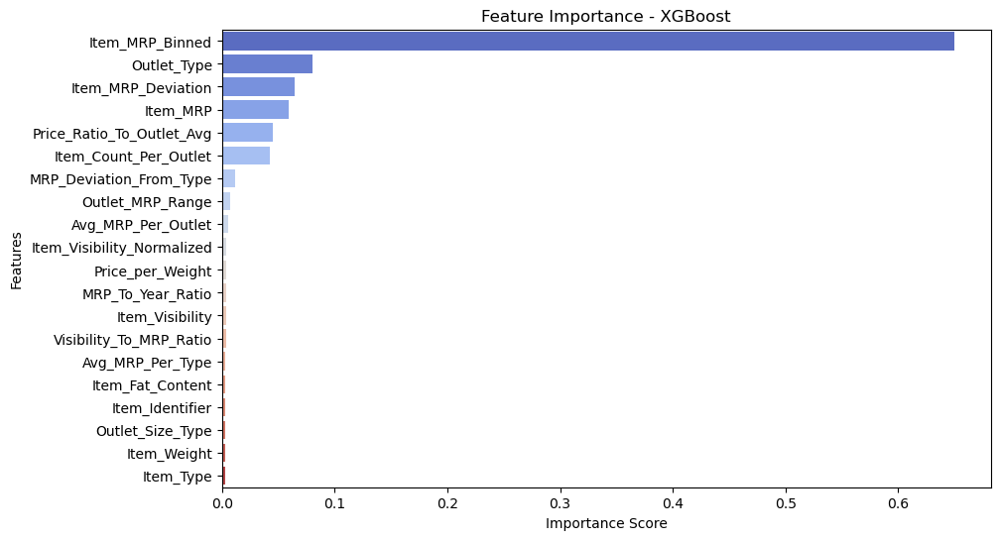

In [53]:
# Step 10:  **Feature Importance Visualization**
plot_feature_importance(final_xgb_model, X_train_selected)


In [54]:
# Step 11: **Prepare Test Set for Submission**
X_test_final_selected = test_df[X_train_selected.columns]  # Ensure same feature selection is applied

In [55]:
X_test_final_selected

,Item_MRP,Outlet_Type,Price_Ratio_To_Outlet_Avg,Item_Visibility,Item_Visibility_Normalized,MRP_Deviation_From_Type,Item_MRP_Deviation,MRP_To_Year_Ratio,Visibility_To_MRP_Ratio,Item_Identifier,Price_per_Weight,Item_Weight,Item_Count_Per_Outlet,Outlet_MRP_Range,Item_Type,Avg_MRP_Per_Type,Avg_MRP_Per_Outlet,Item_Fat_Content,Outlet_Size_Type,Item_MRP_Binned
0,107.8622,1,0.757133,0.007565,0.105064,-39.001723,-34.599250,4.148546,0.000070,1103,5.198178,20.750,620,234.0326,13,146.863923,142.461450,0,1,3
1,87.3198,1,0.609065,0.038428,0.520698,-58.006089,-56.047126,4.851100,0.000440,1067,10.520458,8.300,617,232.2668,4,145.325889,143.366926,1,5,2
2,241.7538,0,1.705699,0.099575,1.715801,106.648200,100.020835,8.953844,0.000412,1406,16.558479,14.600,370,233.1668,11,135.105600,141.732965,0,4,9
3,155.0340,1,1.081379,0.015388,0.213722,8.170077,11.667074,8.613000,0.000099,809,21.193985,7.315,617,232.2668,13,146.863923,143.366926,0,5,5
4,234.2300,3,1.639965,0.118599,1.607028,88.904111,91.403759,5.855750,0.000506,1184,18.738400,12.500,624,232.6668,4,145.325889,142.826241,1,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5676,141.3154,1,1.016885,0.013496,0.187446,-5.548523,2.346526,5.046979,0.000096,231,13.458610,10.500,620,230.5984,13,146.863923,138.968874,1,5,4
5677,169.1448,2,1.208322,0.142991,2.036413,17.051921,29.161599,10.571550,0.000845,306,22.255895,7.600,618,233.9326,15,152.092879,139.983201,1,2,6
5678,118.7440,1,0.843844,0.073529,1.172557,-17.885860,-21.973908,5.162783,0.000619,1412,11.874400,10.000,619,233.0326,8,136.629860,140.717908,0,5,4
5679,214.6218,1,1.497011,0.065684,0.918961,77.706012,71.254874,11.923433,0.000306,517,14.027569,15.300,617,232.2668,3,136.915788,143.366926,1,5,8


In [57]:
# Load the test dataset again
test_df_original = pd.read_csv('test_AbJTz2l.csv')
# Load the submission file
#submission_df = pd.read_csv("submission_final_12.csv")

In [58]:
# Step 12: **Make Predictions & Submit**

submission, y_pred_log = predict_and_submit(final_xgb_model, X_test_final_selected, test_df_original)

[1341.5269 1143.9614  705.4465 ... 1596.1959 2723.8962 1030.1652]
Submission File Created with 5681 Rows
